In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline 


In [2]:
import os
from os.path import join
import pandas as pd
from src.config import RESULTS, FIGURES_DIR, ROOT_DIR
from src.calculate_AF import calculate_af
#ref_fa = "/data2/genome/human_GRCh38/cellranger/refdata-cellranger-GRCh38-3.0.0/fasta/genome.fa"
ref_fa="/data2/mito_lineage/BWA-Primers-MT/MT_genome/MT.fasta"
maxBP = 16571


Project Directory: /data2/mito_lineage


In [3]:
from matplotlib_venn import venn2


In [4]:
import seaborn as sns
import matplotlib.pyplot as plt

In [5]:
from mplh import cluster_help

fig_utils from mplh


In [6]:
os.chdir(ROOT_DIR)

## Files setup

In [7]:
indir=join(RESULTS,"mttrace")
mapq = "mapq_30"
num_reads = 200
min_reads = 10
min_cells= 10
topN = -1
flt3 = "CD34_Flt3L_mt_PolydT"
wt = "CD34_mt_PolydT"



flt3_indir = join(indir, flt3,"mapq_30")
wt_indir = join(indir, wt,"mapq_30")

# sc_coverage_flt3_f = join(flt3_indir,"scPileup_concat_200",flt3+"_200_all.coverage.txt.gz")
# sc_coverage_wt_f = join(wt_indir,"scPileup_concat_200",wt + "_200_all.coverage.txt.gz")

coverage_flt3_dir = join(flt3_indir,flt3+"_scPileup_200")
coverage_wt_dir = join(wt_indir,wt+"_scPileup_200")

concat_flt3_dir = join(flt3_indir,"scPileup_concat_200")
concat_wt_dir = join(wt_indir,"scPileup_concat_200")

In [8]:
outdir = join(indir, "lineage_trace/CD34_mt_polydT/reads10_cells10_n1")
if not os.path.exists(outdir):
    os.makedirs(outdir)
outdir

'/data2/mito_lineage/data/processed/mttrace/lineage_trace/CD34_mt_polydT/reads10_cells10_n1'

### Get CD34 with and without Flt3L, first using polydT+mt
### Create allele frequency matrix for both, but add metadata for each cell about which experiment it came from
### Cluster and look

### Additional requirements is to remove poor-quality variants of BQ- see if Erick has the code of the mixture model

In [9]:
print(ref_fa)
print(maxBP)
print(coverage_wt_dir)
print(concat_wt_dir)

/data2/mito_lineage/BWA-Primers-MT/MT_genome/MT.fasta
16571
/data2/mito_lineage/data/processed/mttrace/CD34_mt_PolydT/mapq_30/CD34_mt_PolydT_scPileup_200
/data2/mito_lineage/data/processed/mttrace/CD34_mt_PolydT/mapq_30/scPileup_concat_200


In [10]:
wt_AF_by_cell, wt_af, wt_bq_df, wt_nt_df = calculate_af(coverage_wt_dir, concat_wt_dir, ref_fasta=ref_fa,AF_F=None, maxBP=maxBP, topN=topN, min_cells=min_cells, 
                                                        min_reads=min_reads)

no alt count 5331
Number of positions to keep : 1758
Number of cells to keep : 887


0it [00:00, ?it/s]

0it [00:00, ?it/s]
0it [00:00, ?it/s]

0it [00:00, ?it/s]
0it [00:00, ?it/s]



0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]

0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]
0it [00:00, ?it/s]


0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]3it/s]

0it [00:00, ?it/s]


0it [00:00, ?it/s]


0it [00:00, ?it/s]3it/s]

76it [00:00, 759.65it/s]


34it [00:00, 338.05it/s]
37it [00:00, 363.09it/s]
77it [00:00, 766.23it/s]

73it [00:00, 729.19it/s]
37it [00:00, 360.95it/s]
31it [00:00, 308.13it/s]
0it [00:00, ?it/s]





133it [00:00, 578.83it/s]
33it [00:00, 321.83it/s]

37it [00:00, 362.87it/s]]
35it [00:00, 347.40it/s]
62it [00:00, 305.41it/s]
49it [00:00, 248.67it/s]

38it [00:00, 373.70it/s]
36it [00:00, 355.07it/s]
36it [00:00, 356.16it/s]
37it [00:00, 363.09it/s]
38it [00:00, 374.04it/s]
55it [00:00, 280.59it/s]
38it [00:00, 373.69it/s]



45it [00:00, 225.34it/s]
66it [00:00, 659.61it/s]

127it [

439it [00:01, 281.19it/s]
450it [00:01, 279.99it/s]

1083it [00:01, 542.04it/s]
866it [00:01, 684.15it/s]


392it [00:01, 256.13it/s]
422it [00:01, 238.94it/s]
702it [00:01, 493.29it/s]
787it [00:01, 622.39it/s]

1324it [00:01, 798.24it/s]
717it [00:01, 496.14it/s]]

429it [00:01, 252.47it/s]

1287it [00:01, 656.76it/s]
1126it [00:01, 572.49it/s]

439it [00:01, 218.69it/s]


1182it [00:01, 620.95it/s]

504it [00:01, 327.19it/s]

1048it [00:01, 600.21it/s]
1132it [00:01, 509.80it/s]

946it [00:01, 714.79it/s]
683it [00:01, 429.54it/s]


965it [00:01, 523.51it/s]]

448it [00:01, 243.25it/s]

1146it [00:01, 519.77it/s]
761it [00:01, 518.31it/s]][A


858it [00:01, 630.54it/s]]
979it [00:01, 461.42it/s]
429it [00:01, 226.44it/s]
455it [00:01, 252.84it/s]


995it [00:01, 610.10it/s]


778it [00:01, 501.16it/s]
507it [00:01, 305.04it/s]




1359it [00:01, 604.39it/s]
482it [00:01, 253.74it/s]]

1254it [00:01, 619.73it/s]

1079it [00:01, 559.24it/s]
497it [00:02, 235.92it/s]]
1160it [00:01, 62

1329it [00:03, 590.92it/s]


0it [00:00, ?it/s]14it/s]

216it [00:00, 730.45it/s][A
539it [00:00, 672.07it/s]
1188it [00:03, 631.68it/s]
1110it [00:03, 584.00it/s]

1259it [00:03, 594.35it/s]
524it [00:00, 737.75it/s]

320it [00:00, 730.93it/s]
311it [00:00, 769.19it/s]
443it [00:00, 859.53it/s]
288it [00:00, 585.08it/s]

992it [00:01, 934.09it/s]
0it [00:00, ?it/s]92it/s]
1421it [00:03, 679.57it/s]

0it [00:00, ?it/s]
223it [00:00, 705.13it/s]

1612it [00:03, 703.23it/s]
75it [00:00, 745.51it/s]s]


237it [00:00, 741.92it/s]]

199it [00:00, 646.38it/s]


298it [00:00, 752.52it/s]

56it [00:00, 558.56it/s]
96it [00:00, 958.86it/s]]

187it [00:00, 929.75it/s]
1186it [00:03, 627.12it/s]
591it [00:00, 711.70it/s]

538it [00:00, 884.69it/s]

380it [00:00, 656.64it/s]


1084it [00:01, 923.38it/s]

1341it [00:03, 647.29it/s]
474it [00:00, 719.56it/s]
411it [00:00, 770.67it/s]



521it [00:00, 634.75it/s]]

106it [00:00, 1052.45it/s]


637it [00:00, 716.44it/s]]
286it [00:00, 619.64it/s]

304

1568it [00:01, 809.64it/s]


508it [00:00, 836.47it/s]][A

807it [00:01, 604.90it/s]]


1419it [00:02, 648.25it/s]
1382it [00:02, 634.39it/s]

675it [00:01, 675.39it/s]]

2it [00:05,  2.61s/it]
1243it [00:01, 693.18it/s]

1417it [00:01, 732.72it/s]
2it [00:05,  2.59s/it]
1153it [00:01, 686.40it/s]
1572it [00:02, 650.58it/s]

1330it [00:01, 696.93it/s]



1410it [00:01, 631.66it/s]

1340it [00:01, 663.46it/s]
820it [00:01, 670.94it/s]




1450it [00:02, 627.86it/s]

1391it [00:02, 551.74it/s]
1667it [00:02, 729.70it/s]


772it [00:01, 742.85it/s]]

0it [00:00, ?it/s].41it/s]
1350it [00:01, 815.32it/s]
0it [00:00, ?it/s]

1378it [00:01, 732.57it/s]


1501it [00:01, 882.20it/s][A
1494it [00:01, 711.57it/s]
1709it [00:02, 792.47it/s]
1229it [00:01, 700.74it/s]

1700it [00:02, 616.38it/s]
1709it [00:02, 744.49it/s]




1475it [00:02, 614.67it/s]
708it [00:00, 714.52it/s]

2it [00:05,  2.75s/it]/s]]

2it [00:05,  2.76s/it]

903it [00:01, 711.81it/s]]
833it [00:01, 788.60it/s]
1560it [00:02, 

169it [00:00, 872.21it/s]

1402it [00:01, 862.94it/s]


927it [00:01, 771.39it/s]


589it [00:00, 673.92it/s]

0it [00:00, ?it/s]90it/s]
0it [00:00, ?it/s]31it/s]]
801it [00:01, 771.85it/s]
713it [00:01, 651.34it/s]



166it [00:00, 810.92it/s] 
399it [00:00, 742.76it/s]
1078it [00:01, 772.94it/s]
1709it [00:02, 777.01it/s][A


2it [00:06,  3.74s/it]/s]


418it [00:00, 820.74it/s]

955it [00:01, 907.47it/s]


991it [00:01, 792.33it/s]
868it [00:01, 800.58it/s]


1496it [00:01, 880.56it/s]
1006it [00:01, 720.83it/s]

673it [00:00, 716.33it/s]
281it [00:00, 693.23it/s]
882it [00:01, 781.95it/s]
808it [00:01, 816.82it/s]
804it [00:01, 711.54it/s]

93it [00:00, 926.37it/s]s]

0it [00:00, ?it/s].18it/s]
1231it [00:01, 754.26it/s]

265it [00:00, 857.25it/s]
268it [00:00, 908.95it/s]
487it [00:00, 771.73it/s]
619it [00:00, 767.60it/s]
1157it [00:01, 766.32it/s]
880it [00:01, 789.90it/s]

170it [00:00, 843.02it/s]

486it [00:00, 768.36it/s]
828it [00:01, 683.50it/s]]
363it [00:00, 915.47it/s]


1410it [00:01, 905.47it/s]
265it [00:00, 868.01it/s]
222it [00:00, 656.44it/s]
351it [00:00, 673.97it/s]
1678it [00:01, 971.57it/s]

169it [00:00, 871.14it/s]
348it [00:00, 864.82it/s]
268it [00:00, 882.23it/s]
1602it [00:02, 789.33it/s]
276it [00:00, 661.57it/s]

1709it [00:01, 957.15it/s][A
4it [00:08,  2.05s/it]
592it [00:00, 822.81it/s]
257it [00:00, 836.00it/s]

195it [00:00, 1004.68it/s]
340it [00:00, 775.52it/s]
1219it [00:01, 760.45it/s]
1502it [00:01, 805.63it/s]



1488it [00:01, 885.16it/s]
964it [00:01, 928.83it/s]]
54it [00:00, 481.47it/s]] 

190it [00:00, 930.25it/s]


1174it [00:01, 823.57it/s]
88it [00:00, 879.48it/s]]
429it [00:00, 701.34it/s]
1652it [00:02, 665.01it/s]
1579it [00:02, 676.90it/s]

0it [00:00, ?it/s]
234it [00:00, 788.93it/s]]

1344it [00:01, 812.24it/s]

411it [00:00, 751.18it/s]]

358it [00:00, 700.34it/s]
165it [00:00, 820.70it/s]
682it [00:00, 843.81it/s]

275it [00:00, 932.15it/s] 
405it [00:00, 731.58it/s]
313it [00:00, 710.01it/s]
109it [00:00, 4

533it [00:00, 1032.66it/s]
1154it [00:01, 746.96it/s]
853it [00:01, 732.24it/s]



638it [00:00, 802.76it/s]
988it [00:01, 727.34it/s]
1561it [00:01, 769.72it/s]
1302it [00:01, 666.86it/s]
1375it [00:01, 661.68it/s]

1411it [00:01, 727.76it/s]
1349it [00:01, 710.37it/s]

847it [00:01, 663.61it/s]]

1429it [00:01, 749.07it/s]
84it [00:00, 837.35it/s]

897it [00:01, 715.60it/s]
499it [00:00, 633.20it/s]

1354it [00:01, 928.18it/s]

1510it [00:01, 818.30it/s]

634it [00:00, 772.93it/s]]

617it [00:00, 924.27it/s] 
1232it [00:01, 751.87it/s]
1240it [00:01, 591.40it/s]
946it [00:01, 735.71it/s]

1009it [00:01, 683.47it/s][A


1441it [00:01, 719.27it/s]

1370it [00:01, 644.26it/s]
1443it [00:02, 610.85it/s]



914it [00:01, 655.66it/s]
1485it [00:02, 714.79it/s]
1553it [00:02, 751.75it/s]

1505it [00:01, 741.19it/s]
1516it [00:02, 687.80it/s]
1063it [00:01, 650.51it/s]
165it [00:00, 827.30it/s]
1584it [00:02, 668.28it/s][A

1448it [00:01, 930.23it/s]


1605it [00:02, 852.14it/s]


709it [00:

868it [00:00, 911.53it/s]


897it [00:01, 874.52it/s]

0it [00:00, ?it/s]

511it [00:00, 1008.22it/s]






1008it [00:01, 951.93it/s]
1161it [00:01, 983.61it/s]]





761it [00:00, 964.34it/s]
199it [00:00, 1033.18it/s][A
1064it [00:01, 1071.70it/s]
339it [00:00, 1158.47it/s]]
1477it [00:01, 938.48it/s]


1696it [00:01, 1067.17it/s]

1212it [00:01, 1089.33it/s]
1002it [00:01, 890.60it/s]


1137it [00:01, 948.17it/s]]
978it [00:01, 959.25it/s]

1067it [00:01, 873.44it/s]
602it [00:00, 976.41it/s] 

1099it [00:01, 988.68it/s]
567it [00:00, 877.89it/s]
442it [00:00, 1083.55it/s]

410it [00:00, 1032.89it/s]
121it [00:00, 1205.85it/s]
934it [00:00, 1011.46it/s]



1021it [00:01, 925.69it/s]]



1169it [00:01, 1057.24it/s][A

976it [00:01, 934.51it/s]]]


1577it [00:01, 954.24it/s]

309it [00:00, 1051.11it/s]
863it [00:00, 919.89it/s]
562it [00:00, 1029.40it/s]
1105it [00:01, 926.80it/s]]

1080it [00:01, 890.37it/s]

1073it [00:01, 929.39it/s]

703it [00:00, 984.36it/s]]

202it [00:00, 1051

0it [00:00, ?it/s]12it/s]




186it [00:00, 945.67it/s]]
474it [00:00, 733.38it/s]]
233it [00:00, 738.11it/s]



251it [00:00, 837.23it/s]]



431it [00:00, 859.99it/s]
516it [00:00, 892.21it/s]

640it [00:00, 813.57it/s]
1326it [00:01, 808.17it/s]

1028it [00:01, 812.49it/s][A
927it [00:00, 1004.39it/s]



497it [00:00, 798.76it/s]


542it [00:00, 825.47it/s]




605it [00:00, 811.04it/s]

1556it [00:01, 842.97it/s]
657it [00:00, 911.94it/s]s]

555it [00:00, 753.68it/s]
328it [00:00, 815.16it/s]
760it [00:00, 796.36it/s]



600it [00:00, 874.90it/s]]
728it [00:00, 829.15it/s]

756it [00:00, 822.44it/s]




1109it [00:01, 739.81it/s]

1029it [00:01, 1008.65it/s]
566it [00:00, 761.74it/s]
0it [00:00, ?it/s]
510it [00:00, 773.93it/s]




114it [00:00, 1131.86it/s][A




1641it [00:01, 815.37it/s]]A



740it [00:00, 847.38it/s]

400it [00:00, 783.97it/s]
324it [00:00, 1081.53it/s]
691it [00:00, 882.73it/s]
804it [00:00, 903.30it/s]
828it [00:01, 873.23it/s]
909it [00:01, 882.68it/s]
841it

1334it [00:01, 727.54it/s]
966it [00:01, 927.65it/s]

0it [00:00, ?it/s].71it/s]

1707it [00:02, 746.65it/s]


85it [00:00, 846.47it/s]s]

777it [00:00, 793.77it/s]]

1392it [00:01, 744.14it/s]
6it [00:14,  2.36s/it]s]s]

108it [00:00, 1076.11it/s]


1709it [00:02, 796.66it/s]

6it [00:14,  2.33s/it]
245it [00:00, 822.95it/s]
1030it [00:01, 865.30it/s]


1134it [00:01, 835.43it/s]
212it [00:00, 1054.33it/s]
1332it [00:01, 794.97it/s]
1305it [00:01, 843.17it/s]

1709it [00:02, 801.83it/s]



0it [00:00, ?it/s]
164it [00:00, 827.05it/s]

1071it [00:01, 960.32it/s]
6it [00:14,  2.37s/it]t/s]

1684it [00:01, 912.25it/s]
1469it [00:01, 751.22it/s]

0it [00:00, ?it/s]
871it [00:01, 831.57it/s]

116it [00:00, 1159.61it/s]
164it [00:00, 806.87it/s]]

1709it [00:01, 895.46it/s]
0it [00:00, ?it/s]12it/s]



110it [00:00, 1098.34it/s]
342it [00:00, 861.76it/s]
1129it [00:01, 899.15it/s]
647it [00:00, 905.30it/s] 
1430it [00:01, 841.73it/s]



1526it [00:02, 778.05it/s]
318it [00:00, 794.93it/s]



358it [00:00, 653.41it/s]
1058it [00:01, 602.63it/s]
525it [00:00, 535.22it/s]
386it [00:00, 654.75it/s]][A
191it [00:00, 994.38it/s] 

414it [00:00, 604.47it/s]






1709it [00:03, 555.90it/s]
0it [00:00, ?it/s]
1013it [00:01, 580.44it/s]

384it [00:00, 531.24it/s]
1658it [00:02, 652.32it/s]
978it [00:01, 606.88it/s]
369it [00:00, 585.43it/s]
699it [00:01, 495.67it/s]

7it [00:18,  2.74s/it]


825it [00:01, 537.71it/s]

836it [00:01, 606.07it/s]
519it [00:00, 656.43it/s]
1084it [00:01, 611.95it/s]
780it [00:01, 527.16it/s]

666it [00:01, 522.39it/s]]
578it [00:01, 510.28it/s]


154it [00:00, 671.40it/s] [A
852it [00:01, 584.80it/s]]
999it [00:01, 621.54it/s]


1000it [00:01, 528.16it/s]

1074it [00:01, 579.20it/s]

986it [00:01, 606.95it/s]
1039it [00:01, 577.95it/s]


0it [00:00, ?it/s]62it/s]


421it [00:00, 549.08it/s]
749it [00:01, 487.74it/s]
363it [00:00, 603.71it/s]

731it [00:01, 554.87it/s]]
898it [00:01, 589.97it/s]





1180it [00:02, 562.45it/s]
835it [00:01, 512.83it/s]




508it [00:00, 571.81it/s]
489it [00:00, 665.46it/s]
330it [00:00, 632.99it/s]
137it [00:00, 709.04it/s]
151it [00:00, 774.14it/s]]
735it [00:01, 537.12it/s]]


1663it [00:03, 526.02it/s]


1384it [00:02, 554.21it/s]
854it [00:01, 616.22it/s]
210it [00:00, 576.22it/s]
175it [00:00, 904.17it/s] 

457it [00:00, 562.75it/s]

672it [00:01, 541.96it/s]][A
280it [00:00, 660.10it/s]

400it [00:00, 727.13it/s]

697it [00:01, 663.96it/s]]



773it [00:01, 542.76it/s]




174it [00:00, 554.39it/s]]
387it [00:00, 612.21it/s]
568it [00:00, 697.03it/s]
178it [00:00, 914.24it/s] 
239it [00:00, 802.80it/s]
503it [00:00, 586.21it/s]

801it [00:01, 568.66it/s]]
929it [00:01, 650.18it/s]]
1448it [00:02, 575.16it/s]


337it [00:00, 629.61it/s]


546it [00:00, 631.73it/s]]



1625it [00:02, 541.52it/s]
889it [00:01, 534.65it/s]

303it [00:00, 683.57it/s]





655it [00:01, 550.37it/s]
856it [00:01, 604.56it/s]

229it [00:00, 551.35it/s]][A

635it [00:00, 687.77it/s]]
453it [00:00, 625.80it/s]

222it [00:

440it [00:00, 590.67it/s]

640it [00:01, 572.29it/s] 
391it [00:00, 585.88it/s]]



1703it [00:02, 530.30it/s]




1434it [00:02, 575.74it/s]
318it [00:00, 765.68it/s]
1125it [00:01, 533.22it/s][A

1709it [00:02, 570.65it/s][A
583it [00:00, 513.11it/s]


102it [00:00, 1007.83it/s]

161it [00:00, 819.40it/s]
519it [00:00, 549.62it/s]


597it [00:00, 639.51it/s]][A
1709it [00:02, 593.53it/s]
0it [00:00, ?it/s]
756it [00:01, 619.74it/s]



1553it [00:02, 631.63it/s]
465it [00:00, 624.41it/s]
9it [00:24,  2.87s/it]/s]][A
714it [00:01, 613.46it/s]


1443it [00:02, 622.70it/s]




391it [00:00, 752.58it/s]

1185it [00:02, 551.53it/s]
259it [00:00, 620.52it/s]
787it [00:01, 577.45it/s]


331it [00:00, 603.22it/s]


1146it [00:01, 615.39it/s]


272it [00:00, 613.91it/s]




674it [00:00, 606.77it/s]]
534it [00:00, 638.48it/s]

555it [00:00, 542.26it/s]



1508it [00:02, 607.32it/s]
452it [00:00, 696.72it/s]



304it [00:00, 555.90it/s]]
491it [00:00, 681.92it/s]
382it [00:00, 562.23it/s]

1579

317it [00:00, 589.29it/s]
1079it [00:01, 533.54it/s]

1057it [00:01, 678.92it/s]
1709it [00:02, 609.46it/s]

1422it [00:02, 698.27it/s]


1480it [00:02, 611.74it/s]
10it [00:25,  2.77s/it]

769it [00:01, 664.46it/s]
10it [00:25,  2.79s/it]s]]
1026it [00:01, 694.66it/s]
1584it [00:02, 596.77it/s]


0it [00:00, ?it/s]


1582it [00:02, 629.67it/s][A
111it [00:00, 1107.69it/s]
0it [00:00, ?it/s]


1709it [00:02, 620.06it/s]
1479it [00:02, 629.66it/s]

366it [00:00, 549.77it/s]


74it [00:00, 737.66it/s]

1322it [00:02, 545.60it/s]
1135it [00:01, 541.17it/s]

1544it [00:02, 614.30it/s]
1132it [00:01, 601.75it/s]
1127it [00:01, 660.93it/s]

1496it [00:02, 550.62it/s]
10it [00:25,  2.82s/it]
992it [00:01, 652.07it/s]]
1097it [00:01, 698.66it/s]
859it [00:01, 719.82it/s]
0it [00:00, ?it/s].70it/s]

180it [00:00, 936.20it/s] 





133it [00:00, 682.10it/s]
1647it [00:02, 562.70it/s]
1544it [00:02, 602.20it/s]

431it [00:00, 575.42it/s]]

664it [00:01, 553.43it/s]
1194it [00:01, 602.03it/s]
859i

932it [00:01, 605.94it/s]

205it [00:00, 624.53it/s]
962it [00:01, 561.87it/s]]
10it [00:27,  2.88s/it]s]

1008it [00:01, 626.22it/s]



1709it [00:02, 588.83it/s]

202it [00:00, 623.46it/s]
1002it [00:01, 575.12it/s]
468it [00:00, 624.03it/s]]
565it [00:00, 640.29it/s]]
116it [00:00, 1152.03it/s]
393it [00:00, 606.89it/s]

634it [00:01, 497.91it/s]
806it [00:01, 573.09it/s]







586it [00:00, 514.63it/s]
1253it [00:01, 673.18it/s][A

1312it [00:02, 599.82it/s]

928it [00:01, 549.10it/s]

304it [00:00, 513.55it/s]]
697it [00:01, 575.51it/s]]
209it [00:00, 703.72it/s]


262it [00:00, 615.48it/s]


995it [00:01, 544.28it/s] 



525it [00:00, 546.36it/s]]
1159it [00:01, 609.17it/s]

627it [00:00, 597.40it/s]



952it [00:01, 670.03it/s]]

329it [00:00, 553.19it/s]

296it [00:00, 489.80it/s]
1000it [00:01, 520.84it/s]



357it [00:00, 517.88it/s]

1638it [00:02, 505.52it/s]


1081it [00:01, 523.29it/s]
1373it [00:02, 541.30it/s][A

252it [00:00, 541.09it/s]
1052it [00:01, 507.81it/s]
581

11it [00:29,  2.96s/it]/s]

306it [00:00, 483.84it/s][A
847it [00:01, 535.30it/s]


863it [00:01, 555.38it/s]
178it [00:00, 906.00it/s] 


1080it [00:01, 522.92it/s]
338it [00:00, 620.92it/s]
1593it [00:02, 546.81it/s]

43it [00:00, 427.12it/s]s]
1350it [00:02, 507.48it/s]
1108it [00:02, 471.20it/s]
1449it [00:02, 513.63it/s]

231it [00:00, 535.35it/s]]
597it [00:01, 514.97it/s]
699it [00:01, 463.36it/s]

1578it [00:02, 494.47it/s]


1494it [00:02, 608.15it/s]
902it [00:01, 531.63it/s]]
245it [00:00, 571.43it/s]
145it [00:00, 750.18it/s]

926it [00:01, 574.85it/s]
0it [00:00, ?it/s].32it/s]
377it [00:00, 534.76it/s]]

1156it [00:02, 465.68it/s]


1709it [00:03, 557.78it/s]

95it [00:00, 451.29it/s]

1123it [00:01, 568.56it/s]
611it [00:01, 575.86it/s]
98it [00:00, 973.77it/s]

1141it [00:02, 546.27it/s]
396it [00:00, 604.47it/s]
86it [00:00, 858.88it/s]s]


1649it [00:02, 519.98it/s]
84it [00:00, 786.74it/s]
1557it [00:02, 603.10it/s][A
1503it [00:02, 467.96it/s]


221it [00:00, 750.50

605it [00:01, 516.73it/s]]

893it [00:01, 448.88it/s]





94it [00:00, 933.99it/s]
1105it [00:02, 416.96it/s]
1709it [00:03, 505.79it/s]

995it [00:01, 509.28it/s]




142it [00:00, 614.74it/s] 

140it [00:00, 544.23it/s]
11it [00:31,  3.12s/it]s]



850it [00:01, 456.17it/s]

1463it [00:03, 432.51it/s]
957it [00:01, 492.42it/s]
1164it [00:02, 431.49it/s]
417it [00:00, 425.37it/s]

212it [00:00, 395.43it/s]
1633it [00:02, 570.36it/s]


659it [00:01, 494.70it/s]]


1167it [00:02, 448.88it/s]
597it [00:01, 474.25it/s]
1149it [00:02, 416.79it/s][A
1546it [00:03, 446.37it/s]

924it [00:01, 405.36it/s]


1049it [00:02, 503.69it/s]

897it [00:01, 451.78it/s]
212it [00:00, 637.26it/s]
918it [00:01, 464.55it/s]


162it [00:00, 800.86it/s]
653it [00:01, 430.14it/s]

1358it [00:02, 458.39it/s]
1035it [00:01, 553.10it/s]


186it [00:00, 514.52it/s]
0it [00:00, ?it/s]


458it [00:00, 394.46it/s]]

657it [00:01, 504.97it/s]
1127it [00:02, 384.66it/s]
1208it [00:02, 456.56it/s]
979it [00:02, 421.84

506it [00:00, 1000.33it/s]
1709it [00:32, 52.14it/s]

1482it [00:32, 71.88it/s]
12it [01:02, 11.94s/it]
1129it [00:31, 75.05it/s]
527it [00:00, 1053.56it/s]
1446it [00:31, 57.63it/s]]
1263it [00:31, 55.37it/s]
1536it [00:32, 87.26it/s]
1146it [00:31, 71.53it/s]

890it [00:31, 32.84it/s]] 

654it [00:00, 887.81it/s]
1347it [00:31, 75.18it/s]

1438it [00:31, 113.21it/s]
568it [00:00, 845.28it/s]
1668it [00:32, 67.95it/s]]
1058it [00:21, 131.28it/s]

397it [00:00, 962.87it/s] 



467it [00:00, 899.01it/s]
191it [00:00, 991.01it/s] 

476it [00:00, 857.74it/s]

0it [00:00, ?it/s]9it/s]]

1493it [00:31, 72.32it/s]
1464it [00:31, 113.32it/s]
618it [00:00, 1005.65it/s]
589it [00:00, 886.69it/s] 

1223it [00:31, 103.44it/s]

1537it [00:31, 80.07it/s]

1363it [00:31, 77.26it/s]]
1247it [00:31, 99.17it/s]

301it [00:00, 1015.69it/s]
750it [00:00, 907.34it/s]

111it [00:00, 1106.42it/s]
658it [00:00, 859.31it/s]
1545it [00:31, 154.69it/s]

1170it [00:21, 178.57it/s]
821it [00:00, 934.30it/s]
0it [

0it [00:00, ?it/s].07it/s]

1492it [00:02, 829.85it/s]
1647it [00:02, 902.49it/s]

1560it [00:02, 895.12it/s]
628it [00:00, 1028.68it/s]
1417it [00:02, 858.35it/s]


221it [00:00, 1125.67it/s]
13it [01:04,  9.09s/it]s]

400it [00:00, 998.52it/s] 

1095it [00:00, 1190.87it/s]
1035it [00:00, 1054.53it/s]
1044it [00:01, 764.23it/s]
13it [01:04,  9.14s/it]/s]
134it [00:00, 1333.33it/s]
523it [00:00, 1028.94it/s]
1323it [00:02, 871.41it/s]
13it [01:04,  9.12s/it]
1597it [00:02, 913.95it/s]

829it [00:00, 1003.71it/s]
608it [00:00, 1191.60it/s]
487it [00:00, 1155.30it/s]

1139it [00:01, 821.56it/s][A

1237it [00:02, 820.99it/s]


933it [00:00, 987.37it/s] 
867it [00:00, 1030.00it/s]
1257it [00:01, 847.74it/s]
1663it [00:02, 926.46it/s]
295it [00:00, 972.57it/s] 
1516it [00:02, 878.93it/s]
720it [00:00, 961.76it/s] 
0it [00:00, ?it/s]
476it [00:00, 911.15it/s]

908it [00:00, 943.64it/s]
1549it [00:02, 929.26it/s]
244it [00:00, 1253.32it/s]
1148it [00:01, 786.11it/s]

1137it [00:01, 992.37it/s

1251it [00:01, 685.40it/s]
657it [00:00, 751.04it/s]]
604it [00:00, 703.85it/s]

1579it [00:01, 913.30it/s]
438it [00:00, 588.57it/s]]


1594it [00:01, 679.33it/s]


0it [00:00, ?it/s]44it/s]
643it [00:00, 762.25it/s]]

127it [00:00, 1262.92it/s]
1709it [00:01, 859.11it/s]

1515it [00:01, 795.43it/s]


318it [00:00, 1071.48it/s]
1179it [00:01, 788.60it/s]
881it [00:01, 761.11it/s]

1077it [00:01, 819.37it/s]
298it [00:00, 981.31it/s]
565it [00:00, 720.80it/s]

1504it [00:01, 808.01it/s]
1338it [00:01, 729.60it/s]


390it [00:00, 983.89it/s]
310it [00:00, 1053.17it/s]

750it [00:00, 796.46it/s]

1693it [00:01, 749.64it/s]
1694it [00:01, 970.72it/s]
641it [00:00, 777.16it/s]

1248it [00:01, 787.63it/s]

0it [00:00, ?it/s].72it/s]

1709it [00:01, 971.28it/s]

120it [00:00, 1197.91it/s]
230it [00:00, 1180.56it/s]
222it [00:00, 1126.42it/s]

412it [00:00, 1027.58it/s]
619it [00:00, 683.76it/s]

1190it [00:01, 850.63it/s]
976it [00:01, 808.90it/s]
1179it [00:01, 870.29it/s]
388it [00:00, 954

491it [00:00, 690.93it/s]

14it [01:07,  7.07s/it]

705it [00:00, 806.81it/s]
469it [00:00, 694.61it/s]
348it [00:00, 852.30it/s] 

0it [00:00, ?it/s]
681it [00:00, 701.92it/s]

1577it [00:01, 812.56it/s]
0it [00:00, ?it/s]
1412it [00:01, 625.88it/s]

438it [00:00, 865.10it/s]
609it [00:00, 691.57it/s]
554it [00:00, 734.54it/s]
786it [00:00, 807.13it/s]
1709it [00:01, 1004.05it/s]A
111it [00:00, 1105.55it/s]

681it [00:00, 757.61it/s]]
1061it [00:01, 821.98it/s]
599it [00:00, 1003.52it/s]


1562it [00:02, 747.66it/s]
725it [00:00, 786.54it/s]
679it [00:00, 837.09it/s]


879it [00:01, 839.90it/s]

485it [00:00, 978.34it/s]

145it [00:00, 418.68it/s] 

0it [00:00, ?it/s].61it/s]

1632it [00:02, 645.88it/s]
269it [00:00, 882.50it/s] 
1190it [00:01, 783.33it/s]
198it [00:00, 1020.52it/s]

727it [00:01, 494.51it/s]




266it [00:00, 405.57it/s]

1583it [00:02, 767.43it/s]
1289it [00:01, 732.53it/s]
0it [00:00, ?it/s]


1143it [00:01, 562.56it/s]



323it [00:00, 481.11it/s]]


1409it [00:01

1010it [00:01, 1014.95it/s]A
1701it [00:02, 879.89it/s]
891it [00:01, 729.47it/s]]


124it [00:00, 1238.64it/s]
1373it [00:01, 867.21it/s]
1709it [00:02, 831.33it/s][A

427it [00:00, 854.75it/s]


207it [00:00, 1067.01it/s]

931it [00:01, 699.53it/s]


0it [00:00, ?it/s]

1109it [00:01, 860.23it/s]
1295it [00:01, 809.47it/s]
1572it [00:01, 1019.23it/s]

1476it [00:02, 761.40it/s]


1120it [00:01, 783.10it/s]
1051it [00:01, 853.07it/s]

200it [00:00, 1038.21it/s]
235it [00:00, 720.57it/s]
249it [00:00, 839.87it/s]
1109it [00:01, 934.70it/s] 
1433it [00:01, 761.39it/s]

1461it [00:01, 861.04it/s][A



628it [00:00, 788.13it/s]]


1001it [00:01, 662.46it/s]
308it [00:00, 1034.52it/s]








1378it [00:01, 761.45it/s]
258it [00:00, 832.54it/s] A
1197it [00:01, 755.97it/s]
315it [00:00, 775.32it/s]

1200it [00:01, 682.51it/s]


1202it [00:01, 910.13it/s]

1123it [00:01, 690.50it/s]
1675it [00:01, 912.83it/s] 
1512it [00:01, 738.92it/s][A





448it [00:00, 823.60it/s]

1398it [00:01, 845.1

1274it [00:01, 869.99it/s]
768it [00:01, 720.85it/s]]

1454it [00:01, 794.63it/s]

1580it [00:01, 752.07it/s]
556it [00:00, 933.57it/s] 



804it [00:01, 665.95it/s]
464it [00:00, 929.34it/s]
1264it [00:01, 770.20it/s]A



871it [00:00, 857.54it/s]
320it [00:00, 796.84it/s]]
1001it [00:01, 837.72it/s]
1631it [00:02, 761.42it/s]
198it [00:00, 516.00it/s]
1427it [00:01, 659.57it/s]


848it [00:01, 708.04it/s]

0it [00:00, ?it/s].62it/s]
848it [00:01, 742.81it/s]

1362it [00:01, 840.99it/s]

1562it [00:01, 685.20it/s]

878it [00:01, 685.92it/s]]
1035it [00:01, 864.23it/s]



480it [00:00, 793.68it/s]

104it [00:00, 1035.90it/s]
639it [00:00, 803.44it/s]




973it [00:01, 900.08it/s]]

1486it [00:01, 595.82it/s]
785it [00:01, 718.77it/s]][A

1352it [00:01, 925.68it/s]
932it [00:00, 1033.73it/s]

1539it [00:01, 752.02it/s]

928it [00:01, 758.95it/s]
953it [00:01, 779.87it/s]



128it [00:00, 1273.04it/s]


1636it [00:02, 699.58it/s]


1555it [00:02, 620.95it/s][A




209it [00:00, 1039.57it

247it [00:00, 784.12it/s] 
479it [00:00, 906.60it/s]

861it [00:01, 722.30it/s]

1471it [00:01, 834.79it/s]

1220it [00:01, 745.51it/s]



1535it [00:02, 725.89it/s]
929it [00:01, 922.84it/s] 

1709it [00:02, 816.94it/s][A



494it [00:00, 745.47it/s]]
473it [00:00, 779.16it/s]
1445it [00:01, 911.95it/s][A





1037it [00:01, 766.98it/s][A
223it [00:00, 1121.05it/s]
901it [00:01, 818.98it/s]

1638it [00:02, 689.98it/s][A

890it [00:01, 740.11it/s]]


1561it [00:02, 852.57it/s]

1278it [00:01, 733.69it/s]
210it [00:00, 962.00it/s]
342it [00:00, 826.26it/s]]
986it [00:01, 893.68it/s]
240it [00:00, 763.96it/s]]

1145it [00:01, 797.47it/s][A


1031it [00:01, 957.26it/s]
1021it [00:01, 891.67it/s]

0it [00:00, ?it/s]93it/s]]


786it [00:00, 703.35it/s]
642it [00:00, 887.38it/s]]
344it [00:00, 815.35it/s]
1538it [00:01, 857.56it/s]

1709it [00:02, 731.99it/s][A




1076it [00:01, 886.85it/s]
968it [00:01, 750.15it/s]
16it [01:12,  4.69s/it]




906it [00:01, 874.38it/s]]
1355it [00:01, 730.0

296it [00:00, 987.95it/s] 



256it [00:00, 810.44it/s] 

737it [00:00, 921.10it/s] [A


730it [00:00, 1017.53it/s]
371it [00:00, 906.50it/s]
320it [00:00, 1067.92it/s]
1538it [00:01, 892.53it/s]



1498it [00:01, 780.24it/s]
1116it [00:01, 780.04it/s]
1378it [00:01, 742.21it/s]



125it [00:00, 1242.13it/s]
1131it [00:01, 689.60it/s]



359it [00:00, 885.63it/s]
312it [00:00, 1045.31it/s][A
1387it [00:01, 754.35it/s]



529it [00:00, 735.72it/s]
943it [00:01, 762.72it/s]][A
1063it [00:01, 790.52it/s]
573it [00:00, 843.50it/s]
404it [00:00, 987.07it/s] [A
824it [00:00, 976.14it/s] 

1585it [00:02, 803.59it/s]

1195it [00:01, 777.81it/s]
601it [00:00, 801.89it/s]


905it [00:01, 697.49it/s]



1336it [00:01, 780.53it/s]
206it [00:00, 1067.54it/s]
387it [00:00, 578.91it/s]
825it [00:00, 785.22it/s]]

196it [00:00, 977.02it/s] [A
465it [00:00, 908.84it/s] 

768it [00:00, 742.72it/s]

1205it [00:01, 672.00it/s]

1022it [00:01, 760.21it/s]

1694it [00:02, 772.70it/s][A
1641it [00:01, 733.38

979it [00:01, 795.91it/s]


108it [00:00, 1071.93it/s][A

1426it [00:01, 780.08it/s][A
1493it [00:01, 920.88it/s]


513it [00:00, 1024.43it/s]
1644it [00:01, 884.77it/s]
1305it [00:01, 814.95it/s]
18it [01:15,  3.43s/it]s] 
1658it [00:02, 784.70it/s]
0it [00:00, ?it/s]
873it [00:01, 894.03it/s]


664it [00:00, 720.95it/s]


622it [00:00, 837.84it/s]]


1650it [00:02, 800.45it/s]



426it [00:00, 844.88it/s]]


309it [00:00, 726.05it/s]
1640it [00:02, 772.09it/s]
20it [01:15,  3.14s/it]s]
217it [00:00, 1068.69it/s]
1587it [00:01, 867.62it/s]

1144it [00:01, 914.61it/s]

1505it [00:01, 731.19it/s]
1413it [00:01, 876.17it/s]

0it [00:00, ?it/s]
1709it [00:02, 812.64it/s]


961it [00:01, 882.58it/s]
18it [01:16,  3.47s/it]s]
960it [00:01, 849.74it/s]]


197it [00:00, 1019.45it/s]

1709it [00:02, 806.60it/s]
1597it [00:02, 678.42it/s]
499it [00:00, 801.67it/s]]



0it [00:00, ?it/s]

18it [01:16,  3.45s/it]

365it [00:00, 666.01it/s]
412it [00:00, 663.15it/s]
300it [00:00, 983.54it/s] 
963i



1388it [00:01, 864.23it/s]
1123it [00:01, 932.54it/s]

1318it [00:01, 814.25it/s]

1327it [00:01, 1009.02it/s]
1107it [00:01, 925.81it/s]



1176it [00:01, 874.14it/s]


393it [00:00, 883.89it/s] 
1650it [00:01, 876.64it/s]

456it [00:00, 887.39it/s]
0it [00:00, ?it/s]
1026it [00:01, 903.83it/s]


86it [00:00, 858.62it/s]
1709it [00:01, 1044.76it/s][A
1402it [00:01, 871.26it/s]

628it [00:00, 852.74it/s]
21it [01:17,  2.43s/it]
790it [00:00, 962.53it/s]
311it [00:00, 1053.53it/s]
1305it [00:01, 844.45it/s]

1709it [00:01, 875.82it/s]

1406it [00:01, 832.67it/s]
1428it [00:01, 980.48it/s] 
491it [00:00, 915.34it/s]
206it [00:00, 1057.28it/s]

1186it [00:01, 891.41it/s]
1284it [00:01, 926.03it/s]
1476it [00:01, 814.33it/s]
1643it [00:01, 912.42it/s]

117it [00:00, 1165.30it/s]
492it [00:00, 911.94it/s]



551it [00:00, 905.84it/s]
0it [00:00, ?it/s]29it/s]
607it [00:00, 833.76it/s]


1115it [00:01, 886.64it/s]
1046it [00:01, 860.15it/s]

0it [00:00, ?it/s]
706it [00:00, 825.31it/s]]




0it [00:00, ?it/s].29it/s][A


630it [00:00, 771.24it/s]
19it [01:19,  3.13s/it]
1709it [00:02, 816.19it/s]
808it [00:01, 637.81it/s]
398it [00:00, 798.40it/s]
472it [00:00, 721.27it/s]
1709it [00:02, 822.46it/s]



1367it [00:01, 844.89it/s]



993it [00:01, 802.43it/s]A
23it [01:19,  2.31s/it]
0it [00:00, ?it/s]
763it [00:01, 759.83it/s]
19it [01:19,  3.09s/it]s]]
1500it [00:01, 698.88it/s]
371it [00:00, 731.85it/s]
851it [00:01, 676.53it/s]
767it [00:00, 802.96it/s]



1204it [00:01, 753.53it/s]

1490it [00:01, 866.43it/s]

905it [00:01, 762.93it/s]]

552it [00:00, 742.18it/s]]
1105it [00:01, 696.76it/s]



475it [00:00, 788.90it/s]
0it [00:00, ?it/s].79it/s]


128it [00:00, 1280.00it/s]
845it [00:01, 776.18it/s]

1079it [00:01, 817.97it/s]
1462it [00:01, 658.24it/s]
650it [00:00, 719.14it/s]
0it [00:00, ?it/s]
1343it [00:01, 713.00it/s]
1583it [00:01, 733.34it/s]
1303it [00:01, 647.04it/s]
926it [00:01, 696.41it/s]

844it [00:01, 774.12it/s]
1281it [00:01, 741.09it/s]

120it [00:00

1124it [00:01, 807.63it/s]


197it [00:00, 1020.93it/s]




0it [00:00, ?it/s]70it/s]]
1709it [00:02, 766.62it/s]
293it [00:00, 997.76it/s] 




1161it [00:01, 917.63it/s]
20it [01:20,  2.85s/it]


1211it [00:01, 848.91it/s][A
600it [00:00, 1007.09it/s]


972it [00:01, 812.74it/s]]
1574it [00:01, 861.98it/s]
1294it [00:01, 825.17it/s]

126it [00:00, 1247.92it/s]
525it [00:00, 857.46it/s]]
1648it [00:02, 803.55it/s]


875it [00:01, 818.05it/s]
1213it [00:01, 830.53it/s]
736it [00:00, 872.26it/s]A


1257it [00:01, 871.21it/s]

282it [00:00, 962.53it/s] 
1340it [00:01, 836.12it/s]
1135it [00:01, 945.23it/s][A

373it [00:00, 928.79it/s]


781it [00:00, 854.76it/s]

446it [00:00, 1100.90it/s]

1709it [00:02, 774.07it/s]
534it [00:00, 897.69it/s]]
738it [00:00, 783.55it/s]]


693it [00:00, 981.85it/s] 
20it [01:20,  2.91s/it]s]
1383it [00:01, 843.18it/s]
0it [00:00, ?it/s]

1067it [00:01, 871.70it/s]
619it [00:00, 878.69it/s]


1709it [00:02, 807.46it/s]
955it [00:01, 797.17it/s]]
825it [00:

754it [00:01, 676.91it/s]
258it [00:00, 872.33it/s]



591it [00:00, 710.31it/s]

1394it [00:01, 692.83it/s]
21it [01:22,  2.66s/it]

653it [00:00, 648.37it/s]]





841it [00:01, 821.14it/s]
1486it [00:01, 882.03it/s]
1605it [00:01, 887.11it/s][A


1550it [00:01, 703.19it/s]
861it [00:01, 709.72it/s]
647it [00:01, 588.28it/s]

1392it [00:01, 810.61it/s]
893it [00:01, 772.08it/s]

1077it [00:01, 667.48it/s]
177it [00:00, 909.84it/s] 

852it [00:01, 745.77it/s]




681it [00:00, 757.23it/s]


338it [00:00, 848.28it/s]
720it [00:01, 643.01it/s]]
1287it [00:01, 754.26it/s]


543it [00:00, 622.52it/s]
476it [00:00, 917.65it/s]





1626it [00:02, 703.94it/s]

709it [00:01, 594.60it/s]]
1474it [00:01, 808.05it/s]
113it [00:00, 1121.52it/s]
114it [00:00, 1092.15it/s]
129it [00:00, 1286.32it/s]
1363it [00:01, 782.48it/s]





122it [00:00, 1219.01it/s]



410it [00:00, 804.02it/s]
100it [00:00, 963.90it/s]

1579it [00:01, 784.88it/s]




119it [00:00, 1185.74it/s]
1368it [00:01, 740.73it/s][A

1416it [00:01, 725.00it/s]

21it [01:24,  2.77s/it]/s]

148it [00:00, 734.03it/s]]
125it [00:00, 1248.35it/s]
1503it [00:02, 672.99it/s]



1556it [00:02, 633.45it/s]
258it [00:00, 877.69it/s]

1000it [00:01, 644.51it/s]


1374it [00:01, 702.74it/s]

1088it [00:01, 635.19it/s]
701it [00:01, 595.10it/s]
419it [00:00, 689.58it/s]

200it [00:00, 1040.71it/s]
855it [00:01, 568.88it/s]


1344it [00:02, 569.11it/s]


1070it [00:01, 611.36it/s]
1259it [00:01, 576.32it/s]
1092it [00:01, 663.65it/s]


242it [00:00, 754.71it/s] 
1512it [00:01, 782.39it/s]
1069it [00:01, 604.70it/s]
1196it [00:01, 689.34it/s]
0it [00:00, ?it/s]72it/s]

1628it [00:02, 657.11it/s]
373it [00:00, 934.71it/s]
339it [00:00, 854.11it/s] 
111it [00:00, 1103.33it/s]



760it [00:01, 588.25it/s]]
1445it [00:01, 681.21it/s]
482it [00:00, 663.01it/s]




1169it [00:01, 697.94it/s]
912it [00:01, 519.84it/s] 

478it [00:00, 661.74it/s]]
1340it [00:01, 630.21it/s][A

831it [00:01, 666.19it/s]
1133it [00:01, 616.38it/s]
1160it [

22it [01:25,  2.74s/it]/s]


772it [00:01, 668.17it/s]
658it [00:00, 674.32it/s]
1002it [00:01, 626.91it/s]
1060it [00:01, 656.36it/s]
121it [00:00, 1208.18it/s]
342it [00:00, 637.26it/s]
1565it [00:02, 621.40it/s]




1240it [00:01, 669.25it/s]


1509it [00:02, 679.08it/s]
342it [00:00, 820.18it/s]
1081it [00:01, 637.05it/s][A

316it [00:00, 762.49it/s]

0it [00:00, ?it/s]

1191it [00:01, 653.99it/s]
1410it [00:01, 755.56it/s]
877it [00:01, 612.31it/s]

359it [00:00, 533.47it/s]
1418it [00:01, 670.81it/s][A

1491it [00:02, 663.56it/s]




734it [00:01, 696.62it/s]
1499it [00:01, 825.73it/s]
1629it [00:02, 624.23it/s]




989it [00:01, 781.27it/s]
208it [00:00, 1081.09it/s]

367it [00:00, 661.82it/s]
431it [00:00, 676.48it/s]
406it [00:00, 754.54it/s]][A



371it [00:00, 669.85it/s]


415it [00:00, 541.07it/s]]

1645it [00:02, 823.86it/s]
407it [00:00, 742.04it/s]

1560it [00:02, 662.94it/s]
1487it [00:02, 669.11it/s][A





195it [00:00, 997.45it/s] 
1582it [00:01, 816.82it/s]
1192it 

1502it [00:02, 755.47it/s]
386it [00:00, 714.09it/s]



0it [00:00, ?it/s].36it/s][A




1173it [00:01, 674.05it/s]





386it [00:00, 686.25it/s]

1438it [00:02, 626.29it/s]



449it [00:00, 838.89it/s]
242it [00:00, 692.54it/s] 
540it [00:00, 710.30it/s]]




1028it [00:01, 783.62it/s]
1433it [00:02, 586.13it/s]
1579it [00:02, 749.07it/s]

877it [00:01, 720.32it/s]
1077it [00:01, 640.01it/s]

1539it [00:02, 646.41it/s]


1709it [00:02, 651.18it/s]
1244it [00:01, 683.05it/s]
1433it [00:02, 661.82it/s]

457it [00:00, 693.12it/s]]



604it [00:00, 630.74it/s]
924it [00:01, 618.07it/s]



1324it [00:01, 640.12it/s]
517it [00:00, 772.04it/s]]

22it [01:27,  2.85s/it]s]
1189it [00:01, 772.99it/s]
1106it [00:01, 778.73it/s]

1503it [00:02, 615.91it/s]



1144it [00:01, 635.12it/s]
1396it [00:02, 633.14it/s]
470it [00:00, 617.72it/s]]

1655it [00:02, 688.51it/s]


1313it [00:01, 670.83it/s]






519it [00:00, 657.73it/s]
1709it [00:02, 644.92it/s]
364it [00:00, 646.06it/s]]

1647it [00:02, 




714it [00:01, 573.53it/s]


613it [00:00, 592.06it/s]
1588it [00:02, 541.12it/s]



674it [00:01, 636.96it/s]]
873it [00:01, 584.52it/s]
1674it [00:02, 689.39it/s]

555it [00:00, 637.98it/s]
1106it [00:01, 525.67it/s]
1099it [00:01, 644.36it/s]
94it [00:00, 935.63it/s]s][A
1253it [00:02, 578.28it/s]
869it [00:01, 581.04it/s]
23it [01:29,  2.76s/it]s]

1652it [00:02, 586.14it/s]
138it [00:00, 554.44it/s] 

704it [00:01, 523.87it/s]]






772it [00:01, 551.74it/s]

615it [00:00, 607.78it/s]

671it [00:01, 558.85it/s]



1646it [00:02, 533.84it/s]

26it [01:29,  2.43s/it]

1312it [00:02, 579.89it/s]

888it [00:01, 556.27it/s]
161it [00:00, 819.52it/s] 
129it [00:00, 620.99it/s]][A
1562it [00:02, 563.21it/s]
915it [00:01, 528.45it/s]][A
1709it [00:02, 639.81it/s][A

0it [00:00, ?it/s].82it/s][A
23it [01:29,  2.77s/it]s]

392it [00:00, 502.95it/s]





572it [00:00, 499.00it/s]]
757it [00:01, 478.88it/s]
828it [00:01, 534.81it/s]




165it [00:00, 499.69it/s]

680it [00:01, 618.83it/s]


1134it [00:02, 403.14it/s]



565it [00:02, 206.86it/s]]


615it [00:01, 481.95it/s]
946it [00:01, 504.92it/s]]

1563it [00:02, 471.63it/s]
1709it [00:03, 536.15it/s][A
1025it [00:01, 508.72it/s]
852it [00:01, 548.89it/s]]
168it [00:00, 385.75it/s][A


735it [00:01, 495.55it/s]

227it [00:00, 509.21it/s]][A
1653it [00:02, 502.67it/s]




649it [00:01, 529.31it/s]


597it [00:02, 231.11it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

104it [00:00, 1038.54it/s]

1192it [00:02, 443.46it/s]
1573it [00:02, 431.97it/s]
1088it [00:02, 525.59it/s]



785it [00:01, 463.38it/s]]
1003it [00:02, 521.79it/s]
910it [00:01, 517.93it/s]][A
1083it [00:02, 528.08it/s]



0it [00:00, ?it/s]52it/s]


707it [00:01, 542.73it/s]]









1239it [00:02, 439.75it/s]
1631it [00:03, 467.44it/s]
153it [00:00, 777.21it/s] 
600it [00:01, 506.87it/s]]

1236it [00:02, 433.67it/s]




654it [00:01, 489.76it/s]
1545it [00:02, 500.25it/s]

1675it [00:03, 469.71it/s][A
725it [00:01, 456.97it/s]

657it [00:01, 543.00it/s]


885it [00:01, 563.73it/s]



393it [00:00, 492.24it/s]
1363it [00:02, 532.52it/s]
1709it [00:03, 522.31it/s][A

874it [00:01, 499.82it/s]]
1407it [00:02, 547.87it/s]
1043it [00:02, 504.97it/s]


1709it [00:03, 527.31it/s][A

1337it [00:02, 495.03it/s]



27it [01:32,  3.44s/it]s]


110it [00:00, 1099.37it/s]



24it [01:32,  2.97s/it]s]

828it [00:01, 503.29it/s]

943it [00:01, 561.61it/s]
1558it [00:03, 553.90it/s]
1578it [00:04, 559.38it/s]
925it [00:01, 475.09it/s]]
697it [00:01, 560.76it/s]
1666it [00:03, 620.65it/s]



1419it [00:02, 502.47it/s][A
690it [00:01, 595.18it/s]]


871it [00:01, 563.55it/s]]



1204it [00:02, 521.07it/s]
153it [00:00, 748.97it/s] 

767it [00:01, 511.05it/s]


1709it [00:03, 483.61it/s]


977it [00:01, 525.97it/s]]
190it [00:00, 551.53it/s]
502it [00:00, 517.48it/s]]
642it [00:01, 479.32it/s]

906it [00:01, 562.28it/s]
24it [01:33,  3.05s/it]/s]
761it [00:01, 580.85it/s]
974it [00:01, 470.81it/s]]



1011it [00:01, 507.32it/s]



368it [00:00, 547.58it/s

988it [00:30, 64.84it/s]



25it [02:03, 11.73s/it]s]
1452it [00:31, 89.74it/s]


1355it [00:31, 58.92it/s]
1204it [00:31, 67.07it/s]


1326it [00:31, 120.63it/s]
545it [00:00, 663.99it/s]]
1561it [00:31, 114.72it/s]
203it [00:00, 1046.95it/s]
934it [00:30, 93.34it/s]

953it [00:30, 83.53it/s]
251it [00:00, 841.77it/s]


1186it [00:30, 138.78it/s]



872it [00:09, 284.95it/s]
102it [00:00, 1016.80it/s]
906it [00:30, 72.43it/s]
777it [00:00, 765.04it/s]

1183it [00:30, 113.70it/s]
1066it [00:30, 89.43it/s]
164it [00:00, 810.31it/s] 
1425it [00:31, 80.83it/s]



701it [00:00, 752.67it/s] 


159it [00:00, 804.77it/s] 

0it [00:00, ?it/s].06it/s]

1528it [00:31, 195.83it/s]
1009it [00:30, 126.41it/s]
187it [00:00, 958.91it/s] 

908it [00:21, 147.31it/s]


440it [00:00, 741.70it/s]
1275it [00:31, 185.79it/s]
304it [00:00, 684.84it/s]
485it [00:00, 764.77it/s]
1709it [00:31, 54.21it/s] 





1137it [00:30, 121.17it/s]



228it [00:00, 746.21it/s]
852it [00:01, 700.33it/s]]
1268it [00:30, 152

1622it [00:02, 703.68it/s]








1211it [00:02, 585.30it/s]
737it [00:01, 555.68it/s]

655it [00:00, 664.18it/s]]
109it [00:00, 1067.92it/s]


198it [00:00, 665.26it/s]
1517it [00:02, 564.84it/s]

1535it [00:02, 808.88it/s]
1701it [00:02, 665.44it/s]

844it [00:01, 641.50it/s]


1709it [00:02, 587.82it/s]
1423it [00:02, 678.01it/s]
434it [00:00, 834.18it/s]
1425it [00:02, 663.87it/s]


26it [02:06,  9.11s/it]/s]
1275it [00:02, 756.65it/s]
187it [00:00, 956.67it/s] 
830it [00:01, 631.70it/s]


974it [00:01, 811.86it/s]]
452it [00:00, 694.65it/s]]
1709it [00:02, 587.02it/s]

1379it [00:02, 694.92it/s]

721it [00:00, 655.21it/s] 
1709it [00:02, 586.44it/s]



694it [00:00, 743.30it/s]


472it [00:00, 704.12it/s] 
709it [00:00, 658.70it/s]

1621it [00:02, 732.98it/s]
25it [02:06,  9.12s/it]/s]

0it [00:00, ?it/s].58it/s]



901it [00:01, 651.85it/s]
248it [00:00, 804.43it/s]]

1360it [00:02, 771.27it/s]



1359it [00:02, 654.69it/s]
1709it [00:02, 635.93it/s]
787it [00:01, 633.69it/s]][A


1389it [00:01, 753.46it/s]

934it [00:01, 659.18it/s]]
1438it [00:02, 688.45it/s]
903it [00:01, 670.75it/s]


1016it [00:01, 594.14it/s]
1670it [00:02, 955.19it/s]

932it [00:01, 752.81it/s]]


0it [00:00, ?it/s]37it/s]
531it [00:00, 613.68it/s]
171it [00:00, 879.31it/s] 
252it [00:00, 797.00it/s] 
1709it [00:02, 618.36it/s]
735it [00:00, 832.18it/s]

1411it [00:02, 679.05it/s]

1439it [00:02, 620.62it/s]


1103it [00:01, 671.62it/s]
62it [00:00, 619.68it/s]
1012it [00:01, 689.16it/s]
1472it [00:01, 774.64it/s]

961it [00:01, 749.79it/s]

26it [02:08,  8.49s/it]
1004it [00:01, 810.42it/s]
381it [00:00, 669.49it/s]
406it [00:00, 907.48it/s] 
1178it [00:02, 615.55it/s]

1083it [00:01, 614.37it/s]

502it [00:00, 789.70it/s]
0it [00:00, ?it/s]
109it [00:00, 1088.43it/s]



832it [00:00, 867.84it/s]
359it [00:00, 861.58it/s]



159it [00:00, 694.46it/s]


147it [00:00, 712.43it/s]]
1506it [00:02, 634.65it/s]



1555it [00:02, 771.59it/s]
1244it [00:02, 635.72it/s]
0it [00:00, ?it/s]
1086it

1471it [00:01, 1147.71it/s]
1709it [00:01, 955.51it/s] [A
27it [02:10,  4.83s/it]

1654it [00:01, 1137.80it/s]
1295it [00:01, 1137.67it/s]
1442it [00:01, 1158.79it/s]
840it [00:00, 1191.43it/s]
1691it [00:01, 1012.69it/s]
1709it [00:01, 955.09it/s] 
27it [02:10,  6.52s/it]/s] 
27it [02:10,  4.83s/it]
27it [02:10,  4.84s/it]

1587it [00:01, 1142.76it/s]
891it [00:00, 1115.90it/s]
1457it [00:01, 1247.70it/s]

1558it [00:01, 1116.96it/s]
1709it [00:01, 1042.08it/s]
27it [02:10,  4.84s/it]

1005it [00:00, 1122.54it/s]
1709it [00:01, 1043.15it/s]

27it [02:10,  4.84s/it]t/s]


1709it [00:01, 1099.20it/s]
27it [02:10,  4.84s/it]t/s]

27it [02:10,  4.84s/it]

1121it [00:01, 1133.22it/s]
1200it [00:01, 1189.17it/s]
1239it [00:01, 1146.48it/s]
1324it [00:01, 1203.87it/s]
1390it [00:01, 1234.80it/s]
1443it [00:01, 1186.72it/s]
1556it [00:01, 1336.20it/s]
1709it [00:01, 1225.27it/s]
27it [02:11,  4.86s/it]

1709it [00:01, 1181.82it/s]
5it [00:42,  5.70s/it]
0it [00:00, ?it/s]
128it [00:00, 1276.8

0it [00:00, ?it/s]
0it [00:00, ?it/s]


0it [00:00, ?it/s]
0it [00:00, ?it/s]
39it [00:00, 380.91it/s]


34it [00:00, 332.13it/s]


43it [00:00, 400.03it/s]



33it [00:00, 329.49it/s]

31it [00:00, 301.06it/s]
38it [00:00, 376.57it/s]

39it [00:00, 386.20it/s]
40it [00:00, 369.73it/s]
32it [00:00, 319.24it/s]
36it [00:00, 350.26it/s]








38it [00:00, 372.45it/s]
30it [00:00, 295.53it/s]
32it [00:00, 314.22it/s]


32it [00:00, 319.97it/s]

204it [00:00, 1003.31it/s]







64it [00:00, 309.05it/s]

59it [00:00, 284.01it/s]]
84it [00:00, 367.82it/s]
140it [00:00, 455.39it/s]

66it [00:00, 329.23it/s]]
134it [00:00, 469.47it/s]


82it [00:00, 376.57it/s]

75it [00:00, 377.57it/s]

67it [00:00, 326.32it/s]

56it [00:00, 289.02it/s]]
111it [00:00, 436.03it/s][A

63it [00:00, 311.56it/s]

52it [00:00, 270.84it/s]
49it [00:00, 252.00it/s]]
243it [00:00, 573.88it/s]

88it [00:00, 284.27it/s]

192it [00:00, 458.22it/s]







232it [00:00, 723.59it/s]
294it [00:00, 967.29it/s] 
90it [00:00

501it [00:01, 288.10it/s]
1454it [00:01, 788.82it/s]


503it [00:01, 299.66it/s]]
467it [00:01, 319.09it/s]
1570it [00:01, 866.91it/s][A


1157it [00:01, 807.76it/s]
1497it [00:01, 877.03it/s]

485it [00:01, 285.53it/s]



1312it [00:01, 794.04it/s]
1524it [00:01, 844.86it/s]



1523it [00:01, 921.72it/s]

522it [00:01, 341.07it/s]]


1245it [00:01, 920.90it/s]

1373it [00:01, 914.11it/s]
1528it [00:01, 847.30it/s]
1515it [00:01, 936.84it/s][A
458it [00:01, 279.97it/s]]


1442it [00:01, 825.00it/s]
535it [00:01, 305.27it/s]

1498it [00:01, 885.23it/s]

520it [00:01, 361.90it/s]]
1044it [00:01, 738.15it/s]

822it [00:01, 638.00it/s]]

569it [00:01, 355.87it/s]

1327it [00:01, 862.91it/s]

1613it [00:01, 847.11it/s]
1421it [00:01, 863.92it/s]
1309it [00:01, 874.35it/s]
1551it [00:01, 881.64it/s]

610it [00:01, 417.37it/s]
1709it [00:01, 930.69it/s]

1it [00:01,  1.95s/it]t/s]


1348it [00:01, 950.53it/s]



653it [00:01, 421.52it/s]]


1472it [00:01, 934.26it/s]

598it [00:01, 430.79it/s

575it [00:00, 684.95it/s]
751it [00:00, 691.70it/s]]


727it [00:01, 597.08it/s]]
1023it [00:01, 815.59it/s]
866it [00:01, 663.83it/s]
1709it [00:03, 519.25it/s][A



982it [00:01, 780.56it/s]

1it [00:03,  3.42s/it]/s]]
455it [00:00, 747.66it/s]


785it [00:01, 623.42it/s]
611it [00:00, 747.32it/s]



1148it [00:01, 754.51it/s]
738it [00:00, 774.94it/s]


940it [00:01, 789.32it/s]
273it [00:00, 926.39it/s]]




675it [00:00, 741.09it/s]


1681it [00:03, 712.90it/s][A
659it [00:00, 723.97it/s]][A
951it [00:01, 710.04it/s]
1709it [00:03, 509.82it/s]

769it [00:01, 692.74it/s]

0it [00:00, ?it/s].64it/s]
1it [00:03,  3.52s/it]

1709it [00:03, 489.56it/s][A

1it [00:03,  3.60s/it]/s]







1023it [00:01, 801.09it/s]


1554it [00:03, 657.70it/s]
746it [00:00, 739.47it/s]
1226it [00:01, 708.96it/s]
1343it [00:03, 717.11it/s]
750it [00:01, 714.36it/s]




1040it [00:01, 754.82it/s]

1078it [00:01, 789.54it/s]
74it [00:00, 737.24it/s]]
0it [00:00, ?it/s]
861it [00:01, 680.93it/s]]

1035it [0

118it [00:00, 1179.58it/s]

335it [00:00, 592.73it/s]
608it [00:00, 611.85it/s]
410it [00:00, 728.36it/s]
688it [00:01, 571.94it/s]
0it [00:00, ?it/s].03it/s]
2it [00:05,  2.49s/it]

76it [00:00, 758.30it/s]]

296it [00:00, 733.34it/s]]
950it [00:01, 633.26it/s]


202it [00:00, 657.53it/s]]
1440it [00:02, 696.34it/s]




495it [00:00, 618.62it/s] 
1144it [00:01, 665.10it/s]







61it [00:00, 607.64it/s]
447it [00:00, 647.57it/s]
1277it [00:01, 680.88it/s][A
181it [00:00, 613.38it/s] 
396it [00:00, 556.92it/s]


131it [00:00, 679.57it/s]]
69it [00:00, 689.46it/s]
372it [00:00, 737.28it/s]

0it [00:00, ?it/s]91it/s]

461it [00:00, 709.21it/s]

1285it [00:01, 707.76it/s]

564it [00:00, 638.23it/s]]
368it [00:00, 592.65it/s]]

86it [00:00, 430.37it/s]]


112it [00:00, 565.77it/s]



741it [00:01, 628.14it/s]
1373it [00:01, 745.36it/s]

150it [00:00, 683.39it/s]


1213it [00:01, 610.49it/s]
462it [00:00, 584.25it/s]





1393it [00:02, 490.33it/s][A

359it [00:00, 716.67it/s]
468it [00:00

168it [00:00, 526.62it/s]]
1001it [00:01, 704.00it/s]




1591it [00:02, 683.70it/s]
1453it [00:02, 618.56it/s]



1292it [00:02, 650.46it/s]




1550it [00:02, 701.75it/s]
1340it [00:02, 693.25it/s]



1709it [00:02, 698.43it/s]

1401it [00:02, 610.95it/s]

513it [00:00, 696.90it/s]]
954it [00:01, 448.84it/s]
3it [00:07,  2.30s/it]t/s]
1073it [00:01, 667.07it/s]

1327it [00:02, 690.71it/s][A

611it [00:01, 528.93it/s]]
832it [00:01, 631.91it/s]]




1679it [00:02, 723.27it/s]
1364it [00:01, 752.70it/s]
1361it [00:02, 657.99it/s]



673it [00:01, 598.36it/s]
200it [00:00, 1033.00it/s]
513it [00:00, 641.15it/s]

1413it [00:02, 621.34it/s][A
3it [00:07,  2.30s/it]t/s]
1634it [00:02, 736.94it/s]


1054it [00:01, 544.89it/s]




1025it [00:02, 504.30it/s]
602it [00:00, 744.78it/s]]
1464it [00:02, 594.47it/s]

1148it [00:01, 688.61it/s]
1451it [00:02, 675.95it/s]
328it [00:00, 629.50it/s] 
0it [00:00, ?it/s].95it/s]
1690it [00:02, 695.52it/s]


1437it [00:02, 685.01it/s]
935it [00:01, 714.4

651it [00:01, 623.48it/s]


455it [00:00, 667.46it/s]]

340it [00:00, 667.12it/s]
618it [00:00, 615.68it/s]


1114it [00:01, 725.51it/s]



1062it [00:01, 599.29it/s]
232it [00:00, 781.22it/s]]
545it [00:00, 672.05it/s]]
1007it [00:01, 696.13it/s]


195it [00:00, 511.57it/s]




484it [00:00, 619.56it/s]



728it [00:01, 730.73it/s]

745it [00:01, 693.36it/s]
519it [00:00, 644.66it/s]
65it [00:00, 646.54it/s]s]
952it [00:01, 641.44it/s]




832it [00:01, 640.93it/s]]



1140it [00:01, 642.97it/s]
690it [00:01, 713.91it/s]
235it [00:00, 560.37it/s]]
613it [00:00, 636.75it/s]
108it [00:00, 1072.96it/s]

258it [00:00, 515.49it/s]


1080it [00:01, 631.74it/s][A




691it [00:01, 654.04it/s]
486it [00:00, 700.01it/s]

1323it [00:01, 591.60it/s]
1040it [00:01, 697.82it/s]
816it [00:01, 662.09it/s]
596it [00:00, 676.66it/s]]

1207it [00:01, 643.86it/s]
364it [00:00, 708.02it/s][A


1201it [00:01, 635.00it/s]
898it [00:01, 597.87it/s]



276it [00:00, 480.09it/s]
1265it [00:01, 674.40it/s][A
1

1132it [00:01, 668.14it/s]
1635it [00:02, 567.65it/s]
201it [00:00, 1044.21it/s]

1117it [00:02, 539.05it/s]





374it [00:00, 702.21it/s]]



1635it [00:02, 480.90it/s]
569it [00:00, 648.00it/s]

4it [00:10,  2.63s/it]/s]]
129it [00:00, 1282.76it/s]


1707it [00:02, 570.58it/s]
171it [00:00, 860.63it/s] 
689it [00:01, 507.39it/s]

537it [00:01, 543.90it/s]]
1110it [00:01, 623.51it/s]
1709it [00:02, 585.85it/s]
1379it [00:02, 553.07it/s]

1709it [00:02, 613.87it/s]
170it [00:00, 869.77it/s] 

1060it [00:02, 438.93it/s]
271it [00:00, 907.60it/s] 
1077it [00:02, 526.69it/s]
4it [00:10,  2.63s/it]



4it [00:10,  2.64s/it]/s]

732it [00:01, 490.70it/s]

525it [00:00, 713.67it/s]



1558it [00:02, 572.33it/s]

1569it [00:02, 581.86it/s]
1202it [00:02, 585.92it/s][A
0it [00:00, ?it/s]
192it [00:00, 976.86it/s] 


600it [00:01, 567.10it/s]


230it [00:00, 765.80it/s]]

4it [00:10,  2.65s/it]t/s]

1709it [00:02, 578.60it/s]

1106it [00:02, 440.59it/s]
1216it [00:02, 656.07it/s]

1318it [00:0

998it [00:01, 423.82it/s]
1582it [00:03, 504.80it/s]
259it [00:00, 581.30it/s]


818it [00:01, 523.46it/s]
943it [00:01, 531.38it/s]




308it [00:00, 716.70it/s]]
0it [00:00, ?it/s]10it/s]
1006it [00:01, 528.54it/s]

1336it [00:02, 367.86it/s]

672it [00:01, 389.66it/s]
1575it [00:02, 608.77it/s]
1260it [00:02, 551.68it/s]

220it [00:00, 496.32it/s]
472it [00:00, 484.88it/s]]
1682it [00:02, 624.79it/s]
361it [00:00, 443.89it/s]


456it [00:00, 575.07it/s]]


303it [00:00, 529.73it/s]]

729it [00:01, 457.75it/s]



874it [00:01, 533.72it/s]
1009it [00:01, 563.50it/s]
1634it [00:03, 476.49it/s]

1047it [00:01, 540.88it/s]


1190it [00:02, 556.21it/s]
1386it [00:02, 399.28it/s]






293it [00:00, 548.22it/s]]
1661it [00:03, 471.60it/s]
1066it [00:01, 547.10it/s]





536it [00:00, 517.07it/s]

112it [00:00, 1116.84it/s]
382it [00:00, 587.48it/s]]





708it [00:01, 506.73it/s]]
1085it [00:01, 610.08it/s]

469it [00:00, 759.13it/s]

1253it [00:02, 575.97it/s]
1119it [00:01, 584.27it/s]



0it [00:00, ?it/s]42it/s]
574it [00:00, 622.44it/s]



1522it [00:02, 467.03it/s]

847it [00:01, 579.11it/s]]

1585it [00:02, 667.39it/s]

238it [00:00, 587.51it/s]

680it [00:01, 499.13it/s]
1305it [00:02, 531.42it/s]

759it [00:01, 503.77it/s]

807it [00:01, 529.66it/s]]





822it [00:01, 597.22it/s]]


215it [00:00, 700.03it/s]]
450it [00:00, 429.23it/s]




909it [00:01, 585.69it/s]


1573it [00:02, 470.61it/s]

1435it [00:02, 550.77it/s]


79it [00:00, 784.75it/s]]]

730it [00:01, 467.38it/s]]


866it [00:01, 546.07it/s]

606it [00:01, 550.99it/s]]

502it [00:00, 521.00it/s]]

415it [00:00, 541.85it/s]
131it [00:00, 673.72it/s]

1016it [00:01, 491.78it/s]

281it [00:00, 686.89it/s]]

492it [00:01, 412.67it/s]


1623it [00:03, 470.16it/s]

1495it [00:02, 562.55it/s]




982it [00:01, 620.81it/s]

1115it [00:02, 454.94it/s]

131it [00:00, 679.81it/s]]
1653it [00:02, 480.73it/s][A
924it [00:01, 552.59it/s]
1208it [00:01, 563.59it/s]

5it [00:14,  2.96s/it]/s]
858it [00:01, 461.33it/

1307it [00:02, 758.09it/s]


754it [00:01, 646.58it/s]
1494it [00:02, 767.75it/s]
350it [00:00, 502.95it/s]

501it [00:00, 776.39it/s]
919it [00:01, 596.38it/s]]


1578it [00:02, 583.86it/s]


1086it [00:01, 649.48it/s]


905it [00:01, 793.69it/s]]
1691it [00:03, 579.07it/s]


1364it [00:02, 711.02it/s]
1023it [00:01, 693.45it/s]


103it [00:00, 1024.63it/s]
627it [00:00, 808.43it/s]]



373it [00:00, 614.54it/s]]






347it [00:00, 858.47it/s]]
1592it [00:02, 819.51it/s][A
5it [00:15,  3.17s/it]/s]
980it [00:01, 599.71it/s]
583it [00:00, 784.94it/s]]

1686it [00:02, 677.13it/s]
1175it [00:01, 706.18it/s]

986it [00:01, 796.16it/s]

1709it [00:02, 639.92it/s]
1439it [00:02, 698.67it/s]

364it [00:00, 869.44it/s]



6it [00:15,  2.70s/it]t/s]

933it [00:01, 832.65it/s]
195it [00:00, 961.22it/s] 
704it [00:00, 791.84it/s]
686it [00:00, 806.84it/s]
461it [00:00, 673.73it/s]]
958it [00:01, 809.24it/s]]

177it [00:00, 913.18it/s] 
919it [00:01, 722.56it/s]
433it [00:00, 854.88it/s]


1345i


1197it [00:01, 728.38it/s]

276it [00:00, 901.57it/s]]

1287it [00:01, 633.91it/s]
890it [00:01, 623.56it/s]
492it [00:00, 574.40it/s]


264it [00:00, 901.67it/s]

1506it [00:01, 710.16it/s]
484it [00:00, 812.26it/s]

325it [00:00, 601.19it/s]
679it [00:01, 619.20it/s]
149it [00:00, 761.67it/s]
1693it [00:02, 640.16it/s]
313it [00:00, 708.01it/s]]
6it [00:17,  2.90s/it]



1328it [00:02, 526.25it/s]
1709it [00:02, 685.86it/s]
939it [00:01, 621.43it/s]

1452it [00:02, 569.32it/s]

857it [00:01, 462.61it/s]
1507it [00:02, 749.44it/s]
1276it [00:01, 718.50it/s][A
580it [00:01, 491.87it/s]
1062it [00:01, 714.57it/s]
345it [00:00, 824.19it/s]]

1380it [00:01, 699.52it/s]
6it [00:17,  2.91s/it]



570it [00:00, 622.69it/s]

412it [00:00, 695.15it/s]][A

1223it [00:01, 660.72it/s]
853it [00:01, 756.95it/s]

763it [00:01, 671.81it/s]

0it [00:00, ?it/s]01it/s]

146it [00:00, 719.93it/s]

1036it [00:01, 696.22it/s]
546it [00:00, 612.85it/s]



653it [00:01, 518.70it/s]
1533it [00:02, 624.17it/





1078it [00:01, 747.82it/s]
786it [00:00, 797.45it/s]

0it [00:00, ?it/s].84it/s]
1536it [00:01, 779.78it/s]
194it [00:00, 999.22it/s] 
7it [00:18,  2.73s/it]/s]

1703it [00:02, 702.93it/s]




1583it [00:01, 801.13it/s]
1709it [00:02, 677.12it/s]


6it [00:18,  3.12s/it]/s]]



659it [00:00, 698.50it/s]
1590it [00:01, 780.70it/s]A

1495it [00:01, 849.70it/s]



1617it [00:02, 708.55it/s]
1157it [00:01, 757.49it/s]

1186it [00:01, 729.29it/s]



1616it [00:01, 743.75it/s][A
256it [00:00, 841.05it/s]]
783it [00:00, 813.26it/s][A

700it [00:00, 712.94it/s]


1352it [00:01, 799.66it/s]


1175it [00:01, 848.15it/s]


782it [00:00, 783.53it/s]

1078it [00:01, 777.59it/s]

416it [00:00, 625.42it/s]][A

1709it [00:01, 856.30it/s]


0it [00:00, ?it/s]64it/s]][A


1589it [00:01, 874.90it/s]

1709it [00:02, 795.02it/s]

1266it [00:01, 748.32it/s]
7it [00:19,  2.64s/it]/s]]
949it [00:01, 787.64it/s]
1709it [00:02, 698.58it/s]

1699it [00:02, 766.56it/s]
7it [00:19,  2.76s/it]
1709it [00:02, 84

7it [00:20,  2.80s/it]
1075it [00:01, 739.64it/s]
1347it [00:01, 739.81it/s]
1009it [00:01, 709.73it/s]
1381it [00:01, 624.28it/s]

511it [00:00, 993.97it/s] 
330it [00:00, 798.89it/s]

890it [00:01, 805.43it/s]
947it [00:01, 867.39it/s]

917it [00:00, 914.04it/s]
1198it [00:01, 887.06it/s]
49it [00:00, 487.91it/s]

168it [00:00, 868.61it/s] 
870it [00:01, 845.37it/s]
1250it [00:01, 735.34it/s]
666it [00:00, 847.63it/s]
533it [00:00, 847.89it/s]

915it [00:01, 639.40it/s]]

0it [00:00, ?it/s]90it/s]
984it [00:01, 847.46it/s]


1020it [00:01, 789.90it/s]
177it [00:00, 792.49it/s]
1466it [00:01, 798.39it/s]
1151it [00:01, 745.03it/s]


1085it [00:01, 722.12it/s]
1464it [00:02, 671.52it/s]
1645it [00:02, 605.62it/s]
429it [00:00, 845.11it/s]

594it [00:00, 889.33it/s]]
511it [00:00, 788.62it/s]
970it [00:01, 803.60it/s]


134it [00:00, 558.80it/s]]

242it [00:00, 823.48it/s]]

608it [00:00, 814.58it/s]

1326it [00:01, 731.73it/s]
1006it [00:01, 843.63it/s]


200it [00:00, 1004.16it/s]
340

1709it [00:01, 877.76it/s]
560it [00:00, 944.73it/s]

1709it [00:02, 826.84it/s]
8it [00:21,  2.55s/it]
1374it [00:01, 945.08it/s]
285it [00:00, 960.20it/s] 

1425it [00:01, 954.53it/s]

948it [00:01, 778.67it/s]]

1441it [00:01, 833.62it/s][A

804it [00:00, 897.17it/s]
390it [00:00, 979.52it/s]
212it [00:00, 1068.56it/s]
388it [00:00, 974.54it/s]
408it [00:00, 1019.08it/s]
478it [00:00, 954.27it/s]
297it [00:00, 983.03it/s]
598it [00:00, 1000.29it/s]
0it [00:00, ?it/s]

0it [00:00, ?it/s].97it/s]
1347it [00:01, 990.58it/s]


927it [00:01, 922.13it/s]]
526it [00:00, 1045.59it/s]



852it [00:00, 921.56it/s]
1709it [00:01, 892.14it/s] 

1709it [00:01, 860.26it/s]

8it [00:21,  2.52s/it]/s]
1490it [00:01, 1000.36it/s]
400it [00:00, 1009.59it/s]

1149it [00:01, 832.31it/s]
1539it [00:01, 1001.79it/s]
1032it [00:01, 795.36it/s]


492it [00:00, 990.43it/s]]
921it [00:01, 963.05it/s]
297it [00:00, 991.22it/s] 

492it [00:00, 992.55it/s]]
513it [00:00, 1027.71it/s]
584it [00:00, 982.84it/s]
4

1439it [00:01, 792.55it/s]
1484it [00:01, 824.24it/s]
1140it [00:01, 696.11it/s]
1709it [00:01, 905.01it/s]


9it [00:23,  2.31s/it]
950it [00:01, 804.58it/s]
832it [00:00, 828.65it/s]


173it [00:00, 877.73it/s]]


1708it [00:01, 807.65it/s]





1070it [00:01, 747.25it/s]

1622it [00:01, 752.60it/s]




368it [00:00, 728.34it/s]



9it [00:23,  2.31s/it]t/s]
1570it [00:01, 834.31it/s]
1658it [00:01, 736.26it/s]

233it [00:00, 791.19it/s]]
1562it [00:01, 747.27it/s]
1383it [00:01, 814.12it/s]
0it [00:00, ?it/s]97it/s]

964it [00:01, 768.50it/s]
913it [00:01, 814.87it/s]
1709it [00:01, 862.91it/s][A
1709it [00:02, 821.91it/s]


549it [00:00, 737.55it/s] 

9it [00:23,  2.38s/it]/s]
307it [00:00, 755.71it/s]

1034it [00:01, 728.25it/s]


1641it [00:02, 675.90it/s]


0it [00:00, ?it/s]64it/s]
1147it [00:01, 712.99it/s]
9it [00:23,  2.38s/it]t/s]

298it [00:00, 738.84it/s]

1709it [00:02, 815.82it/s]

1640it [00:01, 756.24it/s]
198it [00:00, 1031.36it/s]

1604it [00:01, 733.82it/s]





9i

1099it [00:01, 502.37it/s]

1321it [00:01, 680.44it/s]





453it [00:00, 648.21it/s]

805it [00:01, 580.01it/s]
890it [00:01, 663.74it/s]]

401it [00:00, 617.65it/s]
1102it [00:01, 658.94it/s]







1420it [00:02, 613.33it/s]
886it [00:01, 527.76it/s]]
1334it [00:02, 589.59it/s]
949it [00:01, 590.02it/s]]

1380it [00:01, 633.13it/s]


1541it [00:02, 628.79it/s]
1155it [00:02, 517.95it/s]










516it [00:00, 636.18it/s]

478it [00:00, 543.32it/s]]
1232it [00:01, 693.83it/s]
1185it [00:01, 624.28it/s][A

264it [00:00, 487.74it/s]]


468it [00:00, 632.10it/s]]
938it [00:01, 602.75it/s]]


736it [00:01, 519.31it/s]


1637it [00:02, 589.96it/s]
943it [00:01, 516.10it/s]
503it [00:00, 637.71it/s]
1009it [00:01, 588.07it/s]
1165it [00:01, 628.36it/s]
1229it [00:02, 566.82it/s]





533it [00:00, 544.06it/s]
931it [00:01, 604.21it/s]

1457it [00:02, 643.13it/s]







977it [00:01, 572.47it/s]

385it [00:00, 604.86it/s]
311it [00:00, 481.24it/s]
1236it [00:01, 638.58it/s]
1179it [00:01, 

10it [00:26,  2.69s/it]s]
1324it [00:02, 542.91it/s]
10it [00:26,  2.72s/it]s]]
1321it [00:02, 486.37it/s]

538it [00:00, 523.95it/s]




0it [00:00, ?it/s]
111it [00:00, 557.03it/s]
1453it [00:02, 517.03it/s][A


312it [00:00, 718.09it/s]
1709it [00:03, 519.48it/s]
1210it [00:02, 554.50it/s]

1220it [00:02, 395.37it/s]
9it [00:26,  2.94s/it]
496it [00:01, 459.09it/s]
237it [00:00, 498.35it/s]]




9it [00:26,  2.91s/it]

0it [00:00, ?it/s].26it/s]
419it [00:00, 567.96it/s]
1573it [00:03, 410.09it/s]
1372it [00:02, 455.63it/s]

1469it [00:02, 503.72it/s]




677it [00:01, 454.09it/s]



1509it [00:02, 490.28it/s]
367it [00:00, 646.48it/s]]
347it [00:00, 502.79it/s]


1268it [00:02, 550.57it/s]
1664it [00:03, 451.99it/s]
178it [00:00, 878.51it/s] 

1154it [00:02, 414.03it/s][A

478it [00:01, 384.06it/s]]






1709it [00:03, 498.20it/s]
1521it [00:02, 469.83it/s]

1618it [00:03, 393.21it/s]

443it [00:00, 545.04it/s]


647it [00:01, 468.54it/s]][A
10it [00:27,  2.77s/it]
726it [00:01, 3

1132it [00:02, 416.04it/s]


1224it [00:02, 306.24it/s]
507it [00:01, 336.70it/s]
605it [00:01, 370.63it/s]
1251it [00:02, 320.52it/s][A



1022it [00:02, 353.26it/s]

1382it [00:03, 324.64it/s]


506it [00:01, 260.93it/s]
854it [00:01, 411.43it/s]]

622it [00:01, 318.61it/s]
394it [00:01, 344.11it/s]

728it [00:01, 314.72it/s]]
544it [00:01, 345.05it/s]
375it [00:00, 377.46it/s]


884it [00:02, 395.21it/s]


864it [00:02, 380.30it/s]
1337it [00:03, 353.16it/s]
194it [00:00, 411.99it/s]
548it [00:01, 355.69it/s]]
378it [00:00, 374.79it/s]]
77it [00:00, 765.04it/s]
629it [00:01, 265.82it/s]

607it [00:01, 305.94it/s]

1168it [00:02, 398.08it/s]



1107it [00:02, 326.26it/s]
896it [00:01, 384.53it/s]
533it [00:01, 251.80it/s]
1314it [00:03, 429.30it/s]
440it [00:01, 245.84it/s]

1416it [00:03, 299.47it/s]






431it [00:01, 291.68it/s]]
903it [00:02, 374.11it/s]]



226it [00:00, 368.53it/s]
684it [00:01, 357.85it/s]
437it [00:01, 351.92it/s]

421it [00:01, 389.04it/s]

311it [00:00, 35

1689it [00:04, 335.29it/s]
1411it [00:03, 358.92it/s]
1107it [00:03, 350.46it/s]
1130it [00:03, 324.95it/s]
1577it [00:04, 283.73it/s]

610it [00:01, 242.29it/s]

1505it [00:03, 333.94it/s]
150it [00:00, 736.97it/s]
837it [00:02, 389.90it/s]]
865it [00:02, 376.13it/s]


1709it [00:04, 399.52it/s]


1064it [00:02, 378.63it/s]

1038it [00:02, 358.99it/s]
305it [00:00, 405.42it/s]]
1256it [00:03, 310.47it/s]



1609it [00:04, 398.08it/s]


239it [00:00, 371.53it/s]
1233it [00:03, 320.61it/s]
1239it [00:03, 327.78it/s]
1168it [00:03, 339.70it/s]
1116it [00:02, 372.93it/s]




186it [00:00, 552.28it/s]]
1618it [00:04, 311.89it/s]



219it [00:00, 354.47it/s]]
1144it [00:03, 309.02it/s]

880it [00:02, 376.23it/s]
936it [00:02, 383.28it/s]]
1116it [00:03, 412.24it/s][A

183it [00:00, 516.12it/s] 


200it [00:00, 448.50it/s]
97it [00:00, 961.57it/s]]
1291it [00:03, 321.01it/s]

1006it [00:02, 288.87it/s]
1075it [00:02, 339.54it/s]



0it [00:00, ?it/s]
1271it [00:03, 322.03it/s]


1155it [00:0

595it [00:27,  2.70it/s]]

603it [00:29,  2.19it/s]


252it [00:22,  6.97it/s]

161it [00:16,  6.20it/s]]

482it [00:29,  3.52it/s]
809it [00:30,  4.18it/s]

486it [00:24,  7.02it/s]




259it [00:07, 24.78it/s]


256it [00:02, 86.51it/s]
223it [00:20,  6.22it/s]
265it [00:22,  6.18it/s]
836it [00:29,  8.74it/s]
485it [00:22,  9.89it/s]
165it [00:09, 17.56it/s]  
1144it [00:32,  9.47it/s]

717it [00:31,  3.12it/s]
666it [00:31, 11.18it/s]
1505it [00:34,  2.66it/s]
1709it [00:33, 50.45it/s][A
12it [01:02, 12.18s/it]
1172it [00:32, 10.59it/s]

813it [00:31, 10.79it/s]

332it [00:09, 34.89it/s]]
305it [00:24,  7.82it/s]
884it [00:31, 10.83it/s]


235it [00:22,  6.20it/s]

273it [00:18,  8.84it/s]
710it [00:31, 13.24it/s]]
434it [00:24,  9.61it/s]


861it [00:31, 13.01it/s]]

931it [00:24, 21.12it/s]

1168it [00:32,  8.33it/s]



973it [00:30, 20.00it/s]

892it [00:32,  5.96it/s] 
1089it [00:32,  5.88it/s][A

388it [00:09, 33.06it/s]
786it [00:26, 12.53it/s]

302it [00:09, 23.32it/s]]
620i

1545it [00:28, 399.90it/s]
1696it [00:33, 158.41it/s]
1103it [00:17, 332.74it/s][A
269it [00:00, 894.06it/s]


1315it [00:19, 444.68it/s]




0it [00:00, ?it/s].05it/s]

0it [00:00, ?it/s]91it/s] 
121it [00:00, 1203.55it/s]
12it [01:03, 12.07s/it]


498it [00:00, 998.22it/s]]

1343it [00:32, 422.00it/s][A


1400it [00:10, 612.50it/s]
190it [00:00, 939.13it/s]

481it [00:00, 961.70it/s]]
1566it [00:05, 795.84it/s]

805it [00:01, 746.83it/s]

917it [00:01, 883.14it/s]
340it [00:00, 816.91it/s]]



1496it [00:32, 378.96it/s]

1551it [00:26, 506.28it/s]

0it [00:00, ?it/s].62it/s]
1416it [00:26, 548.86it/s]



113it [00:00, 1128.91it/s]
107it [00:00, 1061.73it/s][A



1469it [00:10, 589.86it/s]


84it [00:00, 836.45it/s]] 
1427it [00:32, 489.92it/s]
0it [00:00, ?it/s]s/it]/s]
1188it [00:17, 382.61it/s]

1119it [00:01, 899.17it/s][A
1538it [00:26, 525.14it/s]
255it [00:00, 826.22it/s]]

1016it [00:01, 912.02it/s]

921it [00:01, 835.00it/s]]



520it [00:00, 846.70it/s]
1709it [00:26, 65.36i

701it [00:00, 787.07it/s]
1626it [00:01, 933.52it/s]

1019it [00:01, 883.15it/s][A
0it [00:00, ?it/s]
673it [00:00, 739.64it/s]

731it [00:00, 760.28it/s]


1709it [00:01, 873.31it/s]
1628it [00:01, 938.96it/s]

13it [01:05,  9.07s/it]s]
885it [00:01, 774.46it/s]
500it [00:00, 993.44it/s]
97it [00:00, 965.31it/s]
1271it [00:01, 974.48it/s]
1098it [00:01, 772.32it/s]
740it [00:00, 779.07it/s]
378it [00:00, 923.70it/s]
1709it [00:01, 910.43it/s]


1452it [00:01, 893.66it/s]



787it [00:01, 806.44it/s]]
1286it [00:01, 771.64it/s]

1494it [00:01, 841.81it/s]
718it [00:00, 877.36it/s]]


972it [00:01, 789.42it/s]][A
0it [00:00, ?it/s].04it/s]

825it [00:01, 806.31it/s]
761it [00:00, 776.31it/s]

110it [00:00, 1099.35it/s]
0it [00:00, ?it/s]
813it [00:00, 842.42it/s]
859it [00:01, 750.56it/s]
1003it [00:01, 861.87it/s]
1108it [00:01, 784.80it/s]
607it [00:00, 1013.72it/s]
203it [00:00, 989.47it/s]

1211it [00:01, 853.07it/s]
1386it [00:01, 1019.79it/s]
0it [00:00, ?it/s]85it/s]
1111it [00:0

447it [00:00, 587.85it/s]
0it [00:00, ?it/s].48it/s]
1237it [00:01, 783.12it/s]


1709it [00:02, 687.89it/s]
1372it [00:01, 532.26it/s]
12it [01:06,  9.36s/it]

613it [00:00, 682.34it/s]A

1665it [00:02, 516.26it/s]

704it [00:01, 615.24it/s]]

1014it [00:01, 689.26it/s]
194it [00:00, 972.74it/s]
1223it [00:01, 752.30it/s]
683it [00:00, 722.51it/s]

0it [00:00, ?it/s].95it/s]
824it [00:01, 749.33it/s]
1082it [00:01, 845.61it/s]
641it [00:00, 778.49it/s]

368it [00:00, 550.85it/s]
1709it [00:02, 696.20it/s]
12it [01:06,  8.55s/it]/s]
541it [00:00, 739.11it/s]
1709it [00:01, 855.20it/s][A
264it [00:00, 893.46it/s]

527it [00:00, 637.53it/s]

1452it [00:01, 591.55it/s]

0it [00:00, ?it/s].85it/s]


98it [00:00, 977.71it/s]s]
778it [00:01, 647.02it/s]
162it [00:00, 782.28it/s]
485it [00:00, 769.36it/s]]
710it [00:00, 748.02it/s]

0it [00:00, ?it/s]
1228it [00:01, 866.77it/s]
287it [00:00, 957.80it/s]
1093it [00:01, 701.57it/s]

474it [00:00, 1163.18it/s]
776it [00:00, 772.84it/s]
0it [00:0

1613it [00:01, 984.10it/s]
1686it [00:01, 817.56it/s]

1562it [00:01, 989.18it/s]
936it [00:01, 782.88it/s]
439it [00:00, 871.43it/s]
508it [00:00, 845.97it/s]
577it [00:00, 813.28it/s]]

1471it [00:01, 743.42it/s]
14it [01:07,  6.86s/it]
1572it [00:01, 814.59it/s]
260it [00:00, 837.00it/s] 

1025it [00:01, 799.26it/s]
637it [00:00, 720.89it/s]
520it [00:00, 857.83it/s]
98it [00:00, 965.31it/s]

94it [00:00, 930.93it/s]s]

695it [00:00, 981.22it/s]]

1228it [00:01, 701.39it/s]


525it [00:00, 784.95it/s]]

1605it [00:02, 864.48it/s]
1473it [00:01, 829.94it/s]
1211it [00:01, 855.46it/s]

1709it [00:01, 948.66it/s][A
1334it [00:01, 756.80it/s]
0it [00:00, ?it/s]
1229it [00:01, 828.80it/s]
96it [00:00, 955.15it/s]
554it [00:00, 939.36it/s]

613it [00:00, 896.66it/s]

672it [00:00, 848.49it/s]
1014it [00:01, 765.87it/s]
0it [00:00, ?it/s]
379it [00:00, 918.44it/s]


1125it [00:01, 849.53it/s]


1662it [00:01, 876.52it/s]


1242it [00:01, 950.37it/s][A

211it [00:00, 1008.49it/s]
197it [00:

884it [00:01, 770.41it/s]
168it [00:00, 861.20it/s]

0it [00:00, ?it/s]s/it]/s]

0it [00:00, ?it/s]

1036it [00:01, 808.03it/s]

1053it [00:01, 839.06it/s][A
1305it [00:01, 770.91it/s]
534it [00:00, 896.57it/s]]
322it [00:00, 803.26it/s]



746it [00:00, 899.02it/s]]

1709it [00:02, 813.09it/s]
15it [01:09,  5.53s/it]s]
1084it [00:01, 927.67it/s]


1001it [00:01, 875.32it/s]
661it [00:00, 883.54it/s]
1148it [00:01, 808.81it/s]
451it [00:00, 897.41it/s]

0it [00:00, ?it/s]03it/s]


513it [00:00, 835.76it/s]]

962it [00:01, 773.10it/s]
120it [00:00, 1197.38it/s]
1533it [00:02, 753.83it/s]
1633it [00:01, 923.44it/s]
100it [00:00, 992.51it/s]


680it [00:00, 980.94it/s]
0it [00:00, ?it/s]

1119it [00:01, 756.90it/s]
101it [00:00, 1003.68it/s]
634it [00:00, 923.55it/s]

1390it [00:01, 876.38it/s]

414it [00:00, 833.74it/s]]
1248it [00:01, 930.14it/s]
548it [00:00, 756.18it/s]

891it [00:01, 871.51it/s]]

895it [00:01, 796.81it/s]
1096it [00:01, 885.15it/s]
1709it [00:01, 878.59it/s]



248i

1419it [00:01, 655.62it/s]

15it [01:11,  5.69s/it]

586it [00:00, 680.42it/s]
1605it [00:02, 766.97it/s][A
1257it [00:01, 622.20it/s]



0it [00:00, ?it/s]82it/s]]
161it [00:00, 743.75it/s]
1612it [00:02, 593.84it/s]

1179it [00:01, 655.56it/s]

455it [00:00, 898.66it/s]][A
271it [00:00, 857.30it/s]
433it [00:00, 467.95it/s]
1297it [00:01, 813.17it/s]

315it [00:00, 731.17it/s]]
1081it [00:01, 732.80it/s]
1291it [00:01, 819.82it/s]

761it [00:01, 638.98it/s]

1598it [00:02, 702.91it/s][A
1252it [00:01, 746.36it/s]
1374it [00:01, 676.09it/s]


1042it [00:01, 796.74it/s]
0it [00:00, ?it/s]


217it [00:00, 704.57it/s]
902it [00:01, 729.62it/s]]




1686it [00:02, 626.32it/s]


86it [00:00, 857.39it/s]
252it [00:00, 788.76it/s] 
370it [00:00, 891.53it/s]]
516it [00:01, 537.04it/s]

385it [00:00, 721.18it/s]

1709it [00:02, 750.16it/s]
1325it [00:01, 578.78it/s]

1248it [00:01, 608.06it/s]
15it [01:11,  5.36s/it]/s]


835it [00:01, 665.72it/s]

1342it [00:01, 785.22it/s][A
1470it [00:01, 7

1209it [00:02, 486.98it/s]
103it [00:00, 1024.05it/s][A




1709it [00:02, 605.24it/s]
0it [00:00, ?it/s]


738it [00:01, 417.16it/s]
542it [00:00, 817.96it/s]
1526it [00:02, 530.27it/s]
1265it [00:02, 447.42it/s]
318it [00:00, 363.17it/s]
1698it [00:02, 590.78it/s]
851it [00:01, 556.75it/s]

1477it [00:02, 561.20it/s]

16it [01:12,  4.86s/it]
1061it [00:01, 573.91it/s]



532it [00:01, 529.62it/s] 
1709it [00:02, 711.66it/s]
1293it [00:02, 522.25it/s]
1542it [00:02, 568.69it/s]

1443it [00:02, 630.22it/s]
418it [00:00, 573.11it/s]
1272it [00:02, 517.05it/s]
17it [01:12,  4.34s/it]
166it [00:00, 847.22it/s] 

822it [00:01, 491.07it/s]







700it [00:01, 515.76it/s]]






598it [00:01, 562.46it/s]
1542it [00:02, 584.84it/s]
1028it [00:01, 645.63it/s]

430it [00:00, 302.11it/s]]
243it [00:00, 826.40it/s]



773it [00:01, 507.27it/s]
1521it [00:02, 668.44it/s]
1346it [00:02, 567.64it/s]


1299it [00:02, 615.20it/s]




889it [00:01, 532.92it/s]
1410it [00:02, 542.95it/s]
754it [00:01, 

1020it [00:01, 409.21it/s]
17it [01:14,  4.20s/it]
851it [00:01, 488.07it/s]]
1504it [00:02, 450.97it/s]


458it [00:00, 444.84it/s]
1579it [00:02, 428.01it/s]
104it [00:00, 1039.04it/s]


954it [00:01, 510.08it/s]

637it [00:01, 462.76it/s]

843it [00:01, 469.61it/s]
745it [00:01, 547.34it/s]
205it [00:00, 390.93it/s]
0it [00:00, ?it/s]

853it [00:01, 401.68it/s]







794it [00:01, 404.57it/s]
1384it [00:02, 420.13it/s]
68it [00:00, 677.81it/s]

907it [00:01, 504.39it/s]]
1578it [00:02, 484.12it/s]

628it [00:01, 486.65it/s]]

284it [00:00, 432.98it/s]

0it [00:00, ?it/s].54it/s]
1343it [00:02, 424.73it/s]

183it [00:00, 947.30it/s] 
1032it [00:01, 568.72it/s]

17it [01:14,  4.17s/it]

708it [00:01, 516.14it/s]
399it [00:00, 543.39it/s]
840it [00:01, 494.20it/s]



1433it [00:02, 433.65it/s][A





123it [00:00, 632.20it/s]
203it [00:00, 624.71it/s]]


1221it [00:02, 470.89it/s]
1123it [00:01, 432.01it/s]

1425it [00:01, 710.43it/s]
679it [00:01, 476.08it/s]]


1395it [00:02, 441.98

1274it [00:01, 655.92it/s]

1064it [00:01, 663.07it/s]
1450it [00:02, 566.81it/s]

191it [00:00, 993.36it/s] 

1365it [00:02, 716.72it/s]
0it [00:00, ?it/s]
1136it [00:01, 584.86it/s]

868it [00:01, 718.54it/s]
849it [00:01, 711.60it/s]



121it [00:00, 1204.81it/s]
1701it [00:02, 647.77it/s]
993it [00:01, 755.63it/s]
737it [00:01, 726.95it/s]]



1709it [00:02, 613.11it/s]


1508it [00:02, 558.74it/s]
1520it [00:02, 714.04it/s]
294it [00:00, 1002.59it/s]
99it [00:00, 983.75it/s]

729it [00:01, 707.80it/s]

1292it [00:02, 720.10it/s]
1107it [00:01, 839.34it/s]

1586it [00:02, 723.63it/s]
849it [00:01, 811.62it/s]

1603it [00:02, 637.20it/s]
471it [00:00, 859.03it/s]
1294it [00:01, 742.29it/s]

338it [00:00, 810.36it/s]]
1619it [00:02, 777.62it/s]
586it [00:00, 819.58it/s]]
528it [00:00, 857.29it/s]]

695it [00:01, 534.78it/s] 
1369it [00:02, 543.21it/s]
397it [00:00, 499.08it/s]
651it [00:01, 751.59it/s]]
16it [01:16,  4.43s/it]

1438it [00:02, 497.99it/s]
837it [00:01, 781.98it/s]]

3

87it [00:00, 865.76it/s]]
495it [00:00, 624.95it/s]]
823it [00:00, 748.48it/s]



1709it [00:01, 950.94it/s]


1364it [00:01, 665.94it/s][A

1185it [00:01, 720.58it/s]
1432it [00:01, 841.07it/s]
838it [00:00, 767.50it/s]A

132it [00:00, 530.22it/s] 
1508it [00:01, 830.84it/s]



248it [00:00, 618.44it/s]
597it [00:00, 783.99it/s] 
888it [00:01, 724.69it/s]][A

156it [00:00, 802.68it/s]]






1332it [00:01, 737.36it/s]
1709it [00:02, 845.47it/s]

1084it [00:01, 721.47it/s][A
414it [00:00, 719.01it/s]
897it [00:01, 719.40it/s]
1643it [00:02, 767.26it/s]
1261it [00:01, 731.50it/s]
18it [01:18,  3.70s/it]


847it [00:00, 761.50it/s]]


1054it [00:01, 736.31it/s]

210it [00:00, 586.20it/s]

246it [00:00, 840.86it/s]
957it [00:01, 855.07it/s]
122it [00:00, 1219.39it/s]


1227it [00:01, 824.87it/s]
1396it [00:01, 772.29it/s][A





1709it [00:02, 784.72it/s]
630it [00:00, 650.12it/s]]
1165it [00:01, 744.62it/s]


507it [00:00, 770.66it/s]

1099it [00:01, 679.74it/s]
0it [00:00, ?it/s]



150

246it [00:00, 769.23it/s]
463it [00:00, 822.89it/s]

165it [00:00, 852.95it/s] [A
262it [00:00, 819.74it/s]

335it [00:00, 789.66it/s]]
1249it [00:01, 880.01it/s]

101it [00:00, 1008.30it/s]
986it [00:01, 789.23it/s]

428it [00:00, 812.94it/s]
907it [00:01, 777.21it/s]]

1410it [00:01, 778.10it/s]
713it [00:00, 761.06it/s]
159it [00:00, 819.12it/s]
1626it [00:02, 749.91it/s]
266it [00:00, 899.65it/s]
1407it [00:01, 777.13it/s]

1663it [00:01, 900.20it/s]
1239it [00:01, 716.75it/s]
937it [00:01, 908.90it/s]]


425it [00:00, 818.57it/s]

1069it [00:01, 815.70it/s][A
237it [00:00, 802.02it/s]
689it [00:00, 771.29it/s]
1709it [00:02, 848.63it/s]


1242it [00:01, 795.18it/s]
532it [00:00, 643.95it/s]

410it [00:00, 772.74it/s]



673it [00:00, 782.03it/s]][A
1709it [00:02, 747.32it/s]
1071it [00:01, 804.13it/s]


1377it [00:01, 826.78it/s]

1503it [00:01, 817.56it/s]
810it [00:00, 812.69it/s]

826it [00:00, 850.26it/s]

1513it [00:02, 843.69it/s]
1330it [00:01, 765.08it/s]

19it [01:19,  3.

1205it [00:01, 771.34it/s][A
1191it [00:01, 742.11it/s]
275it [00:00, 924.75it/s]

282it [00:00, 930.18it/s]]
1097it [00:01, 899.60it/s]
91it [00:00, 906.20it/s]

506it [00:00, 791.94it/s]
1461it [00:01, 769.24it/s]
1455it [00:01, 852.44it/s]

342it [00:00, 850.63it/s]

1561it [00:01, 827.72it/s]
0it [00:00, ?it/s].39it/s]

87it [00:00, 821.92it/s]s]



554it [00:00, 897.44it/s]]
748it [00:00, 752.09it/s]
1587it [00:01, 893.28it/s]
1043it [00:01, 868.70it/s]

442it [00:00, 839.92it/s]
103it [00:00, 1023.20it/s]

791it [00:01, 832.58it/s]

1615it [00:02, 786.54it/s]




349it [00:00, 830.89it/s]]
19it [01:21,  3.23s/it]
195it [00:00, 941.33it/s]
1564it [00:02, 831.75it/s]
599it [00:00, 827.83it/s]





433it [00:00, 866.46it/s]]
1543it [00:01, 792.91it/s]


1691it [00:02, 927.64it/s]
1660it [00:02, 828.11it/s]
1640it [00:02, 614.96it/s]
1062it [00:01, 785.41it/s]
856it [00:01, 826.07it/s]]
1690it [00:02, 927.88it/s]

1150it [00:01, 919.95it/s][A
1709it [00:02, 803.25it/s]
537it [00:00, 

1709it [00:02, 843.13it/s]

1005it [00:01, 755.20it/s]

725it [00:00, 678.18it/s]]

962it [00:01, 707.97it/s]]
994it [00:01, 674.19it/s]


1059it [00:01, 701.80it/s]
1328it [00:01, 760.34it/s]
1512it [00:02, 704.33it/s]


445it [00:00, 670.77it/s] 

1387it [00:01, 741.12it/s]
929it [00:01, 694.26it/s]
1709it [00:02, 760.76it/s][A
173it [00:00, 894.44it/s] 



18it [01:22,  3.40s/it]/s]

866it [00:01, 682.83it/s]]
121it [00:00, 1206.68it/s]
121it [00:00, 1202.85it/s]

1081it [00:01, 754.00it/s][A
107it [00:00, 1061.33it/s]

20it [01:22,  2.84s/it]

382it [00:00, 633.85it/s]
791it [00:01, 651.09it/s]]
1080it [00:01, 719.29it/s]

1040it [00:01, 727.52it/s][A

1153it [00:01, 756.93it/s]
1602it [00:02, 752.28it/s]
1413it [00:01, 777.52it/s]



1472it [00:01, 769.60it/s]
702it [00:00, 677.61it/s]]

316it [00:00, 781.87it/s]

983it [00:01, 677.93it/s]]
1210it [00:01, 733.50it/s]

877it [00:01, 791.88it/s]]


204it [00:00, 1053.82it/s]
1157it [00:01, 755.16it/s]

842it [00:01, 738.09it/s]


10


183it [00:00, 949.51it/s] 

616it [00:00, 758.22it/s]


1132it [00:01, 727.17it/s]



401it [00:00, 776.89it/s]



457it [00:00, 706.17it/s]
352it [00:00, 882.12it/s]
1288it [00:01, 819.52it/s]
881it [00:01, 775.78it/s]
1128it [00:01, 834.85it/s]
1516it [00:01, 917.19it/s][A







205it [00:00, 618.64it/s]][A

1378it [00:01, 899.54it/s]
1241it [00:01, 836.42it/s]



203it [00:00, 661.67it/s]

465it [00:00, 723.21it/s]
403it [00:00, 779.95it/s]]
1019it [00:01, 716.36it/s][A


431it [00:00, 851.59it/s]

1206it [00:01, 707.37it/s][A

1709it [00:02, 803.23it/s]
958it [00:01, 718.87it/s]
810it [00:01, 724.45it/s]]


275it [00:00, 689.47it/s]]


542it [00:00, 636.50it/s]]
900it [00:01, 829.22it/s]
1485it [00:02, 720.69it/s]

21it [01:24,  2.74s/it]


722it [00:01, 668.11it/s]
1365it [00:01, 700.31it/s]

930it [00:01, 694.66it/s]
1328it [00:01, 810.64it/s][A
293it [00:00, 925.05it/s] 

1471it [00:01, 830.58it/s]



801it [00:01, 764.49it/s]

589it [00:00, 675.35it/s]


503it [00:00, 758.58i

200it [00:00, 545.43it/s]
587it [00:01, 499.90it/s]
470it [00:00, 614.49it/s]

634it [00:01, 524.63it/s]


1395it [00:02, 521.74it/s]
1103it [00:02, 433.93it/s]




469it [00:00, 638.10it/s]]


171it [00:00, 874.59it/s] 
1574it [00:02, 606.24it/s]
1173it [00:02, 516.35it/s]


1394it [00:02, 684.55it/s]





1333it [00:02, 537.45it/s]
0it [00:00, ?it/s]69it/s] 

166it [00:00, 844.90it/s]
251it [00:00, 533.58it/s]



1163it [00:01, 584.66it/s]

1449it [00:02, 519.34it/s]


420it [00:00, 526.84it/s]]

715it [00:01, 585.78it/s]
927it [00:01, 628.73it/s]]

1641it [00:02, 623.16it/s]


21it [01:26,  2.91s/it]s]
1656it [00:02, 633.83it/s]
1680it [00:02, 577.83it/s]
1584it [00:02, 620.85it/s]

682it [00:01, 581.29it/s]
1399it [00:02, 569.09it/s]
1273it [00:02, 609.42it/s]
1464it [00:02, 679.70it/s]


529it [00:01, 561.37it/s]][A


1709it [00:02, 638.04it/s][A
1709it [00:02, 631.08it/s]


751it [00:01, 624.44it/s]
778it [00:01, 598.28it/s]

1709it [00:02, 626.19it/s]
1530it [00:02, 581.19it/s]


564it [00:00, 668.82it/s]]
945it [00:01, 667.21it/s]
1237it [00:01, 692.34it/s]
984it [00:01, 708.94it/s]
450it [00:00, 729.15it/s]
948it [00:01, 566.21it/s]]
1668it [00:02, 723.34it/s]
1709it [00:02, 617.75it/s]


20it [01:27,  3.08s/it]
945it [00:01, 660.65it/s]]

516it [00:00, 634.85it/s]

870it [00:01, 648.52it/s]
778it [00:01, 708.30it/s]
410it [00:00, 532.59it/s]][A


1570it [00:02, 627.94it/s]


1366it [00:02, 490.16it/s]
654it [00:01, 510.16it/s]
1709it [00:02, 674.22it/s]
627it [00:00, 617.83it/s]

940it [00:01, 595.28it/s]]

1308it [00:01, 630.90it/s]




1585it [00:02, 578.41it/s]



1625it [00:02, 545.83it/s]
0it [00:00, ?it/s]
1055it [00:01, 621.17it/s]

351it [00:00, 741.78it/s]
1014it [00:01, 560.27it/s]
465it [00:00, 536.97it/s]]

935it [00:01, 577.06it/s]
1444it [00:02, 651.03it/s][A
1012it [00:01, 563.56it/s][A
1355it [00:02, 595.46it/s]

848it [00:01, 628.70it/s]
1634it [00:02, 583.74it/s]


1060it [00:01, 515.44it/s]





1682it [00:02, 486.48it/s]


1645it [00:02, 

1604it [00:02, 602.12it/s]
1608it [00:02, 543.24it/s]
680it [00:01, 576.75it/s] 

751it [00:01, 578.37it/s]]



985it [00:01, 635.18it/s]
635it [00:01, 536.53it/s]

1503it [00:02, 591.22it/s][A






399it [00:00, 474.77it/s]


253it [00:00, 590.70it/s]
0it [00:00, ?it/s].50it/s]

1523it [00:02, 562.60it/s]
106it [00:00, 1056.16it/s]
458it [00:00, 533.54it/s]
1328it [00:02, 562.86it/s]

1669it [00:02, 560.45it/s]

962it [00:01, 585.61it/s]
1666it [00:02, 578.38it/s]

1352it [00:02, 534.96it/s]
809it [00:01, 566.86it/s]
177it [00:00, 905.44it/s] 




330it [00:00, 615.41it/s]
108it [00:00, 1075.77it/s]
738it [00:01, 509.94it/s]]

1571it [00:02, 614.32it/s]
1010it [00:01, 654.15it/s]


1709it [00:02, 592.52it/s]


341it [00:00, 651.56it/s]
612it [00:01, 612.74it/s]


1490it [00:02, 619.49it/s]
22it [01:29,  2.99s/it]/s]
172it [00:00, 894.60it/s] [A

524it [00:00, 565.50it/s]


1416it [00:02, 562.64it/s]
998it [00:01, 658.04it/s]

884it [00:01, 611.65it/s]
109it [00:00, 1086.95it/s]


763

371it [00:00, 331.64it/s]]
383it [00:00, 495.84it/s]]


161it [00:00, 818.97it/s] 


1104it [00:02, 384.87it/s]
1709it [00:03, 560.07it/s]
1225it [00:02, 489.58it/s]

1648it [00:03, 476.57it/s]
825it [00:01, 431.40it/s]]

23it [01:31,  2.97s/it]


1500it [00:03, 338.57it/s][A
946it [00:01, 410.69it/s]
1181it [00:02, 365.98it/s]





702it [00:01, 422.46it/s]
1315it [00:02, 401.70it/s][A
520it [00:01, 336.50it/s]
946it [00:01, 510.10it/s]
435it [00:01, 386.17it/s]
1076it [00:02, 453.20it/s]
919it [00:01, 396.58it/s]




223it [00:00, 745.80it/s]]

909it [00:01, 420.93it/s]]
433it [00:00, 473.30it/s]]
1066it [00:02, 412.28it/s]

1148it [00:02, 374.67it/s]

875it [00:01, 431.92it/s]
230it [00:00, 530.37it/s] 


0it [00:00, ?it/s]
1280it [00:02, 479.80it/s]
1232it [00:02, 399.42it/s]
307it [00:00, 731.13it/s]]

1007it [00:02, 454.58it/s]


1532it [00:02, 500.33it/s]
492it [00:01, 428.95it/s]

1385it [00:02, 459.97it/s]

596it [00:01, 403.79it/s]
770it [00:01, 476.23it/s]
1143it [00:02, 501



908it [00:01, 483.97it/s]]
125it [00:00, 1241.18it/s]
101it [00:00, 1002.78it/s]

1570it [00:03, 527.05it/s]


362it [00:00, 701.48it/s]]
1484it [00:03, 492.71it/s][A



77it [00:00, 769.09it/s]


1297it [00:02, 611.68it/s]
1307it [00:02, 357.81it/s][A
394it [00:00, 469.17it/s]
653it [00:01, 309.49it/s]



141it [00:00, 654.75it/s] 
1347it [00:02, 354.31it/s][A


1279it [00:02, 649.69it/s]


959it [00:01, 311.54it/s]
217it [00:00, 697.16it/s]]






1704it [00:03, 538.58it/s]
377it [00:00, 482.64it/s]]
1012it [00:01, 615.38it/s]
1198it [00:02, 547.29it/s]
1709it [00:03, 488.13it/s]
118it [00:00, 607.14it/s]



1352it [00:02, 378.11it/s]
1361it [00:02, 616.40it/s]
451it [00:00, 494.12it/s]
859it [00:01, 393.14it/s]
684it [00:01, 457.09it/s]
1401it [00:02, 394.49it/s]
318it [00:00, 348.60it/s]







194it [00:00, 590.77it/s]]
269it [00:00, 906.71it/s] 
273it [00:00, 649.12it/s]

1351it [00:02, 634.78it/s]


453it [00:00, 530.17it/s] [A
113it [00:00, 1125.76it/s]
1591it [00:03, 499.36i

1022it [00:31, 24.39it/s]
654it [00:22, 20.68it/s]

295it [00:02, 93.26it/s]
1033it [00:31, 26.14it/s]
1605it [00:31, 30.96it/s]
809it [00:24, 33.16it/s]][A
784it [00:24, 39.90it/s]
1387it [00:31, 32.07it/s]

515it [00:18, 28.42it/s]]
1697it [00:32, 31.49it/s]

1531it [00:32, 28.45it/s]

1355it [00:30, 41.22it/s]



247it [00:00, 818.41it/s] 



1153it [00:30, 51.54it/s]
1284it [00:31, 40.61it/s]

1067it [00:31, 12.13it/s]
1709it [00:32, 52.65it/s]

1499it [00:31, 43.76it/s]

1067it [00:31, 34.02it/s]


1709it [00:32, 53.01it/s]


1490it [00:31, 60.72it/s]A

358it [00:02, 125.26it/s]

763it [00:25, 33.53it/s]]
25it [02:04, 11.73s/it]]]

623it [00:18, 40.15it/s]]
25it [02:04, 11.59s/it]s]

1435it [00:30, 57.61it/s]


1193it [00:31, 25.05it/s]
1215it [00:31, 49.13it/s]
1147it [00:31, 27.09it/s]
1113it [00:31, 47.09it/s]
1030it [00:30, 51.31it/s]



330it [00:00, 820.98it/s]
1153it [00:31, 17.22it/s]



153it [00:00, 782.56it/s]

965it [00:25, 64.64it/s]

423it [00:02, 165.25it/s]
0it [00

1364it [00:02, 406.38it/s]
938it [00:01, 576.31it/s]
300it [00:00, 754.49it/s]

100it [00:00, 993.85it/s]
998it [00:01, 573.98it/s]



859it [00:01, 515.83it/s] 
990it [00:02, 531.79it/s]
1076it [00:02, 498.13it/s]




652it [00:01, 471.79it/s]

1264it [00:02, 448.72it/s]
503it [00:00, 804.35it/s]]


1709it [00:02, 621.33it/s]
0it [00:00, ?it/s].79it/s]

374it [00:00, 687.02it/s]
355it [00:00, 677.03it/s]


1083it [00:02, 452.62it/s][A

652it [00:01, 480.34it/s]]



1074it [00:02, 594.82it/s]
232it [00:00, 709.39it/s]
453it [00:01, 342.02it/s]
1129it [00:02, 482.11it/s]
739it [00:01, 407.42it/s]]







1153it [00:02, 523.56it/s]
1525it [00:02, 541.64it/s]
1117it [00:02, 483.78it/s]
533it [00:01, 410.19it/s]
179it [00:00, 362.66it/s]

341it [00:00, 846.53it/s]


480it [00:00, 768.87it/s]]

66it [00:00, 656.91it/s]s][A




1096it [00:01, 637.40it/s]
565it [00:00, 666.21it/s]

525it [00:01, 405.66it/s]]
1150it [00:02, 634.80it/s]
1132it [00:02, 660.67it/s]
1128it [00:02, 565.07it/s]



5

1585it [00:03, 667.17it/s]

411it [00:00, 618.19it/s]]
0it [00:00, ?it/s]
1709it [00:02, 731.75it/s]



821it [00:00, 740.22it/s]
25it [02:08,  9.17s/it]]
389it [00:00, 755.55it/s]]

1611it [00:02, 680.98it/s]

1601it [00:02, 662.95it/s]

1709it [00:03, 507.49it/s]



611it [00:00, 703.54it/s]

442it [00:00, 610.64it/s]]


1426it [00:02, 627.16it/s]

1545it [00:02, 747.14it/s]
209it [00:00, 294.68it/s]

1256it [00:01, 732.46it/s]


1656it [00:03, 620.22it/s]

1709it [00:03, 530.80it/s]
1388it [00:02, 754.82it/s]


476it [00:00, 626.03it/s]]
412it [00:00, 647.57it/s]


1436it [00:02, 592.36it/s]

1685it [00:02, 703.48it/s]
119it [00:00, 1146.38it/s]
451it [00:00, 647.48it/s]

1709it [00:03, 532.33it/s]
1493it [00:02, 638.13it/s]

439it [00:00, 515.30it/s]]





1573it [00:02, 835.70it/s][A
25it [02:08,  9.26s/it]/s]
1623it [00:02, 651.49it/s]
703it [00:00, 755.72it/s]
681it [00:00, 735.01it/s]]

1622it [00:02, 705.87it/s]

1476it [00:02, 786.79it/s]

176it [00:00, 892.52it/s]]
26it [02:

1520it [00:02, 819.99it/s]
940it [00:02, 597.53it/s]
1062it [00:01, 772.15it/s]

988it [00:01, 857.71it/s]
1058it [00:01, 765.66it/s]
791it [00:00, 880.05it/s]

1702it [00:02, 819.67it/s]
573it [00:00, 766.34it/s]


1512it [00:02, 629.47it/s]
1016it [00:01, 749.00it/s]

950it [00:01, 686.33it/s]][A

924it [00:01, 862.60it/s]


1556it [00:02, 678.03it/s]


1709it [00:02, 761.16it/s]



26it [02:09,  7.19s/it]/s]

1142it [00:01, 588.65it/s]
1709it [00:02, 798.21it/s]
27it [02:09,  7.06s/it]
1076it [00:01, 829.12it/s]
27it [02:09,  4.81s/it]

1159it [00:01, 820.77it/s]



1135it [00:01, 708.05it/s]

1578it [00:02, 627.53it/s]

678it [00:00, 832.38it/s]
1036it [00:01, 730.49it/s]



1311it [00:01, 809.35it/s]
1298it [00:01, 799.56it/s]
873it [00:01, 840.47it/s]

1278it [00:01, 914.16it/s]
1134it [00:01, 829.64it/s]
1668it [00:02, 768.79it/s]
1241it [00:01, 669.23it/s]
26it [02:10,  7.32s/it]
1124it [00:02, 727.81it/s]
1162it [00:01, 801.40it/s]
1451it [00:01, 828.14it/s][A


1663it [00:02,

929it [00:00, 1123.91it/s]
717it [00:00, 1035.17it/s]
756it [00:00, 1270.10it/s]
1555it [00:01, 1086.34it/s]
1056it [00:01, 1099.15it/s]
1491it [00:01, 1123.43it/s]
1266it [00:01, 1035.45it/s]
860it [00:00, 1075.73it/s]
1463it [00:01, 1093.89it/s]
901it [00:00, 1115.33it/s]
1095it [00:01, 1121.82it/s]

1365it [00:01, 1181.06it/s]
570it [00:00, 1117.20it/s]

696it [00:00, 1121.46it/s]

1119it [00:01, 1126.85it/s]
1439it [00:01, 1107.02it/s]
1048it [00:00, 1141.93it/s]
828it [00:00, 1055.10it/s]
877it [00:00, 1250.81it/s]
1674it [00:01, 1113.98it/s]
1178it [00:01, 1130.89it/s]
1642it [00:01, 1216.67it/s]
1709it [00:01, 1023.44it/s]

27it [02:11,  4.88s/it]t/s]

1614it [00:01, 1191.03it/s]
1028it [00:00, 1156.86it/s]
1221it [00:01, 1157.71it/s]
1709it [00:01, 1102.03it/s]
937it [00:00, 1030.27it/s]

27it [02:11,  5.63s/it]t/s]
27it [02:11,  4.88s/it]/s]


1144it [00:01, 1187.92it/s]
1150it [00:01, 1013.36it/s]
1562it [00:01, 1140.94it/s]
1175it [00:01, 1176.00it/s]
953it [00:00, 1104.81it

4it [00:07,  2.02s/it]
0it [00:00, ?it/s]
1148it [00:01, 1211.36it/s]
165it [00:00, 1649.85it/s]
1308it [00:01, 1304.93it/s]
330it [00:00, 1647.37it/s]
1472it [00:01, 1389.03it/s]
504it [00:00, 1672.23it/s]
1709it [00:01, 1259.34it/s]
27it [02:15,  5.01s/it]

670it [00:00, 1666.40it/s]
837it [00:00, 1667.34it/s]
1008it [00:00, 1677.42it/s]
1177it [00:00, 1679.77it/s]
1337it [00:00, 1653.80it/s]
1504it [00:00, 1656.38it/s]
1709it [00:01, 1666.75it/s]
5it [00:08,  1.74s/it]
0it [00:00, ?it/s]
180it [00:00, 1790.42it/s]
336it [00:00, 1712.47it/s]
505it [00:00, 1704.58it/s]
674it [00:00, 1697.59it/s]
848it [00:00, 1696.95it/s]
1021it [00:00, 1704.56it/s]
1192it [00:00, 1703.87it/s]
1361it [00:00, 1697.21it/s]
1521it [00:00, 1645.21it/s]
1709it [00:01, 1666.19it/s]
6it [00:09,  1.54s/it]
0it [00:00, ?it/s]
176it [00:00, 1759.67it/s]
343it [00:00, 1729.76it/s]
499it [00:00, 1672.48it/s]
654it [00:00, 1631.68it/s]
822it [00:00, 1645.61it/s]
994it [00:00, 1666.52it/s]
1165it [00:00, 1676.86it/

In [11]:
print(((wt_bq_df>0).sum(axis=1)).where(lambda x: x>1).dropna().index)

Int64Index([   10,    17,    23,    39,    46,    48,    64,    73,    89,
              111,
            ...
            16382, 16383, 16386, 16387, 16456, 16457, 16459, 16460, 16496,
            16519],
           dtype='int64', length=11235)


In [12]:
print(f"Number of positions with heteroplasmy fraction above 0: {(wt_AF_by_cell>0).any(axis=0).sum()}")

Number of positions with heteroplasmy fraction above 0: 1709


In [13]:
f = plt.figure()
bq_vals = wt_bq_df.values.flatten()
plt.hist(bq_vals[bq_vals>0])
plt.title("Base Quality for all variants (removing 0s) ")
plt.savefig(join(outdir, "wt_base_quality.png"))

plt.figure()
plt.hist(wt_af["Alternative BQ"])
plt.title("Base Quality Score of alternative alleles")
plt.xlabel("Base Quality (Higher is better)")
plt.ylabel("Count")
plt.savefig(join(outdir, "wt_base_quality_altAllele.png"))


f = plt.figure()
af_vals = wt_AF_by_cell.values.flatten()
plt.hist(af_vals[af_vals>0])
plt.title("Heteroplasmy of alternative allele")
plt.xlabel("Heteroplasmy fraction in variants in wt (removing 0s)")
plt.savefig(join(outdir, "wt_heteroplasmy_values.png"))


## flt3

In [14]:
flt3_AF_by_cell, flt3_af, flt3_bq_df, flt3_nt_df = calculate_af(coverage_flt3_dir, concat_flt3_dir, ref_fasta=ref_fa,AF_F=None, maxBP=maxBP, topN=topN, 
                                                                min_cells=min_cells, min_reads=min_reads)

no alt count 2142
Number of positions to keep : 4130
Number of cells to keep : 2777


0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]

0it [00:00, ?it/s]t/s]


6it [00:00, 57.67it/s]
6it [00:00, 59.43it/s]
0it [00:00, ?it/s]
6it [00:00, 53.29it/s]
5it [00:00, 46.08it/s]
0it [00:00, ?it/s]

0it [00:00, ?it/s]t/s]


0it [00:00, ?it/s]

10it [00:00, 46.78it/s]
0it [00:00, ?it/s]it/s]

0it [00:00, ?it/s]
0it [00:00, ?it/s]
11it [00:00, 52.24it/s]
0it [00:00, ?it/s]it/s]
11it [00:00, 50.36it/s]
0it [00:00, ?it/s]t/s]

6it [00:00, 54.14it/s]
0it [00:00, ?it/s]it/s]
9it [00:00, 43.41it/s]

0it [00:00, ?it/s]
0it [00:00, ?it/s]t/s]]
4it [00:00, 39.55it/s]

5it [00:00, 43.14it/s]

6it [00:00, 56.24it/s]
15it [00:00, 45.75it/s]

30it [00:00, 71.70it/s]

5it [00:00, 42.52it/s]
4it [00:00, 39.01it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
15it [00:00, 43.32it/s]
0it [00:00, ?it/s]t/s]]

0it [00:00, ?it/s]

14it [00:00, 42.44it/s]
11it [00:00, 52.24it/s]


9it [00:00, 39.95it/s]





10it [00:00, 4

85it [00:01, 43.77it/s]
386it [00:01, 138.54it/s]]
102it [00:01, 52.82it/s][A

912it [00:01, 612.04it/s]
393it [00:02, 178.22it/s]
70it [00:01, 40.85it/s]
79it [00:01, 43.68it/s]




83it [00:02, 42.30it/s]/s]
67it [00:01, 44.17it/s]
72it [00:01, 44.80it/s]
75it [00:01, 43.92it/s]
86it [00:02, 42.57it/s]

79it [00:01, 45.87it/s]

82it [00:01, 43.99it/s]s]
1043it [00:01, 714.65it/s]

58it [00:01, 42.86it/s]s]
1338it [00:02, 738.54it/s]

63it [00:01, 43.37it/s]]
1092it [00:01, 727.71it/s]

69it [00:01, 42.31it/s]
991it [00:01, 649.43it/s]
73it [00:01, 44.47it/s]s]
76it [00:01, 44.63it/s]
1406it [00:02, 801.99it/s]


201it [00:01, 73.77it/s]]A



1337it [00:01, 825.26it/s]


80it [00:01, 42.90it/s]
91it [00:02, 43.53it/s]



87it [00:02, 45.60it/s]

92it [00:02, 41.69it/s]s]A
1127it [00:01, 725.83it/s]
779it [00:01, 396.46it/s]
77it [00:01, 40.53it/s]
1167it [00:01, 721.48it/s]


223it [00:01, 74.85it/s]

555it [00:02, 240.33it/s]
1416it [00:02, 714.44it/s]
265it [00:01, 100.42it/s]

1490


160it [00:03, 51.78it/s]
1770it [00:03, 797.88it/s]
1380it [00:03, 800.03it/s]
2096it [00:03, 785.61it/s]
159it [00:03, 44.60it/s]
1413it [00:03, 744.02it/s]


2786it [00:03, 907.91it/s]

164it [00:03, 47.50it/s]
822it [00:03, 502.37it/s]]
1774it [00:03, 775.76it/s]




1131it [00:03, 712.51it/s]

1206it [00:03, 702.34it/s]

1374it [00:03, 761.80it/s]
2219it [00:03, 784.35it/s]
2745it [00:03, 815.45it/s]
1078it [00:03, 530.92it/s]



1500it [00:03, 804.04it/s]
1468it [00:03, 814.38it/s]
1334it [00:03, 647.69it/s]
1989it [00:03, 860.62it/s]
153it [00:03, 49.53it/s]
1266it [00:03, 647.73it/s]
1853it [00:03, 762.17it/s]
2828it [00:03, 879.97it/s]
1497it [00:03, 769.11it/s]
166it [00:03, 49.03it/s]


915it [00:03, 581.99it/s]]

1864it [00:03, 808.55it/s]


1535it [00:03, 731.61it/s]
1209it [00:03, 748.62it/s]
169it [00:03, 45.83it/s]
1293it [00:03, 745.06it/s]


1337it [00:03, 768.77it/s]
2300it [00:03, 784.33it/s]
2830it [00:03, 823.79it/s]

1144it [00:03, 559.27it/s]

1456it [00:03, 741

2457it [00:05, 809.63it/s]

3301it [00:05, 776.39it/s]

2762it [00:05, 795.23it/s]


244it [00:05, 45.05it/s]s]
3084it [00:05, 777.40it/s]


3981it [00:05, 788.71it/s]



246it [00:05, 46.83it/s]s]
3508it [00:05, 773.56it/s]
2643it [00:05, 870.09it/s]



2534it [00:05, 762.17it/s]
1614it [00:05, 738.81it/s]





1it [00:05,  5.65s/it]t/s]
0it [00:00, ?it/s].42it/s]
240it [00:05, 53.41it/s]s]
2770it [00:05, 742.57it/s]

2544it [00:05, 825.21it/s]
2715it [00:05, 834.52it/s]



2845it [00:05, 804.13it/s]
2527it [00:05, 813.30it/s]


4079it [00:05, 828.62it/s]

249it [00:05, 43.44it/s]s]


3588it [00:05, 767.78it/s]

3167it [00:05, 729.08it/s]


3723it [00:05, 740.32it/s]


0it [00:00, ?it/s]


2612it [00:05, 739.89it/s]

2671it [00:05, 787.25it/s]
0it [00:00, ?it/s].75it/s]

2848it [00:05, 738.99it/s]
1it [00:05,  5.60s/it]

3492it [00:05, 851.26it/s]
2628it [00:05, 780.42it/s]

2609it [00:05, 796.30it/s]


2799it [00:05, 763.23it/s]


3257it [00:05, 769.67it/s]

2846it [00:05, 899.50it/s

409it [00:06, 68.57it/s]
716it [00:00, 1007.96it/s]


4033it [00:06, 923.45it/s]
0it [00:00, ?it/s].84it/s]

1403it [00:01, 989.59it/s]

1124it [00:01, 812.48it/s]
234it [00:00, 1194.32it/s]



0it [00:00, ?it/s].16it/s]



318it [00:06, 46.76it/s]s][A
4121it [00:07, 574.36it/s]][A
0it [00:00, ?it/s]
0it [00:00, ?it/s]

4121it [00:06, 607.95it/s]


1075it [00:01, 964.29it/s]
1it [00:06,  7.00s/it]
959it [00:00, 1033.62it/s]
3909it [00:06, 883.57it/s]
4121it [00:07, 585.32it/s]
3924it [00:06, 817.44it/s]
811it [00:00, 989.04it/s] 
3905it [00:06, 874.14it/s]

306it [00:06, 51.84it/s]

1it [00:07,  7.18s/it]/s]
1503it [00:01, 976.84it/s]


427it [00:00, 1064.35it/s]
335it [00:00, 1131.31it/s]


864it [00:00, 991.57it/s]
4035it [00:06, 914.73it/s]

3090it [00:07, 852.06it/s]

96it [00:00, 952.65it/s]s]
3829it [00:06, 968.87it/s]
1499it [00:01, 1047.33it/s]



1068it [00:01, 1048.33it/s][A
0it [00:00, ?it/s].14it/s]
4016it [00:06, 845.55it/s]


1171it [00:01, 936.24it/s][A
4007it [00:07, 90

1393it [00:01, 929.64it/s]
1420it [00:01, 953.08it/s]
1427it [00:01, 944.29it/s]


2124it [00:02, 921.76it/s]
218it [00:00, 1125.09it/s]

969it [00:01, 994.42it/s]]



2805it [00:03, 965.69it/s]]

383it [00:08, 52.78it/s]/s]

2875it [00:03, 928.44it/s]
2479it [00:08, 882.80it/s]

2008it [00:02, 900.33it/s]

1768it [00:01, 952.50it/s]
2270it [00:02, 983.81it/s]

1346it [00:01, 899.82it/s]
1968it [00:08, 927.73it/s]


1255it [00:01, 924.64it/s]
1517it [00:01, 942.42it/s]
398it [00:08, 48.47it/s]
2480it [00:02, 906.19it/s]


1487it [00:01, 856.60it/s]
322it [00:00, 1095.88it/s]
2219it [00:02, 875.56it/s]




2905it [00:03, 943.22it/s]
1338it [00:01, 804.49it/s]][A
2371it [00:02, 910.56it/s]

1793it [00:01, 875.96it/s]
2115it [00:02, 942.70it/s]
389it [00:08, 51.99it/s]
1680it [00:01, 928.60it/s] 


1302it [00:01, 904.72it/s] 

1885it [00:01, 1006.86it/s]
2713it [00:03, 945.98it/s]
2369it [00:02, 960.68it/s]


2066it [00:08, 910.60it/s]

1444it [00:01, 920.68it/s]
1236it [00:01, 887.12it/s

2684it [00:02, 950.57it/s]A
3827it [00:03, 893.87it/s]

2434it [00:02, 901.94it/s]
3213it [00:03, 875.06it/s]

3483it [00:03, 974.82it/s]
2629it [00:02, 936.85it/s]

3094it [00:03, 877.81it/s]]





3244it [00:03, 983.43it/s]]
1795it [00:01, 1057.95it/s]
3699it [00:03, 952.47it/s]]
466it [00:09, 47.94it/s]


3880it [00:10, 889.82it/s]
3675it [00:03, 928.84it/s]

2504it [00:02, 934.90it/s]
4121it [00:04, 917.19it/s] [A



3632it [00:03, 1004.82it/s]
3425it [00:10, 932.10it/s]
3914it [00:04, 911.53it/s]]
3921it [00:04, 906.02it/s]
468it [00:09, 56.25it/s]s]
126it [00:00, 1254.77it/s]


219it [00:00, 1119.14it/s]
3581it [00:03, 968.70it/s]


2972it [00:03, 960.17it/s]]



3107it [00:03, 915.21it/s]
2967it [00:03, 1020.91it/s]

2807it [00:03, 905.37it/s]][A
236it [00:00, 1180.56it/s]



471it [00:10, 47.04it/s]s]

2599it [00:02, 931.25it/s]
3077it [00:03, 995.23it/s]

2762it [00:02, 924.42it/s]

3520it [00:10, 936.79it/s]


2604it [00:02, 1020.49it/s]

474it [00:10, 56.82it/s]s] 
4031it [0

122it [00:00, 1213.72it/s]
4121it [00:04, 913.91it/s]
1461it [00:01, 848.65it/s]



118it [00:00, 1175.33it/s]


746it [00:00, 837.68it/s]s]
881it [00:00, 873.96it/s]
1094it [00:01, 884.85it/s]
2it [00:11,  6.49s/it]/s]
3350it [00:03, 972.98it/s]

0it [00:00, ?it/s]
1002it [00:01, 987.50it/s]
0it [00:00, ?it/s]
3822it [00:04, 762.31it/s]


4121it [00:04, 860.15it/s]
4121it [00:04, 941.99it/s] 
2it [00:11,  6.42s/it]
1182it [00:01, 953.93it/s]






3979it [00:04, 874.61it/s]


2it [00:11,  6.36s/it]t/s]

2it [00:11,  6.42s/it]
199it [00:00, 1029.77it/s]

214it [00:00, 1106.99it/s]
836it [00:00, 854.40it/s]]

966it [00:01, 854.20it/s]

1564it [00:01, 894.69it/s]
1596it [00:01, 980.93it/s] 

1106it [00:01, 1002.39it/s]


568it [00:00, 831.30it/s]]


3900it [00:04, 755.27it/s]
1386it [00:01, 974.94it/s]A



4121it [00:04, 927.52it/s]]
4081it [00:04, 913.50it/s]




0it [00:00, ?it/s]13it/s] 
559it [00:11, 54.93it/s]s]
292it [00:00, 995.01it/s] 
329it [00:00, 1100.42it/s]

1848it [00:01, 8

630it [00:13, 45.72it/s]
2278it [00:02, 779.75it/s]


2953it [00:03, 790.43it/s]
2849it [00:03, 803.07it/s]

1425it [00:01, 771.88it/s]

1747it [00:02, 697.07it/s]


2353it [00:02, 862.22it/s]

2541it [00:02, 777.83it/s]
2883it [00:03, 663.63it/s]
1055it [00:01, 748.30it/s]
2365it [00:02, 665.53it/s]


1517it [00:01, 905.32it/s]

1283it [00:01, 739.27it/s]
2287it [00:02, 941.50it/s]
1498it [00:01, 752.88it/s]
886it [00:01, 705.22it/s]

1337it [00:01, 809.84it/s]




1566it [00:01, 757.05it/s]


1124it [00:01, 682.98it/s]

2948it [00:03, 849.79it/s]
3055it [00:03, 847.49it/s]

1504it [00:01, 726.68it/s]


1723it [00:02, 685.79it/s]
2043it [00:02, 785.51it/s]


1656it [00:01, 755.28it/s]
2453it [00:02, 717.79it/s]
2474it [00:02, 769.98it/s]
625it [00:13, 43.80it/s]
1132it [00:01, 708.18it/s]
2739it [00:03, 827.63it/s]

1360it [00:01, 728.67it/s]


1576it [00:01, 683.61it/s]
1740it [00:01, 818.92it/s]
1424it [00:01, 807.43it/s]






1893it [00:02, 708.52it/s]
3142it [00:03, 838.30it/s]



3551it [00:04, 733.82it/s]
2040it [00:02, 756.86it/s]


713it [00:14, 46.11it/s]

2613it [00:03, 765.89it/s]

4121it [00:05, 815.92it/s]
3025it [00:03, 723.72it/s]
3657it [00:04, 719.27it/s]
2800it [00:03, 793.85it/s]

3717it [00:04, 737.56it/s]
3706it [00:04, 673.50it/s]

2160it [00:03, 612.11it/s]

4121it [00:05, 807.68it/s]



2882it [00:03, 805.87it/s]
3487it [00:04, 799.99it/s]
3026it [00:03, 723.50it/s]
3it [00:15,  5.27s/it]
2446it [00:03, 779.96it/s]
2574it [00:03, 683.26it/s]
2945it [00:03, 721.50it/s]

693it [00:14, 43.67it/s]
3980it [00:04, 774.59it/s]
2992it [00:03, 743.44it/s]

3627it [00:04, 719.10it/s]


3732it [00:04, 726.34it/s]
2881it [00:03, 786.43it/s]
2119it [00:02, 706.31it/s]

2861it [00:03, 644.53it/s]


326it [00:00, 1105.20it/s]



3793it [00:04, 682.68it/s]




3101it [00:03, 722.45it/s]
3577it [00:04, 730.60it/s]



3570it [00:04, 728.43it/s]
4059it [00:04, 773.40it/s]

2645it [00:03, 673.39it/s]
3504it [00:04, 749.38it/s]
2055it [00:02, 808.67it/s]

724it [

3047it [00:04, 506.19it/s]
3903it [00:05, 505.05it/s]
505it [00:00, 435.20it/s]

519it [00:01, 433.89it/s]




3973it [00:05, 525.80it/s]


3918it [00:05, 519.94it/s]

3232it [00:04, 461.16it/s]
3807it [00:04, 527.41it/s]

428it [00:00, 459.76it/s]
101it [00:00, 1004.11it/s]
3206it [00:04, 551.10it/s]
3641it [00:04, 587.44it/s]A
1263it [00:01, 594.77it/s]


3367it [00:04, 557.61it/s]

3857it [00:05, 601.34it/s]A
242it [00:00, 388.51it/s]

3727it [00:05, 482.00it/s]



3715it [00:05, 460.68it/s]

0it [00:00, ?it/s].77it/s]
580it [00:01, 473.70it/s]
549it [00:01, 403.83it/s]
272it [00:00, 516.10it/s]]

144it [00:00, 715.09it/s] 

473it [00:01, 397.20it/s]]
383it [00:00, 520.64it/s]]

3it [00:17,  6.06s/it]
1097it [00:01, 514.16it/s]




794it [00:16, 34.19it/s]s][A

298it [00:00, 427.81it/s]

1277it [00:01, 522.91it/s]


3919it [00:05, 560.46it/s]

3149it [00:04, 458.43it/s]





764it [00:16, 33.52it/s]



342it [00:00, 560.20it/s]


3702it [00:05, 496.90it/s]
4087it [00:05, 522.96it/s]

654it [00:01, 471.18it/s]
1147it [00:02, 395.66it/s][A
875it [00:01, 464.55it/s]

4121it [00:05, 689.51it/s]
779it [00:01, 512.03it/s]]
812it [00:18, 31.91it/s]



851it [00:18, 33.30it/s]
632it [00:01, 373.61it/s]]

721it [00:01, 518.98it/s]




2143it [00:03, 535.09it/s]

1691it [00:03, 460.08it/s]
1372it [00:02, 535.03it/s]



927it [00:01, 479.63it/s]]
981it [00:01, 474.14it/s]





1962it [00:03, 432.14it/s]
854it [00:01, 565.12it/s]][A

615it [00:01, 531.55it/s]
529it [00:01, 354.68it/s]]






2198it [00:03, 522.65it/s]
1743it [00:03, 476.21it/s]



855it [00:18, 32.90it/s]

3885it [00:06, 399.33it/s]

629it [00:01, 559.73it/s]]
1374it [00:02, 452.38it/s]
2007it [00:03, 429.34it/s]
1255it [00:02, 496.86it/s]
776it [00:01, 478.93it/s]






324it [00:00, 449.23it/s]]
565it [00:01, 355.37it/s]]
695it [00:01, 492.94it/s]
4061it [00:06, 411.82it/s][A

913it [00:01, 549.93it/s]]








2364it [00:03, 529.79it/s]

3927it [00:06, 405.16it/s]


1080it [00:01, 591.41it/s]A


859it [00:1

1016it [00:02, 485.63it/s]

2116it [00:04, 490.27it/s]
2215it [00:04, 521.75it/s]
1840it [00:03, 541.37it/s]


1520it [00:02, 530.97it/s]

1492it [00:03, 509.16it/s]
634it [00:01, 541.17it/s]
1807it [00:03, 551.64it/s]

1203it [00:02, 607.27it/s]


2939it [00:05, 424.84it/s]


2096it [00:04, 539.21it/s]


2481it [00:04, 567.74it/s]
544it [00:01, 519.06it/s]]
2055it [00:03, 548.25it/s]
868it [00:20, 32.27it/s]s]
1992it [00:04, 472.12it/s]
898it [00:01, 519.05it/s]
3140it [00:05, 538.77it/s]

2868it [00:05, 539.27it/s]


1527it [00:02, 522.13it/s]
2175it [00:04, 516.00it/s]

1593it [00:02, 545.52it/s]

1898it [00:03, 551.15it/s]



1403it [00:02, 500.07it/s]
1668it [00:03, 584.66it/s]

1074it [00:20, 89.87it/s]

2166it [00:04, 578.18it/s]

1275it [00:02, 637.14it/s]
2541it [00:04, 576.19it/s]
1020it [00:01, 616.93it/s]
2048it [00:04, 495.30it/s]




957it [00:01, 538.09it/s]

2924it [00:05, 536.45it/s]
2069it [00:04, 576.42it/s]
1787it [00:03, 611.37it/s]
3196it [00:05, 539.74it/s]

872i

2416it [00:04, 594.72it/s]
2011it [00:03, 576.05it/s]
3038it [00:06, 508.27it/s]

2619it [00:04, 644.92it/s]



2929it [00:05, 575.33it/s]
2467it [00:04, 565.17it/s]

3834it [00:06, 582.55it/s]


2933it [00:05, 583.28it/s]
3828it [00:06, 597.18it/s]

2740it [00:05, 553.34it/s]



2437it [00:04, 614.11it/s]
2363it [00:04, 596.05it/s]



3160it [00:05, 687.34it/s]

2773it [00:04, 715.69it/s]
2117it [00:21, 642.97it/s]
924it [00:21, 34.44it/s]s]
2474it [00:04, 591.49it/s]

120it [00:00, 1190.72it/s]
2067it [00:03, 460.05it/s]
2161it [00:03, 557.99it/s]

2685it [00:04, 623.41it/s]



2987it [00:05, 536.84it/s]


1990it [00:03, 643.10it/s]
3894it [00:06, 584.25it/s]
3890it [00:06, 592.01it/s]
3264it [00:06, 564.77it/s]
2797it [00:05, 527.87it/s]







2500it [00:04, 593.96it/s]

961it [00:21, 47.29it/s]s]
1783it [00:02, 601.95it/s]
2553it [00:04, 600.36it/s]
3183it [00:06, 641.55it/s]



2537it [00:04, 545.56it/s]
197it [00:00, 1020.63it/s]

2221it [00:04, 568.98it/s]



2582it [00:04, 553

2024it [00:23, 701.46it/s]
3574it [00:06, 709.44it/s]


0it [00:00, ?it/s]

3105it [00:04, 685.05it/s]


3911it [00:06, 726.26it/s]

3351it [00:23, 659.04it/s]
615it [00:00, 794.73it/s]]
83it [00:00, 826.30it/s]s]
801it [00:01, 633.17it/s]]
276it [00:00, 669.00it/s]]





4053it [00:07, 616.73it/s]

3297it [00:05, 746.94it/s]

3240it [00:05, 680.21it/s]



4014it [00:06, 667.81it/s]

119it [00:00, 1188.84it/s]

3646it [00:06, 691.27it/s]
3837it [00:06, 784.69it/s]


3908it [00:06, 690.36it/s]

3429it [00:23, 690.03it/s]

1091it [00:01, 734.61it/s]




871it [00:01, 651.10it/s]]
2745it [00:04, 765.39it/s]

290it [00:00, 689.94it/s]

875it [00:01, 695.44it/s]


3737it [00:06, 715.51it/s]


3320it [00:05, 711.81it/s]
4it [00:23,  6.30s/it]t/s]

3774it [00:06, 707.64it/s]
205it [00:00, 1064.68it/s]



3984it [00:06, 709.67it/s]
2176it [00:23, 699.99it/s]

3245it [00:05, 662.71it/s]


219it [00:00, 741.52it/s]
3504it [00:23, 678.65it/s]


4121it [00:06, 605.74it/s]
2823it [00:04, 767.85it/s

274it [00:00, 933.62it/s]

2632it [00:03, 794.92it/s][A
1312it [00:01, 753.68it/s]

810it [00:01, 764.50it/s]]
3796it [00:05, 644.76it/s]

1255it [00:01, 708.31it/s]
602it [00:00, 837.12it/s]]



861it [00:01, 700.88it/s]]



2054it [00:02, 818.23it/s]
2213it [00:03, 714.67it/s]

3209it [00:25, 698.92it/s]

692it [00:00, 844.72it/s]
282it [00:00, 959.49it/s] 
522it [00:00, 760.33it/s]]





677it [00:00, 686.41it/s]]


2712it [00:03, 787.46it/s]

1896it [00:02, 675.97it/s]
906it [00:01, 812.85it/s]]

2032it [00:02, 715.27it/s]
527it [00:00, 860.26it/s] 
678it [00:00, 775.41it/s]







0it [00:00, ?it/s]
3862it [00:06, 578.27it/s]
930it [00:01, 676.04it/s]

2137it [00:02, 802.36it/s]

3281it [00:25, 686.84it/s][A

1246it [00:01, 805.10it/s]



757it [00:01, 715.79it/s]

1140it [00:01, 734.08it/s]

1971it [00:02, 695.14it/s]



2110it [00:02, 732.02it/s]
1480it [00:01, 783.45it/s]
709it [00:01, 605.47it/s]
618it [00:00, 874.46it/s]
1427it [00:01, 740.02it/s]

3922it [00:06, 584.21it/s]


3214it [00:04, 633.90it/s]
2177it [00:02, 720.58it/s]

1933it [00:02, 691.06it/s]
1623it [00:02, 723.26it/s]
170it [00:00, 813.03it/s] 


2283it [00:03, 716.60it/s]

1836it [00:02, 631.05it/s]

1884it [00:02, 655.90it/s]

3240it [00:04, 614.03it/s]
1463it [00:01, 668.37it/s]



1144it [00:01, 554.26it/s]
3126it [00:04, 646.45it/s]
2282it [00:02, 685.09it/s]


2617it [00:03, 683.32it/s]


1586it [00:02, 678.03it/s]

1775it [00:02, 682.72it/s]
3281it [00:04, 636.31it/s]

2407it [00:03, 667.46it/s]
4121it [00:05, 784.18it/s]

2867it [00:03, 683.56it/s]

1789it [00:02, 616.79it/s]




5it [00:27,  5.61s/it]

2501it [00:03, 671.23it/s]
1257it [00:01, 658.12it/s]
1901it [00:02, 592.31it/s]
1203it [00:01, 563.35it/s]


3209it [00:04, 691.41it/s]


1950it [00:02, 714.13it/s]
2197it [00:02, 628.06it/s]
2687it [00:03, 664.28it/s]
2555it [00:03, 590.78it/s]



1844it [00:02, 680.61it/s]
1069it [00:01, 770.05it/s]
2720it [00:03, 603.52it/s]
2475it [00:03, 665.86it/s]

1858it [00:02, 637.06it/s]




2539it [00:03, 469.41it/s]
3641it [00:05, 503.74it/s]

2625it [00:04, 447.05it/s]
3222it [00:05, 459.16it/s]
2847it [00:04, 465.46it/s]
3102it [00:04, 456.12it/s]

3241it [00:04, 477.75it/s]

3738it [00:05, 452.92it/s]

2150it [00:03, 491.10it/s]
1011it [00:01, 613.12it/s]
2541it [00:03, 503.57it/s]

2792it [00:04, 497.11it/s]
113it [00:00, 1120.06it/s]
2705it [00:04, 494.38it/s]








1143it [00:02, 457.69it/s]
3707it [00:05, 541.97it/s]
2587it [00:04, 447.78it/s]
2078it [00:03, 575.69it/s]


3637it [00:05, 532.29it/s]

3292it [00:04, 471.77it/s]
2900it [00:04, 483.01it/s]




2501it [00:03, 521.82it/s]

2208it [00:03, 510.50it/s]
2864it [00:04, 547.68it/s]
2592it [00:04, 493.49it/s]




155it [00:00, 745.67it/s] 
123it [00:00, 1229.67it/s]


3401it [00:05, 495.23it/s]

3763it [00:05, 533.42it/s]


5it [00:29,  6.09s/it]t/s]




2765it [00:04, 542.56it/s]
2674it [00:04, 540.86it/s]


3852it [00:05, 506.34it/s]

3359it [00:04, 516.91it/s]

2567it [00:03, 556.59it/s]
1135it [00:01, 58

3995it [00:06, 442.39it/s]

1043it [00:01, 569.19it/s]
4121it [00:06, 617.03it/s]
3421it [00:05, 541.81it/s]
5it [00:30,  6.37s/it]t/s]
2948it [00:04, 499.02it/s]


806it [00:01, 541.11it/s]
3954it [00:05, 576.34it/s]



5it [00:31,  6.50s/it]

438it [00:00, 553.75it/s]
3506it [00:05, 486.48it/s]

1255it [00:02, 521.82it/s]

3902it [00:06, 514.36it/s]
2060it [00:03, 494.91it/s]
268it [00:00, 624.14it/s]
4121it [00:06, 615.17it/s][A
3131it [00:05, 583.28it/s]

4069it [00:06, 502.62it/s]




0it [00:00, ?it/s].72it/s]
1102it [00:01, 562.53it/s]

3479it [00:05, 513.30it/s]
0it [00:00, ?it/s].74it/s]
3763it [00:06, 446.97it/s]

3070it [00:05, 473.32it/s]





4121it [00:06, 592.28it/s]
0it [00:00, ?it/s]
3772it [00:06, 442.88it/s]

489it [00:00, 494.63it/s]
1029it [00:02, 536.07it/s]
469it [00:00, 540.69it/s]
3510it [00:06, 413.63it/s]
2112it [00:03, 491.88it/s]

5it [00:31,  6.54s/it]t/s]





2119it [00:04, 494.57it/s]

1160it [00:01, 544.89it/s]
3120it [00:05, 463.77it/s]

0it [00:00, ?

2807it [00:35, 27.80it/s]

1563it [00:32, 20.20it/s][A
1024it [00:31, 19.38it/s]
292it [00:00, 423.26it/s]
851it [00:31, 22.92it/s]



554it [00:30, 23.30it/s]

1968it [00:33, 21.93it/s]

848it [00:31, 14.89it/s]
561it [00:30, 31.06it/s]]


239it [00:00, 356.55it/s]
356it [00:30, 21.68it/s]]
370it [00:21, 33.21it/s]



426it [00:30, 25.69it/s]]




3731it [00:36, 23.58it/s]
730it [00:31, 18.93it/s]
1056it [00:31, 26.99it/s]
3783it [00:36, 33.67it/s]

1615it [00:32, 28.38it/s]

74it [00:00, 739.70it/s]]
0it [00:00, ?it/s]1it/s]]
884it [00:31, 20.90it/s]]
300it [00:08, 57.13it/s]

702it [00:31, 26.47it/s]
147it [00:00, 271.28it/s]
3964it [00:36, 30.14it/s]
332it [00:00, 369.70it/s]

3044it [00:34, 39.85it/s]
585it [00:30, 41.96it/s]]
1199it [00:32, 36.96it/s]
276it [00:00, 358.71it/s]




1267it [00:32, 48.56it/s]
1118it [00:32, 37.84it/s][A
1649it [00:32, 39.05it/s]
2863it [00:35, 50.35it/s]

100it [00:00, 474.88it/s]

3803it [00:36, 44.66it/s]


909it [00:31, 28.80it/s]

598it [00:30, 

2481it [00:35, 185.91it/s]
384it [00:00, 523.38it/s]]
5it [01:04, 16.22s/it]/s]




568it [00:02, 295.60it/s]
1401it [00:33, 278.39it/s]


846it [00:02, 311.34it/s]
725it [00:11, 241.73it/s]
971it [00:32, 185.76it/s]

2334it [00:35, 246.75it/s]
1592it [00:34, 225.83it/s]
2188it [00:35, 308.16it/s]
866it [00:02, 327.97it/s]


2511it [00:36, 208.18it/s]


1197it [00:33, 256.14it/s]

2476it [00:35, 267.28it/s]


1122it [00:32, 251.60it/s]
887it [00:32, 276.65it/s]]

1543it [00:33, 334.27it/s]
1435it [00:33, 290.77it/s]


1620it [00:34, 234.54it/s]

636it [00:02, 311.20it/s]

607it [00:02, 311.23it/s]

755it [00:11, 244.12it/s]]

3689it [00:37, 358.14it/s]

996it [00:32, 194.67it/s]

2377it [00:35, 282.87it/s]

596it [00:02, 263.06it/s]

751it [00:02, 374.66it/s]]

1307it [00:33, 251.89it/s]



1227it [00:33, 241.37it/s]
2544it [00:36, 233.88it/s]
905it [00:02, 307.16it/s]]
930it [00:32, 309.55it/s]
1260it [00:33, 254.10it/s]


272it [00:00, 511.14it/s]

1726it [00:34, 286.34it/s]

1773it 

2567it [00:35, 604.76it/s]
698it [00:01, 515.35it/s]]
3234it [00:37, 591.57it/s]


3158it [00:37, 544.75it/s]
1263it [00:02, 617.19it/s]
1809it [00:24, 591.52it/s]
2496it [00:35, 580.29it/s]

1388it [00:03, 558.44it/s]








2201it [00:35, 576.01it/s]
2103it [00:35, 641.17it/s]
1560it [00:12, 560.91it/s]







1675it [00:04, 615.57it/s]
3229it [00:37, 585.30it/s]
1908it [00:04, 661.58it/s]
780it [00:01, 579.66it/s]
1996it [00:35, 480.86it/s]



2561it [00:36, 674.09it/s]
1333it [00:02, 639.20it/s]

1895it [00:25, 652.22it/s]
2220it [00:35, 646.87it/s]
1547it [00:03, 498.74it/s]

2013it [00:34, 608.96it/s]
3996it [00:39, 476.64it/s]

2265it [00:35, 582.84it/s]



3418it [00:37, 573.68it/s]

1864it [00:34, 525.84it/s]


3137it [00:36, 643.65it/s]

850it [00:01, 610.87it/s]

1739it [00:04, 622.37it/s]


2406it [00:35, 580.37it/s]
476it [00:00, 771.55it/s]]

3298it [00:37, 612.76it/s]



2065it [00:35, 528.14it/s]

1872it [00:04, 640.15it/s]
2298it [00:35, 681.65it/s]
1625it [00:04, 710

3521it [00:37, 583.08it/s]



103it [00:00, 1025.48it/s]

2717it [00:06, 657.53it/s]



3054it [00:36, 512.15it/s]
2800it [00:36, 638.00it/s]

3472it [00:36, 791.45it/s]

2945it [00:06, 681.75it/s]

3077it [00:36, 690.56it/s]





1785it [00:03, 611.90it/s]

3575it [00:37, 564.01it/s]
2894it [00:06, 681.71it/s]
259it [00:00, 846.14it/s]



2652it [00:14, 605.66it/s]
2678it [00:05, 644.00it/s]
196it [00:00, 993.16it/s] 
3592it [00:37, 615.14it/s]
2844it [00:36, 730.43it/s]
3438it [00:37, 624.92it/s]
2867it [00:36, 646.09it/s]




3192it [00:36, 629.58it/s]
3342it [00:37, 735.92it/s]
2790it [00:06, 676.46it/s]
3778it [00:37, 599.12it/s]


3553it [00:36, 735.39it/s]
854it [00:01, 609.96it/s]]
3019it [00:06, 656.28it/s]
2605it [00:05, 771.63it/s]
2731it [00:05, 663.09it/s]


1870it [00:03, 666.97it/s]
2865it [00:36, 612.81it/s]
352it [00:00, 866.15it/s]]





2722it [00:14, 629.92it/s]
2657it [00:04, 736.10it/s]
3657it [00:37, 594.00it/s]

2951it [00:36, 692.63it/s]



2925it [00:36, 751.1

3712it [00:05, 788.31it/s]

4121it [00:07, 515.32it/s]


681it [00:00, 752.55it/s]]
2129it [00:02, 828.70it/s]


4121it [00:37, 108.55it/s][A

3935it [00:37, 656.81it/s][A


0it [00:00, ?it/s]
6it [01:09, 14.31s/it]t/s][A



3006it [00:04, 691.92it/s]
666it [00:00, 700.22it/s]
575it [00:00, 767.20it/s]
3750it [00:16, 668.73it/s]
189it [00:00, 957.37it/s]

608it [00:00, 851.37it/s]

3485it [00:05, 742.23it/s]


648it [00:00, 796.45it/s]


177it [00:00, 890.60it/s] 
3785it [00:07, 820.40it/s]


2219it [00:02, 847.28it/s]
239it [00:00, 700.90it/s]]
248it [00:00, 796.16it/s]

756it [00:00, 721.64it/s]]

4023it [00:37, 672.84it/s]


1438it [00:01, 805.26it/s]
4013it [00:37, 688.85it/s][A
666it [00:00, 803.96it/s]
6it [01:09, 13.31s/it]t/s]

3951it [00:07, 659.97it/s]
110it [00:00, 1090.43it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]
3165it [00:03, 817.61it/s]
244it [00:00, 809.31it/s]][A


302it [00:00, 677.33it/s]]

3898it [00:05, 783.27it/s]



1461it [00:02, 701.13it/s]


2315it [00:03, 

1275it [00:01, 911.65it/s]
0it [00:00, ?it/s]91it/s]










2451it [00:03, 837.53it/s][A


2018it [00:02, 843.07it/s]
2077it [00:02, 860.84it/s]


1812it [00:02, 910.45it/s]
818it [00:01, 722.54it/s]
1358it [00:01, 812.19it/s]
1490it [00:01, 725.62it/s]
1099it [00:01, 829.34it/s]
1592it [00:01, 895.29it/s]
2733it [00:03, 718.29it/s][A
2128it [00:02, 816.96it/s]

1242it [00:01, 784.40it/s]


2049it [00:02, 722.43it/s]
349it [00:00, 813.40it/s]

1381it [00:01, 748.53it/s]
1976it [00:02, 777.27it/s]



1367it [00:01, 815.53it/s]
1569it [00:02, 763.89it/s]
2110it [00:02, 863.77it/s]
114it [00:00, 1138.22it/s]
2681it [00:03, 661.10it/s]
2173it [00:02, 887.76it/s]



1575it [00:02, 757.85it/s]

2807it [00:03, 724.13it/s]
1904it [00:02, 872.82it/s]

1442it [00:01, 771.71it/s]
2363it [00:02, 921.72it/s]
990it [00:01, 774.55it/s]
1182it [00:01, 791.21it/s]
3682it [00:04, 784.99it/s]
615it [00:00, 711.45it/s]



1360it [00:01, 870.27it/s]
1045it [00:01, 842.97it/s]
2153it [00:02, 794.25it/s]


3687it [00:03, 965.05it/s]
2052it [00:02, 784.12it/s]

3346it [00:04, 884.08it/s]
4039it [00:04, 807.29it/s]
3771it [00:04, 796.59it/s]



2382it [00:02, 916.09it/s]


2397it [00:03, 683.30it/s]
2244it [00:02, 798.29it/s]
2908it [00:03, 782.00it/s]



2874it [00:03, 879.79it/s]
2513it [00:03, 703.94it/s]









2229it [00:02, 764.06it/s]

2134it [00:02, 794.18it/s]
3785it [00:04, 965.53it/s]






4121it [00:05, 755.93it/s]

2476it [00:03, 911.71it/s]


3277it [00:04, 739.16it/s]
2690it [00:03, 870.43it/s]
7it [01:13, 12.71s/it]t/s]
3003it [00:03, 823.23it/s]


763it [00:00, 845.35it/s]
3555it [00:04, 812.65it/s]
2804it [00:03, 796.97it/s]
3463it [00:04, 788.03it/s]
2489it [00:02, 819.06it/s]



1484it [00:01, 764.90it/s]
3859it [00:05, 674.21it/s]
2215it [00:02, 784.35it/s]
3459it [00:04, 716.76it/s]



2963it [00:03, 759.34it/s]
2787it [00:03, 806.22it/s]

3883it [00:04, 881.30it/s]

2779it [00:03, 808.32it/s]



3359it [00:04, 759.33it/s]


2545it [00:03, 681.63it/s]




2427it [0

4019it [00:05, 613.53it/s]
292it [00:00, 539.51it/s]]



484it [00:00, 760.88it/s]]


349it [00:00, 881.84it/s]
1089it [00:01, 683.96it/s]
871it [00:01, 746.74it/s]
3829it [00:04, 638.33it/s]
3730it [00:04, 712.97it/s]
2035it [00:02, 675.10it/s]

3796it [00:04, 729.04it/s]

0it [00:00, ?it/s]
3644it [00:04, 587.78it/s]
1110it [00:01, 694.53it/s]

465it [00:00, 713.42it/s]



2768it [00:03, 665.59it/s]

314it [00:00, 767.62it/s]
3923it [00:05, 604.63it/s]
3347it [00:03, 869.11it/s]

7it [01:14, 12.90s/it]t/s]

3527it [00:04, 706.24it/s]


226it [00:00, 1149.25it/s]

3604it [00:04, 664.24it/s]
1160it [00:01, 684.18it/s]
3787it [00:05, 496.71it/s][A
4121it [00:05, 754.55it/s]

2104it [00:02, 664.97it/s]


3708it [00:04, 602.28it/s]

1186it [00:01, 708.87it/s]

7it [01:14, 12.87s/it]

114it [00:00, 1130.93it/s]

536it [00:00, 711.35it/s]
1111it [00:01, 895.87it/s][A
4000it [00:05, 623.47it/s]

3676it [00:05, 535.21it/s]
635it [00:00, 752.84it/s]
303it [00:00, 999.89it/s] 
3994it [00:05, 72

750it [00:00, 713.89it/s]
930it [00:01, 742.73it/s]]
1144it [00:01, 820.38it/s]
649it [00:01, 635.99it/s]]


521it [00:00, 791.09it/s]
2112it [00:02, 606.54it/s]


1248it [00:02, 483.25it/s]
4097it [00:05, 822.35it/s]

408it [00:00, 823.09it/s]
568it [00:00, 777.22it/s]
1032it [00:01, 587.62it/s]

503it [00:00, 655.23it/s]


3201it [00:04, 676.58it/s]

695it [00:00, 626.31it/s]]

528it [00:00, 483.04it/s]

2121it [00:02, 765.31it/s]
566it [00:00, 887.73it/s]
719it [00:01, 647.77it/s]
1699it [00:02, 799.92it/s]


4121it [00:05, 790.11it/s]

544it [00:00, 544.38it/s]



621it [00:00, 843.77it/s]]
1644it [00:02, 729.54it/s]
2176it [00:02, 599.09it/s]
1312it [00:02, 520.65it/s]


1004it [00:01, 644.13it/s]
582it [00:01, 498.12it/s]



2252it [00:03, 721.63it/s]
903it [00:01, 644.53it/s]
3296it [00:04, 739.50it/s]

644it [00:00, 840.74it/s]]


2224it [00:02, 828.73it/s][A

826it [00:01, 733.79it/s]

921it [00:01, 778.46it/s]


2418it [00:03, 754.61it/s]
621it [00:00, 595.95it/s]
2329it [00:

1635it [00:02, 632.12it/s]
2841it [00:04, 703.69it/s]




1962it [00:02, 743.86it/s]

3384it [00:04, 702.76it/s]
2374it [00:03, 727.83it/s]
2795it [00:03, 678.98it/s]
3458it [00:04, 677.28it/s]
1142it [00:01, 858.21it/s]

2271it [00:03, 721.50it/s]




1982it [00:02, 815.76it/s]

2742it [00:03, 667.04it/s]
108it [00:00, 1079.17it/s]
2118it [00:02, 741.42it/s]

2790it [00:03, 805.91it/s]
2037it [00:02, 749.58it/s]

3261it [00:04, 635.96it/s]

3582it [00:04, 789.56it/s]


1737it [00:02, 825.37it/s]
2023it [00:03, 624.12it/s]


1238it [00:01, 765.25it/s]

3528it [00:05, 633.20it/s]

1682it [00:02, 623.01it/s]
2811it [00:03, 629.49it/s]




194it [00:00, 1002.40it/s]
2089it [00:03, 627.51it/s]

1804it [00:02, 680.34it/s]

2482it [00:03, 751.10it/s]
2907it [00:04, 693.49it/s]

1803it [00:02, 645.27it/s]
2114it [00:02, 739.92it/s]

2873it [00:03, 740.62it/s]




1824it [00:02, 650.51it/s]


2115it [00:02, 710.03it/s]

1316it [00:01, 753.70it/s]

3551it [00:05, 719.22it/s]



2983it [00:04, 6

223it [00:00, 694.17it/s]]
2760it [00:04, 492.67it/s]
3050it [00:04, 476.08it/s]

2745it [00:04, 540.82it/s]

3763it [00:05, 547.91it/s]

3196it [00:05, 510.40it/s]
220it [00:00, 492.46it/s]]
562it [00:00, 638.25it/s]
1111it [00:02, 475.45it/s]
4017it [00:06, 440.89it/s]
3055it [00:04, 480.82it/s]

2630it [00:04, 456.89it/s]
3864it [00:05, 531.11it/s]





3402it [00:05, 499.70it/s]
2676it [00:04, 452.25it/s]
2788it [00:04, 553.88it/s]


3489it [00:05, 572.17it/s]

325it [00:00, 651.64it/s]
2805it [00:04, 491.34it/s]

2552it [00:04, 456.38it/s]
3889it [00:05, 494.99it/s]
297it [00:00, 706.08it/s]



3288it [00:04, 551.34it/s]
3820it [00:05, 550.71it/s]

271it [00:00, 496.42it/s]
1181it [00:02, 525.41it/s]
643it [00:00, 680.39it/s]]
4079it [00:06, 481.00it/s]

3926it [00:05, 554.23it/s]

3134it [00:04, 544.03it/s]
3928it [00:06, 606.83it/s]

2711it [00:04, 534.48it/s]
2737it [00:04, 490.11it/s]

2714it [00:04, 528.80it/s]

389it [00:00, 647.13it/s]]





3852it [00:06, 510.85it/s]

2912

8it [01:21, 11.04s/it]/s]
563it [00:00, 615.12it/s]
106it [00:00, 1054.13it/s]
3821it [00:06, 616.77it/s]
1296it [00:02, 635.44it/s]
3559it [00:05, 557.52it/s]


4121it [00:06, 663.80it/s]


2239it [00:03, 662.01it/s]
1855it [00:02, 742.92it/s]
739it [00:01, 602.02it/s]
100it [00:00, 991.95it/s]

3713it [00:05, 482.84it/s]
8it [01:21, 10.98s/it]
962it [00:01, 661.32it/s]
717it [00:01, 633.11it/s]]




489it [00:00, 588.49it/s]]
342it [00:00, 563.80it/s]]
103it [00:00, 1024.72it/s]
138it [00:00, 620.40it/s] 

3617it [00:06, 498.56it/s]

9it [01:21,  8.92s/it]


1361it [00:02, 556.85it/s]
1351it [00:02, 516.14it/s]



622it [00:01, 512.58it/s]][A


3835it [00:06, 624.21it/s]




3815it [00:05, 597.95it/s]
543it [00:00, 512.62it/s]
3370it [00:05, 541.35it/s]


301it [00:00, 496.41it/s]
3763it [00:06, 414.48it/s]

0it [00:00, ?it/s]
780it [00:01, 524.44it/s]]
390it [00:00, 464.75it/s]]
1645it [00:02, 600.61it/s]

3439it [00:05, 531.78it/s]




859it [00:01, 464.31it/s]


1406it [00:02, 508

1621it [00:03, 319.02it/s]

1978it [00:04, 279.11it/s]

697it [00:01, 309.19it/s]]
731it [00:02, 352.58it/s]
681it [00:01, 427.37it/s]


237it [00:00, 299.46it/s]

1424it [00:03, 336.30it/s]


287it [00:00, 345.91it/s]
313it [00:01, 263.36it/s]
1411it [00:03, 276.08it/s]
697it [00:02, 328.25it/s]
852it [00:02, 331.43it/s]
393it [00:00, 397.06it/s]
2011it [00:04, 293.05it/s]
656it [00:01, 301.36it/s]


1152it [00:02, 357.99it/s][A


4029it [00:07, 340.90it/s]
1426it [00:03, 331.03it/s]
649it [00:02, 354.36it/s]
185it [00:00, 515.25it/s]
1654it [00:03, 312.59it/s]


325it [00:00, 354.27it/s]]

728it [00:01, 432.31it/s]






1011it [00:02, 348.34it/s]
769it [00:02, 354.68it/s]]
2999it [00:05, 272.77it/s]
471it [00:01, 465.33it/s] 
342it [00:01, 270.80it/s]
732it [00:02, 295.33it/s]]
1235it [00:03, 303.96it/s]

2041it [00:04, 270.02it/s][A







2344it [00:04, 293.90it/s]

1191it [00:02, 335.49it/s][A

1686it [00:03, 306.78it/s]
217it [00:00, 353.75it/s]]
688it [00:02, 276.63it/s]
2801it

970it [00:02, 261.08it/s]

1643it [00:04, 306.48it/s]



2107it [00:05, 214.54it/s]


2480it [00:06, 229.93it/s]
1106it [00:03, 199.07it/s]
1041it [00:02, 282.23it/s]
1336it [00:03, 228.62it/s]


786it [00:02, 265.91it/s]]

627it [00:02, 211.60it/s]][A


1701it [00:04, 250.08it/s]



3520it [00:07, 322.27it/s]



1240it [00:03, 232.03it/s]
3392it [00:06, 291.20it/s]
2862it [00:06, 255.96it/s]
1128it [00:03, 204.62it/s]

1676it [00:04, 299.87it/s]
1088it [00:02, 320.57it/s]
1751it [00:04, 289.29it/s]
1360it [00:03, 258.20it/s]
2516it [00:06, 257.47it/s]


1543it [00:04, 334.18it/s]
2169it [00:05, 287.95it/s]


2609it [00:06, 333.26it/s]

801it [00:02, 253.48it/s]
1363it [00:04, 336.52it/s]
650it [00:02, 207.34it/s]




475it [00:01, 208.41it/s]
942it [00:03, 273.39it/s]
1727it [00:04, 242.56it/s]
1394it [00:04, 313.02it/s]

1260it [00:04, 266.50it/s]

1032it [00:03, 276.81it/s]
2889it [00:06, 237.71it/s]


1287it [00:03, 273.57it/s]
1124it [00:03, 327.61it/s]
2062it [00:05, 246.39it/s]


1715it [00:05, 234.02it/s]
1796it [00:05, 293.76it/s]
1974it [00:06, 239.34it/s]


2604it [00:07, 258.15it/s]




3364it [00:07, 329.93it/s]
1814it [00:05, 246.28it/s]
1104it [00:04, 276.20it/s]
2622it [00:06, 229.46it/s]

2590it [00:06, 339.62it/s]




2239it [00:06, 314.42it/s]

2493it [00:06, 297.76it/s]
4030it [00:09, 273.73it/s]

1875it [00:05, 271.55it/s]

3954it [00:08, 297.81it/s][A
1650it [00:04, 275.42it/s]
2169it [00:06, 245.35it/s]
1266it [00:04, 259.03it/s]

1897it [00:06, 290.47it/s]
972it [00:03, 269.50it/s]
3071it [00:07, 220.38it/s]
2648it [00:07, 292.18it/s]
2528it [00:06, 238.92it/s]

1840it [00:05, 246.45it/s]







3399it [00:08, 312.94it/s]

2274it [00:06, 301.22it/s]

2527it [00:07, 307.56it/s]

2628it [00:06, 349.27it/s]
4059it [00:09, 278.25it/s]

1765it [00:05, 274.26it/s]

1680it [00:04, 265.20it/s]

2951it [00:08, 230.78it/s]

1928it [00:06, 270.87it/s]

1471it [00:05, 276.38it/s]
1788it [00:05, 270.55it/s]



2553it [00:07, 232.16it/s]

1683it [00:05, 268.

1813it [00:06, 294.39it/s]
1897it [00:06, 259.51it/s]

1632it [00:05, 293.87it/s]
2181it [00:07, 284.96it/s]

308it [00:01, 242.11it/s]


3299it [00:09, 196.00it/s]


2694it [00:08, 217.34it/s]


1781it [00:06, 332.59it/s]



2577it [00:08, 235.41it/s]
2018it [00:06, 227.39it/s]


2627it [00:08, 248.53it/s]

2996it [00:08, 301.63it/s]



3107it [00:08, 291.43it/s]
2433it [00:07, 320.14it/s]







2958it [00:08, 214.04it/s]
334it [00:01, 221.12it/s]]


2493it [00:07, 296.41it/s]





3134it [00:08, 268.40it/s]

2472it [00:07, 333.48it/s]
2043it [00:06, 226.02it/s]



2448it [00:07, 345.10it/s]
2653it [00:08, 224.79it/s]
2570it [00:07, 256.11it/s]
2981it [00:08, 216.29it/s]





3137it [00:08, 292.03it/s]

2245it [00:07, 268.93it/s]
1876it [00:06, 268.66it/s]
1788it [00:06, 231.54it/s]



1697it [00:06, 284.04it/s]

2546it [00:07, 339.60it/s]




3615it [00:09, 305.79it/s]
2537it [00:08, 299.99it/s]

3179it [00:09, 305.22it/s]
2677it [00:08, 225.59it/s]
2354it [00:07, 351.95it/s]


1893

2698it [00:09, 243.89it/s]

9it [01:31, 11.09s/it]

3163it [00:09, 375.49it/s]
3067it [00:09, 247.05it/s]


2385it [00:08, 299.35it/s]


1051it [00:03, 297.70it/s]


3876it [00:11, 302.96it/s]
3096it [00:09, 275.33it/s]

3674it [00:10, 310.37it/s]



3206it [00:10, 266.78it/s]


287it [00:00, 254.90it/s]]
2566it [00:08, 345.40it/s]
2783it [00:09, 373.44it/s]


2257it [00:08, 298.03it/s]
2798it [00:09, 197.27it/s]

2730it [00:09, 258.69it/s]
3202it [00:09, 370.85it/s]

2963it [00:10, 243.45it/s]





2416it [00:08, 274.76it/s]




3738it [00:10, 295.58it/s]

3022it [00:09, 319.23it/s]
2961it [00:09, 253.70it/s]


2289it [00:08, 297.08it/s]
3908it [00:11, 295.24it/s]

3062it [00:09, 301.10it/s]
2602it [00:08, 310.84it/s]

3237it [00:10, 267.25it/s]
0it [00:00, ?it/s]
2828it [00:09, 371.78it/s]
317it [00:01, 266.80it/s]]


2829it [00:09, 221.03it/s]
3566it [00:10, 274.03it/s]

3528it [00:10, 251.69it/s]

3171it [00:10, 247.79it/s]
3240it [00:09, 356.72it/s]
3740it [00:10, 294.25it/s]

298



707it [00:01, 731.87it/s]
4063it [00:40, 104.87it/s]
179it [00:00, 921.46it/s] 

875it [00:29, 69.96it/s]]]

181it [00:00, 928.26it/s]
504it [00:00, 770.45it/s]

573it [00:00, 745.70it/s]
0it [00:00, ?it/s]
590it [00:00, 947.35it/s]]
1100it [00:29, 107.90it/s]
1436it [00:31, 97.04it/s]


4021it [00:40, 105.64it/s]


762it [00:00, 857.31it/s]

97it [00:00, 964.65it/s]
1407it [00:31, 90.86it/s]


944it [00:01, 695.06it/s]
4121it [00:40, 102.43it/s][A

492it [00:00, 786.60it/s]



1348it [00:30, 106.48it/s]

1311it [00:29, 108.49it/s]


1495it [00:32, 123.01it/s]
1229it [00:31, 117.04it/s]
113it [00:00, 1122.53it/s]



2433it [00:34, 189.09it/s]
846it [00:01, 808.46it/s]
147it [00:00, 133.19it/s] 
574it [00:01, 228.97it/s]
1095it [00:02, 242.58it/s]
1578it [00:32, 118.05it/s]
740it [00:01, 254.21it/s]
1306it [00:31, 111.34it/s]


944it [00:29, 95.64it/s]s]


2518it [00:34, 149.03it/s]
926it [00:01, 254.53it/s]
4121it [00:41, 98.83it/s] 
9it [02:05, 20.61s/it]
9it [02:05, 19.40s/it]t/s]


1769it [00:03, 682.04it/s]

1990it [00:03, 277.81it/s]



1700it [00:03, 289.74it/s]
2086it [00:32, 260.94it/s]

2513it [00:32, 306.61it/s]


1955it [00:04, 280.62it/s]
2453it [00:33, 268.82it/s]

3161it [00:35, 308.06it/s]


1520it [00:03, 292.55it/s]


1929it [00:03, 351.71it/s]


2233it [00:03, 334.54it/s]
1207it [00:02, 369.19it/s]

2086it [00:03, 352.93it/s]



2226it [00:25, 671.26it/s]

1842it [00:03, 273.24it/s]
1794it [00:03, 365.35it/s]

1988it [00:03, 767.76it/s]
2180it [00:32, 332.91it/s]
2578it [00:32, 364.05it/s]
2414it [00:04, 351.65it/s]




1341it [00:03, 343.09it/s]
2036it [00:04, 348.81it/s]
1439it [00:03, 245.96it/s]
3276it [00:35, 394.50it/s]

1602it [00:03, 362.30it/s]
2298it [00:04, 391.40it/s]
2031it [00:04, 437.36it/s]
1299it [00:02, 449.63it/s]
1145it [00:02, 431.19it/s]





2187it [00:03, 421.26it/s]
2615it [00:33, 355.26it/s]
496it [00:01, 422.83it/s]]



2153it [00:03, 408.01it/s]
2742it [00:34, 390.03it/s]

1158it [00:02, 379.47it/s]
1864it [00:03, 426.52

2543it [00:04, 929.44it/s]

3179it [00:05, 777.00it/s]

2885it [00:05, 836.79it/s]
290it [00:00, 981.97it/s]
3684it [00:34, 758.53it/s]
2533it [00:04, 746.38it/s]



2803it [00:04, 902.11it/s]
3349it [00:33, 774.40it/s]



2415it [00:03, 854.65it/s]
1066it [00:01, 932.77it/s]
2202it [00:03, 812.45it/s]
1913it [00:02, 1011.02it/s][A
719it [00:00, 838.56it/s]]
3920it [00:36, 831.87it/s]


3076it [00:05, 816.91it/s]
4055it [00:33, 1005.12it/s]

3466it [00:33, 938.49it/s]

0it [00:00, ?it/s]
2755it [00:04, 856.80it/s]

2641it [00:04, 916.93it/s]


3582it [00:05, 858.37it/s]








3449it [00:33, 828.86it/s]
2509it [00:03, 876.67it/s]
1164it [00:01, 946.16it/s]
4121it [00:33, 121.74it/s] [A

2315it [00:03, 886.52it/s]

4008it [00:36, 843.64it/s]
3671it [00:35, 711.17it/s]
3162it [00:05, 888.36it/s] 



3608it [00:06, 810.69it/s]

3434it [00:05, 895.39it/s]
3566it [00:33, 954.12it/s]
112it [00:00, 1112.95it/s]
2746it [00:04, 953.14it/s]
2844it [00:04, 823.37it/s]
3901it [00:34, 894.45it/s]


198it [00:00, 1024.25it/s]
4113it [00:06, 929.85it/s]
4088it [00:06, 977.31it/s][A

696it [00:00, 953.61it/s]]


1743it [00:01, 966.03it/s]
1432it [00:01, 1050.31it/s]
4121it [00:06, 653.85it/s]
403it [00:00, 1015.43it/s]
982it [00:01, 918.81it/s]
0it [00:00, ?it/s]

966it [00:01, 949.20it/s]
805it [00:00, 1015.57it/s]

324it [00:00, 1051.35it/s]

4121it [00:06, 637.35it/s]
4037it [00:06, 925.11it/s]
601it [00:00, 1019.13it/s]


2095it [00:02, 959.58it/s]
3699it [00:05, 913.33it/s]]


554it [00:00, 920.42it/s]]

2545it [00:02, 973.70it/s]
283it [00:00, 964.61it/s] 
3954it [00:06, 870.46it/s]

852it [00:00, 973.37it/s]]
489it [00:00, 924.38it/s]

1552it [00:01, 1088.89it/s]


1074it [00:01, 911.37it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]

1076it [00:01, 987.98it/s]
1542it [00:01, 843.99it/s]
693it [00:00, 903.87it/s]
915it [00:00, 1037.73it/s]



124it [00:00, 1231.04it/s]]
3799it [00:05, 935.65it/s]
821it [00:00, 1008.04it/s]

682it [00:00, 977.60it/s]


2194it [00:02, 917.86it/s]
40

1496it [00:01, 898.96it/s]
2542it [00:02, 994.23it/s]




799it [00:00, 961.63it/s]
1229it [00:01, 730.95it/s]
1127it [00:01, 838.85it/s]



2339it [00:02, 697.66it/s]
2888it [00:03, 606.64it/s]

1689it [00:01, 840.47it/s]
1942it [00:02, 696.18it/s]
2350it [00:02, 936.56it/s]
1348it [00:01, 863.13it/s]

2151it [00:02, 892.69it/s]


986it [00:01, 937.81it/s]
1992it [00:02, 862.90it/s]


1129it [00:01, 887.77it/s]
1968it [00:02, 914.58it/s]
1033it [00:01, 773.28it/s]
1589it [00:01, 905.27it/s]


2647it [00:02, 971.49it/s]
2073it [00:02, 923.26it/s][A

1310it [00:01, 751.76it/s]
2082it [00:02, 912.89it/s]


1355it [00:01, 868.41it/s]
2977it [00:03, 669.42it/s]
2428it [00:02, 805.82it/s]


2044it [00:02, 769.03it/s]

1215it [00:01, 822.06it/s]
3488it [00:04, 881.26it/s]


2252it [00:02, 900.41it/s]


1593it [00:01, 953.84it/s]

2064it [00:02, 905.73it/s]
4121it [00:04, 885.88it/s]



2274it [00:02, 892.93it/s]
2080it [00:02, 818.42it/s]
7it [02:12, 17.36s/it]t/s]


1005it [00:01, 988.70it/

3416it [00:03, 797.86it/s]

3626it [00:04, 710.66it/s]

2989it [00:03, 849.84it/s]
3715it [00:04, 628.94it/s]
3326it [00:04, 756.41it/s]
444it [00:00, 642.87it/s]
2978it [00:03, 719.01it/s]

2559it [00:03, 640.37it/s]
3223it [00:03, 808.84it/s]






2408it [00:03, 852.46it/s]
4114it [00:04, 788.39it/s]
3308it [00:03, 757.26it/s]
1346it [00:01, 862.68it/s]
3609it [00:04, 684.59it/s]
3577it [00:04, 803.84it/s]

4121it [00:04, 837.62it/s]
3810it [00:04, 650.41it/s]
2305it [00:02, 748.83it/s]
3780it [00:04, 806.14it/s]




3704it [00:04, 725.60it/s]
3500it [00:04, 762.59it/s]

3781it [00:04, 636.67it/s]
3078it [00:03, 855.95it/s]

3307it [00:03, 811.64it/s]
3606it [00:04, 801.51it/s]





2607it [00:03, 860.08it/s]
2502it [00:03, 875.99it/s]
2945it [00:03, 884.11it/s]
1434it [00:01, 866.55it/s]
3355it [00:04, 708.94it/s]
2453it [00:03, 785.04it/s]

3890it [00:04, 851.92it/s]
388it [00:00, 933.98it/s] 
2982it [00:03, 754.50it/s]
0it [00:00, ?it/s]



3880it [00:04, 658.67it/s]
206it [00:00

0it [00:00, ?it/s]
532it [00:00, 655.39it/s]]
199it [00:00, 1029.98it/s]


2542it [00:03, 704.33it/s]

188it [00:00, 577.56it/s]
3726it [00:04, 694.78it/s]
3546it [00:04, 692.24it/s]
581it [00:00, 681.80it/s]]
613it [00:00, 609.41it/s]

973it [00:01, 818.59it/s]

497it [00:00, 717.96it/s]]

266it [00:00, 909.77it/s]


512it [00:00, 812.03it/s]

3737it [00:04, 909.57it/s]
882it [00:01, 848.35it/s]

4121it [00:05, 809.31it/s]


551it [00:00, 715.78it/s]]






2636it [00:03, 760.49it/s]
363it [00:00, 851.74it/s]]

1711it [00:02, 691.98it/s][A


3796it [00:04, 657.63it/s]
1055it [00:01, 818.66it/s]
11it [02:15, 12.92s/it]/s]

3617it [00:04, 686.60it/s]
356it [00:00, 906.62it/s]


970it [00:01, 852.38it/s]]



1351it [00:01, 831.06it/s]

600it [00:00, 830.91it/s]]
1427it [00:01, 759.66it/s]
3786it [00:04, 599.21it/s]
365it [00:00, 918.78it/s]
641it [00:00, 761.80it/s]




698it [00:00, 723.50it/s]











168it [00:00, 866.16it/s][A
513it [00:00, 737.47it/s]]


1084it [00:01, 921.15it/s

1731it [00:02, 789.66it/s]



712it [00:00, 810.10it/s]
1453it [00:01, 951.74it/s]
2331it [00:02, 761.47it/s]

1008it [00:01, 807.96it/s]
737it [00:00, 815.71it/s]

2388it [00:02, 798.52it/s]


2659it [00:03, 845.09it/s]
792it [00:00, 802.12it/s]
614it [00:00, 718.03it/s]]
3244it [00:03, 800.56it/s]
1761it [00:02, 869.11it/s][A
1927it [00:02, 806.17it/s]




951it [00:01, 780.84it/s]]
1753it [00:02, 795.38it/s]

1812it [00:02, 789.53it/s]





790it [00:00, 738.74it/s]]



1749it [00:02, 712.61it/s]
3327it [00:03, 773.26it/s]

1551it [00:01, 856.40it/s]
819it [00:01, 734.19it/s]]


3099it [00:04, 703.05it/s]
871it [00:01, 750.43it/s]][A

2747it [00:03, 788.79it/s]


1093it [00:01, 854.12it/s]
1603it [00:02, 686.55it/s]


1375it [00:01, 790.68it/s]
2037it [00:02, 744.54it/s]

1386it [00:01, 755.18it/s]




881it [00:01, 782.31it/s]]
4120it [00:05, 725.26it/s]







894it [00:01, 713.92it/s]]

3407it [00:03, 757.72it/s]



4121it [00:05, 809.32it/s]
1893it [00:02, 679.48it/s]
1674it [00

505it [00:00, 828.32it/s]
2555it [00:02, 903.33it/s]
3476it [00:04, 605.59it/s]

0it [00:00, ?it/s]




3555it [00:05, 686.71it/s]

2782it [00:03, 570.22it/s]
2047it [00:02, 770.85it/s]
2154it [00:02, 533.89it/s]
3126it [00:04, 787.37it/s]


1987it [00:02, 646.20it/s]
3224it [00:04, 713.13it/s]
3065it [00:04, 689.88it/s]

2361it [00:03, 652.59it/s]
3281it [00:04, 754.35it/s]
3001it [00:03, 715.74it/s]

3628it [00:04, 668.22it/s]

2897it [00:04, 608.91it/s]


2650it [00:03, 915.77it/s][A


2079it [00:02, 538.51it/s]
902it [00:01, 573.64it/s]]



2842it [00:03, 550.31it/s]
3139it [00:04, 614.09it/s]

2210it [00:03, 541.10it/s]
3930it [00:05, 631.76it/s]

3299it [00:04, 659.46it/s]

3207it [00:04, 793.20it/s]
3727it [00:04, 720.02it/s]
3074it [00:03, 710.13it/s]

2431it [00:03, 659.05it/s]



3657it [00:04, 725.24it/s]

3358it [00:04, 714.46it/s]

3120it [00:04, 721.15it/s]

3699it [00:04, 677.75it/s]
3136it [00:04, 588.15it/s]
2744it [00:03, 873.89it/s]


2916it [00:04, 595.53it/s]
2955i

2058it [00:03, 617.34it/s]



747it [00:01, 548.39it/s]]
3604it [00:05, 521.75it/s]
120it [00:00, 525.82it/s]







3511it [00:05, 533.16it/s]


537it [00:00, 555.59it/s]]
11it [02:20, 12.25s/it]
3062it [00:04, 479.58it/s]

3029it [00:04, 531.22it/s]


3875it [00:05, 526.16it/s]



3270it [00:04, 577.21it/s]

1983it [00:02, 650.53it/s]




89it [00:00, 889.46it/s]]
4024it [00:06, 529.63it/s]
718it [00:01, 531.15it/s]]
3572it [00:05, 553.56it/s]


2972it [00:04, 513.06it/s]
4018it [00:04, 555.78it/s]

4106it [00:05, 506.31it/s]
592it [00:00, 526.38it/s]][A

131it [00:00, 566.91it/s]]




2123it [00:03, 511.38it/s]

3084it [00:04, 498.38it/s]
3571it [00:05, 496.49it/s]

0it [00:00, ?it/s].09it/s]
189it [00:00, 396.07it/s]]
4081it [00:06, 523.25it/s]
0it [00:00, ?it/s]24it/s]
860it [00:01, 532.28it/s]
0it [00:00, ?it/s]
3338it [00:04, 477.10it/s]
3332it [00:04, 531.28it/s]



4121it [00:05, 693.70it/s]
12it [02:20, 11.07s/it]/s]
772it [00:01, 492.70it/s]
3026it [00:04, 500.71it/s]



407

325it [00:00, 537.02it/s]][A


1226it [00:02, 493.40it/s]




4002it [00:06, 505.57it/s]
3799it [00:06, 491.78it/s]
832it [00:01, 531.00it/s]]
4120it [00:06, 516.41it/s]

3728it [00:06, 410.63it/s]

2044it [00:03, 528.87it/s]

2968it [00:04, 605.07it/s][A
667it [00:01, 513.04it/s]][A
4121it [00:06, 652.02it/s]
860it [00:02, 447.37it/s]

826it [00:01, 624.27it/s]






3887it [00:06, 621.05it/s]
935it [00:02, 590.57it/s]][A
386it [00:00, 556.40it/s]


1492it [00:02, 459.75it/s]

1418it [00:02, 512.03it/s]
2943it [00:05, 482.40it/s]

4070it [00:06, 547.71it/s]

153it [00:00, 749.49it/s] 


1102it [00:02, 432.28it/s]



692it [00:01, 641.42it/s]]

887it [00:01, 532.14it/s]
889it [00:01, 618.73it/s]]

745it [00:02, 450.92it/s]
567it [00:00, 563.85it/s]




997it [00:02, 579.06it/s]
825it [00:01, 554.88it/s]]


1546it [00:02, 480.34it/s]
0it [00:00, ?it/s].90it/s][A
0it [00:00, ?it/s]


0it [00:00, ?it/s]
3951it [00:06, 568.99it/s]

215it [00:00, 704.88it/s]]

3943it [00:06, 564.43it/s]

94

2552it [00:04, 590.23it/s]

3483it [00:06, 615.99it/s]
2676it [00:04, 642.85it/s]

3684it [00:06, 674.88it/s]

158it [00:00, 650.16it/s] 
4100it [00:06, 721.42it/s]



4111it [00:07, 644.28it/s]
3569it [00:05, 638.19it/s]



4121it [00:06, 667.32it/s]

2613it [00:04, 589.47it/s]
3996it [00:06, 655.23it/s]

3569it [00:06, 712.75it/s]
2554it [00:04, 654.62it/s]
3787it [00:07, 697.95it/s]

3834it [00:06, 646.32it/s][A


542it [00:00, 675.30it/s]
3711it [00:06, 532.53it/s]
3510it [00:05, 540.44it/s]
13it [02:27,  9.60s/it]
3318it [00:05, 540.04it/s]




684it [00:01, 516.11it/s]]
3700it [00:06, 501.53it/s]
3021it [00:04, 490.27it/s]
1639it [00:02, 349.87it/s]
370it [00:00, 525.60it/s]

3954it [00:07, 533.47it/s]

3864it [00:07, 323.02it/s]

330it [00:00, 574.08it/s]

3465it [00:05, 412.43it/s]


3164it [00:05, 461.36it/s]
3524it [00:05, 594.79it/s]
3979it [00:07, 485.46it/s]



82it [00:00, 813.94it/s]


2289it [00:03, 533.38it/s]
948it [00:01, 557.27it/s]]
0it [00:00, ?it/s]
1712it [00:02

1579it [00:02, 498.13it/s]

1865it [00:02, 546.88it/s]




1664it [00:02, 662.25it/s]


1006it [00:01, 447.21it/s]

3260it [00:05, 601.81it/s]
1273it [00:01, 573.50it/s]
1025it [00:01, 485.30it/s]
1266it [00:02, 456.54it/s]

779it [00:01, 588.89it/s]]

1756it [00:02, 605.04it/s]





412it [00:00, 467.92it/s]][A

1135it [00:02, 421.79it/s]
0it [00:00, ?it/s]
350it [00:00, 628.46it/s]

1637it [00:02, 499.64it/s]
758it [00:01, 484.66it/s]













3334it [00:05, 637.31it/s]


842it [00:01, 588.78it/s]]

2109it [00:03, 443.75it/s]
1822it [00:02, 616.01it/s]
2062it [00:03, 561.27it/s]

401it [00:00, 559.95it/s]]




1358it [00:02, 522.33it/s]
898it [00:01, 539.99it/s]][A






976it [00:01, 485.41it/s]




1982it [00:03, 520.66it/s]

1136it [00:01, 496.72it/s]
109it [00:00, 1080.79it/s]
1122it [00:02, 471.53it/s]
1379it [00:02, 488.23it/s]

398it [00:00, 617.86it/s]]


2443it [00:04, 487.98it/s]
816it [00:01, 432.92it/s]]
472it [00:00, 597.84it/s]]


299it [00:00, 700.29it/s]

3950it [

2356it [00:04, 529.57it/s]

2304it [00:04, 596.47it/s]
2575it [00:04, 570.82it/s]





2061it [00:03, 496.12it/s]




2889it [00:04, 523.97it/s]
1073it [00:02, 424.30it/s]
3131it [00:05, 541.01it/s]
1705it [00:03, 532.71it/s]
2130it [00:03, 492.78it/s]

3232it [00:05, 512.77it/s]
3134it [00:05, 473.86it/s]
1422it [00:02, 522.78it/s]


1970it [00:03, 511.64it/s]


1570it [00:02, 478.91it/s]

2358it [00:04, 473.63it/s]
2192it [00:03, 536.99it/s]

2247it [00:04, 483.51it/s]
2942it [00:04, 504.87it/s]

2589it [00:04, 503.15it/s]
2117it [00:03, 512.56it/s]







2714it [00:04, 562.45it/s]
2182it [00:04, 498.73it/s]



1760it [00:03, 515.69it/s]

1131it [00:01, 637.11it/s]
3731it [00:06, 508.77it/s][A
2558it [00:04, 486.20it/s]


2036it [00:04, 547.72it/s]


2431it [00:04, 614.20it/s]
2258it [00:04, 567.86it/s]


2433it [00:04, 531.99it/s]
2180it [00:04, 542.04it/s]


1620it [00:03, 428.65it/s]



2641it [00:04, 503.74it/s]
1191it [00:02, 494.27it/s]

2689it [00:04, 527.92it/s]

2780it [00:

2251it [00:04, 455.51it/s]



3567it [00:06, 376.35it/s]

3309it [00:06, 541.33it/s]
2443it [00:04, 508.94it/s]

2941it [00:05, 410.35it/s]
2907it [00:05, 473.67it/s]
2917it [00:05, 532.62it/s]

3044it [00:05, 470.84it/s]




2149it [00:03, 515.72it/s]
3364it [00:06, 509.67it/s]


3666it [00:06, 456.39it/s]


379it [00:00, 561.81it/s]]
3341it [00:06, 428.66it/s]
2213it [00:04, 450.23it/s]
2565it [00:04, 474.86it/s]

3498it [00:06, 388.05it/s]

2298it [00:04, 413.22it/s]
3256it [00:06, 459.05it/s]
2985it [00:05, 409.83it/s]
0it [00:00, ?it/s]



3051it [00:05, 451.06it/s]


0it [00:00, ?it/s]

3366it [00:06, 472.16it/s]
3920it [00:06, 468.97it/s]

3091it [00:06, 365.41it/s]
2974it [00:05, 495.90it/s]

4083it [00:08, 426.67it/s]

3557it [00:06, 472.56it/s]


3533it [00:06, 421.37it/s]
4102it [00:07, 512.35it/s]


3419it [00:06, 450.00it/s]
3287it [00:06, 428.43it/s]
3715it [00:07, 375.44it/s]


1923it [00:04, 429.06it/s]






2267it [00:03, 543.94it/s]






3417it [00:06, 433.93it/s]



4009it [00:08, 283.61it/s]



2917it [00:06, 341.91it/s]
4091it [00:08, 344.94it/s]
1873it [00:04, 326.48it/s]
3672it [00:07, 303.07it/s]
3919it [00:08, 326.08it/s]
3876it [00:08, 391.41it/s]





3396it [00:06, 471.37it/s]

3991it [00:08, 367.61it/s]


3216it [00:07, 330.67it/s]
3752it [00:07, 352.77it/s]
2995it [00:05, 349.47it/s][A


143it [00:00, 520.19it/s] [A


4041it [00:08, 288.50it/s]
1167it [00:02, 369.36it/s]




100it [00:00, 993.67it/s]]
2955it [00:06, 328.06it/s]

4121it [00:08, 483.99it/s]







3705it [00:07, 301.20it/s]



3445it [00:06, 456.27it/s]
277it [00:00, 350.74it/s]
3166it [00:06, 403.23it/s]
3241it [00:07, 377.99it/s]
3669it [00:07, 340.18it/s]
3032it [00:05, 352.71it/s]


593it [00:01, 391.21it/s]
3791it [00:08, 313.75it/s]
174it [00:00, 417.71it/s]
14it [02:36, 10.13s/it]



1213it [00:02, 392.09it/s]
134it [00:00, 627.67it/s]]

3672it [00:08, 295.23it/s]
1966it [00:04, 365.22it/s]








3986it [00:08, 299.11it/s]
3887it [00:07, 355.06it/s]

4071it [00:0

755it [00:18, 86.30it/s]


3686it [00:34, 69.94it/s]
1575it [00:30, 64.91it/s]

567it [00:00, 609.66it/s]
1072it [00:29, 36.41it/s]

970it [00:28, 54.73it/s]]]
797it [00:28, 38.65it/s]]
996it [00:28, 48.56it/s]]


4092it [00:35, 53.27it/s]
59it [00:00, 585.82it/s]

1127it [00:28, 72.26it/s]
504it [00:00, 772.75it/s]

1051it [00:29, 43.20it/s]


763it [00:15, 95.94it/s]
1556it [00:30, 59.25it/s]
626it [00:00, 585.72it/s]



4121it [00:35, 115.59it/s]
811it [00:18, 112.61it/s]

394it [00:00, 678.24it/s]]


2202it [00:31, 78.29it/s]]


1031it [00:28, 74.44it/s]


185it [00:00, 951.87it/s] 
4078it [00:35, 75.31it/s]




1140it [00:29, 50.42it/s]

572it [00:00, 735.29it/s]
880it [00:28, 88.88it/s]]
911it [00:28, 53.18it/s]]

837it [00:15, 129.13it/s]

1614it [00:30, 80.68it/s]
772it [00:28, 63.53it/s]
713it [00:00, 648.39it/s]


1773it [00:30, 124.03it/s]
1892it [00:30, 125.77it/s]


190it [00:00, 978.36it/s] 
4027it [00:35, 108.26it/s]
906it [00:28, 65.41it/s]



0it [00:00, ?it/s]37it/s]


1844it [00:30, 705.67it/s]


1307it [00:02, 564.48it/s]



1690it [00:03, 638.13it/s]
3070it [00:33, 713.04it/s]



1746it [00:30, 556.94it/s]
1953it [00:30, 591.34it/s]

2833it [00:32, 539.14it/s]



1915it [00:18, 679.68it/s]
3971it [00:35, 548.66it/s]

2649it [00:32, 608.37it/s]


2242it [00:31, 598.89it/s]
2193it [00:31, 660.67it/s]
1111it [00:02, 568.58it/s]
1888it [00:31, 384.22it/s]


2117it [00:31, 571.46it/s]

2195it [00:31, 628.24it/s]
866it [00:01, 696.60it/s]


1402it [00:03, 642.24it/s]
1817it [00:30, 582.76it/s]
1759it [00:03, 623.44it/s]
1976it [00:30, 668.21it/s]


3308it [00:33, 584.12it/s]
1987it [00:18, 573.35it/s]


2288it [00:31, 726.76it/s]

1475it [00:03, 651.05it/s]
2005it [00:31, 653.03it/s]
2892it [00:33, 517.27it/s]
1827it [00:04, 639.07it/s]

2187it [00:32, 564.11it/s]
4036it [00:36, 523.78it/s]
2012it [00:31, 699.80it/s]
2206it [00:31, 477.13it/s]
975it [00:02, 208.85it/s]


1932it [00:31, 382.18it/s]


1984it [00:22, 251.92it/s]

1547it [00:03, 276.53it/s]

3051it [00:33, 540.28it/s]
2792it [00:05, 311.13it/s]
3304it [00:33, 608.16it/s]
4121it [00:35, 114.68it/s]
13it [03:10, 16.80s/it]/s]

3068it [00:34, 521.90it/s]
2289it [00:05, 214.39it/s]

2075it [00:04, 236.85it/s]



4121it [00:35, 114.55it/s]

2863it [00:33, 451.32it/s]

3229it [00:34, 231.67it/s]
2545it [00:05, 490.12it/s]

3079it [00:24, 234.70it/s]
3147it [00:33, 246.36it/s]



15it [03:10, 17.56s/it]
2480it [00:05, 338.71it/s]
3961it [00:35, 231.12it/s]
3416it [00:35, 201.14it/s]

2878it [00:33, 255.72it/s]

2407it [00:06, 457.79it/s]



0it [00:00, ?it/s]
2912it [00:33, 185.17it/s]

3168it [00:33, 273.27it/s]


2383it [00:05, 278.90it/s]


3326it [00:34, 300.00it/s]

405it [00:01, 273.79it/s]]
3140it [00:24, 287.57it/s]



2939it [00:06, 222.13it/s]



4017it [00:35, 280.49it/s]
2544it [00:05, 381.10it/s]




2251it [00:05, 335.67it/s]

2955it [00:33, 319.53it/s]
3233it [00:21, 267.69it/s]



2457it [00:06, 163.60it/s]


3990it [00:35, 337.77it/s]

3171it [00:34, 253.97it/s]


15it [03:12, 17.35s/it]/s]

940it [00:01, 762.05it/s]

799it [00:01, 749.18it/s]

2339it [00:05, 564.05it/s]

239it [00:00, 684.24it/s]]
4100it [00:25, 564.29it/s]

406it [00:00, 782.07it/s]
2019it [00:03, 626.11it/s]
3858it [00:07, 802.58it/s]
4121it [00:36, 113.21it/s]

3731it [00:07, 571.66it/s]
0it [00:00, ?it/s].82it/s]
1579it [00:02, 686.95it/s]



3237it [00:06, 583.13it/s]

15it [03:12, 17.95s/it]
269it [00:00, 890.13it/s] 
3964it [00:35, 576.00it/s]

357it [00:00, 864.23it/s]



0it [00:00, ?it/s].33it/s]
121it [00:00, 1205.95it/s]
1044it [00:01, 828.38it/s]


876it [00:01, 659.21it/s] 





3940it [00:07, 804.75it/s]
1350it [00:01, 876.17it/s]
3557it [00:07, 707.45it/s]
2117it [00:03, 701.50it/s]

494it [00:00, 807.97it/s]

3820it [00:07, 639.95it/s]
3947it [00:08, 674.23it/s]

3532it [00:07, 722.02it/s]

3315it [00:06, 629.74it/s]
114it [00:00, 1132.72it/s]


342it [00:00, 833.69it/s]
197it [00:00, 1006.09it/s]

3452it [00:07, 675.06it/s]



2456it [00:05, 544.33it/s]


568i

1371it [00:01, 729.67it/s]

1025it [00:01, 898.17it/s]
886it [00:01, 786.80it/s]
1580it [00:01, 754.27it/s]



1040it [00:01, 816.27it/s]

1768it [00:02, 810.67it/s]
3587it [00:07, 709.87it/s]
2318it [00:03, 775.90it/s]



292it [00:00, 999.62it/s] 
387it [00:00, 728.56it/s]][A


578it [00:00, 790.72it/s]

2152it [00:02, 824.66it/s]


1801it [00:02, 785.66it/s]

1112it [00:01, 913.61it/s]



899it [00:01, 771.83it/s]]
906it [00:01, 827.05it/s]


1258it [00:01, 700.48it/s]

2965it [00:04, 760.53it/s]


855it [00:01, 816.33it/s]
978it [00:01, 821.60it/s]
1124it [00:01, 798.14it/s]
3444it [00:05, 819.89it/s]
2411it [00:03, 815.40it/s]
388it [00:00, 987.24it/s]]

558it [00:00, 936.75it/s]
2916it [00:03, 924.60it/s]

1487it [00:01, 731.28it/s]
1801it [00:02, 831.03it/s]
651it [00:00, 740.02it/s]






2788it [00:03, 904.97it/s]



1746it [00:02, 779.24it/s]


1203it [00:01, 874.80it/s]
3043it [00:04, 734.09it/s]

1942it [00:02, 826.23it/s]
1361it [00:01, 771.87it/s]

1221it [00:01, 842.63it

2246it [00:02, 867.01it/s]
2299it [00:02, 876.65it/s]
2632it [00:03, 915.29it/s]
2691it [00:03, 855.99it/s]
1707it [00:02, 812.22it/s]
238it [00:00, 1216.76it/s]]


2210it [00:02, 797.80it/s]
2633it [00:03, 873.27it/s]
3164it [00:03, 867.06it/s]
2772it [00:03, 864.83it/s]

2558it [00:02, 896.69it/s]

2373it [00:02, 828.32it/s]
2204it [00:02, 887.42it/s]
1952it [00:01, 1005.35it/s]
2707it [00:03, 906.61it/s]
874it [00:00, 998.05it/s]

3070it [00:03, 917.97it/s]

3230it [00:03, 803.32it/s]


0it [00:00, ?it/s]
3070it [00:03, 828.47it/s]
1970it [00:02, 868.71it/s]
2028it [00:02, 861.52it/s]
3217it [00:03, 915.87it/s]
2391it [00:02, 888.69it/s]




356it [00:00, 1205.17it/s]
2759it [00:02, 1074.31it/s]
1790it [00:02, 770.95it/s]

2743it [00:03, 929.41it/s]
2875it [00:03, 906.64it/s]

2460it [00:03, 838.51it/s]

3620it [00:04, 940.58it/s]



2649it [00:03, 840.70it/s]
3165it [00:03, 925.55it/s]
2294it [00:02, 870.88it/s]
207it [00:00, 1050.36it/s]


3836it [00:04, 926.26it/s]
3172it [00:03,

1850it [00:02, 811.57it/s]


4114it [00:04, 970.16it/s]]

4121it [00:04, 844.24it/s]
110it [00:00, 1093.04it/s]


4121it [00:05, 822.05it/s]
422it [00:00, 997.71it/s] 
16it [03:17, 13.57s/it]

288it [00:00, 958.67it/s]]
2177it [00:02, 841.90it/s]
4115it [00:04, 872.05it/s]

3917it [00:04, 917.27it/s]
4121it [00:04, 846.13it/s]





0it [00:00, ?it/s]



1937it [00:02, 825.96it/s]][A
3905it [00:04, 737.59it/s]
4121it [00:04, 918.31it/s]

3653it [00:04, 985.70it/s]

0it [00:00, ?it/s]
973it [00:01, 872.91it/s]
0it [00:00, ?it/s].91it/s] 
3500it [00:03, 1010.16it/s][A

3845it [00:04, 904.28it/s]
214it [00:00, 1074.11it/s]
1979it [00:01, 991.50it/s] 

494it [00:00, 929.68it/s] [A

398it [00:00, 997.06it/s]
309it [00:00, 1027.43it/s]
4121it [00:04, 829.64it/s]A

16it [03:17, 13.68s/it]
3711it [00:04, 930.83it/s]
0it [00:00, ?it/s]


4015it [00:04, 888.07it/s]
4017it [00:04, 817.93it/s]

3610it [00:04, 844.62it/s]]

2040it [00:02, 876.19it/s]
94it [00:00, 936.33it/s]



3754it [00:04, 963.89

504it [00:00, 971.53it/s]
1016it [00:01, 736.29it/s]
1119it [00:01, 1114.44it/s]
673it [00:00, 652.51it/s]

1207it [00:01, 969.14it/s]]

3400it [00:03, 931.35it/s]
1105it [00:01, 980.59it/s]


1803it [00:01, 781.34it/s] [A



1509it [00:01, 767.84it/s] 
1349it [00:01, 1012.21it/s]

921it [00:01, 737.65it/s]
3182it [00:03, 932.40it/s]

657it [00:00, 1090.29it/s]
1287it [00:01, 997.39it/s]
1059it [00:01, 683.99it/s]
1152it [00:01, 938.15it/s]
1514it [00:01, 628.07it/s]
2167it [00:02, 616.98it/s]
1809it [00:01, 626.46it/s]
2834it [00:03, 738.58it/s] 

2995it [00:03, 742.82it/s] 

1706it [00:01, 802.27it/s]


1112it [00:01, 791.60it/s]
588it [00:00, 551.25it/s]] 

682it [00:00, 630.95it/s]]
795it [00:00, 757.36it/s]
675it [00:00, 716.51it/s]

1321it [00:01, 634.10it/s]
847it [00:00, 680.61it/s] 

754it [00:00, 691.13it/s] 


3279it [00:03, 642.34it/s]
1924it [00:01, 872.75it/s]
1026it [00:01, 808.81it/s]

1392it [00:01, 677.11it/s]
1453it [00:01, 678.45it/s] 
2260it [00:02, 589.09it/s]

12

3031it [00:03, 905.82it/s] 
2760it [00:02, 864.00it/s]
1901it [00:02, 938.70it/s]


1959it [00:02, 981.91it/s] 
2352it [00:02, 858.27it/s]
1894it [00:02, 948.17it/s]
2424it [00:02, 825.12it/s]

4001it [00:04, 821.02it/s]

194it [00:00, 995.96it/s] 
61it [00:00, 567.35it/s]


2809it [00:02, 772.58it/s]
2501it [00:02, 862.15it/s]

2328it [00:02, 835.18it/s]

2550it [00:02, 862.15it/s]
541it [00:00, 1066.84it/s]

392it [00:00, 987.02it/s]]
2333it [00:02, 886.93it/s]
3546it [00:03, 924.90it/s]
3173it [00:03, 887.96it/s]


1996it [00:02, 935.32it/s]
2997it [00:03, 896.26it/s]
3522it [00:03, 824.01it/s]]



3123it [00:03, 852.21it/s]

2515it [00:02, 848.40it/s] 


4094it [00:04, 849.92it/s]


2198it [00:02, 986.27it/s][A
183it [00:00, 675.18it/s]

2903it [00:03, 815.23it/s]

2597it [00:02, 887.93it/s]

4121it [00:04, 892.32it/s]
17it [03:20, 11.29s/it]



508it [00:00, 1031.68it/s]
630it [00:00, 1004.36it/s]]
3640it [00:03, 921.94it/s]
3298it [00:03, 971.57it/s]

2424it [00:02, 857.63it/s]



3440it [00:03, 922.61it/s]
3927it [00:04, 861.24it/s]
3404it [00:03, 877.62it/s]

3562it [00:04, 901.08it/s]
3949it [00:04, 982.32it/s]
3735it [00:04, 971.29it/s]


3382it [00:03, 984.53it/s]

1575it [00:01, 980.09it/s]

3363it [00:03, 921.44it/s]

692it [00:00, 923.31it/s]
1602it [00:01, 986.35it/s]
4121it [00:04, 870.35it/s]
3326it [00:03, 935.02it/s]

161it [00:00, 650.41it/s]
1074it [00:01, 852.00it/s]
1971it [00:02, 982.65it/s]

0it [00:00, ?it/s].07it/s]

2774it [00:03, 933.70it/s]

3179it [00:03, 853.82it/s]
3849it [00:04, 842.84it/s][A

3536it [00:03, 897.70it/s]
4121it [00:04, 894.99it/s]


17it [03:21, 10.94s/it]/s]


4051it [00:04, 960.92it/s]

0it [00:00, ?it/s]
3626it [00:03, 974.31it/s]
3720it [00:04, 958.65it/s]

3715it [00:04, 911.17it/s]
3458it [00:03, 916.46it/s]


110it [00:00, 1092.91it/s]]
777it [00:00, 890.66it/s]

1676it [00:01, 920.53it/s]

265it [00:00, 732.60it/s]]
4121it [00:04, 971.97it/s]
2075it [00:02, 999.11it/s]
4056it [00:04, 950.11it/s]


17it [03:21, 

781it [00:01, 554.28it/s]
3229it [00:03, 667.11it/s]
2737it [00:03, 527.68it/s]

886it [00:01, 590.95it/s]
610it [00:01, 475.56it/s]


1143it [00:01, 692.22it/s]
641it [00:01, 499.31it/s]


514it [00:00, 837.70it/s]]





1428it [00:02, 652.58it/s]
197it [00:00, 1021.86it/s]


390it [00:00, 770.17it/s]


2774it [00:03, 631.11it/s]



243it [00:00, 777.14it/s]][A
3298it [00:03, 630.40it/s]


562it [00:01, 559.84it/s]
662it [00:01, 487.32it/s]
959it [00:01, 626.45it/s]



1224it [00:01, 622.21it/s]

530it [00:00, 554.13it/s]][A
470it [00:00, 603.57it/s]
1216it [00:01, 678.60it/s]
1243it [00:01, 615.68it/s][A
595it [00:00, 828.54it/s]





1223it [00:01, 668.04it/s]

1497it [00:02, 647.85it/s]

264it [00:00, 880.67it/s] 
1403it [00:01, 703.98it/s]


907it [00:01, 585.15it/s]]
4040it [00:04, 626.73it/s]
2869it [00:03, 588.54it/s]


631it [00:01, 592.74it/s]]
3364it [00:04, 615.87it/s]
1025it [00:01, 634.79it/s]
736it [00:01, 542.77it/s]


533it [00:00, 610.86it/s]]
597it [00:01, 578.87it/s

1546it [00:02, 522.03it/s]



1728it [00:03, 499.20it/s]




3716it [00:05, 475.11it/s]
123it [00:00, 1224.95it/s]
2154it [00:03, 532.08it/s]
2168it [00:03, 540.84it/s]



1583it [00:02, 634.58it/s]
1230it [00:01, 615.66it/s]


1546it [00:02, 538.84it/s]


1422it [00:02, 556.09it/s][A
2773it [00:04, 493.48it/s]
1372it [00:02, 547.89it/s]
2915it [00:04, 576.96it/s]
1600it [00:02, 522.21it/s]

1644it [00:02, 582.22it/s]
3261it [00:04, 547.97it/s]
2311it [00:03, 561.63it/s]







3852it [00:05, 557.32it/s]
1637it [00:03, 479.79it/s]
2232it [00:03, 589.23it/s]
188it [00:00, 967.59it/s] 

2224it [00:03, 525.74it/s]


1843it [00:03, 617.61it/s]

1295it [00:02, 606.20it/s]

2549it [00:03, 653.76it/s]
2307it [00:03, 564.41it/s]

820it [00:01, 487.13it/s]]


1396it [00:02, 665.87it/s]

1706it [00:02, 592.67it/s]
3330it [00:05, 581.97it/s]
2368it [00:03, 541.88it/s]






237it [00:00, 746.06it/s]
155it [00:00, 805.46it/s]
1691it [00:03, 488.28it/s]
1570it [00:02, 496.32it/s]


1911it [00:03, 6

2538it [00:04, 557.76it/s]


3801it [00:05, 524.97it/s]

2490it [00:04, 539.48it/s]
2741it [00:04, 480.66it/s]
2937it [00:05, 485.21it/s]
2664it [00:04, 545.89it/s]

2454it [00:04, 550.77it/s]


2558it [00:04, 514.13it/s]
3233it [00:05, 572.65it/s]


1110it [00:01, 530.80it/s]
3146it [00:05, 520.77it/s]
2395it [00:04, 499.40it/s]

3139it [00:05, 507.74it/s]



2394it [00:04, 524.65it/s]
1328it [00:01, 675.46it/s]
3190it [00:05, 500.00it/s]


2943it [00:05, 559.77it/s]




2596it [00:04, 525.86it/s]

2551it [00:04, 558.32it/s]

2792it [00:04, 488.79it/s]

2612it [00:04, 505.01it/s]
2517it [00:04, 571.91it/s]


3533it [00:05, 539.01it/s]

1177it [00:01, 565.17it/s]
3101it [00:05, 508.22it/s]
3193it [00:05, 516.82it/s]
3610it [00:05, 600.84it/s]


3199it [00:05, 500.14it/s]





1401it [00:01, 690.52it/s]
2727it [00:04, 617.94it/s]


3242it [00:05, 491.19it/s]

3190it [00:05, 509.61it/s]
1823it [00:03, 521.33it/s]
3051it [00:05, 515.31it/s]
2615it [00:04, 580.50it/s]
2486it [00:04, 538.97

3867it [00:06, 614.59it/s]


3332it [00:06, 578.95it/s]
18it [03:28,  9.58s/it]


3962it [00:06, 600.42it/s]
1512it [00:02, 567.35it/s]


3500it [00:05, 619.00it/s]

0it [00:00, ?it/s]
1035it [00:01, 635.48it/s]

2405it [00:03, 712.66it/s]
4121it [00:06, 611.04it/s]
4016it [00:07, 572.08it/s]
3663it [00:06, 568.11it/s]
18it [03:28,  9.72s/it]/s]

377it [00:00, 623.78it/s]]
0it [00:00, ?it/s]



3680it [00:06, 660.03it/s]
555it [00:00, 608.92it/s]
3162it [00:05, 583.12it/s]
3646it [00:06, 622.71it/s]


3716it [00:06, 547.15it/s]
2759it [00:04, 591.49it/s]


3730it [00:06, 627.99it/s]
4025it [00:06, 607.70it/s]
3571it [00:05, 643.57it/s]


1570it [00:02, 549.23it/s]





3721it [00:06, 565.73it/s]

1100it [00:01, 604.22it/s]

3996it [00:06, 598.38it/s]
455it [00:00, 662.74it/s]








3221it [00:05, 555.03it/s]
3710it [00:06, 574.06it/s]

117it [00:00, 1160.99it/s]

3465it [00:05, 559.16it/s]
3466it [00:05, 521.82it/s]








601it [00:00, 600.57it/s]]

3385it [00:05, 582.67it/s]







483it [00:00, 624.65it/s]
169it [00:00, 827.68it/s] 
3584it [00:05, 676.69it/s][A
342it [00:00, 609.60it/s]
1539it [00:02, 706.45it/s]
1115it [00:01, 634.35it/s]
729it [00:01, 656.77it/s] 
3061it [00:05, 565.13it/s]
232it [00:00, 791.10it/s]



301it [00:00, 753.55it/s]


1038it [00:01, 611.85it/s]
2162it [00:03, 659.52it/s]
1701it [00:02, 627.59it/s]
498it [00:00, 562.19it/s]
2697it [00:04, 716.80it/s]


1305it [00:01, 699.58it/s]

783it [00:01, 604.13it/s]

1201it [00:01, 548.41it/s]



183it [00:00, 945.38it/s] 

259it [00:00, 846.66it/s]
925it [00:01, 626.76it/s]]
728it [00:01, 617.11it/s]]
1180it [00:01, 638.19it/s]
1293it [00:01, 682.63it/s]
197it [00:00, 1024.91it/s]
803it [00:01, 675.21it/s]



299it [00:00, 750.32it/s]



1827it [00:02, 652.13it/s]
1101it [00:01, 605.76it/s]
1262it [00:01, 565.35it/s]






1044it [00:01, 614.88it/s]


255it [00:00, 862.78it/s]


859it [00:01, 643.59it/s]

806it [00:01, 652.01it/s]
1376it [00:01, 659.38it/s]

458it [00:00, 583.49it/s]]
2851it 

2135it [00:03, 759.89it/s]
2783it [00:04, 715.53it/s]

613it [00:00, 880.51it/s]]

1877it [00:02, 785.39it/s]
1698it [00:02, 787.38it/s]
3882it [00:06, 813.68it/s]




1936it [00:02, 722.82it/s]
2422it [00:03, 797.83it/s]

0it [00:00, ?it/s]


2850it [00:04, 866.27it/s]
2704it [00:04, 808.85it/s]
1476it [00:02, 672.73it/s]
1555it [00:02, 774.51it/s]


1797it [00:02, 740.96it/s]
2413it [00:03, 740.29it/s]
798it [00:01, 748.09it/s]]
2343it [00:03, 788.88it/s]


2172it [00:03, 808.92it/s]
1326it [00:02, 732.42it/s]
1389it [00:02, 722.23it/s]



1407it [00:02, 756.02it/s]


2840it [00:04, 625.32it/s]
2024it [00:03, 763.22it/s]



1750it [00:02, 768.23it/s]

2504it [00:03, 761.26it/s]
3966it [00:06, 748.73it/s]

2488it [00:03, 725.84it/s]
1586it [00:02, 779.29it/s]

2176it [00:03, 750.63it/s]


109it [00:00, 1086.55it/s]
878it [00:01, 761.51it/s]
3347it [00:05, 728.24it/s]


1402it [00:02, 725.25it/s]


1463it [00:02, 725.69it/s]
2961it [00:04, 796.76it/s]


2290it [00:03, 747.70it/s]
1484i

3927it [00:05, 759.32it/s]
3546it [00:05, 770.85it/s]
3657it [00:05, 816.24it/s]
2554it [00:03, 793.63it/s]
2595it [00:04, 746.93it/s]
3979it [00:06, 713.62it/s]
3168it [00:05, 710.01it/s]

868it [00:01, 874.90it/s]
3127it [00:04, 672.21it/s]


2608it [00:03, 783.84it/s]
2932it [00:04, 783.11it/s]
3561it [00:05, 666.33it/s]




3104it [00:04, 667.20it/s]
2969it [00:04, 724.30it/s]
2859it [00:04, 802.60it/s]

3254it [00:05, 738.33it/s]
3314it [00:05, 703.23it/s]

4025it [00:06, 687.66it/s]

3030it [00:04, 773.62it/s]
3625it [00:05, 767.30it/s]
4121it [00:06, 654.62it/s]
2951it [00:04, 741.34it/s]


1043it [00:01, 822.99it/s]
2636it [00:04, 764.23it/s]
2672it [00:04, 748.19it/s]
21it [03:34,  7.64s/it]

2796it [00:04, 717.90it/s]
3201it [00:04, 690.06it/s]

2689it [00:04, 772.96it/s]
2795it [00:04, 713.68it/s]



3177it [00:05, 684.68it/s]
2523it [00:04, 707.14it/s]



3332it [00:05, 747.90it/s]
3388it [00:05, 712.45it/s]
3260it [00:04, 779.64it/s]
2942it [00:04, 780.07it/s]

4103it [00:

1392it [00:02, 667.74it/s]

392it [00:00, 797.42it/s]]
4021it [00:06, 640.58it/s]

3193it [00:04, 606.29it/s]
19it [03:36,  8.18s/it]

0it [00:00, ?it/s]


937it [00:01, 632.67it/s]
520it [00:00, 645.21it/s]
3748it [00:05, 640.56it/s]

3769it [00:05, 649.71it/s]
534it [00:00, 617.54it/s]





2216it [00:03, 647.29it/s]

3966it [00:06, 593.13it/s]
901it [00:01, 601.42it/s]

3805it [00:05, 593.50it/s]
0it [00:00, ?it/s].76it/s]
2166it [00:02, 567.62it/s]
801it [00:01, 576.42it/s]



3256it [00:04, 592.40it/s][A
241it [00:00, 821.00it/s]]
0it [00:00, ?it/s]





4103it [00:06, 648.41it/s][A
3839it [00:05, 663.33it/s]

755it [00:01, 663.31it/s]]
1147it [00:01, 668.18it/s]


3818it [00:06, 642.69it/s]
597it [00:00, 620.66it/s]
113it [00:00, 1123.27it/s]


158it [00:00, 816.69it/s] 

4033it [00:06, 613.33it/s]


230it [00:00, 738.28it/s]
3225it [00:04, 704.62it/s]
670it [00:01, 573.30it/s]]


302it [00:00, 743.09it/s]

180it [00:00, 931.19it/s] 
19it [03:36,  8.24s/it]/s]
122it [00:00, 1213.

3048it [00:04, 534.93it/s]
1676it [00:02, 639.95it/s]

466it [00:00, 727.60it/s]
395it [00:00, 765.43it/s]



1290it [00:02, 638.06it/s]
2399it [00:03, 588.30it/s]
1804it [00:02, 664.81it/s]


1058it [00:01, 610.21it/s]
1083it [00:01, 696.04it/s]



1081it [00:01, 625.98it/s]

667it [00:01, 647.79it/s]]
1070it [00:01, 675.85it/s]
3294it [00:04, 637.17it/s]
1861it [00:03, 604.28it/s]


0it [00:00, ?it/s]
1500it [00:02, 555.46it/s][A
1073it [00:01, 579.88it/s]

1039it [00:01, 698.56it/s]

196it [00:00, 1019.89it/s]
1746it [00:02, 656.21it/s]

821it [00:01, 599.66it/s]
465it [00:00, 744.01it/s]

3135it [00:04, 603.91it/s][A

2464it [00:04, 603.27it/s]
1876it [00:02, 669.93it/s]
1090it [00:01, 637.15it/s][A
1146it [00:01, 671.59it/s]

3466it [00:05, 688.52it/s]

781it [00:01, 673.53it/s]


1147it [00:01, 622.35it/s]
1702it [00:03, 569.11it/s]
3360it [00:04, 638.17it/s][A
749it [00:01, 655.19it/s]]





1154it [00:02, 631.00it/s]

277it [00:00, 945.67it/s] 
1118it [00:02, 525.37it/s]
1111it

2139it [00:30, 15.54it/s]
2293it [00:29, 21.16it/s]
1941it [00:29, 25.36it/s]
1994it [00:30, 15.84it/s]


3023it [00:31, 25.34it/s]

2059it [00:29, 18.20it/s]

523it [00:05, 95.09it/s]


2880it [00:31, 14.77it/s]

2269it [00:30, 24.97it/s]
1552it [00:28, 26.57it/s]

1852it [00:29, 19.00it/s]
1940it [00:29, 25.05it/s]
2398it [00:30, 23.42it/s]

3484it [00:32, 22.42it/s]
2422it [00:30, 43.05it/s]
1884it [00:29, 26.74it/s]
2727it [00:30, 36.90it/s]
85it [00:00, 848.50it/s]]

2737it [00:30, 16.31it/s]

2204it [00:30, 21.97it/s]
2741it [00:31, 25.43it/s]
2697it [00:31, 35.22it/s]

1379it [00:28, 36.85it/s]

1958it [00:29, 38.68it/s]
3194it [00:31, 31.76it/s]



593it [00:05, 126.84it/s]


1610it [00:28, 37.22it/s]
2468it [00:30, 39.24it/s]
3542it [00:32, 31.46it/s]



2332it [00:30, 34.91it/s]
272it [00:00, 608.05it/s]
1434it [00:28, 51.06it/s]





2946it [00:31, 20.80it/s]
2259it [00:30, 30.85it/s]
2991it [00:31, 32.15it/s]




162it [00:00, 822.41it/s]
2100it [00:30, 31.28it/s]
2079it [0

3809it [00:33, 464.03it/s]
1301it [00:02, 698.06it/s]
1742it [00:07, 578.61it/s]
2993it [00:31, 524.86it/s]

2350it [00:30, 477.69it/s]
207it [00:00, 1013.25it/s]





546it [00:00, 706.63it/s]
3918it [00:34, 437.11it/s]
3924it [00:33, 628.03it/s]
410it [00:00, 936.63it/s]]
2756it [00:30, 613.97it/s]

2782it [00:31, 407.02it/s]

3114it [00:31, 569.74it/s]
3730it [00:32, 625.97it/s]


126it [00:00, 1250.15it/s]
3386it [00:32, 553.33it/s]

3073it [00:31, 581.55it/s]



3260it [00:32, 438.20it/s]
1828it [00:07, 641.56it/s]
2737it [00:31, 551.48it/s]
3067it [00:31, 643.94it/s]


3098it [00:32, 554.99it/s]

275it [00:00, 882.63it/s] 

3152it [00:31, 411.91it/s]
4017it [00:33, 695.06it/s]

496it [00:00, 909.83it/s]]

3993it [00:34, 473.34it/s]
2863it [00:30, 702.98it/s]
618it [00:00, 682.14it/s]
3114it [00:32, 568.61it/s]
3231it [00:32, 596.92it/s]

3193it [00:32, 575.10it/s]




3831it [00:32, 704.81it/s]
2819it [00:31, 610.96it/s]
3531it [00:32, 605.44it/s]
3176it [00:31, 668.05it/s]



40

172it [00:00, 842.33it/s] 


231it [00:00, 774.25it/s]

1027it [00:01, 759.73it/s]
93it [00:00, 888.91it/s]

566it [00:00, 772.87it/s]


3993it [00:34, 512.48it/s]


1318it [00:02, 689.49it/s]



4121it [00:32, 124.91it/s]



19it [04:11, 15.31s/it]s]]


2471it [00:04, 665.30it/s]

374it [00:00, 936.06it/s]]
3937it [00:33, 660.75it/s]

3555it [00:33, 697.87it/s]


773it [00:00, 780.04it/s]


929it [00:01, 659.35it/s]]
666it [00:00, 828.87it/s]

162it [00:00, 816.51it/s]]


1840it [00:02, 813.44it/s]

1115it [00:01, 740.37it/s]
1997it [00:03, 698.72it/s]

570it [00:00, 780.15it/s]]
0it [00:00, ?it/s]

325it [00:00, 510.29it/s]
4004it [00:33, 690.96it/s]





1242it [00:01, 816.66it/s]

644it [00:00, 733.38it/s]]
2568it [00:04, 733.63it/s]
469it [00:00, 939.31it/s]]

421it [00:00, 828.06it/s]]
1631it [00:02, 795.87it/s]

966it [00:01, 855.74it/s]]




483it [00:00, 972.48it/s]][A
867it [00:01, 821.57it/s]
652it [00:00, 790.61it/s]]


403it [00:00, 568.69it/s]]
4090it [00:33, 732.97it/s]


2579it [00:04, 770.31it/s]

1204it [00:02, 741.20it/s]

1501it [00:02, 829.05it/s]
1964it [00:03, 780.55it/s]
1218it [00:02, 761.42it/s]
1348it [00:02, 779.19it/s]

1805it [00:02, 681.25it/s]
1592it [00:02, 861.77it/s]
2367it [00:04, 823.74it/s]
21it [04:13, 13.44s/it]


3591it [00:07, 711.03it/s]
1694it [00:02, 825.37it/s]
1153it [00:01, 874.99it/s]

1677it [00:02, 854.52it/s][A






717it [00:00, 928.93it/s]]
3082it [00:05, 668.52it/s]



2801it [00:04, 749.66it/s]
1300it [00:02, 762.53it/s]
2188it [00:04, 640.33it/s]
1555it [00:02, 710.32it/s]
312it [00:00, 761.32it/s]

2660it [00:04, 730.59it/s]
1600it [00:03, 792.98it/s]
2135it [00:03, 696.11it/s]
2257it [00:04, 654.87it/s]
3676it [00:07, 698.64it/s]


2460it [00:04, 852.83it/s]

1683it [00:03, 860.25it/s]
2050it [00:03, 720.69it/s]
1687it [00:03, 343.22it/s]



1768it [00:03, 870.20it/s]
1378it [00:03, 794.77it/s][A

2211it [00:04, 288.77it/s]

1381it [00:02, 301.34it/s]
2078it [00:03, 818.92it/s]

3749it [00:07, 290.42it/s]

25

1358it [00:01, 1078.12it/s]
3775it [00:06, 1072.39it/s]

2555it [00:03, 998.28it/s]
2926it [00:04, 971.32it/s]
2919it [00:04, 998.13it/s]
325it [00:00, 1103.78it/s]


2482it [00:04, 932.14it/s]]
2603it [00:04, 948.38it/s]

2833it [00:04, 1010.99it/s]
3719it [00:06, 1021.85it/s]
195it [00:00, 957.91it/s]

2647it [00:04, 980.47it/s]

2168it [00:03, 899.55it/s]
1705it [00:02, 958.55it/s] 
830it [00:00, 1100.97it/s]


3012it [00:04, 977.32it/s]
2958it [00:04, 1003.43it/s]


3159it [00:04, 1020.43it/s]
3603it [00:06, 994.75it/s]

3509it [00:05, 1047.09it/s]
3983it [00:06, 929.25it/s]
1488it [00:01, 1133.39it/s]


3889it [00:06, 1077.96it/s]
2558it [00:04, 1034.29it/s]
427it [00:00, 1074.25it/s]
3024it [00:04, 994.53it/s]
2583it [00:04, 954.10it/s]

3484it [00:04, 1033.60it/s]
3391it [00:05, 969.50it/s]
300it [00:00, 982.79it/s]
2755it [00:04, 1008.16it/s]


1813it [00:02, 990.67it/s]

958it [00:00, 1147.27it/s] 

3106it [00:04, 934.27it/s]


4074it [00:06, 1005.84it/s]
2265it [00:03, 861.97

1674it [00:01, 797.78it/s]
3943it [00:05, 834.13it/s]


2962it [00:03, 823.00it/s]



267it [00:00, 911.74it/s]]
4020it [00:06, 700.45it/s]
3600it [00:04, 716.82it/s]
933it [00:01, 780.05it/s]

100it [00:00, 993.35it/s]
4121it [00:06, 673.70it/s]
21it [04:17, 13.39s/it]
3775it [00:05, 723.43it/s]
953it [00:01, 879.66it/s]


85it [00:00, 845.30it/s]
3722it [00:04, 977.09it/s][A

3408it [00:04, 805.80it/s]
548it [00:00, 839.70it/s]]
250it [00:00, 847.32it/s]

201it [00:00, 925.78it/s]
2322it [00:02, 883.30it/s]

1769it [00:01, 836.91it/s]

2775it [00:02, 890.45it/s]
341it [00:00, 849.43it/s]
1370it [00:01, 871.48it/s]

458it [00:00, 878.28it/s]]

3911it [00:04, 814.56it/s]
3774it [00:05, 736.22it/s]

1081it [00:01, 747.49it/s]

0it [00:00, ?it/s]
4121it [00:06, 672.28it/s]

21it [04:17, 13.03s/it]/s]
3852it [00:05, 736.36it/s]
177it [00:00, 866.28it/s]



427it [00:00, 575.20it/s]]
787it [00:00, 801.03it/s]

3493it [00:04, 799.78it/s]
335it [00:00, 847.30it/s]
259it [00:00, 783.40it/s]
5


691it [00:00, 936.43it/s] 





2196it [00:02, 865.16it/s]]
1601it [00:01, 833.03it/s]
4121it [00:04, 975.25it/s]
2303it [00:02, 853.41it/s]
1522it [00:01, 816.06it/s]


743it [00:00, 784.60it/s]]


2633it [00:02, 847.27it/s]
3611it [00:03, 943.20it/s]
1151it [00:01, 946.48it/s]
1796it [00:02, 830.81it/s]
948it [00:01, 990.07it/s]


0it [00:00, ?it/s].33it/s]
1303it [00:01, 801.84it/s]



2785it [00:03, 881.35it/s]
1503it [00:01, 923.14it/s] 
2308it [00:02, 814.41it/s]



1428it [00:01, 868.10it/s]



1790it [00:01, 925.89it/s]
0it [00:00, ?it/s].68it/s]
1202it [00:01, 735.88it/s]

2389it [00:02, 849.87it/s]

1238it [00:01, 963.81it/s] 


1888it [00:02, 854.14it/s]

2719it [00:03, 802.06it/s]


3708it [00:03, 933.92it/s]]
1084it [00:01, 869.41it/s]



1385it [00:01, 798.76it/s]
1599it [00:01, 919.93it/s]
2330it [00:02, 757.29it/s]
973it [00:01, 915.54it/s]
1522it [00:01, 887.13it/s]
2372it [00:02, 856.55it/s]
1175it [00:01, 894.55it/s]
1884it [00:02, 928.00it/s]




1776it [00:02, 834

2537it [00:02, 983.17it/s]
2567it [00:02, 870.58it/s]


2363it [00:02, 821.90it/s]
3635it [00:04, 781.88it/s]
4121it [00:04, 852.32it/s][A


1374it [00:01, 756.69it/s]

22it [04:20, 11.06s/it]/s]

2537it [00:03, 802.96it/s]
1857it [00:02, 842.99it/s]
2262it [00:02, 809.68it/s]
2353it [00:02, 806.87it/s]
1340it [00:01, 839.02it/s]
4121it [00:04, 889.14it/s]



3063it [00:03, 855.67it/s]


3010it [00:03, 886.04it/s]


2464it [00:02, 784.52it/s]
2490it [00:03, 775.51it/s]

3008it [00:03, 732.69it/s]
2636it [00:02, 904.80it/s]
2452it [00:02, 839.81it/s]



3623it [00:04, 765.56it/s]
3163it [00:03, 820.12it/s]
3847it [00:04, 884.20it/s]
0it [00:00, ?it/s]





2365it [00:02, 909.26it/s]



0it [00:00, ?it/s]06it/s]]
1426it [00:01, 818.76it/s]
2344it [00:02, 762.87it/s]
2851it [00:03, 665.78it/s]

1945it [00:02, 787.85it/s]
3117it [00:03, 933.23it/s]
3631it [00:04, 775.68it/s]
3562it [00:04, 807.91it/s]

3091it [00:03, 759.09it/s]
2574it [00:03, 792.23it/s]

2763it [00:03, 908.32it/s]

2546i

3602it [00:04, 823.55it/s]
3375it [00:04, 720.03it/s]
0it [00:00, ?it/s]
271it [00:00, 837.23it/s] 


2124it [00:02, 907.35it/s]

3891it [00:04, 801.30it/s]

4017it [00:04, 945.35it/s]

651it [00:00, 905.66it/s]

127it [00:00, 1269.61it/s]
1110it [00:01, 742.06it/s]
1226it [00:01, 822.06it/s]



814it [00:01, 675.05it/s]]
3703it [00:04, 821.69it/s]

3409it [00:04, 788.23it/s]

3720it [00:04, 834.84it/s]
3463it [00:04, 761.42it/s]
2688it [00:03, 857.96it/s]
631it [00:00, 895.80it/s]
3117it [00:03, 660.16it/s]
4065it [00:04, 872.95it/s]


130it [00:00, 1293.74it/s]



4121it [00:04, 970.76it/s]

4121it [00:04, 945.48it/s]


21it [04:21, 10.12s/it]s]]




4121it [00:04, 837.33it/s]


106it [00:00, 767.68it/s]]
3811it [00:04, 853.53it/s]


3743it [00:04, 806.45it/s]
1188it [00:01, 682.08it/s]
832it [00:00, 894.37it/s]]
3493it [00:04, 796.19it/s]

4098it [00:04, 818.41it/s]

3542it [00:04, 769.56it/s]
2777it [00:03, 858.28it/s]
4121it [00:04, 824.79it/s]



223it [00:00, 943.83it/s]]



0it

2166it [00:02, 858.70it/s]




884it [00:01, 749.93it/s]

1370it [00:01, 815.46it/s]
585it [00:00, 943.48it/s]]
751it [00:00, 820.05it/s]]



0it [00:00, ?it/s].78it/s]


1334it [00:01, 812.68it/s]
1855it [00:02, 782.21it/s]




2309it [00:02, 767.59it/s]
575it [00:00, 971.75it/s]]
1676it [00:01, 833.25it/s]




1331it [00:01, 923.60it/s]
3392it [00:03, 895.17it/s]
1460it [00:01, 838.96it/s]

2712it [00:03, 907.94it/s]


2135it [00:02, 791.81it/s]
675it [00:00, 928.92it/s]

833it [00:00, 791.04it/s]
2502it [00:03, 753.91it/s]
959it [00:01, 727.60it/s]]

1654it [00:01, 891.55it/s]
1424it [00:01, 836.24it/s]

1253it [00:01, 833.89it/s]


968it [00:01, 880.47it/s]]


677it [00:00, 983.88it/s]
2197it [00:02, 880.57it/s][A
1746it [00:02, 839.09it/s]


4121it [00:04, 829.48it/s]
1774it [00:02, 846.34it/s]
3486it [00:03, 906.19it/s]

2805it [00:03, 889.41it/s]
760it [00:00, 897.72it/s]



2581it [00:03, 762.08it/s]


1510it [00:01, 769.74it/s]
920it [00:01, 881.84it/s]
1545it [00:01, 811.00it

2954it [00:03, 517.63it/s]
3511it [00:04, 523.02it/s]





2440it [00:03, 554.16it/s]


2627it [00:03, 563.57it/s]


676it [00:00, 606.46it/s]]
3358it [00:04, 532.08it/s]
546it [00:00, 610.88it/s]]
2520it [00:03, 589.84it/s]

3374it [00:04, 545.45it/s]

3042it [00:03, 567.93it/s]

4104it [00:05, 633.28it/s]
2355it [00:03, 637.92it/s]
1930it [00:02, 545.73it/s]
2184it [00:02, 572.15it/s]



2147it [00:02, 558.86it/s]
4121it [00:05, 812.94it/s]
2808it [00:03, 596.03it/s]
3408it [00:04, 534.16it/s]


2836it [00:03, 466.14it/s]


1403it [00:02, 385.82it/s]
3157it [00:04, 521.47it/s]
2498it [00:03, 521.08it/s]
2687it [00:03, 566.92it/s]

1499it [00:02, 661.44it/s]
3566it [00:04, 489.96it/s]

614it [00:00, 629.93it/s]
2443it [00:03, 574.70it/s]


1139it [00:01, 511.40it/s]
2585it [00:03, 559.05it/s]
2670it [00:03, 432.14it/s]






2206it [00:03, 526.49it/s]
2891it [00:03, 488.29it/s]


3065it [00:04, 493.15it/s]
2227it [00:03, 466.32it/s]

3212it [00:04, 511.64it/s]
2871it [00:03, 559.61it/

1487it [00:02, 414.07it/s]





1942it [00:04, 292.12it/s]
3279it [00:05, 361.18it/s]
2840it [00:04, 442.35it/s]
675it [00:01, 418.92it/s]]
3080it [00:04, 440.92it/s]



3296it [00:05, 433.91it/s]

3009it [00:04, 458.05it/s]
3783it [00:05, 372.27it/s]
2996it [00:04, 485.90it/s]

181it [00:00, 537.83it/s]
3451it [00:05, 397.58it/s]


3075it [00:04, 492.55it/s]
3053it [00:04, 401.82it/s]
3175it [00:04, 419.51it/s]
3796it [00:05, 520.39it/s]

2958it [00:04, 329.57it/s]
1973it [00:04, 282.36it/s]

1948it [00:03, 390.22it/s]


3126it [00:05, 431.36it/s]
116it [00:00, 1158.91it/s]
3898it [00:05, 400.58it/s]
3332it [00:05, 399.24it/s]

3296it [00:05, 527.65it/s]





116it [00:00, 1152.34it/s]
3827it [00:05, 389.62it/s]
3341it [00:05, 425.94it/s]
3492it [00:05, 396.09it/s]

234it [00:00, 534.56it/s]
3023it [00:04, 419.06it/s]
3056it [00:04, 425.95it/s]
2994it [00:04, 321.76it/s]
3098it [00:04, 402.76it/s]
3655it [00:05, 406.46it/s]
1989it [00:03, 374.19it/s]

1595it [00:02, 575.08it/s]
2032it

3914it [00:06, 455.97it/s]
3833it [00:06, 383.60it/s]
4009it [00:06, 361.61it/s][A





298it [00:00, 473.95it/s]

3707it [00:06, 423.63it/s]
4053it [00:06, 412.17it/s][A

4026it [00:06, 427.47it/s]

2727it [00:05, 412.09it/s]


3652it [00:06, 365.15it/s]
2868it [00:05, 326.06it/s]
2340it [00:04, 480.96it/s]
533it [00:00, 496.30it/s]
3771it [00:06, 340.27it/s]
2739it [00:05, 370.31it/s]
0it [00:00, ?it/s].83it/s]
3549it [00:06, 395.93it/s]

445it [00:01, 397.58it/s]
3783it [00:06, 401.35it/s]
249it [00:00, 322.10it/s]

952it [00:02, 435.22it/s]]

660it [00:01, 379.96it/s]]
842it [00:01, 378.87it/s]

3874it [00:06, 390.66it/s]
4052it [00:07, 379.13it/s]
343it [00:00, 452.46it/s]




298it [00:00, 478.39it/s]]
144it [00:00, 695.43it/s] 
3751it [00:06, 402.31it/s]
800it [00:01, 316.33it/s]
2903it [00:05, 314.00it/s][A
3806it [00:06, 325.13it/s]


2801it [00:06, 421.00it/s]

4121it [00:07, 582.31it/s]





3941it [00:06, 390.21it/s]
3591it [00:06, 366.80it/s]

339it [00:00, 460.53it/s]]
99

387it [00:00, 354.49it/s]
340it [00:00, 313.67it/s]]


882it [00:02, 370.52it/s]

3515it [00:07, 450.85it/s]
0it [00:00, ?it/s]



101it [00:00, 1007.37it/s]
2147it [00:05, 333.71it/s]
1687it [00:03, 454.77it/s][A
338it [00:00, 415.54it/s]]
392it [00:00, 413.18it/s]

266it [00:00, 309.42it/s]]

211it [00:00, 298.95it/s]]
3032it [00:06, 308.54it/s]





1366it [00:02, 462.96it/s][A
455it [00:01, 302.73it/s]

1935it [00:04, 433.69it/s][A



1022it [00:02, 373.45it/s]

3574it [00:07, 484.38it/s][A

1734it [00:03, 452.75it/s]


1476it [00:03, 471.37it/s]
132it [00:00, 599.39it/s] 
301it [00:00, 320.32it/s]
377it [00:00, 400.07it/s]



3396it [00:07, 391.81it/s]


2182it [00:05, 317.54it/s]
261it [00:00, 339.69it/s]]

1433it [00:02, 509.48it/s]

70it [00:00, 694.98it/s]]



498it [00:01, 331.78it/s]


1778it [00:04, 399.13it/s]
1061it [00:02, 364.53it/s]
411it [00:01, 319.13it/s]]
599it [00:01, 434.18it/s]]



975it [00:02, 396.87it/s]]
163it [00:00, 419.09it/s]

1786it [00:03, 470.68it/s]


1921it [00:04, 482.15it/s]

1028it [00:02, 384.16it/s]
0it [00:00, ?it/s]



2161it [00:04, 483.96it/s]

3765it [00:08, 471.48it/s]

1709it [00:04, 495.97it/s]
1147it [00:03, 417.65it/s]

2126it [00:05, 527.20it/s]
1436it [00:03, 566.24it/s]

2636it [00:06, 450.00it/s]



4015it [00:08, 407.28it/s]





2856it [00:06, 422.05it/s]
818it [00:01, 395.09it/s]

1040it [00:02, 451.56it/s]
1327it [00:02, 421.42it/s]
210it [00:00, 581.10it/s]]

1105it [00:02, 490.62it/s]

1767it [00:04, 419.24it/s]
1071it [00:02, 396.34it/s]
763it [00:01, 334.79it/s]





2691it [00:06, 475.41it/s]
1495it [00:03, 533.16it/s]

112it [00:00, 1117.10it/s]
3941it [00:08, 603.52it/s]

1616it [00:03, 370.66it/s]
1087it [00:02, 456.75it/s]

263it [00:00, 563.47it/s]



2181it [00:05, 469.25it/s]

2900it [00:07, 370.14it/s]

1156it [00:02, 472.80it/s]

2498it [00:05, 469.31it/s]
1884it [00:04, 402.30it/s]


1810it [00:04, 407.99it/s]
1809it [00:04, 388.00it/s]
2268it [00:05, 481.80it/s]
830it [00:01, 393.50it/s]

1551

2034it [00:04, 483.10it/s]


2798it [00:05, 553.96it/s]
1662it [00:03, 569.52it/s]


1780it [00:03, 526.80it/s]
3457it [00:07, 634.68it/s]

2273it [00:04, 511.32it/s]







857it [00:01, 723.69it/s]]
688it [00:01, 505.04it/s]]

2602it [00:05, 635.70it/s]


2639it [00:05, 504.88it/s]

2595it [00:05, 529.39it/s]
3056it [00:07, 435.59it/s]




2856it [00:06, 554.47it/s]
3767it [00:08, 557.25it/s]
2100it [00:04, 524.93it/s]
722it [00:01, 719.00it/s]



1726it [00:03, 543.95it/s]

2586it [00:05, 537.59it/s]

3594it [00:08, 528.61it/s]


2118it [00:04, 562.10it/s]






3073it [00:07, 563.21it/s]

1079it [00:01, 566.90it/s]

2693it [00:06, 508.19it/s]
2664it [00:05, 568.61it/s]


2146it [00:04, 585.77it/s]
794it [00:01, 708.38it/s]


2998it [00:06, 496.40it/s]
932it [00:01, 643.77it/s]
3370it [00:07, 430.29it/s]
2876it [00:05, 616.76it/s]
2914it [00:06, 527.82it/s]

2649it [00:05, 561.54it/s]
2156it [00:04, 468.33it/s]



3649it [00:08, 534.09it/s]
2175it [00:04, 554.43it/s]
3519it [00:06, 

2942it [00:05, 594.40it/s]

2910it [00:05, 667.04it/s]


3842it [00:07, 609.27it/s]
3480it [00:06, 576.72it/s]
3565it [00:07, 628.14it/s]

24it [04:35,  9.27s/it]


532it [00:00, 696.18it/s]

3445it [00:06, 594.93it/s]


213it [00:00, 693.12it/s]]
3173it [00:06, 559.64it/s]




4121it [00:08, 469.93it/s]

3804it [00:07, 531.72it/s]



4054it [00:08, 568.34it/s]







3262it [00:06, 677.21it/s]
3195it [00:06, 605.89it/s]




3970it [00:08, 557.81it/s]

263it [00:00, 620.85it/s]]
2268it [00:03, 591.55it/s]
249it [00:00, 839.33it/s]


3039it [00:06, 534.66it/s]

375it [00:00, 719.57it/s]
0it [00:00, ?it/s].23it/s]


3230it [00:06, 557.83it/s]


3068it [00:06, 604.93it/s]
4113it [00:09, 565.91it/s]

1853it [00:02, 566.50it/s]







3332it [00:06, 662.53it/s]
3140it [00:06, 537.68it/s]

3620it [00:07, 604.43it/s]
2103it [00:03, 574.38it/s]
3042it [00:05, 606.45it/s]

661it [00:00, 639.13it/s]]





3287it [00:06, 527.84it/s][A
3094it [00:06, 528.41it/s]


3282it [00:06, 605.37it/s]


3745

1633it [00:02, 616.14it/s]
440it [00:00, 665.58it/s]



3878it [00:07, 569.35it/s]


3020it [00:04, 671.40it/s]

506it [00:00, 549.35it/s]]
0it [00:00, ?it/s]
1250it [00:02, 684.19it/s]

178it [00:00, 918.35it/s] 
1368it [00:02, 650.93it/s]
24it [04:37,  9.44s/it]
3095it [00:05, 672.11it/s][A
518it [00:00, 717.34it/s]

4121it [00:07, 523.32it/s]
1125it [00:01, 693.23it/s]


1346it [00:02, 705.99it/s]
2791it [00:04, 530.30it/s]

24it [04:38,  9.25s/it]
2648it [00:04, 570.43it/s]
579it [00:00, 668.86it/s]]


1715it [00:02, 664.65it/s]

504it [00:00, 656.75it/s]
3966it [00:07, 636.42it/s]
4121it [00:08, 513.12it/s]
24it [04:37,  9.12s/it]/s]

228it [00:00, 730.75it/s]][A



1323it [00:02, 669.69it/s]
128it [00:00, 1274.90it/s]



0it [00:00, ?it/s]
573it [00:00, 726.42it/s]
3214it [00:05, 546.35it/s]

1197it [00:01, 691.64it/s]
82it [00:00, 816.67it/s]
2845it [00:04, 531.90it/s]
0it [00:00, ?it/s]


667it [00:00, 720.29it/s]





1421it [00:02, 670.06it/s][A

900it [00:01, 608.31it/s]]




1418it [00:02, 553.85it/s]

1799it [00:02, 580.41it/s]





1705it [00:02, 669.08it/s]
2417it [00:04, 659.32it/s]
127it [00:00, 1265.32it/s]

2436it [00:03, 705.55it/s]
4119it [00:07, 570.67it/s]
2151it [00:03, 684.76it/s]
2599it [00:04, 706.74it/s]
2216it [00:03, 645.29it/s]
1114it [00:01, 691.14it/s]

1082it [00:01, 669.75it/s]

2589it [00:04, 689.45it/s]



871it [00:01, 625.52it/s]

1255it [00:02, 607.15it/s]
1666it [00:02, 609.56it/s]

1047it [00:01, 630.78it/s]
1387it [00:01, 700.04it/s]
1721it [00:02, 658.75it/s]
1861it [00:02, 589.91it/s]
3786it [00:06, 636.79it/s]
1939it [00:03, 642.23it/s]



188it [00:00, 956.83it/s] 


2675it [00:04, 721.76it/s]

1842it [00:03, 637.31it/s]

2222it [00:03, 670.09it/s]
1446it [00:02, 623.06it/s]


1149it [00:01, 671.64it/s]
2663it [00:04, 703.05it/s]
1152it [00:01, 672.90it/s]
936it [00:01, 618.55it/s]]


1331it [00:02, 645.65it/s]

1741it [00:02, 645.51it/s]


1187it [00:01, 602.23it/s]

2864it [00:04, 599.69it/s][A
3859it [00:06, 661.14it/s

2868it [00:30,  6.79it/s]

3539it [00:31,  6.38it/s]
757it [00:27,  7.54it/s]]
2074it [00:29,  7.45it/s]




2397it [00:29, 11.04it/s]

2423it [00:29, 10.37it/s]
1026it [00:27,  6.15it/s]





2503it [00:30, 10.83it/s]


2837it [00:30, 10.04it/s]
3147it [00:30, 15.83it/s]
2702it [00:30, 12.19it/s]


3545it [00:31,  8.18it/s]

3293it [00:31,  8.15it/s]

1266it [00:27, 11.00it/s]
1927it [00:29,  9.91it/s]

2153it [00:29, 10.60it/s]
3625it [00:32,  9.08it/s]
2722it [00:29, 10.77it/s]




845it [00:27, 10.73it/s]]
2476it [00:29, 15.28it/s]
2475it [00:29, 14.69it/s]
2466it [00:29, 15.67it/s]



3062it [00:30, 14.25it/s]
3083it [00:31, 12.17it/s]
3976it [00:32, 13.30it/s]
3834it [00:32, 10.67it/s]
2892it [00:30, 14.24it/s]
3416it [00:31, 22.80it/s]






3393it [00:31, 11.60it/s]

3410it [00:31, 12.88it/s]

3620it [00:32, 11.63it/s]
4121it [00:32, 127.72it/s]
2520it [00:29, 21.49it/s]
3035it [00:30, 13.73it/s]

2398it [00:29, 11.43it/s]
927it [00:27, 15.24it/s]]

1990it [00:29, 14.06it/s]
25

4121it [00:33, 121.80it/s]
543it [00:01, 394.06it/s]]


221it [00:00, 693.74it/s]

25it [05:10, 16.83s/it]s]

3554it [00:32, 341.60it/s]

247it [00:00, 795.12it/s]]

3529it [00:32, 448.84it/s]
796it [00:01, 360.21it/s]]





3599it [00:32, 375.98it/s]
250it [00:00, 834.68it/s]]

0it [00:00, ?it/s].16it/s]

3738it [00:32, 355.14it/s]
3322it [00:31, 416.11it/s]
568it [00:01, 333.72it/s]]


2849it [00:31, 322.99it/s]

1927it [00:29, 320.54it/s]


297it [00:00, 712.23it/s] 

967it [00:02, 508.89it/s]
2891it [00:30, 559.52it/s]
0it [00:00, ?it/s]
627it [00:01, 468.60it/s]



2082it [00:29, 421.79it/s]


3823it [00:32, 576.90it/s]

855it [00:02, 407.58it/s]]
4105it [00:33, 411.10it/s]
3803it [00:33, 409.21it/s]

3737it [00:32, 429.40it/s]

343it [00:00, 860.62it/s]]
102it [00:00, 1018.74it/s]
614it [00:01, 349.61it/s]


2410it [00:30, 451.89it/s]


3387it [00:31, 446.28it/s]

1072it [00:02, 601.55it/s][A
375it [00:00, 670.07it/s]

3706it [00:32, 390.46it/s]
387it [00:00, 758.83it/s]

2980it 

568it [00:00, 826.06it/s]]
557it [00:00, 842.47it/s]][A











480it [00:00, 658.71it/s]]


1372it [00:02, 528.84it/s]
1604it [00:03, 623.26it/s]

25it [05:12, 16.84s/it]s]]





546it [00:00, 622.97it/s]]
314it [00:00, 748.92it/s]
1297it [00:02, 626.74it/s]


575it [00:00, 608.47it/s]


3788it [00:32, 661.97it/s]
898it [00:02, 512.92it/s]]

3253it [00:32, 537.38it/s]



1694it [00:03, 686.18it/s]


954it [00:01, 668.53it/s]]
631it [00:00, 703.75it/s]]




543it [00:00, 556.54it/s]]
2085it [00:04, 613.63it/s]

382it [00:00, 725.29it/s]



1367it [00:02, 598.08it/s]

1865it [00:03, 531.98it/s]

262it [00:00, 492.64it/s]][A
1087it [00:02, 581.68it/s]


2499it [00:04, 732.32it/s]

118it [00:00, 1179.36it/s]



1028it [00:01, 643.36it/s]
3678it [00:32, 654.17it/s]

746it [00:00, 728.48it/s]]
1782it [00:03, 733.50it/s]

2957it [00:32, 527.95it/s]


1803it [00:04, 576.10it/s]
721it [00:01, 507.14it/s]

599it [00:00, 544.35it/s]]


1456it [00:02, 662.47it/s][A
240it [00:00, 495.14it/s]






3741it [00:06, 752.52it/s]



2228it [00:04, 564.49it/s]
1630it [00:03, 729.30it/s]
2745it [00:05, 670.14it/s]
761it [00:00, 794.35it/s]
1837it [00:03, 673.57it/s]
2668it [00:04, 657.70it/s]

1350it [00:02, 735.28it/s]
3083it [00:06, 610.59it/s]




1924it [00:04, 737.78it/s][A

1305it [00:02, 631.04it/s]


2513it [00:06, 556.58it/s]
1801it [00:03, 667.52it/s]


1569it [00:03, 565.91it/s]
1394it [00:02, 592.26it/s]
2509it [00:05, 624.86it/s]
1711it [00:03, 745.69it/s]
2204it [00:04, 640.59it/s]
2150it [00:04, 505.26it/s]


1923it [00:03, 719.96it/s]

2829it [00:05, 713.28it/s]



2520it [00:05, 665.27it/s]
2765it [00:04, 727.98it/s]


3825it [00:07, 726.54it/s]




1486it [00:03, 662.81it/s]
3153it [00:07, 612.89it/s]
1872it [00:03, 660.42it/s]
915it [00:01, 750.40it/s]
541it [00:00, 616.92it/s]]


855it [00:01, 833.58it/s]]
2918it [00:05, 757.10it/s]
2576it [00:05, 619.80it/s]
2006it [00:04, 709.56it/s]
2822it [00:06, 578.94it/s]

2085it [00:04, 295.16it/s]

1560it [00:03, 284.51it/

3671it [00:08, 715.49it/s]
3810it [00:06, 695.77it/s]
2021it [00:03, 714.23it/s]


1255it [00:02, 792.12it/s]










2653it [00:04, 826.09it/s]
3822it [00:07, 731.01it/s]
3363it [00:06, 681.46it/s]
809it [00:00, 793.79it/s]
3292it [00:06, 623.52it/s]


188it [00:00, 977.11it/s] 


89it [00:00, 882.77it/s]
2109it [00:03, 769.33it/s]


3886it [00:07, 668.58it/s]
4121it [00:07, 555.50it/s]

0it [00:00, ?it/s]

3296it [00:05, 736.16it/s]

26it [05:16, 13.78s/it]
3858it [00:07, 721.40it/s]


886it [00:01, 752.95it/s]]
2715it [00:05, 688.30it/s]
182it [00:00, 896.00it/s]
3957it [00:07, 309.02it/s]
2789it [00:05, 343.31it/s]

3933it [00:07, 338.05it/s]
2245it [00:03, 358.77it/s]
960it [00:01, 344.54it/s]
0it [00:00, ?it/s]

2522it [00:04, 728.33it/s][A
1362it [00:03, 713.70it/s]
2740it [00:05, 805.52it/s]


3517it [00:07, 736.28it/s]

4033it [00:08, 638.93it/s]
3900it [00:07, 735.63it/s]
3120it [00:06, 680.38it/s]
3121it [00:05, 784.19it/s]

1711it [00:03, 701.05it/s]



2960it [00:06, 678

1027it [00:01, 729.41it/s]
3996it [00:07, 793.08it/s]

4121it [00:07, 546.51it/s]

953it [00:01, 825.55it/s]]

1184it [00:01, 741.08it/s]
2359it [00:03, 947.30it/s]
26it [05:19, 14.00s/it]s]




403it [00:00, 722.86it/s]]

0it [00:00, ?it/s]


262it [00:00, 770.84it/s] 





836it [00:01, 653.25it/s]]
1065it [00:01, 734.64it/s]

3706it [00:06, 649.79it/s]
123it [00:00, 1221.28it/s]

1103it [00:01, 710.31it/s]

4023it [00:06, 884.21it/s]

1611it [00:02, 766.26it/s]
2648it [00:04, 847.96it/s]
1036it [00:01, 760.97it/s]

0it [00:00, ?it/s]

455it [00:00, 710.99it/s]]
1273it [00:01, 780.01it/s]
343it [00:00, 855.81it/s]]
1522it [00:02, 810.68it/s]


185it [00:00, 630.29it/s]

3957it [00:07, 666.55it/s]

3892it [00:07, 633.10it/s]

26it [05:19, 13.96s/it]
330it [00:00, 705.23it/s]


3790it [00:06, 696.39it/s]


2986it [00:05, 821.07it/s]

338it [00:00, 767.09it/s]
126it [00:00, 1256.98it/s]
4024it [00:07, 753.61it/s]
1176it [00:01, 689.21it/s]
4120it [00:06, 824.29it/s]
129it [00:00, 1284.8

1113it [00:01, 849.65it/s]




1642it [00:02, 773.88it/s]
1449it [00:02, 594.83it/s]


260it [00:00, 855.14it/s] 


1223it [00:01, 720.71it/s]


1188it [00:01, 740.21it/s]
2159it [00:02, 708.04it/s]

2026it [00:02, 702.01it/s]

633it [00:00, 635.22it/s]

2401it [00:02, 813.20it/s]

2426it [00:03, 767.22it/s]
1748it [00:02, 809.60it/s]
1095it [00:01, 821.82it/s]



3781it [00:06, 631.62it/s]



2760it [00:03, 684.51it/s]
3768it [00:06, 698.67it/s]
1721it [00:02, 760.81it/s]



2262it [00:03, 658.52it/s]
1298it [00:01, 709.67it/s]
2915it [00:04, 745.20it/s]


324it [00:00, 775.54it/s]
1607it [00:02, 714.58it/s]



680it [00:00, 762.67it/s]


2487it [00:03, 808.08it/s]
1067it [00:01, 692.58it/s]
2232it [00:02, 645.52it/s]
116it [00:00, 1158.22it/s]
699it [00:01, 599.22it/s]
1191it [00:01, 858.47it/s]
1615it [00:02, 734.19it/s]
1131it [00:01, 786.88it/s]

1583it [00:02, 625.23it/s]

2842it [00:04, 720.12it/s]


932it [00:01, 754.20it/s]]

3839it [00:06, 691.67it/s]


3008it [00:04, 791.51i

3280it [00:04, 776.86it/s]
2377it [00:03, 645.78it/s]

3130it [00:04, 734.10it/s]
905it [00:00, 896.99it/s]


4121it [00:05, 722.07it/s]


1927it [00:02, 752.32it/s]
2924it [00:03, 704.18it/s]

27it [05:22, 11.63s/it]/s]
3630it [00:04, 789.06it/s]

2307it [00:03, 748.11it/s]

4038it [00:05, 692.09it/s]






2730it [00:03, 602.88it/s]




2521it [00:03, 697.92it/s]
2451it [00:03, 710.81it/s]

2604it [00:03, 683.56it/s]

3209it [00:04, 749.15it/s]
1691it [00:02, 751.22it/s]
0it [00:00, ?it/s].53it/s]

993it [00:01, 891.24it/s]


3495it [00:04, 734.75it/s]
936it [00:01, 711.95it/s]

2679it [00:03, 736.40it/s]
2112it [00:02, 820.92it/s]
4119it [00:05, 722.21it/s]
2731it [00:03, 805.60it/s]

2792it [00:03, 588.02it/s]


2593it [00:03, 670.30it/s]

2676it [00:03, 660.35it/s]
27it [05:22, 11.55s/it]/s]

2921it [00:03, 650.61it/s]

3828it [00:04, 695.96it/s]



2279it [00:03, 622.30it/s]


1769it [00:02, 664.17it/s]

3286it [00:04, 635.80it/s]

2756it [00:03, 713.42it/s]

960it [00:01, 684.29


4100it [00:05, 751.58it/s]

3346it [00:04, 711.34it/s]



4121it [00:05, 727.59it/s]
1019it [00:01, 595.17it/s]
3950it [00:04, 766.56it/s]


27it [05:24, 11.56s/it]s]]
348it [00:00, 871.18it/s]]
3139it [00:04, 615.50it/s]

3306it [00:04, 666.78it/s]


481it [00:00, 666.01it/s]]

2813it [00:03, 762.74it/s]
4121it [00:05, 753.14it/s]




4004it [00:05, 702.25it/s]
387it [00:00, 706.95it/s]]
1132it [00:01, 817.60it/s]
3419it [00:04, 704.61it/s]

3251it [00:04, 766.13it/s]


2150it [00:02, 769.07it/s]


705it [00:01, 613.03it/s]

448it [00:00, 676.03it/s]


4045it [00:04, 813.35it/s]
3563it [00:04, 675.89it/s]

3518it [00:04, 643.08it/s]

0it [00:00, ?it/s]
3671it [00:04, 581.21it/s]

3941it [00:05, 822.17it/s]

2395it [00:02, 795.08it/s]
2900it [00:03, 641.28it/s]
2901it [00:03, 791.78it/s]
3927it [00:05, 698.60it/s][A
542it [00:00, 616.05it/s]]



3330it [00:04, 745.16it/s]
30it [05:24, 10.61s/it]s]]

4076it [00:05, 586.46it/s]
4121it [00:05, 704.42it/s]




768it [00:01, 557.13it/s]
38

1635it [00:02, 675.08it/s]
2172it [00:03, 676.79it/s][A



3311it [00:04, 708.15it/s]

746it [00:01, 637.13it/s]]
542it [00:00, 584.62it/s]
1976it [00:02, 822.79it/s]
367it [00:00, 680.22it/s]

1147it [00:01, 695.46it/s]








1235it [00:01, 807.29it/s][A
360it [00:00, 821.72it/s]]


590it [00:00, 630.52it/s]]



3200it [00:04, 594.53it/s]
2252it [00:03, 709.35it/s]

1711it [00:02, 698.25it/s]



3389it [00:04, 727.97it/s]
1511it [00:02, 706.64it/s]
825it [00:01, 676.25it/s]

895it [00:01, 582.63it/s]]
601it [00:01, 557.83it/s]

284it [00:00, 658.72it/s]
611it [00:00, 636.09it/s]]

485it [00:00, 778.59it/s]

1318it [00:01, 808.76it/s]


423it [00:00, 728.67it/s]]

456it [00:00, 642.33it/s]
193it [00:00, 843.77it/s]


2328it [00:03, 723.27it/s]

1598it [00:02, 709.93it/s]
1546it [00:02, 488.14it/s]
3941it [00:05, 635.13it/s]
3863it [00:04, 846.52it/s]



658it [00:01, 557.58it/s]
333it [00:00, 592.40it/s]
1308it [00:01, 811.46it/s]
1586it [00:02, 681.02it/s]
2245it [00:03, 669.10it/s]

2535it [00:04, 475.47it/s]




1115it [00:01, 486.57it/s]
27it [05:27, 11.57s/it]/s]
2374it [00:04, 372.06it/s]


1458it [00:02, 492.65it/s]
1624it [00:02, 480.07it/s]


2671it [00:04, 565.79it/s]


1265it [00:02, 506.08it/s]
1795it [00:03, 500.88it/s]

2899it [00:04, 536.88it/s]
2972it [00:04, 525.38it/s]
2388it [00:03, 478.28it/s]

1675it [00:02, 580.61it/s][A
2225it [00:03, 640.18it/s]
1611it [00:02, 563.46it/s]
1485it [00:02, 488.38it/s]





3255it [00:05, 487.13it/s]
732it [00:01, 581.43it/s]]


2424it [00:04, 402.88it/s]
691it [00:01, 442.64it/s]]

3292it [00:05, 588.05it/s]



1444it [00:02, 524.48it/s]
1670it [00:02, 570.07it/s]

946it [00:01, 491.18it/s]
1735it [00:02, 574.79it/s]
3028it [00:04, 525.95it/s]


2955it [00:04, 523.07it/s]




1317it [00:02, 480.97it/s]

1618it [00:02, 475.41it/s]
289it [00:00, 651.61it/s]
2684it [00:04, 464.12it/s]

2609it [00:04, 511.40it/s]





1733it [00:03, 510.03it/s][A


736it [00:01, 429.75it/s]
2638it [00:04, 441.60it/s]

1794it [00:02,

3188it [00:05, 456.44it/s]

2603it [00:04, 552.33it/s]
2199it [00:03, 531.35it/s]
2304it [00:04, 441.33it/s]
3914it [00:06, 502.81it/s]
3528it [00:05, 591.92it/s]
2526it [00:04, 481.24it/s]
4121it [00:07, 587.89it/s]

3164it [00:05, 578.39it/s]

3715it [00:06, 443.40it/s]

3492it [00:05, 552.59it/s]
3159it [00:05, 458.76it/s]
2495it [00:04, 460.07it/s]
3379it [00:06, 528.82it/s]




1671it [00:03, 527.28it/s]
28it [05:29, 10.29s/it]/s]
4023it [00:06, 417.05it/s]


2929it [00:04, 614.83it/s]
1827it [00:03, 508.47it/s]







2943it [00:05, 526.50it/s]
2081it [00:03, 460.24it/s]

1634it [00:03, 530.46it/s]

3762it [00:06, 401.89it/s]
0it [00:00, ?it/s].01it/s]



4121it [00:07, 587.39it/s]

3290it [00:05, 584.62it/s]
3299it [00:05, 555.68it/s]

1711it [00:03, 584.75it/s]

3562it [00:06, 665.80it/s]


2253it [00:04, 519.03it/s]
3242it [00:05, 477.98it/s]
2576it [00:04, 477.65it/s]



3589it [00:05, 573.66it/s]

2346it [00:04, 417.25it/s]



2796it [00:05, 355.67it/s]








2306it [00:04

697it [00:01, 642.61it/s]
4055it [00:07, 520.50it/s]
4106it [00:07, 496.23it/s]


2656it [00:05, 571.42it/s]

3113it [00:05, 512.64it/s]
370it [00:00, 703.23it/s]
2824it [00:05, 654.12it/s]

3989it [00:06, 568.52it/s]
547it [00:01, 517.37it/s]
373it [00:00, 677.26it/s]]
3507it [00:06, 516.34it/s]


1012it [00:01, 645.25it/s]
4121it [00:07, 570.81it/s]





3524it [00:06, 526.24it/s]
3536it [00:06, 523.38it/s]
2184it [00:04, 489.15it/s]
3451it [00:06, 467.78it/s]
1854it [00:03, 518.17it/s]

0it [00:00, ?it/s].56it/s]


4110it [00:07, 510.04it/s]



357it [00:00, 571.45it/s]]

427it [00:00, 635.05it/s]
2715it [00:05, 534.77it/s]
4052it [00:06, 584.76it/s]
3704it [00:07, 498.79it/s]


601it [00:01, 522.90it/s]


452it [00:00, 524.90it/s]
3243it [00:06, 536.98it/s]




2237it [00:04, 500.38it/s]
337it [00:00, 577.46it/s]
3561it [00:06, 479.58it/s]
3499it [00:06, 469.63it/s]
3759it [00:06, 526.51it/s]
1907it [00:03, 493.75it/s]












2290it [00:04, 508.55it/s]
3219it [00:06, 474.53it/

833it [00:01, 524.69it/s]]
0it [00:00, ?it/s]5it/s]s]
110it [00:00, 1095.81it/s]

364it [00:00, 653.60it/s]

4121it [00:06, 595.93it/s]
419it [00:00, 563.09it/s]
3284it [00:05, 560.54it/s]




1501it [00:02, 599.53it/s]



1024it [00:01, 595.94it/s]



1007it [00:01, 644.88it/s]



1358it [00:02, 590.30it/s]
3560it [00:06, 504.75it/s]
28it [05:33,  8.60s/it]s]]
2778it [00:05, 605.21it/s]
1438it [00:02, 676.54it/s]
704it [00:01, 596.26it/s]
2160it [00:03, 547.74it/s][A

3852it [00:07, 643.72it/s]
0it [00:00, ?it/s]
436it [00:00, 671.83it/s]]

480it [00:00, 575.32it/s]]




3341it [00:06, 560.30it/s]


1106it [00:01, 571.01it/s]

478it [00:00, 601.22it/s]]
2208it [00:03, 588.63it/s]


1564it [00:02, 575.08it/s]


1074it [00:01, 642.12it/s][A
523it [00:00, 608.86it/s]

1596it [00:02, 546.11it/s]
2222it [00:03, 566.90it/s]


3635it [00:07, 559.36it/s]
763it [00:01, 592.15it/s]
234it [00:00, 796.20it/s]]


1652it [00:03, 578.68it/s]
245it [00:00, 733.88it/s] 
194it [00:00, 998.65it/s] 
534i

2063it [00:03, 588.13it/s]


1346it [00:02, 644.75it/s]

2995it [00:04, 582.51it/s]
233it [00:00, 739.71it/s]]
2125it [00:03, 565.48it/s]

1512it [00:02, 611.46it/s]

2632it [00:04, 571.06it/s]
1486it [00:02, 455.93it/s]

3235it [00:05, 554.06it/s]
1492it [00:02, 593.82it/s]

3720it [00:07, 515.05it/s]
1342it [00:02, 490.53it/s]
2699it [00:04, 705.82it/s]
2447it [00:04, 427.13it/s]
718it [00:01, 522.61it/s]]

1241it [00:02, 508.41it/s][A
2258it [00:04, 530.36it/s]
2023it [00:03, 489.54it/s]



1416it [00:02, 648.29it/s]

1143it [00:02, 538.28it/s]
3063it [00:04, 608.29it/s]
2098it [00:03, 623.55it/s]


176it [00:00, 522.15it/s]]




1336it [00:01, 564.66it/s]



3300it [00:05, 577.37it/s]

2183it [00:03, 490.37it/s]
1674it [00:02, 569.77it/s]
1535it [00:02, 425.07it/s]

1403it [00:02, 521.00it/s]
772it [00:01, 490.12it/s]]

2632it [00:04, 514.12it/s]
2513it [00:04, 476.97it/s]




2631it [00:04, 600.86it/s]
1485it [00:02, 644.31it/s]
2163it [00:03, 626.75it/s]


3227it [00:05, 575.97it


2952it [00:05, 449.44it/s]


2162it [00:03, 726.48it/s]
3130it [00:06, 475.28it/s]

4079it [00:07, 541.73it/s]
1645it [00:02, 520.09it/s]

1239it [00:02, 636.94it/s]


3484it [00:05, 532.68it/s]


2145it [00:03, 562.08it/s]

4121it [00:07, 579.76it/s]





2406it [00:04, 597.47it/s]

2264it [00:03, 612.09it/s]
4070it [00:06, 567.14it/s]
2554it [00:04, 483.90it/s]


510it [00:00, 502.12it/s]

2240it [00:03, 740.42it/s]
3591it [00:06, 571.00it/s]
3012it [00:05, 485.14it/s]

2291it [00:04, 504.57it/s]
1716it [00:03, 565.34it/s]
3028it [00:05, 486.16it/s]
1306it [00:02, 619.92it/s]


3867it [00:06, 671.09it/s]


2136it [00:03, 567.70it/s]

2202it [00:03, 537.56it/s]


3156it [00:05, 523.41it/s]
4121it [00:06, 611.13it/s]

0it [00:00, ?it/s]

2350it [00:03, 668.88it/s]


3156it [00:05, 577.09it/s]
2690it [00:04, 599.50it/s]

3006it [00:05, 557.29it/s]
29it [05:37,  9.29s/it]/s]
3080it [00:05, 529.77it/s]
2381it [00:04, 592.01it/s]
3617it [00:06, 548.50it/s]





2345it [00:04, 485.41it/s]


3830it [00:06, 509.44it/s]
3444it [00:05, 591.15it/s]
3604it [00:05, 568.16it/s]
305it [00:00, 527.86it/s]
3976it [00:06, 569.38it/s]
4101it [00:07, 659.65it/s]



3222it [00:05, 522.77it/s]

2700it [00:04, 652.31it/s]

866it [00:01, 604.34it/s]
3570it [00:05, 600.20it/s]
171it [00:00, 888.88it/s] 
3837it [00:06, 514.42it/s]


3321it [00:05, 560.14it/s]

3824it [00:06, 644.08it/s]



4077it [00:07, 577.45it/s][A
380it [00:00, 579.10it/s]


356it [00:00, 690.55it/s]


3669it [00:06, 589.25it/s]
474it [00:00, 645.06it/s]]
29it [05:38,  9.39s/it]/s]

3535it [00:06, 674.35it/s][A

3504it [00:05, 572.65it/s]


935it [00:01, 627.59it/s]]
2768it [00:04, 637.53it/s]
4116it [00:07, 494.29it/s]




3507it [00:06, 662.81it/s]
3378it [00:06, 555.69it/s]
3894it [00:06, 659.62it/s]

800it [00:01, 711.80it/s]

29it [05:38,  9.38s/it]/s]
415it [00:00, 654.66it/s]

4121it [00:07, 525.22it/s]




542it [00:00, 654.52it/s]
3736it [00:06, 610.31it/s]


2415it [00:03, 607.05it/s]
3150it [00:05, 556.92it/s]

211it [00:00, 440.54it/s]



1388it [00:02, 538.46it/s]
1373it [00:02, 510.93it/s]

407it [00:00, 574.91it/s]
0it [00:00, ?it/s]
778it [00:01, 389.40it/s]]

3700it [00:06, 465.09it/s]



710it [00:01, 507.58it/s] 
1866it [00:02, 487.27it/s]

3286it [00:05, 420.58it/s]

4121it [00:07, 525.37it/s]


3313it [00:05, 442.32it/s]
1306it [00:02, 390.25it/s]
114it [00:00, 1137.04it/s]

2048it [00:03, 573.16it/s]
596it [00:00, 658.27it/s]
245it [00:00, 400.12it/s]][A
788it [00:01, 619.10it/s]]



1645it [00:02, 630.18it/s]
1455it [00:02, 570.99it/s]
1159it [00:02, 546.76it/s]
258it [00:00, 581.41it/s]






1428it [00:02, 505.26it/s][A
3341it [00:05, 452.29it/s]





1351it [00:02, 402.33it/s]
3380it [00:05, 490.46it/s]

208it [00:00, 629.60it/s]

1807it [00:03, 433.31it/s]
643it [00:01, 426.39it/s]
1052it [00:01, 498.19it/s]

2108it [00:03, 577.37it/s]
2474it [00:04, 518.87it/s][A
0it [00:00, ?it/s]



301it [00:00, 515.16it/s]]




0it [00:00, ?it/s]
874it [00:01, 407.09it/s]

540it [00:00, 5

1102it [00:02, 540.18it/s]
4121it [00:07, 554.73it/s]
804it [00:01, 377.41it/s]]






3047it [00:05, 539.88it/s]
1587it [00:03, 481.81it/s]

935it [00:02, 458.03it/s]]




2162it [00:04, 420.02it/s]
3161it [00:06, 354.37it/s]
1871it [00:03, 419.98it/s]
2751it [00:04, 458.90it/s]
885it [00:01, 466.36it/s]

2731it [00:05, 533.71it/s]
1238it [00:02, 481.59it/s]



2202it [00:04, 386.33it/s]




839it [00:01, 409.52it/s]









860it [00:01, 418.08it/s]
1081it [00:02, 414.24it/s]

1923it [00:03, 430.31it/s]
2543it [00:04, 561.10it/s]

1039it [00:02, 483.43it/s]
1565it [00:02, 545.52it/s]
3113it [00:05, 511.72it/s]

2117it [00:04, 463.32it/s]



1518it [00:02, 395.95it/s]

541it [00:00, 488.48it/s]]





910it [00:01, 408.80it/s]

886it [00:01, 407.25it/s]



2601it [00:04, 565.45it/s]
1686it [00:03, 452.27it/s]
1758it [00:03, 427.76it/s]

2549it [00:04, 410.12it/s]
1945it [00:03, 506.89it/s]
1093it [00:02, 477.99it/s]




2844it [00:05, 527.14it/s]


1925it [00:03, 569.07it/s]
2288it [0

2991it [00:30, 100.72it/s]
3975it [00:32, 97.95it/s]
30it [06:09, 16.40s/it]/s]


1104it [00:27, 99.37it/s]



1925it [00:28, 141.89it/s]
2697it [00:30, 78.57it/s]

4121it [00:33, 122.79it/s]
2183it [00:29, 155.66it/s]

2902it [00:30, 112.22it/s]
2828it [00:30, 174.71it/s]

2045it [00:29, 149.00it/s]
3584it [00:31, 114.76it/s]
979it [00:27, 113.74it/s]

1484it [00:28, 132.78it/s]



3550it [00:31, 217.72it/s]
0it [00:00, ?it/s]

2407it [00:29, 163.61it/s]
2257it [00:29, 162.66it/s]

3094it [00:30, 155.60it/s]
2305it [00:29, 102.39it/s]

2035it [00:28, 140.34it/s]

2105it [00:28, 170.56it/s]
2280it [00:29, 134.45it/s]
1207it [00:27, 136.30it/s]
2606it [00:30, 182.27it/s]
3061it [00:30, 134.22it/s]
3219it [00:31, 177.06it/s]





2992it [00:30, 152.12it/s]
3655it [00:31, 153.32it/s]
2900it [00:30, 222.65it/s]
3478it [00:31, 215.26it/s]


2763it [00:30, 162.52it/s]
2485it [00:29, 214.39it/s]
3636it [00:31, 278.46it/s]




4121it [00:32, 126.19it/s]

2376it [00:29, 137.45it/s]
131it [00:00

404it [00:01, 598.61it/s]

3877it [00:33, 768.57it/s]
3955it [00:33, 607.64it/s]


30it [06:12, 16.85s/it]
3035it [00:32, 666.04it/s]

458it [00:01, 214.45it/s]]

220it [00:00, 171.82it/s]]

3258it [00:32, 206.86it/s]
4024it [00:33, 234.48it/s]

3400it [00:32, 738.06it/s]
3286it [00:32, 550.75it/s]

3629it [00:33, 569.00it/s]

30it [06:12, 16.37s/it]/s]
3728it [00:33, 219.70it/s]
3110it [00:32, 249.71it/s]
1237it [00:03, 249.98it/s]


435it [00:01, 859.99it/s]


3212it [00:31, 670.24it/s]
3776it [00:33, 216.88it/s]


3346it [00:32, 197.28it/s]
1030it [00:02, 771.35it/s]

4121it [00:33, 121.45it/s]
1070it [00:03, 596.00it/s]
805it [00:01, 787.49it/s]

3481it [00:32, 274.26it/s]

30it [06:12, 16.79s/it]

575it [00:01, 283.98it/s]

3363it [00:32, 272.37it/s]
0it [00:00, ?it/s]
3329it [00:32, 211.71it/s]




3182it [00:32, 218.01it/s]

2143it [00:30, 684.92it/s]

2268it [00:30, 234.38it/s]
3184it [00:32, 311.65it/s]
2663it [00:31, 187.74it/s]



1355it [00:03, 325.76it/s]
652it [00:01, 350

443it [00:01, 246.79it/s]
1385it [00:03, 249.05it/s]

707it [00:01, 267.27it/s]
1265it [00:02, 434.37it/s]




30it [06:15, 17.15s/it]
3404it [00:32, 417.84it/s]



1092it [00:02, 308.35it/s][A
2563it [00:05, 301.32it/s]
3238it [00:32, 280.64it/s]

798it [00:01, 352.64it/s]

1059it [00:02, 320.56it/s]
106it [00:00, 1053.76it/s]
546it [00:01, 343.93it/s]





480it [00:01, 268.08it/s]
2503it [00:05, 427.13it/s]
1882it [00:03, 394.07it/s][A
509it [00:01, 303.68it/s]]

1249it [00:02, 337.69it/s]

3781it [00:33, 457.83it/s]
2390it [00:05, 387.73it/s]
804it [00:02, 341.33it/s]

2034it [00:04, 394.91it/s]



1348it [00:02, 506.33it/s]

1198it [00:02, 391.64it/s]
1648it [00:03, 394.68it/s]
1123it [00:02, 375.33it/s]

918it [00:01, 447.36it/s] 

306it [00:00, 1033.95it/s]



2583it [00:05, 491.78it/s]




1959it [00:03, 461.69it/s]
571it [00:01, 340.01it/s]][A

1237it [00:02, 461.25it/s][A

2176it [00:04, 410.68it/s]
3870it [00:33, 535.64it/s]
2496it [00:05, 478.40it/s]
3559it [00:32, 546.43it

2146it [00:04, 607.24it/s]

1670it [00:02, 591.19it/s]

2324it [00:03, 630.90it/s]
2456it [00:04, 576.44it/s]

2603it [00:04, 588.51it/s]
3849it [00:07, 492.91it/s]
1478it [00:02, 619.36it/s]

1933it [00:03, 575.55it/s]
388it [00:00, 952.66it/s]


3026it [00:05, 551.44it/s]
1901it [00:03, 635.01it/s]
1495it [00:02, 628.86it/s]


753it [00:01, 442.27it/s]]
4029it [00:07, 678.59it/s]

3329it [00:06, 621.94it/s]
2629it [00:04, 715.44it/s]
1864it [00:03, 523.85it/s]


1286it [00:02, 579.49it/s]


2252it [00:03, 673.59it/s]
1705it [00:03, 614.85it/s]




2690it [00:04, 650.81it/s]
2928it [00:05, 692.22it/s]
466it [00:00, 893.23it/s]
1592it [00:02, 717.55it/s]
2548it [00:04, 648.66it/s]
2564it [00:04, 675.22it/s]


3116it [00:06, 623.43it/s]

2827it [00:04, 763.74it/s]
1949it [00:03, 730.09it/s]
34it [06:17, 13.30s/it]


3762it [00:07, 532.11it/s]




1957it [00:03, 609.51it/s]
3111it [00:06, 474.76it/s]
3418it [00:06, 683.09it/s]
1495it [00:02, 666.59it/s]
1795it [00:03, 678.51it/s]


843it

31it [06:19, 13.73s/it]/s]
522it [00:00, 1039.48it/s]
2854it [00:04, 646.37it/s]

3637it [00:05, 748.27it/s]
4036it [00:06, 645.31it/s]
590it [00:00, 960.35it/s]
3168it [00:05, 628.54it/s]

4121it [00:07, 536.82it/s][A

30it [06:19, 14.07s/it]/s]

3135it [00:05, 627.35it/s]

1736it [00:02, 611.36it/s]
333it [00:00, 1038.64it/s]
3009it [00:04, 835.36it/s]



3385it [00:05, 738.62it/s]
119it [00:00, 1182.55it/s]

3955it [00:06, 754.16it/s]


2548it [00:04, 615.88it/s]
3969it [00:06, 733.18it/s]
3633it [00:06, 678.82it/s]
2842it [00:04, 737.65it/s]
4121it [00:06, 616.32it/s]

4098it [00:06, 736.16it/s]
31it [06:19, 13.85s/it]
3740it [00:06, 813.98it/s]

3386it [00:05, 859.69it/s]
608it [00:00, 887.19it/s] 

3286it [00:05, 730.45it/s]
715it [00:00, 1030.25it/s]

3955it [00:06, 860.75it/s]
3256it [00:05, 732.64it/s]

2202it [00:03, 756.82it/s]
1845it [00:02, 703.30it/s]

1176it [00:01, 760.53it/s]
1511it [00:02, 856.39it/s]


3503it [00:06, 831.48it/s]
2366it [00:03, 888.27it/s]

4073it [00

631it [00:01, 501.18it/s]]


391it [00:00, 974.67it/s]

3453it [00:05, 697.97it/s]




1151it [00:01, 632.21it/s]


1549it [00:01, 836.23it/s]



316it [00:00, 1062.21it/s]


362it [00:00, 879.04it/s]
1331it [00:01, 924.07it/s]
3200it [00:04, 723.49it/s]
128it [00:00, 1273.24it/s]

411it [00:00, 1026.06it/s]
1059it [00:01, 581.29it/s]

4118it [00:06, 845.82it/s]
1415it [00:02, 622.71it/s][A

945it [00:01, 727.93it/s]]

489it [00:00, 979.48it/s]
1186it [00:01, 762.99it/s]

1246it [00:01, 701.55it/s]
4121it [00:06, 638.49it/s]



3666it [00:05, 733.71it/s]
1449it [00:02, 784.57it/s]
648it [00:00, 970.46it/s] 



1650it [00:02, 840.19it/s]

2316it [00:02, 822.52it/s]
488it [00:00, 906.46it/s]]
204it [00:00, 1057.40it/s]


3553it [00:05, 692.27it/s]

514it [00:00, 1026.99it/s]

181it [00:00, 937.69it/s] 
1154it [00:02, 657.82it/s]

1522it [00:02, 711.83it/s]

1042it [00:01, 785.23it/s]

588it [00:00, 981.39it/s]
1134it [00:01, 643.60it/s]




1882it [00:02, 747.44it/s]
1338it [00:02, 754.6

1617it [00:01, 830.34it/s] 
1696it [00:01, 601.87it/s]
467it [00:00, 691.37it/s]
2856it [00:03, 697.25it/s] 


1996it [00:02, 669.07it/s]
2556it [00:03, 579.32it/s] 
3646it [00:04, 655.22it/s]



893it [00:01, 767.98it/s]
2057it [00:02, 809.95it/s] 
4043it [00:05, 839.56it/s]




2990it [00:03, 661.52it/s]
2824it [00:03, 709.45it/s]

263it [00:00, 481.33it/s]

3111it [00:04, 623.86it/s]
2417it [00:03, 695.70it/s]

1837it [00:02, 635.94it/s]
2441it [00:03, 640.02it/s]


2663it [00:03, 774.57it/s]

1790it [00:02, 670.88it/s]
1707it [00:01, 837.00it/s]
2960it [00:03, 771.37it/s]

4121it [00:05, 745.25it/s]

31it [06:23, 11.94s/it]/s]


982it [00:01, 799.06it/s]]


1643it [00:01, 702.29it/s]
2163it [00:02, 870.66it/s]




3000it [00:03, 793.39it/s]
1664it [00:01, 761.30it/s]
1932it [00:02, 703.94it/s]

3204it [00:04, 691.83it/s]

366it [00:00, 563.07it/s]]



2074it [00:02, 835.92it/s]
1878it [00:02, 721.20it/s]

0it [00:00, ?it/s]

2502it [00:03, 695.46it/s]

2197it [00:02, 805.48it/s]

2

3129it [00:03, 973.26it/s] 
3951it [00:04, 985.25it/s] A
3362it [00:03, 963.59it/s] 



110it [00:00, 1099.40it/s]

529it [00:00, 1010.91it/s]
3454it [00:03, 975.08it/s] [A


3111it [00:03, 926.89it/s]


3253it [00:03, 1007.32it/s]
3153it [00:03, 831.48it/s]
2300it [00:02, 996.70it/s]
106it [00:00, 1056.37it/s]
3790it [00:05, 1010.69it/s]

3585it [00:04, 934.50it/s][A

3988it [00:04, 959.16it/s] 

2982it [00:03, 978.63it/s]
1759it [00:01, 1056.76it/s]

1173it [00:01, 1040.90it/s]

3229it [00:03, 980.57it/s]


3463it [00:03, 976.14it/s]




647it [00:00, 1054.57it/s]
4052it [00:05, 934.85it/s]
330it [00:00, 1119.43it/s]

3240it [00:03, 823.69it/s]
3208it [00:03, 936.30it/s]
228it [00:00, 1128.06it/s]
3357it [00:03, 1014.51it/s]

3122it [00:03, 951.11it/s]

2401it [00:02, 979.90it/s]
873it [00:00, 932.81it/s]]


3567it [00:03, 898.46it/s]]

3892it [00:05, 978.50it/s] A

3081it [00:03, 940.03it/s]]
2714it [00:03, 909.81it/s]
4121it [00:05, 805.52it/s]


4121it [00:05, 819.43it/s]


32it [



971it [00:01, 993.53it/s]]]

786it [00:00, 1083.84it/s]]
1673it [00:01, 1124.87it/s]
223it [00:00, 1091.10it/s]
3312it [00:03, 1253.67it/s]
3636it [00:03, 971.67it/s] 
200it [00:00, 987.26it/s]

92it [00:00, 838.29it/s]/s]
2094it [00:02, 991.67it/s]
1694it [00:01, 1030.89it/s]
1210it [00:01, 1101.37it/s]
0it [00:00, ?it/s]
235it [00:00, 1046.66it/s]
519it [00:00, 998.45it/s] 

3764it [00:04, 844.10it/s]
3296it [00:03, 1083.01it/s]
660it [00:00, 1061.96it/s]


211it [00:00, 994.75it/s]
2001it [00:02, 1022.55it/s]
2694it [00:02, 1032.84it/s]


2569it [00:02, 989.41it/s] 



890it [00:00, 1067.93it/s]]


1658it [00:01, 946.00it/s] 


306it [00:00, 1007.74it/s]

1069it [00:01, 891.50it/s]]
3441it [00:03, 1189.92it/s]
2195it [00:02, 993.73it/s]

1144it [00:01, 989.32it/s] 
101it [00:00, 964.89it/s]

343it [00:00, 1049.68it/s]
985it [00:00, 1082.50it/s]



665it [00:00, 937.94it/s]] 
320it [00:00, 1020.42it/s]
3852it [00:04, 835.64it/s]


1016it [00:01, 1003.12it/s]
2800it [00:02, 1015.77i

2609it [00:02, 940.11it/s]

1516it [00:01, 850.99it/s]


3003it [00:03, 976.44it/s]
3049it [00:03, 912.42it/s]
3358it [00:03, 944.03it/s]


2809it [00:03, 840.40it/s]
3452it [00:03, 941.66it/s]
1861it [00:02, 884.94it/s]
491it [00:00, 919.22it/s] 

3061it [00:03, 883.11it/s]


737it [00:00, 782.36it/s]]
1615it [00:01, 884.71it/s]

1834it [00:01, 937.87it/s]

526it [00:00, 1046.17it/s]
710it [00:00, 1175.33it/s]
1523it [00:01, 834.87it/s]
2762it [00:03, 887.56it/s]
2482it [00:02, 893.26it/s]

1872it [00:02, 838.57it/s]
4043it [00:04, 915.67it/s]

1495it [00:01, 915.87it/s]


2379it [00:02, 1005.33it/s]
1972it [00:02, 850.89it/s]
3110it [00:03, 1001.92it/s][A

2707it [00:02, 886.75it/s]]


2902it [00:03, 864.47it/s]

984it [00:01, 871.08it/s]

601it [00:00, 965.93it/s]
1971it [00:02, 939.59it/s]
2151it [00:02, 973.74it/s]
3265it [00:03, 977.08it/s]


3997it [00:04, 926.38it/s]


1939it [00:02, 955.53it/s]

834it [00:00, 1192.97it/s]

32it [06:27,  9.73s/it]/s]

1709it [00:01, 874.24it/s]

2793it [00:03, 576.13it/s]


3419it [00:03, 834.28it/s]

3490it [00:03, 918.27it/s]
2118it [00:02, 607.05it/s]
4055it [00:04, 845.13it/s]
3427it [00:03, 546.79it/s]
3197it [00:03, 580.15it/s]
3119it [00:03, 515.37it/s]
1175it [00:01, 776.91it/s]
3690it [00:04, 581.73it/s][A






1982it [00:02, 629.33it/s]
3848it [00:04, 564.33it/s]

2964it [00:03, 639.80it/s]

3620it [00:04, 583.32it/s]
2287it [00:02, 568.45it/s]
4121it [00:04, 915.20it/s]

2859it [00:03, 591.77it/s]


178it [00:00, 920.27it/s] 





33it [06:29,  9.39s/it]s]]


567it [00:01, 529.36it/s]]
3082it [00:03, 735.78it/s]
412it [00:00, 523.45it/s]]
3256it [00:03, 744.89it/s]



3757it [00:04, 570.15it/s]
4121it [00:05, 798.86it/s]
3033it [00:03, 649.47it/s]
3732it [00:04, 711.02it/s]
3584it [00:03, 805.90it/s]

4107it [00:04, 606.94it/s]
32it [06:29,  9.51s/it]s]
1261it [00:01, 682.43it/s]
3690it [00:04, 607.31it/s]

2933it [00:03, 628.42it/s]
4121it [00:04, 880.76it/s]



249it [00:00, 843.85it/s]
120it [00:00, 1197.60it/s]

1034it [00:01, 763.69it/s]
343it [00:00, 831.16it/s]
1588it [00:02, 802.08it/s]


313it [00:00, 763.51it/s]]
164it [00:00, 405.01it/s] 


0it [00:00, ?it/s]

3424it [00:04, 518.75it/s]

0it [00:00, ?it/s]
483it [00:00, 422.63it/s]

546it [00:00, 539.07it/s]]




948it [00:01, 782.06it/s]
2540it [00:03, 805.41it/s]
1637it [00:02, 789.64it/s]
404it [00:00, 474.60it/s]
303it [00:00, 999.37it/s] 
1459it [00:01, 765.74it/s]
847it [00:01, 843.81it/s]

1296it [00:01, 842.38it/s]
3413it [00:04, 726.73it/s]
1671it [00:02, 552.89it/s]

0it [00:00, ?it/s].89it/s]
368it [00:00, 393.54it/s]]

1124it [00:01, 425.94it/s]
802it [00:01, 604.25it/s]]

3499it [00:04, 571.53it/s]



549it [00:00, 473.36it/s]

4062it [00:05, 763.96it/s]



3729it [00:04, 497.37it/s]
2623it [00:03, 796.59it/s][A
372it [00:00, 877.86it/s]

186it [00:00, 896.70it/s] 
4091it [00:05, 522.89it/s]


92it [00:00, 900.55it/s]s]
1761it [00:02, 522.70it/s]
3488it [00:04, 707.44it/s]

1739it [00:02, 584.27it/s]
112it [00:00, 1114.54it

1202it [00:01, 703.54it/s]

2115it [00:03, 632.07it/s]


197it [00:00, 1015.07it/s]
2754it [00:04, 729.80it/s]

1061it [00:01, 711.37it/s]



1995it [00:02, 709.51it/s]
867it [00:01, 670.94it/s]]


2571it [00:03, 665.33it/s]

338it [00:00, 654.70it/s]

707it [00:00, 747.71it/s]]
2208it [00:03, 628.13it/s]

1727it [00:02, 674.22it/s]

243it [00:00, 634.99it/s] 
904it [00:01, 658.36it/s]

1776it [00:02, 592.41it/s]

0it [00:00, ?it/s]

3678it [00:04, 570.88it/s]
3193it [00:04, 627.95it/s]

1472it [00:02, 526.37it/s]



2731it [00:04, 612.07it/s]

3335it [00:05, 595.10it/s]

1447it [00:02, 656.85it/s]
1044it [00:01, 560.24it/s]
415it [00:00, 684.14it/s]]
937it [00:01, 664.95it/s]

2828it [00:04, 645.38it/s]




2073it [00:03, 659.36it/s]
2273it [00:03, 633.33it/s]




1101it [00:01, 553.16it/s]



2240it [00:03, 562.43it/s]
1204it [00:01, 684.49it/s]
2140it [00:02, 654.60it/s]
1799it [00:02, 686.56it/s]



1838it [00:03, 588.45it/s]
2515it [00:03, 633.99it/s]
1585it [00:02, 663.87it/s]
13

1083it [00:02, 435.14it/s]
3559it [00:05, 516.49it/s]
3067it [00:05, 546.53it/s]
1073it [00:01, 526.98it/s]

1848it [00:02, 563.08it/s]
2560it [00:04, 559.66it/s]

2248it [00:03, 583.19it/s]


3259it [00:05, 535.50it/s]
3506it [00:05, 595.17it/s]


3623it [00:06, 500.45it/s]

3773it [00:06, 574.04it/s]


4056it [00:06, 462.35it/s]
3221it [00:04, 545.25it/s]
3968it [00:05, 581.76it/s]
2208it [00:03, 559.84it/s]
3180it [00:05, 518.15it/s]
1147it [00:02, 480.77it/s]
2811it [00:04, 557.64it/s]


2271it [00:03, 555.18it/s]
1535it [00:02, 482.41it/s]



593it [00:00, 607.81it/s]
1946it [00:03, 451.07it/s]
0it [00:00, ?it/s].73it/s]
2522it [00:04, 548.44it/s]
3123it [00:05, 535.36it/s]
1127it [00:01, 516.47it/s]
1317it [00:02, 522.09it/s]
2949it [00:04, 519.71it/s]

2927it [00:04, 627.49it/s]
2618it [00:04, 525.95it/s]
3681it [00:06, 521.88it/s]






3832it [00:06, 557.17it/s]

2701it [00:03, 556.22it/s]
2142it [00:03, 547.54it/s]
3667it [00:05, 528.30it/s]

657it [00:00, 616.39it/s]][A






278it [00:00, 624.44it/s]

1978it [00:03, 483.53it/s]



659it [00:01, 488.78it/s]]
2134it [00:03, 545.97it/s]
2089it [00:03, 570.44it/s]



762it [00:01, 628.24it/s]
3442it [00:05, 527.18it/s]
3726it [00:06, 440.56it/s][A
3158it [00:05, 419.38it/s]

2944it [00:04, 494.69it/s]
2854it [00:04, 576.70it/s]
2760it [00:05, 471.71it/s]
2244it [00:04, 439.90it/s]

3086it [00:05, 487.13it/s]
3458it [00:05, 489.58it/s]
3954it [00:06, 480.66it/s]
3615it [00:06, 463.55it/s][A
3849it [00:06, 535.47it/s]

1483it [00:02, 502.28it/s]


489it [00:00, 562.50it/s]



348it [00:00, 645.02it/s]




3578it [00:05, 548.99it/s]

3011it [00:04, 536.80it/s][A



3224it [00:05, 470.69it/s]



3815it [00:06, 518.63it/s][A
0it [00:00, ?it/s].50it/s]
3143it [00:05, 508.85it/s]
980it [00:01, 520.78it/s]]
4004it [00:07, 475.73it/s]
3437it [00:06, 524.73it/s]
3685it [00:06, 515.42it/s]
1537it [00:02, 511.75it/s]




4121it [00:06, 599.97it/s]
3188it [00:05, 526.99it/s]



542it [00:00, 498.99it/s]
1132it [00:02, 546.

695it [00:01, 345.56it/s]
369it [00:00, 401.07it/s]


2855it [00:05, 354.45it/s]
1254it [00:02, 449.41it/s]




598it [00:01, 444.39it/s]]


3107it [00:05, 429.71it/s]
3858it [00:07, 389.13it/s]

3790it [00:06, 451.66it/s]


3449it [00:07, 287.15it/s]


4121it [00:07, 541.58it/s]

1649it [00:03, 428.37it/s]
990it [00:01, 461.29it/s]
1818it [00:03, 367.00it/s]
146it [00:00, 690.26it/s] 
149it [00:00, 439.32it/s]

618it [00:01, 350.77it/s]
34it [06:38,  8.88s/it]/s]


2932it [00:05, 426.43it/s]



3921it [00:07, 371.33it/s]
1301it [00:02, 445.09it/s]

3899it [00:07, 365.77it/s]
731it [00:01, 309.98it/s]
494it [00:01, 395.89it/s]


652it [00:01, 468.83it/s]

1858it [00:03, 370.29it/s]
3843it [00:06, 471.87it/s]

3481it [00:07, 293.45it/s]
3831it [00:07, 327.67it/s]
1260it [00:02, 433.35it/s]
183it [00:00, 516.45it/s]
178it [00:00, 360.73it/s]][A
3724it [00:06, 378.69it/s]
654it [00:01, 332.85it/s]
206it [00:00, 363.82it/s]

1694it [00:03, 415.08it/s]
479it [00:01, 449.23it/s]]
2967it [00:

1107it [00:02, 384.85it/s]
856it [00:01, 432.09it/s]

1301it [00:02, 373.65it/s]


1144it [00:02, 476.30it/s]

293it [00:00, 335.48it/s]
290it [00:00, 458.36it/s]
716it [00:02, 328.63it/s]]
2400it [00:05, 421.49it/s]
249it [00:00, 380.61it/s]


2559it [00:05, 386.55it/s]
1250it [00:03, 338.11it/s]
2739it [00:05, 411.52it/s]
874it [00:01, 409.71it/s]
3605it [00:07, 384.55it/s]A

34it [06:40,  9.33s/it]


2557it [00:04, 387.91it/s]

2008it [00:04, 372.51it/s]
3183it [00:06, 449.59it/s]
1797it [00:03, 437.65it/s]


1166it [00:02, 429.46it/s]
160it [00:00, 626.63it/s] 
3881it [00:07, 385.83it/s]



282it [00:00, 352.55it/s]
268it [00:00, 107.34it/s]]
1194it [00:02, 474.90it/s]
1305it [00:03, 317.47it/s]
331it [00:00, 425.56it/s]]

2618it [00:05, 430.65it/s]

781it [00:02, 361.93it/s]


2049it [00:04, 382.53it/s]


464it [00:01, 420.26it/s]
3671it [00:07, 439.03it/s]
2599it [00:05, 384.21it/s]
1535it [00:03, 318.86it/s]






1213it [00:02, 440.51it/s]
1387it [00:03, 401.07it/s]



195it [0

362it [00:00, 364.47it/s]
1894it [00:04, 413.18it/s]
1991it [00:05, 374.63it/s]





2575it [00:06, 386.36it/s]


2809it [00:06, 414.05it/s]





1138it [00:02, 498.04it/s]



201it [00:00, 561.73it/s]


1472it [00:03, 412.89it/s]

1050it [00:02, 448.36it/s]

2195it [00:04, 556.64it/s]



2519it [00:05, 405.68it/s]
1737it [00:03, 432.67it/s]
2563it [00:05, 425.81it/s]




1538it [00:03, 414.92it/s]

3392it [00:07, 390.50it/s]
953it [00:02, 432.82it/s]]
454it [00:01, 387.31it/s]]

4047it [00:08, 482.74it/s]



3387it [00:06, 418.83it/s][A

1190it [00:02, 488.12it/s]
244it [00:00, 466.22it/s]
647it [00:01, 327.55it/s]]
1066it [00:02, 422.53it/s]



1782it [00:03, 408.98it/s]

2082it [00:05, 411.93it/s]
475it [00:01, 443.60it/s]]
1734it [00:03, 461.91it/s]
2562it [00:05, 396.38it/s]
2253it [00:04, 509.33it/s]

3262it [00:07, 419.14it/s]




1580it [00:04, 370.11it/s]
2078it [00:04, 487.17it/s]
2893it [00:06, 404.05it/s]
998it [00:02, 421.25it/s]]
2660it [00:06, 395.98it/s]

493it [00:01, 

1729it [00:04, 367.25it/s]
3947it [00:08, 365.68it/s]
1905it [00:04, 473.28it/s]



343it [00:00, 584.26it/s]
1702it [00:04, 353.55it/s]



2421it [00:05, 381.66it/s]

937it [00:02, 450.79it/s]

1209it [00:02, 389.76it/s]

1643it [00:03, 371.25it/s]


2622it [00:06, 414.83it/s]
3241it [00:07, 380.59it/s]

3552it [00:07, 379.31it/s]

3326it [00:07, 330.29it/s]
2796it [00:06, 406.77it/s]


1768it [00:04, 366.60it/s]
1690it [00:04, 318.85it/s]
2336it [00:05, 451.52it/s]
2714it [00:06, 324.19it/s]


995it [00:02, 483.05it/s]
392it [00:00, 521.65it/s]

119it [00:00, 1186.91it/s]

2460it [00:05, 371.28it/s]

1250it [00:02, 393.93it/s]

1352it [00:03, 426.66it/s]

1681it [00:04, 368.37it/s]




3371it [00:08, 358.53it/s]

3591it [00:08, 358.46it/s]


3094it [00:06, 447.39it/s]
2451it [00:05, 332.27it/s]
3409it [00:07, 448.46it/s]
2857it [00:06, 451.30it/s]
2384it [00:06, 457.83it/s]
2677it [00:06, 438.81it/s]

4022it [00:08, 351.81it/s]
2747it [00:06, 310.74it/s]



155it [00:00, 700.49it/s] 

2754it [00:31, 35.59it/s]
3139it [00:32, 24.15it/s]

2104it [00:29, 23.06it/s]



104it [00:00, 1038.17it/s]

994it [00:26, 28.34it/s]s]
2656it [00:31, 21.36it/s]



35it [07:10, 16.45s/it]s]

3027it [00:31, 32.76it/s]

0it [00:00, ?it/s].49it/s]
4000it [00:33, 35.09it/s]


1494it [00:27, 29.98it/s]

3246it [00:32, 22.89it/s]
1534it [00:28, 27.69it/s]
3352it [00:32, 24.83it/s]
3608it [00:33, 25.94it/s]
188it [00:00, 926.60it/s] 
2345it [00:30, 36.57it/s]


3738it [00:34, 24.06it/s]
2206it [00:29, 32.63it/s]
2952it [00:30, 57.71it/s]

210it [00:00, 1044.20it/s]

3531it [00:32, 42.32it/s]

1096it [00:26, 40.00it/s]
378it [00:00, 956.67it/s]




1819it [00:29, 28.44it/s]
1234it [00:26, 38.39it/s]


210it [00:00, 1065.96it/s]
1588it [00:27, 42.25it/s]
35it [07:10, 16.09s/it]
4081it [00:33, 49.12it/s]

119it [00:00, 1174.84it/s]


3688it [00:33, 36.51it/s]
2422it [00:30, 51.19it/s]
287it [00:00, 942.45it/s]
3811it [00:34, 33.89it/s]

4121it [00:33, 121.34it/s][A

285it [00:00, 931.80it/s] 


2979it [00:31, 600.89it/s]

3544it [00:32, 625.65it/s]



1357it [00:02, 788.29it/s]
1597it [00:02, 728.03it/s]



2932it [00:29, 689.24it/s]



796it [00:00, 836.58it/s]]
1523it [00:02, 717.53it/s]
3398it [00:31, 595.86it/s]
1283it [00:02, 759.26it/s]

2507it [00:28, 742.78it/s]
3700it [00:31, 734.20it/s]

253it [00:00, 783.20it/s]


1159it [00:02, 736.92it/s]
4028it [00:33, 660.10it/s]

419it [00:00, 957.93it/s]



2797it [00:30, 655.29it/s]


776it [00:00, 922.51it/s]
1466it [00:02, 859.40it/s]

3073it [00:31, 672.59it/s]


478it [00:00, 898.26it/s] 
1607it [00:02, 733.06it/s]


3507it [00:31, 689.48it/s]
341it [00:00, 846.90it/s]
3572it [00:31, 628.69it/s]
3801it [00:33, 646.95it/s]
1368it [00:02, 730.15it/s]

2613it [00:29, 722.20it/s]
609it [00:00, 833.57it/s]
4118it [00:33, 698.09it/s]
1682it [00:02, 776.55it/s]


35it [07:13, 16.44s/it]s]][A
4121it [00:33, 122.86it/s]

3791it [00:31, 695.84it/s]
35it [07:13, 16.38s/it]
1139it [00:01, 793.87it/s]



2604it [00:28, 689.06it/s]
29

3783it [00:32, 651.33it/s]

3968it [00:31, 899.81it/s]

3615it [00:30, 677.29it/s]


2838it [00:04, 790.46it/s]
1848it [00:02, 828.35it/s][A
1399it [00:02, 676.38it/s]


1805it [00:02, 729.88it/s]
2695it [00:04, 761.44it/s]
3064it [00:04, 840.29it/s]
669it [00:00, 751.77it/s]
1896it [00:03, 766.33it/s]

546it [00:00, 722.24it/s]]


2051it [00:03, 750.48it/s]
734it [00:00, 835.88it/s]
2688it [00:04, 754.22it/s]

1686it [00:02, 774.33it/s]

2984it [00:04, 900.24it/s]
1410it [00:02, 729.47it/s]
2795it [00:04, 781.06it/s]

627it [00:00, 683.90it/s]]
1107it [00:02, 761.89it/s]

123it [00:00, 1228.37it/s]


1961it [00:02, 900.33it/s]


3575it [00:30, 722.25it/s]
1476it [00:02, 682.56it/s]
2509it [00:04, 793.45it/s]
2815it [00:04, 854.15it/s]
1981it [00:03, 768.13it/s]






1257it [00:02, 745.39it/s]

644it [00:00, 783.10it/s]
3154it [00:05, 800.96it/s]
2172it [00:03, 845.61it/s]


735it [00:00, 921.84it/s]]

1510it [00:02, 792.74it/s]


708it [00:00, 716.37it/s]]


1210it [00:02, 824.58it/s

3075it [00:05, 774.75it/s]

4061it [00:07, 723.24it/s]
3410it [00:05, 803.93it/s][A
3931it [00:06, 874.45it/s]
1892it [00:02, 805.32it/s]
1252it [00:01, 865.38it/s]
2962it [00:04, 804.81it/s]


208it [00:00, 1061.00it/s]
1454it [00:02, 837.14it/s]

3028it [00:05, 866.66it/s]
3497it [00:06, 755.70it/s]
1967it [00:03, 728.16it/s]

4023it [00:07, 806.85it/s]

2293it [00:04, 743.25it/s]
3820it [00:06, 874.87it/s]
2838it [00:05, 837.07it/s]

234it [00:00, 1206.18it/s]
3120it [00:05, 311.53it/s]
2045it [00:03, 262.12it/s]



4121it [00:07, 547.90it/s]
36it [07:18, 13.81s/it]
2259it [00:05, 772.39it/s]

2375it [00:05, 262.66it/s]

150it [00:00, 138.85it/s] 

1046it [00:01, 943.39it/s]
776it [00:01, 828.42it/s]

1938it [00:03, 845.78it/s]


3350it [00:05, 864.11it/s]
1978it [00:03, 265.44it/s]

3915it [00:07, 315.08it/s]
384it [00:01, 286.93it/s]
36it [07:18, 13.52s/it]/s]

2925it [00:05, 277.98it/s]



2344it [00:05, 261.22it/s]

0it [00:00, ?it/s]


1668it [00:03, 392.73it/s]
1611it [00:03, 

3138it [00:05, 892.63it/s]
0it [00:00, ?it/s]31it/s]
252it [00:00, 190.93it/s]
2899it [00:05, 310.17it/s]
1571it [00:02, 326.29it/s]
939it [00:01, 818.77it/s]]

1181it [00:01, 403.15it/s]

1946it [00:03, 501.99it/s]

1999it [00:03, 258.85it/s]
4121it [00:07, 533.97it/s]
36it [07:20, 13.90s/it]
3815it [00:07, 409.08it/s]
3905it [00:07, 760.18it/s]

2254it [00:04, 781.09it/s]
918it [00:01, 246.29it/s]]


3500it [00:07, 287.48it/s]

436it [00:01, 311.70it/s]



2912it [00:04, 425.89it/s]
1591it [00:02, 425.04it/s]
363it [00:00, 241.06it/s]
3054it [00:06, 299.17it/s]
3231it [00:06, 292.93it/s]
1021it [00:02, 245.79it/s]


1665it [00:03, 405.68it/s]

3037it [00:05, 396.09it/s]
110it [00:00, 1097.20it/s]


1288it [00:01, 495.31it/s]
3518it [00:06, 487.62it/s]



3984it [00:07, 227.54it/s]
993it [00:01, 308.26it/s]


780it [00:01, 488.41it/s]]
3591it [00:07, 361.61it/s]
2043it [00:03, 566.78it/s]

186it [00:00, 842.67it/s]

1439it [00:02, 459.89it/s][A
500it [00:01, 362.28it/s]

1691it [00:02

3539it [00:06, 333.07it/s]
1993it [00:03, 398.81it/s]

1216it [00:02, 279.57it/s]
1070it [00:02, 253.71it/s]
4121it [00:06, 656.62it/s]



36it [07:22, 12.93s/it]s]
2562it [00:03, 321.19it/s]

4114it [00:07, 249.44it/s]
3344it [00:05, 360.86it/s]


4121it [00:07, 563.75it/s]
37it [07:22, 12.85s/it]


2895it [00:04, 388.86it/s][A


1714it [00:03, 372.46it/s]
1142it [00:02, 314.86it/s]





1275it [00:02, 331.36it/s]
3615it [00:06, 400.20it/s]
2838it [00:05, 320.38it/s]
1668it [00:03, 386.18it/s]

590it [00:01, 392.14it/s]

2422it [00:04, 495.26it/s]
0it [00:00, ?it/s]

2428it [00:04, 381.51it/s]
3323it [00:05, 477.25it/s]
2631it [00:04, 382.40it/s]
0it [00:00, ?it/s].42it/s]

1997it [00:03, 406.04it/s]

967it [00:01, 309.37it/s]]


3449it [00:06, 443.33it/s][A
2429it [00:04, 223.93it/s]


1204it [00:02, 368.97it/s]

3688it [00:06, 462.31it/s]
0it [00:00, ?it/s].66it/s]
2975it [00:04, 446.37it/s][A

2913it [00:05, 386.34it/s]

2177it [00:03, 535.27it/s]
432it [00:01, 347.37it/s]

669it [


648it [00:01, 396.09it/s]

2200it [00:04, 235.04it/s]
2596it [00:04, 533.97it/s]



353it [00:00, 342.52it/s]

1728it [00:03, 314.52it/s]
2716it [00:04, 524.07it/s]


1938it [00:03, 252.40it/s]
1602it [00:03, 413.22it/s]
1594it [00:02, 660.96it/s]
3408it [00:05, 435.09it/s]



3817it [00:06, 535.14it/s]
2083it [00:03, 358.99it/s]


1448it [00:02, 517.18it/s]
2873it [00:05, 332.83it/s]


1911it [00:03, 323.89it/s]




1791it [00:03, 370.04it/s]

771it [00:01, 573.74it/s]]

746it [00:01, 481.86it/s]
3791it [00:06, 377.17it/s]
2874it [00:05, 414.37it/s]

3117it [00:05, 492.98it/s]
2815it [00:04, 609.47it/s]
565it [00:01, 467.15it/s]


3505it [00:05, 520.76it/s]
420it [00:00, 400.91it/s]]
1994it [00:03, 290.34it/s]


3687it [00:06, 440.15it/s]

3896it [00:06, 578.07it/s]
2978it [00:05, 418.30it/s]
1515it [00:03, 390.25it/s]
3992it [00:06, 460.06it/s]
4121it [00:07, 561.21it/s]
1527it [00:02, 575.28it/s]


1887it [00:03, 453.53it/s]
669it [00:01, 510.62it/s]A
1742it [00:03, 522.27it/s]
198

234it [00:00, 774.66it/s]]
1169it [00:01, 705.81it/s]

2731it [00:03, 894.70it/s]
2931it [00:04, 648.19it/s][A


2309it [00:03, 748.78it/s]

733it [00:00, 818.63it/s]]
1103it [00:01, 781.18it/s]


2598it [00:04, 755.76it/s]
3031it [00:04, 746.54it/s]

3976it [00:05, 724.89it/s]

3035it [00:04, 758.33it/s]




2287it [00:02, 964.93it/s]
0it [00:00, ?it/s].62it/s]
1784it [00:02, 680.85it/s]






815it [00:01, 750.75it/s]]

3109it [00:05, 755.42it/s]

697it [00:00, 785.01it/s]]
4061it [00:05, 758.02it/s]
3114it [00:05, 754.26it/s]
2385it [00:02, 932.57it/s]
4068it [00:05, 765.47it/s]
2839it [00:03, 943.08it/s]
37it [07:26, 11.54s/it]

920it [00:01, 820.50it/s]
954it [00:01, 764.50it/s]

1879it [00:02, 826.63it/s]

2506it [00:03, 806.30it/s]


2791it [00:04, 845.31it/s]
3626it [00:06, 797.31it/s]
773it [00:00, 756.05it/s]]
1795it [00:02, 769.44it/s]
3201it [00:05, 716.32it/s]


4121it [00:06, 666.03it/s]


148it [00:00, 414.29it/s] [A
3910it [00:06, 605.42it/s]

314it [00:00, 780.93it/s]


1802it [00:02, 782.41it/s]
3142it [00:04, 732.19it/s]

4023it [00:06, 677.13it/s]
1258it [00:01, 754.93it/s]


3723it [00:05, 780.35it/s]

2659it [00:03, 893.08it/s]




34it [07:28, 11.49s/it]
2103it [00:03, 761.12it/s]
950it [00:01, 836.01it/s]]
1993it [00:02, 868.96it/s]
2352it [00:02, 866.18it/s]
274it [00:00, 907.08it/s] 


1132it [00:01, 778.13it/s]

559it [00:00, 662.02it/s]]


378it [00:00, 953.52it/s]]



2127it [00:02, 746.18it/s]


1632it [00:02, 753.87it/s]
133it [00:00, 688.39it/s]]


1118it [00:01, 641.29it/s]

4086it [00:05, 670.89it/s]

4107it [00:06, 718.79it/s]
2182it [00:03, 730.79it/s]

415it [00:00, 825.49it/s]


129it [00:00, 1285.97it/s][A
184it [00:00, 946.22it/s] 
3000it [00:04, 602.57it/s]

4121it [00:06, 608.93it/s]
1212it [00:01, 726.85it/s]

448it [00:00, 829.26it/s]

1968it [00:02, 770.90it/s]
3316it [00:04, 749.05it/s][A

168it [00:00, 533.54it/s]
2231it [00:02, 813.85it/s]
4121it [00:05, 709.95it/s]
1554it [00:01, 828.07it/s]


3337it [00:04, 787.09it/s]

2842it [00:03, 742.37it/s]




1709it [00:02, 850.14it/s]

4121it [00:06, 653.46it/s]



3648it [00:05, 631.76it/s]



126it [00:00, 1257.26it/s]

1044it [00:01, 672.20it/s]




1947it [00:02, 801.91it/s]



1239it [00:01, 744.26it/s]

2646it [00:03, 786.10it/s]
2333it [00:02, 790.91it/s]
2427it [00:03, 755.06it/s]

1173it [00:01, 938.61it/s]

3147it [00:04, 733.14it/s]

3578it [00:04, 1009.50it/s][A
1796it [00:02, 831.32it/s]
1318it [00:01, 678.92it/s]
1112it [00:01, 668.94it/s]
1515it [00:01, 829.80it/s]


3609it [00:04, 763.79it/s]
3731it [00:05, 679.82it/s]

881it [00:01, 800.69it/s]
1178it [00:01, 909.55it/s]
1263it [00:01, 747.32it/s]
3526it [00:04, 852.54it/s]
3423it [00:04, 766.57it/s]

2875it [00:03, 866.17it/s]

3669it [00:04, 721.94it/s]
1320it [00:02, 758.86it/s]
3920it [00:05, 713.49it/s]
2749it [00:03, 845.65it/s]

3030it [00:04, 832.24it/s]
1267it [00:01, 932.07it/s]



3681it [00:04, 1003.16it/s]
3226it [00:04, 748.85it/s]
1888it [00:02, 855.59it/s]

1207it [00:01, 732.

2730it [00:03, 592.48it/s]


518it [00:00, 622.77it/s]



904it [00:01, 534.34it/s]
2349it [00:03, 625.43it/s]
2805it [00:03, 560.19it/s]
3873it [00:05, 559.75it/s]

3326it [00:05, 517.41it/s]





2806it [00:04, 503.69it/s]
2364it [00:03, 528.93it/s]

425it [00:00, 528.56it/s]]
1309it [00:01, 536.12it/s]



2470it [00:03, 630.48it/s]

2791it [00:03, 586.19it/s]

625it [00:00, 597.60it/s]
3944it [00:05, 498.54it/s]


2483it [00:03, 524.36it/s]
182it [00:00, 922.02it/s] 
1910it [00:02, 524.55it/s]
812it [00:01, 594.82it/s]]
958it [00:01, 517.56it/s]
3932it [00:05, 508.12it/s]

1385it [00:02, 560.95it/s]
428it [00:00, 401.73it/s]


2683it [00:03, 593.11it/s]
578it [00:00, 564.37it/s]]

419it [00:00, 686.50it/s]]


2412it [00:03, 566.17it/s]

2534it [00:03, 631.32it/s]

1378it [00:02, 573.70it/s]
2240it [00:03, 461.33it/s]


686it [00:01, 599.80it/s]
3997it [00:05, 477.75it/s]





2540it [00:03, 534.18it/s]

2919it [00:03, 560.46it/s][A
874it [00:01, 589.17it/s]
477it [00:00, 424.48it/s]

3585it [00:04, 631.51it/s]
2115it [00:03, 502.28it/s]



1413it [00:02, 503.48it/s]
3871it [00:05, 548.87it/s]
1076it [00:01, 534.35it/s]


3510it [00:05, 498.52it/s]


3271it [00:05, 522.63it/s]
442it [00:00, 513.70it/s]
3566it [00:05, 424.24it/s]

1784it [00:03, 553.64it/s]

1335it [00:02, 551.90it/s]

1212it [00:02, 531.22it/s]


3818it [00:05, 574.91it/s]
1392it [00:02, 437.57it/s]

3071it [00:05, 518.41it/s][A
2243it [00:03, 521.42it/s]
1371it [00:02, 547.60it/s]




708it [00:01, 571.00it/s]
2167it [00:03, 492.20it/s]
3388it [00:05, 465.03it/s]
1594it [00:02, 543.50it/s]
2194it [00:03, 473.65it/s]

513it [00:00, 560.00it/s]]

3343it [00:05, 569.43it/s]







1408it [00:02, 594.98it/s]
3216it [00:05, 479.05it/s]

267it [00:00, 607.30it/s]]





679it [00:01, 479.50it/s]]
661it [00:01, 401.68it/s]
766it [00:01, 569.59it/s]
1428it [00:02, 532.11it/s]


3436it [00:05, 452.08it/s]

3717it [00:04, 635.99it/s]
1520it [00:02, 477.92it/s]
1664it [00:02, 582.37it/s]

571it [00:01, 546.32i

2942it [00:05, 477.08it/s]
3952it [00:06, 488.16it/s]
2282it [00:04, 515.23it/s]
2161it [00:04, 465.12it/s]
2707it [00:04, 567.14it/s]


4121it [00:07, 580.45it/s]
1976it [00:03, 512.96it/s]
234it [00:00, 547.02it/s]]
433it [00:00, 488.07it/s]]
4096it [00:06, 467.19it/s]



586it [00:01, 521.82it/s]

3019it [00:05, 502.24it/s]
4013it [00:06, 503.44it/s]
220it [00:00, 713.97it/s]



1522it [00:02, 556.25it/s]



4121it [00:07, 586.96it/s]


2210it [00:04, 451.75it/s]
1442it [00:02, 485.43it/s]


2701it [00:05, 483.49it/s]




482it [00:00, 488.26it/s]]
2028it [00:03, 505.18it/s]

35it [07:35, 10.22s/it]
1163it [00:02, 551.90it/s]


3072it [00:05, 482.01it/s][A



1017it [00:02, 499.06it/s]






3081it [00:05, 486.01it/s]
571it [00:00, 647.27it/s]
0it [00:00, ?it/s].71it/s]

2762it [00:05, 515.31it/s]


2252it [00:04, 432.16it/s]

875it [00:01, 608.23it/s]]


1649it [00:03, 513.32it/s]
537it [00:01, 504.05it/s]]

4081it [00:07, 501.37it/s]
1220it [00:02, 539.72it/s]
0it [00:00, ?it/s]28

1289it [00:02, 439.90it/s]

1251it [00:02, 563.06it/s]







2426it [00:04, 476.93it/s]
751it [00:01, 529.81it/s]


819it [00:01, 462.84it/s]

3056it [00:06, 433.07it/s]
3256it [00:06, 484.73it/s]
1760it [00:03, 545.51it/s]
1610it [00:03, 367.40it/s]


3701it [00:06, 504.60it/s]
3217it [00:06, 532.82it/s]


694it [00:01, 646.99it/s]]



2031it [00:04, 412.65it/s]
2608it [00:04, 548.12it/s]



2020it [00:03, 510.36it/s]
2482it [00:04, 498.92it/s]






1310it [00:02, 556.52it/s]

3937it [00:07, 478.29it/s]
2357it [00:04, 511.33it/s]

1651it [00:03, 378.76it/s]

3642it [00:06, 595.87it/s]
1270it [00:02, 492.91it/s]
1823it [00:03, 539.83it/s]
3288it [00:06, 575.40it/s]




3758it [00:06, 520.01it/s][A

3199it [00:06, 561.32it/s]
2077it [00:04, 422.68it/s]
1401it [00:02, 490.80it/s]

2089it [00:04, 552.91it/s]
1598it [00:03, 424.58it/s]






3992it [00:07, 497.32it/s]
1391it [00:02, 613.20it/s]

3177it [00:06, 507.39it/s]

2413it [00:04, 512.08it/s]

3362it [00:06, 478.38it/s]

861it [00

39it [07:39,  9.28s/it]
663it [00:01, 568.72it/s]]
39it [07:38,  9.26s/it]
1631it [00:03, 373.27it/s]
1623it [00:03, 365.17it/s]
2940it [00:04, 749.96it/s]





731it [00:01, 473.29it/s]]


39it [07:38,  9.22s/it]/s]
2104it [00:04, 402.33it/s]

523it [00:00, 565.23it/s]
2560it [00:04, 497.12it/s]






747it [00:01, 666.85it/s]
3109it [00:05, 684.96it/s]
2207it [00:04, 414.94it/s]
3369it [00:06, 679.69it/s]


725it [00:01, 582.34it/s]]
0it [00:00, ?it/s]
115it [00:00, 1148.51it/s]


1678it [00:03, 405.83it/s]
3634it [00:06, 722.40it/s]
797it [00:01, 516.28it/s]


2167it [00:04, 447.49it/s]






2374it [00:04, 620.00it/s]

3545it [00:06, 652.76it/s]
2114it [00:03, 624.77it/s]
597it [00:01, 608.25it/s]]
817it [00:01, 664.04it/s]
2531it [00:05, 414.09it/s]


3689it [00:06, 672.48it/s]

2037it [00:03, 691.40it/s]
3440it [00:06, 672.77it/s]




1784it [00:03, 504.26it/s]
1749it [00:03, 465.31it/s]




90it [00:00, 894.72it/s]

126it [00:00, 1249.63it/s]
2241it [00:04, 507.47it/s]
1896it [0

3992it [00:06, 642.99it/s]

342it [00:00, 648.20it/s]


40it [07:40,  8.54s/it]

3612it [00:06, 395.64it/s]


4055it [00:07, 666.28it/s]



1089it [00:01, 447.85it/s]
3181it [00:05, 417.78it/s]


515it [00:00, 368.03it/s]]
3542it [00:05, 577.13it/s]







217it [00:00, 297.21it/s]]
2853it [00:05, 556.70it/s]



3352it [00:06, 477.41it/s]
0it [00:00, ?it/s].97it/s]

1334it [00:02, 491.71it/s]


634it [00:01, 546.69it/s]
3733it [00:07, 523.78it/s]




39it [07:41,  9.41s/it]
1170it [00:01, 516.69it/s]


1925it [00:03, 462.82it/s]
1226it [00:02, 472.59it/s]

1324it [00:02, 563.18it/s]

582it [00:01, 425.36it/s]
3860it [00:06, 379.19it/s]



1312it [00:01, 585.28it/s]

453it [00:00, 418.34it/s]][A
1848it [00:02, 602.31it/s]
1799it [00:02, 537.69it/s]
3335it [00:06, 505.60it/s]


4116it [00:06, 453.79it/s]


2955it [00:05, 496.13it/s]
715it [00:01, 605.12it/s]
2045it [00:03, 588.58it/s]
3754it [00:06, 507.33it/s]
4121it [00:06, 601.49it/s]


119it [00:00, 1188.17it/s]
3314it [00:05, 514.29

2409it [00:03, 852.45it/s]

2284it [00:03, 914.34it/s]]
3984it [00:06, 828.57it/s]



3089it [00:04, 852.53it/s]
2184it [00:03, 833.19it/s]






1593it [00:02, 825.57it/s]
4075it [00:07, 916.86it/s]
2958it [00:04, 919.08it/s]

2025it [00:02, 1018.79it/s][A
4121it [00:06, 651.17it/s]




1391it [00:01, 875.83it/s]
3215it [00:04, 874.13it/s]



1264it [00:01, 942.92it/s]
2428it [00:03, 848.25it/s]
4069it [00:06, 831.93it/s]
419it [00:00, 1058.73it/s] 
4121it [00:07, 582.91it/s]


2378it [00:03, 873.98it/s]
1491it [00:02, 808.80it/s]
39it [07:42,  9.49s/it]
2269it [00:03, 823.23it/s]
385it [00:00, 937.99it/s] 


4121it [00:06, 607.89it/s]

2129it [00:02, 981.30it/s] 
3252it [00:05, 849.38it/s]
39it [07:43,  9.33s/it]/s]



409it [00:00, 1006.13it/s]
1901it [00:02, 874.34it/s]
533it [00:00, 1081.67it/s]





2468it [00:03, 852.29it/s]


254it [00:00, 494.08it/s] 
1480it [00:01, 848.03it/s]



776it [00:01, 806.69it/s]]

0it [00:00, ?it/s]

3145it [00:04, 608.83it/s]

2540it [00:03, 616.16

3655it [00:05, 769.30it/s]
3077it [00:04, 724.41it/s]

2591it [00:03, 764.72it/s]
3688it [00:05, 799.70it/s]
0it [00:00, ?it/s]
2149it [00:02, 840.02it/s]
1423it [00:01, 745.67it/s]


3887it [00:05, 787.26it/s]

3464it [00:05, 738.69it/s]
1197it [00:01, 806.87it/s]





1661it [00:02, 785.76it/s]
1010it [00:01, 806.10it/s]

2615it [00:03, 866.57it/s]
3962it [00:05, 827.63it/s]
3507it [00:04, 851.61it/s]
2025it [00:02, 793.64it/s]

3786it [00:05, 808.89it/s]

3839it [00:05, 803.75it/s]

3783it [00:05, 838.11it/s]



125it [00:00, 1244.60it/s]
1500it [00:02, 752.07it/s]
3968it [00:05, 784.16it/s]




2059it [00:02, 860.48it/s]
1258it [00:01, 815.11it/s]
128it [00:00, 1270.89it/s]

363it [00:00, 737.07it/s]]
1455it [00:02, 653.12it/s]
2836it [00:04, 791.31it/s]

206it [00:00, 1072.46it/s]

1239it [00:01, 757.20it/s]


3597it [00:04, 864.94it/s]
1741it [00:02, 759.59it/s]

3868it [00:05, 807.48it/s]
3930it [00:05, 831.54it/s]


2748it [00:03, 772.22it/s]



1594it [00:02, 799.98it/s]
221it

1437it [00:01, 768.64it/s]
1390it [00:01, 792.24it/s][A





502it [00:00, 829.17it/s]]

2956it [00:04, 687.83it/s]
1103it [00:01, 802.38it/s]

2475it [00:03, 724.39it/s]

1685it [00:02, 770.43it/s]
2576it [00:04, 677.80it/s]

1008it [00:01, 710.56it/s]


819it [00:01, 783.60it/s]][A
2264it [00:03, 706.07it/s]
3284it [00:04, 767.10it/s]



1489it [00:01, 809.84it/s]

852it [00:01, 740.39it/s]]
1478it [00:01, 816.49it/s]

560it [00:00, 784.76it/s]
3660it [00:04, 867.62it/s]
3099it [00:04, 782.96it/s]
4121it [00:05, 694.81it/s]
575it [00:00, 794.85it/s]
1515it [00:02, 725.03it/s]
4121it [00:06, 668.77it/s]
978it [00:01, 729.49it/s]


3916it [00:05, 685.12it/s]

1764it [00:02, 774.72it/s]

3007it [00:04, 783.92it/s]
123it [00:00, 1222.48it/s]
1186it [00:01, 742.50it/s]
4004it [00:05, 705.05it/s]

896it [00:01, 771.86it/s]
2337it [00:03, 705.46it/s]

1079it [00:01, 657.12it/s]
2512it [00:03, 724.55it/s]
1583it [00:02, 843.85it/s]





2862it [00:03, 788.55it/s]
3179it [00:04, 773.34it/s]



2727it [00:27, 61.26it/s]
3549it [00:29, 79.82it/s]

3818it [00:30, 68.03it/s]

2265it [00:27, 72.13it/s]
2597it [00:27, 110.36it/s]


1085it [00:25, 64.06it/s]


4040it [00:29, 83.65it/s]

1538it [00:26, 81.56it/s]
1071it [00:25, 75.50it/s]


214it [00:00, 1111.58it/s]
2790it [00:28, 78.17it/s]
2670it [00:28, 75.82it/s]]


3889it [00:29, 112.97it/s]
2681it [00:28, 68.01it/s]
3650it [00:29, 110.27it/s][A

3975it [00:29, 107.81it/s]
1912it [00:26, 88.01it/s]

3049it [00:28, 98.47it/s]][A
1932it [00:27, 81.29it/s]


181it [00:00, 923.29it/s] 

3637it [00:29, 112.23it/s]

1615it [00:26, 111.45it/s]


1150it [00:26, 87.80it/s]
706it [00:00, 705.34it/s]

166it [00:00, 779.09it/s] 

2491it [00:27, 95.70it/s]

2870it [00:28, 107.17it/s]



1326it [00:25, 169.37it/s]
1827it [00:26, 101.38it/s]

4050it [00:29, 145.07it/s]

3728it [00:29, 148.48it/s]

178it [00:00, 904.35it/s]
2013it [00:26, 121.18it/s]
2100it [00:27, 87.12it/s]
3113it [00:28, 131.33it/s]
40it [08:12, 15.67s/it]

2893it [00:28, 

859it [00:00, 834.74it/s]
554it [00:00, 583.07it/s]






906it [00:02, 547.60it/s]]
2870it [00:29, 604.55it/s]


3965it [00:30, 654.59it/s]
3937it [00:30, 577.93it/s]
2663it [00:28, 792.30it/s]
3537it [00:29, 673.77it/s][A
3718it [00:29, 622.29it/s]

2475it [00:27, 713.49it/s]



2987it [00:28, 665.24it/s]

1355it [00:02, 647.04it/s]

41it [08:14, 15.57s/it]


3650it [00:30, 598.05it/s]
1562it [00:02, 612.94it/s]
2255it [00:28, 617.02it/s]
2938it [00:29, 620.97it/s]


3891it [00:30, 542.18it/s]
2860it [00:28, 616.99it/s]

4004it [00:30, 568.43it/s]

2707it [00:28, 549.68it/s]
3611it [00:29, 676.20it/s]




970it [00:02, 522.87it/s]]



1242it [00:02, 611.78it/s]
4039it [00:30, 634.92it/s]

1436it [00:02, 687.39it/s]
392it [00:00, 569.64it/s]

3079it [00:30, 586.30it/s]

3060it [00:28, 654.32it/s]
666it [00:01, 535.44it/s]]

3683it [00:30, 649.83it/s]
789it [00:01, 513.47it/s]]
0it [00:00, ?it/s]
3982it [00:31, 616.06it/s]
2807it [00:29, 635.52it/s]
1629it [00:03, 539.98it/s]

3508it [

3991it [00:31, 297.77it/s]
281it [00:01, 182.07it/s]
3944it [00:32, 568.62it/s]
3708it [00:31, 540.37it/s]
1825it [00:03, 248.14it/s]

1706it [00:03, 208.49it/s]
361it [00:00, 692.88it/s]]
3954it [00:31, 218.20it/s]

868it [00:01, 297.87it/s]

3987it [00:31, 536.68it/s]
598it [00:01, 262.66it/s]]

3280it [00:30, 516.90it/s]
41it [08:18, 15.39s/it]
1202it [00:02, 397.73it/s]
42it [08:17, 14.80s/it]
3083it [00:31, 527.52it/s]

1751it [00:04, 535.46it/s]




4048it [00:32, 236.16it/s]
2577it [00:04, 686.26it/s]
2136it [00:05, 300.47it/s]
2309it [00:05, 628.14it/s]
585it [00:01, 291.21it/s]]
2885it [00:06, 649.94it/s][A
388it [00:01, 242.33it/s]
578it [00:01, 211.56it/s]
1738it [00:04, 477.49it/s]
4121it [00:31, 131.86it/s]


4043it [00:32, 170.44it/s]

1815it [00:03, 275.23it/s]


3760it [00:30, 270.42it/s]


3206it [00:31, 199.79it/s][A
3138it [00:31, 171.01it/s]
1809it [00:04, 174.73it/s]
4109it [00:32, 289.35it/s]

1289it [00:02, 474.98it/s]
3336it [00:31, 163.92it/s]
3856it [00:31, 25

2624it [00:06, 250.93it/s]

535it [00:01, 227.02it/s]

2695it [00:04, 480.17it/s]

757it [00:01, 239.34it/s]
1380it [00:02, 573.94it/s]






2148it [00:04, 504.22it/s]



2089it [00:04, 455.17it/s]
3138it [00:07, 221.78it/s]
3051it [00:06, 487.55it/s]


1513it [00:03, 260.89it/s]
4020it [00:08, 441.18it/s]


1293it [00:02, 523.82it/s]



898it [00:01, 549.00it/s]]

621it [00:01, 291.17it/s]
3713it [00:07, 372.02it/s]

2776it [00:04, 546.14it/s]
1136it [00:02, 541.83it/s]



827it [00:02, 294.21it/s]]
3474it [00:07, 521.52it/s]

2245it [00:04, 588.63it/s]
3232it [00:07, 286.94it/s]
1465it [00:02, 598.41it/s]
2182it [00:04, 537.21it/s]
3154it [00:06, 578.69it/s]

3339it [00:07, 327.70it/s]



1706it [00:03, 481.23it/s]
1393it [00:02, 610.48it/s]


3055it [00:06, 495.24it/s]


208it [00:00, 1033.43it/s]
274it [00:00, 883.80it/s]
968it [00:01, 406.16it/s]
4073it [00:33, 338.61it/s]
4121it [00:08, 474.95it/s]
2866it [00:04, 619.08it/s]
915it [00:02, 367.45it/s]



3186it [00:06, 481.11it/s

2759it [00:04, 436.13it/s]
659it [00:01, 379.47it/s]
2715it [00:05, 422.05it/s]

277it [00:00, 928.33it/s]]

3375it [00:06, 411.19it/s]
1378it [00:02, 431.87it/s]

3956it [00:06, 518.37it/s]


99it [00:00, 987.32it/s]

1089it [00:01, 600.16it/s]




2046it [00:04, 496.32it/s]

2596it [00:04, 501.65it/s]

225it [00:00, 737.68it/s]]
2583it [00:05, 477.91it/s]
1745it [00:03, 471.08it/s]
3027it [00:05, 611.24it/s]
3638it [00:07, 433.52it/s]

2835it [00:04, 499.59it/s]

725it [00:01, 432.48it/s]]
2127it [00:04, 574.08it/s]
3450it [00:06, 475.37it/s]
336it [00:00, 791.19it/s]

1452it [00:02, 493.27it/s]
3961it [00:06, 622.34it/s]
4038it [00:06, 580.40it/s]

173it [00:00, 496.24it/s]

656it [00:01, 446.70it/s]
2272it [00:03, 495.78it/s]

3532it [00:06, 616.37it/s]

412it [00:00, 791.45it/s]
3098it [00:05, 627.06it/s]
2123it [00:04, 554.37it/s]
4121it [00:08, 495.98it/s]

41it [08:22, 13.75s/it]
2683it [00:04, 574.03it/s]
305it [00:00, 745.21it/s]
2664it [00:05, 544.47it/s]
3711it [00:08, 493.

716it [00:01, 444.34it/s]
41it [08:24, 13.12s/it]


2319it [00:04, 648.92it/s]


3358it [00:06, 570.54it/s]
691it [00:01, 623.78it/s]]

3671it [00:07, 471.96it/s]


1224it [00:02, 552.14it/s]
2980it [00:05, 593.35it/s]

3623it [00:05, 685.23it/s]


2359it [00:04, 547.56it/s]
1704it [00:02, 598.07it/s]


3460it [00:06, 718.98it/s]
2194it [00:03, 738.96it/s]
1001it [00:02, 459.76it/s]




1333it [00:02, 587.48it/s]
129it [00:00, 1287.28it/s]
4121it [00:08, 506.60it/s][A
2827it [00:04, 713.63it/s]
1529it [00:02, 546.78it/s]

2807it [00:04, 712.67it/s]
42it [08:24, 13.11s/it]s]


3746it [00:07, 529.09it/s]



1305it [00:02, 591.47it/s]


550it [00:00, 888.01it/s]]
123it [00:00, 1229.45it/s]


1780it [00:02, 620.07it/s]
2283it [00:03, 776.78it/s]
3119it [00:06, 561.30it/s]
3547it [00:06, 719.65it/s]




1430it [00:02, 665.30it/s]


1505it [00:02, 580.03it/s]


109it [00:00, 1078.46it/s]

897it [00:01, 781.63it/s]]

824it [00:01, 663.44it/s]]

4121it [00:06, 623.62it/s]
167it [00:00, 798.70i

42it [08:26, 13.18s/it]/s]

4121it [00:06, 623.06it/s]
42it [08:26, 13.02s/it]s]]
2849it [00:04, 582.31it/s]


2352it [00:04, 575.08it/s]
1586it [00:02, 820.11it/s]

2381it [00:04, 634.61it/s]
734it [00:01, 539.01it/s]
359it [00:00, 906.43it/s]]
907it [00:01, 649.03it/s]
1473it [00:02, 804.12it/s]

194it [00:00, 999.54it/s] 



1978it [00:03, 653.67it/s]
1092it [00:01, 786.44it/s]
1227it [00:01, 733.30it/s]

2812it [00:04, 748.65it/s]

2118it [00:03, 702.68it/s][A

3602it [00:06, 680.14it/s]
1443it [00:02, 771.34it/s]
71it [00:00, 705.90it/s]

2945it [00:04, 659.21it/s]


2781it [00:04, 611.88it/s]


2486it [00:04, 719.10it/s]
3771it [00:05, 832.64it/s]
832it [00:01, 622.65it/s]]

1680it [00:02, 834.84it/s]
1486it [00:02, 700.31it/s]
1009it [00:01, 714.32it/s]
280it [00:00, 951.70it/s]
1569it [00:02, 819.67it/s]

3105it [00:05, 660.52it/s]
1957it [00:03, 677.72it/s]
2016it [00:02, 758.26it/s]
2644it [00:04, 680.10it/s]

1338it [00:01, 816.35it/s]
105it [00:00, 1048.77it/s]

2903it [00:

4070it [00:06, 766.44it/s]
110it [00:00, 1098.67it/s]

2755it [00:04, 653.78it/s]


3865it [00:05, 813.88it/s]



3311it [00:04, 760.83it/s]




1419it [00:02, 679.79it/s]




4121it [00:06, 626.28it/s]

1678it [00:02, 653.45it/s]
2718it [00:03, 817.60it/s]
42it [08:28, 11.71s/it]/s]
2508it [00:03, 799.97it/s]


1327it [00:01, 660.79it/s]
1675it [00:02, 853.91it/s]
223it [00:00, 1105.63it/s]

1059it [00:01, 867.02it/s]
2861it [00:04, 879.98it/s]


2212it [00:02, 872.42it/s]
2852it [00:04, 723.45it/s]
3974it [00:06, 880.03it/s]
157it [00:00, 813.93it/s]

2954it [00:04, 778.55it/s]

0it [00:00, ?it/s]
2640it [00:03, 754.41it/s]


841it [00:01, 659.99it/s]]
828it [00:01, 679.28it/s]

3379it [00:05, 698.07it/s]

2433it [00:03, 802.42it/s]

3607it [00:05, 821.04it/s]
2609it [00:03, 847.45it/s]
2550it [00:03, 739.70it/s]
1424it [00:02, 722.84it/s]

4088it [00:06, 881.15it/s]
315it [00:00, 1040.74it/s]



1775it [00:02, 847.13it/s]
4121it [00:06, 660.13it/s]

2164it [00:03, 692.80it/s]
248it 

2123it [00:02, 771.55it/s]
4121it [00:05, 770.69it/s]


1008it [00:01, 801.16it/s]



0it [00:00, ?it/s]
116it [00:00, 1158.61it/s]
1138it [00:01, 747.06it/s]



644it [00:00, 619.53it/s]]
1324it [00:01, 742.36it/s]

4021it [00:05, 757.80it/s]



649it [00:00, 658.08it/s]] 
2734it [00:03, 734.98it/s]
1349it [00:01, 711.28it/s]




3628it [00:05, 450.82it/s]
2881it [00:03, 759.51it/s]
0it [00:00, ?it/s]89it/s]

4121it [00:05, 715.02it/s]
2915it [00:03, 599.00it/s]
0it [00:00, ?it/s].62it/s]
2226it [00:02, 833.48it/s]
1107it [00:01, 848.59it/s]
432it [00:00, 589.43it/s]
227it [00:00, 1142.10it/s]
1240it [00:01, 811.01it/s]




739it [00:00, 691.24it/s]
3620it [00:04, 806.64it/s]
4121it [00:05, 778.22it/s]
109it [00:00, 1047.85it/s]
1447it [00:01, 841.93it/s]


1488it [00:01, 549.17it/s]
2830it [00:03, 789.37it/s]


1463it [00:01, 800.48it/s]

3727it [00:05, 538.18it/s]
0it [00:00, ?it/s]
587it [00:00, 721.09it/s]
2981it [00:03, 816.85it/s]

3813it [00:05, 518.32it/s]

3002it [00:03, 658.

4096it [00:05, 878.52it/s]



933it [00:01, 937.01it/s]]
4121it [00:05, 782.15it/s]]

2492it [00:02, 917.44it/s]

1922it [00:02, 928.10it/s]]
3487it [00:04, 990.94it/s]
1246it [00:01, 976.58it/s]

3948it [00:05, 875.49it/s]


790it [00:00, 1017.25it/s]
1527it [00:02, 835.70it/s]
1354it [00:01, 985.42it/s][A

1890it [00:02, 991.10it/s] [A
2791it [00:03, 926.42it/s]
2708it [00:03, 955.95it/s]
2717it [00:03, 815.29it/s]
2501it [00:02, 900.18it/s]

2690it [00:03, 873.15it/s]
1709it [00:02, 910.86it/s]


1031it [00:01, 1017.63it/s][A

4121it [00:05, 805.42it/s]
43it [08:31, 10.79s/it]


1030it [00:01, 911.86it/s]
1437it [00:01, 886.25it/s]
2586it [00:02, 905.01it/s]

1451it [00:01, 1028.00it/s]
3588it [00:04, 983.32it/s]


1346it [00:01, 966.44it/s]]

2018it [00:02, 873.47it/s]
699it [00:00, 875.75it/s]]

1086it [00:01, 943.49it/s]

2535it [00:02, 884.29it/s]

2891it [00:03, 946.89it/s]

1991it [00:02, 941.58it/s]
2821it [00:03, 871.46it/s]
2810it [00:03, 973.45it/s]




176it [00:00, 738.1

2933it [00:03, 830.16it/s]


1040it [00:01, 762.96it/s]

2374it [00:02, 856.88it/s]
2726it [00:03, 801.16it/s]
2697it [00:03, 826.39it/s]

3756it [00:04, 827.78it/s]
3831it [00:04, 882.41it/s]


4024it [00:04, 804.12it/s]




3284it [00:03, 860.65it/s]


1328it [00:01, 783.80it/s]

3891it [00:04, 879.83it/s]



1124it [00:01, 920.29it/s]


123it [00:00, 1227.44it/s]


3034it [00:03, 875.91it/s]
43it [08:33,  9.81s/it]


2466it [00:02, 874.32it/s]

2813it [00:03, 819.03it/s]


2792it [00:03, 857.03it/s]

2901it [00:03, 961.19it/s]




3372it [00:03, 857.01it/s]

43it [08:33,  9.54s/it]
2062it [00:02, 803.26it/s]

3980it [00:04, 867.14it/s]

0it [00:00, ?it/s]
3145it [00:03, 768.00it/s]

778it [00:00, 861.83it/s]


769it [00:00, 820.76it/s]]
3554it [00:04, 879.89it/s]

1349it [00:01, 867.31it/s]

3125it [00:03, 868.88it/s]



2558it [00:02, 883.03it/s]
1223it [00:01, 816.62it/s]
0it [00:00, ?it/s].07it/s]

2486it [00:02, 863.66it/s]

3002it [00:03, 971.38it/s]

2316it [00:02, 814.61it/s]

1064it [00:01, 873.86it/s]
2579it [00:03, 858.54it/s]
2699it [00:03, 861.58it/s]




3433it [00:04, 863.99it/s]
770it [00:00, 884.48it/s]

434it [00:00, 806.54it/s]]

4121it [00:04, 907.78it/s] 



3833it [00:04, 888.85it/s]
4121it [00:05, 735.39it/s]
1157it [00:01, 838.14it/s]
46it [08:34,  8.48s/it]



989it [00:01, 809.03it/s]
1114it [00:01, 877.95it/s]
43it [08:35,  9.86s/it]/s]

2568it [00:03, 820.55it/s]



2789it [00:03, 872.46it/s]

2677it [00:03, 890.12it/s]


1154it [00:01, 857.49it/s]
2144it [00:02, 784.74it/s]

856it [00:00, 875.52it/s]
2232it [00:02, 901.08it/s]
528it [00:00, 841.78it/s]


3463it [00:04, 864.94it/s]
317it [00:00, 1083.23it/s]

227it [00:00, 1164.49it/s]
3939it [00:04, 933.30it/s]



205it [00:00, 1063.86it/s]
1244it [00:01, 813.76it/s][A


0it [00:00, ?it/s].14it/s]

2652it [00:03, 824.15it/s]




1207it [00:01, 824.46it/s]

202it [00:00, 1046.49it/s]



3627it [00:04, 891.60it/s][A
2326it [00:02, 911.79it/s]
3170it [00:03, 846.16it/s]

3553it [00:04, 873.

2727it [00:03, 606.29it/s]

3955it [00:05, 585.80it/s]

1001it [00:01, 475.02it/s]
4072it [00:05, 581.08it/s]
2458it [00:03, 609.53it/s]
630it [00:01, 511.16it/s]]





1294it [00:01, 537.73it/s]
1408it [00:02, 593.28it/s]


2451it [00:03, 600.24it/s]
2188it [00:03, 624.73it/s]



2786it [00:03, 523.08it/s]
619it [00:00, 649.81it/s]]
4023it [00:05, 611.01it/s][A




1682it [00:02, 628.48it/s]

2811it [00:03, 661.37it/s]
2430it [00:03, 653.24it/s]
1768it [00:02, 615.19it/s]
1037it [00:01, 707.64it/s]

692it [00:01, 539.37it/s]
3496it [00:04, 570.90it/s]
3938it [00:05, 601.72it/s]
2524it [00:03, 611.75it/s]



2462it [00:03, 589.87it/s]


1350it [00:02, 504.21it/s]
2513it [00:03, 583.17it/s]






1418it [00:02, 572.78it/s]
3895it [00:05, 664.89it/s]
692it [00:01, 670.51it/s]
4108it [00:05, 663.42it/s]



1755it [00:02, 655.20it/s]

1115it [00:01, 726.52it/s]

2518it [00:03, 707.27it/s]
1630it [00:02, 630.76it/s]
760it [00:01, 574.09it/s]
0it [00:00, ?it/s]
4006it [00:05, 622.24it/s][A



876it [00:01, 574.87it/s]
1056it [00:01, 572.33it/s][A

3604it [00:05, 682.58it/s]

3010it [00:03, 729.30it/s]

674it [00:01, 618.67it/s]

3936it [00:05, 647.68it/s]
1257it [00:01, 712.53it/s]

2564it [00:03, 663.83it/s]

1791it [00:03, 670.83it/s]
2455it [00:03, 643.44it/s]

3937it [00:05, 621.04it/s]

2119it [00:03, 589.04it/s]



3368it [00:05, 623.21it/s]
1587it [00:02, 521.29it/s]
3238it [00:04, 596.05it/s]


2572it [00:03, 650.10it/s]


3126it [00:04, 719.65it/s]
3085it [00:04, 728.22it/s]




1119it [00:01, 561.09it/s]
3595it [00:05, 556.00it/s]
2897it [00:04, 521.20it/s][A



1861it [00:03, 654.39it/s]

4002it [00:05, 629.15it/s]


2866it [00:03, 827.82it/s]

2183it [00:03, 585.78it/s]
756it [00:01, 614.10it/s]]
1646it [00:02, 540.14it/s]

2312it [00:03, 716.99it/s]
3594it [00:05, 557.33it/s]

2641it [00:03, 659.61it/s]






935it [00:01, 562.09it/s]]

998it [00:01, 555.11it/s]
3663it [00:05, 587.33it/s]


2964it [00:04, 557.83it/s]
3696it [00:05, 635.10it/s]









2956it [

3405it [00:05, 448.34it/s]


598it [00:00, 564.57it/s]]
406it [00:00, 556.07it/s]]
1869it [00:03, 488.81it/s]
1727it [00:02, 492.94it/s]




4080it [00:06, 459.45it/s]



3937it [00:05, 516.97it/s]
2216it [00:03, 558.91it/s][A
1914it [00:03, 450.42it/s]
2772it [00:05, 417.53it/s]
809it [00:01, 566.75it/s]
373it [00:00, 634.19it/s]
2247it [00:03, 408.69it/s]
3689it [00:05, 576.97it/s]


3787it [00:06, 383.44it/s]



3536it [00:05, 617.98it/s]
2623it [00:04, 466.98it/s]
3146it [00:04, 570.95it/s][A


662it [00:01, 584.45it/s]]
3556it [00:05, 369.51it/s]
2602it [00:04, 593.71it/s]
953it [00:01, 575.85it/s]]
1782it [00:03, 474.17it/s]
491it [00:00, 472.27it/s]



3324it [00:05, 561.20it/s]



1964it [00:03, 455.36it/s][A
2296it [00:03, 429.77it/s]

426it [00:00, 593.06it/s]
121it [00:00, 1049.80it/s]

2820it [00:05, 415.98it/s]



3835it [00:06, 407.80it/s]
422it [00:00, 429.88it/s]]
3207it [00:04, 567.70it/s]




3601it [00:05, 626.88it/s]
3752it [00:05, 538.29it/s]


1565it [00:02, 567.4

3634it [00:06, 481.21it/s][A

2721it [00:05, 466.04it/s]




729it [00:01, 510.24it/s]]

3435it [00:06, 535.29it/s]
2621it [00:04, 512.50it/s]

107it [00:00, 1067.25it/s]
0it [00:00, ?it/s].07it/s][A

3175it [00:05, 508.56it/s]


309it [00:00, 539.79it/s]]


1782it [00:02, 650.49it/s]

1096it [00:01, 569.18it/s]
951it [00:01, 481.12it/s]
364it [00:00, 664.26it/s]]

2466it [00:04, 548.25it/s]
768it [00:01, 429.77it/s]]






448it [00:00, 648.68it/s]]



780it [00:01, 507.48it/s]
2686it [00:04, 547.06it/s]


2812it [00:04, 567.49it/s]
3515it [00:06, 467.51it/s]
3490it [00:06, 503.81it/s]
369it [00:00, 555.35it/s]


1852it [00:02, 663.34it/s]


3211it [00:05, 450.60it/s]
1008it [00:01, 503.97it/s]
418it [00:00, 612.92it/s]]
1350it [00:02, 441.21it/s]

2523it [00:04, 516.40it/s]
1085it [00:02, 490.72it/s]
583it [00:01, 488.84it/s]










2812it [00:05, 401.46it/s]
813it [00:01, 424.55it/s]]
3566it [00:06, 453.81it/s]

1255it [00:02, 473.81it/s]
3767it [00:07, 493.32it/s]

2742it [00:04

1161it [00:02, 466.92it/s]
934it [00:01, 490.87it/s]
1836it [00:03, 506.67it/s]

186it [00:00, 925.34it/s] 




3524it [00:06, 449.07it/s]

2619it [00:04, 465.97it/s]
1402it [00:02, 508.11it/s]
3691it [00:06, 505.82it/s]
2059it [00:04, 417.54it/s]





3623it [00:06, 537.05it/s]


4001it [00:07, 561.32it/s]
1308it [00:02, 523.27it/s]
2290it [00:04, 458.74it/s]
254it [00:00, 578.36it/s]




439it [00:00, 634.28it/s]]

2748it [00:04, 487.86it/s]



3571it [00:07, 447.09it/s]
1892it [00:03, 521.50it/s]
1497it [00:02, 575.82it/s]





2107it [00:04, 428.45it/s]
3316it [00:06, 408.40it/s]
818it [00:01, 430.54it/s]
2275it [00:04, 482.73it/s]





310it [00:00, 569.06it/s]]
2673it [00:05, 390.83it/s]


1722it [00:03, 503.22it/s][A
2085it [00:04, 514.34it/s]










1945it [00:03, 504.46it/s]
2216it [00:03, 578.20it/s]
949it [00:02, 405.53it/s]
2715it [00:05, 456.06it/s]
1558it [00:02, 564.86it/s]
3775it [00:06, 517.01it/s]

1797it [00:03, 605.50it/s][A
2007it [00:04, 535.12it/s]

3359it [00

1668it [00:03, 440.24it/s]
2333it [00:04, 547.83it/s]

3122it [00:06, 500.86it/s]

3542it [00:06, 526.17it/s]


1430it [00:02, 509.25it/s]

2181it [00:04, 566.13it/s]
3150it [00:05, 413.17it/s]
278it [00:00, 639.39it/s]]
1732it [00:03, 384.15it/s]
2926it [00:06, 469.53it/s]

386it [00:00, 558.47it/s]


1734it [00:03, 488.86it/s]


3592it [00:06, 550.05it/s]


3197it [00:06, 522.59it/s]




3171it [00:05, 576.35it/s]
1141it [00:02, 472.33it/s]
3596it [00:06, 512.96it/s]

3173it [00:06, 481.68it/s]
3726it [00:06, 522.75it/s]

2246it [00:04, 588.03it/s]

2791it [00:05, 598.88it/s]

3193it [00:06, 398.70it/s]

325it [00:00, 546.71it/s]
2544it [00:05, 407.34it/s]

435it [00:00, 465.58it/s]





3050it [00:05, 486.30it/s]


165it [00:00, 820.28it/s] 
3252it [00:06, 486.37it/s]

2975it [00:06, 443.92it/s]
2443it [00:04, 511.65it/s][A
3222it [00:06, 456.50it/s]



1203it [00:02, 438.96it/s]
3230it [00:05, 530.76it/s]

730it [00:01, 421.01it/s]]

2406it [00:04, 414.79it/s]
3234it [00:06, 399.32


2012it [00:03, 547.09it/s]

1469it [00:02, 500.44it/s]
3937it [00:06, 573.92it/s]
47it [08:47,  7.62s/it]/s]





443it [00:00, 556.23it/s]]
3284it [00:06, 562.08it/s]
3393it [00:06, 596.74it/s]
3715it [00:07, 505.86it/s]




3855it [00:07, 613.62it/s]
4061it [00:07, 539.12it/s]

3527it [00:05, 571.29it/s]


2345it [00:04, 569.23it/s]


997it [00:01, 624.07it/s]
1426it [00:02, 590.99it/s]



1110it [00:02, 515.61it/s]
3749it [00:06, 571.86it/s]
1318it [00:02, 522.86it/s]





3776it [00:07, 533.12it/s]
3343it [00:06, 548.64it/s]






1356it [00:02, 422.06it/s]

383it [00:00, 630.55it/s]
2467it [00:05, 401.82it/s]

3586it [00:06, 569.29it/s]
2403it [00:04, 549.34it/s]


240it [00:00, 463.41it/s]



3319it [00:05, 552.00it/s]
3807it [00:06, 550.95it/s]
1486it [00:02, 566.08it/s]
1377it [00:02, 540.44it/s]
4121it [00:07, 529.86it/s]


562it [00:00, 571.58it/s]


2146it [00:04, 563.02it/s]

1574it [00:03, 491.88it/s]

3846it [00:07, 573.93it/s]
3834it [00:08, 470.88it/s]
4050it [00:07, 5

2499it [00:28, 21.97it/s]


3388it [00:30, 21.06it/s]
2246it [00:27, 20.99it/s]

3509it [00:30, 16.23it/s]

687it [00:15, 52.28it/s]
45it [09:13, 15.79s/it]

1122it [00:25, 29.42it/s]
874it [00:24, 23.36it/s]s][A

2017it [00:27, 30.09it/s]


3070it [00:29, 34.49it/s]]



660it [00:24, 16.87it/s]

581it [00:24, 21.29it/s]]

118it [00:00, 1174.32it/s]
606it [00:24, 25.18it/s]
3423it [00:29, 30.96it/s]
944it [00:25, 22.90it/s]

1560it [00:26, 27.58it/s]

2589it [00:28, 31.06it/s]

3492it [00:30, 29.82it/s]
3590it [00:30, 22.99it/s]




807it [00:15, 73.31it/s]]
960it [00:24, 32.99it/s]] 

0it [00:00, ?it/s]9it/s]
1466it [00:26, 33.46it/s]


346it [00:00, 1157.75it/s][A

2179it [00:27, 38.51it/s]]


636it [00:24, 29.92it/s]]




184it [00:00, 950.14it/s] 
2196it [00:27, 37.01it/s]
1031it [00:25, 32.34it/s]
2573it [00:28, 51.60it/s]

1545it [00:25, 82.49it/s]

1658it [00:26, 38.92it/s]




1206it [00:25, 68.61it/s]

910it [00:15, 101.62it/s]
1052it [00:25, 46.41it/s]
2692it [00:28, 43.80it/

2116it [00:26, 597.06it/s]

360it [00:00, 850.84it/s]]
2249it [00:27, 594.23it/s]

2768it [00:28, 614.71it/s]
3504it [00:30, 515.94it/s]

2282it [00:27, 670.51it/s]




3862it [00:30, 643.69it/s]
2052it [00:26, 638.49it/s]
46it [09:15, 15.73s/it]

1350it [00:02, 681.65it/s]
2352it [00:27, 649.41it/s]



1359it [00:02, 666.46it/s]
3499it [00:30, 628.20it/s]
328it [00:00, 812.55it/s]


116it [00:00, 1037.91it/s]

1539it [00:02, 711.38it/s]

3821it [00:30, 660.78it/s]


455it [00:00, 877.38it/s]
2355it [00:27, 684.07it/s]
2854it [00:28, 671.54it/s]

3581it [00:30, 564.38it/s]



732it [00:00, 900.85it/s]]


2143it [00:27, 697.17it/s]



1453it [00:02, 757.94it/s]



1917it [00:27, 602.85it/s]
3587it [00:30, 686.62it/s]
1467it [00:02, 752.67it/s]
3005it [00:28, 845.98it/s]
182it [00:00, 883.45it/s] 
417it [00:00, 833.18it/s]


3124it [00:28, 743.66it/s]
3905it [00:30, 697.78it/s]


546it [00:00, 885.33it/s]
2019it [00:26, 700.48it/s]


2333it [00:27, 730.08it/s]

2938it [00:28, 714.12it/s]

46it [09:18, 15.18s/it]/s]



3235it [00:29, 739.38it/s]




987it [00:01, 835.20it/s]
1818it [00:02, 792.20it/s]

448it [00:00, 830.15it/s]]
1083it [00:01, 789.18it/s]
630it [00:00, 756.58it/s]]




3232it [00:29, 721.22it/s]
199it [00:00, 965.73it/s]

2184it [00:03, 797.30it/s]
772it [00:00, 912.98it/s]]

1329it [00:02, 730.20it/s]


0it [00:00, ?it/s]
3614it [00:29, 808.37it/s]
197it [00:00, 920.52it/s]]
4121it [00:30, 134.17it/s]

46it [09:18, 15.16s/it]/s]

3338it [00:29, 807.74it/s]

3194it [00:29, 803.38it/s]
2944it [00:04, 809.17it/s]
540it [00:00, 854.29it/s]
1091it [00:01, 887.53it/s]




1815it [00:02, 885.01it/s]
1411it [00:02, 754.95it/s]


905it [00:00, 975.83it/s]
4045it [00:29, 986.82it/s]

2887it [00:04, 826.66it/s]


3856it [00:30, 837.09it/s]


2286it [00:03, 851.98it/s]


1599it [00:02, 649.62it/s]


2996it [00:04, 866.20it/s]
3705it [00:29, 806.14it/s]
1373it [00:02, 857.06it/s][A
3285it [00:29, 832.39it/s]


2026it [00:02, 902.19it/s]
3451it [00:29, 882.94it/s]

4

2733it [00:04, 904.79it/s]
46it [09:20, 12.92s/it]
2166it [00:03, 865.39it/s]
2113it [00:03, 875.06it/s]

3329it [00:04, 926.00it/s]


0it [00:00, ?it/s]
1065it [00:01, 995.74it/s]

105it [00:00, 1042.11it/s]

1305it [00:01, 1001.88it/s][A


1149it [00:01, 1114.04it/s]



1825it [00:02, 1010.15it/s][A
2565it [00:04, 846.13it/s]
4103it [00:07, 852.45it/s]
4121it [00:07, 558.20it/s]

3192it [00:05, 852.08it/s]
361it [00:01, 867.96it/s]

3568it [00:05, 902.91it/s]
1774it [00:02, 930.44it/s] [A
3428it [00:05, 920.51it/s]

0it [00:00, ?it/s]94it/s]

1492it [00:02, 902.62it/s]
2375it [00:03, 914.64it/s]


1520it [00:02, 894.35it/s] 

2654it [00:04, 293.28it/s]

3677it [00:06, 285.96it/s]
3033it [00:05, 841.98it/s]
2245it [00:03, 333.40it/s]

2831it [00:05, 859.02it/s]

3282it [00:05, 295.20it/s]
1932it [00:03, 335.03it/s] 
0it [00:00, ?it/s]

2205it [00:03, 854.62it/s]

969it [00:01, 827.76it/s]
1258it [00:01, 321.54it/s][A

1873it [00:03, 303.55it/s]
2258it [00:03, 823.86it/s]
651it [00:01,

47it [09:23, 13.25s/it]/s]
3362it [00:05, 280.29it/s]
1697it [00:03, 273.25it/s]


1601it [00:03, 762.69it/s]

2050it [00:03, 682.52it/s]

3459it [00:05, 340.79it/s]

1430it [00:02, 288.98it/s]
4032it [00:07, 398.52it/s]
47it [09:23, 13.19s/it]/s]
3953it [00:06, 391.12it/s][A

2618it [00:04, 419.77it/s]

3404it [00:06, 361.77it/s]


327it [00:01, 192.99it/s]
2538it [00:04, 398.96it/s]
1310it [00:02, 366.76it/s]

833it [00:01, 388.44it/s]
3827it [00:07, 242.77it/s]


3717it [00:06, 353.77it/s]
1131it [00:02, 240.42it/s]





2769it [00:05, 399.81it/s]

3444it [00:06, 349.13it/s]
2123it [00:03, 234.07it/s]
2984it [00:05, 441.18it/s]


1514it [00:03, 359.47it/s]


117it [00:00, 1166.58it/s]
0it [00:00, ?it/s].79it/s]


3437it [00:05, 508.61it/s]
3476it [00:06, 425.23it/s]
582it [00:01, 246.66it/s]]
2634it [00:04, 483.36it/s]

1361it [00:03, 395.38it/s]


420it [00:01, 358.24it/s]


2251it [00:04, 416.97it/s]
915it [00:01, 461.10it/s]]
2910it [00:04, 342.57it/s]




1774it [00:03, 327.45it

3863it [00:07, 357.16it/s]
3277it [00:05, 336.50it/s]

2388it [00:05, 452.83it/s]
224it [00:00, 693.76it/s]]

3349it [00:06, 386.03it/s]




1120it [00:02, 362.90it/s]

4121it [00:06, 651.27it/s]

2389it [00:04, 484.17it/s]
611it [00:01, 402.32it/s]]

1582it [00:03, 317.07it/s]

1576it [00:03, 388.00it/s]




2768it [00:05, 494.44it/s]
3110it [00:05, 577.17it/s]
4096it [00:06, 459.55it/s]
1046it [00:02, 446.94it/s]
1078it [00:01, 596.00it/s]

1606it [00:02, 663.27it/s]

2415it [00:04, 410.83it/s]
3963it [00:07, 442.31it/s]
723it [00:01, 472.74it/s]
4121it [00:06, 644.49it/s]
4121it [00:06, 625.33it/s]
2466it [00:05, 517.89it/s]
3873it [00:06, 433.23it/s]


700it [00:01, 481.17it/s]]
1657it [00:03, 458.53it/s]


910it [00:01, 480.99it/s]
48it [09:25, 12.32s/it]/s]

2482it [00:04, 565.35it/s]
2502it [00:05, 421.12it/s]
1645it [00:03, 365.81it/s]

2273it [00:03, 640.91it/s]

1127it [00:02, 516.09it/s]


3416it [00:06, 448.29it/s]
802it [00:01, 537.32it/s]]
3190it [00:05, 589.96it/s]








3057it [00:05, 460.31it/s]


1410it [00:01, 702.77it/s]
3990it [00:07, 524.12it/s]

1292it [00:02, 546.78it/s]
1276it [00:01, 624.37it/s]

250it [00:00, 809.76it/s]]
2884it [00:04, 592.60it/s]

2887it [00:05, 580.29it/s]
2528it [00:04, 464.86it/s]

3354it [00:05, 490.84it/s]




3677it [00:07, 580.39it/s]
2110it [00:03, 756.93it/s]
2338it [00:03, 492.75it/s]






444it [00:00, 858.41it/s]]

3155it [00:05, 547.35it/s]

47it [09:28, 13.23s/it]/s]
1003it [00:01, 591.52it/s]
963it [00:01, 603.03it/s]]

1377it [00:02, 703.10it/s]






350it [00:00, 838.12it/s]
3777it [00:07, 663.43it/s]


2161it [00:03, 681.14it/s]
2599it [00:04, 483.16it/s]

2406it [00:04, 480.87it/s]
2112it [00:04, 562.34it/s]

3680it [00:07, 541.98it/s]





0it [00:00, ?it/s].46it/s]

1618it [00:02, 839.35it/s]

2182it [00:03, 730.36it/s]
1092it [00:01, 656.94it/s]

3039it [00:04, 659.94it/s]
562it [00:00, 747.08it/s]

1049it [00:01, 661.56it/s]

1468it [00:02, 728.24it/s]

3237it [00:05, 563.22it/s]
3929it [00:06, 7

845it [00:01, 578.13it/s]




3393it [00:05, 385.81it/s]
0it [00:00, ?it/s].65it/s]


3219it [00:05, 591.85it/s]
1716it [00:02, 561.77it/s]


2877it [00:04, 660.43it/s]
575it [00:01, 465.27it/s]
4121it [00:06, 611.22it/s]




731it [00:01, 529.51it/s]
48it [09:30, 11.45s/it]/s]


503it [00:00, 739.14it/s]]
3277it [00:06, 610.33it/s]

2381it [00:04, 570.13it/s]
1057it [00:02, 501.86it/s]
1765it [00:02, 703.44it/s]
2789it [00:04, 649.20it/s]
3482it [00:05, 464.34it/s]



3896it [00:06, 695.89it/s]


3616it [00:04, 693.15it/s]
1805it [00:02, 631.61it/s]
2704it [00:04, 618.29it/s]

3290it [00:05, 589.62it/s]

3895it [00:06, 616.00it/s]
869it [00:01, 578.00it/s]]
110it [00:00, 1095.71it/s]



1854it [00:02, 662.62it/s]


3349it [00:06, 621.34it/s]


2447it [00:04, 589.52it/s]
810it [00:01, 560.43it/s]]
4081it [00:07, 623.89it/s]
600it [00:00, 795.52it/s]


1847it [00:02, 707.19it/s]
3598it [00:06, 637.48it/s]
3992it [00:06, 757.59it/s]
4121it [00:07, 516.81it/s]



999it [00:01, 626.24it/s]

3976it [00:06, 574.12it/s]
2830it [00:04, 603.56it/s]
1394it [00:02, 823.22it/s]


905it [00:01, 716.18it/s]]


3125it [00:04, 684.30it/s]
3077it [00:04, 664.86it/s]
489it [00:00, 659.97it/s]]

3633it [00:06, 652.87it/s]
128it [00:00, 1277.85it/s]

694it [00:00, 999.56it/s]
3186it [00:04, 779.73it/s]


1863it [00:03, 624.18it/s][A


2567it [00:04, 902.96it/s]
218it [00:00, 1131.12it/s][A
1983it [00:03, 605.97it/s]

244it [00:00, 1216.45it/s]
3495it [00:06, 598.30it/s]


4088it [00:06, 671.47it/s]
2188it [00:03, 768.06it/s]


2159it [00:03, 737.18it/s]


857it [00:01, 633.17it/s]

3712it [00:06, 687.80it/s]

548it [00:00, 635.82it/s]]

409it [00:00, 621.42it/s]
3463it [00:06, 664.55it/s]
4121it [00:06, 591.44it/s]



799it [00:00, 1012.15it/s]
561it [00:00, 785.95it/s]

3288it [00:04, 837.64it/s]
4121it [00:06, 639.50it/s]
1905it [00:02, 716.01it/s]
3577it [00:06, 650.30it/s]


2071it [00:04, 652.34it/s]
2089it [00:03, 692.82it/s]

49it [09:32, 10.59s/it]/s]
2279it [00:03, 805.70it/s]



239it [00:00, 765.99it/s]]

1694it [00:02, 779.49it/s]





3320it [00:05, 775.68it/s]
1810it [00:02, 817.57it/s]

2103it [00:03, 733.00it/s]
3299it [00:05, 836.78it/s]
3088it [00:04, 654.26it/s]


2057it [00:02, 699.28it/s]
2683it [00:03, 662.56it/s]

2353it [00:03, 688.99it/s]
1540it [00:01, 836.13it/s]


560it [00:00, 662.76it/s]]
2533it [00:03, 776.76it/s]
2300it [00:03, 800.87it/s]

1457it [00:01, 830.42it/s]

1886it [00:02, 763.07it/s]
495it [00:00, 984.04it/s]



3297it [00:05, 687.88it/s]
0it [00:00, ?it/s].05it/s]



3421it [00:05, 833.70it/s]
219it [00:00, 1116.96it/s][A



3169it [00:04, 694.27it/s]
3854it [00:06, 720.48it/s]

2158it [00:02, 770.03it/s]
1696it [00:02, 711.76it/s]
2216it [00:03, 819.33it/s]
1630it [00:02, 846.28it/s]
654it [00:00, 726.97it/s]

3486it [00:05, 663.20it/s]
2637it [00:03, 839.44it/s]
2392it [00:03, 831.74it/s]


1545it [00:01, 836.19it/s]

2374it [00:02, 904.62it/s]


2841it [00:04, 722.76it/s]

388it [00:00, 727.55it/s]]
3511it [00:05, 847.31it/

54it [09:35,  8.87s/it]

3646it [00:05, 512.25it/s]
2462it [00:03, 616.00it/s]



344it [00:00, 494.94it/s]
530it [00:00, 790.72it/s]


1724it [00:02, 601.76it/s]
3627it [00:05, 739.80it/s]


426it [00:00, 819.98it/s]]

173it [00:00, 871.74it/s]
1306it [00:01, 568.15it/s]
3104it [00:04, 553.39it/s]




3400it [00:03, 786.75it/s]
3032it [00:03, 789.27it/s]


1468it [00:02, 545.45it/s]

49it [09:35,  9.81s/it]/s]
3583it [00:04, 713.83it/s]


2529it [00:03, 628.61it/s]
3002it [00:03, 545.18it/s]
3469it [00:04, 666.90it/s]


605it [00:00, 777.53it/s]


1792it [00:02, 603.36it/s][A
493it [00:00, 754.10it/s]




3588it [00:05, 679.75it/s]
1372it [00:01, 562.93it/s]
3704it [00:05, 692.00it/s]
4063it [00:05, 569.68it/s]




4068it [00:05, 548.25it/s]


1533it [00:02, 558.80it/s]



79it [00:00, 788.35it/s]
3169it [00:04, 540.07it/s]
3659it [00:04, 706.81it/s]
3256it [00:04, 618.65it/s]
677it [00:00, 754.06it/s]




1863it [00:02, 625.86it/s]
3769it [00:05, 504.97it/s][A
267it [00:00, 595.75it/

447it [00:00, 619.14it/s]
1356it [00:02, 565.21it/s]
1280it [00:01, 653.08it/s]


1404it [00:02, 655.28it/s]

2876it [00:04, 599.70it/s][A
352it [00:00, 597.66it/s]]
123it [00:00, 1224.66it/s]
1551it [00:02, 690.26it/s]

3904it [00:05, 579.75it/s]

881it [00:01, 607.10it/s]
2802it [00:04, 658.93it/s]
295it [00:00, 740.39it/s]


2782it [00:03, 669.99it/s]
1239it [00:01, 711.43it/s]

825it [00:01, 569.23it/s]




1608it [00:02, 670.45it/s][A


472it [00:00, 445.80it/s]]
4121it [00:05, 728.09it/s]

2937it [00:04, 461.99it/s]

189it [00:00, 973.28it/s] 

3964it [00:05, 431.87it/s]

423it [00:00, 626.23it/s]

2477it [00:03, 740.40it/s]
1627it [00:02, 701.02it/s]
4121it [00:05, 777.82it/s]


1156it [00:01, 682.03it/s]
942it [00:01, 595.19it/s]
1313it [00:01, 719.63it/s]





124it [00:00, 1231.08it/s]


2104it [00:03, 688.17it/s][A

551it [00:00, 512.48it/s]]
599it [00:00, 672.18it/s]
1527it [00:02, 491.98it/s]


3727it [00:05, 651.44it/s]
3005it [00:04, 510.11it/s]
274it [00:00, 930.75it/s]

1500it [00:02, 609.41it/s]
2447it [00:04, 637.57it/s]


2459it [00:03, 678.08it/s]



500it [00:00, 642.14it/s]



1795it [00:02, 709.70it/s]
1558it [00:02, 678.99it/s]

2421it [00:03, 678.53it/s]
3166it [00:05, 614.72it/s]



997it [00:01, 600.80it/s] 
1385it [00:02, 617.35it/s]

827it [00:01, 685.55it/s]



1891it [00:03, 578.93it/s]
559it [00:01, 405.75it/s]]
2513it [00:04, 404.52it/s]
1568it [00:02, 628.83it/s]

2148it [00:03, 770.16it/s]




4121it [00:06, 636.57it/s]


2528it [00:03, 422.81it/s]

2490it [00:03, 416.98it/s]

3985it [00:05, 400.56it/s]
1094it [00:01, 677.59it/s]

171it [00:00, 384.79it/s] 

3684it [00:05, 662.74it/s]


1537it [00:02, 398.61it/s]
1950it [00:03, 367.59it/s]
1633it [00:02, 390.88it/s]

633it [00:01, 468.74it/s]

896it [00:01, 403.20it/s]
2226it [00:03, 487.90it/s]





2592it [00:04, 473.45it/s]




2611it [00:04, 495.30it/s]
2827it [00:04, 506.96it/s]
3695it [00:05, 512.07it/s]
2175it [00:03, 297.92it/s]
1956it [00:03, 514.86it/s]
1325it [00:02, 538.

3012it [00:04, 683.80it/s]
3224it [00:04, 665.00it/s]
2562it [00:04, 655.81it/s]


2068it [00:03, 615.88it/s]
3758it [00:06, 603.79it/s]




896it [00:01, 565.70it/s]]
3100it [00:05, 576.03it/s]


3547it [00:06, 582.13it/s]
1138it [00:01, 572.69it/s]
3848it [00:06, 619.64it/s]
3586it [00:06, 547.67it/s][A

1894it [00:03, 625.24it/s]

1683it [00:02, 639.63it/s]

2591it [00:04, 603.10it/s]

1890it [00:03, 526.66it/s]
2275it [00:03, 620.11it/s]



3643it [00:05, 683.16it/s]
2745it [00:04, 730.59it/s]
2645it [00:04, 698.67it/s]
844it [00:01, 682.75it/s]]
465it [00:00, 630.66it/s]]

2679it [00:04, 590.32it/s]
163it [00:00, 805.74it/s] 
3159it [00:05, 564.93it/s]



965it [00:01, 597.02it/s]]

3642it [00:06, 549.60it/s]



2856it [00:04, 551.57it/s][A
555it [00:00, 644.94it/s]


3022it [00:05, 555.61it/s]


2653it [00:04, 600.85it/s]

2766it [00:04, 652.77it/s]
1330it [00:02, 518.25it/s]


1945it [00:03, 499.75it/s]



3712it [00:05, 626.50it/s]


2741it [00:04, 578.67it/s]
3357it [00:05, 62

1878it [00:03, 613.08it/s]


1201it [00:01, 686.05it/s]



673it [00:00, 756.88it/s]]
2290it [00:03, 651.69it/s]
2897it [00:04, 543.42it/s]




3467it [00:05, 664.32it/s]

726it [00:01, 692.80it/s]
525it [00:00, 818.20it/s]]

0it [00:00, ?it/s]

3407it [00:05, 697.55it/s]
2762it [00:04, 687.64it/s]

406it [00:00, 783.08it/s]]


4081it [00:06, 650.04it/s]


3921it [00:06, 697.37it/s]
2960it [00:05, 646.97it/s]
1273it [00:02, 695.79it/s]


179it [00:00, 926.97it/s] 


3142it [00:05, 624.53it/s]

3839it [00:06, 606.15it/s]

710it [00:01, 575.91it/s]
2962it [00:05, 570.86it/s]


4121it [00:06, 593.42it/s]

2836it [00:04, 702.08it/s]
1911it [00:03, 641.50it/s]
3535it [00:05, 665.37it/s]
3878it [00:06, 729.88it/s]




1580it [00:02, 650.30it/s]
390it [00:00, 485.04it/s]]
3993it [00:06, 690.15it/s]


130it [00:00, 1295.80it/s]
2032it [00:03, 669.20it/s]
3027it [00:05, 609.32it/s]

2002it [00:03, 577.60it/s]
3902it [00:06, 604.21it/s]

3958it [00:06, 570.68it/s]
1344it [00:02, 671.78it/s]
3550

308it [00:00, 752.47it/s]

2596it [00:04, 639.63it/s]

4088it [00:07, 673.97it/s]
1223it [00:01, 745.23it/s]
604it [00:00, 755.20it/s]
1855it [00:02, 689.17it/s]




3413it [00:05, 644.27it/s]
2725it [00:04, 694.22it/s]

1774it [00:02, 638.27it/s]
1564it [00:02, 665.90it/s]



332it [00:00, 830.19it/s]

1727it [00:03, 640.14it/s]

4121it [00:07, 571.79it/s]
3994it [00:06, 648.57it/s]

1543it [00:02, 612.87it/s][A
856it [00:01, 677.88it/s]

50it [09:45,  9.04s/it]
369it [00:00, 702.44it/s]
796it [00:01, 612.68it/s]



687it [00:00, 775.68it/s]]

2456it [00:03, 653.69it/s]



2796it [00:04, 695.57it/s]


1493it [00:02, 647.66it/s]
1927it [00:02, 666.73it/s]
3005it [00:05, 587.96it/s]

3089it [00:05, 656.95it/s]

3336it [00:05, 680.43it/s]






2893it [00:05, 643.82it/s]
50it [09:45,  9.08s/it]s]
926it [00:01, 684.34it/s]
426it [00:00, 649.52it/s]][A


0it [00:00, ?it/s]
2726it [00:04, 632.29it/s]
4005it [00:06, 629.78it/s]

763it [00:01, 748.15it/s]



1996it [00:02, 658.00it/s]
2523it 

2323it [00:03, 555.64it/s]
1406it [00:02, 698.39it/s]

3802it [00:06, 582.20it/s]

1987it [00:03, 582.21it/s]
3693it [00:06, 680.81it/s]

2771it [00:04, 630.96it/s][A
2439it [00:04, 554.31it/s]






941it [00:01, 681.62it/s]
2450it [00:03, 678.85it/s]
865it [00:01, 577.90it/s]]
4059it [00:06, 659.37it/s]
3530it [00:05, 712.86it/s]
2770it [00:04, 618.19it/s]
832it [00:01, 662.52it/s]
364it [00:00, 666.12it/s]
1913it [00:02, 680.77it/s]





270it [00:00, 615.54it/s]
2412it [00:03, 625.81it/s]
1482it [00:02, 715.31it/s]
2148it [00:03, 696.97it/s]
1010it [00:01, 597.11it/s]


2086it [00:03, 643.53it/s]

2859it [00:04, 675.37it/s]
3100it [00:04, 677.36it/s]

2837it [00:04, 597.84it/s]

1010it [00:01, 681.88it/s]
2520it [00:03, 633.30it/s]
4121it [00:06, 595.30it/s]
3604it [00:05, 699.80it/s]






420it [00:00, 610.98it/s]

1982it [00:02, 676.28it/s]




2220it [00:03, 695.99it/s]
2695it [00:04, 654.07it/s]
1071it [00:01, 588.80it/s]


1556it [00:02, 697.36it/s]
3169it [00:04, 672.99it/s]

3291it [00:04, 638.45it/s]

417it [00:00, 673.95it/s]
1861it [00:03, 571.99it/s]
3038it [00:05, 632.66it/s]

3822it [00:06, 594.98it/s]



3558it [00:06, 649.69it/s]

1523it [00:02, 718.22it/s]

3379it [00:05, 555.00it/s]


1083it [00:01, 640.69it/s]
2876it [00:04, 677.64it/s]

3862it [00:06, 647.38it/s]

1045it [00:01, 694.92it/s]


3866it [00:06, 589.94it/s]


3100it [00:05, 655.93it/s]
2843it [00:04, 742.13it/s]





476it [00:00, 634.50it/s]]

3898it [00:06, 636.37it/s]

1461it [00:02, 720.58it/s]
3103it [00:05, 616.48it/s]
3731it [00:05, 741.81it/s]
1596it [00:02, 701.95it/s]
3438it [00:05, 563.98it/s]



2434it [00:04, 598.46it/s]
2945it [00:04, 640.00it/s]


1150it [00:01, 608.11it/s]
1128it [00:01, 729.34it/s]

3927it [00:06, 592.95it/s]




3444it [00:04, 683.69it/s]
3167it [00:05, 644.26it/s]

2007it [00:03, 643.57it/s]


2699it [00:04, 663.50it/s]
2102it [00:03, 747.40it/s]
2164it [00:03, 633.87it/s]
534it [00:00, 581.11it/s]

3016it [00:04, 615.43it/s]


3807it [00:05, 718.

741it [00:01, 450.53it/s]
3953it [00:06, 459.97it/s]
2079it [00:03, 503.06it/s]


51it [09:50,  8.53s/it]/s]
1812it [00:03, 508.54it/s]

4121it [00:06, 637.67it/s]
633it [00:01, 485.21it/s]
491it [00:00, 507.91it/s]
3314it [00:04, 654.54it/s]



2108it [00:03, 532.73it/s]

51it [09:50,  8.39s/it]/s]




743it [00:01, 572.44it/s]
734it [00:01, 554.86it/s]

4015it [00:06, 537.40it/s]
3842it [00:06, 445.47it/s]
1445it [00:02, 514.48it/s]
3698it [00:05, 462.82it/s]
461it [00:00, 675.11it/s]



3088it [00:05, 589.44it/s]

2133it [00:03, 492.08it/s]
4002it [00:06, 451.66it/s]
4081it [00:07, 471.68it/s]
3423it [00:05, 460.98it/s]
259it [00:00, 498.88it/s]
3136it [00:05, 468.29it/s]

3302it [00:05, 595.95it/s]

753it [00:01, 551.29it/s]




2603it [00:04, 554.28it/s]
1500it [00:02, 515.71it/s]
814it [00:01, 498.25it/s]

3889it [00:06, 449.79it/s]


3768it [00:06, 513.55it/s][A

1911it [00:03, 571.92it/s]
4093it [00:06, 554.20it/s]

4121it [00:07, 567.14it/s]
3472it [00:06, 468.64it/s]


520it 

0it [00:00, ?it/s].13it/s]
1217it [00:25, 82.58it/s]]

2939it [00:27, 80.03it/s]
3042it [00:28, 133.44it/s]


1829it [00:26, 107.43it/s]
92it [00:00, 912.34it/s]s]


1683it [00:25, 106.03it/s]



1798it [00:26, 102.52it/s]
237it [00:00, 807.70it/s]
1106it [00:24, 88.84it/s]
2181it [00:26, 194.10it/s]

930it [00:01, 874.90it/s]






1274it [00:24, 198.72it/s]
2195it [00:26, 202.91it/s]
150it [00:00, 774.28it/s]]
1412it [00:24, 166.17it/s]
2666it [00:26, 210.26it/s][A

1998it [00:25, 225.72it/s]
3993it [00:29, 126.63it/s]
3802it [00:28, 142.62it/s]
3120it [00:28, 177.53it/s]


3458it [00:28, 140.50it/s]
3230it [00:27, 183.46it/s]

791it [00:00, 836.21it/s]
2006it [00:25, 194.52it/s]


464it [00:00, 699.03it/s]
1036it [00:24, 79.02it/s]]
1216it [00:24, 122.64it/s]
298it [00:00, 735.58it/s]
1885it [00:26, 139.40it/s]




468it [00:00, 895.89it/s]]




3143it [00:27, 150.93it/s]





3543it [00:28, 186.52it/s]
249it [00:00, 1266.05it/s]

1297it [00:24, 191.76it/s]

872it [00:01, 825.38it/s

4121it [00:29, 141.34it/s]
57it [10:18, 14.30s/it]
3435it [00:28, 763.14it/s]
2207it [00:03, 859.94it/s]
3400it [00:29, 901.76it/s]


466it [00:01, 915.17it/s]]
2568it [00:27, 866.32it/s]
3085it [00:28, 845.70it/s]
568it [00:01, 269.99it/s]

2794it [00:27, 934.26it/s]

1263it [00:02, 283.02it/s]

3129it [00:28, 810.15it/s]

3761it [00:29, 951.71it/s]

3146it [00:29, 816.97it/s]
3964it [00:30, 803.97it/s]
213it [00:01, 1100.40it/s]

3312it [00:29, 863.79it/s]
3518it [00:29, 247.67it/s]
1540it [00:03, 294.49it/s]

2761it [00:27, 949.45it/s]
2019it [00:03, 302.80it/s]
2298it [00:04, 284.79it/s]


2666it [00:27, 284.78it/s]

3762it [00:28, 314.88it/s]

2481it [00:27, 833.39it/s]


496it [00:01, 759.50it/s] 
3862it [00:29, 299.03it/s]

3220it [00:29, 257.86it/s]
3496it [00:29, 285.15it/s]
3237it [00:29, 275.28it/s]

687it [00:01, 351.26it/s]
219it [00:01, 1130.50it/s]

122it [00:00, 1215.40it/s]

2637it [00:28, 794.17it/s]

2866it [00:27, 311.50it/s]
3622it [00:29, 320.84it/s]
274it [00:01,

4121it [00:28, 143.07it/s] [A
53it [10:20, 14.38s/it]
2916it [00:05, 924.49it/s]



312it [00:01, 1056.31it/s]

396it [00:01, 297.42it/s]]
3865it [00:29, 316.27it/s]
0it [00:00, ?it/s]

151it [00:01, 119.12it/s] 

4121it [00:29, 140.95it/s] 

3656it [00:06, 307.16it/s]
3948it [00:29, 976.65it/s]
3902it [00:30, 296.87it/s]
1792it [00:03, 925.42it/s]
3116it [00:05, 365.15it/s] 

1359it [00:01, 464.64it/s]


1014it [00:01, 1154.22it/s]
1872it [00:03, 294.07it/s]
1202it [00:01, 447.91it/s]
3492it [00:05, 409.30it/s]

776it [00:01, 372.09it/s]
0it [00:00, ?it/s]
1620it [00:03, 324.25it/s] 


1561it [00:03, 279.86it/s]
720it [00:01, 378.03it/s]


2820it [00:04, 494.34it/s]
2829it [00:05, 251.65it/s]
3921it [00:30, 382.62it/s]
497it [00:01, 377.09it/s]
3986it [00:29, 406.24it/s]
1889it [00:03, 271.35it/s]



4005it [00:30, 377.21it/s][A


3731it [00:06, 370.41it/s] 


3221it [00:05, 453.76it/s]

1976it [00:03, 374.55it/s]

2753it [00:04, 488.06it/s][A

4050it [00:29, 280.57it/s]
896it [00:01,

733it [00:01, 343.70it/s]]


3202it [00:04, 541.29it/s]


2221it [00:03, 472.86it/s]
2762it [00:05, 247.85it/s]

3126it [00:05, 257.91it/s]
1701it [00:03, 343.44it/s]

2177it [00:03, 486.07it/s]


177it [00:00, 908.53it/s] 
1019it [00:01, 433.54it/s]

1496it [00:03, 414.98it/s]
2793it [00:04, 460.37it/s]

1398it [00:02, 372.33it/s]


0it [00:00, ?it/s]
1192it [00:01, 455.23it/s]
928it [00:01, 301.04it/s]]
2686it [00:04, 620.40it/s]



383it [00:01, 280.71it/s]



839it [00:01, 430.69it/s]]

2858it [00:05, 318.74it/s]
3198it [00:05, 318.33it/s]
327it [00:01, 247.21it/s]]

267it [00:00, 903.82it/s]]


2020it [00:03, 540.21it/s]


2276it [00:03, 573.03it/s]
3017it [00:05, 447.34it/s]



1504it [00:02, 462.05it/s]
2157it [00:03, 509.77it/s]
2879it [00:04, 532.67it/s]



2872it [00:04, 601.59it/s]
4121it [00:06, 640.47it/s]
446it [00:01, 336.64it/s]



2804it [00:04, 723.26it/s]
920it [00:01, 499.94it/s]

3389it [00:04, 686.43it/s]
3441it [00:05, 556.62it/s]
1650it [00:02, 602.81it/s]
2961i

52it [10:25, 13.02s/it]

4097it [00:06, 463.74it/s]


1797it [00:02, 691.09it/s]

3477it [00:05, 466.87it/s]
4121it [00:07, 544.90it/s]
4121it [00:06, 660.86it/s]


2992it [00:05, 407.16it/s]

2592it [00:04, 392.77it/s]
1512it [00:03, 493.86it/s]

1874it [00:03, 400.95it/s]

2445it [00:04, 394.72it/s]

4063it [00:06, 458.37it/s]
582it [00:01, 452.89it/s]][A
2964it [00:04, 678.79it/s]




3538it [00:05, 667.91it/s]
1100it [00:02, 491.36it/s]

2265it [00:04, 492.18it/s]
2447it [00:03, 694.63it/s]

3337it [00:05, 464.28it/s]
1909it [00:02, 780.28it/s]


3580it [00:05, 558.15it/s]
0it [00:00, ?it/s]

2181it [00:03, 565.34it/s]

3076it [00:05, 481.18it/s]

2722it [00:04, 733.55it/s]
659it [00:01, 483.64it/s]]

2677it [00:04, 467.78it/s]

2395it [00:04, 581.05it/s]
2532it [00:04, 471.75it/s]

377it [00:00, 866.01it/s] 



4082it [00:06, 859.15it/s]
1614it [00:03, 477.02it/s]
3361it [00:05, 671.58it/s]
3065it [00:04, 722.18it/s]

1203it [00:02, 558.08it/s]
583it [00:00, 1092.98it/s]

3162it [

3102it [00:04, 556.59it/s]
1259it [00:01, 696.83it/s]

497it [00:01, 389.70it/s]

3981it [00:06, 705.23it/s]

298it [00:00, 936.58it/s] 



3536it [00:06, 602.75it/s]
317it [00:00, 1072.74it/s]
3526it [00:05, 736.68it/s]
2404it [00:04, 660.82it/s]
2944it [00:05, 700.16it/s]

1414it [00:02, 718.12it/s]
645it [00:01, 545.49it/s]]
4048it [00:06, 637.74it/s]
1243it [00:01, 630.59it/s]


3725it [00:06, 558.03it/s]

3807it [00:06, 616.36it/s]




3091it [00:04, 690.51it/s]

2035it [00:03, 764.23it/s][A

3828it [00:06, 686.80it/s]

1787it [00:02, 677.31it/s]

401it [00:00, 988.63it/s] 
234it [00:00, 714.38it/s]]



3628it [00:06, 671.67it/s]
3033it [00:05, 723.51it/s]
358it [00:00, 752.42it/s]

108it [00:00, 1075.06it/s]


3822it [00:06, 639.31it/s]
4121it [00:06, 650.78it/s]
3179it [00:04, 738.14it/s]

2398it [00:03, 904.76it/s]
4070it [00:06, 645.22it/s]

3622it [00:06, 707.54it/s]
53it [10:27, 12.45s/it]
2037it [00:03, 618.04it/s]

3913it [00:06, 691.98it/s]


3252it [00:04, 619.53it/s]
18

2308it [00:04, 576.28it/s]
487it [00:00, 935.33it/s]


3093it [00:05, 568.15it/s]
4121it [00:06, 629.95it/s]
1132it [00:01, 705.12it/s]



1327it [00:02, 533.33it/s]




2786it [00:04, 668.67it/s]


2861it [00:04, 855.58it/s]
4121it [00:07, 531.01it/s]

2110it [00:03, 777.03it/s]
1548it [00:02, 512.79it/s]
910it [00:01, 452.39it/s]

3046it [00:05, 510.70it/s]
555it [00:00, 748.69it/s]
274it [00:00, 874.75it/s] 

3906it [00:06, 608.23it/s]
820it [00:01, 584.92it/s]]

3038it [00:04, 670.97it/s]


3173it [00:05, 621.55it/s]

0it [00:00, ?it/s].10it/s]



1403it [00:02, 585.30it/s]
3379it [00:04, 870.42it/s]

3928it [00:05, 805.76it/s]
175it [00:00, 854.26it/s]
993it [00:02, 523.46it/s]

3698it [00:06, 623.65it/s]
1625it [00:02, 569.38it/s]
627it [00:00, 717.96it/s]

2201it [00:03, 775.50it/s]

3129it [00:05, 577.11it/s]
1863it [00:02, 771.69it/s]
1496it [00:02, 762.71it/s]

381it [00:00, 924.75it/s]

2494it [00:04, 715.12it/s]
3581it [00:04, 734.42it/s][A






240it [00:00, 779.05it/s]
1

4059it [00:06, 626.73it/s]
1663it [00:02, 616.04it/s]
3272it [00:05, 717.48it/s]
2411it [00:04, 591.39it/s]
808it [00:01, 497.01it/s]
2139it [00:04, 624.41it/s]
2117it [00:03, 644.91it/s]
175it [00:00, 906.66it/s] [A
2672it [00:04, 717.67it/s]
4121it [00:06, 626.13it/s]

1315it [00:02, 756.85it/s]
258it [00:00, 840.20it/s]


1779it [00:02, 669.79it/s]
53it [10:32, 11.10s/it]s]



1438it [00:02, 902.98it/s]




889it [00:01, 561.55it/s]]
1384it [00:02, 761.12it/s]
1109it [00:01, 681.36it/s]
2497it [00:04, 651.91it/s]

2627it [00:04, 672.80it/s]

2944it [00:05, 698.55it/s]
2525it [00:04, 616.20it/s]
1744it [00:03, 662.69it/s]
2214it [00:04, 644.96it/s]

675it [00:00, 894.09it/s]
129it [00:00, 1287.19it/s]
2175it [00:03, 655.16it/s][A
2756it [00:04, 726.12it/s]
2662it [00:04, 665.32it/s]
334it [00:00, 813.06it/s]]


678it [00:00, 848.16it/s]]
1019it [00:01, 717.66it/s]

1865it [00:02, 717.13it/s]

3465it [00:05, 824.38it/s]




1184it [00:01, 649.20it/s]

2597it [00:05, 727.85it/s][A
3803

2568it [00:04, 522.07it/s]

3898it [00:07, 714.21it/s]
2278it [00:04, 547.03it/s]

2354it [00:03, 837.56it/s]

3275it [00:06, 726.54it/s]

4038it [00:06, 725.36it/s]



3315it [00:06, 655.55it/s]

3412it [00:06, 676.46it/s]


1383it [00:02, 700.71it/s]

3792it [00:06, 613.81it/s]
3757it [00:06, 672.95it/s]
2079it [00:02, 812.87it/s]
2571it [00:04, 699.79it/s]

1756it [00:02, 746.96it/s]
514it [00:00, 907.41it/s] 
3738it [00:06, 632.88it/s]

543it [00:00, 875.10it/s]
1539it [00:02, 802.74it/s]

2135it [00:04, 691.42it/s]
1967it [00:02, 758.06it/s]
2338it [00:04, 553.88it/s]

2638it [00:04, 564.13it/s]



1510it [00:02, 673.92it/s]
2009it [00:02, 812.55it/s]
3351it [00:06, 684.94it/s]
1470it [00:02, 744.09it/s]

3501it [00:06, 728.30it/s]
3781it [00:07, 615.70it/s]

2165it [00:02, 783.24it/s]
2649it [00:04, 704.01it/s]

2195it [00:04, 732.36it/s]
4121it [00:06, 605.66it/s]
1838it [00:02, 742.63it/s]
2048it [00:02, 763.83it/s]

591it [00:00, 852.98it/s]






2397it [00:04, 529.31it/s]
40

2585it [00:04, 596.87it/s]



1701it [00:02, 661.11it/s]
2605it [00:04, 625.00it/s]

1759it [00:03, 629.88it/s]
1121it [00:02, 636.03it/s]
125it [00:00, 643.71it/s]
3734it [00:06, 697.79it/s]


3282it [00:06, 583.38it/s][A
3298it [00:04, 687.49it/s]


1885it [00:02, 669.93it/s]
625it [00:00, 586.16it/s]

499it [00:00, 540.17it/s]



3300it [00:06, 686.52it/s]


3289it [00:04, 462.81it/s]
593it [00:00, 665.25it/s]


3086it [00:05, 582.91it/s]
3735it [00:06, 674.95it/s]



2016it [00:03, 575.54it/s]

1846it [00:03, 685.88it/s]
1227it [00:02, 722.35it/s]

185it [00:00, 629.34it/s]

3827it [00:06, 753.41it/s]
4110it [00:07, 734.70it/s]
3774it [00:06, 625.78it/s]


1968it [00:02, 709.67it/s]
212it [00:00, 681.32it/s]

3367it [00:06, 643.09it/s]
368it [00:00, 652.71it/s]
879it [00:01, 756.50it/s]


660it [00:00, 665.86it/s]


4121it [00:07, 554.00it/s]

2086it [00:03, 607.11it/s]

1877it [00:02, 755.71it/s]





272it [00:00, 685.36it/s]
2745it [00:04, 646.01it/s]
54it [10:36, 11.33s/it]/s]


1437it [00:02, 536.34it/s]

2005it [00:03, 386.21it/s]
77it [00:00, 769.09it/s]

1764it [00:03, 453.00it/s]
3890it [00:06, 486.56it/s]


1222it [00:02, 490.12it/s]

3523it [00:06, 369.50it/s]
4105it [00:08, 392.38it/s]



1583it [00:02, 499.56it/s]



3662it [00:06, 452.19it/s]
393it [00:00, 398.57it/s]]

1698it [00:03, 360.27it/s]


3639it [00:06, 504.62it/s]
306it [00:00, 553.97it/s]]

123it [00:00, 638.64it/s]]
1599it [00:02, 505.66it/s]
225it [00:00, 658.26it/s]

3940it [00:06, 483.41it/s]

2908it [00:05, 366.56it/s]
3897it [00:07, 407.02it/s]
1276it [00:02, 503.55it/s]
2699it [00:04, 416.66it/s]

2046it [00:04, 359.71it/s]
54it [10:38, 10.44s/it]
668it [00:01, 429.89it/s]]
1432it [00:02, 482.56it/s]
3236it [00:06, 464.85it/s]

1753it [00:03, 401.15it/s]






1949it [00:03, 493.82it/s]


587it [00:01, 517.03it/s]

1651it [00:02, 476.84it/s]
186it [00:00, 634.79it/s]
3939it [00:07, 408.11it/s]

683it [00:01, 509.09it/s]


2751it [00:04, 442.95it/s]



1863it [00:03, 441.25it/s]
294

585it [00:01, 497.65it/s]]

3564it [00:06, 422.13it/s]


725it [00:01, 388.31it/s]
2371it [00:04, 523.20it/s]

1429it [00:03, 511.19it/s][A
3546it [00:06, 438.24it/s]

444it [00:00, 480.46it/s]]


1236it [00:02, 463.00it/s]
229it [00:00, 405.18it/s]


980it [00:02, 386.88it/s]
3398it [00:06, 410.16it/s]



1063it [00:02, 463.63it/s]
2488it [00:05, 439.00it/s]
2087it [00:04, 490.93it/s]
1702it [00:03, 511.11it/s]


2384it [00:04, 446.36it/s]
1363it [00:02, 497.53it/s]
647it [00:01, 528.75it/s]]
782it [00:01, 419.42it/s]]
3747it [00:06, 471.92it/s]
2435it [00:04, 553.46it/s]





169it [00:00, 812.70it/s] 
3604it [00:06, 472.87it/s]
1163it [00:02, 450.82it/s][A


1286it [00:03, 464.91it/s]
2232it [00:04, 413.31it/s]

245it [00:00, 431.63it/s]]



1040it [00:02, 432.78it/s]
949it [00:02, 442.72it/s]
2767it [00:04, 480.15it/s]

1830it [00:04, 451.45it/s]
4010it [00:08, 378.51it/s]
2400it [00:04, 400.54it/s]

1414it [00:03, 496.41it/s]

840it [00:01, 456.69it/s]]
3653it [00:06, 423.75it/s]


1416it [00:03, 503.91it/s]
2944it [00:06, 492.88it/s]


3349it [00:06, 431.74it/s]

3095it [00:06, 448.16it/s]

2456it [00:05, 492.18it/s]


1593it [00:03, 488.78it/s]
2081it [00:04, 405.15it/s]


2511it [00:04, 665.65it/s]
1786it [00:03, 451.07it/s]

2149it [00:04, 540.17it/s][A





1889it [00:04, 455.27it/s]



3399it [00:06, 449.39it/s]


2839it [00:05, 525.63it/s]
1069it [00:02, 476.39it/s]
1044it [00:01, 554.32it/s]

1695it [00:02, 602.34it/s]

3146it [00:06, 463.63it/s]


3639it [00:07, 608.83it/s][A

215it [00:00, 488.59it/s]]
3204it [00:06, 492.35it/s]


2389it [00:05, 565.45it/s]
2579it [00:04, 633.32it/s]

2205it [00:04, 536.63it/s]

2741it [00:05, 535.85it/s]
1843it [00:03, 481.12it/s]
1035it [00:02, 438.70it/s]
599it [00:00, 569.61it/s]


1119it [00:02, 454.28it/s]





3194it [00:06, 467.61it/s]


3480it [00:06, 518.65it/s]

1101it [00:02, 543.31it/s]
1520it [00:03, 471.08it/s]
2199it [00:04, 479.69it/s]
2571it [00:05, 510.85it/s]
282it [00:00, 531.26it/s]
1333it [00:02, 

1258it [00:02, 596.53it/s]
4121it [00:07, 529.81it/s]
2727it [00:06, 309.65it/s]

55it [10:43,  9.36s/it]/s]




2833it [00:05, 414.79it/s]



3124it [00:07, 335.43it/s]

980it [00:01, 414.07it/s]

3622it [00:07, 463.14it/s]



3089it [00:05, 506.33it/s]
517it [00:00, 615.42it/s]]




1855it [00:04, 380.88it/s]
3027it [00:06, 431.32it/s]


2918it [00:05, 623.02it/s]

3001it [00:06, 410.21it/s]
1922it [00:03, 475.85it/s]
168it [00:00, 805.90it/s] 

2794it [00:06, 369.18it/s]

0it [00:00, ?it/s]
4035it [00:08, 434.19it/s]
3165it [00:07, 347.02it/s]
3683it [00:07, 498.72it/s]
2909it [00:05, 479.90it/s]
2027it [00:04, 404.74it/s]






1095it [00:02, 478.21it/s]
583it [00:00, 628.07it/s]]



3077it [00:06, 449.22it/s]
1857it [00:02, 712.39it/s][A
2730it [00:05, 597.40it/s]
1381it [00:02, 598.24it/s]

3917it [00:07, 462.33it/s]
3010it [00:04, 696.57it/s]

4095it [00:08, 593.65it/s]
3049it [00:06, 392.51it/s]
3859it [00:06, 643.64it/s]
2842it [00:06, 384.64it/s]
3205it [00:07, 360.22it/s]

1

643it [00:01, 400.72it/s]

1008it [00:01, 554.65it/s]
2754it [00:04, 565.49it/s]
3145it [00:06, 498.01it/s]


3971it [00:08, 518.36it/s][A
1867it [00:03, 487.11it/s]
2847it [00:05, 583.23it/s]
3113it [00:06, 393.82it/s]
0it [00:00, ?it/s].70it/s]
2926it [00:05, 607.27it/s]






3871it [00:07, 549.85it/s]

3591it [00:07, 544.20it/s]


3861it [00:08, 435.96it/s]

3821it [00:07, 570.81it/s]


1193it [00:02, 462.97it/s]
2804it [00:05, 541.95it/s]
476it [00:00, 488.46it/s]


2824it [00:04, 599.59it/s]
2467it [00:04, 459.38it/s]
1918it [00:03, 488.47it/s]

3155it [00:07, 387.25it/s]
2908it [00:05, 566.07it/s]

449it [00:00, 551.31it/s]
3956it [00:08, 475.19it/s]









3648it [00:07, 551.57it/s]
422it [00:00, 442.64it/s]]



3751it [00:08, 603.65it/s]
2989it [00:06, 538.53it/s]
3881it [00:07, 572.03it/s]
525it [00:00, 488.88it/s]
349it [00:00, 650.08it/s]
1563it [00:02, 537.74it/s]
1138it [00:01, 595.16it/s]

3262it [00:06, 539.11it/s]

2537it [00:04, 510.60it/s]
869it [00:01, 412.55it/s]

1365it [00:02, 361.71it/s]
457it [00:00, 502.80it/s]



1230it [00:02, 502.26it/s]
1692it [00:02, 624.61it/s]
3997it [00:08, 377.66it/s]
4094it [00:08, 500.97it/s]
3102it [00:05, 516.54it/s]

623it [00:01, 535.82it/s]
3768it [00:07, 386.30it/s]








389it [00:00, 548.94it/s]]

3723it [00:07, 410.04it/s]

484it [00:01, 454.05it/s]
955it [00:01, 450.92it/s]
1281it [00:02, 372.56it/s]
584it [00:01, 311.49it/s]]




1430it [00:02, 416.92it/s]
1756it [00:02, 405.70it/s]



3447it [00:06, 462.17it/s]

55it [10:47,  9.72s/it]
4082it [00:08, 452.95it/s]
3814it [00:07, 405.00it/s]
3155it [00:06, 354.55it/s]

3898it [00:06, 415.65it/s]

1425it [00:02, 341.64it/s]
690it [00:01, 346.81it/s]]

1380it [00:02, 423.83it/s]


2126it [00:03, 350.29it/s]


3932it [00:08, 383.70it/s]
1664it [00:03, 357.08it/s][A

2922it [00:06, 297.28it/s]
1362it [00:02, 444.09it/s]


819it [00:01, 412.06it/s]]
3509it [00:06, 500.08it/s][A



1830it [00:03, 468.58it/s]



547it [00:01, 371.19it/s]

3861it [00:07, 422.3

2219it [00:04, 438.53it/s]
2639it [00:05, 463.88it/s]

190it [00:00, 514.86it/s]]



1581it [00:03, 346.69it/s]
330it [00:00, 448.28it/s]]
3641it [00:07, 403.23it/s]



2223it [00:04, 377.86it/s]



1279it [00:02, 413.36it/s]

3422it [00:06, 440.18it/s]
2434it [00:05, 400.52it/s]

3885it [00:07, 395.19it/s]
2214it [00:04, 436.84it/s][A
1604it [00:03, 393.66it/s]
1510it [00:03, 423.25it/s]
1229it [00:02, 434.93it/s]

469it [00:00, 457.45it/s]
2930it [00:05, 430.10it/s]
1410it [00:03, 387.15it/s]
2456it [00:05, 359.32it/s]

230it [00:00, 473.54it/s]

1632it [00:03, 383.47it/s]
1327it [00:02, 359.86it/s]
3674it [00:07, 359.63it/s]

2262it [00:04, 360.58it/s]
3683it [00:07, 396.53it/s]
3467it [00:06, 435.38it/s]





2261it [00:04, 427.75it/s]





639it [00:01, 513.25it/s]
3927it [00:07, 368.08it/s]
2500it [00:05, 453.54it/s]
2876it [00:06, 398.39it/s]
1277it [00:02, 429.78it/s]
513it [00:01, 421.34it/s]

1679it [00:03, 405.49it/s][A
1452it [00:03, 390.70it/s]
1368it [00:03, 373.01it/s]
2

1106it [00:02, 577.78it/s]

3676it [00:07, 620.73it/s]

3101it [00:05, 634.94it/s]
1665it [00:02, 641.16it/s][A

2499it [00:04, 534.34it/s]

1612it [00:02, 695.35it/s]
2182it [00:04, 616.06it/s]
644it [00:00, 701.33it/s]

2450it [00:04, 583.54it/s]

1602it [00:03, 515.95it/s]
3208it [00:06, 559.38it/s]


2545it [00:05, 504.88it/s]
3262it [00:07, 529.99it/s]
2260it [00:04, 549.75it/s]



3736it [00:08, 636.86it/s]
168it [00:00, 838.00it/s]


1373it [00:02, 559.56it/s]

2320it [00:04, 538.34it/s]
3174it [00:05, 660.62it/s]
1171it [00:02, 596.63it/s][A

2268it [00:04, 576.04it/s]
1741it [00:02, 671.98it/s]



3742it [00:07, 591.94it/s]



3105it [00:06, 523.87it/s]
2246it [00:04, 587.90it/s]




3823it [00:06, 671.40it/s][A
222it [00:00, 718.16it/s]]

3340it [00:07, 586.14it/s]
1454it [00:02, 616.10it/s]




3330it [00:07, 593.70it/s]
3802it [00:08, 603.72it/s]

3910it [00:07, 618.78it/s]

2375it [00:04, 539.29it/s]
3251it [00:05, 689.02it/s]

1232it [00:02, 580.23it/s]
2327it [00:04, 560

3205it [00:06, 720.15it/s]
4121it [00:06, 619.31it/s]
1609it [00:02, 752.33it/s]
2725it [00:04, 780.76it/s]

0it [00:00, ?it/s]


0it [00:00, ?it/s]s/it]
2809it [00:04, 798.37it/s]
3413it [00:06, 655.75it/s]



610it [00:00, 728.09it/s]]


0it [00:00, ?it/s]
4121it [00:07, 533.01it/s]

258it [00:00, 861.54it/s]]



3689it [00:06, 757.31it/s]
1221it [00:01, 727.94it/s]
542it [00:00, 726.49it/s]
115it [00:00, 1036.41it/s]
3278it [00:06, 719.49it/s]

3253it [00:05, 738.42it/s]


2454it [00:04, 710.46it/s]
0it [00:00, ?it/s].20it/s]
2805it [00:04, 762.49it/s]
2891it [00:04, 799.23it/s]
3339it [00:06, 718.79it/s]





1490it [00:02, 785.54it/s]
2241it [00:03, 736.99it/s]
103it [00:00, 1022.31it/s]



3431it [00:06, 772.42it/s]

345it [00:00, 863.69it/s]
2717it [00:04, 724.04it/s]
119it [00:00, 1181.99it/s]
1299it [00:01, 741.17it/s]
3766it [00:06, 741.76it/s]


0it [00:00, ?it/s]86it/s]]

3359it [00:06, 743.10it/s]
3329it [00:06, 719.27it/s]
3772it [00:06, 757.63it/s]


2883it [00:04, 760.2

2173it [00:25, 178.02it/s]
3960it [00:29, 166.82it/s]
4059it [00:28, 190.93it/s]

1319it [00:24, 153.92it/s]

2830it [00:26, 192.86it/s]

1723it [00:25, 138.55it/s]


1356it [00:24, 120.69it/s]
881it [00:02, 416.19it/s]
2650it [00:26, 229.91it/s]


1569it [00:24, 194.56it/s]

1468it [00:24, 183.03it/s]

723it [00:08, 212.50it/s]]
727it [00:00, 756.09it/s]
3739it [00:28, 176.73it/s][A

356it [00:00, 656.79it/s]


1916it [00:25, 188.44it/s]
1397it [00:24, 202.65it/s]
163it [00:00, 803.31it/s]

2265it [00:25, 234.81it/s]

961it [00:02, 485.76it/s]]
1749it [00:24, 208.54it/s]

1469it [00:24, 164.84it/s]

2737it [00:26, 294.88it/s]
2023it [00:25, 302.54it/s]


3069it [00:27, 236.06it/s]
229it [00:00, 681.38it/s]
1288it [00:24, 191.18it/s]

57it [11:16, 15.50s/it]
1558it [00:24, 240.43it/s]
1274it [00:24, 188.35it/s]

416it [00:00, 638.63it/s]

812it [00:08, 275.28it/s]

56it [11:17, 15.72s/it]s]]




3499it [00:28, 239.98it/s]
1984it [00:25, 240.13it/s]
802it [00:01, 670.16it/s]]
1048it [00

687it [00:01, 257.33it/s]
2771it [00:27, 271.11it/s]
2530it [00:27, 268.75it/s]
2468it [00:27, 270.49it/s]


4070it [00:29, 241.57it/s]
2515it [00:27, 216.92it/s]

1076it [00:01, 284.67it/s]

1416it [00:03, 625.32it/s]
0it [00:00, ?it/s]
1616it [00:04, 566.09it/s]
4121it [00:29, 140.14it/s]
57it [11:19, 15.63s/it]

2810it [00:28, 748.34it/s]

274it [00:00, 619.21it/s]
2775it [00:27, 302.90it/s]
731it [00:01, 768.84it/s]
2401it [00:27, 264.89it/s]

802it [00:01, 335.31it/s]
2155it [00:05, 788.20it/s]


1491it [00:03, 241.18it/s]
2824it [00:28, 687.78it/s]

2584it [00:27, 351.16it/s]
3003it [00:28, 275.70it/s]
1630it [00:03, 320.51it/s]
2744it [00:27, 764.23it/s]


322it [00:01, 155.66it/s]

3997it [00:30, 218.43it/s]

0it [00:00, ?it/s]
2267it [00:27, 157.93it/s]

2983it [00:28, 213.03it/s]
1883it [00:11, 675.74it/s]
1513it [00:03, 710.19it/s]
3714it [00:28, 270.38it/s]


3196it [00:28, 332.78it/s]
2471it [00:27, 325.43it/s]

2899it [00:28, 233.10it/s]
2845it [00:27, 363.84it/s]

1577it

0it [00:00, ?it/s]s/it]



4121it [00:29, 138.51it/s]

1310it [00:03, 281.37it/s]
3926it [00:30, 217.00it/s]
3745it [00:29, 334.57it/s]



59it [11:22, 14.56s/it]/s]
2873it [00:13, 226.50it/s]

2715it [00:05, 396.96it/s]
3510it [00:29, 294.67it/s]
3571it [00:29, 222.18it/s]




1288it [00:02, 245.82it/s]
4057it [00:30, 445.29it/s]
56it [11:22, 16.12s/it]/s]

1891it [00:04, 270.37it/s]



827it [00:01, 272.37it/s]]
0it [00:00, ?it/s].54it/s]

1938it [00:03, 455.18it/s]

0it [00:00, ?it/s]
3829it [00:29, 408.22it/s]




2565it [00:06, 228.32it/s]


3581it [00:29, 357.35it/s]
1962it [00:03, 385.27it/s]
2095it [00:04, 284.29it/s]
2795it [00:05, 467.29it/s]
741it [00:01, 313.49it/s]]
3629it [00:29, 272.43it/s]



1965it [00:04, 333.81it/s]
3475it [00:30, 473.00it/s]
1381it [00:02, 315.26it/s]

3722it [00:07, 587.96it/s]

2287it [00:04, 266.46it/s]

902it [00:01, 336.25it/s]
3870it [00:30, 438.22it/s]

3074it [00:05, 528.53it/s]

2014it [00:04, 509.35it/s]
3897it [00:29, 456.95it/s]
2647it [

388it [00:01, 258.23it/s]
3175it [00:06, 580.52it/s]
3871it [00:16, 340.19it/s]
1856it [00:04, 328.44it/s]
2994it [00:06, 357.15it/s]

4030it [00:07, 658.28it/s]
2753it [00:05, 621.37it/s]
1307it [00:02, 538.18it/s]


3839it [00:08, 485.20it/s]


4025it [00:08, 325.58it/s]
947it [00:01, 484.55it/s]]
2074it [00:03, 584.51it/s]


2428it [00:04, 345.78it/s]
686it [00:01, 483.56it/s]
3938it [00:08, 388.48it/s]

1002it [00:02, 474.26it/s]



1327it [00:02, 514.75it/s]
453it [00:01, 313.79it/s]]


3349it [00:06, 415.08it/s]

3086it [00:06, 437.05it/s]
395it [00:00, 920.64it/s] 
1387it [00:02, 569.14it/s]
3177it [00:06, 538.56it/s]



59it [11:24, 12.72s/it]
2846it [00:05, 648.72it/s]
3942it [00:08, 576.44it/s]


1029it [00:01, 552.12it/s]

538it [00:01, 358.47it/s]]
2515it [00:04, 421.95it/s]

4026it [00:08, 466.28it/s]
3900it [00:07, 475.68it/s]

1197it [00:02, 562.37it/s]

3419it [00:06, 465.29it/s]

1450it [00:02, 561.16it/s]

3180it [00:06, 520.37it/s]






1483it [00:02, 650.28it/s]
40

2561it [00:04, 639.92it/s]

120it [00:00, 1198.38it/s]




1197it [00:01, 595.45it/s]
4003it [00:07, 556.32it/s]
101it [00:00, 1002.80it/s]
3088it [00:06, 577.36it/s][A
362it [00:00, 659.49it/s]

2018it [00:03, 677.74it/s]


2793it [00:04, 751.97it/s]

3462it [00:06, 542.99it/s]


101it [00:00, 1007.64it/s]


2033it [00:04, 436.50it/s]
2124it [00:04, 564.34it/s]



1594it [00:02, 630.95it/s]

157it [00:00, 808.84it/s] 
141it [00:00, 695.73it/s]
210it [00:00, 1088.37it/s]
1286it [00:02, 660.83it/s]
2215it [00:04, 566.81it/s]

917it [00:01, 613.97it/s]]


3188it [00:06, 660.75it/s]

2596it [00:04, 583.82it/s][A
452it [00:00, 715.23it/s]]
3731it [00:06, 585.07it/s]



4121it [00:08, 515.04it/s]
194it [00:00, 981.79it/s] 

979it [00:01, 572.09it/s]
903it [00:01, 467.64it/s]
2288it [00:04, 609.24it/s]
2054it [00:04, 626.89it/s]
740it [00:01, 563.29it/s]
57it [11:27, 13.53s/it]
210it [00:00, 698.57it/s]]

3670it [00:06, 603.31it/s]
241it [00:00, 762.21it/s]
1378it [00:02, 719.94it/s]



2149

3388it [00:06, 618.31it/s]

3177it [00:06, 543.93it/s]

2162it [00:03, 650.88it/s]
4044it [00:08, 475.85it/s]




534it [00:00, 845.20it/s]



3335it [00:06, 654.45it/s]
2177it [00:03, 695.63it/s]



4078it [00:06, 721.89it/s]


3331it [00:06, 744.14it/s]




482it [00:00, 790.95it/s]
672it [00:01, 512.71it/s]

1233it [00:01, 670.84it/s]

1622it [00:02, 800.73it/s]
4121it [00:06, 627.79it/s]
57it [11:29, 13.84s/it]
2694it [00:05, 649.51it/s]
3288it [00:06, 641.47it/s]

1900it [00:04, 684.46it/s]


628it [00:00, 870.73it/s]

555it [00:00, 728.26it/s]
2742it [00:04, 816.38it/s]

2068it [00:04, 691.92it/s]
3437it [00:06, 732.77it/s]


119it [00:00, 1188.81it/s]
3230it [00:06, 706.72it/s]


1333it [00:02, 712.20it/s]
590it [00:00, 859.71it/s]
2968it [00:04, 825.74it/s]

1328it [00:02, 735.32it/s]
788it [00:01, 615.03it/s]]
3462it [00:05, 788.19it/s]
3150it [00:06, 667.68it/s]

3575it [00:06, 736.58it/s]
2024it [00:03, 780.10it/s]
0it [00:00, ?it/s]

2349it [00:04, 763.80it/s]
0it [00:00, ?

1794it [00:02, 778.65it/s]
3416it [00:05, 745.58it/s]
2972it [00:04, 821.19it/s]


1329it [00:01, 855.23it/s]

2677it [00:04, 820.02it/s]

3344it [00:05, 794.05it/s]

3230it [00:06, 824.39it/s]



1777it [00:02, 782.00it/s]
599it [00:00, 991.03it/s] 
2847it [00:04, 751.09it/s]
2532it [00:04, 752.35it/s]
2107it [00:03, 809.88it/s]

2764it [00:04, 873.10it/s]
677it [00:00, 1068.18it/s]
1973it [00:02, 920.32it/s]
223it [00:00, 1018.77it/s]
709it [00:00, 1022.92it/s]

373it [00:00, 884.01it/s]
4117it [00:06, 866.02it/s]
225it [00:00, 1132.02it/s]

1576it [00:02, 950.58it/s]

1894it [00:02, 827.14it/s]
60it [11:31, 10.84s/it]
580it [00:00, 927.41it/s]
1428it [00:02, 885.67it/s]


2778it [00:04, 868.99it/s]]
118it [00:00, 1172.44it/s]
3476it [00:06, 901.15it/s]
3439it [00:06, 833.37it/s]
3065it [00:04, 790.57it/s]

2484it [00:04, 768.54it/s]



2951it [00:04, 818.79it/s]
611it [00:00, 994.39it/s]


1083it [00:01, 807.60it/s]
687it [00:00, 902.20it/s]
330it [00:00, 1033.14it/s]
2085it [00:02,

4119it [00:06, 798.86it/s]


1590it [00:02, 848.95it/s]
3106it [00:04, 699.19it/s]
4121it [00:06, 668.79it/s]

59it [11:33, 11.62s/it]
3804it [00:06, 848.25it/s]

3475it [00:05, 812.60it/s]



1673it [00:02, 813.24it/s]

2103it [00:02, 877.05it/s]

865it [00:00, 1045.86it/s]
366it [00:00, 916.49it/s]]

1127it [00:01, 838.30it/s]



2420it [00:03, 898.91it/s]
2130it [00:02, 937.20it/s]
1908it [00:02, 922.36it/s]



669it [00:00, 1105.96it/s]
1875it [00:02, 822.46it/s]

1413it [00:02, 841.65it/s]
1694it [00:02, 896.81it/s]

0it [00:00, ?it/s].11it/s]
3202it [00:04, 760.64it/s]

2305it [00:02, 946.88it/s]
3573it [00:05, 855.11it/s]


978it [00:00, 1010.94it/s]
3899it [00:06, 807.23it/s]

2211it [00:02, 928.50it/s]

485it [00:00, 984.30it/s]]
3248it [00:04, 1014.40it/s]
4121it [00:06, 613.56it/s]
1242it [00:02, 911.14it/s]
2250it [00:02, 1001.17it/s]


2519it [00:03, 898.86it/s]

2855it [00:04, 818.89it/s]


1968it [00:02, 831.56it/s]
766it [00:00, 1028.31it/s]



2008it [00:02, 870.31it/s

3085it [00:04, 859.93it/s]

1881it [00:02, 748.85it/s]



1067it [00:01, 881.48it/s]


1670it [00:02, 712.57it/s]
3595it [00:05, 809.73it/s]





3948it [00:06, 686.88it/s][A

333it [00:00, 810.30it/s]][A

1393it [00:02, 770.39it/s]
3577it [00:05, 829.75it/s]
3558it [00:05, 644.59it/s]



1211it [00:02, 618.58it/s]

3120it [00:04, 801.50it/s]


3298it [00:04, 852.22it/s][A

2433it [00:03, 847.88it/s]
2795it [00:04, 696.61it/s]

1184it [00:01, 950.32it/s]
2467it [00:04, 662.85it/s]



362it [00:00, 874.39it/s]]
1929it [00:02, 659.78it/s]

3138it [00:04, 804.72it/s]

545it [00:00, 780.36it/s]


4022it [00:06, 674.23it/s]

1482it [00:02, 801.87it/s]
2969it [00:04, 848.85it/s]
1926it [00:02, 793.67it/s]


1902it [00:02, 775.20it/s]

1306it [00:02, 690.47it/s]
2875it [00:04, 723.50it/s]
878it [00:00, 884.60it/s]]
3665it [00:05, 775.88it/s]




2088it [00:03, 841.03it/s]

2521it [00:03, 790.27it/s]


3770it [00:05, 838.89it/s]


2541it [00:04, 637.70it/s]
1841it [00:02, 745.75it/s]
3224it [0

0it [00:00, ?it/s].64it/s]

2590it [00:04, 635.08it/s]

1488it [00:02, 704.63it/s]

814it [00:00, 779.57it/s]]

119it [00:00, 1188.93it/s]
0it [00:00, ?it/s]80it/s]


284it [00:00, 964.97it/s]
216it [00:00, 1091.97it/s]

2147it [00:02, 874.06it/s]


667it [00:00, 791.17it/s]]



4043it [00:06, 808.79it/s]

1562it [00:02, 818.36it/s]
466it [00:00, 921.27it/s]
2529it [00:03, 695.43it/s]
1653it [00:02, 757.44it/s]




2657it [00:04, 634.87it/s]
3389it [00:05, 666.81it/s]
643it [00:00, 673.78it/s] 
3192it [00:05, 736.10it/s]


121it [00:00, 1209.86it/s]

1805it [00:02, 766.35it/s]

356it [00:00, 873.61it/s]
307it [00:00, 1028.17it/s]
1111it [00:01, 844.90it/s]


56it [11:37, 11.36s/it]

3116it [00:05, 753.88it/s]
3643it [00:05, 737.52it/s]

2241it [00:03, 827.41it/s]


552it [00:00, 901.12it/s]]
120it [00:00, 1192.15it/s]

1732it [00:02, 753.04it/s]
3479it [00:05, 722.88it/s]


710it [00:00, 650.66it/s]]





2768it [00:04, 728.09it/s]
2540it [00:04, 651.80it/s]
3296it [00:04, 824.56it/s]


2824it [00:04, 780.37it/s]
3284it [00:04, 679.97it/s]

1081it [00:02, 563.26it/s]

2905it [00:04, 646.89it/s]
1192it [00:02, 584.17it/s]
3591it [00:06, 649.42it/s]
454it [00:00, 586.00it/s]]

1523it [00:02, 641.52it/s]


1352it [00:02, 649.52it/s]



502it [00:00, 612.14it/s]


1123it [00:02, 658.90it/s]

3436it [00:06, 679.63it/s]
60it [11:39, 10.04s/it]/s]
1838it [00:02, 743.67it/s]



2880it [00:04, 757.94it/s]

3355it [00:05, 688.44it/s]

2905it [00:04, 769.52it/s]

2017it [00:03, 700.77it/s]



1275it [00:02, 640.74it/s]
4118it [00:07, 614.76it/s]
296it [00:00, 1009.29it/s]

1594it [00:02, 660.49it/s]

4121it [00:07, 576.79it/s]
379it [00:00, 623.00it/s]


1446it [00:02, 714.54it/s]
1867it [00:02, 631.15it/s]

1198it [00:02, 682.90it/s]

3597it [00:05, 578.13it/s]
3785it [00:06, 639.68it/s]
0it [00:00, ?it/s].44it/s]

1195it [00:02, 648.69it/s]

2984it [00:04, 774.23it/s]
3426it [00:05, 693.18it/s]
258it [00:00, 857.26it/s]



971it [00:01, 664.03it/s]]


1202it [00:02, 540.02it/s

2225it [00:03, 544.65it/s]
1275it [00:02, 536.85it/s]

1119it [00:02, 487.02it/s]



131it [00:00, 656.18it/s]]
1470it [00:02, 455.63it/s]
715it [00:01, 491.17it/s]]







1846it [00:03, 500.24it/s]

165it [00:00, 555.34it/s]]

343it [00:00, 456.23it/s]

2883it [00:04, 555.92it/s]

2033it [00:04, 509.94it/s]
278it [00:00, 475.60it/s]
1331it [00:02, 526.29it/s]







2320it [00:04, 528.81it/s]
2562it [00:04, 501.74it/s]
1171it [00:02, 486.34it/s]
3009it [00:05, 583.75it/s]
678it [00:01, 461.99it/s]
2082it [00:04, 448.05it/s]

3150it [00:05, 445.79it/s]





119it [00:00, 1186.35it/s]

1257it [00:02, 528.35it/s]
199it [00:00, 447.08it/s]]
3778it [00:06, 486.62it/s]
4046it [00:06, 564.86it/s]
2054it [00:04, 529.74it/s]
2941it [00:05, 533.10it/s]

3883it [00:06, 475.55it/s]
4086it [00:06, 529.99it/s]

2340it [00:04, 554.74it/s]

247it [00:00, 607.34it/s]

2894it [00:04, 433.22it/s]

2630it [00:04, 543.77it/s]
1495it [00:03, 499.21it/s]
1385it [00:02, 478.92it/s]

1585it [00:02, 481.28it/

3234it [00:05, 559.50it/s]


97it [00:00, 962.30it/s]s]
1027it [00:02, 438.21it/s]



614it [00:01, 486.48it/s]]
2864it [00:05, 400.03it/s]
1635it [00:03, 467.37it/s]


2937it [00:05, 511.40it/s]
2095it [00:04, 525.02it/s]


2200it [00:04, 523.75it/s]


1206it [00:02, 536.46it/s]



853it [00:01, 538.58it/s]]

2037it [00:03, 507.71it/s]
463it [00:00, 465.59it/s]]

1072it [00:02, 438.26it/s]

3206it [00:06, 410.66it/s]
2078it [00:03, 574.76it/s]
167it [00:00, 862.93it/s]

2906it [00:06, 400.49it/s]

1106it [00:01, 524.30it/s]
2917it [00:06, 467.40it/s]

678it [00:01, 524.10it/s]

3926it [00:06, 507.90it/s]


3494it [00:06, 452.36it/s]

2206it [00:04, 443.95it/s]
2149it [00:04, 522.68it/s]

2255it [00:04, 500.70it/s]

1542it [00:03, 430.20it/s]
1252it [00:02, 430.97it/s]


3160it [00:06, 430.76it/s]
2385it [00:04, 507.44it/s][A

3355it [00:06, 577.65it/s]



243it [00:00, 828.97it/s]]
2417it [00:04, 467.38it/s]
3256it [00:06, 429.71it/s]
2966it [00:06, 473.07it/s][A

4121it [00:07, 579.4

1809it [00:03, 554.59it/s]
3736it [00:07, 463.97it/s]
3007it [00:05, 485.87it/s]


2996it [00:05, 477.81it/s]

619it [00:01, 449.89it/s]
2209it [00:04, 546.78it/s]

3081it [00:06, 472.40it/s]


103it [00:00, 1029.07it/s]

2540it [00:05, 502.83it/s]
170it [00:00, 557.95it/s]
3349it [00:06, 552.54it/s]
2271it [00:04, 430.71it/s]
588it [00:01, 485.44it/s]

3344it [00:06, 561.93it/s]
1480it [00:03, 414.56it/s]


453it [00:00, 544.84it/s]]





1492it [00:02, 467.01it/s]
4070it [00:08, 494.28it/s]
1248it [00:02, 597.25it/s]

665it [00:01, 447.61it/s]


3672it [00:07, 365.63it/s]

176it [00:00, 914.43it/s] 
2118it [00:04, 496.86it/s]

2265it [00:04, 549.43it/s]
1527it [00:03, 429.67it/s]
229it [00:00, 565.94it/s]

644it [00:01, 504.51it/s]]


4028it [00:08, 492.53it/s]
2327it [00:04, 453.11it/s]
3418it [00:06, 586.98it/s]

1387it [00:02, 477.89it/s]

1541it [00:03, 473.13it/s]



3833it [00:07, 485.42it/s]

2046it [00:04, 426.11it/s]
4121it [00:08, 481.41it/s]
3403it [00:06, 521.52it/s]

131

2280it [00:03, 616.21it/s]


3143it [00:06, 469.11it/s]
1499it [00:02, 520.61it/s]
1224it [00:01, 634.04it/s]
1447it [00:02, 487.51it/s]



3376it [00:07, 401.34it/s]

2945it [00:06, 463.71it/s]
1602it [00:03, 539.81it/s]
2728it [00:05, 419.33it/s]

409it [00:00, 408.84it/s]
3050it [00:05, 460.60it/s]
1363it [00:02, 564.42it/s]
3133it [00:05, 681.71it/s]
446it [00:00, 711.59it/s]
4082it [00:08, 542.65it/s]
4119it [00:07, 511.91it/s]
584it [00:00, 583.64it/s]
2434it [00:05, 496.78it/s]
2987it [00:05, 663.37it/s]







2357it [00:03, 654.64it/s]
0it [00:00, ?it/s]
767it [00:01, 535.14it/s]]






2776it [00:06, 420.72it/s]



3425it [00:07, 422.34it/s]
3713it [00:07, 411.73it/s][A

2959it [00:05, 506.76it/s]
4121it [00:08, 508.91it/s]


60it [11:47,  9.57s/it]/s]
642it [00:01, 556.70it/s]


3055it [00:05, 629.59it/s]

2494it [00:05, 523.31it/s]
794it [00:01, 538.62it/s]]




60it [11:47,  9.65s/it]/s]
822it [00:01, 519.99it/s]]



1613it [00:03, 541.99it/s]
3058it [00:06, 481.44it/s]

2

2368it [00:04, 412.66it/s][A
67it [11:49,  8.92s/it]/s]


1993it [00:04, 468.76it/s]



3764it [00:07, 412.05it/s]





121it [00:00, 1208.77it/s]
3446it [00:05, 471.38it/s]
2227it [00:04, 371.22it/s]
751it [00:01, 364.35it/s]
1244it [00:02, 388.50it/s]




3944it [00:07, 385.82it/s]

228it [00:00, 354.70it/s]]
3979it [00:06, 396.86it/s]

736it [00:01, 328.39it/s]

3804it [00:08, 380.51it/s]
1129it [00:02, 422.46it/s]
0it [00:00, ?it/s]



445it [00:01, 371.37it/s]]


4121it [00:08, 481.31it/s]
158it [00:00, 692.92it/s] 
794it [00:01, 381.77it/s]]



2508it [00:05, 445.48it/s]
734it [00:01, 410.52it/s]
311it [00:00, 317.63it/s]]
2513it [00:04, 414.61it/s]

3322it [00:06, 391.09it/s]

1285it [00:03, 361.03it/s]


1459it [00:02, 453.29it/s]
3984it [00:08, 372.42it/s]
779it [00:01, 351.70it/s]]
3845it [00:08, 385.54it/s]





1800it [00:03, 420.47it/s]
3408it [00:07, 405.26it/s]



483it [00:01, 343.82it/s]]

2505it [00:04, 442.69it/s]
2091it [00:04, 427.25it/s]

833it [00:02, 380.52it/s]

3222it [00:05, 337.76it/s][A
2150it [00:04, 393.89it/s]




1096it [00:02, 520.61it/s]
1196it [00:03, 355.10it/s]


475it [00:00, 487.68it/s]


1560it [00:03, 472.35it/s]
2364it [00:04, 458.54it/s]



2271it [00:05, 265.50it/s]
1989it [00:04, 321.04it/s]


913it [00:02, 285.87it/s]]

1539it [00:03, 419.78it/s]
2603it [00:05, 449.44it/s]
3070it [00:06, 319.84it/s]




1840it [00:04, 336.79it/s][A
2109it [00:04, 257.89it/s]
1181it [00:02, 464.98it/s]


717it [00:01, 398.41it/s]



617it [00:01, 357.60it/s]
1241it [00:03, 378.50it/s]
2042it [00:05, 361.89it/s]
2320it [00:05, 307.49it/s]
161it [00:00, 804.49it/s] 
1611it [00:03, 447.59it/s]

228it [00:00, 484.04it/s]]

823it [00:02, 402.84it/s]]

3071it [00:06, 416.01it/s]



958it [00:02, 320.63it/s]


3538it [00:07, 541.81it/s]
3106it [00:07, 304.19it/s]
1880it [00:04, 346.43it/s]
4063it [00:08, 481.96it/s]
3323it [00:06, 402.54it/s]
4066it [00:08, 295.60it/s]
81it [00:00, 807.12it/s]


652it [00:01, 392.76it/s]

1286it [00:03, 390.50it/

1011it [00:01, 586.44it/s]

1308it [00:03, 435.32it/s]


63it [11:53,  8.59s/it]


608it [00:01, 436.49it/s]

3461it [00:07, 459.93it/s]
1734it [00:04, 427.33it/s]


1201it [00:02, 528.62it/s]
1604it [00:03, 443.58it/s]
1037it [00:02, 438.41it/s]

2324it [00:05, 458.06it/s]
2914it [00:06, 383.52it/s]
2273it [00:05, 389.75it/s]

3431it [00:07, 308.55it/s]
2547it [00:05, 382.07it/s]

3784it [00:08, 454.42it/s]

2100it [00:04, 565.16it/s]
2064it [00:04, 441.09it/s]
1353it [00:03, 412.80it/s]


2804it [00:06, 355.72it/s]
1256it [00:02, 524.55it/s]
1072it [00:01, 560.46it/s]









2425it [00:05, 426.79it/s]
1650it [00:03, 437.02it/s]
2313it [00:05, 392.46it/s]

1779it [00:04, 408.34it/s]
1085it [00:02, 443.60it/s]
156it [00:00, 744.38it/s]]
3469it [00:08, 326.36it/s]

3943it [00:08, 480.16it/s][A
1541it [00:03, 500.31it/s]

564it [00:01, 284.39it/s]]
2164it [00:04, 583.64it/s]


3090it [00:07, 370.55it/s]
1404it [00:03, 436.73it/s]




2190it [00:05, 414.31it/s]

1130it [00:02, 524.58it/

3667it [00:08, 457.70it/s]

3881it [00:08, 467.35it/s]



0it [00:00, ?it/s].41it/s]
183it [00:00, 921.01it/s] 
3117it [00:05, 673.65it/s]
952it [00:01, 608.18it/s]]
3183it [00:07, 531.31it/s]
3244it [00:07, 521.73it/s]

2974it [00:06, 543.36it/s]

978it [00:01, 522.76it/s]]
3731it [00:08, 405.27it/s]
3642it [00:08, 512.78it/s]


2106it [00:04, 415.17it/s]

1292it [00:03, 464.06it/s]
3289it [00:07, 429.35it/s]

3715it [00:08, 446.10it/s]
1566it [00:03, 455.36it/s]






1526it [00:03, 495.29it/s]
2728it [00:05, 654.59it/s]



1856it [00:03, 470.33it/s]
2859it [00:06, 509.90it/s]

3787it [00:08, 441.08it/s]

125it [00:00, 1243.97it/s]



1014it [00:01, 533.02it/s]
2149it [00:04, 405.55it/s]
3699it [00:08, 528.65it/s]


3188it [00:05, 580.08it/s]
2180it [00:04, 447.31it/s]



3762it [00:08, 452.07it/s]
3335it [00:07, 402.24it/s]

480it [00:00, 453.33it/s]]
1579it [00:03, 505.10it/s]


1340it [00:03, 442.60it/s]


1910it [00:04, 487.47it/s]
2913it [00:06, 482.72it/s]


3834it [00:09, 449.

1922it [00:24, 173.18it/s]

583it [00:00, 730.32it/s]]

3488it [00:29, 109.33it/s]
4105it [00:29, 183.29it/s]


3740it [00:29, 134.09it/s]


932it [00:23, 136.16it/s]A
422it [00:00, 568.77it/s]
1327it [00:24, 78.98it/s]]



396it [00:00, 987.62it/s] 
4119it [00:30, 122.70it/s]
2841it [00:27, 89.99it/s]]
1358it [00:23, 155.46it/s]
4121it [00:29, 141.43it/s]
3512it [00:27, 151.80it/s]

4121it [00:30, 136.01it/s][A
61it [12:18, 16.00s/it]
2402it [00:26, 118.66it/s]


2010it [00:24, 228.15it/s]




667it [00:00, 759.93it/s]]




97it [00:00, 927.88it/s]
3561it [00:29, 144.95it/s]




85it [00:00, 844.03it/s]s]
1748it [00:24, 161.85it/s]
505it [00:00, 1014.19it/s]
1012it [00:23, 180.12it/s]
516it [00:00, 642.01it/s]]





3180it [00:28, 170.70it/s]
2097it [00:25, 131.27it/s]


3446it [00:29, 165.18it/s]

0it [00:00, ?it/s].15it/s]

2479it [00:26, 156.33it/s]
750it [00:01, 549.34it/s]]

747it [00:01, 721.07it/s]

2496it [00:25, 256.92it/s][A

161it [00:00, 816.55it/s]
4111it [00:28, 211.46it

1120it [00:02, 563.05it/s][A

73it [00:00, 81.63it/s] s]
468it [00:01, 787.09it/s]
191it [00:00, 983.32it/s] 

1689it [00:03, 233.92it/s]
2112it [00:04, 764.17it/s]
3374it [00:28, 272.08it/s]
1445it [00:03, 279.58it/s]
1245it [00:02, 313.96it/s]
2536it [00:26, 268.36it/s]
928it [00:01, 267.51it/s]
1193it [00:02, 248.50it/s]
238it [00:00, 187.60it/s]

534it [00:01, 238.83it/s]]

1428it [00:03, 681.25it/s]
91it [00:00, 906.10it/s]s]
2443it [00:27, 581.11it/s]


234it [00:01, 726.23it/s]]
3949it [00:30, 648.95it/s]


3710it [00:29, 311.50it/s]
1859it [00:04, 735.03it/s]


1503it [00:03, 239.93it/s]
1318it [00:02, 824.21it/s]
2801it [00:28, 597.87it/s]



840it [00:02, 734.98it/s]]
1011it [00:01, 335.41it/s]
1400it [00:02, 412.65it/s]
2644it [00:26, 346.39it/s]
1935it [00:03, 896.26it/s]


3716it [00:29, 195.76it/s]

2509it [00:27, 704.37it/s]

635it [00:01, 308.31it/s]]
2284it [00:04, 366.37it/s]


2506it [00:27, 191.46it/s]


119it [00:01, 95.55it/s]


1296it [00:03, 239.85it/s]
3295it [




102it [00:00, 1013.64it/s]
3708it [00:29, 367.45it/s][A
3327it [00:06, 229.06it/s]

1490it [00:03, 264.03it/s]
1841it [00:03, 344.07it/s]


2741it [00:05, 509.16it/s]

3000it [00:06, 318.05it/s]

569it [00:01, 316.39it/s]

679it [00:01, 355.08it/s]]
2597it [00:05, 305.11it/s]




1866it [00:04, 302.97it/s]
2502it [00:05, 220.39it/s]
3133it [00:28, 318.83it/s]
1010it [00:01, 348.24it/s]
3883it [00:29, 395.08it/s]
2126it [00:04, 308.41it/s]








1594it [00:03, 339.99it/s]

2618it [00:05, 340.94it/s]
3782it [00:29, 421.42it/s]
2104it [00:03, 462.05it/s]

1905it [00:03, 386.62it/s]
2277it [00:05, 355.13it/s]

2678it [00:05, 374.96it/s]

3343it [00:05, 359.58it/s]

1097it [00:01, 593.69it/s]

522it [00:01, 361.62it/s]


1100it [00:01, 426.52it/s]
2596it [00:05, 286.05it/s]
3995it [00:29, 490.18it/s]
2190it [00:04, 361.02it/s]


1308it [00:03, 351.31it/s]
1603it [00:03, 488.49it/s]

2702it [00:05, 414.68it/s]
3298it [00:06, 495.14it/s]




2183it [00:03, 526.83it/s]
1696it [00:03, 424.

1693it [00:03, 450.30it/s][A


744it [00:01, 356.20it/s]
2049it [00:03, 531.06it/s]

65it [12:26, 12.66s/it]/s]
4100it [00:30, 374.46it/s]
2689it [00:04, 803.28it/s]

740it [00:01, 561.83it/s]]
3368it [00:06, 527.07it/s]

357it [00:00, 804.48it/s]





755it [00:01, 428.93it/s]]
2423it [00:05, 518.94it/s]


1805it [00:03, 433.21it/s]

61it [12:26, 16.43s/it]/s]

587it [00:01, 351.09it/s]
3473it [00:07, 599.25it/s]


75it [00:00, 746.43it/s]s]
806it [00:01, 402.33it/s]]



93it [00:00, 873.88it/s]
2311it [00:05, 405.34it/s]


2810it [00:05, 549.15it/s]

4121it [00:07, 532.63it/s]

2130it [00:03, 506.56it/s]


3942it [00:08, 499.11it/s]
2793it [00:04, 759.45it/s]
3371it [00:06, 560.30it/s]

529it [00:01, 432.69it/s]]

1870it [00:03, 475.66it/s]

303it [00:00, 714.27it/s]
418it [00:00, 635.90it/s]

3406it [00:07, 483.52it/s][A

2498it [00:05, 514.07it/s]
92it [00:00, 897.56it/s]s][A
3182it [00:06, 440.53it/s][A





1645it [00:02, 593.59it/s]
3531it [00:06, 617.25it/s]

93it [00:00, 929.0

3434it [00:07, 467.44it/s][A

3307it [00:06, 544.74it/s]



62it [12:28, 14.01s/it]



3847it [00:08, 427.77it/s]
1177it [00:02, 507.22it/s]


2919it [00:05, 534.97it/s]

1357it [00:03, 470.85it/s]
1385it [00:02, 538.78it/s][A

3469it [00:07, 569.39it/s]

0it [00:00, ?it/s].50it/s]

3218it [00:06, 538.47it/s]

1426it [00:02, 599.28it/s]

434it [00:00, 817.02it/s]
4110it [00:06, 659.95it/s]
1298it [00:02, 736.81it/s]





605it [00:01, 358.72it/s]]


4031it [00:08, 615.61it/s]


217it [00:00, 715.36it/s]
3493it [00:07, 441.84it/s]


0it [00:00, ?it/s]
1417it [00:03, 493.46it/s]
3944it [00:08, 513.92it/s]
1230it [00:02, 533.59it/s]
1677it [00:04, 482.13it/s]

1229it [00:02, 632.41it/s]
2494it [00:03, 838.26it/s]


1458it [00:02, 584.03it/s]
3297it [00:06, 595.19it/s]
1359it [00:02, 726.69it/s]

397it [00:00, 613.87it/s]]





111it [00:00, 1015.67it/s]
1379it [00:02, 716.05it/s]
1484it [00:03, 535.21it/s]
3064it [00:06, 619.20it/s]
306it [00:00, 759.09it/s]


3546it [00:08, 429.34it/s]



3085it [00:06, 640.33it/s]
2362it [00:04, 585.08it/s]

3892it [00:08, 483.47it/s]
2045it [00:04, 627.91it/s]




2237it [00:04, 611.14it/s]


2323it [00:04, 582.43it/s]


2347it [00:04, 568.64it/s]
3949it [00:07, 573.97it/s]

1022it [00:02, 589.58it/s]




1408it [00:02, 588.73it/s]


1417it [00:02, 653.12it/s]
469it [00:00, 741.69it/s]




173it [00:00, 880.41it/s]
0it [00:00, ?it/s].64it/s]
3153it [00:06, 645.35it/s]

296it [00:00, 669.54it/s]]
1760it [00:04, 691.71it/s]



2416it [00:04, 591.46it/s]
2335it [00:04, 688.92it/s]
2374it [00:04, 650.63it/s]
4113it [00:08, 636.82it/s]


2427it [00:04, 649.60it/s]
1106it [00:02, 646.94it/s]

234it [00:00, 775.47it/s]]

2970it [00:06, 549.36it/s]


4121it [00:08, 497.04it/s]

2833it [00:06, 607.79it/s]
3226it [00:06, 667.68it/s][A




3664it [00:06, 748.88it/s]
63it [12:30, 13.54s/it]


2213it [00:04, 712.59it/s]

913it [00:01, 540.40it/s]
2486it [00:05, 558.83it/s]
1839it [00:04, 678.69it/s]
2433it [00:04, 755.05it/s]
1551it [00:02, 640.84

3865it [00:08, 635.18it/s]

2091it [00:04, 598.09it/s]
1211it [00:02, 521.05it/s]
3150it [00:06, 720.25it/s]
2112it [00:04, 489.50it/s]
2746it [00:06, 562.63it/s]


1181it [00:02, 735.15it/s]

3485it [00:08, 444.96it/s]
3187it [00:05, 736.26it/s]
0it [00:00, ?it/s].72it/s]



3162it [00:06, 480.33it/s]




3564it [00:06, 718.71it/s]
3759it [00:08, 566.19it/s]
790it [00:00, 828.74it/s]


896it [00:01, 627.91it/s]]
1729it [00:04, 463.22it/s]
1465it [00:02, 643.49it/s]

2573it [00:04, 657.28it/s]


1268it [00:02, 522.38it/s]

2646it [00:04, 617.85it/s]
2195it [00:04, 557.99it/s]

3266it [00:05, 700.33it/s]
2712it [00:05, 591.35it/s]
2158it [00:05, 553.88it/s]
3938it [00:09, 574.17it/s]
3644it [00:07, 741.29it/s]
125it [00:00, 1244.90it/s]
1574it [00:03, 537.47it/s]
3528it [00:07, 609.81it/s]





1534it [00:03, 627.64it/s]
974it [00:02, 665.93it/s]]

2775it [00:05, 266.51it/s]

2219it [00:05, 229.08it/s]


4004it [00:09, 241.07it/s]

1324it [00:03, 200.75it/s]
3723it [00:07, 309.26it/s]



430it [00:01, 216.63it/s]

2304it [00:04, 232.02it/s]
3570it [00:07, 237.69it/s]
3845it [00:09, 284.77it/s]
2220it [00:03, 343.14it/s]
327it [00:00, 241.18it/s]

2400it [00:05, 269.50it/s]
3940it [00:07, 284.35it/s]
2109it [00:04, 288.34it/s]
3740it [00:07, 803.01it/s]
3058it [00:06, 677.66it/s]
300it [00:00, 221.86it/s]
426it [00:00, 816.38it/s]
362it [00:01, 230.55it/s]


387it [00:01, 286.03it/s]
556it [00:01, 288.23it/s]]



0it [00:00, ?it/s].90it/s]

3699it [00:07, 314.57it/s][A



2341it [00:03, 436.88it/s]


2276it [00:04, 377.81it/s]



2233it [00:04, 374.51it/s]

3825it [00:07, 276.77it/s]


2715it [00:05, 769.03it/s][A



1122it [00:02, 198.27it/s]

2025it [00:04, 202.01it/s]

4121it [00:07, 534.99it/s]
502it [00:01, 369.19it/s]
469it [00:01, 301.49it/s]
2934it [00:07, 251.26it/s]


2246it [00:05, 212.04it/s]
3789it [00:07, 390.75it/s]

63it [12:35, 12.25s/it]

2495it [00:05, 364.92it/s]
424it [00:01, 294.23it/s]
3767it [00:07, 172.95it/s]

2455it [00:03, 534.87it/s]
560it [

1534it [00:03, 219.50it/s]




1079it [00:02, 444.57it/s]


172it [00:00, 873.32it/s] 
1989it [00:04, 328.57it/s]


208it [00:00, 1078.60it/s]


3742it [00:09, 226.25it/s]

1016it [00:01, 490.27it/s]


1054it [00:02, 258.95it/s]
3968it [00:08, 539.26it/s]
1913it [00:03, 510.80it/s]



3726it [00:07, 426.55it/s]
1580it [00:03, 458.62it/s]



1590it [00:03, 268.05it/s]



232it [00:00, 763.85it/s]]
2401it [00:05, 503.44it/s]


1067it [00:01, 461.46it/s]



1502it [00:03, 293.12it/s]
3290it [00:06, 323.81it/s]
3830it [00:09, 291.08it/s]
1101it [00:01, 560.82it/s]
3702it [00:06, 574.87it/s]




1130it [00:02, 322.71it/s]
1807it [00:03, 364.72it/s]

1893it [00:03, 468.36it/s]
3874it [00:06, 499.84it/s]
1699it [00:03, 562.29it/s]
3445it [00:07, 598.26it/s]
4054it [00:08, 591.65it/s]
1654it [00:03, 324.40it/s][A
1742it [00:03, 415.64it/s]

2487it [00:05, 574.95it/s]



3454it [00:07, 381.93it/s]
4001it [00:07, 529.20it/s]

1161it [00:01, 544.62it/s]
289it [00:00, 673.10it/s]]





1517it [00:

2337it [00:04, 601.35it/s]
2229it [00:04, 492.65it/s]
1524it [00:02, 505.54it/s]
1878it [00:03, 474.92it/s]
958it [00:01, 494.60it/s]

748it [00:01, 440.86it/s]


3655it [00:07, 490.09it/s]

435it [00:01, 399.21it/s]][A





1414it [00:02, 489.72it/s]
2635it [00:05, 525.36it/s]
2354it [00:04, 432.77it/s]



1628it [00:03, 531.04it/s]








3108it [00:06, 588.62it/s]
423it [00:01, 392.01it/s]]
2804it [00:06, 556.92it/s][A
2470it [00:04, 677.25it/s]
1035it [00:01, 550.00it/s]
1948it [00:03, 515.92it/s][A


1877it [00:03, 421.08it/s]
917it [00:01, 574.25it/s]]

489it [00:01, 403.85it/s]]




1474it [00:02, 465.97it/s]




1700it [00:03, 536.56it/s]




964it [00:01, 492.22it/s]


3171it [00:06, 469.12it/s]
3219it [00:05, 475.77it/s]
2839it [00:05, 491.16it/s]
2705it [00:05, 481.87it/s]
2319it [00:04, 485.70it/s]
2786it [00:05, 582.32it/s][A
1111it [00:02, 585.11it/s]

988it [00:01, 601.42it/s]][A

3811it [00:07, 573.10it/s]
1676it [00:02, 544.55it/s]
3320it [00:05, 672.89it/s]
2495it [0

3952it [00:07, 675.09it/s]

3346it [00:06, 423.76it/s]
4022it [00:07, 585.31it/s]




2095it [00:03, 481.92it/s]
1490it [00:02, 664.93it/s]

2414it [00:03, 699.15it/s]
4074it [00:07, 617.14it/s]


3170it [00:05, 687.43it/s]


1831it [00:03, 523.76it/s]
4102it [00:08, 669.11it/s]

213it [00:00, 1101.33it/s]
4121it [00:07, 530.66it/s]
3770it [00:07, 553.81it/s]





2714it [00:05, 494.91it/s]


3828it [00:06, 694.89it/s]
4099it [00:07, 630.05it/s]
605it [00:01, 533.30it/s]
4121it [00:08, 500.80it/s]
3166it [00:05, 661.58it/s]



64it [12:42, 11.28s/it]

2171it [00:04, 540.89it/s]
3260it [00:05, 738.89it/s]
2900it [00:04, 712.04it/s]

1584it [00:03, 578.00it/s]
63it [12:42, 12.46s/it]
1922it [00:03, 599.86it/s]
1477it [00:02, 588.34it/s]
489it [00:00, 947.02it/s]]
2173it [00:03, 689.89it/s]

192it [00:00, 997.24it/s] 
3849it [00:07, 605.36it/s]





2793it [00:05, 556.68it/s]
4121it [00:07, 525.14it/s]



3252it [00:06, 709.86it/s]


2736it [00:04, 671.96it/s]


2584it [00:03, 751.44it/s]

261it [00:00, 878.74it/s]
1147it [00:02, 514.70it/s]
1333it [00:02, 664.94it/s]
1106it [00:01, 613.26it/s]
182it [00:00, 926.51it/s] 



627it [00:01, 576.85it/s]

1078it [00:01, 604.61it/s]
2908it [00:05, 573.54it/s]

1283it [00:02, 590.40it/s]
718it [00:01, 576.14it/s]]


3488it [00:05, 598.81it/s]
283it [00:00, 703.19it/s]

3353it [00:06, 600.89it/s]





3160it [00:05, 636.08it/s]
3879it [00:05, 706.21it/s]
3467it [00:06, 673.31it/s]

3941it [00:07, 615.53it/s]
3825it [00:06, 539.12it/s][A


246it [00:00, 816.36it/s]


837it [00:01, 606.24it/s]
1155it [00:01, 645.27it/s]



2992it [00:05, 633.52it/s]
1183it [00:02, 616.96it/s]


797it [00:01, 626.18it/s]
2738it [00:04, 621.32it/s]
349it [00:00, 687.77it/s]][A
1032it [00:01, 686.07it/s]
3559it [00:05, 590.87it/s]



1115it [00:01, 590.61it/s]


1078it [00:02, 534.99it/s]
4018it [00:08, 653.39it/s]


3901it [00:06, 589.76it/s]


912it [00:01, 641.94it/s]

3542it [00:06, 636.91it/s]

116it [00:00, 1150.47it/s]



1238it [00:01, 689.84


2467it [00:03, 825.52it/s]

1861it [00:02, 703.13it/s]

4103it [00:07, 716.79it/s]
2551it [00:04, 755.83it/s]

2136it [00:03, 699.36it/s]
626it [00:00, 692.31it/s]]

1088it [00:01, 757.26it/s]





1530it [00:02, 706.15it/s]
4066it [00:06, 697.40it/s]
2869it [00:04, 821.44it/s]
392it [00:00, 981.64it/s]
4121it [00:07, 574.86it/s]
3209it [00:04, 788.84it/s]
2098it [00:03, 743.30it/s]

2294it [00:03, 724.33it/s]
2520it [00:03, 752.15it/s]
3998it [00:06, 671.26it/s]
917it [00:01, 600.25it/s]]
2401it [00:03, 705.27it/s]
123it [00:00, 1220.97it/s]


2578it [00:03, 892.97it/s]
4121it [00:06, 625.53it/s]

1723it [00:02, 801.26it/s]


2645it [00:04, 801.65it/s]
2610it [00:04, 815.75it/s]
2233it [00:03, 762.62it/s]
3443it [00:05, 751.49it/s][A
700it [00:00, 803.37it/s]


1188it [00:01, 815.74it/s]

2036it [00:03, 715.68it/s]



479it [00:00, 942.88it/s]]
2185it [00:03, 776.36it/s]

0it [00:00, ?it/s]


3299it [00:04, 806.09it/s]
2609it [00:03, 788.21it/s]
1523it [00:01, 804.97it/s]
1001it [00:

1474it [00:01, 867.86it/s]

68it [12:48,  8.34s/it]
2977it [00:03, 878.90it/s]
3180it [00:04, 514.02it/s]
3857it [00:05, 581.87it/s]
3695it [00:05, 595.82it/s]

3885it [00:05, 822.36it/s]
3992it [00:05, 832.95it/s]


3673it [00:05, 817.89it/s]
1166it [00:01, 516.65it/s]
0it [00:00, ?it/s].51it/s] 
3504it [00:05, 631.77it/s]

3985it [00:05, 699.96it/s]


456it [00:00, 905.39it/s]]

0it [00:00, ?it/s].34it/s]
2835it [00:03, 615.31it/s]


323it [00:00, 1085.69it/s]

1431it [00:01, 858.42it/s]

718it [00:00, 848.45it/s]
3262it [00:04, 578.63it/s]



3953it [00:05, 659.75it/s]
3783it [00:05, 659.15it/s]
3090it [00:04, 630.03it/s]
3972it [00:05, 834.77it/s]
3758it [00:05, 822.33it/s]

3071it [00:04, 856.78it/s]
1870it [00:02, 603.80it/s]
2922it [00:03, 980.79it/s]
4078it [00:05, 816.73it/s]][A
2198it [00:02, 836.10it/s]

4121it [00:05, 746.49it/s]
107it [00:00, 1060.84it/s]
64it [12:48,  9.62s/it]

548it [00:00, 909.17it/s]]
2325it [00:03, 688.85it/s]
4121it [00:05, 694.90it/s]
2917it [00:03

276it [00:00, 660.03it/s]
600it [00:00, 698.19it/s]
1652it [00:01, 798.40it/s]
0it [00:00, ?it/s]

725it [00:00, 696.24it/s]]
932it [00:01, 634.62it/s]

932it [00:01, 676.03it/s]]

756it [00:00, 697.06it/s]]
114it [00:00, 1136.00it/s]


99it [00:00, 982.37it/s]s]





187it [00:00, 565.62it/s]
3410it [00:04, 612.79it/s]




2505it [00:03, 599.42it/s]
825it [00:01, 647.60it/s]
3422it [00:04, 606.80it/s]
1408it [00:01, 799.76it/s]
666it [00:01, 662.38it/s]
334it [00:00, 633.58it/s]]



2650it [00:03, 673.41it/s]


2479it [00:03, 657.35it/s][A
2090it [00:02, 706.56it/s]


909it [00:01, 695.17it/s]]

1409it [00:01, 791.61it/s]



66it [12:50,  9.17s/it]/s]

794it [00:01, 664.81it/s]

385it [00:00, 410.13it/s]
1733it [00:02, 798.77it/s]

3731it [00:05, 692.20it/s]

3265it [00:04, 491.44it/s]


730it [00:01, 481.20it/s]]
1489it [00:01, 555.65it/s]
3474it [00:05, 424.60it/s]
67it [00:00, 668.18it/s]s]
2172it [00:02, 736.53it/s]
3275it [00:04, 476.37it/s]
309it [00:00, 754.23it/s]






1168it

802it [00:01, 546.66it/s]]

1754it [00:03, 370.43it/s]
352it [00:00, 446.59it/s]]



2723it [00:03, 616.41it/s]
3515it [00:05, 462.39it/s]

820it [00:01, 546.71it/s]


3573it [00:05, 517.56it/s]
1293it [00:02, 475.56it/s]

3688it [00:05, 478.90it/s]
1036it [00:02, 462.41it/s]
1057it [00:02, 517.52it/s]
1643it [00:02, 481.09it/s]
2981it [00:04, 557.31it/s]




1734it [00:02, 590.31it/s]
1933it [00:03, 453.92it/s]

65it [12:52,  9.54s/it]
415it [00:00, 483.27it/s]]
2099it [00:03, 491.65it/s]


1524it [00:02, 558.71it/s]


414it [00:00, 487.24it/s]

109it [00:00, 1082.60it/s]
2525it [00:03, 544.40it/s]
2786it [00:03, 567.40it/s]
2081it [00:03, 450.51it/s]
1342it [00:02, 458.00it/s]


3738it [00:05, 479.90it/s]

3965it [00:06, 517.76it/s]

1110it [00:02, 472.03it/s]
1870it [00:03, 450.63it/s]

1839it [00:03, 390.75it/s]
3039it [00:04, 524.79it/s]

2034it [00:03, 427.39it/s]

1980it [00:03, 408.78it/s]


0it [00:00, ?it/s].68it/s]

462it [00:00, 443.91it/s]
2149it [00:03, 478.36it/s]
2845it

1885it [00:03, 444.51it/s]

413it [00:00, 603.41it/s]
156it [00:00, 783.78it/s] 

214it [00:00, 466.26it/s]]
1306it [00:02, 483.70it/s]




848it [00:01, 422.10it/s]

2450it [00:04, 453.02it/s]

489it [00:01, 428.62it/s]
1666it [00:03, 478.08it/s]
3362it [00:05, 552.34it/s]
4072it [00:06, 612.43it/s]
2065it [00:04, 459.91it/s]


943it [00:01, 586.31it/s]
1765it [00:03, 395.02it/s]

2641it [00:05, 445.49it/s]



2647it [00:05, 492.47it/s]
2301it [00:04, 439.94it/s]


3879it [00:05, 644.40it/s]
753it [00:01, 470.45it/s]


1264it [00:02, 503.27it/s]
3003it [00:05, 519.24it/s]
894it [00:02, 404.37it/s]

2684it [00:04, 444.94it/s]
2989it [00:05, 494.67it/s]
3418it [00:05, 551.34it/s]


4121it [00:06, 659.58it/s]

1108it [00:01, 539.31it/s]

2000it [00:03, 516.50it/s]

371it [00:00, 537.93it/s]]





2113it [00:04, 447.01it/s]
1003it [00:01, 523.55it/s]
1316it [00:02, 474.11it/s]




65it [12:53,  9.24s/it]s]

1406it [00:02, 484.73it/s]
1852it [00:03, 462.64it/s]
232it [00:00, 432.28it/s]]



617it [00:01, 561.93it/s]]





2363it [00:05, 391.47it/s]A
3738it [00:06, 535.92it/s]

1054it [00:02, 464.17it/s]
0it [00:00, ?it/s]

1703it [00:03, 500.48it/s]
2077it [00:04, 468.08it/s]





3395it [00:06, 522.30it/s]
2723it [00:06, 360.77it/s]
3436it [00:06, 500.42it/s]
3409it [00:06, 464.04it/s]

617it [00:01, 594.31it/s]
3777it [00:07, 489.60it/s]
2565it [00:05, 451.21it/s]
3524it [00:06, 547.03it/s]
2699it [00:05, 483.33it/s]
2079it [00:04, 471.99it/s]



1439it [00:03, 388.70it/s]
2671it [00:05, 398.73it/s]
3252it [00:06, 465.85it/s]
3800it [00:06, 558.07it/s]

1214it [00:03, 402.98it/s]

956it [00:02, 514.85it/s]
1353it [00:02, 548.69it/s]
1830it [00:03, 426.34it/s]

1601it [00:03, 475.15it/s]



1755it [00:03, 474.51it/s]



879it [00:01, 494.07it/s]]

3460it [00:06, 468.88it/s]

3045it [00:06, 423.79it/s]

678it [00:01, 571.85it/s]

1087it [00:02, 525.68it/s]

3580it [00:06, 528.02it/s]

1163it [00:02, 493.49it/s]
1502it [00:03, 439.00it/s]
2129it [00:04, 453.41it/s]


3301i

72it [12:56,  7.47s/it]



832it [00:01, 456.90it/s]
940it [00:01, 411.75it/s]
2998it [00:06, 493.42it/s]
0it [00:00, ?it/s]
1592it [00:03, 386.86it/s]
1577it [00:02, 485.87it/s]
185it [00:00, 527.37it/s]

2927it [00:06, 431.72it/s]




2329it [00:05, 491.47it/s]
1879it [00:04, 435.61it/s]
1966it [00:04, 459.22it/s]
3580it [00:06, 569.54it/s]

2451it [00:05, 467.05it/s]
1501it [00:02, 495.30it/s]


296it [00:00, 507.99it/s]]
0it [00:00, ?it/s].70it/s]




982it [00:01, 393.88it/s]
3516it [00:07, 419.10it/s]

3692it [00:08, 306.76it/s]
1627it [00:03, 487.83it/s]
2155it [00:04, 376.86it/s]


547it [00:00, 525.58it/s]]


2580it [00:05, 403.97it/s]
3467it [00:07, 471.24it/s]
2972it [00:06, 415.43it/s]
2014it [00:04, 448.64it/s]


2499it [00:05, 443.26it/s]





123it [00:00, 601.91it/s]]
341it [00:00, 488.96it/s]

1778it [00:24,  9.12it/s]
195it [00:21,  4.13it/s]
437it [00:21,  5.08it/s]
1805it [00:24,  9.13it/s]
4074it [00:29,  6.31it/s]
188it [00:21,  3.44it/s]
3578it [00:29,  5.07it/s]

1265it [00:23, 123.28it/s]
382it [00:00, 973.75it/s]]
3678it [00:28, 155.71it/s]
517it [00:01, 684.92it/s]

1692it [00:24, 288.14it/s]
3041it [00:28, 203.89it/s]

2443it [00:25, 193.94it/s]

436it [00:01, 262.73it/s]]
0it [00:00, ?it/s]



3668it [00:29, 198.00it/s]

1076it [00:02, 321.35it/s]
2343it [00:25, 219.46it/s]
582it [00:01, 192.01it/s]
1484it [00:23, 214.93it/s]


2950it [00:27, 140.81it/s]
1557it [00:24, 158.72it/s]


3434it [00:28, 222.73it/s][A
1523it [00:23, 192.75it/s]

690it [00:01, 319.13it/s]]

1782it [00:24, 170.87it/s]
756it [00:01, 301.64it/s]

1368it [00:24, 167.47it/s]
682it [00:01, 296.26it/s]
3780it [00:28, 208.69it/s]
3191it [00:26, 210.07it/s]
516it [00:01, 207.71it/s]]
3666it [00:29, 153.82it/s]
2557it [00:25, 258.22it/s]




3283it [00:27, 267.19it/s]
117it [00:00, 1160.09it/s]
67it [13:20, 15.09s/it]
1197it [00:02, 412.09it/s]

2448it [00:25, 287.58it/s]
1583it [00:23, 280.78it/s]



1698it [00:24, 263.43it/s]


767it [00:01, 386.90it/s]]

1645it [00:24, 2

0it [00:00, ?it/s]75it/s]
2690it [00:26, 286.45it/s]



641it [00:01, 433.11it/s]]
1811it [00:03, 472.26it/s]
2641it [00:26, 399.73it/s]

1463it [00:02, 540.91it/s]
91it [00:00, 905.92it/s]s]





1859it [00:03, 518.23it/s]
2454it [00:04, 482.47it/s]

2948it [00:26, 475.62it/s]

522it [00:01, 275.74it/s]]
3034it [00:25, 544.51it/s]



2896it [00:25, 482.91it/s]


870it [00:01, 507.57it/s]]

724it [00:01, 505.26it/s]]

2760it [00:26, 340.02it/s]

3889it [00:27, 616.87it/s]

2721it [00:26, 468.37it/s]

2131it [00:04, 546.38it/s]


4006it [00:28, 497.92it/s]
1304it [00:02, 547.58it/s]
1572it [00:02, 636.67it/s]


2540it [00:04, 555.21it/s]
642it [00:01, 468.89it/s]
2623it [00:26, 417.90it/s]
343it [00:00, 1155.48it/s]
1052it [00:01, 608.16it/s]




1592it [00:02, 608.83it/s]
3138it [00:25, 635.12it/s]
2563it [00:25, 595.11it/s]

3033it [00:26, 511.24it/s]

2111it [00:04, 583.40it/s][A
120it [00:00, 1191.20it/s]

803it [00:01, 566.16it/s]]

210it [00:00, 1083.10it/s]
3222it [00:26, 592.74i









1669it [00:02, 537.38it/s]
3433it [00:06, 622.47it/s]
3159it [00:06, 684.00it/s]

3907it [00:06, 698.25it/s]





3931it [00:28, 688.69it/s]
1517it [00:02, 551.19it/s]

103it [00:00, 1027.28it/s]

1698it [00:02, 716.72it/s]
4121it [00:28, 142.98it/s]

1105it [00:01, 630.62it/s]


2455it [00:04, 609.26it/s]
3857it [00:28, 591.74it/s]

1491it [00:02, 610.66it/s]
1746it [00:02, 590.25it/s]
3515it [00:06, 637.79it/s]




1982it [00:03, 632.09it/s]


3992it [00:06, 733.89it/s]
3242it [00:06, 657.93it/s]A


3623it [00:06, 734.55it/s]

3372it [00:06, 727.96it/s]
99it [00:00, 988.50it/s]s]
401it [00:00, 995.18it/s]



187it [00:00, 961.93it/s] 
4014it [00:28, 703.85it/s]
3031it [00:04, 606.00it/s]
1784it [00:02, 749.91it/s]
3928it [00:28, 611.97it/s]

2528it [00:04, 639.82it/s]

1832it [00:02, 650.85it/s]



1802it [00:03, 563.59it/s]

3617it [00:06, 715.28it/s]
136it [00:00, 677.53it/s]



4121it [00:28, 142.88it/s]
2803it [00:04, 722.15it/s]

476it [00:00, 879.37it/s]




1519it [00:

1359it [00:02, 748.84it/s]
3356it [00:06, 623.87it/s]

2762it [00:04, 565.14it/s]


342it [00:00, 826.17it/s]
858it [00:01, 586.88it/s]]
3560it [00:06, 569.95it/s]
3035it [00:04, 703.72it/s]



862it [00:01, 650.92it/s]


1314it [00:02, 686.59it/s]
4115it [00:07, 619.32it/s][A
2551it [00:04, 697.76it/s]

2843it [00:04, 769.05it/s]
665it [00:00, 764.34it/s]]





4056it [00:06, 780.84it/s]
931it [00:01, 702.15it/s]]
2889it [00:04, 600.46it/s]
517it [00:00, 831.05it/s]][A

198it [00:00, 1028.49it/s]

1449it [00:02, 724.37it/s]


3376it [00:04, 699.85it/s]

942it [00:01, 667.62it/s]

4121it [00:06, 595.66it/s]



1056it [00:02, 624.40it/s]
410it [00:00, 696.42it/s]
3114it [00:05, 647.52it/s]
2928it [00:04, 744.57it/s]

68it [13:27, 12.67s/it]

2912it [00:04, 695.87it/s]
375it [00:00, 641.62it/s]

739it [00:00, 729.52it/s]

1013it [00:02, 710.30it/s]
3261it [00:06, 665.20it/s]





1717it [00:02, 557.59it/s]

3460it [00:05, 736.17it/s]
1018it [00:02, 667.72it/s]


2831it [00:04, 642.17it/s

1562it [00:02, 646.46it/s]
3896it [00:06, 905.46it/s]

1587it [00:02, 684.13it/s]
377it [00:00, 738.27it/s]

3943it [00:07, 695.26it/s]
2089it [00:04, 651.14it/s]
4067it [00:07, 727.40it/s]


1054it [00:02, 644.83it/s]
175it [00:00, 895.03it/s]


778it [00:00, 833.00it/s]

1068it [00:02, 574.34it/s]

2231it [00:04, 649.84it/s]

221it [00:00, 414.55it/s]

1245it [00:02, 552.23it/s]
1836it [00:03, 836.49it/s]

1564it [00:03, 209.78it/s]

3041it [00:05, 823.48it/s]

123it [00:00, 1225.99it/s]
2436it [00:04, 257.48it/s]
2741it [00:05, 255.64it/s]

1305it [00:03, 197.63it/s]

260it [00:00, 880.76it/s]

92it [00:00, 908.03it/s]s]
4121it [00:07, 520.48it/s]

67it [13:31, 13.09s/it]/s]
2030it [00:04, 614.45it/s]


2400it [00:05, 215.39it/s]


254it [00:01, 109.97it/s]

67it [13:31, 13.61s/it]/s]


1925it [00:03, 291.37it/s]
1195it [00:03, 230.02it/s]

1667it [00:03, 275.60it/s]
2301it [00:05, 213.84it/s]
4121it [00:06, 606.30it/s]



1665it [00:03, 709.67it/s]
1686it [00:03, 263.67it/s]

4115i

2647it [00:05, 246.79it/s]

2134it [00:04, 242.50it/s]


1099it [00:01, 756.77it/s]

3069it [00:07, 249.15it/s]

3227it [00:07, 248.95it/s]


3875it [00:07, 633.16it/s]

2991it [00:06, 238.17it/s][A


2030it [00:03, 312.70it/s]
371it [00:00, 331.15it/s]]
1019it [00:01, 842.71it/s]

2997it [00:05, 407.53it/s]
2269it [00:05, 244.61it/s]
3554it [00:07, 384.26it/s]

1962it [00:03, 238.85it/s]




3524it [00:07, 225.60it/s]
3709it [00:07, 346.59it/s]
1482it [00:03, 263.96it/s]
3707it [00:07, 330.12it/s]



1706it [00:03, 392.96it/s]
1240it [00:02, 274.49it/s]



3142it [00:07, 309.75it/s]


2139it [00:03, 397.67it/s]



2318it [00:05, 286.62it/s]

3040it [00:06, 268.60it/s]
987it [00:02, 228.53it/s]]
1366it [00:03, 280.25it/s]
2802it [00:05, 283.74it/s]





1314it [00:02, 338.05it/s]



3778it [00:07, 405.11it/s]

3572it [00:07, 266.21it/s]

1250it [00:02, 335.52it/s]
3046it [00:06, 363.56it/s]


1475it [00:02, 513.00it/s]

3364it [00:07, 366.14it/s]
3203it [00:07, 363.10it/s]
2246it [00:0

2525it [00:05, 390.95it/s]
0it [00:00, ?it/s]
69it [13:35, 11.52s/it]

3807it [00:07, 318.45it/s][A




550it [00:01, 267.33it/s]

3310it [00:07, 334.73it/s]
2121it [00:04, 445.73it/s]
737it [00:01, 380.62it/s]
4065it [00:08, 345.54it/s]
0it [00:00, ?it/s].96it/s]

1892it [00:03, 491.43it/s]

368it [00:01, 233.93it/s]

2792it [00:05, 343.38it/s]


2353it [00:05, 292.95it/s]
3541it [00:07, 304.67it/s]
2588it [00:05, 426.32it/s]
3860it [00:08, 427.70it/s]
507it [00:01, 361.16it/s]

3873it [00:08, 360.31it/s]


107it [00:00, 1064.49it/s]
3930it [00:08, 460.07it/s]

419it [00:01, 279.10it/s]
3638it [00:05, 507.91it/s]



2195it [00:04, 482.68it/s]
2509it [00:04, 455.30it/s]
805it [00:01, 415.10it/s]]
611it [00:01, 308.95it/s]
2409it [00:05, 341.70it/s]
931it [00:01, 534.25it/s]]
911it [00:01, 483.82it/s]

2857it [00:05, 397.96it/s]



2469it [00:04, 579.70it/s]
3547it [00:07, 508.66it/s]
245it [00:00, 542.50it/s]
1979it [00:03, 549.86it/s]

3931it [00:08, 485.17it/s]
3592it [00:07, 338.54i

958it [00:01, 555.42it/s]
3175it [00:05, 505.03it/s]

1969it [00:03, 518.43it/s]



1271it [00:02, 479.71it/s]
1387it [00:02, 505.77it/s]
3589it [00:07, 375.19it/s]

593it [00:01, 397.80it/s]]
193it [00:00, 576.47it/s]][A

310it [00:01, 247.74it/s]
827it [00:01, 594.78it/s]]

3618it [00:07, 456.70it/s]
1449it [00:03, 409.33it/s]
1593it [00:03, 486.65it/s]
200it [00:00, 1026.83it/s]
701it [00:01, 488.86it/s]]

1127it [00:02, 510.88it/s]
4121it [00:06, 636.00it/s]
3497it [00:06, 560.37it/s]
1961it [00:03, 479.72it/s]
3821it [00:07, 517.14it/s]
72it [13:37, 10.48s/it]/s]
3512it [00:06, 541.47it/s]

2000it [00:04, 467.93it/s]
3850it [00:06, 624.28it/s]

2049it [00:03, 575.68it/s]
1054it [00:01, 635.46it/s][A

4100it [00:08, 512.61it/s]
1347it [00:02, 538.45it/s]

1196it [00:02, 565.40it/s]



295it [00:00, 662.20it/s]
287it [00:00, 972.69it/s] 

3366it [00:06, 369.23it/s]

4121it [00:08, 485.84it/s]
3647it [00:07, 419.17it/s]
3706it [00:07, 509.81it/s]
1452it [00:02, 458.62it/s]
1664it [00

1246it [00:02, 634.84it/s]
438it [00:01, 374.02it/s]]
2815it [00:06, 389.69it/s]

2930it [00:05, 421.98it/s]
499it [00:00, 704.61it/s]
2365it [00:04, 543.15it/s]


683it [00:01, 545.29it/s]]

824it [00:01, 528.83it/s]
2058it [00:03, 616.05it/s]
2521it [00:05, 523.37it/s]


2205it [00:04, 480.72it/s]



2867it [00:06, 410.51it/s]
2282it [00:04, 487.69it/s]
516it [00:01, 442.06it/s]



1330it [00:02, 684.55it/s]


619it [00:00, 864.43it/s]
2207it [00:04, 624.08it/s]
506it [00:00, 800.93it/s]



1360it [00:02, 610.52it/s]
80it [00:00, 729.58it/s]
1657it [00:03, 503.51it/s]





2178it [00:04, 631.87it/s]
1520it [00:02, 522.27it/s]

899it [00:01, 578.38it/s]

3085it [00:06, 506.48it/s]
1696it [00:03, 687.03it/s]
246it [00:00, 539.78it/s]]






2351it [00:04, 534.42it/s]
2964it [00:06, 696.61it/s]

1431it [00:02, 688.93it/s]
595it [00:01, 508.81it/s]

636it [00:00, 694.77it/s]]
368it [00:00, 897.40it/s] 


2319it [00:04, 551.64it/s]
2255it [00:04, 664.89it/s]
2519it [00:04, 623.76it/s]

87

3391it [00:06, 566.24it/s]
1456it [00:02, 469.98it/s]



3330it [00:06, 561.36it/s]

4016it [00:08, 501.84it/s]

2685it [00:04, 597.23it/s]

2357it [00:04, 478.63it/s]
1803it [00:03, 566.72it/s]



3949it [00:08, 524.70it/s]

3900it [00:08, 426.00it/s]
3540it [00:08, 524.21it/s]

1690it [00:03, 500.80it/s]

3619it [00:08, 494.05it/s]

3452it [00:06, 574.94it/s]
2607it [00:04, 603.43it/s]

2657it [00:06, 469.16it/s]
3242it [00:06, 532.27it/s]




2652it [00:05, 507.55it/s]
3652it [00:06, 539.24it/s]
2765it [00:04, 645.96it/s]



2142it [00:03, 638.83it/s]

1073it [00:02, 491.93it/s]


0it [00:00, ?it/s]






4006it [00:08, 486.48it/s]
3555it [00:07, 525.66it/s]

2413it [00:05, 485.32it/s]
3305it [00:06, 557.27it/s]
1565it [00:03, 498.02it/s]
4121it [00:08, 484.59it/s]



3675it [00:08, 452.18it/s]
1723it [00:03, 464.34it/s]

1668it [00:03, 515.17it/s]
2834it [00:04, 650.71it/s]
2218it [00:04, 670.86it/s]
3712it [00:07, 536.15it/s]
1127it [00:02, 496.07it/s]



4029it [00:08, 514.43it/s

3686it [00:06, 492.87it/s]

69it [13:44, 11.01s/it]

785it [00:01, 589.79it/s]]
2742it [00:05, 546.99it/s]
3186it [00:06, 639.51it/s]




123it [00:00, 1227.86it/s]
2573it [00:05, 512.19it/s]


1885it [00:04, 508.92it/s][A


2640it [00:06, 534.86it/s]



679it [00:01, 536.57it/s]]
315it [00:00, 592.67it/s]]
109it [00:00, 1084.96it/s]

2543it [00:06, 517.92it/s]

3761it [00:06, 548.68it/s]

2652it [00:05, 476.50it/s]
2620it [00:05, 633.51it/s]


165it [00:00, 832.57it/s] 


367it [00:00, 923.10it/s]
3269it [00:06, 686.18it/s]
2935it [00:06, 485.74it/s]

3845it [00:08, 517.46it/s]
324it [00:00, 552.06it/s]

3632it [00:08, 561.72it/s]








254it [00:00, 851.89it/s]
3242it [00:07, 413.08it/s]
736it [00:01, 528.96it/s]
2171it [00:05, 459.73it/s]

2598it [00:06, 463.20it/s]
3821it [00:06, 562.00it/s]

2718it [00:05, 519.53it/s]
2713it [00:06, 504.64it/s]
370it [00:00, 490.79it/s]

3849it [00:07, 613.01it/s]
2686it [00:05, 628.16it/s]

3899it [00:08, 522.50it/s]

180it [00:00, 892.05it/s] 

1323it [00:02, 623.02it/s]
87it [00:00, 865.96it/s]
1052it [00:01, 564.82it/s]
624it [00:00, 667.73it/s]


1725it [00:03, 611.08it/s]
1241it [00:02, 504.15it/s]


381it [00:00, 556.11it/s]]A
1247it [00:02, 568.90it/s]
3995it [00:08, 609.74it/s]

3766it [00:07, 622.68it/s]
4068it [00:06, 761.16it/s]







1271it [00:02, 652.70it/s]


718it [00:00, 739.65it/s]]

1152it [00:02, 540.47it/s]
1212it [00:02, 662.38it/s]
3854it [00:07, 617.36it/s]
2118it [00:04, 576.19it/s]

1132it [00:02, 618.57it/s]

1622it [00:02, 691.55it/s]
145it [00:00, 721.43it/s]

1788it [00:03, 582.16it/s]

431it [00:00, 533.87it/s]
1305it [00:02, 554.00it/s]

2968it [00:06, 551.49it/s]
4060it [00:08, 600.60it/s]
76it [13:46,  9.42s/it]




704it [00:01, 670.87it/s]





3920it [00:07, 628.95it/s]
705it [00:01, 550.12it/s]
2184it [00:04, 598.71it/s]

1281it [00:02, 653.45it/s]
1223it [00:02, 577.25it/s]



492it [00:00, 554.12it/s]]
1693it [00:02, 676.24it/s]
3239it [00:07, 534.26it/s]
1384it [00:02, 608.31it/s]

383

1426it [00:02, 502.15it/s]


2125it [00:04, 500.56it/s]
2122it [00:04, 432.53it/s]
2300it [00:04, 577.92it/s]




2395it [00:04, 522.44it/s]
2181it [00:04, 446.44it/s]

1596it [00:03, 523.36it/s]
1082it [00:02, 522.63it/s]


4121it [00:09, 449.61it/s][A


460it [00:00, 513.17it/s]


3066it [00:06, 560.58it/s]


327it [00:00, 489.25it/s]]


1157it [00:02, 517.67it/s]
70it [13:48, 11.23s/it]/s]
2393it [00:04, 483.39it/s][A
2715it [00:04, 646.49it/s]
1479it [00:03, 467.19it/s]
2178it [00:04, 469.50it/s]

1574it [00:03, 509.61it/s]
2185it [00:04, 476.89it/s]
2362it [00:04, 586.37it/s]
1623it [00:03, 533.92it/s]




3938it [00:09, 532.43it/s][A
1137it [00:02, 527.55it/s]


376it [00:00, 488.69it/s]
2055it [00:04, 496.94it/s]

3063it [00:05, 511.64it/s]
984it [00:01, 585.04it/s]


517it [00:00, 511.26it/s]]

0it [00:00, ?it/s]


2676it [00:05, 467.49it/s]
3150it [00:06, 622.35it/s]
1549it [00:03, 518.67it/s]
2804it [00:04, 703.29it/s]
722it [00:01, 453.51it/s]]
2237it [00:04, 467.61it/s]


1

3250it [00:06, 590.87it/s]
1246it [00:02, 567.93it/s]

2033it [00:03, 596.57it/s]

1399it [00:02, 535.07it/s]

1764it [00:03, 524.65it/s]
3025it [00:06, 569.83it/s]

1318it [00:02, 543.64it/s]

3255it [00:05, 548.32it/s]


3895it [00:07, 517.75it/s]


3008it [00:05, 553.27it/s]



3724it [00:06, 613.09it/s]
3574it [00:07, 608.80it/s]
1981it [00:04, 542.15it/s]
2882it [00:06, 556.90it/s]
670it [00:01, 610.50it/s]

3145it [00:06, 628.85it/s]

2176it [00:03, 663.42it/s]
3924it [00:07, 488.10it/s]



2554it [00:04, 580.43it/s]
2588it [00:04, 638.12it/s]
2464it [00:04, 643.06it/s]

844it [00:01, 558.38it/s]

1454it [00:02, 524.41it/s]

2490it [00:04, 611.72it/s]

1628it [00:02, 620.30it/s]



3065it [00:05, 539.67it/s]

3005it [00:06, 541.03it/s]

3639it [00:07, 619.43it/s]
1481it [00:02, 616.93it/s]

2036it [00:04, 535.39it/s]
2518it [00:04, 489.75it/s]

2949it [00:06, 586.59it/s]
3234it [00:06, 688.39it/s]
2614it [00:04, 582.20it/s]


3328it [00:06, 584.11it/s]

2655it [00:04, 621.65it/s]

3282it [00:05, 630.80it/s]



3617it [00:06, 566.31it/s]
1774it [00:03, 532.18it/s]

2521it [00:04, 531.15it/s]

1567it [00:02, 524.60it/s]


558it [00:00, 502.05it/s]]

4121it [00:07, 521.67it/s]
3518it [00:06, 581.56it/s][A



2229it [00:04, 400.00it/s]
3325it [00:06, 489.42it/s]
4088it [00:08, 527.71it/s]
3940it [00:07, 490.37it/s]
2868it [00:05, 494.59it/s]
3009it [00:05, 513.08it/s]



2010it [00:04, 392.58it/s]

3624it [00:06, 516.26it/s]


2267it [00:04, 537.26it/s]
3347it [00:05, 625.41it/s]

3927it [00:07, 503.92it/s][A







3842it [00:08, 428.41it/s]
1622it [00:02, 510.14it/s]

70it [13:52, 11.19s/it]
2577it [00:04, 512.21it/s]


3578it [00:06, 581.72it/s]

3768it [00:08, 506.05it/s]
685it [00:01, 421.28it/s]]
2246it [00:04, 425.58it/s]


3677it [00:06, 487.60it/s]



2051it [00:04, 382.01it/s]


3981it [00:07, 476.03it/s][A
3749it [00:06, 610.93it/s]

1881it [00:03, 506.98it/s]
2340it [00:04, 466.23it/s]



129it [00:00, 1280.06it/s]
3429it [00:06, 492.77it/s]




3638it [

2926it [00:06, 426.85it/s]

4062it [00:08, 467.28it/s]

96it [00:00, 956.03it/s]

0it [00:00, ?it/s].64it/s]
786it [00:01, 478.18it/s]


298it [00:00, 486.74it/s]

1153it [00:02, 428.13it/s]



2993it [00:06, 423.25it/s]
3167it [00:06, 498.48it/s][A
417it [00:01, 379.25it/s]]

3323it [00:06, 463.39it/s]
364it [00:00, 557.36it/s]

218it [00:00, 523.66it/s]
2429it [00:04, 448.46it/s]
1498it [00:03, 453.01it/s]
1472it [00:03, 463.46it/s]

3898it [00:07, 492.25it/s]
1053it [00:02, 473.57it/s]


578it [00:01, 397.59it/s]][A
3174it [00:06, 499.23it/s]
838it [00:01, 448.42it/s]

357it [00:00, 505.12it/s]



4121it [00:08, 483.14it/s]


2679it [00:06, 371.25it/s]

3038it [00:06, 413.16it/s]



3222it [00:06, 487.68it/s]

415it [00:00, 526.67it/s]


71it [13:54, 10.22s/it]s]]


1549it [00:03, 465.17it/s]
165it [00:00, 501.41it/s]]
1523it [00:03, 446.09it/s]
1644it [00:03, 480.16it/s]




635it [00:01, 352.51it/s]



886it [00:01, 453.00it/s]
620it [00:01, 374.32it/s]
69it [13:54, 10.64s/it]/s]


0it [00:00, ?it/s].72it/s]
2320it [00:04, 413.26it/s]
1315it [00:02, 705.87it/s]

1683it [00:03, 431.18it/s]
2291it [00:04, 479.26it/s]


2110it [00:04, 529.30it/s]
1314it [00:02, 671.40it/s]
427it [00:00, 429.03it/s]



0it [00:00, ?it/s].28it/s]
1508it [00:03, 506.63it/s]

755it [00:01, 503.20it/s]



1069it [00:01, 571.06it/s]
1368it [00:03, 433.94it/s]


1503it [00:02, 695.25it/s]
1052it [00:02, 518.64it/s]

3890it [00:08, 498.11it/s]
3790it [00:08, 413.69it/s]

1644it [00:03, 617.41it/s]
3573it [00:07, 492.31it/s]

1389it [00:02, 710.80it/s]
1758it [00:03, 493.82it/s]

2171it [00:04, 550.88it/s]
2369it [00:04, 401.18it/s]
1407it [00:02, 732.12it/s]
475it [00:01, 435.84it/s]


2534it [00:05, 465.53it/s]


112it [00:00, 1113.28it/s]
1283it [00:02, 481.75it/s]

1516it [00:02, 666.17it/s]


1133it [00:01, 589.59it/s]
3481it [00:07, 507.92it/s]

129it [00:00, 1284.86it/s]
3975it [00:08, 568.40it/s]
1977it [00:03, 582.23it/s]


1716it [00:03, 644.07it/s]
3857it [00:08, 467.18it/s]

3651

270it [00:00, 337.04it/s]
1053it [00:01, 475.12it/s]
2461it [00:05, 402.42it/s]

2626it [00:05, 448.38it/s]
2602it [00:04, 581.73it/s]
2882it [00:05, 499.17it/s]




2234it [00:04, 453.87it/s]
2142it [00:03, 452.25it/s]
1756it [00:03, 445.55it/s]
3461it [00:07, 457.16it/s]

3159it [00:06, 472.63it/s]
257it [00:00, 395.33it/s]
806it [00:01, 489.03it/s]]






2013it [00:03, 566.58it/s]
1352it [00:02, 431.51it/s]


1049it [00:01, 411.51it/s]
2651it [00:05, 430.97it/s]
323it [00:00, 378.14it/s]
2514it [00:05, 425.92it/s]

2667it [00:04, 594.84it/s]

1062it [00:01, 444.50it/s]

2573it [00:04, 573.82it/s]





3518it [00:07, 485.68it/s]
2286it [00:04, 461.85it/s]
2208it [00:03, 475.72it/s]


2465it [00:04, 395.57it/s]
2409it [00:05, 454.87it/s]



1423it [00:02, 488.44it/s]

2107it [00:03, 642.31it/s]

1179it [00:02, 544.37it/s]


371it [00:00, 403.16it/s]]
2699it [00:05, 419.30it/s]




3003it [00:05, 546.77it/s]
1891it [00:03, 480.02it/s]
3475it [00:07, 471.43it/s]



1205it [00:02, 513.5

2385it [00:24, 24.48it/s]

2613it [00:25, 24.39it/s]

2200it [00:24, 16.56it/s]
3909it [00:26, 23.75it/s]


3397it [00:26, 18.06it/s]
3711it [00:26, 26.57it/s]

2206it [00:23, 36.95it/s]
0it [00:00, ?it/s]



2155it [00:24, 22.19it/s]
635it [00:21, 26.04it/s]


3717it [00:27, 23.71it/s]][A
3896it [00:27, 24.46it/s]
1703it [00:23, 26.18it/s]
562it [00:21, 25.38it/s]


3791it [00:27, 24.71it/s]

219it [00:00, 1126.92it/s][A
2000it [00:23, 37.89it/s]


2458it [00:24, 34.47it/s]

3947it [00:27, 23.31it/s]
2709it [00:25, 34.46it/s]


4019it [00:26, 33.62it/s]




4078it [00:27, 34.67it/s]

3981it [00:27, 34.52it/s]




3758it [00:27, 36.04it/s]
116it [00:00, 1153.40it/s]



3266it [00:26, 48.37it/s]
426it [00:00, 1033.50it/s]

3693it [00:26, 41.63it/s]
652it [00:21, 35.82it/s]]
301it [00:00, 1012.10it/s]
899it [00:21, 32.11it/s]s]
71it [14:20, 15.44s/it]


2340it [00:24, 32.98it/s]
2106it [00:23, 53.31it/s]
683it [00:21, 27.37it/s]

4121it [00:26, 153.63it/s]

2798it [00:25, 48.43it/s]

75i

720it [00:01, 528.93it/s]]




1404it [00:02, 654.48it/s][A
3693it [00:26, 502.56it/s]
3530it [00:26, 567.58it/s]

2985it [00:25, 473.82it/s]


1924it [00:23, 543.61it/s]
3658it [00:26, 535.40it/s]

861it [00:01, 491.58it/s]]


932it [00:01, 655.27it/s]]


3270it [00:26, 518.83it/s]
2848it [00:25, 533.85it/s]

2614it [00:25, 415.81it/s]

548it [00:00, 882.79it/s]
1960it [00:23, 531.69it/s]
806it [00:01, 589.91it/s]]


776it [00:01, 513.90it/s]

3753it [00:26, 668.93it/s]
3614it [00:26, 617.76it/s]


960it [00:02, 515.60it/s]]
1517it [00:02, 748.30it/s]

2005it [00:23, 579.82it/s]

3092it [00:25, 568.59it/s]
1534it [00:02, 842.70it/s]
1622it [00:02, 632.46it/s]



1221it [00:02, 641.10it/s]
2372it [00:24, 686.02it/s][A

177it [00:00, 901.61it/s] 


3338it [00:26, 541.21it/s]
2046it [00:23, 599.75it/s]
2681it [00:25, 459.89it/s]
647it [00:00, 912.05it/s]






1039it [00:02, 575.29it/s]
3580it [00:27, 489.97it/s]
425it [00:00, 705.42it/s]
3697it [00:27, 653.77it/s]

3837it [00:26, 676.77

4121it [00:28, 146.24it/s]





2736it [00:04, 675.95it/s]
2859it [00:05, 728.08it/s]
2346it [00:04, 680.86it/s]

2242it [00:04, 793.87it/s]
2159it [00:04, 641.55it/s]
2238it [00:04, 743.80it/s]

4011it [00:27, 552.79it/s]

2164it [00:04, 682.33it/s]

2318it [00:04, 879.94it/s]



3279it [00:26, 749.87it/s]
1203it [00:02, 646.03it/s]




3722it [00:28, 546.13it/s]

2840it [00:05, 735.08it/s]
2396it [00:04, 834.89it/s]
2622it [00:04, 817.29it/s]
549it [00:00, 729.70it/s]
2819it [00:04, 714.74it/s]






2325it [00:04, 738.05it/s]
4087it [00:28, 601.50it/s]
919it [00:01, 854.91it/s]]
1193it [00:02, 644.05it/s]

1591it [00:02, 669.33it/s]
3295it [00:26, 664.04it/s]




0it [00:00, ?it/s]


3788it [00:26, 755.66it/s]



4121it [00:28, 146.61it/s]
2184it [00:04, 699.59it/s]






2062it [00:04, 800.55it/s]
2910it [00:04, 763.32it/s]
2163it [00:03, 754.18it/s]

2379it [00:04, 715.80it/s]
616it [00:00, 704.91it/s]][A

2964it [00:05, 800.83it/s]
2446it [00:04, 877.99it/s]





2325it [00:04, 7

3193it [00:05, 580.64it/s]



1094it [00:02, 611.05it/s]


3362it [00:06, 744.69it/s]

1509it [00:02, 718.92it/s]





142it [00:00, 737.67it/s]]
3611it [00:06, 740.50it/s][A


4115it [00:08, 728.10it/s]
1294it [00:02, 729.48it/s]
73it [14:28, 13.15s/it]
1587it [00:03, 700.86it/s]
3316it [00:05, 232.17it/s]
1253it [00:02, 271.34it/s]
3941it [00:07, 698.45it/s]

2158it [00:04, 715.61it/s]
3412it [00:06, 752.14it/s]
2025it [00:04, 602.81it/s]
966it [00:01, 897.58it/s]
4098it [00:08, 246.72it/s]
0it [00:00, ?it/s]

4015it [00:07, 265.61it/s]
1792it [00:03, 731.08it/s]

2641it [00:05, 669.43it/s]
3181it [00:06, 774.32it/s]
4121it [00:08, 498.90it/s]
72it [14:28, 14.87s/it]/s]
4121it [00:07, 556.30it/s]

76it [14:28, 12.49s/it]/s]
2092it [00:04, 214.50it/s]
178it [00:01, 128.38it/s]


2353it [00:05, 249.13it/s]
146it [00:00, 146.63it/s] 

3494it [00:07, 253.77it/s]
155it [00:00, 142.20it/s] 
1058it [00:01, 292.79it/s]

1496it [00:02, 360.05it/s]


3461it [00:07, 803.83it/s]

3636it [00:07, 

1174it [00:02, 432.24it/s]

447it [00:01, 290.25it/s]]

442it [00:01, 276.93it/s]]

572it [00:01, 287.41it/s]


1713it [00:02, 482.72it/s]
3938it [00:08, 398.88it/s]
356it [00:01, 262.67it/s]

3330it [00:06, 246.90it/s]



557it [00:01, 279.17it/s]]

1476it [00:03, 421.60it/s]
3156it [00:06, 334.44it/s]
3511it [00:07, 273.04it/s][A

3705it [00:07, 448.50it/s]

506it [00:01, 342.17it/s]]
1361it [00:02, 414.95it/s]


1120it [00:01, 475.35it/s]
2680it [00:05, 476.89it/s]
509it [00:01, 315.78it/s]



1282it [00:02, 527.07it/s]
1179it [00:02, 512.29it/s]

1827it [00:03, 583.12it/s]
3392it [00:06, 489.01it/s]


1632it [00:02, 590.72it/s]

109it [00:00, 1081.60it/s]

2689it [00:04, 494.85it/s]

2135it [00:03, 408.84it/s]
2823it [00:05, 447.76it/s]
1586it [00:03, 517.03it/s]

2883it [00:05, 401.05it/s]

3571it [00:07, 324.76it/s]
3230it [00:06, 399.82it/s]


966it [00:01, 496.41it/s]]
1233it [00:01, 575.25it/s]


2760it [00:05, 541.90it/s]



635it [00:01, 435.38it/s]]

582it [00:01, 380.27it/

1631it [00:03, 461.19it/s]


3199it [00:06, 460.88it/s]




4121it [00:08, 483.27it/s]

2939it [00:04, 502.83it/s]
4086it [00:08, 436.37it/s][A

2180it [00:04, 428.34it/s]



1763it [00:03, 466.74it/s]


72it [14:33, 13.45s/it]/s]

803it [00:02, 380.10it/s]]
3685it [00:07, 332.77it/s]
3598it [00:07, 380.49it/s]

1694it [00:03, 343.88it/s][A
1835it [00:03, 436.34it/s]

4046it [00:08, 504.30it/s]

2489it [00:04, 485.45it/s][A

4121it [00:08, 500.43it/s]




3282it [00:05, 566.30it/s]

1835it [00:03, 521.42it/s]


3000it [00:04, 530.41it/s]
1098it [00:02, 370.61it/s]
72it [14:33, 13.63s/it]/s]

4094it [00:06, 450.81it/s]
2594it [00:04, 557.20it/s]


3654it [00:07, 420.53it/s]
628it [00:01, 455.88it/s]]




1754it [00:03, 471.73it/s]
859it [00:02, 399.49it/s]
1751it [00:03, 390.23it/s]
1639it [00:04, 393.98it/s]
326it [00:00, 713.59it/s]]
4121it [00:06, 616.53it/s]


4107it [00:08, 480.43it/s]



1579it [00:03, 418.06it/s]
78it [14:33, 12.02s/it]

2550it [00:04, 479.05it/s]
1779it [00:03, 

3221it [00:06, 535.77it/s]


2548it [00:06, 410.32it/s]
3002it [00:06, 370.35it/s]


3453it [00:06, 443.71it/s]


655it [00:02, 368.71it/s]



156it [00:00, 683.89it/s] 

3216it [00:06, 375.70it/s]





1379it [00:02, 551.05it/s]
1089it [00:02, 442.47it/s]
2405it [00:06, 477.39it/s]
2618it [00:06, 468.27it/s]




4070it [00:06, 664.40it/s]

3304it [00:06, 598.78it/s]

2396it [00:05, 291.22it/s]
3058it [00:06, 411.73it/s]
3122it [00:06, 406.09it/s][A





714it [00:02, 413.15it/s]]


192it [00:00, 531.24it/s]

2080it [00:04, 415.91it/s]
1651it [00:04, 460.25it/s]
764it [00:02, 415.71it/s]]
3277it [00:07, 424.57it/s]
4047it [00:08, 403.57it/s]
1156it [00:02, 492.49it/s]








2899it [00:06, 511.25it/s]

2702it [00:06, 539.17it/s]
304it [00:00, 528.58it/s]]
378it [00:00, 627.73it/s]]

3976it [00:07, 514.28it/s]

2131it [00:04, 440.25it/s]

3169it [00:06, 402.87it/s]
3583it [00:06, 528.00it/s]
720it [00:02, 412.92it/s]




1720it [00:04, 510.81it/s][A



1864it [00:04, 626.20it/s]




35

3572it [00:08, 469.40it/s]

4091it [00:09, 395.95it/s]


3249it [00:08, 407.70it/s]

3447it [00:08, 420.93it/s]


3294it [00:08, 469.66it/s]

3269it [00:07, 535.29it/s]
2604it [00:06, 437.98it/s]
1522it [00:04, 510.18it/s]
272it [00:00, 529.20it/s]


3485it [00:08, 586.77it/s]
2834it [00:06, 351.15it/s]
2729it [00:04, 1084.92it/s]

837it [00:00, 1187.00it/s]
2396it [00:04, 603.21it/s]
4112it [00:09, 656.96it/s]

2209it [00:04, 523.54it/s]

1269it [00:02, 592.45it/s] 

4121it [00:09, 449.19it/s]
681it [00:01, 543.32it/s]][A
2683it [00:06, 529.14it/s]
73it [14:37, 13.16s/it]
3554it [00:08, 595.86it/s]




74it [14:37, 12.00s/it]




2661it [00:06, 461.58it/s]
1646it [00:04, 437.94it/s]




2474it [00:04, 646.56it/s]]

1833it [00:02, 870.93it/s]
947it [00:00, 1130.52it/s]
1272it [00:02, 431.64it/s]
347it [00:00, 481.41it/s]



3549it [00:08, 571.88it/s]


1079it [00:01, 608.80it/s]

3698it [00:08, 505.46it/s]

2741it [00:06, 530.38it/s]

0it [00:00, ?it/s]
3566it [00:08, 495.10it/s]
3623i

125it [00:00, 1247.33it/s]

237it [00:00, 1226.34it/s]
273it [00:00, 931.87it/s] 
173it [00:00, 827.42it/s]
3495it [00:07, 701.72it/s]


2930it [00:06, 844.54it/s]

2756it [00:06, 874.61it/s]


1314it [00:02, 747.86it/s]
1503it [00:02, 729.97it/s]
2010it [00:03, 894.13it/s]




4083it [00:09, 790.75it/s]



2845it [00:06, 710.65it/s]

2319it [00:04, 724.97it/s]
3346it [00:07, 796.34it/s]
3423it [00:04, 985.27it/s]
200it [00:00, 1040.21it/s]
2271it [00:04, 818.83it/s]



1059it [00:01, 689.90it/s]
334it [00:00, 1133.46it/s]
287it [00:00, 899.77it/s]
3369it [00:07, 757.72it/s]

2854it [00:06, 901.01it/s]
4121it [00:09, 447.22it/s]



303it [00:00, 1025.06it/s]

695it [00:00, 849.43it/s]]
1402it [00:02, 773.85it/s]

1050it [00:02, 685.60it/s]
2107it [00:03, 877.87it/s]
2619it [00:03, 953.06it/s]

271it [00:00, 911.11it/s] 





406it [00:00, 978.16it/s] 
3446it [00:07, 847.61it/s]
2359it [00:04, 820.59it/s]






404it [00:00, 965.06it/s]

412it [00:00, 981.20it/s] [A
3453it [00:07, 773.4

53it [00:00, 526.90it/s]
1471it [00:02, 760.29it/s]
4104it [00:05, 834.96it/s]
186it [00:00, 966.52it/s] 




101it [00:00, 1002.86it/s]
443it [00:00, 734.32it/s]]


378it [00:00, 671.43it/s]]
259it [00:00, 880.15it/s]]
81it [14:42,  9.48s/it]/s]

1554it [00:03, 778.52it/s]
509it [00:01, 251.88it/s]
1817it [00:03, 819.48it/s]
435it [00:01, 222.55it/s]

313it [00:00, 245.69it/s]]
3667it [00:06, 283.94it/s]
2689it [00:05, 318.41it/s]
1027it [00:01, 344.00it/s]
2384it [00:04, 878.61it/s]
1636it [00:03, 314.06it/s]
0it [00:00, ?it/s]
4121it [00:05, 793.25it/s]
2147it [00:04, 692.17it/s]
3341it [00:06, 721.87it/s]
2831it [00:05, 796.59it/s]
1604it [00:03, 760.08it/s]

1008it [00:01, 813.16it/s]
3661it [00:07, 303.07it/s]
560it [00:01, 739.51it/s]
656it [00:01, 335.14it/s]

139it [00:00, 596.08it/s]


2223it [00:04, 257.39it/s]

3791it [00:07, 369.27it/s]
2809it [00:05, 408.41it/s]
3418it [00:06, 246.34it/s]
1674it [00:02, 696.71it/s]




2445it [00:05, 708.15it/s]
4121it [00:08, 470.89it/s]

2563it [00:05, 237.28it/s]


1723it [00:03, 266.29it/s]
1692it [00:03, 363.35it/s]


801it [00:01, 241.17it/s]




578it [00:01, 240.91it/s]][A
1077it [00:03, 234.99it/s]

3275it [00:07, 245.99it/s]



1384it [00:03, 233.15it/s]






1577it [00:03, 291.87it/s]

2691it [00:05, 294.93it/s]
3623it [00:07, 408.09it/s]
2631it [00:05, 294.74it/s]

3511it [00:07, 303.07it/s]


2129it [00:04, 296.88it/s]
1804it [00:03, 333.22it/s]
643it [00:01, 296.77it/s]

366it [00:01, 223.80it/s]


922it [00:02, 300.86it/s]
2680it [00:05, 312.83it/s]


2300it [00:04, 295.90it/s]



2767it [00:06, 302.81it/s]

3893it [00:08, 381.26it/s]


3624it [00:07, 371.16it/s]

2970it [00:05, 311.19it/s]
1396it [00:03, 449.18it/s]
2133it [00:04, 343.21it/s]
2699it [00:05, 354.98it/s]

1103it [00:02, 391.01it/s]


334it [00:01, 267.54it/s]
3566it [00:07, 345.55it/s]
912it [00:02, 339.28it/s]]
1867it [00:03, 380.66it/s]



718it [00:01, 362.30it/s]
437it [00:01, 281.43it/s]
2360it [00:04, 348.54it/s][A
3902it [00:08, 318







3650it [00:07, 303.99it/s]
324it [00:00, 293.11it/s]

1261it [00:03, 362.51it/s]
1956it [00:04, 484.82it/s]
3749it [00:08, 336.91it/s]
2750it [00:05, 371.36it/s]





1691it [00:03, 480.22it/s]
3692it [00:07, 437.25it/s]

2484it [00:04, 528.55it/s]
1883it [00:04, 390.99it/s]

615it [00:01, 338.00it/s]]









489it [00:01, 383.10it/s]]
3207it [00:05, 491.49it/s]
2534it [00:05, 438.96it/s]

3033it [00:06, 318.93it/s]
3810it [00:08, 388.82it/s]





191it [00:00, 981.15it/s] 
3664it [00:07, 438.33it/s]
2973it [00:05, 511.54it/s]

3378it [00:06, 437.93it/s]

703it [00:01, 408.55it/s]

4088it [00:07, 426.07it/s]

1776it [00:03, 545.41it/s]
677it [00:01, 391.20it/s]]

1521it [00:03, 498.45it/s]
550it [00:01, 430.94it/s]


527it [00:01, 486.66it/s]


4121it [00:07, 530.62it/s]
2610it [00:05, 502.61it/s]

188it [00:00, 969.59it/s] 
1414it [00:03, 494.42it/s]




2267it [00:04, 445.77it/s]

2113it [00:04, 600.27it/s]
2212it [00:05, 479.93it/s]
3928it [00:07, 571.07it/s]

3736it [00:07,

1403it [00:02, 439.57it/s]
622it [00:01, 459.50it/s]




3705it [00:07, 482.97it/s]
766it [00:01, 496.47it/s]]





1224it [00:02, 354.26it/s]

2892it [00:05, 552.97it/s]

1168it [00:02, 552.98it/s]


495it [00:01, 433.84it/s]]

0it [00:00, ?it/s]
2421it [00:05, 464.64it/s]

1054it [00:01, 521.65it/s][A




1718it [00:03, 510.74it/s]
1474it [00:03, 496.02it/s]
4103it [00:07, 530.41it/s]

683it [00:01, 493.80it/s]

3935it [00:07, 535.96it/s]
3785it [00:07, 547.59it/s]
233it [00:00, 1205.25it/s]
852it [00:01, 568.02it/s]

3333it [00:07, 554.11it/s]
1583it [00:03, 493.91it/s]

4121it [00:07, 522.58it/s]
3029it [00:06, 533.35it/s]


733it [00:01, 409.61it/s]
1303it [00:02, 424.34it/s]

2919it [00:05, 547.28it/s]
74it [14:49, 10.91s/it]

2506it [00:05, 537.71it/s]

1135it [00:01, 583.18it/s]
696it [00:01, 501.88it/s]]




3529it [00:06, 634.97it/s]

1789it [00:03, 546.60it/s]
3878it [00:07, 624.38it/s]
112it [00:00, 1113.14it/s]





3817it [00:07, 550.64it/s]

1377it [00:02, 486.22it/s]




455it [00:00, 431.42it/s]
1112it [00:01, 570.07it/s]
3073it [00:05, 619.74it/s]

3690it [00:07, 570.89it/s][A
2455it [00:03, 633.52it/s]


4121it [00:07, 524.48it/s]
1876it [00:03, 465.24it/s]





944it [00:01, 575.85it/s]]
1814it [00:03, 503.74it/s]

1463it [00:02, 432.24it/s]
2672it [00:05, 493.80it/s]
75it [14:51, 10.98s/it]
343it [00:00, 800.30it/s]]
2653it [00:05, 430.70it/s]

3610it [00:07, 437.70it/s]


2396it [00:04, 508.46it/s]
886it [00:01, 510.53it/s]][A
193it [00:00, 1001.06it/s]
1197it [00:01, 632.52it/s][A



813it [00:01, 593.50it/s]
2768it [00:05, 596.20it/s]
2503it [00:04, 535.42it/s]




1709it [00:03, 516.42it/s]



1969it [00:03, 547.12it/s]

0it [00:00, ?it/s]

1885it [00:03, 545.76it/s]
3681it [00:07, 494.58it/s]
1538it [00:03, 494.59it/s]
696it [00:01, 464.69it/s]]
2005it [00:03, 624.72it/s]
1734it [00:02, 703.82it/s]
436it [00:00, 833.88it/s]
2468it [00:04, 557.02it/s]


834it [00:01, 663.00it/s] 


1282it [00:02, 685.06it/s]

117it [00:00, 1168.95it/s]


2857i


2654it [00:03, 904.09it/s]



3833it [00:05, 533.49it/s]




3149it [00:05, 487.37it/s]
3651it [00:06, 483.00it/s]

1822it [00:03, 500.25it/s]
3028it [00:05, 476.62it/s]

778it [00:01, 554.55it/s]

3269it [00:05, 597.92it/s]
2694it [00:04, 463.74it/s]



2317it [00:03, 504.65it/s]
2052it [00:03, 541.10it/s]


1362it [00:01, 805.90it/s]]
1489it [00:01, 868.78it/s]






2181it [00:03, 610.59it/s]
3920it [00:05, 603.27it/s]

3253it [00:04, 870.83it/s]
3729it [00:06, 544.89it/s]

3217it [00:05, 550.99it/s]
605it [00:01, 449.88it/s]


4013it [00:07, 562.52it/s]
1398it [00:02, 523.12it/s]





1729it [00:02, 604.53it/s]

2117it [00:03, 569.42it/s]


1463it [00:01, 856.82it/s]

2275it [00:02, 958.73it/s] 



2257it [00:03, 648.44it/s]

4000it [00:05, 650.69it/s]

1578it [00:01, 810.17it/s]
3285it [00:05, 580.69it/s]


119it [00:00, 1186.81it/s]

2659it [00:04, 546.37it/s]
1278it [00:01, 672.09it/s]







1459it [00:02, 504.73it/s]
2830it [00:04, 550.66it/s]

2181it [00:03, 582.69it/s]






1849it [00:02, 557.03it/s][A
3980it [00:06, 558.10it/s]


1731it [00:02, 590.50it/s]




2823it [00:04, 577.02it/s]
669it [00:01, 587.17it/s]
0it [00:00, ?it/s]
3052it [00:05, 503.69it/s]

4121it [00:07, 573.40it/s]
917it [00:01, 585.93it/s]]
1633it [00:02, 629.80it/s]
639it [00:00, 617.88it/s]
3767it [00:05, 466.63it/s]



74it [14:55, 10.10s/it]s]]



2418it [00:03, 535.44it/s]
1042it [00:01, 517.48it/s]

4048it [00:06, 589.06it/s]

1932it [00:03, 617.24it/s]

190it [00:00, 981.91it/s] 



819it [00:01, 552.27it/s]
1803it [00:02, 623.53it/s]
737it [00:01, 611.43it/s]]
3555it [00:05, 602.98it/s]
904it [00:01, 556.50it/s]]

1697it [00:02, 628.53it/s]
3429it [00:05, 512.81it/s]

3469it [00:05, 684.70it/s]




986it [00:01, 612.64it/s]
1015it [00:01, 622.60it/s]


0it [00:00, ?it/s]

2482it [00:03, 562.95it/s]

2340it [00:03, 604.34it/s]
550it [00:00, 606.94it/s]]
2649it [00:03, 602.61it/s]
242it [00:00, 774.26it/s]]

876it [00:01, 557.41it/s]

2960it [00:05, 569.30it/s]
1886it [00:02, 6

113it [00:00, 883.06it/s]]
3816it [00:06, 412.98it/s]
3774it [00:05, 507.42it/s]


596it [00:01, 457.11it/s]
2690it [00:04, 429.60it/s]
3336it [00:05, 445.59it/s]
1631it [00:02, 420.55it/s]

809it [00:01, 508.83it/s]
223it [00:00, 385.12it/s]][A

191it [00:00, 361.89it/s]]




2114it [00:03, 574.06it/s]

1722it [00:03, 448.50it/s]



989it [00:01, 447.53it/s]




3860it [00:06, 407.74it/s]
644it [00:01, 443.57it/s]



2295it [00:03, 706.30it/s]
519it [00:00, 668.72it/s]

1071it [00:02, 420.15it/s]
169it [00:00, 752.27it/s]][A
1378it [00:02, 382.02it/s]


3828it [00:05, 490.25it/s]

1739it [00:03, 417.91it/s]



1876it [00:03, 377.82it/s]
3577it [00:05, 479.47it/s]






1676it [00:03, 428.33it/s]

862it [00:01, 485.25it/s]


2049it [00:03, 375.52it/s]

1418it [00:02, 259.45it/s]

365it [00:00, 342.90it/s]][A

3879it [00:06, 326.88it/s]

319it [00:00, 332.32it/s]



2666it [00:04, 300.73it/s]

3849it [00:07, 364.17it/s]
2927it [00:05, 265.34it/s]

3627it [00:05, 320.59it/s]

3438it [00:

158it [00:00, 712.23it/s] 
3487it [00:06, 451.02it/s]
1192it [00:02, 498.30it/s]

180it [00:00, 577.80it/s]


3706it [00:06, 601.15it/s]
2580it [00:05, 516.82it/s]



3470it [00:05, 504.09it/s]
4121it [00:07, 567.34it/s]
3422it [00:05, 648.77it/s]
1114it [00:02, 520.35it/s]

2216it [00:04, 515.01it/s]




1498it [00:03, 516.28it/s]

1786it [00:03, 561.61it/s]


76it [14:58,  9.91s/it]s]]


1915it [00:03, 468.52it/s]
579it [00:00, 646.66it/s]
1243it [00:02, 494.41it/s]
0it [00:00, ?it/s].54it/s]

1865it [00:03, 610.05it/s]
195it [00:00, 527.35it/s]]
3769it [00:06, 580.04it/s]
1405it [00:02, 611.55it/s]
2645it [00:05, 544.02it/s]





3531it [00:06, 530.85it/s]
1168it [00:02, 523.38it/s]
1201it [00:02, 446.62it/s]
2415it [00:04, 627.54it/s]


2269it [00:04, 518.12it/s]

1845it [00:03, 566.84it/s]

1976it [00:04, 503.53it/s]
643it [00:00, 625.62it/s]
1300it [00:02, 514.02it/s]
1998it [00:03, 593.56it/s]


2667it [00:05, 592.49it/s]

3580it [00:06, 437.90it/s]
1943it [00:03, 651.67it/s]




2703it [00:05, 463.04it/s]

1526it [00:02, 588.65it/s]

3681it [00:07, 654.91it/s]

2064it [00:04, 612.95it/s]
2121it [00:03, 601.94it/s]
1538it [00:02, 671.65it/s]


2120it [00:04, 616.66it/s]

2240it [00:04, 582.74it/s]

2840it [00:05, 645.73it/s]
2347it [00:04, 574.47it/s]



367it [00:00, 910.16it/s]
2401it [00:04, 658.73it/s]
1022it [00:02, 555.42it/s]



2404it [00:04, 700.47it/s]

1007it [00:01, 593.92it/s]






2136it [00:04, 640.70it/s]
3631it [00:06, 665.18it/s]



154it [00:00, 775.06it/s] 

3503it [00:05, 728.24it/s][A

2312it [00:04, 618.00it/s]
2415it [00:04, 601.36it/s]


1488it [00:02, 533.86it/s]

2674it [00:05, 490.91it/s]
3584it [00:06, 614.10it/s]
829it [00:01, 554.64it/s]]

1094it [00:02, 595.70it/s]


2487it [00:04, 734.85it/s]


526it [00:00, 538.22it/s]]

3858it [00:07, 557.41it/s]
2868it [00:04, 739.74it/s]

3830it [00:07, 686.98it/s]
411it [00:00, 776.50it/s]

1657it [00:02, 607.48it/s]
3707it [00:06, 690.91it/s]


3586it [00:06, 754.54it/s]
2384it [00:04, 64




1875it [00:23, 99.04it/s]
536it [00:00, 819.71it/s]
1774it [00:22, 216.64it/s]


3223it [00:26, 101.86it/s]
4121it [00:27, 150.21it/s]
2374it [00:24, 214.48it/s]
694it [00:01, 573.48it/s]
3731it [00:26, 214.23it/s]
75it [15:22, 15.34s/it]



256it [00:00, 822.34it/s]
1275it [00:22, 156.24it/s]
489it [00:00, 669.14it/s]]


3986it [00:26, 168.02it/s]

193it [00:00, 607.31it/s]




2222it [00:23, 113.52it/s]





3968it [00:26, 187.98it/s]
2445it [00:24, 266.52it/s]

1843it [00:22, 272.08it/s]
3275it [00:26, 133.17it/s]

893it [00:21, 127.60it/s]]
4053it [00:27, 134.20it/s]




3994it [00:28, 141.36it/s]




280it [00:00, 667.18it/s]
3939it [00:26, 270.32it/s]
782it [00:21, 177.50it/s]
1344it [00:22, 199.82it/s]
4064it [00:26, 219.72it/s]

322it [00:00, 764.33it/s]
4088it [00:27, 185.29it/s]
3318it [00:26, 237.52it/s]
2286it [00:23, 149.70it/s][A
1730it [00:22, 232.02it/s]
4055it [00:26, 245.69it/s]


4121it [00:27, 147.47it/s]
4121it [00:27, 150.01it/s]

1635it [00:22, 214.52it/s]
817

837it [00:00, 813.27it/s]

1178it [00:02, 628.14it/s]
938it [00:01, 727.84it/s]

4121it [00:28, 144.09it/s]
2835it [00:24, 798.11it/s]


1663it [00:05, 562.46it/s]


1122it [00:02, 637.98it/s]

76it [15:25, 15.44s/it]
1104it [00:01, 801.70it/s]

3586it [00:26, 704.08it/s]
1771it [00:03, 780.55it/s]
2874it [00:25, 652.96it/s]
800it [00:01, 696.59it/s]


528it [00:00, 855.02it/s]
3728it [00:27, 617.12it/s]

526it [00:00, 647.91it/s]]

3795it [00:27, 244.37it/s]

3318it [00:27, 213.92it/s]
603it [00:01, 259.44it/s]

0it [00:00, ?it/s].73it/s]

0it [00:00, ?it/s].71it/s]

1904it [00:24, 686.49it/s]

1055it [00:02, 819.06it/s]

3025it [00:26, 589.07it/s]
1699it [00:04, 548.80it/s]

2945it [00:26, 219.70it/s]
1247it [00:03, 619.32it/s][A

921it [00:01, 818.33it/s]
3455it [00:26, 210.16it/s]

2859it [00:24, 678.52it/s]




3432it [00:27, 282.83it/s]
1981it [00:24, 237.79it/s]


685it [00:01, 326.37it/s]]

4121it [00:27, 147.61it/s]
2923it [00:25, 805.09it/s]
1393it [00:03, 351.06it/s]
76it [1

2747it [00:06, 727.52it/s]

784it [00:01, 251.39it/s]
2104it [00:04, 805.07it/s]
879it [00:01, 283.11it/s]


1878it [00:03, 288.19it/s]
1290it [00:02, 315.25it/s]



0it [00:00, ?it/s]
2460it [00:05, 270.67it/s]
2360it [00:04, 315.99it/s]
2413it [00:04, 927.63it/s]

2374it [00:04, 390.35it/s]


0it [00:00, ?it/s].06it/s]



1416it [00:02, 395.97it/s][A
2055it [00:04, 263.49it/s]
3047it [00:08, 297.38it/s]
3137it [00:06, 278.09it/s]


701it [00:01, 435.72it/s]]
2824it [00:06, 233.06it/s]


888it [00:01, 325.32it/s]
2500it [00:05, 243.58it/s]
77it [15:28, 15.17s/it]s]
1005it [00:01, 368.69it/s]

2189it [00:04, 252.60it/s]
1073it [00:02, 322.01it/s]
3204it [00:26, 361.76it/s]



2775it [00:05, 327.92it/s]



2559it [00:05, 346.05it/s]
2476it [00:04, 478.93it/s]

3439it [00:27, 328.50it/s]

122it [00:00, 1215.19it/s]


3517it [00:26, 421.13it/s]
2454it [00:04, 391.14it/s]

2917it [00:06, 300.62it/s]






2000it [00:04, 439.99it/s]


1120it [00:01, 462.87it/s]
0it [00:00, ?it/s]
2080it [00

1329it [00:02, 447.81it/s]
3398it [00:05, 478.72it/s]
3233it [00:06, 335.96it/s]
77it [15:30, 13.23s/it]
3985it [00:07, 594.53it/s]
3989it [00:06, 487.85it/s]
1516it [00:02, 487.02it/s]
0it [00:00, ?it/s]
2117it [00:03, 331.42it/s]

2746it [00:04, 425.32it/s]

204it [00:00, 1032.36it/s]
2646it [00:04, 352.32it/s]




3771it [00:06, 447.26it/s]

525it [00:01, 402.95it/s]]



200it [00:00, 1014.36it/s]

3835it [00:07, 497.71it/s]


302it [00:00, 1021.60it/s]
3526it [00:06, 520.11it/s]

3307it [00:06, 396.68it/s]

4080it [00:06, 565.83it/s]




3887it [00:06, 426.45it/s]
2197it [00:04, 401.44it/s]
4076it [00:07, 617.80it/s]

2718it [00:04, 415.76it/s]


1518it [00:02, 607.21it/s]




82it [15:30, 11.91s/it]

3433it [00:06, 435.36it/s]

3927it [00:08, 576.53it/s]

263it [00:00, 855.52it/s] 
3292it [00:06, 551.29it/s][A


403it [00:00, 1017.83it/s]
2410it [00:04, 532.99it/s]

76it [15:30, 13.06s/it]/s]

3414it [00:06, 488.53it/s]

3986it [00:06, 514.06it/s]
1725it [00:02, 666.69it/s]
2276it

4077it [00:06, 641.94it/s]
2879it [00:05, 538.08it/s]


815it [00:01, 508.59it/s]]
1169it [00:02, 658.81it/s]
1561it [00:02, 673.49it/s]
1748it [00:03, 570.48it/s]
2923it [00:04, 736.09it/s]


4121it [00:06, 613.18it/s][A
77it [15:32, 13.05s/it]
616it [00:01, 293.24it/s]
998it [00:01, 592.31it/s]




1308it [00:02, 691.90it/s]

3705it [00:06, 743.79it/s]

724it [00:01, 478.20it/s]]
1893it [00:02, 828.27it/s]
406it [00:00, 1029.62it/s]

558it [00:00, 926.99it/s]
3950it [00:06, 638.20it/s]


2436it [00:04, 537.90it/s]

3179it [00:05, 661.94it/s]
1530it [00:02, 730.00it/s]


1828it [00:03, 571.34it/s]



748it [00:01, 550.25it/s]
3022it [00:04, 784.36it/s]
0it [00:00, ?it/s].20it/s]
297it [00:00, 695.03it/s]]




3459it [00:06, 660.92it/s]
816it [00:01, 558.47it/s]]
3814it [00:06, 822.01it/s]

1421it [00:02, 782.61it/s]
2848it [00:04, 572.99it/s]

656it [00:00, 941.10it/s]]
700it [00:00, 975.77it/s]

1578it [00:02, 842.59it/s]
481it [00:00, 898.37it/s] 
1993it [00:02, 838.01it/s]

1785it 

192it [00:00, 984.31it/s] 


98it [00:00, 976.39it/s]


1402it [00:02, 769.96it/s]
1596it [00:02, 698.57it/s]
2058it [00:02, 821.44it/s]
3096it [00:04, 840.36it/s]

3392it [00:05, 808.63it/s]

2183it [00:04, 670.20it/s]

2986it [00:04, 945.41it/s]


194it [00:00, 994.69it/s] 
3114it [00:05, 838.44it/s]

3686it [00:06, 719.93it/s]
1904it [00:02, 861.24it/s]

735it [00:00, 719.53it/s]s]


293it [00:00, 955.32it/s] 
211it [00:00, 1060.31it/s]
2834it [00:04, 842.72it/s]



1491it [00:02, 797.06it/s]
270it [00:00, 912.39it/s]

190it [00:00, 956.31it/s]
1709it [00:02, 788.35it/s]
1217it [00:02, 720.36it/s]
2151it [00:03, 831.24it/s]
3243it [00:05, 725.97it/s]


2235it [00:04, 841.08it/s]
3528it [00:05, 904.20it/s]
1928it [00:03, 673.04it/s]
1198it [00:01, 905.93it/s]






836it [00:00, 786.14it/s]]
2000it [00:02, 850.18it/s]
3797it [00:06, 803.35it/s]
3028it [00:04, 837.91it/s]
3100it [00:04, 958.25it/s]

1116it [00:01, 1074.56it/s][A
352it [00:00, 880.16it/s]


2862it [00:04, 657.06it/s]
8

1490it [00:02, 747.26it/s]

3171it [00:05, 809.77it/s]
3818it [00:06, 899.39it/s]



212it [00:00, 1101.89it/s]

2163it [00:03, 925.05it/s]
2930it [00:04, 932.53it/s]


3437it [00:05, 852.41it/s]

957it [00:01, 929.20it/s]
1628it [00:02, 931.88it/s]
3671it [00:06, 911.51it/s]
1594it [00:02, 876.44it/s]



237it [00:00, 1181.40it/s]
4115it [00:07, 740.08it/s]

2356it [00:03, 768.68it/s]

4121it [00:07, 570.54it/s]
1703it [00:02, 922.80it/s]
669it [00:00, 883.12it/s]
78it [15:37, 11.65s/it]

1569it [00:02, 751.74it/s]



3476it [00:05, 924.16it/s]
3276it [00:05, 869.28it/s]


3921it [00:06, 934.29it/s]

0it [00:00, ?it/s].86it/s]

3852it [00:06, 936.96it/s]



1733it [00:02, 963.74it/s]
279it [00:00, 846.19it/s] 
1726it [00:03, 875.13it/s]
3652it [00:06, 946.36it/s]

2575it [00:05, 887.15it/s]

1694it [00:02, 909.34it/s]
2131it [00:03, 905.37it/s]
397it [00:01, 936.42it/s]
324it [00:00, 1066.79it/s]

333it [00:01, 206.20it/s]]
2447it [00:04, 805.71it/s]
3696it [00:07, 854.16it/s]

3952it

2254it [00:03, 759.73it/s]




1048it [00:01, 846.92it/s]

3744it [00:06, 728.55it/s]A

3098it [00:04, 847.11it/s]


1724it [00:02, 794.32it/s]



763it [00:00, 816.60it/s]]

604it [00:00, 822.88it/s]]

1567it [00:02, 588.99it/s]
3073it [00:04, 737.63it/s]
1706it [00:02, 825.01it/s]
3775it [00:05, 776.10it/s]

393it [00:00, 744.34it/s]
763it [00:01, 717.12it/s]

1351it [00:02, 741.44it/s]
722it [00:01, 663.63it/s]

3086it [00:05, 773.75it/s]
1135it [00:01, 853.37it/s]
1011it [00:01, 835.56it/s]

2168it [00:03, 844.13it/s]
187it [00:00, 200.25it/s]

3385it [00:06, 626.87it/s]
3821it [00:07, 716.02it/s]

454it [00:01, 275.30it/s]]

1639it [00:03, 622.06it/s]




1503it [00:02, 904.28it/s]


3165it [00:05, 784.10it/s]


3744it [00:07, 722.02it/s]
3167it [00:05, 343.86it/s]


862it [00:01, 334.39it/s]]

3335it [00:06, 719.86it/s]
1095it [00:01, 364.75it/s]
2256it [00:03, 363.71it/s]
1790it [00:03, 821.68it/s]
861it [00:01, 858.06it/s]


3896it [00:07, 302.18it/s]


1711it [00:03, 288.01it/

2796it [00:04, 860.80it/s]
2527it [00:03, 372.40it/s]
3715it [00:05, 384.67it/s]

611it [00:01, 331.16it/s] 

2337it [00:03, 822.07it/s]

2457it [00:03, 393.71it/s]
2143it [00:03, 297.89it/s]
155it [00:00, 173.14it/s] 
3437it [00:05, 431.30it/s] 
3710it [00:05, 394.13it/s]
269it [00:00, 252.90it/s] 


3123it [00:05, 326.52it/s]
1622it [00:02, 350.78it/s]
1951it [00:03, 367.93it/s]
316it [00:00, 1044.04it/s]


3000it [00:05, 357.77it/s]

2884it [00:04, 338.27it/s]


1453it [00:02, 915.76it/s]


308it [00:01, 1003.86it/s]



567it [00:01, 269.24it/s]]

727it [00:01, 421.43it/s]
987it [00:01, 443.85it/s]]
2245it [00:03, 378.05it/s]


2870it [00:04, 422.95it/s]
3217it [00:05, 302.28it/s]


376it [00:00, 327.89it/s]
3829it [00:05, 492.67it/s]

1216it [00:01, 403.14it/s]


1735it [00:02, 442.10it/s][A
371it [00:01, 229.48it/s] 


2339it [00:03, 420.80it/s]
3423it [00:05, 567.80it/s]
3622it [00:05, 301.05it/s]
3109it [00:05, 447.96it/s]
1551it [00:03, 310.67it/s]



820it [00:01, 503.88it/s]


601it [00:01, 278.01it/s]]
0it [00:00, ?it/s].78it/s]



751it [00:01, 410.08it/s]]
3385it [00:05, 283.07it/s]
0it [00:00, ?it/s].13it/s]




676it [00:01, 479.83it/s]]
3493it [00:05, 402.90it/s]
996it [00:01, 495.20it/s]



1629it [00:02, 405.18it/s]
118it [00:00, 1173.39it/s]
4121it [00:06, 676.71it/s]
3039it [00:05, 450.05it/s]




2718it [00:05, 374.69it/s]
80it [15:44,  9.85s/it]s]]


3452it [00:05, 342.39it/s]
3449it [00:05, 260.05it/s]
3542it [00:05, 342.73it/s]
3289it [00:05, 460.98it/s]



4034it [00:05, 449.20it/s]
392it [00:01, 282.59it/s]





78it [00:00, 774.23it/s]s]

751it [00:01, 528.19it/s]]

168it [00:00, 832.34it/s] 
3584it [00:05, 483.76it/s]
2476it [00:03, 557.42it/s]

763it [00:01, 413.13it/s]
2790it [00:05, 431.61it/s]
2233it [00:03, 441.61it/s]
3519it [00:05, 400.94it/s]
3516it [00:05, 318.34it/s]
0it [00:00, ?it/s]



2888it [00:04, 586.95it/s]


3346it [00:05, 369.81it/s]

464it [00:01, 345.45it/s]]

2045it [00:03, 492.68it/s]

153it [00:00, 737.25it/s]]


11

1760it [00:03, 388.52it/s]
336it [00:00, 516.80it/s]

3988it [00:07, 384.40it/s]
251it [00:00, 494.60it/s]

2886it [00:05, 347.89it/s]

3329it [00:06, 386.00it/s]
324it [00:00, 606.27it/s]]

603it [00:01, 404.31it/s]]

186it [00:00, 603.20it/s]][A
2510it [00:05, 347.78it/s]
1060it [00:02, 355.77it/s]

2988it [00:05, 436.17it/s]

1065it [00:02, 346.17it/s]




890it [00:02, 382.22it/s]

2582it [00:04, 378.05it/s]
3804it [00:06, 321.42it/s]
265it [00:00, 558.45it/s]



373it [00:00, 549.29it/s]



1173it [00:02, 390.83it/s]

1507it [00:03, 401.46it/s]

3357it [00:05, 362.88it/s]
1876it [00:03, 435.58it/s]
2856it [00:05, 478.94it/s]
289it [00:00, 386.21it/s]][A
3378it [00:06, 371.66it/s]


944it [00:02, 418.94it/s]




1077it [00:02, 407.81it/s]
3552it [00:06, 370.74it/s]

3041it [00:06, 449.15it/s]
1914it [00:04, 378.73it/s][A
196it [00:00, 1008.77it/s]
1870it [00:04, 433.85it/s]
3724it [00:07, 316.89it/s]
4098it [00:07, 451.73it/s]

2632it [00:04, 394.50it/s]
324it [00:00, 556.58it/s]
3

3638it [00:07, 361.17it/s]
3480it [00:07, 514.84it/s]
1248it [00:02, 567.07it/s]
1354it [00:03, 377.18it/s]
3811it [00:07, 546.00it/s]
2007it [00:04, 445.00it/s]
3838it [00:08, 421.40it/s]





1783it [00:04, 480.32it/s]


3003it [00:06, 466.53it/s]
164it [00:00, 790.95it/s] 
1310it [00:02, 568.16it/s]


736it [00:02, 370.13it/s]
176it [00:00, 819.34it/s] 


502it [00:00, 541.29it/s]


3503it [00:07, 485.98it/s]
1400it [00:04, 386.17it/s]


3538it [00:08, 508.17it/s]



3011it [00:06, 450.25it/s]
3895it [00:08, 457.04it/s]






1857it [00:04, 536.52it/s]
4042it [00:07, 505.41it/s]
1061it [00:02, 489.44it/s]
3059it [00:06, 490.45it/s]
1961it [00:05, 526.06it/s]

220it [00:00, 650.18it/s]]

1374it [00:02, 552.40it/s]
802it [00:02, 425.85it/s]]


2857it [00:06, 546.82it/s]
3557it [00:07, 490.79it/s]

2935it [00:06, 541.02it/s]
1465it [00:04, 439.12it/s]
555it [00:01, 511.71it/s]]

1110it [00:02, 501.18it/s]
2455it [00:06, 489.36it/s]



3959it [00:08, 499.78it/s]

1119it [00:02, 513.02it

2866it [00:07, 525.71it/s]
1615it [00:04, 492.59it/s]



597it [00:01, 512.70it/s]]


3102it [00:07, 585.16it/s]



436it [00:00, 575.11it/s]

2222it [00:05, 562.64it/s]





2325it [00:06, 421.63it/s]

1457it [00:02, 539.77it/s]
2426it [00:04, 548.75it/s]

1596it [00:03, 583.67it/s]




1677it [00:04, 524.02it/s]

2848it [00:06, 578.27it/s]
4004it [00:08, 482.00it/s]
4052it [00:08, 649.06it/s]



3140it [00:07, 531.76it/s][A

2283it [00:05, 576.02it/s]








843it [00:01, 544.28it/s]

286it [00:00, 464.63it/s]]
4067it [00:08, 524.90it/s]
1658it [00:03, 593.35it/s]

2993it [00:07, 565.40it/s]


1514it [00:03, 508.42it/s]

3964it [00:08, 623.06it/s]
2110it [00:05, 524.17it/s]


4121it [00:08, 650.92it/s]

1193it [00:02, 513.03it/s]
431it [00:00, 559.46it/s]

3162it [00:07, 564.35it/s]
2344it [00:05, 580.58it/s]

3224it [00:07, 558.49it/s]




548it [00:00, 546.77it/s]]


720it [00:01, 613.63it/s]
341it [00:00, 486.96it/s]




2438it [00:06, 475.78it/s]
2165it [00:05, 513.22it/s]

916i

3276it [00:08, 515.31it/s]





3801it [00:08, 452.37it/s]
922it [00:01, 589.72it/s]]
2935it [00:06, 406.98it/s]
2672it [00:06, 437.41it/s]
1780it [00:03, 444.93it/s]
1398it [00:02, 531.97it/s]
3176it [00:07, 432.54it/s]

3147it [00:07, 369.80it/s]
103it [00:00, 1023.55it/s]

1589it [00:03, 465.66it/s]



4000it [00:09, 402.41it/s]
731it [00:01, 487.91it/s]


2507it [00:05, 412.32it/s]
3260it [00:07, 401.57it/s]
2259it [00:04, 447.78it/s]

867it [00:01, 589.70it/s]


2493it [00:05, 525.93it/s]


1255it [00:02, 421.92it/s]
983it [00:01, 587.61it/s]
3975it [00:09, 455.85it/s]


1828it [00:03, 445.11it/s]

0it [00:00, ?it/s].99it/s]


3188it [00:07, 380.88it/s]



1644it [00:03, 487.26it/s]
1579it [00:03, 423.21it/s]

3302it [00:07, 392.73it/s]
824it [00:01, 500.71it/s]
2569it [00:05, 457.95it/s]
3390it [00:08, 530.83it/s]
3020it [00:06, 394.59it/s]






3902it [00:09, 471.39it/s]
4042it [00:09, 381.07it/s]

1043it [00:01, 578.84it/s]

1875it [00:03, 435.51it/s]
3454it [00:07, 360.73it/s


727it [00:01, 719.37it/s]
2815it [00:05, 682.91it/s]
3749it [00:08, 694.33it/s]

1973it [00:03, 709.35it/s][A


816it [00:01, 649.11it/s]]
2493it [00:05, 578.55it/s]
2246it [00:04, 663.89it/s]
3915it [00:09, 602.02it/s]
2026it [00:03, 727.37it/s]


954it [00:01, 665.54it/s]]
3874it [00:08, 577.46it/s]
2085it [00:04, 596.81it/s]
118it [00:00, 1179.75it/s]




4108it [00:09, 557.89it/s]

3470it [00:07, 637.44it/s]
244it [00:00, 827.51it/s]


848it [00:01, 639.19it/s]]

3832it [00:08, 730.01it/s]

2894it [00:05, 710.78it/s][A
3012it [00:06, 577.02it/s]

1755it [00:03, 580.71it/s]

2658it [00:05, 742.06it/s]
2315it [00:04, 644.53it/s]
1861it [00:03, 680.82it/s]

3996it [00:09, 651.45it/s]
80it [15:55,  9.97s/it]
2117it [00:03, 772.70it/s]
185it [00:00, 959.51it/s] 
1026it [00:01, 676.37it/s]



297it [00:00, 707.48it/s]



3538it [00:07, 634.91it/s]
2172it [00:04, 658.09it/s]


3077it [00:06, 596.56it/s]
2972it [00:06, 729.41it/s]
0it [00:00, ?it/s]
1113it [00:02, 642.22it/s]

2131it [00:


820it [00:01, 710.40it/s]]



385it [00:00, 707.32it/s]]
3628it [00:07, 542.93it/s]
285it [00:00, 690.77it/s]]
2087it [00:03, 582.60it/s]




2056it [00:03, 676.94it/s]
2941it [00:05, 590.08it/s]

3242it [00:06, 600.08it/s]
2995it [00:05, 643.10it/s]


3871it [00:06, 629.72it/s]


3457it [00:06, 572.19it/s]
1086it [00:01, 620.38it/s]
2060it [00:03, 624.42it/s]
895it [00:01, 586.86it/s]




891it [00:01, 701.50it/s]]

1167it [00:01, 646.37it/s][A





3425it [00:05, 706.12it/s]

2125it [00:03, 651.09it/s]
2138it [00:02, 643.05it/s]
2265it [00:04, 580.19it/s]

3304it [00:06, 569.50it/s]

3061it [00:05, 636.33it/s]
451it [00:00, 584.28it/s]




1543it [00:02, 696.00it/s]
2960it [00:05, 540.71it/s]
3531it [00:06, 613.86it/s]






1539it [00:02, 695.03it/s]
1228it [00:02, 475.36it/s][A
1239it [00:01, 666.20it/s]
2152it [00:03, 690.02it/s]
3503it [00:05, 726.11it/s]

2197it [00:03, 669.46it/s]
3062it [00:05, 589.31it/s]




2205it [00:03, 608.86it/s]


3795it [00:07, 607.40it/s]



531it [

2035it [00:03, 524.50it/s]





3649it [00:05, 663.08it/s]
1877it [00:03, 438.69it/s]

1425it [00:02, 441.14it/s]

849it [00:01, 480.04it/s]][A

3140it [00:05, 537.66it/s]
289it [00:00, 483.61it/s]]


1032it [00:02, 421.88it/s]



488it [00:00, 508.20it/s]]




3199it [00:06, 472.86it/s]
2090it [00:03, 467.53it/s]

2235it [00:03, 419.72it/s]



1471it [00:02, 443.00it/s]
3236it [00:05, 496.10it/s]

3718it [00:05, 639.19it/s]

345it [00:00, 504.08it/s]]
1905it [00:03, 471.37it/s][A
3909it [00:07, 425.39it/s]






541it [00:01, 513.20it/s]



3195it [00:05, 475.27it/s]
1546it [00:02, 496.58it/s]





2152it [00:03, 503.91it/s]


2278it [00:04, 421.74it/s]
655it [00:01, 516.42it/s]]

2620it [00:04, 524.93it/s]

947it [00:01, 436.55it/s]]
394it [00:00, 499.46it/s]]



1138it [00:02, 457.68it/s]
3301it [00:06, 471.25it/s]
3188it [00:05, 459.38it/s]
2032it [00:03, 491.41it/s]
144it [00:00, 706.43it/s] 
592it [00:01, 510.84it/s]


4009it [00:07, 505.70it/s]
2330it [00:03, 476.10it/s]
4094it 

2367it [00:04, 572.13it/s]

4121it [00:06, 594.77it/s]

2424it [00:04, 574.70it/s]
2959it [00:05, 557.93it/s]
1562it [00:03, 464.72it/s]

3542it [00:06, 514.87it/s]
0it [00:00, ?it/s]
1430it [00:02, 639.80it/s]
2789it [00:05, 432.60it/s]
82it [16:01,  9.06s/it]
3323it [00:05, 568.89it/s]
1501it [00:02, 402.16it/s]
830it [00:01, 460.89it/s]
3923it [00:07, 386.18it/s]

811it [00:01, 417.87it/s]][A





116it [00:00, 1153.12it/s]
2427it [00:04, 579.71it/s]
3529it [00:06, 426.82it/s]






2833it [00:05, 420.10it/s]



880it [00:01, 471.85it/s]
1625it [00:03, 504.10it/s]
1498it [00:02, 635.24it/s]
1566it [00:03, 453.56it/s]

110it [00:00, 1099.43it/s]
3382it [00:05, 545.43it/s]

151it [00:00, 643.05it/s] 

118it [00:00, 1177.09it/s][A
855it [00:01, 404.90it/s]]


2488it [00:04, 588.34it/s]
1256it [00:02, 467.52it/s]
2538it [00:04, 458.84it/s]

1783it [00:03, 599.83it/s]
3588it [00:06, 465.30it/s]
3030it [00:05, 514.56it/s]

2913it [00:05, 489.68it/s]

158it [00:00, 791.37it/s] 


3069it [0

1739it [00:03, 439.99it/s]
3278it [00:06, 477.29it/s]
3529it [00:06, 495.02it/s]
1791it [00:03, 433.58it/s]
348it [00:00, 451.61it/s]



3052it [00:06, 479.31it/s]
2134it [00:04, 443.22it/s]



1080it [00:02, 478.68it/s]
221it [00:00, 407.49it/s]


1138it [00:02, 461.41it/s]

1017it [00:02, 438.51it/s]

3497it [00:06, 426.58it/s]
867it [00:01, 421.38it/s]]
4054it [00:07, 466.53it/s]

1851it [00:03, 488.42it/s]

4113it [00:08, 428.27it/s]

3581it [00:06, 501.62it/s]
2530it [00:05, 424.39it/s]



2188it [00:04, 466.36it/s]



4121it [00:08, 503.74it/s]





253it [00:00, 364.26it/s]]


4103it [00:07, 472.74it/s]
1185it [00:02, 409.84it/s]
1065it [00:02, 410.22it/s]
3543it [00:06, 410.18it/s]
4103it [00:07, 458.10it/s]




3374it [00:06, 431.54it/s][A
1834it [00:03, 431.25it/s]
2241it [00:04, 483.09it/s]

4121it [00:07, 517.75it/s]

285it [00:00, 342.42it/s]

4121it [00:07, 533.48it/s]






1228it [00:02, 414.67it/s]
1903it [00:03, 410.09it/s]
3587it [00:06, 408.11it/s]

1107it [00:02, 3

2541it [00:22, 146.34it/s]
461it [00:00, 888.25it/s]
1407it [00:20, 212.77it/s]
2371it [00:21, 270.64it/s]

3994it [00:25, 245.51it/s]
3328it [00:23, 246.57it/s]

3906it [00:25, 251.71it/s]

602it [00:00, 1198.72it/s]
4091it [00:25, 253.47it/s]



305it [00:00, 977.19it/s]]
4121it [00:25, 160.44it/s]

3266it [00:23, 200.79it/s]


2465it [00:22, 232.00it/s]]
1334it [00:07, 430.11it/s]
1565it [00:20, 119.40it/s]
3377it [00:24, 278.52it/s]
2425it [00:22, 165.83it/s]

3196it [00:24, 238.72it/s]
227it [00:00, 1142.57it/s]
2677it [00:22, 199.77it/s]
579it [00:00, 959.15it/s]
1570it [00:20, 287.81it/s]
2501it [00:22, 354.75it/s]
1496it [00:20, 328.30it/s]
4106it [00:26, 320.03it/s]
3453it [00:24, 323.66it/s]

708it [00:00, 1151.88it/s]
4121it [00:26, 158.01it/s]

0it [00:00, ?it/s]s/it]

1388it [00:20, 219.69it/s]

2604it [00:22, 251.98it/s]
4071it [00:25, 261.36it/s]
402it [00:00, 948.74it/s]
3372it [00:23, 265.25it/s]


2782it [00:22, 244.40it/s]]
2588it [00:22, 306.49it/s]
1679it [00:20, 1

1290it [00:01, 1044.27it/s]
3922it [00:24, 936.92it/s]


2963it [00:22, 1011.57it/s]


550it [00:00, 1026.40it/s] A
1416it [00:02, 1001.74it/s]



752it [00:00, 1094.07it/s]
2378it [00:02, 999.59it/s]
740it [00:00, 981.73it/s]
3241it [00:23, 982.93it/s]]


2992it [00:03, 963.67it/s]
110it [00:00, 1096.47it/s]
1960it [00:02, 1080.83it/s]
81it [16:26, 14.55s/it]
1506it [00:02, 1040.36it/s]

129it [00:00, 1284.18it/s]



4028it [00:24, 956.96it/s]]
1692it [00:02, 964.87it/s]
4121it [00:24, 168.92it/s]][A

82it [16:26, 14.22s/it]/s]
861it [00:00, 1092.35it/s]
2299it [00:02, 1042.46it/s]
3191it [00:10, 938.00it/s]




1528it [00:02, 970.06it/s] 

2496it [00:02, 1029.65it/s]


2072it [00:03, 1090.62it/s][A
978it [00:01, 1113.07it/s]
1134it [00:01, 998.26it/s]
1794it [00:02, 979.40it/s]
964it [00:01, 1039.02it/s]
1618it [00:02, 1008.40it/s]

1501it [00:01, 1006.88it/s]

3725it [00:24, 1006.06it/s]








3237it [00:24, 873.89it/s]
4121it [00:24, 165.52it/s] 

3092it [00:04, 915.75it/s]
1233i

1660it [00:02, 943.63it/s]
411it [00:00, 761.07it/s]]

528it [00:01, 827.19it/s]
1589it [00:02, 785.16it/s]
2670it [00:03, 887.96it/s]
679it [00:01, 916.80it/s]
3586it [00:05, 833.25it/s]
2840it [00:04, 755.09it/s]
604it [00:01, 371.23it/s]
1514it [00:02, 826.38it/s]
2430it [00:03, 807.91it/s]
863it [00:01, 833.32it/s]

286it [00:00, 239.70it/s]]
2763it [00:03, 409.49it/s]

2439it [00:03, 762.71it/s]
3672it [00:05, 368.65it/s]
2907it [00:04, 750.17it/s]

764it [00:01, 386.41it/s]

1398it [00:01, 907.88it/s]
346it [00:00, 844.41it/s]

3300it [00:05, 743.35it/s]


533it [00:01, 857.64it/s]]
1598it [00:02, 349.98it/s]

948it [00:01, 338.76it/s]]
3730it [00:05, 761.47it/s]
3889it [00:05, 718.97it/s]

3321it [00:05, 341.23it/s]
3960it [00:05, 790.40it/s]

2986it [00:04, 324.42it/s]

1613it [00:03, 859.38it/s]

408it [00:01, 263.47it/s]
2440it [00:03, 777.83it/s]
1490it [00:02, 376.81it/s]





583it [00:01, 296.99it/s]]
3382it [00:05, 321.21it/s][A
1801it [00:03, 477.17it/s]
615it [00:01, 3

2411it [00:03, 505.38it/s]

4121it [00:05, 718.10it/s]

1215it [00:01, 479.08it/s]
3004it [00:04, 477.25it/s]

941it [00:01, 440.24it/s]]
0it [00:00, ?it/s]
83it [16:31, 11.95s/it]s]
288it [00:00, 245.63it/s]
3924it [00:05, 439.47it/s]

259it [00:00, 258.44it/s]]
3992it [00:05, 438.56it/s]

3407it [00:05, 563.02it/s]
2163it [00:03, 549.66it/s]
589it [00:01, 481.41it/s]


1033it [00:01, 268.26it/s]

1923it [00:03, 287.49it/s]
2217it [00:03, 438.45it/s]


1060it [00:01, 325.49it/s]



638it [00:01, 383.10it/s]
1862it [00:03, 510.56it/s]
3136it [00:05, 377.87it/s]
0it [00:00, ?it/s].89it/s]




2081it [00:03, 552.74it/s]
3188it [00:04, 539.97it/s][A
4093it [00:05, 528.17it/s]


108it [00:00, 1078.89it/s]
669it [00:01, 546.56it/s]
2270it [00:03, 642.93it/s]
367it [00:00, 308.76it/s]
4121it [00:06, 684.42it/s]
1104it [00:01, 329.64it/s]
82it [16:31, 12.31s/it]
1665it [00:03, 369.27it/s]
2331it [00:03, 537.60it/s]

1415it [00:01, 647.99it/s]

1154it [00:01, 404.55it/s]






2617it [00:03, 6

355it [00:00, 1208.26it/s]
3959it [00:05, 589.47it/s]
3429it [00:05, 525.75it/s]

1324it [00:01, 572.79it/s]

2029it [00:03, 553.45it/s]
864it [00:01, 628.58it/s]

2630it [00:03, 585.86it/s]
2542it [00:03, 602.84it/s]

412it [00:00, 393.05it/s]
1926it [00:03, 604.90it/s]

1351it [00:02, 509.85it/s]
1759it [00:03, 611.25it/s]

3024it [00:05, 516.70it/s]


3231it [00:05, 502.62it/s]
2132it [00:03, 551.23it/s]

2422it [00:04, 437.79it/s]
378it [00:00, 929.11it/s]
466it [00:00, 1175.56it/s]
3529it [00:05, 612.14it/s]
3843it [00:05, 668.20it/s]
4045it [00:05, 636.77it/s]
2898it [00:04, 646.68it/s]
1048it [00:01, 541.13it/s]

949it [00:01, 665.12it/s]]

516it [00:01, 483.22it/s]




1442it [00:02, 586.52it/s]
2721it [00:03, 655.07it/s]
3707it [00:05, 655.54it/s]

3095it [00:05, 547.19it/s]




3323it [00:05, 581.39it/s]
380it [00:00, 920.67it/s] 

2228it [00:03, 631.86it/s]

87it [00:00, 863.82it/s]
575it [00:00, 1146.02it/s]



3968it [00:05, 776.60it/s]
83it [16:34, 11.48s/it]/s]


1058it 


1938it [00:02, 743.72it/s]
1408it [00:02, 607.15it/s]

3470it [00:05, 747.87it/s]
854it [00:01, 597.45it/s]]

2034it [00:02, 641.67it/s]

3249it [00:05, 667.67it/s]

0it [00:00, ?it/s].93it/s]


3023it [00:04, 735.05it/s]
981it [00:01, 720.42it/s]]
3702it [00:05, 805.79it/s]

3149it [00:04, 863.49it/s]
647it [00:00, 1005.51it/s]

1379it [00:02, 715.47it/s]
1964it [00:03, 761.73it/s]


194it [00:00, 1007.69it/s]


1505it [00:02, 683.51it/s]



3585it [00:05, 835.22it/s]
1008it [00:01, 679.91it/s]


3331it [00:05, 706.93it/s]
4087it [00:06, 670.18it/s]
2140it [00:02, 727.66it/s]
2724it [00:04, 814.32it/s]
84it [16:35, 10.47s/it]

112it [00:00, 1112.23it/s]


4121it [00:06, 659.52it/s]

3268it [00:04, 939.84it/s]



82it [16:36, 10.53s/it]/s]
3571it [00:05, 846.35it/s]

3049it [00:04, 760.16it/s]
2155it [00:02, 882.97it/s]

2560it [00:03, 732.60it/s]


1065it [00:01, 765.59it/s]
1229it [00:01, 784.72it/s]
3701it [00:05, 911.40it/s]
3427it [00:05, 767.45it/s]

439it [00:00, 843.87it/s]
0i

1323it [00:02, 660.51it/s]


3683it [00:05, 666.95it/s]
2555it [00:03, 818.22it/s]



1056it [00:01, 636.86it/s]


1774it [00:02, 882.84it/s]
1772it [00:02, 725.20it/s]

2977it [00:04, 771.36it/s]

4034it [00:05, 791.28it/s]
1016it [00:01, 758.39it/s]


679it [00:00, 969.16it/s]]
1688it [00:02, 888.15it/s]
132it [00:00, 1314.22it/s]
2098it [00:03, 606.18it/s]

3636it [00:05, 725.30it/s]

3138it [00:04, 805.41it/s]
3771it [00:05, 701.70it/s]
2646it [00:04, 809.71it/s]

2586it [00:04, 741.29it/s]

3645it [00:05, 734.12it/s]







249it [00:00, 760.93it/s]
1101it [00:01, 780.51it/s]




1131it [00:01, 580.46it/s]
939it [00:01, 731.63it/s]
1384it [00:02, 709.69it/s]
463it [00:00, 711.33it/s]]

2180it [00:03, 657.61it/s]
4119it [00:06, 652.44it/s]
1870it [00:02, 756.65it/s]

604it [00:00, 898.87it/s] 

4121it [00:06, 669.69it/s]
2734it [00:04, 816.15it/s]


3396it [00:05, 742.43it/s]

3727it [00:05, 753.56it/s]
2686it [00:04, 803.65it/s]
3690it [00:05, 754.82it/s]
1932it [00:02, 698.86it/s

2853it [00:04, 743.03it/s]
110it [00:00, 1098.71it/s]
4068it [00:06, 755.67it/s]
4019it [00:06, 510.02it/s]

2406it [00:03, 874.66it/s]

3228it [00:05, 587.97it/s]
2766it [00:04, 679.31it/s]

2263it [00:02, 798.93it/s]

1060it [00:01, 707.57it/s]
2244it [00:03, 557.32it/s]
900it [00:01, 842.50it/s]



2653it [00:04, 836.11it/s]
1660it [00:02, 661.26it/s]
1138it [00:01, 571.18it/s]


192it [00:00, 996.67it/s] 
3317it [00:04, 631.77it/s]
354it [00:00, 506.63it/s]


3313it [00:05, 647.83it/s]





2271it [00:04, 631.91it/s]
2499it [00:03, 890.32it/s]
4076it [00:06, 525.96it/s]
1889it [00:02, 606.19it/s]

1902it [00:02, 667.43it/s]

4101it [00:06, 711.55it/s]
952it [00:01, 895.19it/s]

988it [00:01, 848.49it/s]
1218it [00:01, 623.93it/s]

2563it [00:04, 650.29it/s]
2740it [00:04, 789.58it/s]


454it [00:00, 594.03it/s]]
1549it [00:02, 788.33it/s]
3896it [00:05, 851.23it/s]



268it [00:00, 909.27it/s]

3384it [00:05, 642.13it/s]

1962it [00:02, 638.44it/s]
619it [00:00, 1046.63it/s]

1210i

3641it [00:06, 764.53it/s]

2503it [00:03, 577.38it/s]


594it [00:00, 727.97it/s]]



3366it [00:04, 740.31it/s]

2861it [00:04, 767.24it/s]



83it [16:43,  9.48s/it]


3980it [00:05, 938.24it/s]

1624it [00:02, 726.49it/s]


0it [00:00, ?it/s].60it/s]
1210it [00:01, 568.58it/s]


3765it [00:05, 689.32it/s]

3758it [00:06, 853.13it/s]

2668it [00:03, 805.82it/s]

2582it [00:03, 627.75it/s]




540it [00:00, 852.86it/s]
574it [00:00, 748.56it/s]]
3472it [00:05, 657.73it/s]
2615it [00:03, 766.32it/s]






1291it [00:01, 775.43it/s]
3361it [00:05, 693.12it/s]

2177it [00:03, 805.81it/s]

3496it [00:05, 510.24it/s]

1114it [00:01, 477.28it/s]
617it [00:00, 510.78it/s]
2648it [00:04, 580.88it/s]
2005it [00:03, 501.20it/s]
1370it [00:01, 505.85it/s]

2694it [00:04, 477.78it/s]

3848it [00:06, 735.33it/s][A
0it [00:00, ?it/s]
125it [00:00, 1248.02it/s]

2710it [00:04, 411.35it/s]


1835it [00:03, 656.09it/s]
1280it [00:01, 601.81it/s][A




3588it [00:05, 588.22it/s]


3215it [00:05, 668.2

2659it [00:04, 324.96it/s]
1977it [00:03, 456.11it/s]


1104it [00:01, 490.19it/s]

1938it [00:03, 353.72it/s]
1378it [00:01, 498.22it/s][A

4121it [00:06, 651.54it/s]

3557it [00:05, 404.28it/s]
1588it [00:02, 429.58it/s]
86it [16:45, 11.69s/it]
4121it [00:06, 646.70it/s]
3336it [00:05, 451.04it/s]


1082it [00:01, 442.56it/s]
2032it [00:03, 388.00it/s]



3018it [00:05, 493.49it/s]
1293it [00:02, 450.70it/s]
2566it [00:04, 538.68it/s]

879it [00:01, 513.39it/s]
2808it [00:04, 414.87it/s]
1413it [00:02, 517.98it/s]
1219it [00:01, 591.87it/s]
185it [00:00, 890.40it/s] 

755it [00:01, 484.72it/s]

2005it [00:03, 409.18it/s]

817it [00:01, 447.99it/s]]

1677it [00:02, 494.13it/s]




3558it [00:05, 461.28it/s]



2150it [00:03, 590.53it/s]

2844it [00:04, 598.94it/s]


2877it [00:04, 450.00it/s][A


1317it [00:01, 671.18it/s]
0it [00:00, ?it/s].89it/s]
185it [00:00, 939.07it/s] 
1756it [00:02, 550.23it/s]

956it [00:01, 530.87it/s]

3704it [00:05, 522.20it/s]
3531it [00:05, 621.93it/s]



167it [00:00, 589.59it/s] 
2919it [00:04, 499.41it/s]

1488it [00:02, 584.93it/s]

2356it [00:03, 567.51it/s]

0it [00:00, ?it/s].16it/s]

3085it [00:05, 508.89it/s]
1796it [00:03, 535.40it/s]
3109it [00:04, 506.27it/s]


2600it [00:04, 493.06it/s]



1310it [00:02, 479.69it/s]

590it [00:01, 484.07it/s]

216it [00:00, 554.83it/s]]

749it [00:01, 527.08it/s]]
2591it [00:04, 455.59it/s]
3262it [00:05, 474.81it/s]
3590it [00:06, 509.22it/s]
2497it [00:03, 681.11it/s]
2959it [00:04, 654.04it/s][A

1863it [00:03, 569.62it/s]

4121it [00:06, 589.50it/s]



2346it [00:03, 589.76it/s]

132it [00:00, 1313.61it/s]


2997it [00:04, 573.02it/s]
85it [16:48,  9.29s/it]s]]


1662it [00:02, 534.98it/s]
3573it [00:06, 561.71it/s]
3046it [00:04, 548.60it/s]

3326it [00:05, 513.76it/s]
2573it [00:04, 701.95it/s]

1627it [00:02, 578.34it/s]



3223it [00:05, 575.47it/s]

2417it [00:04, 620.28it/s]



1452it [00:02, 573.36it/s]
220it [00:00, 1143.62it/s]


1729it [00:02, 568.68it/s]
0it [00:00, ?it/s]

3


4074it [00:06, 825.24it/s]

1600it [00:02, 766.01it/s]

2970it [00:04, 743.91it/s]
3392it [00:05, 792.36it/s]
2224it [00:03, 783.20it/s]



4121it [00:06, 647.92it/s]
865it [00:01, 829.45it/s]]

4073it [00:06, 766.35it/s]
401it [00:00, 981.10it/s] 

1823it [00:02, 786.25it/s]
599it [00:00, 836.03it/s]]



711it [00:00, 814.35it/s]]

4121it [00:06, 639.77it/s]

3482it [00:05, 820.33it/s]

4121it [00:06, 625.25it/s]
2307it [00:03, 795.24it/s]
83it [16:51,  8.65s/it]





948it [00:01, 829.12it/s]]

1906it [00:02, 797.71it/s]
685it [00:00, 842.08it/s]]



790it [00:00, 806.21it/s]]
1782it [00:02, 833.71it/s]

386it [00:00, 969.70it/s] 

3567it [00:05, 785.22it/s]



0it [00:00, ?it/s]
3414it [00:05, 847.99it/s]
1344it [00:02, 825.06it/s]



556it [00:00, 841.71it/s]]
2391it [00:04, 809.54it/s]



774it [00:00, 854.99it/s]
3358it [00:05, 823.19it/s]

1868it [00:02, 788.91it/s]
473it [00:00, 935.40it/s]



3648it [00:05, 790.75it/s]
1436it [00:02, 850.36it/s]

126it [00:00, 1254.37it/s]

2

2091it [00:02, 921.58it/s]
2598it [00:02, 913.89it/s]


3911it [00:04, 923.66it/s]
2256it [00:02, 944.88it/s]


2864it [00:03, 872.26it/s]

2966it [00:03, 916.38it/s]

4073it [00:05, 954.86it/s]

1633it [00:01, 984.21it/s]
86it [16:53,  8.20s/it]s]]

86it [16:53, 11.79s/it]
2373it [00:02, 1023.69it/s]
2184it [00:02, 907.40it/s]

2397it [00:02, 879.99it/s]

2368it [00:02, 989.66it/s]
4121it [00:05, 770.25it/s]

85it [16:54,  8.16s/it]/s]
3581it [00:04, 817.54it/s]

3317it [00:03, 850.33it/s]

3058it [00:03, 779.66it/s]





2478it [00:02, 959.31it/s] 
2487it [00:02, 805.43it/s]
0it [00:00, ?it/s]



2468it [00:02, 875.16it/s]

1830it [00:01, 927.36it/s]
3150it [00:03, 816.98it/s]





2775it [00:03, 722.72it/s]
2954it [00:03, 902.45it/s]
2570it [00:03, 806.91it/s]



3121it [00:03, 813.22it/s]
3761it [00:05, 857.42it/s]
3849it [00:04, 859.13it/s]

1933it [00:02, 955.04it/s]
3247it [00:03, 856.61it/s]

2883it [00:03, 802.32it/s]
828it [00:00, 797.89it/s]



2667it [00:03, 849.32it/s]
320

4121it [00:04, 979.58it/s] 
86it [16:58,  7.01s/it]
86it [16:58, 11.84s/it]t/s]

3000it [00:02, 1033.41it/s]
3284it [00:03, 1560.20it/s]
3405it [00:02, 1520.95it/s]
2805it [00:02, 1583.33it/s]
3105it [00:02, 1023.00it/s]
3448it [00:03, 1581.44it/s]
3580it [00:03, 1582.99it/s]
2983it [00:02, 1635.86it/s]
3221it [00:03, 1059.94it/s]
3611it [00:03, 1584.64it/s]
3742it [00:03, 1592.18it/s]
3150it [00:02, 1601.67it/s]
3337it [00:03, 1087.42it/s]
3774it [00:03, 1596.19it/s]
3905it [00:03, 1573.01it/s]
3321it [00:02, 1630.43it/s]
3475it [00:03, 1161.09it/s]
3940it [00:03, 1613.54it/s]
4067it [00:03, 1586.04it/s]
3495it [00:02, 1660.85it/s]
4121it [00:03, 1209.84it/s]
86it [16:58, 11.85s/it]

4121it [00:03, 1166.42it/s]
86it [16:59, 11.85s/it]


3780it [00:03, 1319.65it/s]
3847it [00:03, 1703.54it/s]
3916it [00:03, 1322.88it/s]

4121it [00:03, 1117.67it/s]
4121it [00:03, 1290.89it/s]
85it [16:59,  6.21s/it]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
178it [00:00, 1774.43it/s]
196it [00:00, 1950.85i

3302it [00:03, 1043.71it/s]
3427it [00:03, 1097.39it/s]
3557it [00:03, 1150.95it/s]
3692it [00:03, 1204.07it/s]
3822it [00:03, 1229.83it/s]
3948it [00:03, 1237.98it/s]
4121it [00:03, 1096.87it/s]
17it [01:51,  4.07s/it]
0it [00:00, ?it/s]
172it [00:00, 1719.84it/s]
306it [00:00, 1584.41it/s]
441it [00:00, 1504.39it/s]
577it [00:00, 1456.02it/s]
684it [00:00, 1297.81it/s]
812it [00:00, 1291.32it/s]
947it [00:00, 1307.21it/s]
1079it [00:00, 1309.52it/s]
1217it [00:00, 1327.81it/s]
1351it [00:01, 1329.89it/s]
1487it [00:01, 1337.83it/s]
1622it [00:01, 1341.04it/s]
1755it [00:01, 1332.75it/s]
1887it [00:01, 1279.46it/s]
2019it [00:01, 1290.41it/s]
2154it [00:01, 1306.69it/s]
2285it [00:01, 1303.63it/s]
2416it [00:01, 1291.26it/s]
2546it [00:01, 1288.14it/s]
2675it [00:02, 1276.80it/s]
2809it [00:02, 1293.15it/s]
2942it [00:02, 1303.50it/s]
3102it [00:02, 1379.77it/s]
3271it [00:02, 1458.16it/s]
3433it [00:02, 1501.62it/s]
3585it [00:02, 1312.28it/s]
3722it [00:02, 1261.79it/s]
3853it [00:0

0it [00:00, ?it/s]]
0it [00:00, ?it/s]t/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
6it [00:00, 52.77it/s]
0it [00:00, ?it/s]t/s]

0it [00:00, ?it/s]
12it [00:00, 54.53it/s]
0it [00:00, ?it/s]
9it [00:00, 42.76it/s]
0it [00:00, ?it/s]
10it [00:00, 43.85it/s]
9it [00:00, 41.88it/s]
4it [00:00, 33.49it/s]
0it [00:00, ?it/s]it/s]
0it [00:00, ?it/s]it/s]

5it [00:00, 48.37it/s]

0it [00:00, ?it/s]
7it [00:00, 33.05it/s]


12it [00:00, 52.22it/s]
4it [00:00, 38.57it/s]]
0it [00:00, ?it/s]t/s]
14it [00:00, 42.26it/s]

4it [00:00, 33.66it/s]

14it [00:00, 42.71it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
3it [00:00, 25.55it/s]

13it [00:00, 38.14it/s][A
15it [00:00, 41.97it/s]



0it [00:00, ?it/s]it/s]



0it [00:00, ?it/s]it/s]
8it [00:00, 34.13it/s]]


7it [00:00, 32.36it/s]

0it [00:00, ?it/s]
0it [00:00, ?it/s]t/s]]

8it [00:00, 36.92it/s]]
4it [00:00, 32.61it/s]

7it [00:00, 30.00it/s]
0it [00:00, ?it/s]t/s]
78it [00:00, 58.29it/s]

0it [00:00, ?it/s]

16it [00:00, 32.67i

385it [00:01, 191.60it/s]]
47it [00:01, 30.69it/s]s]
54it [00:01, 28.67it/s]
65it [00:01, 39.22it/s]
65it [00:02, 31.16it/s]

61it [00:02, 29.92it/s]

77it [00:02, 35.18it/s]
56it [00:01, 36.60it/s]/s]

1051it [00:01, 629.00it/s]


543it [00:01, 310.83it/s]
75it [00:02, 31.85it/s]]

80it [00:02, 32.68it/s]

1292it [00:02, 605.62it/s]
126it [00:02, 56.15it/s]]




166it [00:01, 68.97it/s]]
965it [00:01, 546.73it/s]
1080it [00:01, 536.76it/s]

1081it [00:02, 512.33it/s]
51it [00:01, 32.80it/s]
61it [00:01, 36.61it/s]
78it [00:02, 32.74it/s]
69it [00:02, 32.08it/s]


65it [00:02, 32.10it/s]

85it [00:01, 40.72it/s]
69it [00:01, 37.62it/s]s]
77it [00:02, 35.71it/s]

1272it [00:02, 484.53it/s]

623it [00:02, 380.64it/s]]
74it [00:02, 35.78it/s]

79it [00:02, 32.68it/s]


62it [00:02, 33.25it/s]]
84it [00:02, 34.41it/s]




1360it [00:02, 620.91it/s]
537it [00:02, 337.16it/s]]
227it [00:02, 93.97it/s]

524it [00:02, 295.72it/s]]

82it [00:02, 33.62it/s]
1155it [00:02, 564.34it/s]
55it [00:01

1133it [00:03, 573.99it/s]

1702it [00:03, 878.18it/s]
810it [00:04, 478.38it/s]
760it [00:03, 456.90it/s]

1405it [00:03, 692.97it/s]

151it [00:03, 39.89it/s]
659it [00:03, 454.91it/s]


144it [00:03, 42.87it/s]
1143it [00:03, 659.17it/s]
876it [00:04, 482.03it/s]
706it [00:03, 391.12it/s]
1412it [00:04, 547.76it/s]


1151it [00:03, 616.13it/s]



2373it [00:04, 653.28it/s]
1240it [00:03, 678.30it/s]
2245it [00:04, 524.15it/s]A


1067it [00:03, 561.46it/s]




755it [00:03, 539.85it/s]]



1885it [00:03, 832.96it/s]
1483it [00:04, 716.90it/s]




153it [00:04, 45.58it/s]s]
141it [00:03, 44.77it/s]]][A

156it [00:04, 40.85it/s]s]
1218it [00:03, 618.71it/s]


1134it [00:04, 587.63it/s]

1469it [00:04, 512.39it/s]




1057it [00:04, 517.52it/s]

1316it [00:03, 772.15it/s]
2455it [00:04, 686.42it/s]
941it [00:04, 538.87it/s]
1132it [00:03, 579.70it/s]

1974it [00:03, 848.84it/s]


1562it [00:04, 737.17it/s]

831it [00:04, 587.44it/s]
2486it [00:03, 812.18it/s]
1146it [00:03, 701.53it/s]


3449it [00:05, 710.53it/s]

2783it [00:05, 814.62it/s]

2314it [00:05, 776.79it/s]
2199it [00:05, 720.02it/s]

3346it [00:05, 651.80it/s]


229it [00:05, 41.39it/s]

3447it [00:05, 755.65it/s]

3271it [00:05, 805.54it/s]

3766it [00:05, 733.01it/s]
3389it [00:05, 838.81it/s]

2748it [00:05, 755.51it/s]
3944it [00:05, 803.20it/s]


2151it [00:05, 718.45it/s]
3730it [00:05, 732.09it/s]


3520it [00:05, 691.11it/s]

2442it [00:05, 670.55it/s]
2318it [00:05, 707.10it/s]

2280it [00:05, 742.93it/s]A
2399it [00:05, 794.92it/s]



2154it [00:05, 730.81it/s]
3524it [00:05, 691.71it/s]
2273it [00:05, 694.13it/s]
3431it [00:05, 700.64it/s]

2629it [00:06, 701.37it/s]

2164it [00:05, 744.13it/s]

2833it [00:05, 781.07it/s]
3850it [00:05, 756.49it/s]
212it [00:05, 46.70it/s]s]
2492it [00:05, 722.83it/s]






3806it [00:06, 700.24it/s]






2393it [00:06, 634.85it/s]
2583it [00:05, 688.50it/s]
238it [00:05, 39.43it/s]s]


3592it [00:05, 592.58it/s]

2344it [00:06, 649.55it/s]

2252it [00:05, 779.

307it [00:07, 44.76it/s]
3988it [00:07, 640.64it/s]

3866it [00:07, 586.91it/s]
3225it [00:07, 630.35it/s]

3652it [00:06, 768.05it/s]

335it [00:00, 786.49it/s]]
3385it [00:07, 583.25it/s]


3434it [00:07, 556.43it/s]
999it [00:01, 771.60it/s]]


276it [00:00, 588.53it/s]

3196it [00:07, 635.70it/s][A




950it [00:01, 806.21it/s]]
3327it [00:07, 619.39it/s]



3695it [00:07, 703.99it/s][A

416it [00:00, 767.51it/s]


3371it [00:07, 654.14it/s]
2438it [00:07, 664.11it/s]

4083it [00:07, 709.79it/s]
3949it [00:07, 642.54it/s]
313it [00:07, 47.83it/s]
3324it [00:07, 707.16it/s]
435it [00:00, 838.67it/s]]

386it [00:00, 762.86it/s]]
3730it [00:07, 742.28it/s]
692it [00:00, 649.66it/s]

3393it [00:07, 630.68it/s]
3893it [00:07, 662.36it/s]
1083it [00:01, 790.36it/s]
3545it [00:07, 653.46it/s]

1it [00:07,  7.68s/it]t/s]

3452it [00:07, 787.18it/s]
440it [00:00, 710.33it/s]


3453it [00:07, 514.79it/s]



518it [00:00, 817.85it/s]
3449it [00:07, 685.39it/s]
3721it [00:07, 599.40it/s]
1it [


289it [00:00, 960.38it/s] 
558it [00:00, 920.02it/s]

390it [00:00, 921.47it/s]

374it [00:00, 918.52it/s]]
3655it [00:09, 888.46it/s]
1640it [00:02, 854.61it/s]





1542it [00:02, 854.18it/s]
309it [00:00, 1052.96it/s]

388it [00:00, 937.48it/s]

2461it [00:02, 1021.38it/s]


1048it [00:01, 933.05it/s]
515it [00:00, 994.16it/s] 


1479it [00:02, 823.20it/s]

566it [00:00, 749.26it/s]


483it [00:00, 964.06it/s]]

668it [00:00, 967.46it/s]
397it [00:00, 991.57it/s]



269it [00:00, 883.57it/s]]
1743it [00:02, 900.13it/s]
448it [00:00, 813.57it/s]


1644it [00:02, 896.94it/s]
1003it [00:01, 890.73it/s]


490it [00:00, 910.28it/s]]
502it [00:00, 988.43it/s]
1782it [00:09, 807.66it/s]

1141it [00:01, 916.89it/s]
2022it [00:02, 1010.63it/s]A

1372it [00:01, 932.65it/s]
1212it [00:01, 951.99it/s]





571it [00:00, 935.29it/s]]
1744it [00:02, 840.60it/s][A
2564it [00:02, 913.16it/s] 


775it [00:00, 993.84it/s]
493it [00:00, 979.50it/s]


1277it [00:01, 934.43it/s]



1117it [00:01, 951.5

2852it [00:03, 793.55it/s]

2793it [00:10, 803.08it/s]

2819it [00:03, 807.38it/s]
3148it [00:04, 781.94it/s]

2994it [00:03, 827.16it/s]
768it [00:00, 837.79it/s]
1686it [00:01, 811.00it/s]

1686it [00:02, 811.98it/s]

2422it [00:02, 750.68it/s]
1591it [00:01, 740.84it/s]
3753it [00:04, 795.90it/s]

2515it [00:02, 829.47it/s]
1896it [00:02, 766.78it/s]

1990it [00:02, 848.79it/s]


2393it [00:02, 791.64it/s]
471it [00:10, 50.95it/s]
3412it [00:03, 863.51it/s]
1590it [00:01, 716.80it/s]

2936it [00:03, 792.49it/s]
2153it [00:02, 822.51it/s]


1732it [00:02, 657.42it/s]

1931it [00:02, 866.00it/s]
851it [00:01, 829.58it/s]]

3079it [00:03, 800.22it/s]
3989it [00:04, 842.99it/s]
2875it [00:10, 732.22it/s]

2904it [00:03, 740.17it/s]

1769it [00:02, 756.62it/s]
1685it [00:02, 790.00it/s]

2729it [00:03, 748.45it/s]
3843it [00:04, 823.24it/s]
2606it [00:03, 851.71it/s]
2088it [00:02, 884.30it/s]


2845it [00:03, 823.73it/s]

443it [00:10, 53.27it/s]

3506it [00:03, 883.85it/s]

1862it [00:


3038it [00:03, 602.47it/s]


196it [00:00, 1002.90it/s]
3634it [00:04, 730.77it/s]

1126it [00:01, 871.35it/s]
4065it [00:04, 872.14it/s]

3710it [00:04, 685.60it/s][A
4121it [00:05, 787.51it/s]
2it [00:12,  6.26s/it]
4087it [00:05, 705.16it/s]
3724it [00:04, 656.27it/s]


2910it [00:03, 653.63it/s]
2914it [00:03, 677.12it/s]







3105it [00:03, 726.88it/s]
3931it [00:12, 604.45it/s]
388it [00:00, 932.74it/s]]
555it [00:12, 53.30it/s]
4121it [00:05, 772.00it/s]
3314it [00:04, 615.99it/s]

2it [00:12,  6.73s/it]


243it [00:00, 746.18it/s] 
4022it [00:12, 634.41it/s]
1220it [00:01, 889.81it/s]
1010it [00:01, 854.55it/s]

4121it [00:05, 763.80it/s]

2764it [00:03, 671.81it/s]

2it [00:12,  6.60s/it]/s]


3007it [00:03, 723.15it/s]

3007it [00:03, 735.60it/s]


2950it [00:04, 693.42it/s]
3792it [00:04, 621.31it/s]

2932it [00:03, 689.46it/s]

3389it [00:04, 650.43it/s]
2901it [00:03, 686.54it/s]
325it [00:00, 766.20it/s]]


3808it [00:04, 791.31it/s]A
3168it [00:03, 581.61it/s]


1310i

907it [00:01, 665.91it/s]
594it [00:13, 42.69it/s]


213it [00:00, 1105.89it/s]



1061it [00:01, 703.35it/s]
3903it [00:05, 647.78it/s]




1050it [00:01, 651.10it/s]

3264it [00:04, 635.35it/s]

2711it [00:03, 769.11it/s]
4115it [00:05, 560.60it/s]
936it [00:01, 638.18it/s]
1031it [00:01, 632.99it/s]


741it [00:01, 630.85it/s]
95it [00:00, 942.60it/s]
0it [00:00, ?it/s].01it/s]

769it [00:01, 579.12it/s]]
2it [00:14,  7.67s/it]
266it [00:00, 800.62it/s] 
2522it [00:02, 841.70it/s]
307it [00:00, 711.97it/s]
2it [00:14,  7.82s/it]

250it [00:00, 854.77it/s]


599it [00:13, 41.71it/s]]
1167it [00:01, 634.54it/s]
1127it [00:01, 682.39it/s]

135it [00:00, 667.40it/s]
1466it [00:01, 732.37it/s]
3970it [00:05, 614.55it/s]


1136it [00:01, 673.24it/s][A
1531it [00:02, 583.18it/s]
4121it [00:05, 762.75it/s]



1096it [00:01, 595.73it/s]
2it [00:14,  7.77s/it]
4121it [00:05, 742.13it/s]

649it [00:13, 45.28it/s]s]
59it [00:00, 558.66it/s]]]

1161it [00:01, 604.92it/s]
2it [00:14,  7.79s/it]
3

2927it [00:03, 648.52it/s]
771it [00:01, 518.22it/s]
914it [00:01, 536.43it/s]
1749it [00:02, 512.13it/s]
672it [00:15, 42.54it/s]s]
1390it [00:02, 661.71it/s]

1696it [00:02, 653.07it/s]

2220it [00:03, 644.25it/s]


0it [00:00, ?it/s]

721it [00:15, 43.02it/s]s]

1794it [00:02, 591.38it/s][A


2622it [00:03, 648.95it/s]

718it [00:01, 601.14it/s]]


1296it [00:02, 587.30it/s]


2149it [00:03, 571.99it/s]
1989it [00:03, 556.92it/s]

2580it [00:03, 511.22it/s]
677it [00:15, 40.44it/s]
973it [00:01, 535.46it/s]



1802it [00:02, 507.34it/s]
1765it [00:02, 644.50it/s]



918it [00:01, 607.13it/s]]
2994it [00:04, 616.83it/s]

2234it [00:03, 632.61it/s]
1861it [00:03, 612.21it/s]




741it [00:01, 472.59it/s]]
2723it [00:03, 726.78it/s]
1123it [00:01, 692.94it/s]
802it [00:01, 656.39it/s]



3310it [00:04, 767.14it/s]


2656it [00:03, 566.58it/s]


1091it [00:01, 481.07it/s]



1854it [00:03, 461.50it/s]
1321it [00:02, 660.31it/s]
792it [00:01, 477.04it/s]]




2322it [00:03, 690.09it/s]
1


1873it [00:03, 372.20it/s]
2958it [00:04, 475.22it/s]A
672it [00:01, 400.49it/s]
2741it [00:04, 451.20it/s]



2916it [00:05, 365.62it/s][A


2554it [00:04, 390.06it/s]
3255it [00:05, 460.01it/s]



792it [00:17, 31.73it/s]
1675it [00:03, 482.20it/s]

1801it [00:02, 542.37it/s]
2858it [00:05, 309.30it/s]
3131it [00:05, 414.14it/s]
1799it [00:03, 362.03it/s]


2198it [00:03, 420.58it/s]


3811it [00:05, 489.30it/s]
145it [00:00, 749.19it/s]
1834it [00:03, 415.10it/s]

3147it [00:05, 419.21it/s]

729it [00:17, 26.15it/s]]
896it [00:01, 373.65it/s]]

629it [00:01, 456.47it/s]
3007it [00:04, 437.75it/s]

2817it [00:04, 513.34it/s]

2080it [00:03, 459.07it/s]




2890it [00:05, 298.25it/s]


796it [00:17, 33.03it/s]s]


1645it [00:03, 383.89it/s]


3497it [00:05, 400.69it/s]

2324it [00:04, 403.69it/s]

753it [00:01, 390.74it/s]



694it [00:01, 501.16it/s]]



3190it [00:05, 388.94it/s]

2873it [00:04, 489.40it/s]





3368it [00:05, 448.30it/s]
1772it [00:03, 457.29it/s]

3374it [00:05, 

826it [00:02, 348.23it/s]
4042it [00:06, 443.52it/s]
773it [00:19, 23.25it/s]s]


3557it [00:06, 385.31it/s]


1472it [00:03, 443.50it/s]
847it [00:01, 459.88it/s]
2602it [00:04, 389.83it/s]


2961it [00:05, 392.31it/s]


3204it [00:05, 373.58it/s]
2509it [00:05, 395.65it/s]
2913it [00:05, 338.90it/s]

2546it [00:05, 376.57it/s]
1559it [00:03, 314.94it/s]
3289it [00:06, 326.22it/s]
3876it [00:06, 363.67it/s]
445it [00:01, 356.34it/s]]

2495it [00:05, 368.98it/s]
2620it [00:05, 310.49it/s]

3445it [00:06, 365.71it/s]


2423it [00:05, 424.02it/s]
3595it [00:07, 313.42it/s]
3603it [00:06, 404.44it/s]

852it [00:19, 29.84it/s]s]
776it [00:19, 23.28it/s]
2647it [00:04, 391.86it/s]

1522it [00:03, 454.12it/s]



1593it [00:03, 295.98it/s]
3003it [00:05, 354.56it/s]




3242it [00:06, 362.64it/s]

2557it [00:05, 339.62it/s]




2537it [00:05, 359.95it/s]
3627it [00:07, 315.82it/s]
2802it [00:05, 371.45it/s]


779it [00:19, 24.91it/s]s]
856it [00:19, 29.81it/s]s]
903it [00:02, 336.50it/s]
2it 

3100it [00:06, 315.34it/s]
1565it [00:03, 387.67it/s]
3521it [00:07, 312.46it/s]


815it [00:21, 22.84it/s]


899it [00:21, 26.70it/s]



2320it [00:05, 481.22it/s]
1125it [00:02, 403.84it/s]

3135it [00:07, 383.38it/s]
1502it [00:03, 397.34it/s]
3605it [00:07, 416.37it/s]
357it [00:00, 498.07it/s]]
152it [00:00, 745.47it/s] 


2980it [00:06, 283.71it/s]


3146it [00:07, 317.96it/s]
0it [00:00, ?it/s].72it/s][A

2213it [00:04, 399.98it/s]


3558it [00:07, 327.37it/s]



1613it [00:03, 411.33it/s]
4041it [00:08, 347.83it/s]
818it [00:21, 23.94it/s]

3178it [00:07, 388.81it/s]
3558it [00:07, 443.21it/s]
3014it [00:06, 297.97it/s]
4017it [00:08, 445.74it/s]
2369it [00:05, 472.49it/s]
902it [00:21, 26.38it/s]s]

3743it [00:07, 259.94it/s]

425it [00:00, 367.52it/s]






673it [00:01, 397.99it/s]]
4093it [00:08, 294.90it/s]
3652it [00:07, 350.39it/s]







1595it [00:04, 425.47it/s]


4079it [00:08, 348.05it/s]
75it [00:00, 728.61it/s]


2417it [00:05, 457.36it/s]
3045it [00:07, 299.03it/

125it [00:00, 543.61it/s]
1105it [00:03, 326.04it/s]






1243it [00:02, 313.08it/s]
969it [00:02, 365.95it/s]]

111it [00:00, 482.89it/s]
227it [00:00, 510.97it/s]


640it [00:01, 357.03it/s]
479it [00:01, 308.30it/s]

0it [00:00, ?it/s].01it/s]
713it [00:01, 419.98it/s]
3784it [00:08, 361.48it/s]

3770it [00:08, 313.81it/s]

1170it [00:02, 471.06it/s]
2858it [00:07, 429.24it/s]




3018it [00:06, 307.40it/s]
1145it [00:03, 345.09it/s]

3815it [00:08, 349.79it/s][A




823it [00:02, 291.40it/s]


148it [00:00, 441.50it/s]

531it [00:01, 351.03it/s]]



1183it [00:02, 382.65it/s]
1219it [00:02, 468.75it/s]
3802it [00:09, 311.81it/s]
700it [00:01, 406.12it/s]]
757it [00:01, 421.49it/s]
2443it [00:05, 503.21it/s]


1946it [00:04, 469.85it/s]




184it [00:00, 369.62it/s]]
2905it [00:07, 414.99it/s]
180it [00:00, 395.84it/s]]

3754it [00:09, 250.68it/s]

114it [00:00, 1134.74it/s]


1323it [00:03, 406.59it/s]
868it [00:02, 325.63it/s]


1065it [00:02, 397.46it/s]
3864it [00:09, 376.40it/

2010it [00:04, 456.89it/s]


2735it [00:06, 493.27it/s]
738it [00:01, 341.62it/s]

1866it [00:04, 451.05it/s]
3063it [00:07, 350.73it/s][A
1489it [00:03, 468.33it/s]
923it [00:02, 420.82it/s]

1407it [00:03, 378.64it/s]
202it [00:00, 549.37it/s]
1243it [00:03, 379.12it/s]
3728it [00:08, 369.72it/s][A

226it [00:00, 462.05it/s]]


1980it [00:05, 375.36it/s]
809it [00:02, 325.42it/s]
811it [00:02, 389.07it/s]
1391it [00:03, 350.06it/s]
339it [00:00, 384.49it/s]]
1985it [00:04, 379.05it/s]
272it [00:00, 420.86it/s]
1290it [00:03, 366.64it/s]


2057it [00:04, 444.52it/s]


782it [00:01, 365.83it/s]

789it [00:01, 398.96it/s]]


3102it [00:07, 361.04it/s]
1913it [00:05, 449.67it/s]

971it [00:02, 429.71it/s]

1448it [00:03, 346.28it/s]
1979it [00:04, 497.25it/s]


911it [00:25, 25.92it/s]]]

375it [00:00, 349.98it/s]
2019it [00:05, 363.39it/s]

843it [00:02, 326.16it/s]]
456it [00:00, 438.70it/s]]
266it [00:00, 440.32it/s]
1331it [00:03, 355.23it/s]
3871it [00:08, 431.59it/s][A


3224it [00

1680it [00:04, 403.89it/s]

1274it [00:26, 240.97it/s]


2673it [00:06, 368.01it/s]



2551it [00:06, 339.12it/s]
3107it [00:26, 386.73it/s]

345it [00:00, 312.84it/s]
1021it [00:02, 505.30it/s]

1091it [00:02, 354.84it/s]
2009it [00:05, 331.49it/s]

1457it [00:03, 294.06it/s]
956it [00:02, 314.22it/s]
1416it [00:03, 300.38it/s]



2725it [00:06, 417.80it/s]

305it [00:00, 393.16it/s]

2544it [00:06, 406.02it/s]
1721it [00:04, 385.97it/s]
1196it [00:03, 366.86it/s]

1121it [00:02, 298.59it/s]

2175it [00:05, 337.62it/s]
2625it [00:06, 305.00it/s]



392it [00:00, 347.69it/s]]
3147it [00:26, 366.22it/s]
2051it [00:04, 447.09it/s]
2712it [00:07, 356.74it/s]
2198it [00:05, 414.63it/s]

3873it [00:09, 426.94it/s]



3682it [00:08, 455.08it/s]
1454it [00:04, 320.03it/s]
349it [00:00, 405.49it/s]
1135it [00:02, 376.10it/s][A



937it [00:02, 309.33it/s]



1110it [00:02, 339.87it/s]
2435it [00:05, 463.70it/s]






1761it [00:04, 383.22it/s]

3193it [00:26, 389.74it/s]
2663it [00:06, 324.17i

3901it [00:28, 494.47it/s]



2163it [00:05, 377.96it/s]
810it [00:02, 389.62it/s]
1588it [00:04, 367.52it/s]
1764it [00:04, 359.18it/s]

746it [00:01, 499.51it/s] 

2014it [00:05, 357.64it/s]
1183it [00:02, 471.54it/s]

2273it [00:05, 489.18it/s]

2234it [00:05, 506.43it/s]
2800it [00:06, 425.68it/s]


3130it [00:07, 413.09it/s]

3199it [00:07, 322.06it/s]



1118it [00:02, 462.71it/s]

1853it [00:04, 414.17it/s]
2029it [00:28, 453.16it/s]
2202it [00:05, 377.41it/s]



1618it [00:04, 425.25it/s]
3038it [00:07, 460.06it/s]
872it [00:02, 438.04it/s]
3953it [00:28, 478.90it/s]
2588it [00:06, 348.71it/s]

1795it [00:04, 389.78it/s]




1247it [00:02, 511.58it/s]
3350it [00:08, 367.44it/s]
797it [00:01, 459.60it/s]
2301it [00:05, 546.07it/s][A

2856it [00:06, 458.13it/s]
2484it [00:06, 466.76it/s]







1167it [00:02, 447.76it/s]
3391it [00:09, 352.50it/s]
1902it [00:04, 406.56it/s]




1929it [00:05, 378.31it/s]
2076it [00:28, 449.62it/s]
1836it [00:04, 395.14it/s]
3085it [00:07, 441.50i

2306it [00:06, 439.45it/s]
1595it [00:03, 427.80it/s]





2637it [00:05, 436.47it/s]
3990it [00:10, 395.64it/s]

2923it [00:07, 407.28it/s]

3882it [00:09, 410.37it/s]


2509it [00:06, 485.54it/s]
3774it [00:09, 397.11it/s]
3112it [00:07, 499.08it/s]
2064it [00:04, 517.78it/s]
1639it [00:03, 467.93it/s]
2583it [00:06, 417.74it/s]


2742it [00:30, 422.82it/s]
3525it [00:08, 431.41it/s]



1996it [00:04, 449.49it/s]
2362it [00:06, 469.49it/s]

192it [00:00, 991.50it/s] 
1661it [00:03, 477.62it/s]
117it [00:00, 1165.83it/s]
2674it [00:06, 432.62it/s]



2976it [00:07, 437.59it/s]
3944it [00:09, 428.91it/s]
4053it [00:10, 443.83it/s]


3245it [00:07, 449.34it/s]
2330it [00:05, 445.13it/s]
2683it [00:06, 405.98it/s]
2117it [00:04, 511.37it/s]

1034it [00:02, 502.21it/s]


3815it [00:09, 382.24it/s]
4it [00:30,  8.03s/it]t/s]
1706it [00:03, 513.75it/s]
3163it [00:07, 465.51it/s]

3579it [00:08, 458.53it/s]
2791it [00:30, 440.36it/s]


2044it [00:04, 442.52it/s][A
181it [00:00, 933.69it/s] 


683it [00:01, 419.28it/s]][A



1117it [00:01, 567.39it/s][A
942it [00:01, 533.86it/s]][A

3528it [00:32, 465.15it/s]
2259it [00:04, 616.68it/s]

566it [00:01, 500.35it/s]

2598it [00:04, 641.08it/s]

3274it [00:07, 450.78it/s]
3482it [00:08, 569.35it/s]

3509it [00:07, 463.69it/s]


380it [00:00, 600.70it/s]]
3770it [00:09, 508.23it/s]
2980it [00:06, 546.19it/s]

3090it [00:07, 505.67it/s]



3700it [00:09, 520.99it/s][A
145it [00:00, 752.90it/s]]


188it [00:00, 588.80it/s]
1004it [00:01, 556.63it/s]

1189it [00:01, 605.71it/s]
3572it [00:08, 563.17it/s]

698it [00:01, 529.15it/s]
3825it [00:09, 550.71it/s]
3577it [00:32, 443.40it/s]
0it [00:00, ?it/s].71it/s]
622it [00:01, 515.90it/s]


2604it [00:05, 516.32it/s]
1522it [00:02, 566.75it/s]

3557it [00:07, 439.41it/s]
3262it [00:07, 487.19it/s]

3037it [00:06, 544.95it/s]


3544it [00:08, 520.52it/s]


895it [00:01, 548.94it/s]
3143it [00:07, 476.20it/s][A
3758it [00:09, 537.25it/s]
212it [00:00, 635.76it/s]





3884it [00:09, 561.3

2278it [00:32, 34.12it/s]


546it [00:02, 135.15it/s]
2914it [00:34, 23.18it/s]
1401it [00:30, 37.82it/s]




3602it [00:34, 50.92it/s]
924it [00:30, 39.68it/s]s]

1212it [00:30, 32.56it/s]


191it [00:01, 51.76it/s]]
5it [01:02, 15.83s/it]

3898it [00:35, 40.35it/s]



0it [00:00, ?it/s]98it/s]

0it [00:00, ?it/s]
757it [00:29, 28.40it/s]]
3642it [00:36, 46.61it/s]


1869it [00:32, 48.93it/s]
558it [00:05, 191.82it/s][A


1499it [00:31, 37.38it/s]
2392it [00:32, 48.12it/s]
2123it [00:32, 47.02it/s]


3688it [00:34, 51.41it/s]
1767it [00:31, 49.13it/s]
1478it [00:30, 52.91it/s]



2055it [00:32, 49.73it/s]

533it [00:29, 19.85it/s]]
3968it [00:35, 56.23it/s]





633it [00:05, 95.67it/s] 
1684it [00:32, 31.67it/s]
814it [00:29, 39.71it/s]]

1962it [00:32, 68.35it/s]




118it [00:00, 1178.50it/s]
2476it [00:32, 67.08it/s]

315it [00:01, 122.69it/s]




1562it [00:31, 73.59it/s]
3769it [00:35, 71.48it/s]



946it [00:29, 64.58it/s]]


1390it [00:30, 69.94it/s]


4042it [00:35, 77.78it/s

1236it [00:01, 746.34it/s]





1159it [00:01, 609.80it/s]

2725it [00:33, 589.45it/s]
755it [00:01, 743.54it/s]
1604it [00:07, 640.94it/s]

3916it [00:35, 750.56it/s]
1673it [00:03, 553.39it/s]
1223it [00:01, 454.23it/s]
1242it [00:03, 539.34it/s]


1903it [00:31, 610.86it/s]
1750it [00:03, 553.96it/s]

3237it [00:34, 605.44it/s]
2789it [00:33, 478.83it/s]

1361it [00:03, 619.18it/s]




828it [00:01, 576.60it/s]]
107it [00:00, 1062.17it/s]
647it [00:01, 522.57it/s]]






1097it [00:01, 596.98it/s]
2179it [00:32, 525.39it/s]
1733it [00:04, 377.86it/s]






2883it [00:33, 471.26it/s]
1809it [00:04, 359.79it/s]
2877it [00:33, 469.95it/s]
1300it [00:03, 345.98it/s]

3303it [00:34, 429.21it/s]
2489it [00:32, 498.33it/s]
1775it [00:31, 503.79it/s]



1426it [00:04, 368.55it/s]
1972it [00:31, 408.19it/s]
1790it [00:07, 559.83it/s]
3799it [00:34, 493.01it/s]

3074it [00:33, 543.01it/s]

2426it [00:32, 420.57it/s]
1407it [00:02, 503.60it/s]
710it [00:01, 549.99it/s]
1620it [00:03, 461.83it/

79it [00:00, 768.12it/s]s]

3096it [00:33, 555.06it/s]

2743it [00:03, 733.70it/s]
2629it [00:05, 617.74it/s]

678it [00:00, 685.54it/s]
2337it [00:05, 555.99it/s]




3734it [00:34, 601.54it/s]
4121it [00:35, 116.89it/s]
4it [01:06, 18.35s/it]

2282it [00:03, 576.74it/s]

3497it [00:34, 710.86it/s]
4058it [00:35, 674.85it/s]
3966it [00:35, 684.87it/s]
2223it [00:05, 533.38it/s]


2926it [00:05, 658.91it/s]
140it [00:00, 711.03it/s]]
2696it [00:05, 656.18it/s]


3799it [00:34, 690.59it/s]
2534it [00:03, 744.24it/s]



2417it [00:05, 581.87it/s]
2405it [00:05, 587.54it/s]






745it [00:00, 661.68it/s]]

3571it [00:34, 687.76it/s]

2806it [00:08, 531.58it/s]
2284it [00:05, 553.16it/s]
2346it [00:03, 594.23it/s]


3930it [00:34, 629.38it/s]
1193it [00:01, 737.52it/s]
4041it [00:35, 685.52it/s]
3887it [00:34, 737.48it/s]

1353it [00:02, 488.40it/s]


231it [00:00, 760.01it/s]]
2998it [00:05, 667.37it/s]
3662it [00:34, 717.40it/s]
5it [01:06, 16.42s/it]



2612it [00:03, 702.19it/s]


824

482it [00:00, 603.63it/s]]

3981it [00:05, 804.78it/s]
3359it [00:06, 620.68it/s]

69it [00:00, 667.13it/s]s]




3960it [00:34, 687.01it/s]
0it [00:00, ?it/s].84it/s]

0it [00:00, ?it/s]11it/s]
1007it [00:01, 667.30it/s]

2803it [00:04, 714.48it/s]
1831it [00:02, 757.50it/s]
3784it [00:04, 838.01it/s]
3392it [00:06, 735.93it/s]

3856it [00:07, 635.28it/s]


2545it [00:03, 810.72it/s]
770it [00:01, 736.23it/s]
855it [00:01, 804.98it/s]


558it [00:00, 642.24it/s]

1319it [00:01, 596.10it/s]
4066it [00:05, 801.46it/s]
4121it [00:07, 546.78it/s]
2it [01:08, 39.88s/it]
106it [00:00, 1053.14it/s]


3554it [00:04, 744.72it/s]

510it [00:00, 687.51it/s]


2440it [00:03, 714.39it/s]
2879it [00:04, 636.90it/s]
4037it [00:05, 689.09it/s]


1909it [00:02, 701.14it/s]
6it [01:08, 12.71s/it]

3471it [00:07, 666.12it/s]


1079it [00:01, 575.43it/s]

2633it [00:03, 829.10it/s]

3880it [00:10, 600.41it/s]
964it [00:01, 799.13it/s]
954it [00:01, 628.32it/s]
647it [00:00, 699.97it/s]



242it [00:00, 7

1111it [00:01, 900.36it/s]
1108it [00:01, 853.75it/s]
3103it [00:04, 846.78it/s]

1888it [00:02, 793.52it/s][A
2042it [00:02, 771.29it/s]



1624it [00:01, 936.19it/s]
1373it [00:01, 830.55it/s][A
994it [00:01, 799.45it/s]

1517it [00:01, 851.86it/s]




3894it [00:06, 695.56it/s]
899it [00:01, 718.18it/s]]
2261it [00:03, 710.74it/s]
2330it [00:02, 839.41it/s]



3491it [00:04, 968.21it/s] 
3904it [00:04, 839.23it/s]
286it [00:00, 954.72it/s] 
1205it [00:01, 884.81it/s]

2289it [00:02, 734.10it/s]

397it [00:00, 871.86it/s] 
1980it [00:02, 826.05it/s]
3192it [00:04, 858.68it/s]

559it [00:00, 823.22it/s]
4121it [00:05, 767.68it/s]


6it [01:09, 12.94s/it]/s]
1941it [00:02, 794.65it/s]
809it [00:00, 859.00it/s]]






2629it [00:03, 796.20it/s]
2301it [00:03, 844.44it/s]
977it [00:01, 703.95it/s]]


889it [00:00, 949.90it/s]]
4000it [00:04, 870.63it/s]
1317it [00:01, 953.89it/s]


3590it [00:04, 952.28it/s]
1312it [00:01, 933.19it/s]
478it [00:00, 851.18it/s]
3283it [00:04, 873.14it/s]


3481it [00:04, 708.57it/s]
2670it [00:03, 729.85it/s]
1915it [00:02, 735.00it/s]
1327it [00:01, 944.04it/s]
3095it [00:04, 694.57it/s]

2861it [00:03, 830.34it/s]
1754it [00:02, 777.93it/s]
964it [00:01, 838.40it/s]




3051it [00:03, 870.47it/s]

3174it [00:03, 758.74it/s]
3577it [00:04, 825.53it/s]



2321it [00:02, 735.40it/s]

3879it [00:05, 755.72it/s]
2389it [00:02, 717.96it/s]
2247it [00:03, 729.04it/s]




286it [00:00, 692.23it/s]]
3168it [00:04, 695.56it/s]



1670it [00:02, 705.68it/s]
2097it [00:02, 786.58it/s]
3796it [00:04, 831.06it/s]
2947it [00:03, 837.30it/s]
2304it [00:02, 825.61it/s]
1062it [00:01, 773.12it/s]
2277it [00:02, 854.59it/s]

2435it [00:02, 821.33it/s]


3459it [00:04, 733.51it/s]
3670it [00:04, 852.67it/s]
2847it [00:03, 928.92it/s]




3977it [00:05, 810.94it/s]
3253it [00:04, 716.95it/s]

345it [00:00, 657.17it/s]]
2351it [00:03, 799.01it/s]
2822it [00:03, 734.73it/s]




2480it [00:02, 722.87it/s]

1526it [00:01, 934.61it/s]

3252it [00:04, 732.97it/s

3563it [00:04, 766.60it/s]
0it [00:00, ?it/s]
199it [00:00, 1021.37it/s]



180it [00:00, 935.53it/s] 
638it [00:00, 852.22it/s]]

2461it [00:02, 862.21it/s]



2838it [00:03, 947.46it/s] 
2624it [00:03, 770.57it/s]
899it [00:01, 725.05it/s]
1739it [00:02, 985.72it/s]



3015it [00:03, 799.98it/s] [A

369it [00:00, 705.02it/s]]
3686it [00:04, 944.32it/s]
2792it [00:03, 781.64it/s]


244it [00:00, 818.97it/s]]




621it [00:00, 853.97it/s]]

3916it [00:04, 692.54it/s]

3329it [00:04, 826.25it/s]


3392it [00:04, 841.25it/s]
285it [00:00, 908.02it/s] 
3720it [00:04, 879.41it/s]
3692it [00:04, 803.32it/s]

7it [01:13, 10.36s/it]
1839it [00:02, 980.27it/s]
1024it [00:01, 881.78it/s]





3575it [00:04, 761.11it/s]
446it [00:00, 721.30it/s]]
2882it [00:03, 812.25it/s]


352it [00:00, 882.12it/s]][A
3782it [00:04, 888.30it/s]


777it [00:00, 862.89it/s]]


3760it [00:04, 838.44it/s][A

3988it [00:05, 658.02it/s][A

352it [00:00, 819.21it/s]
794it [00:00, 778.37it/s]
0it [00:00, ?it/s].08it/s

1462it [00:01, 704.73it/s]

1984it [00:02, 775.48it/s]
1281it [00:01, 940.29it/s]
770it [00:00, 835.68it/s]


774it [00:00, 787.98it/s]


3657it [00:04, 706.19it/s]
3944it [00:05, 888.64it/s]


3862it [00:04, 869.90it/s]





2381it [00:02, 838.46it/s]
691it [00:00, 741.74it/s]s]

1578it [00:01, 753.72it/s]
777it [00:00, 754.35it/s]
1038it [00:01, 842.36it/s]
1449it [00:01, 846.89it/s]



1628it [00:02, 684.67it/s]
1484it [00:01, 816.97it/s]
1668it [00:01, 886.02it/s]
1542it [00:01, 727.37it/s]
2081it [00:02, 824.22it/s]

1813it [00:02, 806.54it/s]
7it [01:14, 10.52s/it]
3746it [00:04, 752.17it/s]
851it [00:01, 798.89it/s]
851it [00:01, 765.99it/s]
3600it [00:04, 837.13it/s]


763it [00:00, 722.23it/s]]

1657it [00:01, 744.31it/s]


431it [00:00, 697.98it/s]

523it [00:00, 699.14it/s]


852it [00:01, 749.28it/s]

1124it [00:01, 823.65it/s]
3268it [00:03, 852.73it/s]
4121it [00:05, 764.41it/s] [A
2023it [00:02, 721.32it/s]
1574it [00:01, 839.01it/s]
0it [00:00, ?it/s]

1104it [00:01, 86

1773it [00:02, 705.01it/s]

1992it [00:02, 724.19it/s]
440it [00:00, 723.01it/s]

3064it [00:03, 821.79it/s]


1375it [00:01, 705.47it/s]

2246it [00:02, 732.30it/s]



2095it [00:02, 642.82it/s]

1923it [00:02, 701.31it/s]


1434it [00:01, 922.40it/s][A


2766it [00:03, 714.23it/s]

3228it [00:04, 698.48it/s]


3723it [00:04, 739.41it/s]
388it [00:00, 919.05it/s]]

2811it [00:03, 662.27it/s]


2850it [00:03, 793.08it/s]

1845it [00:02, 632.96it/s]
2105it [00:02, 810.44it/s]
1706it [00:02, 713.35it/s]
2163it [00:02, 651.65it/s]


1065it [00:01, 728.34it/s]
1448it [00:01, 651.70it/s]
1210it [00:01, 730.81it/s]
2878it [00:03, 797.28it/s]

2324it [00:03, 727.35it/s]
3632it [00:04, 732.03it/s]

2895it [00:03, 965.50it/s]

1528it [00:01, 905.39it/s]

2882it [00:03, 670.41it/s]


3812it [00:04, 777.69it/s]
2858it [00:03, 764.14it/s]
3257it [00:04, 755.51it/s]

2207it [00:02, 725.37it/s]
489it [00:00, 942.64it/s]][A
2960it [00:03, 753.53it/s]
2953it [00:03, 851.44it/s]


1995it [00:02, 608.67

4121it [00:05, 778.70it/s]

7it [01:18, 10.90s/it]
3080it [00:04, 723.77it/s]
550it [00:00, 638.75it/s]


2021it [00:02, 930.15it/s]


3332it [00:04, 584.37it/s][A
3769it [00:04, 746.11it/s]

113it [00:00, 1116.82it/s]
1989it [00:02, 768.81it/s]
2896it [00:03, 665.54it/s]
761it [00:01, 655.11it/s]
2199it [00:03, 653.53it/s]
4091it [00:05, 657.65it/s]
3601it [00:04, 627.69it/s]
3486it [00:04, 724.27it/s]


2076it [00:02, 740.11it/s]

3097it [00:04, 631.03it/s]

3143it [00:04, 661.53it/s]
2878it [00:03, 802.90it/s]

89it [00:00, 881.54it/s]s]

620it [00:00, 655.26it/s]]

4121it [00:05, 757.80it/s]

3156it [00:04, 668.32it/s]

3393it [00:04, 570.38it/s]
104it [00:00, 1035.57it/s]




2070it [00:02, 779.57it/s]
1908it [00:02, 805.18it/s]
7it [01:17, 10.73s/it]

7it [01:18, 11.02s/it]/s] 

3005it [00:04, 661.14it/s]


621it [00:00, 757.60it/s]]




173it [00:00, 866.69it/s]
2961it [00:03, 764.20it/s]

3170it [00:04, 656.79it/s]


3654it [00:04, 638.82it/s]
2156it [00:02, 713.27it/s]
695it [

3214it [00:04, 533.56it/s]


308it [00:00, 571.10it/s]

3008it [00:04, 486.93it/s]
3891it [00:06, 471.66it/s]
859it [00:01, 530.56it/s]


4104it [00:06, 443.36it/s][A
764it [00:01, 458.99it/s]][A
1119it [00:01, 514.84it/s]




1780it [00:02, 510.08it/s]
544it [00:01, 449.52it/s]


839it [00:01, 491.31it/s]
2959it [00:04, 547.88it/s]

1613it [00:02, 494.47it/s]






3289it [00:05, 453.11it/s]
1084it [00:02, 354.11it/s]



3942it [00:06, 475.84it/s]
3886it [00:05, 434.45it/s]
3899it [00:05, 464.27it/s]
3269it [00:04, 488.06it/s][A
1836it [00:03, 523.96it/s]







1187it [00:02, 554.96it/s]

505it [00:01, 477.34it/s]]
895it [00:01, 509.32it/s]
1665it [00:02, 500.36it/s]
694it [00:01, 534.44it/s]]
975it [00:01, 519.16it/s]







1030it [00:02, 464.22it/s]
3338it [00:05, 425.62it/s]



1689it [00:02, 513.34it/s]
3946it [00:05, 450.55it/s]
1121it [00:02, 334.19it/s][A
3114it [00:04, 476.07it/s]
1244it [00:02, 556.05it/s]




557it [00:01, 475.82it/s]
1890it [00:03, 520.41it/s]


3072it [0

2047it [00:03, 571.28it/s]
222it [00:00, 686.55it/s]
4099it [00:06, 459.41it/s]
530it [00:01, 422.54it/s]


593it [00:01, 490.50it/s]

1130it [00:02, 504.53it/s]
1287it [00:02, 559.32it/s]

1311it [00:02, 547.68it/s]
1334it [00:02, 556.98it/s]
1705it [00:03, 519.43it/s]

2642it [00:04, 603.72it/s]

4121it [00:07, 586.56it/s]
2518it [00:04, 532.46it/s]
1678it [00:03, 616.21it/s]
1917it [00:03, 555.27it/s]
601it [00:01, 512.74it/s]]


965it [00:01, 494.03it/s]]





1806it [00:03, 553.24it/s]


575it [00:01, 418.85it/s]

1969it [00:04, 548.17it/s]


1824it [00:03, 495.07it/s]

1760it [00:03, 520.54it/s]



3907it [00:06, 536.67it/s]
1189it [00:02, 493.16it/s]
1368it [00:02, 520.75it/s]


2706it [00:04, 608.55it/s]
4121it [00:06, 607.43it/s]

1007it [00:02, 571.95it/s]
1976it [00:04, 552.24it/s]
2796it [00:05, 509.06it/s]
770it [00:01, 452.46it/s]]


5it [01:22, 14.60s/it]t/s]

2028it [00:04, 556.72it/s]
991it [00:01, 550.68it/s]]





701it [00:01, 485.33it/s]]

0it [00:00, ?it/s]18it/s]

2569it [00:05, 359.89it/s]
1329it [00:03, 350.92it/s]

2496it [00:05, 388.23it/s]
2515it [00:05, 443.09it/s]
2510it [00:05, 384.11it/s]













2607it [00:05, 473.11it/s]
3529it [00:06, 414.62it/s]
2294it [00:04, 542.59it/s]
2012it [00:04, 485.78it/s][A


3365it [00:06, 427.43it/s]
2606it [00:05, 359.69it/s][A

2774it [00:05, 502.45it/s]
2067it [00:04, 399.65it/s]

1219it [00:03, 300.05it/s]
2536it [00:05, 414.07it/s]
2914it [00:05, 484.13it/s][A



1378it [00:03, 376.25it/s]
2567it [00:05, 462.15it/s]
1720it [00:03, 468.18it/s]
2557it [00:05, 405.57it/s]
933it [00:02, 325.15it/s]



1725it [00:03, 427.57it/s]
2126it [00:04, 426.32it/s]
3572it [00:06, 402.18it/s]
765it [00:01, 471.71it/s][A


2351it [00:04, 533.96it/s]

797it [00:01, 424.06it/s]




2656it [00:05, 437.59it/s]
1259it [00:03, 324.09it/s]
2657it [00:05, 382.52it/s]

445it [00:01, 440.60it/s]]
3409it [00:06, 381.41it/s]
1771it [00:03, 477.21it/s]













2972it [00:05, 475.47it/s]
967it [00:02, 317.47it/s]]
1605i

2281it [00:05, 488.44it/s]

3187it [00:07, 292.72it/s]

3072it [00:06, 378.89it/s]
1458it [00:03, 282.20it/s]



1260it [00:02, 498.67it/s]


1289it [00:03, 328.52it/s]



3349it [00:07, 337.53it/s]
132it [00:00, 678.97it/s]
3488it [00:06, 542.97it/s]
3460it [00:07, 524.47it/s]
2746it [00:06, 376.71it/s]
3597it [00:07, 498.14it/s]
3558it [00:07, 507.96it/s]
2243it [00:04, 464.31it/s]

2392it [00:05, 448.48it/s]


3105it [00:06, 325.91it/s]


3227it [00:07, 311.85it/s]
0it [00:00, ?it/s]
3125it [00:07, 414.08it/s]


2334it [00:05, 472.98it/s]

2986it [00:06, 442.66it/s]

2887it [00:06, 387.08it/s]

1635it [00:04, 370.45it/s]


2716it [00:05, 559.72it/s]
3419it [00:07, 466.11it/s]
2443it [00:05, 303.89it/s]





116it [00:00, 1157.40it/s]
3164it [00:06, 376.42it/s]

3615it [00:07, 480.42it/s]


1922it [00:05, 309.44it/s]

1537it [00:03, 328.80it/s]

3290it [00:07, 367.28it/s]
2385it [00:05, 482.53it/s]


3171it [00:07, 412.94it/s]
2930it [00:06, 389.99it/s]




1675it [00:04, 367.23it/s]

160it [00:00, 786.30it/s] 
3064it [00:06, 496.13it/s]
3574it [00:08, 522.10it/s]

4008it [00:08, 626.83it/s]


2310it [00:04, 493.88it/s]




3539it [00:07, 428.23it/s]
2010it [00:05, 391.44it/s]

3261it [00:07, 514.63it/s][A
3117it [00:06, 482.31it/s][A
131it [00:00, 1308.71it/s]

1942it [00:04, 435.82it/s]
855it [00:01, 373.14it/s]]
844it [00:01, 536.48it/s]



2432it [00:05, 461.38it/s]


3647it [00:08, 482.54it/s]
3115it [00:06, 499.70it/s]

2365it [00:04, 508.93it/s]

4073it [00:08, 619.57it/s]
3240it [00:07, 480.45it/s]




4078it [00:09, 506.74it/s]

2053it [00:05, 400.08it/s]
2327it [00:04, 545.19it/s][A
93it [00:00, 921.47it/s]s]
3587it [00:07, 442.46it/s]
255it [00:00, 614.50it/s]
3315it [00:07, 509.64it/s]


1996it [00:04, 462.13it/s]


0it [00:00, ?it/s]29it/s]

3172it [00:06, 482.24it/s]
287it [00:00, 716.88it/s]

4121it [00:09, 444.43it/s]
3294it [00:07, 496.42it/s]
3975it [00:08, 571.93it/s]
3166it [00:06, 480.26it/s]




9it [01:27,  8.82s/it]


4121it [00:08, 504.78it/

2928it [00:06, 453.38it/s]



3212it [00:06, 572.82it/s]
750it [00:01, 429.46it/s]




1084it [00:02, 519.79it/s]
896it [00:01, 491.58it/s]]

3434it [00:06, 573.57it/s]

4016it [00:09, 510.70it/s]
4094it [00:09, 468.39it/s]
3660it [00:08, 478.33it/s][A


3399it [00:06, 653.40it/s]

217it [00:00, 500.45it/s]
2748it [00:06, 424.29it/s]
8it [01:29,  9.74s/it]




838it [00:01, 590.32it/s]]
4022it [00:08, 469.02it/s]



3327it [00:07, 509.76it/s]
1801it [00:03, 517.62it/s]
864it [00:01, 574.74it/s]





3466it [00:06, 470.68it/s]
4121it [00:09, 435.28it/s]
2792it [00:06, 315.68it/s]


3326it [00:06, 423.64it/s]
2823it [00:07, 476.61it/s]


946it [00:02, 306.20it/s]
1720it [00:03, 472.25it/s]


1831it [00:03, 335.87it/s]
1237it [00:02, 387.78it/s]




8it [01:29, 10.71s/it]t/s]
898it [00:01, 367.97it/s]]
3556it [00:07, 473.53it/s]
1852it [00:03, 415.61it/s]


922it [00:01, 360.07it/s]




1769it [00:03, 303.58it/s]
319it [00:00, 275.40it/s]


4121it [00:08, 469.80it/s]
4079it [00:08, 296.64

2606it [00:05, 444.66it/s]
3800it [00:08, 453.34it/s]

554it [00:01, 421.27it/s]

749it [00:01, 553.66it/s]]
1696it [00:03, 545.38it/s]
1030it [00:02, 482.22it/s]
2056it [00:03, 549.12it/s]
1827it [00:03, 408.48it/s]
1919it [00:03, 479.45it/s]

1900it [00:03, 467.21it/s]
1859it [00:03, 531.76it/s]
0it [00:00, ?it/s].62it/s]
4027it [00:09, 407.38it/s]







2653it [00:05, 445.24it/s][A
1733it [00:03, 511.45it/s][A
2683it [00:05, 511.91it/s]




1112it [00:02, 470.90it/s]

1421it [00:03, 426.30it/s]
681it [00:01, 482.40it/s]


1973it [00:03, 495.31it/s]
197it [00:00, 637.24it/s]

3540it [00:08, 438.46it/s]
2564it [00:04, 471.42it/s]
1668it [00:03, 385.58it/s]
1915it [00:03, 525.31it/s]
4073it [00:09, 421.58it/s]



805it [00:01, 474.80it/s]][A
855it [00:01, 487.52it/s]]

1787it [00:03, 501.64it/s]


2699it [00:05, 425.40it/s]

91it [00:00, 905.46it/s]s]

2736it [00:05, 469.35it/s]

730it [00:01, 458.39it/s]

0it [00:00, ?it/s]



1466it [00:03, 403.44it/s]
1714it [00:03, 404.64it/s]

19

1011it [00:01, 611.33it/s]
2449it [00:05, 435.47it/s]
1865it [00:03, 488.30it/s]
898it [00:01, 516.07it/s]

2810it [00:05, 548.48it/s]
2674it [00:04, 613.76it/s]





400it [00:00, 520.35it/s]]


1103it [00:02, 586.48it/s]



2823it [00:05, 605.91it/s]
193it [00:00, 996.11it/s] 
3598it [00:07, 504.29it/s]
1664it [00:03, 488.53it/s]
2876it [00:05, 523.07it/s]
3572it [00:06, 636.77it/s]

2242it [00:04, 593.49it/s]



2730it [00:05, 520.32it/s]
2920it [00:05, 608.79it/s]

2867it [00:05, 553.67it/s]
956it [00:01, 532.57it/s]
1916it [00:04, 461.58it/s]

1197it [00:02, 486.86it/s][A
2738it [00:05, 598.43it/s]
1685it [00:03, 584.02it/s]





1164it [00:02, 592.94it/s]
2264it [00:05, 496.73it/s]


2028it [00:04, 500.07it/s]
2880it [00:05, 678.30it/s]


241it [00:00, 599.13it/s]
2930it [00:05, 506.36it/s]

3638it [00:06, 623.26it/s]

3019it [00:05, 530.24it/s]

1646it [00:03, 498.40it/s][A


3684it [00:07, 512.61it/s]

2927it [00:05, 565.85it/s]
3606it [00:07, 581.26it/s]
1583it [00:03, 604.98i

3123it [00:06, 537.56it/s]
2841it [00:05, 663.17it/s]
3907it [00:07, 656.83it/s]
2854it [00:04, 561.77it/s]
3141it [00:06, 585.93it/s]



1252it [00:02, 524.74it/s]
3511it [00:06, 636.63it/s]



3749it [00:07, 528.89it/s]

3796it [00:07, 546.17it/s]
340it [00:00, 604.49it/s]]
476it [00:00, 755.29it/s]]


1993it [00:03, 609.13it/s]

2353it [00:04, 497.51it/s]

3801it [00:06, 598.49it/s]



431it [00:00, 639.74it/s]
2912it [00:04, 562.11it/s]
3188it [00:06, 565.93it/s]


3774it [00:06, 612.96it/s]




2154it [00:04, 550.28it/s]
3870it [00:07, 554.69it/s]
1201it [00:02, 570.31it/s]
3201it [00:06, 551.83it/s]
3812it [00:07, 555.44it/s]

2912it [00:05, 574.75it/s]
1306it [00:02, 486.05it/s]
3576it [00:07, 588.02it/s]

1169it [00:02, 522.63it/s]




2947it [00:06, 534.41it/s]

3886it [00:06, 655.93it/s][A

377it [00:00, 570.50it/s]

4011it [00:07, 575.57it/s]
4053it [00:07, 668.06it/s]
2306it [00:03, 640.12it/s]
3246it [00:06, 541.53it/s]



2300it [00:03, 605.21it/s]


3869it [00:06, 685.59

3317it [00:34, 47.41it/s]]
970it [00:19, 100.17it/s]

91it [00:01, 44.64it/s]s] 

1020it [00:29, 54.78it/s]

3374it [00:33, 56.50it/s]


3556it [00:33, 106.60it/s]


1178it [00:30, 32.60it/s] 
1748it [00:30, 81.66it/s]

3939it [00:34, 117.80it/s]



2230it [00:31, 60.41it/s]

3763it [00:34, 76.47it/s]
2086it [00:31, 47.31it/s]]
3105it [00:33, 62.44it/s]

4121it [00:35, 115.35it/s]


9it [02:04, 18.04s/it]
1064it [00:20, 136.83it/s]

800it [00:20, 55.60it/s]]
967it [00:26, 89.15it/s]
1077it [00:20, 145.75it/s]


164it [00:01, 62.13it/s]
1646it [00:30, 129.41it/s][A

4023it [00:34, 158.70it/s]


1839it [00:30, 112.31it/s]
366it [00:02, 135.96it/s]

300it [00:00, 884.15it/s]







856it [00:29, 68.62it/s]]


308it [00:00, 705.59it/s]]
418it [00:00, 995.13it/s] [A


882it [00:20, 77.12it/s]]


1044it [00:26, 120.17it/s]

3462it [00:34, 89.06it/s]

1147it [00:20, 187.32it/s]

1144it [00:20, 178.82it/s]
3727it [00:33, 192.15it/s]
228it [00:02, 85.20it/s]]
1727it [00:30, 170.54it/s]



4094i

1375it [00:02, 466.88it/s]


311it [00:00, 747.97it/s]]



1287it [00:04, 515.40it/s]


1497it [00:04, 474.57it/s]



2211it [00:22, 555.92it/s]


3383it [00:35, 467.07it/s]
762it [00:01, 503.20it/s]]


3604it [00:34, 594.28it/s]

2594it [00:32, 582.98it/s]
1550it [00:02, 612.70it/s]
3351it [00:34, 558.82it/s]
755it [00:01, 530.23it/s]
2001it [00:31, 572.87it/s]

784it [00:01, 605.27it/s]

1458it [00:02, 535.11it/s]

2534it [00:31, 603.27it/s]

2265it [00:22, 656.04it/s]

2104it [00:28, 518.24it/s]
1739it [00:02, 547.45it/s]
438it [00:00, 808.37it/s]]

2837it [00:32, 434.79it/s]
3118it [00:32, 546.79it/s]

1537it [00:02, 554.88it/s]


3452it [00:35, 517.03it/s]



1134it [00:02, 539.34it/s]
1050it [00:02, 568.06it/s]
3629it [00:34, 561.83it/s]
2669it [00:32, 599.65it/s]
827it [00:01, 523.14it/s]]

2468it [00:31, 639.43it/s]

3463it [00:34, 657.20it/s][A
2093it [00:31, 644.96it/s]

2621it [00:31, 663.03it/s]


2176it [00:28, 557.07it/s]
2362it [00:22, 725.22it/s]

3525it [00:35, 562.50i

2631it [00:04, 638.61it/s]
1985it [00:03, 593.20it/s]

1809it [00:02, 715.26it/s]
2256it [00:03, 762.46it/s]
1459it [00:02, 538.40it/s]
4121it [00:34, 119.11it/s]
3588it [00:33, 547.26it/s]



1535it [00:02, 528.41it/s]
2588it [00:04, 534.52it/s]
296it [00:00, 977.12it/s]]



824it [00:01, 761.85it/s]]


3554it [00:24, 720.70it/s]
3986it [00:34, 821.00it/s]
2353it [00:03, 719.12it/s]
2336it [00:03, 761.62it/s]
3327it [00:33, 775.11it/s]
3696it [00:24, 703.51it/s]



2659it [00:04, 752.02it/s]
2347it [00:03, 881.64it/s]

3694it [00:24, 819.98it/s]



1609it [00:02, 575.40it/s]

2368it [00:03, 843.16it/s]

3693it [00:33, 638.49it/s]
1848it [00:03, 563.40it/s]

3236it [00:04, 772.24it/s]
330it [00:00, 773.38it/s]

3030it [00:06, 676.20it/s]
1557it [00:02, 622.02it/s]
936it [00:01, 841.64it/s]]
302it [00:00, 1024.65it/s]

11it [02:08, 16.12s/it]
4077it [00:34, 806.07it/s]

3779it [00:24, 734.77it/s]

2435it [00:03, 669.82it/s]

1913it [00:02, 673.41it/s]



516it [00:00, 536.74it/s]

2443i

1591it [00:01, 788.69it/s]
1085it [00:01, 847.04it/s]
112it [00:00, 1117.23it/s]
1091it [00:01, 830.70it/s]

2810it [00:03, 605.26it/s]


3122it [00:03, 837.72it/s]
3963it [00:06, 771.85it/s]
793it [00:01, 884.64it/s]
190it [00:00, 987.78it/s] 
1116it [00:01, 847.53it/s]

146it [00:00, 421.15it/s] 
682it [00:00, 771.62it/s]


2667it [00:04, 729.07it/s]
3727it [00:06, 668.19it/s]

210it [00:00, 1061.32it/s]

1052it [00:01, 690.99it/s]

1758it [00:02, 852.73it/s][A



237it [00:00, 467.76it/s]
2106it [00:02, 780.68it/s]


3661it [00:05, 549.81it/s]




1175it [00:01, 588.45it/s]


2920it [00:04, 699.42it/s]



3999it [00:05, 1033.88it/s]
4076it [00:06, 850.80it/s]
1128it [00:01, 522.29it/s]
237it [00:00, 501.19it/s]
766it [00:00, 789.76it/s]

3797it [00:06, 433.79it/s]
1851it [00:02, 867.27it/s]

923it [00:01, 677.98it/s]
4121it [00:06, 655.10it/s]
220it [00:00, 380.27it/s]




951it [00:01, 660.34it/s]]
1243it [00:01, 642.15it/s]
3627it [00:05, 472.46it/s]
10it [02:10, 14.89s/it]
3631it

1493it [00:01, 788.09it/s]
693it [00:00, 782.01it/s]]




103it [00:00, 1023.21it/s]

468it [00:00, 761.53it/s]
328it [00:00, 787.57it/s]]

2264it [00:02, 946.89it/s]
3815it [00:05, 748.79it/s]

2875it [00:04, 822.60it/s]

989it [00:01, 741.91it/s]
786it [00:00, 862.76it/s]
777it [00:00, 796.64it/s]
4057it [00:05, 683.79it/s]
440it [00:00, 725.38it/s]


285it [00:00, 929.61it/s] 
997it [00:01, 815.11it/s]
2019it [00:02, 778.48it/s]
1577it [00:02, 802.21it/s]

2482it [00:03, 756.70it/s]



2850it [00:03, 698.01it/s]
3247it [00:04, 680.92it/s]

1450it [00:02, 620.87it/s]

392it [00:00, 701.97it/s]

1550it [00:02, 875.39it/s]
2361it [00:02, 910.85it/s]



10it [02:12, 14.30s/it]
3105it [00:03, 724.85it/s]
859it [00:01, 802.55it/s]

509it [00:00, 708.93it/s]
1078it [00:01, 779.05it/s]

3204it [00:03, 840.48it/s]

1661it [00:02, 812.41it/s]

2572it [00:03, 793.51it/s]

515it [00:00, 624.66it/s]
2959it [00:04, 702.97it/s]
2098it [00:02, 770.92it/s]


852it [00:01, 751.49it/s]

1079it [00:01,

998it [00:01, 749.77it/s]


3013it [00:04, 731.08it/s]
3708it [00:04, 690.66it/s]
1569it [00:01, 755.94it/s]
3159it [00:04, 766.10it/s]

1610it [00:01, 832.12it/s]
1631it [00:02, 751.92it/s]
1393it [00:02, 721.77it/s]
2573it [00:03, 696.24it/s]
3666it [00:04, 837.30it/s]
3699it [00:04, 870.06it/s]


3000it [00:03, 841.96it/s]
345it [00:00, 825.85it/s]]
2487it [00:02, 855.34it/s]


1819it [00:02, 627.50it/s]

75it [00:00, 743.70it/s]s]
2025it [00:02, 819.15it/s]

1505it [00:02, 705.87it/s]




3094it [00:04, 753.08it/s]
2366it [00:02, 873.69it/s]



3262it [00:04, 829.88it/s]
3910it [00:05, 672.89it/s]
3631it [00:04, 752.18it/s]
920it [00:01, 748.44it/s]]

1500it [00:02, 799.74it/s]

2644it [00:03, 684.67it/s]
3803it [00:04, 914.54it/s]


1076it [00:01, 658.28it/s]
2336it [00:03, 809.22it/s]


2592it [00:02, 905.21it/s]
3088it [00:03, 794.26it/s]

3788it [00:04, 816.81it/s]
136it [00:00, 697.52it/s]]

3969it [00:05, 686.07it/s]
1581it [00:02, 720.03it/s]


184it [00:00, 881.39it/s]
3173

3169it [00:03, 854.87it/s]


3966it [00:04, 997.21it/s] [A
2811it [00:03, 906.49it/s]


2244it [00:02, 843.94it/s]
957it [00:01, 850.20it/s]

2977it [00:03, 956.66it/s]

11it [02:15, 11.80s/it]
3229it [00:04, 870.50it/s]
802it [00:01, 844.19it/s]
2748it [00:03, 932.26it/s]

933it [00:00, 969.79it/s]

3203it [00:04, 965.31it/s]
1059it [00:01, 1063.70it/s]
2987it [00:03, 882.48it/s]
917it [00:01, 856.82it/s]


990it [00:00, 1043.36it/s]
3541it [00:04, 814.88it/s]

3148it [00:03, 958.15it/s]


3272it [00:04, 900.72it/s]

214it [00:00, 991.03it/s] 
196it [00:00, 942.31it/s]]
0it [00:00, ?it/s]

2330it [00:02, 847.98it/s]

0it [00:00, ?it/s]
3547it [00:04, 994.10it/s]
1053it [00:01, 879.41it/s]

3684it [00:04, 891.67it/s]
3328it [00:04, 902.81it/s]
893it [00:01, 859.25it/s]


2844it [00:03, 924.26it/s]
1167it [00:01, 1066.66it/s]
3085it [00:03, 909.47it/s]
1137it [00:01, 902.18it/s]



3654it [00:04, 887.76it/s]]

4121it [00:04, 904.02it/s]]



12it [02:15, 10.69s/it]/s]
1010it [00:01, 862.

2729it [00:03, 945.15it/s]
2534it [00:03, 891.61it/s]

767it [00:00, 894.77it/s] 


0it [00:00, ?it/s].61it/s]
2549it [00:02, 996.44it/s] 

2342it [00:02, 865.88it/s]

1635it [00:01, 760.83it/s]

2105it [00:02, 636.43it/s]
728it [00:00, 892.42it/s]
2171it [00:02, 985.37it/s]
1417it [00:01, 899.83it/s]


2334it [00:02, 699.10it/s]
1215it [00:01, 1001.39it/s][A

2275it [00:02, 975.98it/s]
467it [00:00, 1167.40it/s][A
1505it [00:01, 646.22it/s]




2455it [00:02, 945.83it/s]
2825it [00:03, 949.50it/s] 


4121it [00:05, 773.68it/s]
2633it [00:03, 917.07it/s]]

11it [02:17, 12.01s/it]s]
436it [00:00, 1081.95it/s]


1490it [00:01, 890.14it/s]
106it [00:00, 1058.71it/s]
1731it [00:01, 811.19it/s]
3358it [00:04, 743.85it/s]
2179it [00:02, 663.69it/s]
1512it [00:01, 912.23it/s]
2650it [00:02, 886.32it/s]

2423it [00:02, 757.81it/s]

1587it [00:01, 733.36it/s]

556it [00:00, 1064.68it/s]


552it [00:00, 823.80it/s]]
1318it [00:01, 962.81it/s] 
296it [00:00, 976.80it/s] 
179it [00:00, 929.77it/s]

2003it [00:02, 905.07it/s]
3748it [00:03, 922.71it/s]
3315it [00:04, 741.34it/s]
3734it [00:03, 956.08it/s]



1756it [00:01, 866.02it/s]



691it [00:00, 1017.77it/s]

1511it [00:01, 833.52it/s]
2869it [00:03, 948.39it/s]

3947it [00:04, 792.53it/s]




2490it [00:02, 822.02it/s]
3692it [00:04, 868.79it/s]
2132it [00:02, 842.49it/s]





577it [00:00, 807.62it/s]

1441it [00:01, 934.75it/s]
1696it [00:01, 832.37it/s]

1781it [00:02, 713.17it/s]
2228it [00:02, 860.21it/s]
3192it [00:03, 711.41it/s]

3393it [00:04, 683.36it/s]
3810it [00:05, 713.71it/s]
1844it [00:02, 850.34it/s]
1597it [00:01, 779.91it/s]
2188it [00:02, 672.61it/s]


3628it [00:04, 835.42it/s]
4030it [00:04, 750.73it/s]
789it [00:00, 986.40it/s] 
429it [00:00, 542.88it/s]
2315it [00:02, 637.18it/s]
3909it [00:04, 846.62it/s]

1942it [00:02, 855.53it/s]

3955it [00:04, 682.42it/s]
1482it [00:01, 768.91it/s]
4121it [00:04, 970.90it/s]
13it [02:18, 10.26s/it]/s]

3031it [00:03, 866.07it/s]

2217it [00:02, 755.71it/s]
2965

1601it [00:02, 786.00it/s][A
4121it [00:04, 869.21it/s]
0it [00:00, ?it/s]


3178it [00:03, 896.00it/s]
2911it [00:03, 735.96it/s]


468it [00:00, 939.09it/s]

12it [02:19, 10.93s/it]s]]


2125it [00:02, 928.41it/s]
1789it [00:02, 715.11it/s]
2531it [00:03, 801.95it/s]

2592it [00:03, 767.65it/s]
557it [00:00, 523.22it/s]




3383it [00:04, 784.70it/s]
1177it [00:01, 787.54it/s]
1072it [00:01, 823.19it/s]

3041it [00:03, 621.56it/s]
298it [00:00, 653.82it/s]

94it [00:00, 932.61it/s]

0it [00:00, ?it/s].62it/s]
2988it [00:03, 743.29it/s]

705it [00:01, 553.70it/s]
256it [00:00, 555.94it/s]
2221it [00:02, 936.17it/s]


2822it [00:03, 673.23it/s]


105it [00:00, 1041.40it/s]


2771it [00:03, 763.78it/s]

4121it [00:05, 802.12it/s]
2671it [00:03, 762.89it/s]

3477it [00:04, 599.69it/s]
1862it [00:02, 663.65it/s]
1274it [00:01, 834.09it/s]

2967it [00:03, 649.00it/s]
979it [00:01, 784.22it/s]

3720it [00:04, 802.74it/s]

152it [00:00, 701.76it/s]][A


794it [00:01, 624.24it/s]]
95it [00:00

1956it [00:03, 515.20it/s]
3761it [00:05, 410.49it/s]
389it [00:00, 413.21it/s]]
707it [00:01, 414.19it/s]]
2186it [00:03, 516.62it/s]


464it [00:01, 406.28it/s]




3129it [00:04, 466.89it/s][A

160it [00:00, 691.14it/s] 
1840it [00:02, 524.41it/s]
1400it [00:02, 458.59it/s]

3440it [00:05, 444.37it/s]
2656it [00:04, 409.38it/s]


1350it [00:01, 576.28it/s]

3306it [00:05, 510.16it/s]
3612it [00:05, 461.36it/s]


436it [00:00, 428.08it/s]
0it [00:00, ?it/s]

2239it [00:03, 496.79it/s]
2010it [00:03, 518.02it/s]

1600it [00:02, 449.79it/s]
3793it [00:05, 450.51it/s]
1008it [00:02, 474.43it/s]


1214it [00:02, 521.23it/s]

1200it [00:01, 534.03it/s]


1802it [00:03, 425.62it/s]
1447it [00:02, 428.74it/s]

3487it [00:05, 444.44it/s]
4027it [00:05, 511.27it/s]

1488it [00:02, 528.56it/s]


1414it [00:02, 593.99it/s]
2699it [00:04, 394.20it/s]


2751it [00:04, 483.27it/s]

143it [00:00, 638.68it/s]
3733it [00:05, 431.49it/s]


1647it [00:03, 442.10it/s]



3864it [00:05, 456.58it/s]


247

2839it [00:04, 560.58it/s]

2556it [00:04, 412.50it/s]

1163it [00:02, 437.77it/s][A


0it [00:00, ?it/s]

435it [00:00, 568.53it/s]


2580it [00:04, 526.29it/s]
863it [00:01, 463.90it/s]]

2496it [00:04, 470.68it/s]
3439it [00:06, 507.74it/s]
2375it [00:04, 472.95it/s]

2357it [00:04, 576.80it/s]


2885it [00:04, 536.63it/s]
1002it [00:02, 467.54it/s]
3177it [00:05, 543.95it/s]

1625it [00:03, 367.44it/s]

4088it [00:06, 495.35it/s]
3497it [00:05, 473.45it/s]



218it [00:00, 532.25it/s]]
1208it [00:02, 413.93it/s]
487it [00:00, 539.46it/s]
1633it [00:03, 524.71it/s]
2282it [00:04, 464.83it/s]


681it [00:01, 535.68it/s]]
4121it [00:06, 655.84it/s][A

2545it [00:04, 443.36it/s]
1408it [00:02, 530.02it/s]



2424it [00:04, 473.25it/s]



2423it [00:04, 598.87it/s]



1050it [00:02, 430.29it/s]
2399it [00:04, 505.65it/s]
1077it [00:02, 562.34it/s]

2331it [00:04, 443.25it/s]
437it [00:01, 389.04it/s]


3547it [00:06, 431.86it/s]

424it [00:00, 555.45it/s]
735it [00:01, 466.31it/s]]
538i

2549it [00:05, 467.96it/s]
795it [00:01, 401.54it/s]]


1920it [00:04, 440.85it/s]
3328it [00:06, 368.72it/s]
2991it [00:05, 565.72it/s]

3649it [00:06, 378.48it/s]

2240it [00:04, 508.37it/s]



959it [00:02, 429.53it/s]]
2500it [00:05, 495.47it/s]
1859it [00:04, 495.97it/s]


1347it [00:02, 484.81it/s]
3425it [00:06, 542.39it/s]

3426it [00:06, 507.10it/s]
1733it [00:03, 440.33it/s]





862it [00:02, 456.14it/s]]
3366it [00:06, 531.05it/s]
788it [00:01, 433.40it/s] 
1977it [00:04, 471.17it/s]
3826it [00:06, 554.51it/s]
3315it [00:06, 522.22it/s]
1330it [00:02, 470.93it/s]
3208it [00:05, 465.55it/s]
204it [00:00, 555.07it/s]
3691it [00:07, 367.59it/s]
2304it [00:04, 541.47it/s]




3050it [00:05, 548.45it/s]

1561it [00:03, 500.40it/s]
1416it [00:02, 532.26it/s]




1796it [00:03, 483.46it/s]




3441it [00:06, 581.76it/s]
3484it [00:06, 543.22it/s]
939it [00:02, 519.29it/s]]
2036it [00:05, 500.84it/s]
3298it [00:06, 464.63it/s]
3264it [00:05, 490.18it/s]


4089it [00:07, 594.56it/s]

2447it [00:05, 499.29it/s]
3174it [00:06, 617.91it/s][A





3894it [00:07, 536.11it/s]

4121it [00:07, 547.28it/s]
3328it [00:07, 536.89it/s]


1665it [00:03, 514.23it/s]

2867it [00:05, 525.70it/s]
0it [00:00, ?it/s].51it/s]
0it [00:00, ?it/s]

422it [00:00, 582.43it/s]

3881it [00:08, 385.38it/s]
14it [02:27,  8.50s/it]/s]
3690it [00:07, 408.56it/s]

856it [00:01, 566.66it/s]]
2144it [00:04, 431.74it/s]


2684it [00:05, 475.52it/s]

2119it [00:04, 448.88it/s]
1798it [00:04, 486.26it/s]


2159it [00:04, 492.47it/s]

3949it [00:07, 523.39it/s]
2834it [00:06, 507.45it/s]
4106it [00:08, 436.61it/s]







485it [00:00, 595.51it/s]
476it [00:00, 686.04it/s]]


867it [00:02, 442.86it/s]]
0it [00:00, ?it/s]




158it [00:00, 820.52it/s]]
2733it [00:05, 465.65it/s]
109it [00:00, 1083.25it/s]

1848it [00:04, 473.99it/s]
1694it [00:03, 436.45it/s]
4003it [00:07, 520.28it/s]

2211it [00:04, 493.74it/s]
1775it [00:03, 505.15it/s]

3296it [00:06, 541.60it/s]
2889it [00:06, 508.33it/s]

2047it [0

1439it [00:02, 538.67it/s]

13it [02:29, 10.54s/it]


789it [00:01, 462.80it/s]]

1045it [00:01, 558.79it/s]
2601it [00:05, 445.94it/s]

3492it [00:07, 411.93it/s]


2949it [00:06, 420.52it/s]

645it [00:01, 446.30it/s]



955it [00:02, 437.76it/s]]

1784it [00:03, 490.88it/s]
3864it [00:07, 514.10it/s]
269it [00:00, 575.35it/s]]





0it [00:00, ?it/s].65it/s]

4121it [00:09, 431.06it/s]


2721it [00:06, 436.26it/s]
837it [00:02, 389.28it/s]]

682it [00:01, 500.57it/s]]
3012it [00:06, 465.07it/s]



714it [00:01, 498.92it/s]][A






3233it [00:07, 406.80it/s]
1845it [00:03, 520.72it/s]

980it [00:02, 507.63it/s]][A
3081it [00:06, 410.76it/s]




313it [00:00, 511.48it/s]



2872it [00:05, 517.98it/s]
3372it [00:07, 422.45it/s]
3011it [00:06, 475.14it/s][A

1569it [00:02, 586.07it/s]





3062it [00:06, 466.26it/s]



116it [00:00, 1151.75it/s][A




1914it [00:03, 561.89it/s]

548it [00:00, 593.55it/s]

3277it [00:07, 388.32it/s]

3984it [00:07, 533.24it/s]
362it [00:00, 504.68it/s]


3595it [00:07, 477.38it/s]


1587it [00:03, 479.06it/s]
3742it [00:08, 487.40it/s]
1773it [00:03, 497.56it/s]

3804it [00:08, 444.30it/s]
867it [00:01, 520.37it/s]
1570it [00:03, 491.23it/s]
3436it [00:07, 520.44it/s]


3824it [00:08, 526.91it/s]

4096it [00:09, 478.34it/s]
565it [00:01, 555.21it/s]]
4031it [00:08, 487.30it/s]



1315it [00:02, 385.42it/s]
2415it [00:04, 541.33it/s]

1835it [00:03, 531.43it/s]


4121it [00:09, 441.24it/s]


2709it [00:05, 486.40it/s]

1670it [00:03, 495.03it/s]
3845it [00:08, 490.06it/s]


2499it [00:05, 412.81it/s]


3792it [00:08, 470.03it/s]
13it [02:31, 10.02s/it]

921it [00:01, 481.48it/s]]

2151it [00:03, 592.71it/s]



1181it [00:02, 504.83it/s]


2476it [00:04, 559.59it/s]
1893it [00:03, 544.29it/s]

3348it [00:07, 442.08it/s]

2279it [00:04, 416.71it/s]

623it [00:01, 496.17it/s]


2742it [00:05, 467.03it/s]

1384it [00:02, 444.17it/s]

1723it [00:03, 493.07it/s]
3586it [00:08, 460.57it/s]
4082it [00:08, 418.80it/s]
1606it [00:03, 486.22it/s]


4047it [00:09, 405.08it/s]
3517it [00:07, 427.62it/s]

3259it [00:06, 384.92it/s]
2650it [00:05, 401.11it/s]
210it [00:00, 666.19it/s]



2372it [00:04, 358.67it/s]




394it [00:01, 322.57it/s]



314it [00:00, 344.33it/s]]
2463it [00:05, 425.49it/s]
1706it [00:03, 389.10it/s]
785it [00:01, 380.08it/s]]




2675it [00:05, 408.96it/s]
3168it [00:06, 476.57it/s]

4099it [00:09, 433.36it/s]
2828it [00:06, 365.75it/s]
192it [00:00, 621.38it/s]

657it [00:01, 402.55it/s]

2704it [00:05, 434.32it/s]



2448it [00:05, 425.93it/s]
517it [00:01, 381.24it/s]


4121it [00:09, 446.58it/s]




3585it [00:07, 479.35it/s]
180it [00:00, 577.93it/s]][A



1031it [00:02, 386.30it/s]
2629it [00:05, 467.55it/s]
2724it [00:05, 413.61it/s]


1573it [00:03, 480.56it/s]



2888it [00:06, 413.78it/s]


1206it [00:02, 372.87it/s]
307it [00:00, 553.68it/s]
2503it [00:05, 351.48it/s]

2768it [00:05, 480.18it/s]
558it [00:01, 383.46it/s]
2509it [00:05, 467.52it/s]





1913it [00:03, 465.97it/s]
608it [00:01, 513

2928it [00:05, 401.00it/s]
3411it [00:06, 442.69it/s]

2443it [00:04, 477.55it/s]





1041it [00:02, 427.44it/s]
1920it [00:04, 401.55it/s]
1138it [00:02, 380.62it/s]
4053it [00:07, 530.11it/s]
233it [00:00, 541.93it/s]]
2483it [00:05, 461.41it/s]

3267it [00:07, 384.14it/s]


1692it [00:03, 483.17it/s]






363it [00:00, 586.80it/s]

3699it [00:07, 601.06it/s]

3557it [00:07, 499.29it/s]
1424it [00:03, 558.64it/s]
1490it [00:02, 484.29it/s]


2971it [00:05, 409.09it/s]
3681it [00:07, 510.16it/s]
1975it [00:04, 436.58it/s]


164it [00:00, 625.11it/s] 
3161it [00:06, 484.16it/s]

4117it [00:07, 558.33it/s]
3463it [00:06, 463.17it/s]
1108it [00:02, 429.32it/s]
2562it [00:05, 405.23it/s]
3331it [00:07, 436.21it/s]
1372it [00:02, 460.81it/s]
4121it [00:07, 540.66it/s]
877it [00:01, 491.38it/s]

0it [00:00, ?it/s]
1744it [00:03, 479.36it/s]

1540it [00:03, 471.25it/s]
15it [02:35,  9.19s/it]/s]
3412it [00:06, 527.09it/s]

1552it [00:03, 488.84it/s]




3511it [00:07, 453.91it/s]
1228it [0


889it [00:01, 499.91it/s]

1877it [00:04, 428.22it/s]
2403it [00:04, 500.75it/s]



4121it [00:09, 441.25it/s]

2854it [00:05, 499.27it/s]

1318it [00:02, 403.07it/s]

3476it [00:07, 495.30it/s]

208it [00:00, 675.79it/s]]

3347it [00:07, 555.25it/s]

158it [00:00, 811.78it/s]]

1709it [00:03, 486.63it/s][A

1080it [00:01, 672.66it/s]

119it [00:00, 1177.85it/s]

378it [00:00, 568.64it/s]

2809it [00:06, 452.30it/s]

3946it [00:07, 638.20it/s]

2250it [00:04, 628.71it/s]
2667it [00:05, 506.40it/s]






2371it [00:05, 524.83it/s]
1367it [00:02, 424.19it/s]


3534it [00:07, 517.57it/s]
695it [00:01, 643.49it/s]]


1264it [00:02, 658.78it/s]

1277it [00:02, 539.83it/s]
224it [00:00, 758.96it/s]

307it [00:00, 566.13it/s]]
1760it [00:03, 486.60it/s]

2868it [00:06, 485.75it/s][A
4011it [00:07, 630.43it/s]



3677it [00:06, 590.42it/s]

2523it [00:04, 537.31it/s]
1994it [00:04, 482.02it/s]

844it [00:01, 513.53it/s]


2720it [00:05, 472.75it/s]

1443it [00:02, 488.28it/s]

3467it [00:07, 

1840it [00:30, 100.35it/s]
1045it [00:29, 65.70it/s]

3178it [00:33, 121.70it/s]
3884it [00:34, 154.34it/s]

2082it [00:30, 79.09it/s]
2202it [00:31, 108.51it/s]


1198it [00:29, 116.81it/s]
1955it [00:30, 119.22it/s]

1081it [00:29, 120.65it/s]


2803it [00:31, 206.79it/s]
3182it [00:33, 165.97it/s]
2649it [00:31, 246.98it/s]



2717it [00:32, 129.36it/s]
3390it [00:34, 177.42it/s]


4042it [00:35, 186.44it/s][A
1161it [00:29, 118.14it/s]


581it [00:02, 292.64it/s]

2253it [00:31, 141.60it/s]
3967it [00:34, 204.13it/s]

1137it [00:29, 91.07it/s]]
3592it [00:34, 172.94it/s]
1278it [00:29, 156.94it/s]
308it [00:00, 992.33it/s] 
1152it [00:29, 157.90it/s]




1992it [00:30, 145.06it/s]
3260it [00:33, 217.02it/s]
1572it [00:30, 137.78it/s]

320it [00:00, 630.43it/s]
4073it [00:35, 166.12it/s]

2019it [00:31, 155.90it/s]
1261it [00:10, 373.86it/s]


3731it [00:34, 219.15it/s]
2894it [00:31, 256.47it/s]
1156it [00:19, 249.52it/s]
3460it [00:34, 224.34it/s]




1217it [00:29, 154.50it/s]
65

856it [00:01, 528.94it/s]
4121it [00:33, 121.31it/s][A
2250it [00:31, 601.33it/s][A
3806it [00:34, 473.95it/s]
3069it [00:33, 575.11it/s]


725it [00:01, 480.67it/s]


2132it [00:31, 534.54it/s]


477it [00:00, 552.25it/s]]


2408it [00:31, 622.69it/s]
4053it [00:33, 670.01it/s]
2649it [00:32, 520.53it/s]


3427it [00:33, 623.01it/s]






388it [00:00, 686.96it/s]]

2012it [00:04, 746.83it/s]


886it [00:01, 634.16it/s]




498it [00:00, 814.97it/s]

3152it [00:33, 632.63it/s]
1492it [00:02, 621.99it/s]A
987it [00:02, 629.21it/s]]

1303it [00:02, 519.30it/s]
2202it [00:31, 558.18it/s]
2505it [00:31, 696.97it/s]

2727it [00:32, 577.44it/s]


3287it [00:33, 640.91it/s]
105it [00:00, 1042.45it/s]




3511it [00:33, 674.56it/s]
446it [00:00, 618.09it/s]
136it [00:00, 704.21it/s]
1005it [00:02, 590.26it/s]

3299it [00:32, 573.76it/s]
2278it [00:32, 542.36it/s]
717it [00:00, 690.77it/s]
164it [00:00, 831.77it/s]

2418it [00:31, 654.12it/s]


2836it [00:32, 582.64it/s]
119it [00:00, 1188.61i

432it [00:00, 660.69it/s]

3138it [00:33, 528.03it/s]

3322it [00:06, 831.76it/s]
1764it [00:02, 591.50it/s]


2083it [00:03, 712.35it/s]

104it [00:00, 1009.50it/s]
1987it [00:04, 524.68it/s]




3581it [00:34, 575.03it/s]

3976it [00:34, 493.70it/s]
1585it [00:02, 529.90it/s]







3417it [00:06, 844.16it/s]
2653it [00:04, 586.83it/s]

1375it [00:02, 712.05it/s]




3825it [00:15, 733.12it/s]
2327it [00:04, 476.95it/s]
1007it [00:02, 464.81it/s]

3965it [00:34, 759.77it/s]


2089it [00:04, 612.81it/s]
1648it [00:02, 555.75it/s]

1367it [00:02, 637.88it/s]
3610it [00:33, 686.88it/s]
1224it [00:02, 689.09it/s]
3647it [00:34, 545.81it/s]




2035it [00:04, 613.96it/s]







3391it [00:24, 609.04it/s]

3546it [00:34, 659.96it/s]
1077it [00:02, 516.30it/s]


166it [00:00, 831.01it/s]]


2717it [00:04, 579.65it/s]
1290it [00:02, 657.78it/s]
4062it [00:34, 701.07it/s]
1453it [00:02, 665.07it/s]
255it [00:00, 855.80it/s]
4049it [00:34, 729.59it/s]
1574it [00:02, 583.24it/s][A

1457it [00:0

2076it [00:03, 796.68it/s]
530it [00:00, 803.08it/s]

511it [00:00, 723.86it/s]
3222it [00:06, 727.11it/s]

2643it [00:04, 587.13it/s]

1201it [00:01, 581.22it/s]
2471it [00:04, 626.09it/s]


252it [00:00, 827.95it/s]]


2710it [00:03, 906.25it/s]
2538it [00:04, 628.49it/s]




1204it [00:01, 876.59it/s]
3215it [00:05, 732.02it/s]

2823it [00:04, 642.85it/s]

3513it [00:06, 645.60it/s]

2087it [00:04, 616.94it/s]


3775it [00:06, 525.88it/s]
580it [00:00, 711.59it/s]
2537it [00:04, 617.69it/s]
2162it [00:03, 767.04it/s]

959it [00:01, 746.43it/s]]
1282it [00:01, 634.41it/s][A
3240it [00:06, 651.60it/s]




2604it [00:04, 632.92it/s]

2612it [00:03, 838.32it/s]
536it [00:00, 759.44it/s]

371it [00:00, 612.96it/s]]
1293it [00:01, 860.70it/s][A


1908it [00:02, 764.53it/s]

1409it [00:02, 742.30it/s]

1112it [00:01, 825.89it/s]

2896it [00:05, 641.18it/s]


2151it [00:04, 578.68it/s]

646it [00:00, 681.39it/s]]

2805it [00:04, 665.16it/s]
3239it [00:05, 632.14it/s]

2601it [00:04, 573.43i

3752it [00:06, 589.97it/s]

3632it [00:05, 678.97it/s][A

731it [00:01, 688.84it/s]]
2372it [00:03, 696.56it/s]
577it [00:00, 730.90it/s]]

3912it [00:06, 626.56it/s]
2559it [00:03, 819.58it/s]
4121it [00:05, 725.37it/s]



392it [00:00, 671.93it/s]
17it [03:14, 13.36s/it]
3176it [00:04, 589.58it/s]
1418it [00:02, 607.24it/s]

1345it [00:02, 522.63it/s]
3398it [00:05, 721.35it/s]


3536it [00:05, 672.67it/s]
392it [00:00, 796.42it/s]
3658it [00:06, 519.73it/s]
100it [00:00, 992.29it/s]
1124it [00:01, 561.81it/s]

2685it [00:04, 582.26it/s]
3720it [00:05, 728.02it/s][A

1621it [00:02, 511.51it/s]


3837it [00:06, 649.46it/s]


2959it [00:04, 708.54it/s]

3982it [00:06, 637.83it/s]

842it [00:01, 776.22it/s]
0it [00:00, ?it/s].67it/s]


319it [00:00, 630.71it/s]





473it [00:00, 707.94it/s]]
1452it [00:02, 616.84it/s]


3627it [00:05, 728.23it/s]
2646it [00:03, 631.92it/s]
1208it [00:02, 623.14it/s]

3771it [00:06, 640.36it/s]

122it [00:00, 1215.62it/s]
362it [00:00, 665.31it/s]]
2753

1287it [00:01, 735.73it/s]


1582it [00:01, 1028.01it/s][A



1582it [00:02, 712.08it/s]


2190it [00:02, 905.66it/s]

337it [00:00, 654.29it/s]]



3250it [00:04, 901.73it/s]
717it [00:00, 762.27it/s]
2763it [00:04, 696.41it/s]

520it [00:00, 712.60it/s]
3707it [00:05, 591.15it/s]
3344it [00:04, 711.12it/s]
3910it [00:05, 750.61it/s]

1535it [00:02, 737.92it/s]
17it [03:16, 13.06s/it]

2818it [00:04, 759.91it/s]
868it [00:01, 699.99it/s]
2713it [00:04, 680.12it/s]



3981it [00:04, 917.97it/s]]


842it [00:01, 719.16it/s]]
2402it [00:03, 779.31it/s]
410it [00:00, 675.05it/s]




3800it [00:06, 680.50it/s]

2849it [00:04, 738.38it/s]

1656it [00:02, 688.02it/s]

593it [00:00, 713.01it/s]]
3342it [00:04, 863.71it/s]
3782it [00:05, 631.22it/s]
3989it [00:05, 810.60it/s]

2898it [00:04, 750.98it/s]


941it [00:01, 657.79it/s]


1438it [00:01, 712.97it/s]
0it [00:00, ?it/s].96it/s]
1799it [00:01, 1045.25it/s]


2482it [00:03, 747.19it/s]
206it [00:00, 1067.13it/s]



520it [00:00, 763.17it


1682it [00:02, 659.77it/s]

760it [00:01, 823.08it/s]]



3500it [00:05, 633.49it/s]
2030it [00:02, 722.58it/s]



2468it [00:03, 637.89it/s]
2130it [00:02, 648.08it/s][A
1979it [00:02, 701.59it/s]

3010it [00:03, 640.89it/s]
2723it [00:03, 586.11it/s]

1676it [00:02, 614.68it/s]

430it [00:00, 717.87it/s]]

1933it [00:02, 664.94it/s]




2801it [00:03, 674.74it/s]
907it [00:01, 681.19it/s]
3876it [00:05, 585.23it/s]


4079it [00:05, 656.93it/s]

1750it [00:02, 623.76it/s]
1319it [00:01, 719.43it/s]
2812it [00:03, 537.09it/s]
1774it [00:02, 641.31it/s]

1312it [00:01, 833.40it/s]
0it [00:00, ?it/s]

2203it [00:02, 669.37it/s]

3417it [00:04, 657.65it/s]


2791it [00:04, 610.73it/s]

2944it [00:03, 726.15it/s]

4121it [00:05, 692.77it/s]


2017it [00:02, 705.08it/s]



978it [00:01, 688.60it/s]]

2900it [00:03, 745.49it/s]


2784it [00:04, 646.54it/s]

1408it [00:01, 762.49it/s]

3643it [00:05, 662.45it/s]
4009it [00:05, 666.63it/s]
1407it [00:01, 864.42it/s]

583it [00:00, 861.73it/s]

4121it [00:05, 823.04it/s]




1104it [00:01, 836.98it/s]

2179it [00:02, 690.67it/s]

2713it [00:03, 836.00it/s]


3867it [00:05, 705.74it/s]
2067it [00:02, 684.52it/s]
547it [00:00, 850.86it/s]]
2677it [00:03, 874.65it/s]

2039it [00:02, 729.31it/s]



1960it [00:02, 672.92it/s]
3221it [00:03, 761.33it/s]

3277it [00:04, 782.19it/s]

2931it [00:03, 830.03it/s]

319it [00:00, 1074.09it/s]

1835it [00:02, 855.34it/s]

608it [00:00, 836.90it/s]
949it [00:01, 751.68it/s]
867it [00:00, 920.11it/s] 
902it [00:01, 751.58it/s]


1193it [00:01, 850.71it/s]

3939it [00:05, 668.19it/s]
3405it [00:04, 732.19it/s]
2803it [00:03, 853.57it/s]
4057it [00:05, 699.33it/s]
2152it [00:02, 725.50it/s]






2929it [00:04, 680.32it/s]




3319it [00:04, 815.62it/s]


2204it [00:03, 741.92it/s]

428it [00:00, 1076.54it/s]
3358it [00:04, 735.64it/s]
2939it [00:04, 724.84it/s]
4121it [00:05, 709.40it/s]

2322it [00:03, 692.92it/s]

4030it [00:05, 605.93it/s]



4121it [00:05, 717.78it/s]
694it [00:00, 842.31

1741it [00:01, 923.75it/s]

785it [00:01, 695.29it/s]


4077it [00:04, 806.28it/s]
4064it [00:05, 638.90it/s]
3309it [00:04, 724.40it/s]

3039it [00:03, 716.91it/s]
834it [00:01, 655.80it/s]
403it [00:00, 799.94it/s]
1737it [00:02, 652.02it/s]
3997it [00:04, 780.33it/s]
4121it [00:05, 730.94it/s]

820it [00:01, 674.58it/s]
2420it [00:03, 741.30it/s]


4121it [00:04, 853.90it/s]
845it [00:01, 793.80it/s]]


356it [00:00, 853.34it/s]
2310it [00:02, 802.49it/s]
15it [03:21, 10.38s/it]/s]


3281it [00:04, 751.21it/s]
4121it [00:05, 707.98it/s]
2095it [00:02, 734.53it/s]
1838it [00:01, 933.17it/s]

1898it [00:02, 817.38it/s]
1339it [00:01, 922.25it/s]



3387it [00:04, 739.62it/s]
2883it [00:03, 708.85it/s]
16it [03:21, 12.07s/it]s]



4084it [00:05, 803.89it/s]

894it [00:01, 692.22it/s]]



2139it [00:02, 625.21it/s]


443it [00:00, 866.26it/s]]
3640it [00:04, 841.63it/s]
0it [00:00, ?it/s]86it/s]
923it [00:01, 735.73it/s]
4121it [00:05, 806.53it/s]






1984it [00:02, 828.12it/s]
2171it

3239it [00:04, 628.70it/s]

1818it [00:02, 668.78it/s]

108it [00:00, 1078.79it/s]


2121it [00:03, 567.41it/s]


4008it [00:05, 610.45it/s]

2951it [00:04, 655.22it/s]
208it [00:00, 612.96it/s]
2466it [00:03, 614.85it/s]
3722it [00:04, 612.40it/s]
921it [00:01, 571.98it/s]]

3194it [00:04, 669.18it/s]
1310it [00:01, 673.86it/s]

2052it [00:02, 563.39it/s]
1247it [00:01, 607.76it/s]
461it [00:00, 593.71it/s]

1576it [00:02, 616.81it/s]

3290it [00:04, 624.44it/s]
538it [00:00, 614.79it/s]
2136it [00:03, 580.92it/s]
1211it [00:01, 700.28it/s]

169it [00:00, 875.98it/s] 



2180it [00:03, 538.48it/s]



279it [00:00, 607.61it/s]
225it [00:00, 610.88it/s]
3018it [00:04, 644.40it/s]
266it [00:00, 601.42it/s]
3652it [00:04, 665.40it/s]
3795it [00:05, 673.12it/s]

1388it [00:01, 702.10it/s]
2111it [00:03, 563.02it/s]



2530it [00:03, 597.95it/s]


3264it [00:04, 632.10it/s]
1504it [00:02, 640.85it/s]
3247it [00:03, 706.06it/s]

596it [00:00, 586.43it/s]]


227it [00:00, 758.64it/s]

1195it 

2481it [00:04, 467.28it/s]

2758it [00:04, 462.39it/s]



3067it [00:05, 522.51it/s]

1072it [00:02, 483.88it/s]
1137it [00:02, 491.02it/s]
4112it [00:06, 468.25it/s]
3464it [00:05, 566.79it/s]
2259it [00:03, 605.51it/s]
2941it [00:04, 437.48it/s]






1137it [00:02, 510.80it/s]

4121it [00:05, 721.36it/s]
503it [00:00, 636.60it/s]]
2085it [00:03, 537.67it/s]
602it [00:01, 428.48it/s]
2309it [00:03, 569.01it/s]




3231it [00:05, 563.31it/s]




3122it [00:05, 514.33it/s]
1467it [00:02, 535.16it/s]
1125it [00:02, 485.02it/s]
3540it [00:05, 613.27it/s]
2530it [00:04, 446.25it/s]

1202it [00:02, 529.18it/s]
2067it [00:03, 505.90it/s]


504it [00:00, 523.39it/s]

2998it [00:05, 470.07it/s]

1961it [00:03, 541.12it/s]

663it [00:01, 469.78it/s]]

2486it [00:04, 534.75it/s][A





2856it [00:04, 462.67it/s]

0it [00:00, ?it/s]
1192it [00:02, 528.01it/s]
2142it [00:03, 504.86it/s]
1525it [00:02, 547.07it/s]


0it [00:00, ?it/s]

121it [00:00, 1207.09it/s]
2122it [00:03, 510.80it/s]

3119it 

1971it [00:04, 425.38it/s]


1274it [00:02, 409.51it/s][A

1537it [00:02, 606.35it/s]
2065it [00:04, 577.61it/s]





3973it [00:06, 512.10it/s]



273it [00:00, 622.27it/s]
1435it [00:03, 441.84it/s]
2140it [00:04, 616.10it/s]
3423it [00:05, 645.92it/s]



3410it [00:05, 688.94it/s]


2936it [00:05, 463.71it/s]
0it [00:00, ?it/s]53it/s]


1094it [00:01, 524.79it/s]

3897it [00:06, 489.42it/s]



3840it [00:06, 658.98it/s]
1263it [00:02, 435.59it/s]
2129it [00:04, 592.98it/s]

1620it [00:02, 659.20it/s]

4037it [00:07, 544.41it/s][A


2935it [00:05, 444.50it/s]
639it [00:01, 532.36it/s]]


2206it [00:04, 628.14it/s]

1149it [00:01, 669.34it/s]

3553it [00:05, 658.68it/s]
3484it [00:05, 691.85it/s]
3423it [00:06, 503.86it/s]

2991it [00:05, 486.32it/s]


2096it [00:04, 505.80it/s]

3952it [00:06, 505.95it/s]

3987it [00:07, 514.08it/s]

3111it [00:05, 575.17it/s]


3855it [00:06, 555.89it/s]






431it [00:00, 698.37it/s]
1556it [00:03, 497.06it/s]

698it [00:01, 540.28it/s]
4096it [00

2820it [00:04, 723.46it/s]


2220it [00:03, 653.20it/s]
367it [00:00, 878.08it/s]

767it [00:01, 677.53it/s]
3997it [00:07, 692.08it/s]
1157it [00:01, 694.07it/s]


4017it [00:07, 586.47it/s]




2377it [00:04, 662.85it/s]

862it [00:01, 714.55it/s]]


315it [00:00, 783.91it/s]][A

248it [00:00, 848.13it/s]





1986it [00:03, 641.70it/s]
3305it [00:05, 609.24it/s]
781it [00:01, 569.72it/s]


443it [00:00, 838.84it/s]
851it [00:01, 718.85it/s]]
520it [00:00, 826.99it/s]]


4076it [00:07, 717.22it/s]

1233it [00:01, 702.75it/s]


2453it [00:04, 660.98it/s]



251it [00:00, 826.44it/s]]



2594it [00:05, 676.64it/s]


3303it [00:06, 651.32it/s]
4121it [00:07, 542.76it/s]







937it [00:01, 617.05it/s]]
3556it [00:06, 617.58it/s]
842it [00:01, 526.31it/s]
2247it [00:03, 569.79it/s]


1742it [00:03, 581.77it/s]








302it [00:00, 657.97it/s]]
600it [00:00, 806.31it/s]


3455it [00:06, 589.96it/s]
2667it [00:05, 680.66it/s]
3381it [00:06, 684.20it/s]
1045it [00:01, 679.94it/s]


1694it

209it [00:00, 638.03it/s]]


1714it [00:02, 674.17it/s][A

2187it [00:03, 730.13it/s]
1994it [00:03, 660.87it/s]

1063it [00:01, 641.10it/s]
3373it [00:05, 646.66it/s]
3835it [00:07, 727.05it/s]


495it [00:00, 658.43it/s]


1984it [00:03, 640.70it/s]



1990it [00:03, 581.80it/s]
1868it [00:03, 539.77it/s]
1148it [00:01, 718.66it/s]
3190it [00:05, 663.94it/s]




3659it [00:06, 623.12it/s]



1482it [00:02, 653.49it/s]
3446it [00:05, 694.64it/s]
3672it [00:06, 616.43it/s][A
2468it [00:03, 604.75it/s]

360it [00:00, 872.08it/s]
2067it [00:03, 664.29it/s]



2096it [00:03, 642.91it/s]


581it [00:00, 707.03it/s]][A




2054it [00:03, 586.07it/s]
3059it [00:04, 797.00it/s]
1931it [00:02, 723.45it/s]

3809it [00:05, 804.24it/s]
1237it [00:01, 761.53it/s]
1076it [00:01, 702.79it/s]





399it [00:00, 760.09it/s]]




191it [00:00, 979.34it/s] 
440it [00:00, 848.16it/s]]
1900it [00:02, 765.02it/s]

2363it [00:03, 801.50it/s]

3992it [00:07, 748.28it/s]

416it [00:00, 673.94it/s]]

2119it [0

2950it [00:04, 505.84it/s]
2456it [00:04, 423.01it/s]

1187it [00:02, 322.89it/s]
1224it [00:01, 525.58it/s]
2583it [00:04, 399.37it/s]


3052it [00:05, 465.97it/s][A







233it [00:00, 754.93it/s]]
3575it [00:05, 509.07it/s]

1207it [00:02, 407.22it/s]
2895it [00:05, 488.96it/s]
2099it [00:03, 432.74it/s]
2633it [00:04, 423.35it/s]





3319it [00:05, 439.09it/s]

340it [00:00, 415.50it/s]

2887it [00:04, 403.86it/s]
3695it [00:07, 365.63it/s]

593it [00:01, 379.12it/s]]
620it [00:01, 362.13it/s]]




2057it [00:03, 446.57it/s]
1252it [00:02, 413.93it/s]
1439it [00:02, 366.77it/s]
280it [00:00, 628.37it/s]



3632it [00:05, 499.89it/s]
3010it [00:04, 431.84it/s]
3081it [00:05, 431.90it/s]

2680it [00:04, 421.60it/s]




390it [00:01, 316.57it/s]

3083it [00:04, 492.01it/s]
4121it [00:06, 643.06it/s]
2945it [00:04, 442.51it/s]
392it [00:00, 441.73it/s]
1377it [00:02, 384.09it/s]
2548it [00:04, 420.23it/s][A
4121it [00:07, 534.01it/s]
558it [00:01, 423.00it/s]
633it [00:01, 353.67it/s

3877it [00:06, 486.45it/s]



1361it [00:02, 506.11it/s]
3834it [00:06, 406.40it/s]

3350it [00:05, 422.66it/s]

3884it [00:06, 578.95it/s]


1365it [00:03, 436.85it/s]



1266it [00:02, 430.15it/s]



2864it [00:05, 520.15it/s]
1948it [00:04, 401.46it/s]
2169it [00:03, 572.67it/s]

357it [00:00, 516.42it/s]



3675it [00:06, 433.68it/s]


3931it [00:06, 500.96it/s]
749it [00:01, 540.24it/s]

2211it [00:04, 494.63it/s]

1425it [00:03, 539.56it/s]

3028it [00:05, 399.01it/s]
2080it [00:04, 506.31it/s]

3395it [00:06, 426.33it/s]

223it [00:00, 397.34it/s]]
1311it [00:02, 434.96it/s]


2918it [00:05, 524.51it/s]

4023it [00:06, 533.60it/s]
2229it [00:03, 561.97it/s]
2792it [00:04, 686.62it/s][A


3931it [00:07, 525.56it/s]

1103it [00:02, 466.93it/s]


3988it [00:06, 519.50it/s]
143it [00:00, 712.18it/s]]
3721it [00:07, 404.85it/s]







2262it [00:04, 495.67it/s]
804it [00:01, 512.40it/s]]
1243it [00:02, 516.42it/s]
1217it [00:02, 380.63it/s]

4002it [00:06, 568.07it/s]
278it [00:00, 4

3824it [00:06, 617.66it/s]



1094it [00:01, 641.77it/s]
374it [00:00, 636.88it/s]
1919it [00:03, 550.13it/s]


2117it [00:04, 626.15it/s]



2493it [00:04, 662.91it/s]
1609it [00:02, 555.14it/s]
4012it [00:07, 559.77it/s]
537it [00:00, 514.74it/s]]


690it [00:00, 709.10it/s]

2352it [00:04, 548.25it/s]

201it [00:00, 1041.39it/s][A
2225it [00:04, 520.24it/s]





2560it [00:04, 629.82it/s]



1159it [00:01, 568.34it/s]
1975it [00:03, 498.24it/s]
4086it [00:07, 581.42it/s]
1823it [00:03, 630.61it/s]



822it [00:01, 599.85it/s]]

588it [00:01, 473.99it/s]
209it [00:00, 621.04it/s]]


759it [00:01, 668.32it/s]

3887it [00:07, 489.87it/s]

250it [00:00, 757.09it/s] 
4121it [00:07, 566.73it/s]
3090it [00:05, 486.15it/s]
427it [00:00, 558.88it/s]




4121it [00:07, 528.90it/s]
3213it [00:06, 372.34it/s]







2624it [00:05, 434.92it/s]
18it [03:36,  9.92s/it]


1218it [00:02, 381.17it/s]
249it [00:00, 332.12it/s]
4009it [00:06, 430.64it/s]

1887it [00:03, 431.89it/s]




3142it [00:05, 3

1735it [00:03, 547.85it/s]





861it [00:01, 562.01it/s]]

2185it [00:03, 581.82it/s]


65it [00:00, 643.34it/s]
1905it [00:03, 587.22it/s]
2969it [00:05, 506.01it/s]
3278it [00:06, 600.54it/s]

3093it [00:06, 471.89it/s]






1619it [00:02, 560.23it/s]
3406it [00:06, 587.18it/s]
719it [00:01, 583.11it/s]

1252it [00:02, 571.90it/s]
1579it [00:02, 567.37it/s]
598it [00:00, 561.19it/s]]
1832it [00:02, 626.85it/s]
1801it [00:03, 576.88it/s]
2260it [00:04, 520.45it/s]
80it [00:00, 799.99it/s]

2257it [00:03, 616.61it/s]
918it [00:01, 555.09it/s]




1211it [00:02, 540.51it/s]
1980it [00:03, 626.50it/s]

3340it [00:06, 598.71it/s]
2722it [00:05, 513.54it/s]
3022it [00:05, 500.42it/s]
93it [00:00, 928.59it/s]s]




3143it [00:06, 469.95it/s]
3467it [00:06, 593.40it/s]

1678it [00:03, 560.78it/s]
661it [00:01, 579.00it/s]]


3290it [00:06, 647.90it/s]

1866it [00:03, 596.24it/s]
953it [00:01, 539.77it/s]
1496it [00:02, 509.96it/s]
2314it [00:04, 495.39it/s]

1313it [00:02, 528.80it/s]
133i

1094it [00:27, 17.64it/s]
2797it [00:30, 17.10it/s]
0it [00:00, ?it/s]17it/s]
3152it [00:30, 27.27it/s]

1775it [00:28, 20.82it/s]



1256it [00:27, 24.91it/s]
3390it [00:31, 18.67it/s] [A


2540it [00:29, 25.83it/s]



1903it [00:28, 18.33it/s]


501it [00:26, 12.96it/s]]
1205it [00:27, 16.74it/s]

2416it [00:29, 21.85it/s]][A

3053it [00:30, 18.10it/s]
2399it [00:29, 30.59it/s]

562it [00:26, 13.47it/s]


2699it [00:30, 17.29it/s]
2807it [00:30, 17.44it/s]


3890it [00:32, 16.75it/s]

3356it [00:30, 27.36it/s]

96it [00:00, 954.75it/s]]








3471it [00:31, 26.41it/s]

3900it [00:32, 24.97it/s]
428it [00:00, 645.58it/s]
880it [00:26, 22.97it/s]]
2463it [00:29, 30.57it/s]

3109it [00:30, 25.47it/s]


2771it [00:30, 24.44it/s]
2153it [00:30, 33.62it/s]
1507it [00:29, 36.77it/s]

1985it [00:30, 36.93it/s]
1381it [00:28, 48.36it/s]
2028it [00:30, 36.11it/s]




3718it [00:32, 53.00it/s]
3240it [00:33, 25.30it/s]

2322it [00:30, 37.43it/s]
2041it [00:30, 37.59it/s]

2207it [00:30, 34.42

2500it [00:31, 242.08it/s]
228it [00:01, 162.52it/s]
3504it [00:32, 218.22it/s]
3549it [00:34, 473.11it/s]


4121it [00:34, 120.30it/s]

21it [04:09, 16.44s/it]/s]
4023it [00:34, 293.53it/s]
2205it [00:30, 502.09it/s]

3649it [00:33, 285.95it/s]
1758it [00:30, 417.36it/s]


502it [00:01, 215.54it/s]
0it [00:00, ?it/s].03it/s]



3368it [00:33, 509.28it/s]
797it [00:01, 258.44it/s]]

2786it [00:31, 305.73it/s]

1580it [00:29, 188.28it/s]

3612it [00:34, 190.94it/s]
3011it [00:32, 173.62it/s]
2951it [00:32, 293.19it/s]
1272it [00:02, 299.41it/s]


339it [00:01, 218.44it/s]]
0it [00:00, ?it/s].79it/s]


1814it [00:30, 160.09it/s]

4104it [00:34, 362.86it/s]


3720it [00:33, 347.90it/s]
3160it [00:32, 183.10it/s]


1643it [00:04, 379.47it/s]
3865it [00:34, 166.50it/s]


2689it [00:31, 412.26it/s]


4121it [00:34, 119.79it/s]
3677it [00:34, 242.11it/s][A



4045it [00:34, 330.83it/s]

3628it [00:33, 223.67it/s]
3067it [00:32, 218.18it/s]
3020it [00:32, 354.21it/s]

2675it [00:31, 376.46it/s

2460it [00:04, 426.17it/s]
1974it [00:06, 224.14it/s]
962it [00:02, 323.84it/s]

2793it [00:06, 440.62it/s][A
3942it [00:34, 334.63it/s]





3784it [00:33, 448.40it/s]

3159it [00:32, 472.73it/s]
1288it [00:02, 440.84it/s]
2530it [00:06, 281.59it/s]
475it [00:01, 336.02it/s][A
4028it [00:34, 331.63it/s]

1743it [00:03, 438.18it/s]

1857it [00:04, 505.87it/s]
1324it [00:03, 385.56it/s]
1044it [00:02, 395.61it/s]






1278it [00:02, 512.40it/s]

2543it [00:04, 498.85it/s]

682it [00:01, 423.94it/s]]
16it [04:11, 17.51s/it]/s]

0it [00:00, ?it/s].55it/s]
3445it [00:33, 449.14it/s]


2611it [00:06, 350.08it/s]
344it [00:00, 821.42it/s]


208it [00:00, 1035.79it/s]

399it [00:01, 59.05it/s]
2870it [00:06, 471.31it/s]

127it [00:00, 1267.31it/s]


1959it [00:04, 595.92it/s]
2822it [00:32, 417.61it/s]


457it [00:01, 298.99it/s]

1073it [00:02, 565.53it/s]


1151it [00:02, 487.84it/s]

2633it [00:04, 575.16it/s]
1377it [00:02, 598.53it/s]
3521it [00:33, 511.28it/s]
2134it [00:04, 558.15it/s

706it [00:01, 483.51it/s]


1077it [00:01, 617.83it/s]
310it [00:00, 1046.85it/s]
2916it [00:05, 684.06it/s]
4121it [00:34, 119.57it/s]
20it [04:13, 17.06s/it]



1862it [00:03, 607.05it/s]


1268it [00:02, 556.30it/s]

811it [00:01, 513.49it/s]
997it [00:01, 578.94it/s]


3995it [00:35, 462.79it/s]
274it [00:00, 559.21it/s]

1503it [00:02, 524.98it/s]
2661it [00:05, 639.39it/s]

3906it [00:08, 616.07it/s]

3278it [00:06, 644.96it/s]
2326it [00:04, 569.79it/s]
3292it [00:05, 645.06it/s]

1881it [00:03, 625.82it/s]
1155it [00:01, 636.34it/s]


3292it [00:06, 578.23it/s]

1528it [00:02, 528.60it/s]
1941it [00:03, 641.76it/s]
1555it [00:02, 731.83it/s]






352it [00:00, 604.62it/s]
4062it [00:35, 501.29it/s]

1339it [00:02, 560.15it/s]

1692it [00:03, 551.77it/s]
3361it [00:06, 679.55it/s]


894it [00:01, 640.17it/s]]
2396it [00:04, 586.42it/s]


1255it [00:02, 713.11it/s]

449it [00:00, 825.76it/s]
3091it [00:05, 770.00it/s]



4121it [00:35, 116.53it/s]


3362it [00:06, 608.88it/s]

2

2426it [00:03, 720.07it/s]

2803it [00:03, 561.11it/s]
2157it [00:03, 517.65it/s]
1255it [00:01, 711.57it/s]
1062it [00:01, 622.67it/s]


1695it [00:02, 725.77it/s]


0it [00:00, ?it/s]

3495it [00:06, 587.74it/s]
1065it [00:01, 750.27it/s]
789it [00:01, 588.04it/s]
1971it [00:03, 583.13it/s]

461it [00:00, 625.51it/s]
3149it [00:05, 711.27it/s]






3434it [00:05, 621.16it/s]
2184it [00:03, 622.88it/s]
3567it [00:06, 534.58it/s]

2224it [00:03, 554.57it/s]

2513it [00:04, 542.39it/s]

1334it [00:01, 732.27it/s]

2892it [00:04, 617.10it/s]

2507it [00:03, 672.52it/s]

3577it [00:05, 662.27it/s]
1147it [00:01, 676.64it/s]

2822it [00:05, 624.16it/s]


885it [00:01, 664.37it/s]
3860it [00:07, 669.42it/s]
119it [00:00, 1183.96it/s]
1163it [00:01, 805.70it/s][A






3232it [00:05, 725.40it/s]
202it [00:00, 1050.68it/s]
2830it [00:04, 750.08it/s]
3510it [00:06, 653.05it/s]
4121it [00:06, 641.04it/s]



2583it [00:04, 581.12it/s]

2971it [00:04, 659.52it/s]
22it [04:15, 13.47s/it]

3313it 

3669it [00:05, 714.26it/s]
530it [00:00, 509.73it/s]]
1521it [00:01, 925.80it/s]


2311it [00:03, 798.94it/s]

3438it [00:05, 627.19it/s]
4042it [00:07, 823.45it/s]
3958it [00:05, 845.01it/s]
894it [00:01, 947.92it/s]

106it [00:00, 1053.98it/s]

3949it [00:06, 905.89it/s]
1243it [00:01, 653.79it/s]
2227it [00:03, 1032.32it/s]


1331it [00:01, 865.18it/s]
3480it [00:05, 599.22it/s]


138it [00:00, 370.81it/s] 




2062it [00:02, 660.52it/s]

3743it [00:05, 518.67it/s]
2240it [00:03, 772.96it/s]

3330it [00:05, 570.20it/s]
2698it [00:03, 631.35it/s]


3243it [00:03, 607.05it/s]
2400it [00:03, 608.22it/s]
3764it [00:05, 539.07it/s]
988it [00:01, 622.04it/s]

640it [00:00, 606.88it/s]


20it [04:17, 14.46s/it]/s]

2089it [00:03, 493.27it/s]


2334it [00:03, 699.09it/s] 

513it [00:00, 609.60it/s] 

200it [00:00, 421.22it/s]]
675it [00:00, 530.57it/s]

2320it [00:03, 498.52it/s]


3397it [00:05, 584.16it/s]
1948it [00:02, 661.08it/s]


3344it [00:04, 689.26it/s]
3550it [00:05, 575.91it/s]


1942it [00:02, 772.89it/s]
274it [00:00, 696.24it/s]

658it [00:00, 787.84it/s]

457it [00:00, 839.43it/s]
20it [04:19, 13.96s/it]s]]



2008it [00:02, 955.96it/s]

3222it [00:03, 748.00it/s]
3517it [00:04, 762.39it/s]

588it [00:00, 727.07it/s]

1453it [00:02, 739.68it/s]


2812it [00:03, 687.55it/s]

1887it [00:02, 763.80it/s]
831it [00:01, 692.06it/s]

916it [00:01, 816.57it/s]

3918it [00:05, 744.49it/s]


1857it [00:02, 760.26it/s]
1978it [00:02, 804.04it/s]


539it [00:00, 826.52it/s]

2023it [00:02, 782.14it/s]


734it [00:00, 760.56it/s]
2283it [00:02, 665.47it/s]

3318it [00:04, 799.92it/s][A
2115it [00:02, 986.04it/s]
3118it [00:03, 926.87it/s]

671it [00:00, 754.43it/s]]
1373it [00:02, 683.80it/s]




1529it [00:02, 738.20it/s]
3651it [00:05, 702.84it/s]

1035it [00:01, 771.63it/s]


2904it [00:03, 743.64it/s]
4006it [00:05, 779.34it/s]
2636it [00:03, 711.43it/s]

632it [00:00, 853.99it/s]]



2378it [00:03, 731.15it/s]


2903it [00:03, 926.25it/s]
2216it [00:02, 981.93it/s]

3744it [00:05, 826.99it/s]

3027it [00:04, 766.82it/s]
731it [00:00, 941.10it/s]]
249it [00:00, 1242.29it/s]


3560it [00:04, 922.28it/s]


2969it [00:04, 750.33it/s]
1542it [00:02, 702.69it/s]


2384it [00:02, 877.12it/s]




2174it [00:02, 790.10it/s]
1935it [00:02, 968.10it/s][A
3507it [00:03, 962.67it/s]

1837it [00:02, 825.74it/s]
524it [00:00, 866.78it/s]]

846it [00:00, 925.21it/s]

2273it [00:02, 863.06it/s]
1206it [00:01, 770.46it/s]



644it [00:00, 1063.81it/s]
841it [00:00, 981.57it/s]



3829it [00:05, 794.14it/s]
3056it [00:04, 781.31it/s]
646it [00:00, 696.99it/s]
3122it [00:04, 750.18it/s]







3192it [00:04, 774.49it/s]
2036it [00:02, 977.88it/s]
3616it [00:03, 995.91it/s]

2255it [00:03, 781.03it/s]
3253it [00:04, 770.48it/s]
897it [00:01, 658.96it/s]
2361it [00:02, 861.49it/s][A
939it [00:01, 881.21it/s]
2546it [00:03, 705.01it/s]



2145it [00:02, 748.64it/s]
1287it [00:01, 726.83it/s]
936it [00:00, 966.17it/s]
409it [00:00, 969.65it/s] 
1729it [00:02, 806.36it/s]

3503it [00:04, 709.51it/s]
2836it [00:03, 807.27it/s]

3779it [00:05, 760.29it/s]

2340it [00:03, 768.30it/s]
2087it [00:02, 937.37it/s]


2236it [00:02, 885.62it/s]
3445it [00:04, 736.55it/s]
696it [00:00, 898.35it/s]
3238it [00:04, 820.48it/s]

3048it [00:04, 814.11it/s]
574it [00:00, 752.49it/s]]
3738it [00:04, 796.72it/s]



436it [00:00, 1085.86it/s]

811it [00:01, 787.64it/s]]
1440it [00:01, 904.98it/s]


2921it [00:03, 809.69it/s]

3344it [00:03, 966.71it/s]


3082it [00:03, 851.52it/s]

195it [00:00, 998.30it/s] 

1621it [00:02, 717.39it/s]

2438it [00:03, 820.89it/s]
2349it [00:02, 945.40it/s]

791it [00:00, 911.35it/s]
3324it [00:04, 819.23it/s]
186it [00:00, 958.05it/s] 

3551it [00:04, 786.92it/s]

3140it [00:04, 833.37it/s]
2120it [00:02, 945.89it/s]
535it [00:00, 1054.90it/s]
202it [00:00, 1047.23it/s]

896it [00:01, 792.73it/s]
3666it [00:04, 759.69it/s]
1533it [00:01, 891.24it/s]


1964it [00:02, 958.42it/s]




3169it [00:03, 842.11it/s]

2130it [00:02, 855.35it/s]
171

0it [00:00, ?it/s]
387it [00:00, 932.30it/s]


1406it [00:01, 829.04it/s]

3248it [00:03, 868.93it/s]
3536it [00:03, 864.24it/s]

3746it [00:04, 933.61it/s]
3273it [00:04, 768.96it/s]

626it [00:00, 904.61it/s]

232it [00:00, 1190.54it/s]


1297it [00:01, 751.98it/s]
3368it [00:03, 757.62it/s]
2774it [00:03, 721.52it/s]


0it [00:00, ?it/s].57it/s]]
1580it [00:01, 939.16it/s]
509it [00:00, 828.85it/s]


1896it [00:02, 767.21it/s]

443it [00:00, 874.84it/s]]





889it [00:01, 854.96it/s]]
1491it [00:01, 827.81it/s]


481it [00:00, 933.66it/s]
1731it [00:02, 705.58it/s]

3847it [00:04, 954.81it/s]
3392it [00:04, 860.15it/s]








723it [00:00, 893.95it/s]]][A
1496it [00:01, 700.16it/s]





1978it [00:02, 781.78it/s]
116it [00:00, 1154.86it/s]



708it [00:01, 696.87it/s]

562it [00:00, 858.50it/s]
841it [00:01, 706.52it/s]]
3463it [00:03, 920.74it/s]
536it [00:00, 637.96it/s]]





3483it [00:04, 821.90it/s]

3394it [00:04, 882.81it/s]



2930it [00:03, 741.98it/s]

3145it [00:03, 98

1923it [00:02, 637.53it/s]

3391it [00:04, 592.10it/s]



3018it [00:04, 572.23it/s]
648it [00:00, 702.15it/s]
1891it [00:02, 550.01it/s]


1678it [00:02, 614.26it/s]
368it [00:00, 728.35it/s]]
850it [00:01, 552.79it/s]]
1401it [00:01, 688.19it/s]
2917it [00:03, 603.44it/s][A


2716it [00:03, 589.56it/s]




1143it [00:01, 546.19it/s]
4066it [00:05, 648.61it/s]
351it [00:00, 581.77it/s]]
1640it [00:02, 590.60it/s]

2078it [00:02, 601.26it/s]
1993it [00:02, 654.30it/s]
3572it [00:04, 660.18it/s]
930it [00:01, 570.68it/s]

1840it [00:02, 618.94it/s]




1631it [00:02, 580.21it/s]
3453it [00:04, 552.04it/s]
914it [00:01, 559.92it/s]]
716it [00:01, 646.72it/s]]
2000it [00:02, 670.17it/s]
3078it [00:04, 499.91it/s][A
1471it [00:02, 655.73it/s]


428it [00:00, 580.10it/s]
176it [00:00, 915.30it/s] 
2777it [00:03, 568.32it/s]



403it [00:00, 536.43it/s]]

2979it [00:04, 582.35it/s]

3639it [00:04, 658.86it/s]

1703it [00:02, 592.29it/s]
1863it [00:02, 545.70it/s]
4121it [00:05, 723.14it/s]
2

4032it [00:06, 459.41it/s]






21it [04:27, 10.69s/it]
1460it [00:02, 331.46it/s]
1266it [00:01, 524.13it/s]
1458it [00:02, 501.87it/s]
3066it [00:04, 454.31it/s]
3064it [00:04, 331.55it/s]
800it [00:01, 407.71it/s]
2059it [00:03, 371.55it/s]




3029it [00:04, 460.38it/s]
115it [00:00, 1146.00it/s]
2427it [00:03, 434.10it/s]



3837it [00:05, 304.39it/s]
2697it [00:04, 483.28it/s]
3653it [00:05, 462.42it/s]


598it [00:00, 568.37it/s]]
4014it [00:05, 543.33it/s]
1159it [00:01, 543.41it/s]

4088it [00:06, 470.15it/s]
1450it [00:02, 483.89it/s]





3704it [00:05, 402.80it/s]

1329it [00:02, 551.02it/s]

3095it [00:04, 506.00it/s]


2132it [00:03, 435.38it/s]
176it [00:00, 905.54it/s] 




1479it [00:02, 465.03it/s]



2966it [00:05, 338.40it/s]
2769it [00:04, 535.21it/s]

21it [04:28, 10.40s/it]/s]


4079it [00:05, 568.80it/s]
3134it [00:04, 630.52it/s]
1222it [00:02, 545.28it/s]

1560it [00:03, 400.83it/s]

1533it [00:02, 552.80it/s]

3204it [00:04, 533.60it/s]

2076it [00:03, 592.7

4121it [00:06, 673.00it/s]
3763it [00:05, 627.38it/s]



4121it [00:06, 650.37it/s]
376it [00:00, 434.11it/s]]
3857it [00:06, 499.15it/s]

3872it [00:06, 566.59it/s]
435it [00:00, 543.01it/s]
3080it [00:05, 557.85it/s]

2220it [00:04, 477.90it/s]
4070it [00:06, 613.75it/s]
3615it [00:05, 494.39it/s]





2992it [00:04, 594.54it/s]
3962it [00:06, 479.59it/s]
2380it [00:04, 478.12it/s]
943it [00:01, 525.40it/s]]
485it [00:00, 361.69it/s]





2217it [00:03, 400.13it/s]
2524it [00:04, 557.55it/s]

1071it [00:02, 538.01it/s]
3667it [00:06, 358.98it/s]
3636it [00:06, 513.39it/s]



121it [00:00, 1209.72it/s]
2270it [00:04, 319.65it/s]


570it [00:01, 367.18it/s]]


2723it [00:04, 447.16it/s]
3137it [00:05, 367.82it/s]

3948it [00:06, 396.66it/s]
3930it [00:06, 564.76it/s]
2444it [00:04, 517.27it/s]

4121it [00:06, 605.80it/s]

997it [00:01, 358.18it/s]

2581it [00:04, 358.66it/s]
562it [00:01, 430.01it/s]


3960it [00:06, 352.10it/s]


972it [00:01, 313.07it/s]]

22it [04:29, 10.00s/it]
908

1556it [00:03, 366.07it/s]


3913it [00:06, 480.42it/s]






839it [00:01, 404.12it/s]]
3269it [00:06, 352.60it/s]
91it [00:00, 907.29it/s]]
1548it [00:03, 337.12it/s]
1627it [00:03, 354.48it/s]



3577it [00:06, 487.80it/s]
109it [00:00, 527.16it/s]






3896it [00:06, 387.73it/s]


3243it [00:06, 396.35it/s]
3112it [00:05, 360.82it/s][A
3861it [00:07, 386.26it/s]
1206it [00:02, 432.66it/s]





885it [00:01, 419.40it/s]
1054it [00:01, 513.16it/s]
115it [00:00, 359.34it/s]
546it [00:01, 319.51it/s]]

3306it [00:06, 334.11it/s]

522it [00:01, 376.41it/s]

1665it [00:03, 329.78it/s]



456it [00:01, 288.15it/s]]

3013it [00:05, 386.62it/s]


1659it [00:03, 341.58it/s][A
1640it [00:03, 365.14it/s]



3903it [00:07, 375.11it/s]

2559it [00:05, 390.00it/s]
4024it [00:07, 501.30it/s]

3149it [00:05, 306.47it/s]
3937it [00:07, 353.92it/s]
491it [00:01, 366.68it/s]

183it [00:00, 392.94it/s]

1108it [00:02, 463.17it/s]

422it [00:01, 304.05it/s]


1700it [00:03, 322.13it/s]


1206it [00:02,

3720it [00:08, 346.01it/s]

3667it [00:07, 390.22it/s]

1547it [00:03, 384.91it/s]
398it [00:00, 381.88it/s]]
2210it [00:05, 402.82it/s]
834it [00:02, 396.14it/s]]


3663it [00:07, 327.35it/s]
110it [00:00, 1097.22it/s]


3303it [00:06, 377.77it/s]

2099it [00:04, 371.92it/s][A
4037it [00:08, 386.79it/s]



3713it [00:07, 403.95it/s]



602it [00:01, 502.51it/s]

984it [00:02, 268.51it/s]]
1867it [00:04, 407.16it/s]


874it [00:02, 350.11it/s]
2540it [00:05, 467.88it/s]
3718it [00:08, 419.70it/s]
1885it [00:04, 346.95it/s]
1590it [00:03, 396.67it/s]

1123it [00:03, 364.50it/s]
2425it [00:05, 421.29it/s]
169it [00:00, 871.58it/s] [A

437it [00:00, 358.68it/s]]



2139it [00:04, 348.07it/s]

3355it [00:06, 411.17it/s]
796it [00:02, 333.34it/s]

4002it [00:08, 348.26it/s][A
3288it [00:07, 398.03it/s]


4078it [00:08, 353.42it/s]
1909it [00:04, 408.34it/s]
3772it [00:07, 445.73it/s]
2347it [00:05, 418.52it/s]

1150it [00:03, 386.18it/s]
654it [00:01, 460.19it/s]]
3817it [00:08, 380.45it/s]

884it [00:01, 398.64it/s]][A
1665it [00:04, 335.63it/s]

3881it [00:08, 369.51it/s]
992it [00:02, 429.25it/s]]



1403it [00:03, 424.14it/s]
4121it [00:08, 500.37it/s]


1786it [00:04, 485.43it/s]
2892it [00:07, 357.13it/s]

1403it [00:03, 355.26it/s]

1074it [00:02, 359.32it/s]
335it [00:00, 580.87it/s]][A
2538it [00:06, 400.36it/s]

3096it [00:06, 371.80it/s]
1451it [00:03, 332.76it/s]

2472it [00:05, 448.78it/s]
1766it [00:04, 386.64it/s]
1875it [00:04, 381.91it/s]
25it [04:35,  8.80s/it]
2264it [00:05, 405.78it/s]


925it [00:01, 400.96it/s]

3920it [00:08, 355.02it/s]
2972it [00:07, 377.05it/s]


460it [00:01, 350.26it/s]]
279it [00:00, 577.91it/s]





1470it [00:03, 476.14it/s][A

2929it [00:07, 357.83it/s][A

2908it [00:06, 413.07it/s]

1914it [00:04, 372.12it/s]
234it [00:00, 451.97it/s]
3134it [00:07, 370.48it/s]

1823it [00:04, 427.48it/s]
2531it [00:05, 482.72it/s]
1859it [00:05, 421.30it/s]
3125it [00:06, 477.51it/s]

1486it [00:04, 327.49it/s]

2579it [00:06, 351.93it/s]


3570it [00:08, 364.65it/s]
1184it [00:02, 512.42it/s]


845it [00:02, 377.53it/s]]

902it [00:02, 413.50it/s]


2493it [00:06, 422.34it/s]
2320it [00:05, 526.31it/s]
3928it [00:08, 537.78it/s]
2195it [00:05, 347.20it/s]
1145it [00:03, 400.47it/s]
2414it [00:06, 400.43it/s]




3888it [00:08, 478.19it/s]

3613it [00:08, 421.42it/s]

3316it [00:08, 427.39it/s]
882it [00:01, 554.56it/s]
1237it [00:02, 575.84it/s]
3271it [00:08, 362.20it/s]
2146it [00:04, 542.53it/s]
2608it [00:06, 445.66it/s]
2640it [00:06, 457.58it/s]

903it [00:02, 421.28it/s]]


1241it [00:02, 511.16it/s]

2538it [00:06, 430.20it/s]
946it [00:02, 395.19it/s]
2167it [00:05, 401.23it/s]


2163it [00:05, 398.83it/s]







1297it [00:02, 582.00it/s]


1771it [00:04, 400.41it/s]

941it [00:01, 551.87it/s]]

2456it [00:06, 364.48it/s]

3687it [00:09, 368.30it/s]
1877it [00:04, 596.58it/s]
3310it [00:08, 361.01it/s][A



1006it [00:02, 439.64it/s]

1296it [00:02, 491.24it/s]

2210it [00:06, 384.73it/s]


1416it [00:03, 403.0

1967it [00:04, 371.34it/s]
2088it [00:04, 518.91it/s]

2821it [00:07, 392.67it/s]




3834it [00:09, 443.71it/s]
2807it [00:07, 380.71it/s]


164it [00:00, 337.17it/s]]

466it [00:00, 434.91it/s]]


4028it [00:10, 419.95it/s]
3388it [00:08, 447.41it/s]

2562it [00:06, 378.17it/s]
3307it [00:08, 449.08it/s]

3412it [00:08, 402.92it/s]

2570it [00:06, 508.97it/s]

1697it [00:04, 424.21it/s]
2865it [00:07, 401.31it/s]



564it [00:01, 466.91it/s]





506it [00:01, 472.61it/s]
205it [00:00, 355.72it/s]

2110it [00:04, 424.93it/s]
192it [00:00, 455.51it/s]]
4071it [00:10, 420.46it/s]
1779it [00:03, 430.96it/s]
520it [00:01, 460.60it/s]
2733it [00:05, 480.57it/s]

3354it [00:08, 455.01it/s]



3003it [00:07, 393.25it/s]

1985it [00:04, 477.11it/s]
2613it [00:06, 387.31it/s]
284it [00:00, 536.69it/s]]
1743it [00:04, 401.46it/s]

2917it [00:07, 430.33it/s]





229it [00:00, 413.50it/s]]
560it [00:01, 490.54it/s]


2198it [00:04, 481.26it/s]


3366it [00:08, 442.35it/s]
3351it [00:06, 557.54i

4121it [00:10, 407.87it/s]
4076it [00:10, 386.22it/s]

1334it [00:02, 339.10it/s]

2444it [00:05, 450.28it/s]
4114it [00:08, 494.14it/s]
520it [00:01, 478.46it/s]]




4121it [00:08, 479.26it/s]
1341it [00:02, 445.78it/s]

3910it [00:10, 422.71it/s]



2682it [00:05, 493.74it/s]

26it [04:40,  8.72s/it]/s]
3770it [00:09, 403.92it/s]
1397it [00:02, 393.11it/s]


2810it [00:06, 411.85it/s]

3634it [00:09, 373.79it/s]

4121it [00:10, 406.60it/s]

617it [00:01, 382.71it/s]
4121it [00:10, 402.33it/s]
2491it [00:06, 415.96it/s][A
3945it [00:08, 624.84it/s]

2414it [00:05, 342.46it/s]
24it [04:40,  9.98s/it]
574it [00:01, 494.36it/s]

1141it [00:02, 408.05it/s]
3477it [00:08, 456.51it/s]
3955it [00:10, 429.88it/s]



23it [04:40, 10.28s/it]/s]
2747it [00:05, 531.62it/s]


3179it [00:06, 536.45it/s]






0it [00:00, ?it/s].94it/s]
1458it [00:03, 439.69it/s]

903it [00:02, 420.54it/s]
3813it [00:09, 397.60it/s]

4017it [00:10, 358.77it/s]
23it [04:40, 10.47s/it]
637it [00:01, 483.57it/s]]
1395

918it [00:27, 33.38it/s]


1465it [00:29, 27.92it/s]




763it [00:17, 55.82it/s]]
957it [00:27, 42.88it/s]

316it [00:02, 79.17it/s] 
26it [05:08, 16.60s/it]s]
188it [00:00, 963.95it/s] 

285it [00:01, 710.38it/s]

1735it [00:30, 31.17it/s]


2133it [00:30, 52.74it/s]
4007it [00:34, 70.97it/s]
1730it [00:29, 61.77it/s]


3924it [00:34, 45.10it/s]
944it [00:27, 53.83it/s]


716it [00:27, 58.89it/s]
2878it [00:32, 31.46it/s]



1241it [00:27, 87.84it/s]
234it [00:01, 83.71it/s] ]



816it [00:18, 76.02it/s]]
779it [00:27, 29.26it/s]]
742it [00:02, 117.87it/s]

339it [00:02, 97.34it/s] 
2226it [00:31, 39.41it/s]

3365it [00:34, 45.61it/s]
1811it [00:30, 43.71it/s]

1191it [00:28, 69.86it/s]

3417it [00:34, 61.52it/s]
0it [00:00, ?it/s]74it/s]
2278it [00:30, 54.70it/s]

875it [00:27, 53.89it/s]]]




1091it [00:28, 82.06it/s]




299it [00:02, 113.29it/s]
2944it [00:32, 44.03it/s]
1314it [00:28, 117.93it/s]


408it [00:02, 131.09it/s]
884it [00:27, 41.31it/s]
2813it [00:30, 140.68it/s][A


1821it [00:29, 412.65it/s]
2175it [00:30, 361.30it/s]
27it [05:10, 16.48s/it]
3212it [00:33, 303.99it/s][A



1837it [00:05, 474.40it/s]

1326it [00:04, 402.16it/s]

845it [00:01, 397.89it/s]
2801it [00:32, 404.28it/s]
1102it [00:02, 463.07it/s]
2963it [00:31, 460.29it/s]


1463it [00:04, 456.54it/s]


2498it [00:30, 490.41it/s]
813it [00:02, 399.71it/s]

276it [00:00, 901.52it/s]
3179it [00:33, 382.73it/s]
2026it [00:20, 486.51it/s]
2550it [00:31, 447.71it/s]



2236it [00:30, 406.05it/s]
1552it [00:04, 467.32it/s]

0it [00:00, ?it/s].15it/s]


157it [00:00, 482.76it/s]]


27it [05:11, 16.19s/it]/s]

2859it [00:32, 432.08it/s]

4100it [00:35, 489.59it/s]
3147it [00:32, 338.17it/s]

1906it [00:05, 518.80it/s]
1980it [00:30, 513.04it/s]
3032it [00:31, 510.64it/s]

1414it [00:04, 497.61it/s]




3260it [00:33, 454.49it/s]

2296it [00:30, 448.37it/s]

887it [00:02, 463.30it/s]
1953it [00:30, 510.00it/s]

2627it [00:31, 509.61it/s]
4121it [00:35, 117.20it/s]


1462it [00:04, 498.09it/s]
97

3020it [00:32, 388.42it/s]



2447it [00:04, 703.41it/s]
2766it [00:32, 446.31it/s]





159it [00:00, 761.53it/s]
1351it [00:02, 520.27it/s]

3509it [00:34, 508.73it/s]
2927it [00:32, 451.38it/s]
3657it [00:35, 415.62it/s]
953it [00:02, 310.61it/s]
2584it [00:06, 511.63it/s]
1278it [00:02, 589.52it/s]
3018it [00:07, 576.59it/s]

3213it [00:32, 544.11it/s]
264it [00:00, 650.81it/s]]

3043it [00:32, 499.80it/s]
1822it [00:03, 633.19it/s]


1936it [00:04, 479.67it/s]
3705it [00:32, 606.05it/s]

3073it [00:32, 421.87it/s]



223it [00:00, 720.48it/s]

2650it [00:07, 547.96it/s]

3965it [00:34, 468.29it/s]

3724it [00:35, 468.56it/s]


894it [00:02, 517.85it/s]
2528it [00:04, 664.38it/s]

3002it [00:32, 496.30it/s]




3575it [00:34, 514.26it/s]
3537it [00:34, 453.98it/s]
0it [00:00, ?it/s]
367it [00:00, 730.48it/s]
3121it [00:32, 429.17it/s]
1364it [00:02, 626.54it/s]
2385it [00:07, 476.93it/s]
3192it [00:32, 615.14it/s]
3784it [00:32, 650.78it/s]


290it [00:00, 702.90it/s]
3390it [00:22

286it [00:00, 550.90it/s]]

25it [05:15, 16.29s/it]/s]

348it [00:00, 596.06it/s]


3599it [00:08, 668.64it/s]
93it [00:00, 929.29it/s]

2001it [00:04, 623.70it/s]
4097it [00:34, 518.89it/s]


969it [00:02, 549.59it/s]]

310it [00:00, 731.22it/s]

4121it [00:34, 118.05it/s]

2107it [00:04, 737.88it/s]
3673it [00:06, 706.04it/s]
4048it [00:09, 829.93it/s]


1342it [00:02, 509.79it/s]
3886it [00:34, 531.48it/s]
4038it [00:35, 552.56it/s]



3689it [00:34, 413.34it/s]
846it [00:01, 687.47it/s]
752it [00:00, 784.99it/s]]
2166it [00:04, 637.45it/s]
3090it [00:06, 698.37it/s]
0it [00:00, ?it/s].50it/s]

2557it [00:04, 748.42it/s]



2106it [00:04, 710.04it/s]
191it [00:00, 943.55it/s]]
445it [00:00, 673.17it/s]]
2788it [00:06, 518.81it/s]

1055it [00:02, 615.80it/s]


2194it [00:04, 772.74it/s]

3946it [00:34, 517.32it/s]



3758it [00:07, 743.25it/s]

431it [00:00, 627.51it/s]
172it [00:00, 892.60it/s] 


918it [00:01, 661.21it/s]]



4121it [00:35, 117.15it/s]
3173it [00:06, 693.95it/s]
26

172it [00:00, 873.08it/s] 
537it [00:00, 688.13it/s]

3447it [00:07, 532.63it/s]
3080it [00:06, 507.69it/s]
2457it [00:04, 713.23it/s]

3179it [00:07, 680.18it/s]
4082it [00:08, 542.50it/s][A



711it [00:00, 746.35it/s]
689it [00:00, 617.15it/s]]

3386it [00:06, 711.63it/s]

1373it [00:02, 773.02it/s]
78it [00:00, 777.69it/s]s]

2198it [00:03, 800.52it/s]
2402it [00:04, 589.89it/s]


1275it [00:02, 638.61it/s]

1042it [00:02, 580.36it/s]
880it [00:01, 686.43it/s]]

4121it [00:08, 470.87it/s]



3167it [00:06, 579.60it/s]
1935it [00:03, 630.41it/s]
3523it [00:07, 584.38it/s]
25it [05:17, 15.25s/it]


601it [00:00, 620.22it/s]

3266it [00:07, 727.46it/s]

1461it [00:02, 801.47it/s]

341it [00:00, 634.89it/s]

1240it [00:02, 649.21it/s]

780it [00:01, 681.94it/s]]

1857it [00:02, 826.59it/s]
1603it [00:02, 635.92it/s]




3997it [00:06, 756.61it/s]
1932it [00:03, 609.35it/s]
1378it [00:02, 720.34it/s]


4024it [00:08, 686.39it/s]
313it [00:00, 779.87it/s]
2025it [00:03, 691.83it/s]
1616i

1952it [00:02, 774.61it/s]
489it [00:00, 973.59it/s] 

1384it [00:02, 725.19it/s]
1255it [00:01, 1002.46it/s]
3662it [00:06, 798.89it/s]
1886it [00:02, 743.76it/s]



1712it [00:02, 978.81it/s]
3078it [00:03, 1009.89it/s]



2759it [00:04, 666.90it/s]
1345it [00:01, 734.42it/s]

2315it [00:03, 875.47it/s]
2022it [00:02, 807.40it/s]
3358it [00:05, 696.31it/s]



2468it [00:03, 841.77it/s]
1767it [00:02, 742.20it/s]


272it [00:00, 666.06it/s]
585it [00:00, 967.41it/s]]



3012it [00:05, 673.39it/s]

2555it [00:04, 755.30it/s] 



3745it [00:06, 788.25it/s]

2033it [00:02, 699.28it/s]
3382it [00:05, 877.83it/s]
272it [00:00, 922.53it/s] 

2833it [00:04, 686.20it/s]
2612it [00:04, 801.03it/s]



3662it [00:06, 738.59it/s]
2126it [00:02, 862.87it/s]
3180it [00:04, 882.40it/s] 
2571it [00:03, 890.19it/s]


1424it [00:02, 675.51it/s]
334it [00:00, 650.59it/s]]

1551it [00:02, 756.38it/s]
782it [00:00, 794.89it/s]]

25it [05:20, 14.28s/it]/s]



2108it [00:02, 712.80it/s]

2380it [00:04, 676.

1882it [00:02, 727.00it/s]




2937it [00:04, 723.70it/s]

1971it [00:02, 762.69it/s]
3766it [00:05, 786.27it/s]
3710it [00:05, 743.43it/s]
2327it [00:03, 770.61it/s]

1492it [00:02, 776.07it/s]


2258it [00:03, 606.81it/s]


3151it [00:04, 736.86it/s]

4109it [00:06, 724.11it/s]
3131it [00:03, 810.36it/s]
3991it [00:06, 667.62it/s]



610it [00:00, 743.89it/s]]
3465it [00:04, 834.48it/s]
4121it [00:06, 640.07it/s]

308it [00:00, 1032.19it/s]

3284it [00:04, 751.33it/s]
385it [00:00, 940.59it/s]
2675it [00:03, 786.63it/s]
1962it [00:02, 744.38it/s]


3853it [00:05, 793.12it/s]
1033it [00:01, 737.23it/s]
740it [00:01, 714.37it/s]

3789it [00:05, 738.21it/s]
3653it [00:05, 691.32it/s]

1578it [00:02, 797.88it/s]


2323it [00:03, 611.16it/s]



3018it [00:04, 693.86it/s]

3846it [00:05, 692.82it/s]


3506it [00:04, 774.21it/s]
3575it [00:04, 898.36it/s]

102it [00:00, 1015.28it/s]
0it [00:00, ?it/s].07it/s]

423it [00:00, 1061.79it/s]


2780it [00:03, 849.71it/s]


814it [00:01, 702.96it/

2708it [00:03, 796.31it/s]
1877it [00:02, 771.48it/s]
1011it [00:01, 795.03it/s]
1719it [00:01, 897.16it/s]



129it [00:00, 1277.71it/s]
803it [00:00, 887.76it/s]

3628it [00:04, 852.94it/s]
1085it [00:01, 605.00it/s][A
1291it [00:01, 763.92it/s]
3966it [00:05, 824.19it/s]


1866it [00:02, 887.02it/s]
2785it [00:03, 805.53it/s]

759it [00:00, 871.22it/s]
1535it [00:01, 800.58it/s]
452it [00:00, 822.99it/s]

87it [00:00, 861.33it/s]
815it [00:01, 770.85it/s]

1955it [00:02, 757.12it/s]
1782it [00:02, 790.37it/s]

2305it [00:03, 740.86it/s]
3551it [00:04, 935.58it/s]
3184it [00:04, 643.94it/s][A

220it [00:00, 1137.01it/s]
3640it [00:05, 847.52it/s]

3965it [00:05, 736.94it/s]

2793it [00:03, 768.21it/s]
676it [00:00, 845.30it/s]
1049it [00:01, 856.93it/s]
3715it [00:04, 857.49it/s]
1906it [00:02, 666.02it/s]


1383it [00:01, 804.54it/s]

487it [00:00, 797.34it/s]]
4051it [00:05, 819.20it/s][A

755it [00:00, 783.67it/s]
2882it [00:03, 830.40it/s][A
1648it [00:02, 870.50it/s]

1876it [00

504it [00:00, 644.10it/s]][A


2223it [00:02, 651.20it/s]
1344it [00:01, 731.05it/s]

1939it [00:02, 630.52it/s]
976it [00:01, 716.77it/s]]



3140it [00:04, 686.93it/s]


1196it [00:01, 918.72it/s]


2086it [00:02, 836.25it/s]


2045it [00:02, 693.39it/s]]
1723it [00:01, 975.66it/s]
932it [00:01, 815.42it/s]
580it [00:00, 674.30it/s]




4079it [00:05, 718.36it/s]


2058it [00:02, 843.50it/s]

772it [00:00, 798.55it/s]

1432it [00:01, 769.40it/s]
1067it [00:01, 764.34it/s]
2265it [00:02, 787.39it/s]
3216it [00:03, 806.66it/s]


3240it [00:04, 757.97it/s]


3307it [00:03, 915.17it/s]
2052it [00:02, 726.35it/s]
4121it [00:05, 756.03it/s]



1506it [00:02, 736.74it/s]
1782it [00:02, 747.23it/s]
25it [05:25, 12.60s/it]


2058it [00:02, 734.28it/s]
1839it [00:01, 1023.60it/s]
1636it [00:02, 614.74it/s]

1019it [00:01, 830.46it/s]
3586it [00:04, 716.56it/s]
1313it [00:01, 618.86it/s]


1517it [00:02, 791.37it/s]

2393it [00:03, 770.51it/s]

3311it [00:03, 844.42it/s]
1157it [00:01, 799.15it

3708it [00:04, 744.30it/s]




0it [00:00, ?it/s].55it/s]
2606it [00:03, 763.10it/s]
1172it [00:01, 675.31it/s]
2140it [00:02, 651.22it/s]

3413it [00:04, 768.72it/s]
3263it [00:04, 850.58it/s]
2770it [00:03, 780.55it/s]

268it [00:00, 801.74it/s]

1092it [00:01, 789.88it/s]



224it [00:00, 1132.20it/s]

3252it [00:03, 927.00it/s]



3359it [00:04, 784.77it/s]

2014it [00:02, 793.62it/s]
2168it [00:02, 766.46it/s]

3823it [00:04, 831.21it/s]

3344it [00:04, 793.61it/s]


2217it [00:03, 682.64it/s]
1253it [00:01, 709.40it/s][A

2289it [00:02, 955.66it/s]



654it [00:00, 969.33it/s]
3198it [00:04, 697.78it/s]
356it [00:00, 822.53it/s]

309it [00:00, 1016.21it/s]



2514it [00:03, 814.59it/s]
1455it [00:01, 829.67it/s]
3361it [00:03, 968.97it/s]




701it [00:00, 878.08it/s]

2118it [00:02, 853.50it/s]
2532it [00:03, 751.80it/s]







3428it [00:04, 797.29it/s]
2053it [00:02, 790.64it/s]


492it [00:00, 822.85it/s]

2320it [00:03, 758.57it/s]
777it [00:00, 1034.28it/s]
450it [00:00, 85

3976it [00:05, 573.74it/s]

876it [00:01, 662.62it/s]
328it [00:00, 804.87it/s]
3229it [00:04, 514.79it/s]


977it [00:01, 710.62it/s]]

2566it [00:03, 683.35it/s]


4121it [00:05, 761.63it/s]
639it [00:00, 646.73it/s]
438it [00:00, 845.63it/s]]


540it [00:00, 652.91it/s]

3536it [00:05, 580.36it/s]
0it [00:00, ?it/s]s/it]/s]




1863it [00:02, 783.83it/s]
3526it [00:04, 701.56it/s]




3275it [00:04, 708.06it/s]



409it [00:00, 806.38it/s]]
281it [00:00, 687.92it/s]
638it [00:00, 630.14it/s]

2378it [00:03, 638.48it/s]

1058it [00:01, 734.31it/s]

444it [00:00, 704.48it/s]

519it [00:00, 833.06it/s]





620it [00:00, 690.12it/s]]
3861it [00:04, 796.37it/s][A

0it [00:00, ?it/s]

2253it [00:02, 798.63it/s]
1954it [00:02, 817.42it/s]

3329it [00:04, 687.09it/s]


3351it [00:04, 721.89it/s]
112it [00:00, 1117.98it/s]

491it [00:00, 809.82it/s]
4117it [00:05, 629.27it/s]

1044it [00:01, 739.91it/s]
356it [00:00, 704.53it/s]
3686it [00:04, 762.09it/s]




4121it [00:05, 699.16it/s]


80

760it [00:00, 819.88it/s]]




470it [00:00, 706.18it/s]]
376it [00:00, 920.74it/s]]




1882it [00:02, 641.82it/s]
1927it [00:02, 778.85it/s]
1835it [00:02, 637.01it/s]
3423it [00:03, 856.04it/s]
1052it [00:01, 641.05it/s][A






1737it [00:02, 686.06it/s]

3540it [00:05, 599.96it/s]

1298it [00:01, 682.09it/s][A
2193it [00:03, 591.95it/s]



1357it [00:01, 693.10it/s][A
3079it [00:04, 669.73it/s]
1733it [00:02, 692.72it/s]
548it [00:00, 726.66it/s]

1942it [00:02, 774.55it/s]
3248it [00:04, 842.10it/s]
455it [00:00, 875.52it/s]]


1969it [00:02, 695.35it/s]
1911it [00:02, 669.26it/s]
3510it [00:04, 854.12it/s]





3816it [00:05, 621.35it/s]
1121it [00:01, 652.84it/s]


985it [00:01, 674.08it/s]

459it [00:00, 715.69it/s]]
1809it [00:02, 695.63it/s]

2006it [00:02, 710.48it/s]
1217it [00:01, 651.09it/s]

3635it [00:05, 674.17it/s]
1375it [00:01, 705.41it/s]
3172it [00:04, 730.98it/s]

1821it [00:02, 738.86it/s]
633it [00:00, 758.09it/s]



4121it [00:05, 744.17it/s]




2063it [00:0

595it [00:00, 999.10it/s]
2762it [00:04, 670.35it/s]
1743it [00:02, 681.44it/s]

3783it [00:04, 863.45it/s]
3177it [00:04, 862.25it/s][A



2853it [00:04, 735.55it/s]
1722it [00:02, 798.95it/s]
1555it [00:02, 706.35it/s]


4121it [00:05, 702.65it/s]
2262it [00:03, 643.37it/s]



3100it [00:04, 722.73it/s]

2466it [00:03, 628.14it/s]
1755it [00:02, 837.51it/s]


2772it [00:04, 671.40it/s]



754it [00:00, 921.65it/s]]
3556it [00:05, 680.38it/s]


2864it [00:04, 746.77it/s]
3873it [00:05, 872.37it/s]



2694it [00:04, 783.70it/s][A


1647it [00:02, 757.82it/s]
2680it [00:03, 737.53it/s]


3266it [00:04, 787.41it/s]




696it [00:00, 807.63it/s]]
3174it [00:04, 708.32it/s]
3191it [00:04, 769.77it/s]

1847it [00:02, 859.88it/s]
2550it [00:03, 679.37it/s]
995it [00:01, 724.90it/s]
2855it [00:04, 711.81it/s]



865it [00:00, 969.68it/s]
802it [00:00, 1014.68it/s]
1962it [00:02, 716.69it/s]

1911it [00:02, 749.55it/s]
192it [00:00, 997.63it/s] 

3972it [00:05, 904.37it/s]
3035it [00:04, 810.9

3988it [00:06, 577.97it/s]
3495it [00:04, 654.25it/s]
3404it [00:05, 566.76it/s]
202it [00:00, 665.90it/s]

27it [05:34, 10.33s/it]




3729it [00:05, 562.77it/s]
28it [05:33, 10.04s/it]
1001it [00:01, 639.10it/s]
3485it [00:05, 621.21it/s]
1148it [00:01, 638.84it/s]

416it [00:00, 587.04it/s]

3820it [00:06, 590.70it/s]
1855it [00:02, 561.78it/s]





2041it [00:02, 624.05it/s]






436it [00:00, 684.75it/s]]

0it [00:00, ?it/s]

4050it [00:06, 572.29it/s]

3789it [00:05, 569.38it/s]


474it [00:00, 567.02it/s]]


1216it [00:02, 636.65it/s]

3551it [00:05, 608.26it/s]

2103it [00:03, 689.47it/s]
1916it [00:02, 569.27it/s]
430it [00:00, 508.81it/s]


3883it [00:06, 583.05it/s]
419it [00:00, 637.52it/s]]

3072it [00:04, 548.57it/s]
4051it [00:06, 591.71it/s]

2095it [00:03, 611.57it/s]

4110it [00:06, 572.24it/s]
509it [00:00, 696.26it/s]





3524it [00:05, 572.77it/s]


4121it [00:06, 637.02it/s]
3212it [00:04, 640.65it/s]






3944it [00:06, 586.32it/s]


3615it [00:05, 592.97it/s]


2354it [00:04, 585.13it/s]


178it [00:00, 899.34it/s] 

3895it [00:06, 584.17it/s]
1628it [00:02, 666.87it/s]

472it [00:00, 551.61it/s]]
1185it [00:01, 550.29it/s]

1244it [00:02, 588.46it/s][A


1538it [00:02, 660.11it/s]

2123it [00:03, 616.82it/s]


704it [00:01, 620.14it/s]

132it [00:00, 685.31it/s]]
373it [00:00, 680.79it/s]]
3342it [00:04, 609.51it/s]


3152it [00:05, 529.87it/s]




2663it [00:04, 588.75it/s]
963it [00:01, 612.12it/s]
4121it [00:06, 619.31it/s]
230it [00:00, 735.92it/s]



3955it [00:06, 576.12it/s]

3054it [00:04, 585.07it/s]

1255it [00:02, 586.99it/s]
27it [05:36, 10.47s/it]

815it [00:01, 538.78it/s]]

1316it [00:02, 622.53it/s][A
1116it [00:02, 614.65it/s]

1609it [00:02, 644.68it/s]
440it [00:00, 675.82it/s]




2188it [00:03, 555.86it/s]

2730it [00:04, 610.96it/s]

3423it [00:04, 657.89it/s]
482it [00:00, 590.12it/s]
297it [00:00, 713.86it/s]


2832it [00:04, 624.73it/s]
2494it [00:04, 604.49it/s]
3114it [00:05, 583.72it/s]
1316it [00:02, 587.93it/s]

1770it [00:03, 713.77it/s]
726it [00:01, 624.15it/s]]
754it [00:01, 502.26it/s]

3413it [00:05, 633.38it/s]
2740it [00:04, 611.71it/s]
3334it [00:05, 817.61it/s][A

1459it [00:02, 707.87it/s]



1890it [00:02, 771.24it/s]

3171it [00:05, 593.60it/s]






2288it [00:03, 632.69it/s]
2245it [00:04, 614.00it/s]
1967it [00:03, 625.82it/s]

1328it [00:02, 653.92it/s]
917it [00:01, 628.78it/s]]
790it [00:01, 628.68it/s]



1233it [00:02, 590.67it/s]
1020it [00:01, 497.75it/s]
1843it [00:03, 676.84it/s]




1537it [00:02, 713.40it/s]
387it [00:00, 713.92it/s]


1986it [00:03, 601.11it/s]





1733it [00:02, 603.86it/s]

119it [00:00, 1181.92it/s]
2353it [00:03, 631.49it/s]
2039it [00:03, 651.16it/s]



1395it [00:02, 638.71it/s]
2749it [00:04, 685.63it/s]
2243it [00:03, 675.05it/s]


870it [00:01, 671.01it/s]]
884it [00:01, 558.54it/s]
4025it [00:06, 648.11it/s]
2871it [00:04, 616.47it/s]


451it [00:00, 688.70it/s]]






4121it [00:07, 583.73it/s]
2881it [00:04, 710.23it/s]

1460it [00:02, 

1867it [00:03, 558.71it/s]



888it [00:01, 557.13it/s]]
3749it [00:06, 499.75it/s]
2567it [00:03, 630.27it/s]
2303it [00:04, 549.79it/s]

2271it [00:04, 509.00it/s]


3693it [00:06, 576.71it/s]

4068it [00:07, 403.32it/s]





2743it [00:04, 520.59it/s]
3057it [00:05, 542.09it/s]
2219it [00:03, 612.57it/s]
895it [00:01, 518.59it/s]]
2162it [00:03, 650.25it/s]
1375it [00:02, 646.50it/s]
1576it [00:02, 595.79it/s][A
622it [00:01, 532.47it/s]






2634it [00:04, 619.35it/s]



3354it [00:05, 455.61it/s]
2801it [00:05, 536.34it/s]
948it [00:01, 543.55it/s]
3811it [00:06, 502.62it/s]





2059it [00:03, 650.19it/s]


2662it [00:04, 522.65it/s]
3255it [00:05, 593.42it/s]
1118it [00:02, 554.85it/s]
1448it [00:02, 668.11it/s]

3116it [00:05, 539.84it/s]
3739it [00:06, 456.97it/s]

3452it [00:05, 566.07it/s]
424it [00:00, 568.82it/s]]

679it [00:01, 494.88it/s]


2871it [00:05, 576.43it/s]





3408it [00:05, 477.46it/s]




2128it [00:03, 650.78it/s]


3262it [00:04, 619.05it/s]
3238it [00:0

3502it [00:06, 476.27it/s]

1872it [00:03, 474.32it/s]
437it [00:00, 546.79it/s]
2284it [00:03, 430.62it/s]
1193it [00:02, 437.23it/s]
3018it [00:05, 408.06it/s]


436it [00:00, 411.32it/s]
0it [00:00, ?it/s]
1903it [00:03, 420.97it/s]
2539it [00:04, 453.31it/s]
684it [00:01, 462.64it/s]

4028it [00:07, 408.40it/s]





3756it [00:06, 452.00it/s]
1257it [00:02, 515.09it/s]



1391it [00:03, 337.74it/s]

1813it [00:03, 415.21it/s]

0it [00:00, ?it/s]

3033it [00:05, 403.54it/s]
3870it [00:07, 431.57it/s]



488it [00:00, 524.58it/s]


4025it [00:07, 399.36it/s]
1947it [00:03, 399.56it/s]
0it [00:00, ?it/s].81it/s]
2758it [00:05, 419.73it/s]


2959it [00:05, 416.62it/s]
3821it [00:07, 497.42it/s]
3139it [00:06, 352.59it/s]


99it [00:00, 948.41it/s]
1763it [00:03, 368.83it/s]
1323it [00:02, 551.39it/s]

444it [00:00, 554.20it/s]]






4073it [00:08, 389.95it/s]
3127it [00:05, 453.15it/s]
1290it [00:02, 436.43it/s]
831it [00:01, 365.64it/s]
3657it [00:06, 432.14it/s]

1857it [00:03, 385.

3404it [00:07, 334.78it/s]
562it [00:01, 362.86it/s]

3006it [00:05, 355.63it/s]
3362it [00:06, 396.74it/s][A


3726it [00:08, 317.19it/s]



3685it [00:07, 365.32it/s]
1101it [00:02, 344.65it/s]
0it [00:00, ?it/s]
3749it [00:07, 310.05it/s]


4121it [00:08, 296.45it/s]
528it [00:01, 403.65it/s]



2551it [00:05, 328.12it/s]


2102it [00:03, 465.88it/s]

3584it [00:06, 371.35it/s]



1208it [00:02, 394.49it/s]
600it [00:01, 355.50it/s]]



3042it [00:05, 354.36it/s]
3759it [00:08, 310.05it/s]


1516it [00:27,  4.64it/s]
2642it [00:27,  5.58it/s][A
3955it [00:29,  6.52it/s]

2659it [00:29,  4.36it/s]

1317it [00:23,  6.78it/s]





2128it [00:28,  5.92it/s] [A
2499it [00:29,  4.37it/s]


361it [00:22,  4.32it/s]
316it [00:21,  7.02it/s]
2146it [00:28,  6.03it/s]

3698it [00:31,  4.43it/s]
374it [00:25,  3.33it/s]
903it [00:26,  5.66it/s]
3518it [00:31,  4.12it/s][A
1620it [00:27,  6.85it/s]
1522it [00:27,  3.29it/s]

1299it [00:27,  6.65it/s]


2313it [00:28,  8.63it/s]
271it [00:24,  6

664it [00:00, 788.14it/s]]
3209it [00:32, 215.43it/s]


1069it [00:02, 618.97it/s]
2120it [00:29, 118.14it/s]
2473it [00:30, 367.42it/s][A

2146it [00:29, 301.59it/s]
719it [00:00, 781.59it/s]]





3443it [00:31, 330.42it/s]
1365it [00:28, 216.56it/s]
1181it [00:11, 376.50it/s]



424it [00:00, 827.60it/s]]

3533it [00:32, 298.09it/s]
1496it [00:28, 271.30it/s]

2357it [00:29, 300.94it/s]
3087it [00:31, 253.84it/s]
2594it [00:30, 297.25it/s]
475it [00:00, 766.27it/s]]
2531it [00:30, 250.05it/s]

3719it [00:32, 241.94it/s][A


1409it [00:27, 318.47it/s]
0it [00:00, ?it/s].52it/s]
396it [00:00, 992.15it/s]]
2547it [00:30, 410.78it/s]
1413it [00:27, 310.57it/s]

1259it [00:12, 445.32it/s]


1440it [00:28, 274.19it/s]


1697it [00:28, 270.01it/s]
1439it [00:27, 349.76it/s]
2031it [00:29, 319.54it/s]



3711it [00:32, 340.09it/s]
3607it [00:32, 355.01it/s]


1478it [00:27, 369.10it/s]
1575it [00:28, 326.88it/s]
2296it [00:30, 211.68it/s]
2665it [00:30, 343.31it/s]
494it [00:00, 689.01it/s]

2581it [00:29, 769.08it/s]
1802it [00:03, 670.03it/s]

3169it [00:31, 762.10it/s]





1481it [00:02, 826.17it/s]


905it [00:01, 893.14it/s]]
2979it [00:31, 660.31it/s]
579it [00:00, 967.66it/s]
3158it [00:31, 806.49it/s]


2956it [00:30, 826.60it/s]
1833it [00:03, 685.50it/s]

2339it [00:05, 779.38it/s]
1894it [00:03, 769.65it/s]
2643it [00:30, 738.51it/s]


3928it [00:31, 1028.67it/s]
0it [00:00, ?it/s]
2588it [00:14, 742.03it/s]

1877it [00:03, 669.35it/s]
3252it [00:31, 781.26it/s]



1892it [00:02, 855.64it/s][A
1582it [00:02, 873.49it/s]


3657it [00:33, 713.96it/s]
2716it [00:29, 822.63it/s]





1850it [00:02, 792.38it/s]

3273it [00:31, 884.53it/s]

1119it [00:01, 1015.85it/s]
995it [00:01, 861.98it/s]


3944it [00:32, 757.71it/s]
3860it [00:33, 894.97it/s]
3164it [00:32, 764.30it/s]
2557it [00:31, 721.11it/s]
3003it [00:31, 737.08it/s]
1999it [00:03, 908.85it/s]
1950it [00:04, 674.87it/s]
2651it [00:30, 814.58it/s]
2523it [00:05, 296.92it/s]
117it [00:00, 1164.16it/s]

3689i

1092it [00:01, 288.24it/s]
3087it [00:06, 235.08it/s]

1810it [00:03, 235.96it/s]
2019it [00:03, 862.09it/s]
2313it [00:04, 779.49it/s]

177it [00:00, 825.31it/s]

29it [06:16, 16.86s/it]

4121it [00:33, 244.47it/s][A

2913it [00:05, 309.71it/s]
3703it [00:07, 280.23it/s]
643it [00:01, 304.69it/s]]

3190it [00:05, 396.44it/s]


3017it [00:05, 245.78it/s]


997it [00:01, 330.99it/s]]
29it [06:16, 16.96s/it]
1197it [00:02, 206.64it/s]

33it [06:16, 15.65s/it]

3902it [00:32, 275.27it/s]

3851it [00:33, 300.00it/s]

4121it [00:33, 121.35it/s]

224it [00:01, 151.81it/s]
465it [00:01, 178.41it/s]]




0it [00:00, ?it/s].02it/s]
3207it [00:05, 285.29it/s]

3793it [00:08, 353.15it/s]


2998it [00:06, 204.52it/s]

3033it [00:05, 398.33it/s]
0it [00:00, ?it/s]



3280it [00:05, 475.90it/s]

4025it [00:32, 382.42it/s]
900it [00:01, 341.58it/s]]

1187it [00:02, 343.69it/s]

3215it [00:06, 418.50it/s]
3970it [00:33, 334.98it/s]

712it [00:01, 350.61it/s]


1312it [00:02, 461.14it/s]
3948it [00:33,

29it [06:18, 14.94s/it]
112it [00:00, 1117.58it/s]

154it [00:00, 139.59it/s] 
1117it [00:02, 353.36it/s][A
706it [00:01, 256.87it/s]





2317it [00:05, 273.13it/s][A
3444it [00:06, 363.62it/s]

2547it [00:04, 323.68it/s] [A
2460it [00:04, 380.20it/s]

734it [00:01, 328.67it/s]]




1820it [00:03, 473.12it/s]
3468it [00:05, 386.77it/s]




3585it [00:06, 470.13it/s]

3611it [00:05, 381.32it/s]
201it [00:00, 1018.92it/s]
910it [00:01, 297.05it/s]]
1209it [00:02, 433.42it/s]
236it [00:00, 1150.35it/s]
772it [00:01, 314.34it/s]
874it [00:01, 382.81it/s]
726it [00:01, 363.33it/s]
3517it [00:06, 427.94it/s]


2133it [00:03, 428.20it/s]
2385it [00:05, 326.88it/s]

2628it [00:04, 394.00it/s]



930it [00:01, 388.10it/s]]
2556it [00:04, 453.15it/s]



1906it [00:03, 544.89it/s]

2125it [00:03, 580.43it/s]




1727it [00:03, 442.48it/s]
1205it [00:02, 415.28it/s]


297it [00:00, 994.31it/s] 
1472it [00:02, 577.88it/s]
349it [00:00, 1141.57it/s]
356it [00:01, 248.68it/s]
863it [00:01, 390.75it/

1650it [00:02, 417.61it/s]
1687it [00:02, 572.14it/s]
1307it [00:02, 526.67it/s]

2806it [00:05, 504.85it/s]


2065it [00:03, 320.60it/s]
3390it [00:05, 539.77it/s]
2149it [00:03, 433.17it/s]
744it [00:01, 535.85it/s]
3880it [00:06, 477.59it/s]
2988it [00:05, 329.02it/s]
1464it [00:03, 485.45it/s]

34it [06:20, 12.62s/it]
2119it [00:03, 516.26it/s]

2307it [00:04, 369.62it/s]
1997it [00:03, 479.50it/s]




125it [00:00, 1246.20it/s]


464it [00:01, 320.80it/s]]

3949it [00:06, 501.63it/s]
3654it [00:06, 642.66it/s]





3469it [00:05, 596.19it/s]

2895it [00:05, 580.06it/s]
0it [00:00, ?it/s]

2146it [00:04, 391.35it/s]



3054it [00:05, 380.06it/s]


179it [00:00, 894.10it/s] 
1614it [00:02, 501.81it/s]



513it [00:01, 356.10it/s]]
1766it [00:02, 579.15it/s]



4038it [00:06, 576.88it/s]
3838it [00:07, 621.96it/s]


1782it [00:02, 490.16it/s]



2263it [00:03, 601.59it/s]
905it [00:01, 617.32it/s]





2223it [00:04, 439.54it/s]
2456it [00:04, 497.64it/s]
98it [00:00, 973.21it/s]

21

652it [00:00, 703.50it/s]]


4121it [00:07, 575.60it/s]

31it [06:22, 13.75s/it]/s]
3022it [00:04, 869.13it/s]
1388it [00:02, 642.15it/s]
3413it [00:05, 724.17it/s]


1334it [00:01, 611.33it/s]
3163it [00:04, 858.87it/s]
3190it [00:05, 523.84it/s][A
4121it [00:07, 544.87it/s][A







29it [06:22, 14.14s/it]


3548it [00:06, 723.43it/s]

3108it [00:04, 802.18it/s]

2034it [00:03, 628.15it/s]
312it [00:00, 889.71it/s] 
2079it [00:03, 798.02it/s][A
3335it [00:05, 707.82it/s]
1455it [00:03, 411.09it/s]
3286it [00:04, 911.11it/s]

3979it [00:06, 508.37it/s]

3114it [00:04, 857.36it/s]


3261it [00:04, 891.22it/s]

1451it [00:01, 457.81it/s]


3263it [00:05, 566.79it/s]



643it [00:00, 601.33it/s]
0it [00:00, ?it/s]
3655it [00:06, 800.69it/s]

2145it [00:03, 721.67it/s]

1290it [00:01, 895.94it/s]
3418it [00:05, 740.38it/s]


3380it [00:05, 598.63it/s]
3194it [00:04, 798.06it/s]
2049it [00:03, 585.98it/s]

3380it [00:04, 883.95it/s]

1546it [00:03, 491.94it/s]
382it [00:00, 479.10it/s]

25

1630it [00:01, 923.67it/s]
2482it [00:02, 760.62it/s]
818it [00:00, 948.92it/s]]




404it [00:00, 1002.97it/s]
3844it [00:05, 737.58it/s]
865it [00:01, 749.47it/s]
2633it [00:03, 887.65it/s]

2654it [00:04, 766.70it/s]

236it [00:00, 759.50it/s]][A



4121it [00:06, 628.38it/s]



1506it [00:02, 745.15it/s]
3719it [00:05, 746.49it/s]


459it [00:00, 907.65it/s]]



3819it [00:05, 924.26it/s]
3459it [00:04, 815.41it/s]

1214it [00:01, 752.39it/s]
1268it [00:01, 744.89it/s]

579it [00:00, 760.55it/s]


3444it [00:04, 842.20it/s][A
951it [00:01, 777.93it/s]

283it [00:00, 606.76it/s]

912it [00:01, 888.38it/s] 
3920it [00:05, 671.40it/s]

1584it [00:02, 728.27it/s]
2768it [00:03, 988.55it/s]
538it [00:00, 1053.76it/s]
3795it [00:05, 662.66it/s]
237it [00:00, 517.92it/s]
557it [00:00, 926.66it/s]
1914it [00:02, 811.04it/s]
1152it [00:01, 735.28it/s]


3913it [00:05, 923.69it/s]
1290it [00:01, 681.64it/s]
257it [00:00, 620.67it/s]



3990it [00:06, 518.63it/s]
2724it [00:03, 752.82it/s]
61

3857it [00:05, 836.11it/s]
2376it [00:03, 745.67it/s]
1782it [00:02, 824.85it/s][A

2078it [00:02, 792.13it/s]
972it [00:01, 809.96it/s]
3175it [00:03, 1001.66it/s]


1836it [00:02, 949.92it/s]

4121it [00:04, 878.13it/s]

2536it [00:03, 871.94it/s]



1401it [00:01, 777.91it/s]

1872it [00:02, 920.45it/s]

3844it [00:04, 914.32it/s]
4093it [00:05, 952.81it/s]

1410it [00:01, 914.19it/s]

1379it [00:02, 711.88it/s]
755it [00:00, 777.57it/s]]


3163it [00:04, 809.00it/s]

2473it [00:03, 801.00it/s]

1728it [00:02, 776.02it/s]
2170it [00:02, 825.59it/s]
4121it [00:05, 811.17it/s]


188it [00:00, 941.44it/s] 
1683it [00:02, 921.32it/s]
3277it [00:03, 949.14it/s] 


1485it [00:01, 784.02it/s]
627it [00:00, 855.37it/s]]

2625it [00:03, 819.23it/s]
1505it [00:02, 637.93it/s]

2965it [00:03, 853.49it/s]

1781it [00:02, 799.04it/s]
837it [00:01, 789.51it/s]


2524it [00:03, 877.89it/s]



3337it [00:04, 802.81it/s]
1462it [00:02, 696.60it/s]


1138it [00:01, 916.66it/s]
1969it [00:02, 873.66it

3434it [00:04, 890.64it/s]

3067it [00:03, 934.97it/s]


2351it [00:02, 911.54it/s]
2518it [00:02, 1021.62it/s]
407it [00:00, 1024.00it/s]

3454it [00:03, 1048.24it/s][A
















3805it [00:04, 905.49it/s]
3325it [00:03, 1017.70it/s]
3058it [00:03, 970.75it/s]]
2827it [00:03, 965.48it/s]

3868it [00:04, 984.81it/s]


2793it [00:03, 886.91it/s]
3164it [00:04, 928.06it/s]

3530it [00:04, 871.04it/s]]

491it [00:00, 956.78it/s] ]

2139it [00:02, 849.52it/s]



3665it [00:04, 967.09it/s]
1496it [00:01, 1003.39it/s]

2810it [00:03, 848.46it/s]
687it [00:00, 1054.44it/s]


3560it [00:03, 911.18it/s] 
1721it [00:01, 925.10it/s] 

1432it [00:01, 918.07it/s] 
2396it [00:02, 1003.03it/s]

239it [00:00, 1167.00it/s]

3899it [00:04, 764.11it/s]
2883it [00:03, 886.81it/s]

3974it [00:05, 958.44it/s]
4029it [00:05, 881.94it/s]
2928it [00:03, 883.54it/s]
3195it [00:03, 955.48it/s]
570it [00:00, 866.93it/s]

3622it [00:04, 805.41it/s] 
32it [06:27, 11.19s/it]/s] 
663it [00:00, 1046.73it/s]

785

3145it [00:03, 1029.79it/s]





0it [00:00, ?it/s]


1944it [00:01, 922.16it/s]]
3366it [00:04, 793.93it/s]][A

633it [00:00, 1030.40it/s]
1114it [00:01, 868.76it/s]




823it [00:00, 963.68it/s]  
2388it [00:02, 1017.32it/s]




985it [00:01, 943.79it/s] 
1015it [00:01, 809.57it/s]
742it [00:00, 958.16it/s] 

4118it [00:04, 954.12it/s] 
694it [00:00, 945.83it/s]]
3868it [00:04, 866.56it/s]


4049it [00:05, 797.37it/s]
213it [00:00, 1106.38it/s]



423it [00:00, 1024.72it/s]
3451it [00:04, 803.86it/s] 
268it [00:00, 880.68it/s] 
3249it [00:03, 932.97it/s] 
32it [06:28,  9.01s/it]s] 
2038it [00:02, 900.24it/s]
2899it [00:03, 973.08it/s] 
724it [00:00, 965.34it/s] 



915it [00:00, 928.22it/s]]
2674it [00:03, 887.39it/s]
4121it [00:05, 802.17it/s]


1099it [00:01, 817.13it/s]

108it [00:00, 1075.65it/s]

2568it [00:02, 839.11it/s][A


3761it [00:04, 931.51it/s]


2495it [00:02, 890.74it/s] 
4121it [00:05, 770.66it/s]
284it [00:00, 946.24it/s] 

3535it [00:04, 809.19it/s]
2286it [00:02, 


3843it [00:04, 580.60it/s]

264it [00:00, 860.45it/s] 
3211it [00:03, 583.43it/s]


2117it [00:02, 619.55it/s]
1554it [00:02, 622.20it/s]



3787it [00:04, 638.28it/s]



1341it [00:01, 646.18it/s]

513it [00:00, 561.85it/s]
2946it [00:03, 479.36it/s]



2899it [00:03, 612.98it/s]
2367it [00:03, 565.59it/s]


108it [00:00, 1078.79it/s]
1375it [00:01, 584.01it/s][A




3623it [00:03, 668.61it/s]
3921it [00:04, 628.81it/s]
2218it [00:02, 693.17it/s]
333it [00:00, 799.90it/s]
2208it [00:02, 684.20it/s]




1666it [00:02, 507.40it/s]


2205it [00:02, 553.94it/s]

2431it [00:03, 573.29it/s]
2024it [00:02, 538.48it/s]
1622it [00:02, 523.43it/s]




2422it [00:03, 581.09it/s]
2316it [00:03, 524.96it/s]



2395it [00:03, 561.08it/s]
386it [00:00, 730.26it/s]]


3988it [00:05, 604.05it/s]
1034it [00:01, 586.60it/s]
391it [00:00, 639.41it/s]
1413it [00:01, 619.89it/s]
1273it [00:01, 563.27it/s]
1046it [00:01, 526.32it/s]
1674it [00:02, 598.17it/s]

2283it [00:02, 657.30it/s]

2269it [00:02, 576

2596it [00:03, 533.00it/s]





2983it [00:04, 544.13it/s]
1507it [00:02, 590.17it/s]
520it [00:00, 594.88it/s]]


2613it [00:04, 484.02it/s]



1378it [00:02, 573.17it/s]

1891it [00:03, 505.05it/s]





1997it [00:03, 501.06it/s]
3405it [00:04, 649.60it/s]

2583it [00:04, 464.74it/s]
3277it [00:04, 624.48it/s]

422it [00:00, 508.47it/s]




3455it [00:04, 545.78it/s]
4006it [00:05, 568.32it/s]

3281it [00:04, 540.61it/s]

1568it [00:02, 592.22it/s][A



3166it [00:04, 343.96it/s]
2418it [00:03, 549.87it/s]

778it [00:01, 517.77it/s]


2420it [00:03, 547.55it/s]
1436it [00:02, 562.64it/s]
2090it [00:03, 535.17it/s]
2356it [00:03, 508.03it/s]
2244it [00:03, 507.74it/s]

1199it [00:02, 518.62it/s]

217it [00:00, 709.74it/s]


484it [00:00, 536.37it/s]
2466it [00:03, 501.79it/s]

2631it [00:04, 439.52it/s]
1551it [00:02, 616.03it/s]
633it [00:01, 577.32it/s]]



3338it [00:05, 504.50it/s]
3210it [00:04, 355.84it/s]

4064it [00:05, 562.47it/s]




1623it [00:02, 493.80it/s]
2474it [00:03,

1433it [00:02, 627.62it/s]




3186it [00:05, 523.70it/s]

1516it [00:02, 607.12it/s]


2931it [00:05, 422.79it/s]

4039it [00:06, 467.65it/s]
3373it [00:05, 425.77it/s]

2167it [00:03, 492.17it/s]




2216it [00:03, 704.32it/s]


2744it [00:05, 443.08it/s][A

2336it [00:04, 431.99it/s]
194it [00:00, 996.09it/s] 





1510it [00:02, 664.38it/s]





3438it [00:05, 592.32it/s]
1581it [00:02, 618.90it/s]
2982it [00:05, 445.11it/s]

3613it [00:05, 566.50it/s]


118it [00:00, 1175.99it/s]
746it [00:01, 571.31it/s]]

300it [00:00, 629.11it/s]


31it [06:34,  9.96s/it]/s]

3815it [00:06, 439.25it/s]
1547it [00:02, 457.15it/s]
2381it [00:04, 420.99it/s]
2769it [00:05, 437.48it/s]




4121it [00:06, 609.22it/s]


1578it [00:02, 625.59it/s]

3131it [00:04, 424.65it/s]
3461it [00:05, 417.64it/s]


2740it [00:04, 569.14it/s]


1652it [00:03, 461.13it/s]
348it [00:00, 575.22it/s]
3340it [00:05, 473.87it/s]
3671it [00:06, 525.58it/s]
3877it [00:06, 481.05it/s]




1082it [00:02, 511.30it/s]
0it [00

4121it [00:06, 624.49it/s]
3855it [00:07, 524.78it/s]
3711it [00:05, 543.92it/s]




1626it [00:03, 408.09it/s]


1310it [00:02, 578.11it/s]
2549it [00:04, 494.16it/s]
1147it [00:02, 515.48it/s]

4098it [00:07, 342.95it/s]
3358it [00:05, 620.79it/s]

3145it [00:06, 427.90it/s]


0it [00:00, ?it/s]9it/s]s]

1030it [00:01, 536.46it/s]

3818it [00:06, 344.62it/s]


1200it [00:02, 280.91it/s]

4057it [00:07, 420.73it/s]

1425it [00:02, 369.61it/s]


2608it [00:04, 518.94it/s]
3816it [00:06, 468.92it/s]


1086it [00:02, 286.97it/s]
129it [00:00, 1285.83it/s]


788it [00:01, 440.50it/s]]


228it [00:00, 153.35it/s]



1670it [00:03, 416.39it/s]




3911it [00:07, 491.76it/s][A

359it [00:00, 237.08it/s]
2413it [00:05, 433.78it/s]
975it [00:02, 412.22it/s]
2705it [00:04, 316.34it/s]


2662it [00:04, 281.30it/s]
3865it [00:07, 233.15it/s]


833it [00:02, 222.49it/s]
4121it [00:08, 498.75it/s]


32it [06:36, 10.02s/it]/s]




3618it [00:07, 257.21it/s]
187it [00:00, 940.35it/s] 
918it [00:02, 2

1592it [00:03, 413.01it/s]
447it [00:00, 552.32it/s]]
2864it [00:05, 468.53it/s]
637it [00:01, 561.83it/s]]
1049it [00:02, 513.47it/s]
950it [00:01, 426.13it/s]


4121it [00:08, 492.41it/s]
225it [00:00, 721.51it/s]]

421it [00:00, 435.30it/s]]
223it [00:00, 456.83it/s]]





1705it [00:04, 411.13it/s]
3595it [00:06, 597.08it/s]
2089it [00:03, 581.98it/s]




1656it [00:03, 461.76it/s]
2913it [00:05, 474.09it/s]
2153it [00:04, 485.67it/s]

785it [00:01, 548.16it/s]

1419it [00:03, 474.58it/s]

2529it [00:05, 497.51it/s]
499it [00:00, 521.07it/s]
270it [00:00, 606.28it/s]][A
3999it [00:08, 433.20it/s]


1050it [00:02, 421.05it/s]
1014it [00:01, 473.45it/s]
0it [00:00, ?it/s]77it/s]]
2453it [00:04, 528.03it/s]






778it [00:01, 474.88it/s]



3192it [00:07, 405.49it/s]
760it [00:01, 440.64it/s]
278it [00:00, 455.00it/s]]
1712it [00:03, 472.93it/s]









920it [00:01, 606.65it/s]]
549it [00:00, 504.55it/s]]
4051it [00:08, 534.43it/s]
1064it [00:02, 454.19it/s]


877it [00:01, 466.87i

2405it [00:05, 385.47it/s]
3061it [00:05, 595.42it/s]
601it [00:01, 552.74it/s]
3320it [00:06, 501.38it/s]

963it [00:02, 421.13it/s]]
553it [00:01, 385.25it/s]



2188it [00:04, 471.34it/s]



974it [00:01, 410.94it/s]
548it [00:00, 625.08it/s]
3273it [00:06, 483.05it/s]
1030it [00:02, 439.16it/s]








1676it [00:03, 320.62it/s]





4016it [00:08, 446.79it/s]
657it [00:01, 534.77it/s]]
4054it [00:08, 441.61it/s]
2524it [00:05, 445.43it/s]

525it [00:00, 473.83it/s]]



593it [00:01, 365.02it/s]
1316it [00:02, 587.54it/s]



1032it [00:01, 449.61it/s]
2642it [00:06, 518.96it/s]


1727it [00:03, 381.10it/s]









1719it [00:03, 347.01it/s]

4111it [00:08, 472.93it/s]
1838it [00:04, 413.15it/s]

3753it [00:07, 429.84it/s]
711it [00:01, 534.17it/s]]
1721it [00:03, 496.87it/s]
572it [00:01, 468.73it/s]
1436it [00:02, 411.35it/s]


3178it [00:05, 510.01it/s]

2134it [00:04, 528.80it/s]
3035it [00:07, 328.59it/s]

3392it [00:06, 532.15it/s]



1384it [00:02, 612.03it/s]
1806it [00:03,

4071it [00:08, 404.87it/s]





3118it [00:07, 326.21it/s][A


2455it [00:04, 428.57it/s]
1250it [00:02, 362.96it/s]


3204it [00:07, 428.42it/s]

248it [00:00, 468.34it/s]


3237it [00:06, 453.81it/s]
2493it [00:05, 480.00it/s]

692it [00:01, 458.35it/s]
4116it [00:08, 416.99it/s]


2400it [00:05, 474.81it/s]




2209it [00:04, 462.84it/s]
3152it [00:07, 328.27it/s]
1440it [00:02, 398.07it/s]



2808it [00:06, 344.54it/s]
4121it [00:08, 504.44it/s]
3107it [00:07, 298.05it/s]
3249it [00:07, 421.99it/s]
1288it [00:02, 358.17it/s]
1655it [00:03, 331.63it/s]
2514it [00:05, 422.27it/s]
2499it [00:04, 413.37it/s]
317it [00:00, 517.89it/s]
2547it [00:05, 495.43it/s]
3387it [00:07, 381.18it/s]

37it [06:42,  8.16s/it]
3675it [00:08, 371.70it/s]

2721it [00:05, 394.99it/s]
4121it [00:08, 458.24it/s]

2614it [00:06, 459.79it/s]
1795it [00:04, 459.20it/s]




3205it [00:07, 370.16it/s]
33it [06:42,  9.72s/it]/s]



1327it [00:02, 366.60it/s]
1483it [00:02, 405.32it/s]
569it [00:01, 342.28it/s]



3301it [00:07, 419.85it/s]
103it [00:00, 483.54it/s]
2103it [00:05, 314.73it/s]

2948it [00:06, 449.85it/s]
192it [00:00, 578.32it/s]
745it [00:01, 462.26it/s]]

3692it [00:09, 312.43it/s]

414it [00:01, 249.07it/s]]
1363it [00:03, 397.30it/s]
1869it [00:04, 372.02it/s]



3154it [00:06, 404.76it/s]
1063it [00:02, 441.89it/s]

3700it [00:09, 336.33it/s]


2235it [00:05, 330.78it/s]




3896it [00:09, 362.97it/s]



4061it [00:08, 479.97it/s]



792it [00:01, 459.18it/s]]
3023it [00:06, 421.91it/s]


3315it [00:07, 375.97it/s]

1417it [00:03, 431.36it/s]
3748it [00:09, 359.80it/s]


1110it [00:02, 426.81it/s]

2235it [00:04, 461.57it/s]




3339it [00:07, 389.34it/s]
466it [00:01, 388.46it/s]




1320it [00:03, 450.62it/s]
3737it [00:09, 315.45it/s]
2272it [00:05, 311.48it/s]
3145it [00:06, 420.02it/s]

842it [00:01, 469.82it/s]]

280it [00:00, 493.84it/s]]
4116it [00:08, 498.58it/s]
3368it [00:07, 411.40it/s]




1471it [00:03, 458.31it/s]
1948it [00:05, 364.63it/s]
2067it [00:04, 370.

1144it [00:03, 418.98it/s]
2852it [00:07, 309.64it/s]
3821it [00:08, 417.63it/s]


387it [00:00, 395.40it/s]]
2556it [00:06, 327.43it/s][A

249it [00:00, 403.25it/s]]
1931it [00:04, 498.32it/s]

1669it [00:24,  7.50it/s]


3934it [00:32,  5.53it/s]
3890it [00:31,  6.04it/s]
3602it [00:31,  5.75it/s]
2631it [00:30,  3.91it/s]

2320it [00:26,  8.00it/s]

869it [00:22,  7.92it/s]s][A
2936it [00:29,  5.10it/s][A

33it [07:09, 16.80s/it]s]
3854it [00:29,  8.14it/s][A



586it [00:24,  5.46it/s]]
3024it [00:27,  8.65it/s]
2951it [00:31,  4.09it/s]


140it [00:02, 50.22it/s]  
0it [00:00, ?it/s]s/it]s]

3299it [00:31,  5.05it/s]
3878it [00:31,  6.57it/s]

471it [00:24,  4.38it/s]
2063it [00:26,  8.20it/s]
3050it [00:30,  7.04it/s]
3658it [00:31,  8.18it/s]

116it [00:03, 1151.84it/s][A
3961it [00:32,  9.69it/s]


324it [00:21,  7.04it/s]
2087it [00:28,  6.53it/s]

426it [00:24,  6.04it/s]
1784it [00:27,  8.58it/s]
2859it [00:30,  6.63it/s]

3233it [00:30,  8.56it/s]



2885it [00:30,  8.10it/

897it [00:02, 526.18it/s]
1294it [00:27, 315.18it/s]



3821it [00:34, 239.28it/s]
163it [00:00, 726.58it/s] 
1267it [00:27, 269.98it/s]




2577it [00:29, 413.89it/s]
1426it [00:27, 287.09it/s]

3793it [00:33, 292.30it/s]
1475it [00:27, 364.65it/s]


0it [00:00, ?it/s].23it/s][A
834it [00:02, 444.51it/s]

803it [00:02, 447.22it/s]


579it [00:00, 591.50it/s]
1095it [00:03, 545.95it/s][A
4121it [00:33, 124.50it/s]

3003it [00:30, 324.45it/s]
3872it [00:34, 281.72it/s]

1898it [00:28, 404.19it/s]


2005it [00:30, 251.38it/s]
38it [07:12, 15.83s/it]/s]
230it [00:00, 706.26it/s]]
1331it [00:27, 326.11it/s]
968it [00:08, 391.73it/s]
3860it [00:33, 344.07it/s]
736it [00:02, 391.94it/s]




3290it [00:31, 350.81it/s]

3647it [00:33, 334.00it/s]
1082it [00:03, 426.67it/s][A
1491it [00:27, 326.27it/s]



3923it [00:34, 317.13it/s][A

3098it [00:31, 385.81it/s]
1543it [00:27, 399.16it/s]
648it [00:00, 577.28it/s]
4121it [00:33, 123.77it/s]
2057it [00:30, 293.29it/s]
2031it [00:29, 361.32it/s]
1

1073it [00:02, 535.68it/s]
4003it [00:33, 610.05it/s]

2492it [00:30, 608.45it/s]
0it [00:00, ?it/s]


965it [00:02, 702.42it/s]]



3841it [00:32, 727.59it/s]





504it [00:00, 555.98it/s]]

2037it [00:05, 617.61it/s]
804it [00:01, 753.02it/s]
847it [00:02, 438.94it/s]]

697it [00:01, 677.76it/s]
3992it [00:34, 538.69it/s]

2556it [00:30, 214.05it/s]



976it [00:01, 263.44it/s]]
2719it [00:08, 729.26it/s]
2417it [00:30, 549.56it/s]

63it [00:00, 625.77it/s]s]
1635it [00:03, 200.82it/s]

898it [00:03, 186.88it/s]


2106it [00:06, 215.37it/s]




3960it [00:33, 262.46it/s]
3004it [00:32, 231.23it/s]
1948it [00:05, 216.58it/s]
879it [00:01, 268.52it/s]]

772it [00:01, 267.88it/s]]
2109it [00:06, 248.42it/s]

82it [00:00, 96.06it/s] 
1707it [00:06, 513.01it/s]
35it [07:15, 16.77s/it]

2216it [00:05, 294.75it/s]

1124it [00:02, 283.85it/s]

1224it [00:03, 235.47it/s]
2477it [00:30, 218.46it/s]
1096it [00:02, 343.83it/s]


2175it [00:06, 271.29it/s]





2976it [00:32, 270.98it/s]


2259i

2875it [00:13, 236.30it/s]

3004it [00:08, 223.18it/s]

874it [00:01, 370.42it/s]

195it [00:00, 1013.18it/s]

3557it [00:33, 334.70it/s]

1687it [00:03, 255.49it/s]



3903it [00:34, 224.62it/s]
2237it [00:05, 404.33it/s]
4017it [00:34, 307.90it/s]


3700it [00:32, 382.52it/s]

3351it [00:08, 305.42it/s]





2604it [00:08, 273.66it/s]

3989it [00:35, 269.63it/s]
1950it [00:04, 399.10it/s]


3576it [00:32, 380.40it/s]
2675it [00:07, 304.47it/s]
279it [00:00, 953.68it/s] 

4038it [00:10, 438.12it/s]

1003it [00:02, 389.68it/s]
1755it [00:03, 314.14it/s]



1923it [00:05, 285.55it/s]
2823it [00:06, 422.06it/s]


2008it [00:04, 434.82it/s]
3978it [00:34, 284.20it/s]



4101it [00:34, 379.85it/s]

3424it [00:08, 360.77it/s]

4074it [00:35, 338.66it/s]

2221it [00:05, 292.02it/s]
2745it [00:08, 366.45it/s]
1041it [00:02, 513.66it/s]
3139it [00:08, 338.55it/s]





377it [00:00, 958.14it/s]]
4109it [00:10, 478.34it/s]

2017it [00:04, 440.03it/s]
1825it [00:03, 376.15it/s]


1194it [00:02, 4

1497it [00:02, 460.72it/s]
759it [00:01, 569.69it/s]
656it [00:01, 569.11it/s]
4045it [00:10, 576.48it/s]
3034it [00:06, 456.35it/s]
3790it [00:07, 696.86it/s]


1170it [00:01, 640.49it/s]

2975it [00:06, 455.29it/s]
452it [00:01, 338.45it/s]
2198it [00:04, 489.58it/s]
1145it [00:01, 550.02it/s]


324it [00:00, 752.64it/s]
3014it [00:07, 454.89it/s]

2130it [00:04, 404.37it/s]
3898it [00:08, 522.87it/s]
779it [00:01, 379.14it/s]

3332it [00:07, 457.33it/s]
102it [00:00, 1016.50it/s]

946it [00:01, 422.89it/s]]

913it [00:01, 643.27it/s]
836it [00:01, 617.15it/s]
1579it [00:02, 528.15it/s]
0it [00:00, ?it/s].31it/s]



738it [00:01, 624.75it/s]



34it [07:20, 15.44s/it]
3882it [00:07, 740.22it/s]



2294it [00:04, 573.31it/s]
1257it [00:01, 673.75it/s]

2188it [00:04, 443.48it/s]
3097it [00:07, 525.95it/s]
408it [00:00, 776.50it/s]
3980it [00:08, 586.61it/s]
180it [00:00, 929.75it/s] 
852it [00:01, 442.31it/s]]
35it [07:20, 14.47s/it]


4121it [00:10, 395.09it/s]

1034it [00:02, 500.51

2178it [00:03, 678.77it/s]




2146it [00:03, 732.54it/s]
1211it [00:01, 651.51it/s]
2508it [00:04, 594.98it/s]A
1292it [00:02, 706.20it/s]

2065it [00:03, 652.40it/s]


970it [00:01, 685.30it/s]

2084it [00:03, 579.94it/s]
1024it [00:01, 541.67it/s]

175it [00:00, 905.80it/s]

1046it [00:01, 667.25it/s]
2478it [00:04, 637.44it/s]
2033it [00:03, 683.78it/s]
373it [00:00, 933.80it/s]


2996it [00:04, 692.28it/s]




3603it [00:07, 637.07it/s]

2265it [00:03, 721.75it/s]

154it [00:00, 782.63it/s]


4056it [00:06, 697.16it/s]
3593it [00:06, 635.80it/s]
1278it [00:02, 698.09it/s]

2164it [00:04, 726.14it/s]
1381it [00:02, 752.08it/s]



2195it [00:03, 676.78it/s]
946it [00:01, 691.56it/s]

1104it [00:02, 598.97it/s]
1154it [00:01, 753.60it/s]
4121it [00:06, 637.21it/s]


2125it [00:03, 740.05it/s]
3088it [00:04, 733.07it/s]

1496it [00:02, 645.60it/s]


188it [00:00, 945.12it/s]



3909it [00:06, 889.22it/s]
2373it [00:03, 800.35it/s]


1367it [00:02, 745.02it/s]

3690it [00:06, 708.14it/

2522it [00:04, 640.97it/s]
3566it [00:05, 730.75it/s]
2615it [00:04, 609.94it/s]
1271it [00:02, 594.91it/s]



1342it [00:02, 675.31it/s]

3567it [00:05, 702.02it/s]
2519it [00:04, 632.22it/s]
3326it [00:05, 706.03it/s]
1103it [00:02, 668.04it/s]
3661it [00:06, 543.99it/s]



509it [00:00, 720.87it/s]]

3352it [00:05, 630.47it/s]






3488it [00:06, 754.52it/s]
1178it [00:01, 782.60it/s]

1442it [00:02, 668.98it/s]

2308it [00:04, 686.74it/s]

3161it [00:04, 701.23it/s]


2604it [00:04, 673.98it/s]
2510it [00:04, 669.89it/s]
1645it [00:02, 679.56it/s]

3610it [00:05, 804.67it/s]

3651it [00:05, 737.97it/s]
2646it [00:04, 677.91it/s]



779it [00:00, 720.23it/s]
2845it [00:04, 838.00it/s]
3731it [00:06, 582.47it/s]


304it [00:00, 1036.95it/s]
2460it [00:04, 677.25it/s]

2393it [00:04, 727.68it/s]

1268it [00:01, 808.39it/s]


2705it [00:03, 864.58it/s]
2594it [00:04, 695.87it/s]



2767it [00:04, 650.42it/s]
1517it [00:02, 627.22it/s]

1424it [00:02, 671.33it/s]


3512it [00:05, 801.1

820it [00:00, 768.87it/s]]

35it [07:26, 12.37s/it]s]]



510it [00:00, 652.49it/s]]
3918it [00:05, 835.85it/s]





168it [00:00, 824.92it/s] 

902it [00:01, 859.83it/s]]
680it [00:01, 700.06it/s]]
3476it [00:05, 724.49it/s]
2742it [00:04, 655.96it/s]


1888it [00:02, 615.15it/s]
1557it [00:01, 714.86it/s][A

0it [00:00, ?it/s]
2634it [00:03, 855.98it/s]
4118it [00:05, 902.84it/s]


381it [00:00, 730.60it/s]
4121it [00:05, 729.71it/s]

39it [07:26, 11.30s/it]
4121it [00:06, 640.76it/s]


209it [00:00, 619.57it/s]

4007it [00:05, 795.57it/s]
34it [07:26, 12.69s/it]
622it [00:00, 699.65it/s]]





863it [00:01, 566.07it/s]]


156it [00:00, 795.11it/s]]

988it [00:01, 804.92it/s]
1957it [00:02, 603.10it/s][A

759it [00:01, 653.17it/s]]

3556it [00:06, 680.92it/s]

2710it [00:04, 617.01it/s]



75it [00:00, 747.78it/s]]]
3023it [00:04, 802.30it/s]
1861it [00:02, 661.93it/s][A
2672it [00:03, 859.26it/s]


4097it [00:06, 820.99it/s]
300it [00:00, 684.14it/s]

946it [00:01, 625.35it/s]]

292

1999it [00:02, 603.83it/s]
37it [07:27, 11.81s/it]s]


844it [00:01, 572.84it/s]

1923it [00:02, 765.65it/s]
4121it [00:06, 671.43it/s]




2039it [00:02, 606.78it/s]


1607it [00:02, 583.02it/s]
3075it [00:04, 742.05it/s]
1168it [00:01, 730.14it/s]
35it [07:28, 12.21s/it]


0it [00:00, ?it/s].20it/s]

1517it [00:01, 732.14it/s]

3976it [00:05, 609.35it/s]



0it [00:00, ?it/s]
4121it [00:05, 768.13it/s]


851it [00:01, 653.64it/s]]
2095it [00:02, 678.87it/s]


945it [00:01, 657.37it/s]]

867it [00:00, 983.81it/s]

905it [00:01, 647.86it/s]]




2148it [00:02, 635.77it/s]

3684it [00:04, 855.28it/s]
0it [00:00, ?it/s]
1673it [00:01, 910.51it/s]
3025it [00:03, 761.85it/s]


2443it [00:03, 880.57it/s]





2187it [00:02, 722.51it/s]

1093it [00:01, 672.47it/s]
1472it [00:01, 820.23it/s]
0it [00:00, ?it/s].24it/s]
2190it [00:02, 741.86it/s]
937it [00:01, 704.04it/s]
2126it [00:02, 876.29it/s]
1032it [00:01, 708.29it/s]



1003it [00:01, 719.73it/s]
966it [00:01, 934.24it/s]]
2196it [00:03

2834it [00:03, 908.56it/s]


1303it [00:01, 743.95it/s]


3385it [00:04, 725.62it/s]





3664it [00:04, 969.56it/s]
2862it [00:03, 788.60it/s]
2160it [00:02, 735.29it/s]
651it [00:01, 614.16it/s]
2097it [00:03, 749.04it/s]
925it [00:01, 880.45it/s]


2779it [00:03, 969.70it/s]
526it [00:00, 1048.74it/s]

3781it [00:04, 1021.32it/s]
263it [00:00, 897.54it/s]

1619it [00:01, 953.00it/s]





2834it [00:04, 649.53it/s]
1146it [00:01, 849.45it/s]
3460it [00:04, 544.66it/s]



716it [00:01, 488.93it/s]]
3845it [00:04, 922.60it/s]
916it [00:01, 750.94it/s]

3090it [00:04, 652.36it/s]
3598it [00:04, 936.32it/s]


293it [00:00, 993.44it/s]]
2802it [00:03, 811.04it/s]


1732it [00:01, 753.89it/s] 
3016it [00:03, 618.19it/s]

2901it [00:04, 455.09it/s]

3891it [00:04, 1041.75it/s]
2276it [00:03, 529.29it/s]]




3486it [00:04, 584.11it/s]
1486it [00:01, 677.63it/s]


1724it [00:01, 977.93it/s]
1270it [00:01, 578.50it/s]
3582it [00:04, 652.96it/s]

2926it [00:03, 563.35it/s]


2337it [00:03, 661

40it [07:31,  9.45s/it]
3310it [00:04, 651.22it/s]
2406it [00:03, 649.13it/s]




1652it [00:02, 729.46it/s]
2659it [00:03, 681.57it/s]


722it [00:00, 790.89it/s]]

2033it [00:03, 590.14it/s]


2349it [00:02, 659.36it/s][A

3187it [00:03, 798.87it/s]

4068it [00:05, 520.30it/s]
4084it [00:05, 641.14it/s]
342it [00:00, 582.29it/s]]



3401it [00:04, 635.63it/s]



4121it [00:05, 744.48it/s]
3110it [00:04, 693.24it/s]
3377it [00:04, 653.43it/s]


35it [07:31, 11.67s/it]
2730it [00:03, 680.94it/s]




3032it [00:03, 715.46it/s]
1115it [00:01, 781.39it/s]

2093it [00:03, 578.28it/s]
673it [00:01, 558.93it/s]]
36it [07:31, 10.28s/it]

3268it [00:03, 766.83it/s]



3474it [00:04, 661.21it/s]

1108it [00:01, 727.14it/s]


2417it [00:02, 602.95it/s]
571it [00:00, 574.46it/s]]

0it [00:00, ?it/s].64it/s]


0it [00:00, ?it/s]
3534it [00:04, 617.80it/s]





0it [00:00, ?it/s].54it/s]
3115it [00:03, 746.01it/s]
1807it [00:02, 714.44it/s]
543it [00:00, 557.86it/s]]
2152it [00:03, 541.72it/s]









3451it [00:04, 735.62it/s]
0it [00:00, ?it/s].90it/s]







1235it [00:01, 740.99it/s]
3960it [00:05, 776.79it/s]

369it [00:00, 905.56it/s]]
1455it [00:02, 684.30it/s]
1838it [00:02, 729.40it/s]



3038it [00:04, 605.25it/s]
2919it [00:03, 735.30it/s]

2093it [00:02, 745.81it/s]



2352it [00:03, 731.88it/s]

1136it [00:01, 654.34it/s]

3593it [00:05, 600.04it/s]
3535it [00:04, 763.88it/s]







1209it [00:01, 710.50it/s]
2610it [00:04, 718.14it/s]
1145it [00:01, 617.34it/s]
1177it [00:01, 689.99it/s]
1007it [00:01, 569.63it/s]A






715it [00:00, 653.30it/s]
2993it [00:04, 695.25it/s]
2446it [00:03, 669.65it/s]
247it [00:00, 547.66it/s] 

172it [00:00, 896.01it/s] 

1913it [00:02, 648.41it/s]

2426it [00:03, 719.95it/s]


1203it [00:01, 576.13it/s]
1750it [00:02, 576.28it/s]
3613it [00:04, 746.59it/s]


3279it [00:04, 583.26it/s]
509it [00:00, 822.28it/s]]


1387it [00:01, 744.58it/s]
1649it [00:02, 681.21it/s]
149it [00:00, 775.28it/s]
4121it [00:05, 752.59it/s]
1080it [00:01,

2136it [00:03, 555.34it/s]
36it [07:35, 10.17s/it]

432it [00:00, 509.42it/s]
2483it [00:03, 773.01it/s]
4108it [00:06, 542.99it/s]
2602it [00:04, 620.22it/s]







3517it [00:04, 659.42it/s]
2545it [00:04, 593.79it/s]
2293it [00:03, 560.27it/s]

1654it [00:02, 595.38it/s]

284it [00:00, 630.98it/s]]
511it [00:00, 731.65it/s]]

3144it [00:04, 706.83it/s]



36it [07:35, 10.64s/it]

2200it [00:03, 577.26it/s]



0it [00:00, ?it/s].09it/s]
1185it [00:01, 612.52it/s]
2198it [00:03, 598.41it/s]

1283it [00:02, 617.23it/s]
2678it [00:04, 655.76it/s]
1357it [00:02, 663.96it/s]

1627it [00:02, 504.02it/s]
2607it [00:04, 579.13it/s]
2844it [00:04, 601.27it/s]




332it [00:00, 564.78it/s]
2798it [00:04, 737.56it/s]
153it [00:00, 736.38it/s] 

1715it [00:02, 566.54it/s]

527it [00:00, 566.13it/s]
2350it [00:03, 515.46it/s]
2274it [00:03, 566.23it/s]
3216it [00:04, 668.78it/s]

559it [00:01, 561.84it/s]
0it [00:00, ?it/s].19it/s]
3743it [00:05, 659.17it/s]
2259it [00:03, 547.52it/s]

2799it [00

2506it [00:04, 587.92it/s]


3092it [00:05, 518.70it/s]

433it [00:00, 799.86it/s]]


3016it [00:05, 556.44it/s]

3665it [00:05, 559.92it/s]
2237it [00:03, 705.92it/s]
523it [00:00, 743.79it/s]
3822it [00:05, 751.62it/s]




450it [00:00, 615.54it/s]

1124it [00:01, 658.63it/s]


855it [00:01, 627.08it/s]

2088it [00:03, 575.70it/s]
3488it [00:06, 612.57it/s]
2454it [00:03, 624.06it/s]

3157it [00:05, 561.23it/s]
3148it [00:05, 515.82it/s]
2813it [00:04, 590.89it/s]
500it [00:00, 754.19it/s]



3545it [00:05, 698.02it/s]
3106it [00:05, 517.80it/s]
2390it [00:03, 633.89it/s]
2309it [00:03, 689.50it/s]


512it [00:00, 606.87it/s]]

2406it [00:03, 688.82it/s]
3899it [00:05, 679.73it/s]
4121it [00:06, 637.49it/s]


3073it [00:05, 466.06it/s]

920it [00:01, 558.48it/s]]


38it [07:36,  9.76s/it]/s]

1538it [00:02, 558.71it/s]


3202it [00:05, 511.22it/s]

3764it [00:06, 554.80it/s]
3550it [00:06, 567.59it/s]
3227it [00:05, 488.02it/s]
2634it [00:04, 576.39it/s]



3617it [00:05, 674.85it/s]

3953it [00:06, 495.21it/s]

935it [00:01, 708.08it/s]
362it [00:00, 680.66it/s]]
3694it [00:05, 567.47it/s]



3414it [00:05, 650.34it/s]
1688it [00:02, 727.54it/s]
440it [00:00, 670.50it/s]]
935it [00:01, 622.22it/s]







36it [07:39, 10.36s/it]/s]
3577it [00:05, 700.59it/s]
1804it [00:03, 482.44it/s]
3967it [00:06, 601.12it/s]

2259it [00:04, 553.31it/s]
0it [00:00, ?it/s].26it/s]
423it [00:00, 657.33it/s]]



3260it [00:05, 619.81it/s]


3561it [00:05, 614.77it/s]


2468it [00:03, 609.83it/s]
3586it [00:06, 632.17it/s]
1762it [00:02, 731.00it/s]
3755it [00:06, 533.81it/s]
625it [00:00, 682.50it/s]]
3492it [00:05, 684.40it/s]


1005it [00:01, 633.55it/s]


3917it [00:05, 707.74it/s]
609it [00:01, 476.53it/s]
3658it [00:05, 730.12it/s]
4121it [00:07, 555.66it/s]
674it [00:01, 580.96it/s]

2340it [00:04, 610.96it/s]
0it [00:00, ?it/s].07it/s]

36it [07:39,  9.57s/it]/s]
2481it [00:04, 586.03it/s]
4092it [00:07, 580.26it/s]

501it [00:00, 688.35it/s]]

1755it [00:02, 585.85it/s]

3643

467it [00:00, 781.14it/s]



420it [00:00, 596.64it/s]
2879it [00:04, 666.02it/s]

3526it [00:06, 569.37it/s]
1027it [00:01, 528.64it/s]


841it [00:01, 461.32it/s]

546it [00:00, 664.28it/s]]
282it [00:00, 961.84it/s] 


2657it [00:04, 582.05it/s]

3436it [00:06, 620.09it/s][A

3005it [00:05, 561.70it/s]




117it [00:00, 1162.17it/s]

3092it [00:04, 752.60it/s]
2084it [00:03, 561.20it/s]
1155it [00:02, 599.66it/s]
975it [00:01, 638.51it/s]][A
536it [00:00, 750.88it/s]

895it [00:01, 480.72it/s]]





376it [00:00, 623.55it/s]


3412it [00:06, 622.83it/s]
613it [00:00, 664.83it/s]]
3547it [00:05, 661.85it/s]
351it [00:00, 836.23it/s]]



3504it [00:06, 620.53it/s]
3067it [00:05, 577.81it/s]
3007it [00:04, 621.85it/s]


383it [00:00, 709.58it/s]



997it [00:01, 620.96it/s]]


1015it [00:01, 745.80it/s]
3170it [00:04, 712.34it/s]

618it [00:00, 769.56it/s]
434it [00:00, 606.87it/s]]
957it [00:02, 515.23it/s]]







686it [00:01, 682.99it/s]]
3638it [00:06, 607.92it/s]
1844it [00:03, 5

1293it [00:02, 482.14it/s]



4096it [00:06, 577.50it/s]
301it [00:00, 425.77it/s]
152it [00:00, 542.97it/s]


1219it [00:02, 358.63it/s]



1818it [00:03, 493.97it/s]
2798it [00:04, 486.06it/s]


4121it [00:06, 633.80it/s]

3912it [00:07, 483.36it/s]
2712it [00:04, 467.66it/s]
1917it [00:03, 499.71it/s]

2093it [00:03, 623.15it/s]
278it [00:00, 640.51it/s]]
114it [00:00, 1139.72it/s]
2582it [00:05, 406.43it/s]
3177it [00:05, 601.59it/s]
3986it [00:07, 534.49it/s]



43it [07:42,  7.91s/it]
2296it [00:04, 607.97it/s]
0it [00:00, ?it/s]00it/s]]


1285it [00:02, 607.37it/s]

1267it [00:02, 387.67it/s]


2061it [00:03, 565.61it/s]


2760it [00:04, 465.78it/s]

2851it [00:04, 474.79it/s]
555it [00:00, 641.69it/s]
1761it [00:02, 551.24it/s]

2176it [00:04, 553.14it/s]

325it [00:00, 564.61it/s]]
2639it [00:05, 444.22it/s]


384it [00:00, 550.80it/s]
1456it [00:02, 497.66it/s]

4052it [00:07, 566.26it/s]

1392it [00:02, 475.80it/s]

3243it [00:05, 569.05it/s]


2126it [00:03, 587.37it/s]
134

1351it [00:02, 400.05it/s]
396it [00:00, 445.57it/s]





995it [00:01, 431.88it/s]


2233it [00:04, 488.03it/s]
936it [00:02, 414.02it/s]





2267it [00:04, 382.82it/s]


1073it [00:02, 350.11it/s]
2681it [00:04, 462.50it/s]
2071it [00:03, 377.23it/s]
2227it [00:04, 414.42it/s]
2879it [00:05, 403.42it/s]

3792it [00:06, 460.31it/s]
217it [00:00, 699.33it/s]
742it [00:01, 404.59it/s]
813it [00:01, 441.03it/s]
3499it [00:06, 391.13it/s]
459it [00:00, 488.19it/s]
1092it [00:02, 411.86it/s]




1398it [00:02, 418.54it/s]



689it [00:01, 455.37it/s]
2832it [00:05, 408.97it/s]
3479it [00:07, 497.15it/s]
2111it [00:04, 369.73it/s]
1126it [00:02, 389.45it/s]



2272it [00:04, 416.42it/s]
3534it [00:06, 564.82it/s]

488it [00:01, 351.75it/s]]
2494it [00:04, 584.20it/s]




2499it [00:04, 418.19it/s]
4121it [00:07, 537.10it/s][A
299it [00:00, 730.99it/s]

862it [00:01, 437.98it/s]

1125it [00:02, 520.43it/s]
738it [00:01, 448.64it/s]




1137it [00:02, 389.92it/s]
39it [07:44,  9.19s/it]

279

1722it [00:03, 551.00it/s]
3660it [00:07, 495.66it/s]

1205it [00:02, 572.73it/s]


3051it [00:06, 422.48it/s]
803it [00:01, 603.38it/s]]
477it [00:00, 439.19it/s]]
155it [00:00, 764.39it/s] 

127it [00:00, 1263.94it/s]

4067it [00:07, 527.76it/s]

3067it [00:06, 453.04it/s]
3679it [00:06, 573.60it/s]

285it [00:00, 539.58it/s]
3096it [00:06, 378.00it/s]
1538it [00:03, 396.05it/s]





1782it [00:03, 564.79it/s]







1277it [00:02, 609.67it/s]
3729it [00:07, 557.45it/s]
866it [00:01, 591.45it/s]]
3819it [00:07, 504.81it/s]
168it [00:00, 774.74it/s] 
4121it [00:07, 527.06it/s]
3114it [00:06, 442.40it/s]



2121it [00:03, 630.85it/s]

1284it [00:03, 433.15it/s]


3588it [00:07, 474.39it/s]
1881it [00:04, 431.40it/s][A
3135it [00:06, 369.74it/s]
1841it [00:03, 568.45it/s]






3787it [00:07, 542.71it/s]

2061it [00:04, 475.43it/s]

1339it [00:02, 583.30it/s]

1944it [00:04, 442.41it/s]
3159it [00:06, 441.02it/s]
3871it [00:07, 485.89it/s]
3781it [00:07, 486.26it/s]
207it [00:00, 577.19

1294it [00:26, 33.55it/s]


3193it [00:30, 31.32it/s]
1050it [00:26, 25.55it/s]
415it [00:10, 41.53it/s]
465it [00:01, 141.25it/s]
215it [00:01, 1113.46it/s]
2453it [00:28, 37.56it/s]


518it [00:02, 1003.63it/s]
1049it [00:25, 37.21it/s]


309it [00:01, 112.31it/s]
2994it [00:29, 53.70it/s]

703it [00:16, 57.02it/s]

1833it [00:27, 31.03it/s]
1023it [00:25, 36.11it/s]
3776it [00:32, 20.32it/s]
269it [00:01, 106.18it/s] 

2914it [00:30, 37.61it/s]

1877it [00:27, 48.20it/s]

3367it [00:29, 29.57it/s]
3399it [00:30, 56.83it/s]
2754it [00:30, 27.49it/s]



2522it [00:28, 52.23it/s]
3320it [00:30, 44.28it/s]
1439it [00:26, 47.46it/s]

600it [00:02, 148.99it/s] [A

538it [00:10, 58.48it/s]

583it [00:02, 191.93it/s]

4121it [00:32, 126.06it/s]
787it [00:16, 54.96it/s]]A


1300it [00:26, 53.70it/s]
425it [00:01, 154.04it/s]


2987it [00:30, 39.61it/s]
3105it [00:29, 75.14it/s]
2448it [00:29, 53.05it/s]
2823it [00:30, 30.60it/s]

3049it [00:30, 36.31it/s]


4121it [00:32, 128.22it/s][A

3167

3495it [00:31, 405.23it/s]
2228it [00:28, 310.56it/s]

3678it [00:31, 272.98it/s]


0it [00:00, ?it/s]00it/s] 
302it [00:00, 1008.31it/s]

589it [00:01, 278.65it/s]]
1200it [00:02, 447.88it/s]
1782it [00:04, 347.57it/s]

2372it [00:18, 469.22it/s]




2474it [00:28, 451.54it/s]
240it [00:00, 795.92it/s]]
1549it [00:04, 352.54it/s]


1648it [00:04, 302.17it/s]




3564it [00:31, 461.41it/s]
40it [08:15, 16.36s/it]
2583it [00:29, 300.70it/s]

173it [00:00, 512.62it/s] 



2291it [00:28, 361.80it/s]
1805it [00:12, 462.94it/s]
38it [08:15, 16.67s/it]

640it [00:01, 307.53it/s]]
2556it [00:28, 521.51it/s]


1277it [00:02, 496.59it/s]

3911it [00:31, 515.83it/s]
1843it [00:04, 366.12it/s]




3120it [00:29, 418.11it/s]
3185it [00:30, 426.94it/s]


0it [00:00, ?it/s].20it/s]

1700it [00:04, 338.24it/s]



3654it [00:31, 539.61it/s]

3941it [00:30, 495.68it/s]
272it [00:00, 596.77it/s]

1519it [00:04, 458.24it/s]
1872it [00:12, 480.07it/s]


76it [00:00, 755.04it/s]s]

1904it [00:04, 415.05it/

2997it [00:20, 511.27it/s]

3216it [00:31, 410.80it/s]

2906it [00:06, 495.67it/s]


598it [00:01, 340.10it/s]]
2626it [00:06, 497.33it/s]
3076it [00:20, 446.30it/s]



939it [00:01, 711.11it/s]]


3629it [00:31, 645.67it/s]
2609it [00:06, 419.49it/s]
164it [00:00, 800.76it/s] 


1119it [00:02, 592.95it/s]



1656it [00:03, 680.86it/s]
567it [00:01, 491.01it/s]]


2545it [00:06, 517.61it/s]
3095it [00:20, 596.88it/s]

2968it [00:06, 525.94it/s]


1729it [00:04, 501.48it/s]

683it [00:01, 414.54it/s]
84it [00:00, 792.82it/s]]]
3136it [00:21, 435.76it/s]




1719it [00:02, 771.84it/s]
3273it [00:31, 401.92it/s]



1030it [00:01, 729.86it/s]
1740it [00:03, 720.76it/s]

2859it [00:14, 545.57it/s]

2215it [00:04, 386.97it/s]

3391it [00:30, 640.56it/s]
243it [00:00, 772.50it/s]
2461it [00:04, 659.09it/s]



1826it [00:02, 651.93it/s]
3705it [00:31, 596.06it/s]

108it [00:00, 464.28it/s]
1190it [00:02, 602.85it/s]
770it [00:01, 536.00it/s]
3323it [00:31, 447.75it/s]
2750it [00:06, 531.06it/s

1081it [00:02, 618.91it/s]

1336it [00:02, 570.17it/s]
1520it [00:03, 496.05it/s]
167it [00:00, 842.66it/s]


711it [00:00, 662.10it/s]]

1674it [00:03, 587.28it/s]

3129it [00:06, 471.74it/s][A






1902it [00:04, 502.62it/s]

3182it [00:06, 708.94it/s]

3394it [00:06, 717.62it/s]
1753it [00:04, 559.38it/s]

3460it [00:07, 565.37it/s]
2804it [00:06, 533.98it/s]

4121it [00:23, 176.00it/s]
2228it [00:04, 639.57it/s]
246it [00:00, 619.48it/s]
83it [00:00, 827.46it/s]s]







39it [08:20, 16.20s/it]
494it [00:00, 516.10it/s]]
3955it [00:17, 581.74it/s]
1152it [00:02, 588.29it/s]
2143it [00:04, 414.84it/s]
4081it [00:09, 612.62it/s]
1960it [00:04, 513.98it/s]





805it [00:01, 748.59it/s]]



3475it [00:07, 703.88it/s]

1517it [00:02, 699.32it/s]

156it [00:00, 793.71it/s]

3522it [00:07, 546.02it/s]

4029it [00:23, 445.24it/s]

1816it [00:04, 547.79it/s]
872it [00:01, 684.21it/s]

1695it [00:04, 636.57it/s]

0it [00:00, ?it/s]
578it [00:00, 581.59it/s]



3921it [00:09, 644.90it/s]




2945it [00:06, 698.33it/s]


1382it [00:02, 614.05it/s]
41it [08:22, 13.40s/it]

4121it [00:08, 468.75it/s][A



354it [00:00, 882.91it/s]
1959it [00:03, 708.99it/s]
4023it [00:07, 668.01it/s]

1006it [00:01, 643.80it/s]



2134it [00:04, 477.51it/s]






2136it [00:03, 729.85it/s]
2704it [00:06, 541.51it/s]



1284it [00:02, 563.16it/s]
2757it [00:04, 676.25it/s]

601it [00:00, 568.63it/s]
330it [00:00, 739.38it/s]]
864it [00:01, 600.36it/s]
3472it [00:07, 632.74it/s]

1598it [00:02, 638.53it/s]

0it [00:00, ?it/s]

2036it [00:03, 693.40it/s]

2538it [00:04, 628.74it/s]


0it [00:00, ?it/s]
1075it [00:01, 633.60it/s]
250it [00:00, 818.13it/s]]

2212it [00:04, 730.58it/s]
1344it [00:03, 525.80it/s]
4121it [00:07, 523.99it/s][A

1049it [00:02, 496.27it/s][A

657it [00:01, 548.49it/s]
726it [00:01, 668.42it/s]
1142it [00:02, 255.59it/s]
479it [00:01, 677.93it/s]
2822it [00:06, 220.83it/s]

2828it [00:05, 659.41it/s]
3539it [00:07, 623.52it/s]
3597it [00:07, 673.02it/s]

2287it [00:04, 2

3872it [00:08, 732.76it/s]
1667it [00:03, 561.89it/s]

4121it [00:09, 429.98it/s]


1657it [00:02, 830.46it/s]



1725it [00:03, 321.41it/s]
118it [00:00, 129.18it/s]
436it [00:01, 777.55it/s]
3142it [00:05, 733.95it/s]

1960it [00:04, 268.98it/s]
3056it [00:07, 668.16it/s]
1728it [00:03, 240.22it/s]

2720it [00:05, 598.29it/s]

3263it [00:06, 233.99it/s]
4012it [00:07, 766.26it/s]
1774it [00:03, 718.95it/s]


2200it [00:04, 257.43it/s]
0it [00:00, ?it/s]
1744it [00:02, 356.18it/s]
1710it [00:03, 328.58it/s]
2783it [00:05, 241.50it/s]


1524it [00:03, 281.52it/s]
928it [00:02, 686.37it/s]

4121it [00:09, 439.90it/s]




2446it [00:05, 519.99it/s]
3127it [00:07, 263.55it/s]
310it [00:01, 684.18it/s]

228it [00:00, 175.65it/s]


4094it [00:07, 290.19it/s]
3787it [00:08, 660.18it/s]


1677it [00:03, 421.90it/s]
1849it [00:03, 265.66it/s]
1852it [00:03, 316.86it/s]


2061it [00:04, 231.28it/s]
999it [00:02, 251.06it/s]



2310it [00:04, 334.02it/s][A

2525it [00:05, 345.42it/s]


4121it [0

2830it [00:05, 343.67it/s]

1984it [00:03, 415.64it/s]


3804it [00:07, 467.58it/s]


2439it [00:05, 271.42it/s]
2546it [00:04, 426.84it/s]

201it [00:00, 1028.47it/s]
1130it [00:01, 533.79it/s]
3666it [00:08, 347.54it/s]


3674it [00:07, 349.93it/s]
1064it [00:02, 288.75it/s][A

981it [00:01, 321.97it/s]]





2990it [00:05, 283.21it/s]


2856it [00:04, 511.94it/s]
3481it [00:07, 475.16it/s]

1247it [00:02, 383.85it/s]
3391it [00:07, 369.46it/s]
4121it [00:07, 538.71it/s]





3163it [00:05, 367.59it/s]
3888it [00:07, 530.54it/s]
3111it [00:05, 434.11it/s]


255it [00:00, 807.03it/s] 
3741it [00:08, 414.07it/s]

1244it [00:01, 634.90it/s]
442it [00:01, 297.13it/s]

3079it [00:05, 355.91it/s]
1436it [00:03, 286.00it/s]


3745it [00:07, 398.01it/s]


1352it [00:02, 586.70it/s]
3287it [00:05, 458.56it/s]
1421it [00:03, 322.62it/s]


3009it [00:05, 498.75it/s]
3005it [00:05, 530.11it/s]



3569it [00:07, 530.53it/s]

0it [00:00, ?it/s]



3257it [00:06, 449.51it/s]
791it [00:01, 381.43it/

2265it [00:03, 797.81it/s]

759it [00:00, 760.63it/s]
3695it [00:05, 851.63it/s]

4121it [00:05, 717.40it/s]

2651it [00:03, 850.11it/s]


45it [08:28, 11.04s/it]
683it [00:00, 865.90it/s]] 
2437it [00:03, 897.03it/s]

1717it [00:02, 884.05it/s]


98it [00:00, 974.95it/s]
2744it [00:04, 843.77it/s]

2095it [00:03, 798.51it/s]

124it [00:00, 1230.82it/s]
877it [00:01, 790.44it/s]

598it [00:00, 844.54it/s]]
458it [00:00, 896.08it/s]]
3848it [00:06, 864.61it/s]
998it [00:01, 935.51it/s]

2668it [00:04, 855.49it/s]
1901it [00:02, 850.65it/s]

2538it [00:03, 767.54it/s]



3578it [00:05, 965.29it/s]
1310it [00:01, 831.41it/s]
1745it [00:02, 833.90it/s]



506it [00:00, 755.84it/s]]
2751it [00:03, 888.45it/s]
2835it [00:05, 860.97it/s]
2454it [00:03, 866.67it/s]
0it [00:00, ?it/s]33it/s] 
177it [00:00, 909.19it/s]
2650it [00:04, 846.15it/s]

2784it [00:03, 946.83it/s]
1397it [00:01, 676.35it/s]


120it [00:00, 1194.96it/s]

3679it [00:05, 703.17it/s]

677it [00:01, 771.57it/s]]
767it [00:01

4088it [00:06, 811.99it/s]

1854it [00:02, 802.64it/s]
3909it [00:06, 806.03it/s]

4018it [00:05, 850.95it/s]


3775it [00:05, 965.25it/s]
3344it [00:04, 928.13it/s]
3207it [00:04, 963.30it/s]


4121it [00:06, 628.21it/s][A

1688it [00:02, 873.60it/s]
1668it [00:01, 1059.31it/s]


1729it [00:02, 876.14it/s]
42it [08:30, 11.86s/it]/s]
1443it [00:01, 885.99it/s]
46it [08:30, 10.79s/it]/s] 
2094it [00:02, 933.75it/s]
1253it [00:01, 703.22it/s]



3711it [00:05, 860.66it/s]

967it [00:01, 880.30it/s]]




3441it [00:04, 938.82it/s]

1955it [00:02, 795.72it/s]
4023it [00:06, 883.38it/s]
3192it [00:04, 919.18it/s]


46it [08:30, 10.49s/it]
0it [00:00, ?it/s].66it/s]
3876it [00:05, 949.14it/s]
3320it [00:04, 1007.51it/s]

883it [00:01, 867.65it/s]



2191it [00:02, 943.01it/s]
1340it [00:01, 748.16it/s]
1776it [00:01, 1054.28it/s]

1778it [00:02, 829.16it/s]
2298it [00:02, 906.83it/s]
3925it [00:05, 866.09it/s]


851it [00:00, 860.44it/s]]
3812it [00:05, 899.19it/s]
2290it [00:02, 788.99it/s]

2307it [00:02, 885.12it/s]





871it [00:01, 774.82it/s]]
3360it [00:04, 797.33it/s]




3381it [00:04, 914.39it/s]
3268it [00:03, 982.07it/s]

2970it [00:03, 804.04it/s]


1467it [00:01, 996.76it/s]


2477it [00:03, 818.87it/s]
2324it [00:02, 1007.83it/s]


367it [00:00, 884.24it/s]
2680it [00:03, 896.62it/s]
2858it [00:03, 809.14it/s]
1054it [00:01, 814.25it/s]



4121it [00:04, 852.09it/s]



1308it [00:01, 882.78it/s]


40it [08:32, 11.26s/it]/s]

2641it [00:03, 759.57it/s]


3308it [00:03, 926.41it/s]

3475it [00:04, 886.28it/s]


3074it [00:03, 861.12it/s]
456it [00:00, 867.36it/s]]
1568it [00:01, 992.07it/s]



2775it [00:03, 910.03it/s]
2575it [00:03, 860.77it/s]


2959it [00:03, 859.63it/s]

2434it [00:02, 1033.33it/s]
3533it [00:03, 891.20it/s]A
407it [00:00, 748.23it/s]

1399it [00:01, 876.36it/s]
1075it [00:01, 880.34it/s]

483it [00:00, 938.04it/s]]

3223it [00:04, 842.03it/s]
2486it [00:02, 820.32it/s]

1516it [00:01, 883.28it/s]
2721it [00:03, 739.45it/s]]
924it [00:01,

1614it [00:02, 481.97it/s]
1036it [00:01, 536.26it/s]
2061it [00:03, 526.21it/s][A
4097it [00:05, 548.39it/s]

2131it [00:03, 456.88it/s]
2522it [00:03, 506.09it/s]

3493it [00:04, 491.01it/s]
3638it [00:04, 591.25it/s]
1566it [00:02, 487.34it/s]
542it [00:00, 505.23it/s]


607it [00:00, 574.43it/s]
3830it [00:05, 567.61it/s]

0it [00:00, ?it/s]

254it [00:00, 600.56it/s]
2769it [00:03, 487.72it/s]
1458it [00:02, 472.86it/s]


3177it [00:04, 417.31it/s]
2100it [00:03, 536.99it/s]

460it [00:00, 577.55it/s]

1092it [00:01, 509.47it/s]


2163it [00:03, 557.63it/s]
42it [00:00, 410.78it/s]
2226it [00:03, 502.96it/s]

2117it [00:03, 517.04it/s]

3607it [00:05, 389.33it/s]
1619it [00:02, 499.03it/s]
2178it [00:03, 417.58it/s]
513it [00:00, 497.45it/s]]
599it [00:00, 522.32it/s]





2868it [00:03, 591.40it/s]






2156it [00:03, 531.39it/s]
305it [00:00, 569.10it/s]

3701it [00:04, 489.95it/s]


1887it [00:02, 516.37it/s]
1181it [00:02, 584.12it/s]




3650it [00:05, 396.78it/s]
0it [00:00

649it [00:01, 525.60it/s]

1212it [00:02, 403.17it/s]




1378it [00:02, 347.11it/s]
2917it [00:04, 490.25it/s]
3675it [00:05, 476.74it/s]
104it [00:00, 1037.50it/s][A
4121it [00:06, 646.53it/s]

1050it [00:02, 503.07it/s]

3053it [00:04, 478.26it/s]
436it [00:00, 412.96it/s]

3409it [00:05, 513.63it/s]
3001it [00:04, 454.69it/s]

124it [00:00, 1236.73it/s][A

1016it [00:01, 603.07it/s]
41it [08:36, 10.51s/it]/s]
1546it [00:02, 514.56it/s]
3680it [00:05, 496.38it/s]



1460it [00:02, 495.72it/s]

2507it [00:04, 492.75it/s]

2967it [00:04, 485.11it/s]
1274it [00:02, 450.39it/s]
3724it [00:05, 459.43it/s]

664it [00:01, 480.90it/s] 



2034it [00:03, 461.76it/s]
1304it [00:02, 495.63it/s]
3116it [00:04, 515.42it/s]

934it [00:01, 504.47it/s]]
509it [00:00, 474.45it/s]



3048it [00:04, 431.43it/s]
1019it [00:01, 579.53it/s]


0it [00:00, ?it/s].56it/s]
763it [00:01, 546.86it/s]

1077it [00:01, 581.02it/s]




3021it [00:04, 499.23it/s]


1511it [00:02, 484.71it/s]

1470it [00:02, 384.70i

372it [00:00, 516.39it/s]
2799it [00:05, 413.91it/s]
1499it [00:02, 567.25it/s]



3908it [00:06, 519.18it/s]

2156it [00:04, 441.57it/s]



1914it [00:03, 447.93it/s]


162it [00:00, 821.31it/s] 

2235it [00:04, 436.31it/s]
1683it [00:03, 507.43it/s]
1969it [00:04, 376.85it/s]
2507it [00:04, 522.07it/s]
1663it [00:03, 545.56it/s]


3605it [00:05, 531.32it/s]
1926it [00:03, 491.56it/s]

3056it [00:05, 403.52it/s]
3411it [00:05, 513.55it/s]
2174it [00:04, 428.54it/s]


3905it [00:06, 468.24it/s][A


3426it [00:05, 491.27it/s]


3997it [00:06, 592.99it/s]
1909it [00:03, 523.60it/s]
498it [00:00, 545.89it/s]



1988it [00:03, 507.95it/s]

1382it [00:02, 481.10it/s]

2290it [00:04, 463.78it/s]

2033it [00:03, 531.30it/s]

2111it [00:04, 483.76it/s]
3098it [00:06, 404.30it/s]
3861it [00:06, 531.27it/s]
1138it [00:02, 557.76it/s]


1976it [00:03, 455.21it/s]

3954it [00:07, 455.61it/s]
2894it [00:05, 426.16it/s][A

1720it [00:03, 489.22it/s]
3477it [00:06, 468.75it/s]
2252it [00:04, 455.24it

0it [00:00, ?it/s]42it/s]]
3871it [00:07, 556.62it/s]
480it [00:00, 479.29it/s]


2134it [00:04, 502.79it/s]






1754it [00:03, 475.21it/s]
624it [00:01, 564.52it/s]]
1382it [00:02, 614.13it/s]
1440it [00:02, 670.50it/s]



3066it [00:05, 560.22it/s]
2553it [00:04, 537.63it/s]
2567it [00:05, 549.14it/s]



3561it [00:06, 607.54it/s]

2427it [00:04, 512.28it/s]
497it [00:00, 521.61it/s]


2948it [00:05, 569.51it/s]
2357it [00:04, 585.43it/s]
2805it [00:05, 509.05it/s]
3928it [00:07, 495.73it/s]

1803it [00:03, 476.88it/s]







1840it [00:03, 517.21it/s]
682it [00:01, 568.99it/s]]
3157it [00:06, 636.59it/s]

2871it [00:05, 545.53it/s]

3144it [00:05, 611.23it/s]
2618it [00:04, 566.75it/s]


3636it [00:06, 643.78it/s]
652it [00:01, 549.77it/s]
3015it [00:05, 591.01it/s]



554it [00:01, 534.01it/s]
422it [00:00, 502.13it/s]

2480it [00:04, 516.37it/s]
1154it [00:02, 576.30it/s]
3202it [00:06, 609.64it/s]
2871it [00:05, 546.14it/s]
2417it [00:04, 563.18it/s]
3992it [00:07, 529.31it/s]


3698it [00:06, 510.26it/s]



3852it [00:07, 557.08it/s]

3419it [00:06, 498.26it/s]

3946it [00:06, 659.71it/s]
3336it [00:06, 556.77it/s]
1504it [00:02, 566.32it/s]

4121it [00:07, 546.25it/s]

2956it [00:05, 580.44it/s]

1045it [00:01, 579.35it/s]






1423it [00:02, 579.83it/s]
3717it [00:07, 552.11it/s]
3847it [00:07, 582.99it/s]

3595it [00:06, 532.32it/s]
3301it [00:05, 585.77it/s]
44it [08:41,  8.87s/it]

0it [00:00, ?it/s].71it/s]

1284it [00:02, 557.04it/s]
3471it [00:06, 499.22it/s]

3978it [00:07, 470.29it/s]

3395it [00:06, 565.44it/s]

2426it [00:04, 510.82it/s]
3152it [00:06, 514.27it/s]

3018it [00:05, 573.23it/s]

1106it [00:01, 563.95it/s]
376it [00:00, 421.85it/s]

431it [00:00, 517.25it/s]


712it [00:01, 498.43it/s]

3775it [00:07, 527.55it/s]

3463it [00:06, 445.63it/s]
3523it [00:07, 492.50it/s]
3362it [00:05, 545.04it/s]

2731it [00:05, 462.92it/s]




1341it [00:02, 521.37it/s]

4043it [00:07, 512.75it/s]
0it [00:00, ?it/s].34it/s]
4077it [00:06, 612.91it/s]



237it [00:00, 503.21it/s]]
2285it [00:04, 519.01it/s]

2153it [00:04, 485.46it/s]
1099it [00:02, 439.32it/s]
344it [00:00, 399.56it/s]







2199it [00:04, 437.94it/s]

641it [00:01, 503.00it/s]


145it [00:00, 629.30it/s] 



2054it [00:03, 443.26it/s]

3497it [00:05, 617.20it/s][A

2879it [00:05, 495.15it/s]
987it [00:01, 508.13it/s]

3433it [00:07, 366.98it/s]
90it [00:00, 883.97it/s]]
2407it [00:04, 418.54it/s][A
1493it [00:02, 482.26it/s]

3497it [00:06, 417.13it/s]

1146it [00:02, 435.16it/s]
384it [00:00, 389.92it/s]]
343it [00:00, 338.14it/s]
2203it [00:04, 469.99it/s]





183it [00:00, 517.00it/s]

148it [00:00, 451.07it/s]
1190it [00:02, 397.97it/s]


1039it [00:02, 394.92it/s][A


3560it [00:06, 572.89it/s]
152it [00:00, 439.87it/s]


2296it [00:04, 287.96it/s]

2100it [00:03, 443.57it/s]

329it [00:01, 448.39it/s]
1231it [00:02, 268.81it/s]
423it [00:01, 370.19it/s]]
2181it [00:04, 432.16it/s]
181it [00:00, 174.63it/s]


139it [00:00, 702.29it/s]][A
3472it [00:07, 329.10i

204it [00:00, 588.36it/s]][A
3661it [00:07, 454.02it/s]









307it [00:00, 508.75it/s]
2116it [00:03, 531.47it/s]
3288it [00:06, 456.16it/s]


1898it [00:04, 384.23it/s]
1182it [00:02, 431.61it/s][A
144it [00:00, 520.87it/s] 
1625it [00:03, 528.83it/s]
1319it [00:03, 410.63it/s]


2361it [00:04, 479.48it/s]



247it [00:00, 528.06it/s]]
2527it [00:05, 368.57it/s]
1038it [00:02, 484.51it/s]
1336it [00:03, 459.35it/s]
921it [00:02, 413.97it/s]]
1362it [00:02, 482.50it/s]
3194it [00:06, 396.08it/s]
0it [00:00, ?it/s]


3134it [00:06, 372.43it/s]
354it [00:00, 496.11it/s]


962it [00:02, 412.99it/s]

449it [00:00, 406.79it/s]
1028it [00:02, 362.40it/s]
1976it [00:03, 519.15it/s]
3083it [00:05, 524.43it/s]

182it [00:00, 468.32it/s]
2289it [00:05, 431.51it/s]

1682it [00:03, 520.00it/s]

1364it [00:03, 421.07it/s]
1323it [00:03, 440.66it/s]

1088it [00:02, 470.60it/s]
1698it [00:03, 431.15it/s]
1384it [00:03, 462.79it/s]

746it [00:01, 490.73it/s]


3756it [00:07, 449.93it/s]



3174it 

1390it [00:02, 656.85it/s]
1430it [00:02, 594.99it/s]
1880it [00:04, 521.84it/s]
1760it [00:04, 463.96it/s]
1678it [00:04, 512.68it/s]
1118it [00:02, 521.12it/s]




2104it [00:05, 494.31it/s]
1999it [00:04, 515.69it/s]
3851it [00:08, 467.51it/s]
3149it [00:05, 629.15it/s]
2364it [00:05, 440.58it/s]




3268it [00:07, 502.62it/s]
3898it [00:08, 460.45it/s]
2472it [00:05, 520.21it/s]
3043it [00:06, 473.12it/s]
2027it [00:04, 477.97it/s]
3564it [00:06, 689.00it/s]

2090it [00:05, 501.06it/s]

1084it [00:02, 551.77it/s]


1585it [00:03, 537.49it/s]
2050it [00:04, 631.95it/s]
2838it [00:05, 609.03it/s]
1736it [00:04, 531.14it/s]




3739it [00:07, 439.70it/s]
1734it [00:04, 424.15it/s]




2169it [00:04, 537.31it/s]


3945it [00:08, 443.69it/s]
2412it [00:05, 442.44it/s]
120it [00:00, 1195.19it/s]
3325it [00:07, 498.28it/s]
1142it [00:02, 525.62it/s]





2526it [00:05, 483.40it/s]

2844it [00:06, 364.26it/s]

4030it [00:08, 573.24it/s]
1532it [00:02, 634.39it/s][A




1792it [00:04, 530.1

2940it [00:05, 602.82it/s]

3233it [00:07, 567.84it/s]

417it [00:00, 550.53it/s]]


2349it [00:04, 484.29it/s]



389it [00:00, 484.17it/s]]

572it [00:01, 490.15it/s]]
2435it [00:05, 410.43it/s]

2707it [00:06, 519.04it/s]

651it [00:01, 524.44it/s]]

2510it [00:04, 505.51it/s]
2350it [00:04, 580.87it/s]
2956it [00:06, 521.59it/s]




2740it [00:06, 606.78it/s]
1994it [00:04, 557.09it/s]


1552it [00:03, 442.18it/s]
3007it [00:05, 620.80it/s]


433it [00:00, 442.96it/s]]


4095it [00:09, 504.25it/s]

3548it [00:07, 586.49it/s][A

2225it [00:03, 581.18it/s]
471it [00:00, 495.87it/s]
109it [00:00, 1082.74it/s]


4119it [00:08, 612.18it/s]

1256it [00:02, 552.63it/s]
625it [00:01, 500.70it/s]]

2572it [00:04, 534.78it/s]
3583it [00:08, 418.13it/s]


2875it [00:06, 504.27it/s]
2905it [00:06, 452.46it/s]
4121it [00:08, 467.55it/s]

3051it [00:06, 541.75it/s]
2053it [00:04, 559.03it/s]

3055it [00:07, 511.17it/s]
42it [08:49, 10.32s/it]
1599it [00:03, 433.95it/s]

3072it [00:06, 608.25it/s

1257it [00:26, 37.36it/s]


134it [00:01, 57.88it/s]  
3317it [00:30, 35.26it/s]
0it [00:00, ?it/s]
1550it [00:26, 53.05it/s]
3956it [00:32, 52.50it/s]
993it [00:25, 53.45it/s]
3982it [00:32, 70.01it/s]


3704it [00:31, 97.51it/s]


1407it [00:27, 29.18it/s]

3511it [00:29, 54.34it/s]
998it [00:24, 70.62it/s]



1191it [00:25, 63.60it/s]
4099it [00:32, 76.56it/s]
1632it [00:26, 58.64it/s]


4064it [00:31, 63.07it/s]
158it [00:01, 74.05it/s]]
1604it [00:26, 72.45it/s]


4121it [00:32, 127.54it/s]

3761it [00:31, 79.37it/s]
43it [09:14, 17.30s/it]


3202it [00:29, 64.67it/s]
4024it [00:32, 71.85it/s]


3792it [00:31, 55.50it/s]
4121it [00:31, 130.34it/s]



4050it [00:32, 95.76it/s]
1675it [00:26, 73.15it/s]

3141it [00:29, 52.60it/s]

1082it [00:24, 97.35it/s]
1493it [00:27, 41.09it/s]

4119it [00:32, 94.10it/s]]


237it [00:02, 101.68it/s]]
1259it [00:25, 87.22it/s]
4098it [00:32, 85.72it/s]]
4121it [00:32, 127.19it/s]
2577it [00:29, 58.00it/s]
0it [00:00, ?it/s]s/it]
1930it [00:26, 89

3405it [00:30, 452.27it/s]






927it [00:01, 441.97it/s]

303it [00:00, 737.11it/s]]

1293it [00:04, 464.64it/s]

2311it [00:28, 316.74it/s]
871it [00:02, 401.85it/s]]




1643it [00:04, 485.42it/s]




499it [00:01, 303.51it/s]][A

2359it [00:27, 533.92it/s]
373it [00:00, 535.31it/s]
735it [00:01, 403.45it/s]]

960it [00:02, 394.32it/s]

2556it [00:29, 440.58it/s]


358it [00:00, 667.73it/s]]


2841it [00:29, 414.73it/s]
3487it [00:30, 521.89it/s]
1009it [00:02, 512.33it/s]

1373it [00:04, 530.71it/s]









3495it [00:31, 369.54it/s]
2429it [00:27, 566.55it/s]
2036it [00:27, 461.49it/s]
282it [00:00, 954.34it/s]]


439it [00:00, 566.67it/s]
2615it [00:29, 456.61it/s]


412it [00:00, 601.87it/s]]
938it [00:02, 425.65it/s]
2900it [00:29, 448.44it/s]
973it [00:02, 400.73it/s]





2590it [00:28, 543.32it/s]




2880it [00:29, 580.74it/s]


994it [00:02, 452.51it/s]
507it [00:00, 596.39it/s]]

1088it [00:02, 486.75it/s]



3068it [00:29, 589.67it/s][A

655it [00:01, 416.78it/s]]

229

694it [00:00, 760.06it/s]
2176it [00:04, 625.72it/s]
1715it [00:03, 622.87it/s]

1895it [00:04, 542.44it/s]
4086it [00:31, 522.56it/s]
1757it [00:04, 380.76it/s]


2222it [00:06, 353.40it/s]
1033it [00:02, 414.88it/s]



3495it [00:31, 679.33it/s]
2894it [00:06, 603.37it/s]
1950it [00:04, 556.68it/s]
4121it [00:31, 131.23it/s]




411it [00:00, 577.98it/s]
402it [00:00, 751.38it/s]




45it [09:19, 16.29s/it]
782it [00:00, 791.39it/s]

2173it [00:04, 601.59it/s]
2348it [00:04, 678.57it/s]
1850it [00:04, 460.98it/s]

1791it [00:04, 658.19it/s]


1833it [00:03, 720.26it/s]

1548it [00:04, 558.41it/s]


1087it [00:02, 445.66it/s]

3574it [00:31, 688.83it/s]

2191it [00:04, 672.10it/s]
2039it [00:04, 503.13it/s]
470it [00:00, 572.45it/s]
863it [00:01, 791.75it/s]]

0it [00:00, ?it/s]


1608it [00:02, 786.91it/s]
2444it [00:04, 738.56it/s]
1619it [00:03, 499.10it/s]

1914it [00:04, 744.78it/s]
470it [00:00, 639.39it/s]



2319it [00:06, 400.11it/s]
4037it [00:31, 594.15it/s]
3898it [00:30, 

955it [00:02, 689.90it/s]]
2489it [00:05, 533.82it/s]
2993it [00:06, 571.88it/s]
1287it [00:02, 657.77it/s]




698it [00:00, 665.13it/s]
659it [00:00, 695.56it/s]]


1870it [00:03, 650.12it/s]



633it [00:00, 609.37it/s]]

45it [09:21, 16.77s/it]/s]



1321it [00:02, 509.36it/s]
3059it [00:06, 614.83it/s]


2830it [00:06, 503.43it/s]
3079it [00:06, 538.82it/s]
4121it [00:33, 122.80it/s]
1361it [00:02, 660.00it/s]

631it [00:00, 653.42it/s]

3063it [00:06, 582.12it/s]




338it [00:00, 663.72it/s]]

2629it [00:06, 527.48it/s]

43it [09:21, 17.38s/it]s]]

3271it [00:06, 665.50it/s]

3052it [00:07, 669.12it/s]



725it [00:00, 644.33it/s]

3027it [00:06, 567.27it/s]
2487it [00:05, 493.39it/s]
2164it [00:04, 722.42it/s]
2999it [00:06, 547.23it/s]

907it [00:01, 654.66it/s]
3439it [00:09, 640.67it/s]
789it [00:01, 672.89it/s]

2893it [00:06, 535.55it/s][A

1466it [00:03, 742.07it/s]
3507it [00:09, 247.81it/s]


1442it [00:03, 189.42it/s]

0it [00:00, ?it/s]34it/s]]
2951it [00:07, 186.60it

3954it [00:10, 286.79it/s]


1132it [00:01, 308.51it/s]
1171it [00:01, 312.07it/s]

4065it [00:09, 219.10it/s]
4121it [00:07, 567.36it/s]
50it [09:24, 13.44s/it]

1039it [00:02, 714.43it/s]
2468it [00:05, 258.48it/s]


2477it [00:05, 652.06it/s]
413it [00:01, 728.95it/s]]
3378it [00:06, 310.88it/s][A
2204it [00:03, 334.35it/s]

1525it [00:03, 288.96it/s]
4121it [00:09, 425.39it/s]
4121it [00:09, 434.11it/s]
1937it [00:03, 235.64it/s]


3683it [00:08, 347.74it/s]
3963it [00:09, 499.73it/s]

474it [00:01, 246.87it/s]]


44it [09:24, 15.11s/it]
4076it [00:10, 372.15it/s]


2224it [00:04, 807.61it/s]
3347it [00:07, 726.35it/s]
3714it [00:08, 246.37it/s]
0it [00:00, ?it/s]
1241it [00:02, 392.76it/s]
3934it [00:09, 255.15it/s]
1117it [00:02, 274.85it/s]

2058it [00:03, 736.47it/s]
2000it [00:03, 894.22it/s]
535it [00:01, 276.73it/s]]
4022it [00:09, 196.16it/s]


4121it [00:10, 405.43it/s]



4055it [00:09, 267.83it/s]
2814it [00:05, 876.43it/s]
2591it [00:06, 338.56it/s]
44it [09:24, 14.68s/

875it [00:01, 323.14it/s]]



557it [00:01, 198.00it/s]

3412it [00:07, 333.97it/s]
3565it [00:06, 363.92it/s]
3329it [00:06, 340.43it/s]

941it [00:02, 215.99it/s]

1063it [00:02, 326.87it/s]
869it [00:01, 255.58it/s]

4121it [00:07, 543.23it/s]



1080it [00:02, 378.94it/s]

1298it [00:03, 225.21it/s]
790it [00:01, 420.42it/s]]
3549it [00:08, 246.79it/s]

787it [00:01, 379.26it/s]]
2369it [00:04, 453.79it/s]
899it [00:01, 290.07it/s]]

1353it [00:02, 306.10it/s]

3351it [00:06, 413.92it/s][A
3643it [00:06, 432.84it/s]



808it [00:01, 244.20it/s]]


601it [00:01, 227.66it/s]


3393it [00:06, 389.58it/s]



1154it [00:02, 404.27it/s]
1725it [00:03, 485.48it/s]
2503it [00:04, 427.31it/s]

2819it [00:04, 473.60it/s]

1194it [00:02, 473.62it/s]
3230it [00:06, 463.66it/s]
0it [00:00, ?it/s]
894it [00:01, 511.69it/s]]

2260it [00:04, 268.41it/s]
1451it [00:02, 385.65it/s]
3431it [00:06, 483.79it/s]



1042it [00:01, 467.62it/s]
778it [00:01, 364.74it/s]]

2447it [00:04, 510.89it/s]

859it 

4121it [00:08, 508.26it/s]

1914it [00:03, 501.95it/s]
44it [09:29, 14.39s/it]

1972it [00:04, 322.11it/s]
3501it [00:06, 279.24it/s]




3166it [00:05, 535.24it/s]
1670it [00:03, 471.47it/s][A

2289it [00:04, 374.54it/s]
243it [00:00, 200.84it/s]



111it [00:00, 1108.39it/s]
2820it [00:04, 393.87it/s]

3728it [00:07, 310.74it/s]

2615it [00:04, 454.55it/s]
862it [00:01, 474.25it/s]]
2213it [00:04, 479.84it/s]

1295it [00:02, 595.77it/s]
2171it [00:03, 633.05it/s]


2589it [00:05, 446.65it/s]
735it [00:01, 521.71it/s]

2995it [00:05, 524.14it/s]
0it [00:00, ?it/s].73it/s]




552it [00:01, 445.56it/s]]
3281it [00:05, 636.92it/s]
827it [00:01, 461.02it/s]
2479it [00:04, 515.04it/s]
335it [00:01, 262.12it/s]
209it [00:00, 1061.47it/s]

2238it [00:04, 433.42it/s]

3815it [00:07, 383.20it/s]
3432it [00:06, 479.35it/s]

1750it [00:03, 490.89it/s]
938it [00:01, 495.41it/s]
2234it [00:04, 510.27it/s]
1387it [00:02, 636.84it/s]



816it [00:01, 576.11it/s]]
2669it [00:05, 511.64it/s]
2298it [

1861it [00:03, 402.13it/s]

3200it [00:05, 430.52it/s]

2701it [00:04, 520.33it/s]

3811it [00:07, 449.56it/s]
1480it [00:03, 410.94it/s]
506it [00:01, 312.89it/s]


111it [00:00, 1107.93it/s]
1393it [00:03, 432.84it/s]

3625it [00:06, 433.74it/s]
3128it [00:06, 392.55it/s]

297it [00:00, 997.27it/s] 

1116it [00:02, 442.79it/s]
3987it [00:06, 543.80it/s]
3110it [00:06, 403.63it/s]


2000it [00:03, 665.44it/s]

3498it [00:06, 487.24it/s]
3496it [00:06, 593.49it/s]
3359it [00:06, 486.78it/s]

2158it [00:03, 569.34it/s]

1933it [00:03, 463.02it/s]

3474it [00:06, 516.12it/s]
2798it [00:04, 603.61it/s][A
3909it [00:07, 536.30it/s]
532it [00:00, 913.18it/s] 
3368it [00:05, 491.21it/s]


1559it [00:03, 466.33it/s]

206it [00:00, 1053.30it/s]
4108it [00:07, 432.36it/s]
1493it [00:03, 521.44it/s]

3716it [00:06, 514.35it/s]
377it [00:00, 927.54it/s]


4095it [00:06, 638.45it/s]

1595it [00:02, 775.44it/s]

3257it [00:05, 568.93it/s]
3185it [00:06, 468.50it/s]
2089it [00:03, 709.35it/s]

4121i




1019it [00:01, 1024.41it/s]

1174it [00:01, 928.61it/s]


3576it [00:05, 991.71it/s] 
579it [00:00, 764.10it/s]
286it [00:00, 905.77it/s]
772it [00:00, 929.90it/s]
3303it [00:04, 876.32it/s]

591it [00:00, 957.09it/s]]
3269it [00:04, 991.42it/s]]

2506it [00:03, 898.37it/s]
236it [00:00, 770.81it/s]
159it [00:00, 745.18it/s]
595it [00:00, 983.81it/s] 


1799it [00:02, 837.72it/s]
501it [00:00, 938.96it/s] 
3985it [00:06, 898.29it/s]


286it [00:00, 465.38it/s]]
3677it [00:05, 750.90it/s]

241it [00:00, 479.59it/s]]


197it [00:00, 382.61it/s]
477it [00:00, 682.15it/s] 


1573it [00:01, 918.83it/s]
1269it [00:01, 636.42it/s][A

2867it [00:03, 936.82it/s]
1133it [00:01, 1056.30it/s]
861it [00:01, 675.32it/s]]
2940it [00:04, 676.98it/s]

1883it [00:02, 776.30it/s] 
3393it [00:04, 573.85it/s]
3371it [00:05, 652.17it/s]
1885it [00:02, 629.82it/s]


579it [00:00, 593.90it/s]]
114it [00:00, 1134.19it/s]
465it [00:00, 480.72it/s]
4077it [00:07, 577.02it/s]


682it [00:00, 581.66it/s]

1229i

2910it [00:03, 877.04it/s]
2822it [00:03, 1069.77it/s]
1812it [00:02, 910.92it/s]
2538it [00:02, 1032.32it/s]

306it [00:00, 935.47it/s]
3624it [00:06, 914.10it/s]
2339it [00:02, 999.38it/s]

3133it [00:04, 851.00it/s]


1825it [00:02, 923.21it/s]

1368it [00:01, 861.40it/s]
1372it [00:01, 882.18it/s]

873it [00:00, 1045.42it/s]

315it [00:00, 1050.47it/s]
2008it [00:02, 1058.38it/s]
2963it [00:04, 881.52it/s]
3671it [00:05, 932.15it/s]
3051it [00:03, 1033.72it/s]

1659it [00:02, 849.57it/s]

1384it [00:01, 999.34it/s] 

105it [00:00, 1043.20it/s]

2658it [00:02, 1077.28it/s]
1823it [00:02, 875.93it/s]

1808it [00:01, 1089.20it/s]


396it [00:00, 922.32it/s]]]
2442it [00:02, 1008.12it/s]


3235it [00:04, 894.39it/s]
3720it [00:06, 895.08it/s]

47it [09:33, 11.64s/it]

4097it [00:05, 971.80it/s]
1305it [00:01, 824.93it/s]
1481it [00:01, 935.51it/s]

991it [00:00, 1082.08it/s]
1591it [00:01, 952.79it/s]
3064it [00:04, 914.35it/s]
2116it [00:02, 1063.23it/s]
3119it [00:03, 969.22it/s]
380

2435it [00:03, 608.76it/s]


243it [00:00, 805.84it/s]]
2107it [00:02, 638.61it/s]A





3377it [00:04, 637.36it/s]






3557it [00:04, 565.48it/s]

3124it [00:04, 578.24it/s]
2599it [00:03, 584.35it/s]
302it [00:00, 715.54it/s]



4050it [00:04, 679.18it/s]
3544it [00:04, 636.68it/s]
2931it [00:03, 608.17it/s]

2498it [00:03, 594.37it/s]
310it [00:00, 758.21it/s]

3064it [00:03, 538.71it/s]



2702it [00:03, 563.02it/s]
2628it [00:03, 566.97it/s]


3453it [00:04, 666.94it/s]
1747it [00:02, 645.35it/s]

1315it [00:01, 676.75it/s]


3295it [00:04, 559.28it/s]
3628it [00:04, 601.27it/s]
654it [00:01, 579.15it/s]

734it [00:01, 594.44it/s]]

3185it [00:04, 566.79it/s]
3115it [00:04, 623.77it/s]
2660it [00:03, 590.98it/s]


4121it [00:04, 687.82it/s]
3118it [00:04, 591.77it/s]
1156it [00:01, 691.52it/s]









4121it [00:04, 869.32it/s]
2763it [00:03, 553.09it/s]

2691it [00:03, 584.03it/s]
1388it [00:01, 691.88it/s]
2242it [00:03, 602.42it/s]




3366it [00:04, 596.20it/s]

52it [09:36


2588it [00:03, 594.25it/s]
2188it [00:03, 569.04it/s]








1234it [00:02, 548.72it/s]

3978it [00:05, 563.63it/s]
3592it [00:05, 598.17it/s]



3084it [00:04, 652.50it/s]

1232it [00:02, 677.15it/s]

4121it [00:05, 702.98it/s]
3983it [00:05, 471.94it/s]




3708it [00:05, 558.41it/s]

3352it [00:05, 539.29it/s]

998it [00:01, 486.11it/s]

390it [00:00, 706.23it/s]

4070it [00:05, 483.50it/s]
1076it [00:02, 585.11it/s]
3783it [00:05, 492.76it/s]


46it [09:38, 10.70s/it]


1298it [00:02, 572.44it/s]
240it [00:00, 718.16it/s]]
925it [00:01, 679.77it/s]

1395it [00:02, 603.16it/s]


1950it [00:03, 516.70it/s]

3648it [00:05, 569.25it/s]


960it [00:01, 552.27it/s]
4121it [00:06, 684.47it/s]

3788it [00:05, 613.64it/s]
2318it [00:03, 598.12it/s]


4032it [00:06, 433.99it/s]

449it [00:00, 647.23it/s]]
2727it [00:04, 539.55it/s]


1138it [00:02, 589.20it/s]

3415it [00:04, 651.28it/s]


1049it [00:02, 485.55it/s]

1365it [00:02, 598.56it/s]
3230it [00:04, 691.20it/s]
997it [00:01, 659.1

2481it [00:04, 607.49it/s]
570it [00:00, 617.78it/s]
773it [00:01, 697.11it/s]]
0it [00:00, ?it/s]
2216it [00:03, 617.26it/s]
787it [00:01, 550.14it/s]]




3499it [00:05, 578.92it/s]


746it [00:01, 513.67it/s]
1536it [00:02, 709.87it/s]


585it [00:00, 659.50it/s]]


1247it [00:02, 670.52it/s]

373it [00:00, 680.95it/s]]







2640it [00:04, 530.70it/s][A

2550it [00:04, 628.41it/s]
645it [00:01, 652.04it/s]
2935it [00:05, 641.42it/s]

844it [00:01, 548.16it/s]]
899it [00:01, 620.77it/s]


812it [00:01, 550.21it/s]]


526it [00:00, 712.34it/s]]





1323it [00:02, 694.20it/s]

1931it [00:03, 626.38it/s]
2139it [00:03, 745.45it/s]
445it [00:00, 691.27it/s]]






711it [00:01, 651.46it/s]
1426it [00:02, 601.79it/s]
924it [00:01, 696.53it/s]

3015it [00:05, 681.45it/s]
145it [00:00, 641.14it/s] 


902it [00:01, 557.30it/s]

170it [00:00, 844.33it/s] 

3628it [00:06, 607.60it/s]
707it [00:01, 613.20it/s]
3989it [00:05, 719.46it/s]






3487it [00:05, 627.89it/s][A
2216it [00:03, 715.6

3786it [00:06, 607.20it/s]


3510it [00:06, 366.25it/s]
2816it [00:04, 659.71it/s]
3426it [00:06, 591.48it/s]
876it [00:01, 557.82it/s]
1531it [00:02, 673.59it/s]

1972it [00:03, 539.22it/s]
2044it [00:03, 575.50it/s]
1406it [00:01, 706.92it/s]
224it [00:00, 763.01it/s]
576it [00:00, 679.44it/s]]
1132it [00:02, 582.12it/s]
2353it [00:03, 583.04it/s]
3307it [00:05, 660.98it/s]

3867it [00:06, 753.11it/s]
4121it [00:07, 562.19it/s]

446it [00:00, 464.63it/s]


2386it [00:04, 527.27it/s]

3872it [00:06, 665.75it/s]

2028it [00:03, 622.37it/s]

46it [09:41, 10.38s/it]
3582it [00:06, 429.38it/s]


3449it [00:05, 580.34it/s]
2883it [00:04, 657.23it/s]
1607it [00:02, 536.94it/s]






934it [00:01, 518.82it/s]
1748it [00:03, 556.64it/s]
642it [00:00, 667.29it/s]
1195it [00:02, 569.69it/s]

3377it [00:05, 660.77it/s]
3187it [00:05, 499.78it/s]


503it [00:01, 491.25it/s]
1156it [00:01, 685.84it/s]
0it [00:00, ?it/s]



2032it [00:03, 596.73it/s]
3941it [00:06, 621.23it/s]
3633it [00:06, 430.19

2379it [00:04, 713.74it/s]

574it [00:00, 680.72it/s]
596it [00:00, 704.19it/s]]
3099it [00:04, 687.89it/s]


2039it [00:03, 644.77it/s]
4121it [00:07, 562.08it/s]

1577it [00:02, 566.32it/s]

211it [00:00, 704.85it/s]
1926it [00:03, 687.49it/s]
3174it [00:04, 725.26it/s]


3400it [00:05, 640.77it/s]
4013it [00:07, 548.54it/s]
1207it [00:02, 638.93it/s]

2963it [00:05, 674.93it/s]

354it [00:00, 865.98it/s]






2454it [00:04, 705.78it/s]
2876it [00:04, 676.66it/s]

2992it [00:04, 591.53it/s]
664it [00:00, 693.33it/s]]
4071it [00:07, 623.80it/s]

126it [00:00, 1250.80it/s]
2108it [00:03, 657.01it/s]

273it [00:00, 675.41it/s]


3248it [00:04, 720.19it/s]
2011it [00:03, 728.84it/s]
259it [00:00, 827.51it/s] 

4070it [00:07, 552.69it/s]
2289it [00:03, 750.69it/s]
435it [00:00, 847.06it/s]]


1448it [00:02, 664.63it/s]

3367it [00:05, 576.81it/s]
2613it [00:04, 699.13it/s]
4121it [00:07, 560.67it/s]

2945it [00:04, 662.53it/s]



2527it [00:04, 684.59it/s]
3032it [00:05, 627.33it/s]
3239

3911it [00:06, 619.35it/s]


1578it [00:02, 686.44it/s]
2152it [00:03, 619.43it/s]
3948it [00:05, 796.36it/s]


1218it [00:02, 566.85it/s]
1307it [00:02, 586.47it/s][A

47it [09:45,  9.64s/it]s]
2912it [00:04, 578.40it/s]
3571it [00:06, 496.81it/s]

1883it [00:02, 662.87it/s]


0it [00:00, ?it/s].98it/s]








1084it [00:01, 401.31it/s]
2444it [00:04, 372.42it/s]





1276it [00:02, 447.80it/s]

1021it [00:01, 521.41it/s]
2785it [00:04, 695.52it/s]
2237it [00:03, 673.57it/s]

4036it [00:05, 818.38it/s]
1367it [00:02, 414.19it/s]

1801it [00:02, 418.06it/s]


3624it [00:06, 370.95it/s]
317it [00:00, 346.20it/s]]
279it [00:00, 379.08it/s]]
4038it [00:06, 379.42it/s]
3610it [00:06, 512.78it/s]




3827it [00:07, 372.44it/s]
4043it [00:06, 493.36it/s]

1145it [00:01, 446.94it/s]
1449it [00:02, 602.84it/s]
2502it [00:04, 416.70it/s]
1721it [00:02, 547.44it/s]


2268it [00:04, 361.24it/s]




1342it [00:02, 495.49it/s]
1433it [00:02, 465.78it/s]
2309it [00:03, 685.47it/s]

960it [00:01, 38

2066it [00:03, 324.80it/s]
1146it [00:02, 291.05it/s]
2231it [00:04, 234.60it/s]



840it [00:01, 358.10it/s]

2615it [00:04, 322.32it/s]
3518it [00:06, 351.32it/s]
774it [00:01, 349.10it/s]
416it [00:01, 248.03it/s]



433it [00:01, 307.54it/s]]


2893it [00:04, 353.48it/s]
3451it [00:06, 476.53it/s]
1461it [00:02, 396.11it/s]






3870it [00:06, 258.15it/s]



2299it [00:04, 291.78it/s]

0it [00:00, ?it/s]
922it [00:01, 430.13it/s]




2081it [00:03, 334.98it/s]

3576it [00:06, 387.27it/s]
2672it [00:04, 361.12it/s]

318it [00:00, 427.25it/s]
495it [00:01, 362.07it/s]]
1125it [00:02, 392.17it/s]

486it [00:01, 307.59it/s]]

773it [00:01, 334.56it/s]]
839it [00:01, 382.62it/s]
1539it [00:02, 464.31it/s]
3518it [00:06, 494.64it/s]



2248it [00:03, 399.84it/s]
3942it [00:06, 319.55it/s]
1369it [00:02, 434.08it/s]

801it [00:01, 468.24it/s]][A
1004it [00:01, 532.30it/s]
3471it [00:05, 513.45it/s]
596it [00:01, 426.10it/s]





4121it [00:07, 554.69it/s]
2132it [00:03, 355.06it/s]







1793it [00:03, 615.27it/s]
218it [00:00, 711.63it/s]


3237it [00:06, 536.24it/s]
785it [00:01, 528.44it/s]

892it [00:01, 583.24it/s]]
2063it [00:03, 574.50it/s]
1946it [00:03, 592.04it/s]
4121it [00:06, 668.97it/s]
3171it [00:06, 380.41it/s]

327it [00:00, 479.94it/s]]

2486it [00:04, 428.18it/s]
2206it [00:04, 596.58it/s]

3406it [00:05, 723.51it/s]

2116it [00:03, 657.37it/s]


1819it [00:03, 650.10it/s]

330it [00:00, 386.14it/s]
1467it [00:02, 412.13it/s]
3830it [00:06, 458.08it/s][A
3158it [00:05, 430.04it/s]
3922it [00:06, 435.24it/s]
2583it [00:04, 520.76it/s][A


1856it [00:03, 462.69it/s]

953it [00:01, 412.03it/s]]

2303it [00:04, 392.08it/s]

2122it [00:04, 401.02it/s]
2008it [00:03, 457.30it/s]

1391it [00:02, 416.76it/s]


1825it [00:03, 634.73it/s]
196it [00:00, 354.46it/s]
2269it [00:04, 427.48it/s]
3480it [00:05, 504.63it/s]
3265it [00:06, 462.71it/s]

1782it [00:03, 380.63it/s]

1552it [00:03, 487.35it/s]

401it [00:00, 515.37it/s]]





336it [00:00, 476.58it/s]
392

3046it [00:05, 554.43it/s]




3472it [00:06, 661.13it/s]




2424it [00:04, 587.42it/s]
1974it [00:03, 570.77it/s]


3289it [00:05, 565.42it/s]

3192it [00:05, 531.87it/s]
3853it [00:06, 668.07it/s]

1324it [00:02, 502.86it/s]
1831it [00:03, 581.92it/s]
1946it [00:03, 550.64it/s][A
945it [00:01, 692.10it/s]

106it [00:00, 1057.85it/s]


185it [00:00, 545.01it/s]

116it [00:00, 1155.30it/s]


3112it [00:05, 581.75it/s]
3541it [00:06, 652.33it/s]




2033it [00:03, 549.99it/s]

1499it [00:02, 673.85it/s]

2484it [00:04, 515.76it/s]

3121it [00:05, 603.03it/s]

0it [00:00, ?it/s].17it/s]
2711it [00:04, 626.16it/s]




2011it [00:03, 576.30it/s]
3250it [00:06, 536.83it/s]


1236it [00:01, 602.77it/s]


492it [00:00, 621.03it/s]]
220it [00:00, 266.50it/s] 


178it [00:00, 916.44it/s] 

2090it [00:03, 375.38it/s]
1014it [00:01, 625.01it/s]


2538it [00:04, 347.31it/s]
3403it [00:06, 367.69it/s]



3183it [00:05, 388.18it/s]

3011it [00:05, 363.28it/s]

2775it [00:05, 415.40it/s]


3233it [0

660it [00:02, 340.06it/s]]


2467it [00:27, 96.55it/s]]
467it [00:02, 210.99it/s]][A

1457it [00:25, 172.65it/s]




2551it [00:27, 128.73it/s]
3866it [00:30, 116.65it/s]

3978it [00:30, 122.52it/s]
2526it [00:26, 144.12it/s]

2450it [00:27, 88.79it/s]]
325it [00:02, 111.81it/s]
318it [00:00, 649.13it/s]]
3517it [00:30, 77.13it/s]
1646it [00:26, 82.57it/s]
1220it [00:25, 120.13it/s]
3163it [00:28, 142.49it/s]

3996it [00:30, 87.69it/s]]


3992it [00:30, 110.04it/s][A


2627it [00:27, 171.44it/s]
2967it [00:28, 110.40it/s]



1020it [00:24, 150.14it/s]
1769it [00:25, 136.87it/s]


2525it [00:27, 127.93it/s]


2058it [00:26, 97.66it/s]]
555it [00:02, 273.19it/s]

1516it [00:25, 214.56it/s]
1699it [00:26, 110.55it/s]
161it [00:00, 803.76it/s] 
125it [00:00, 1247.06it/s]

3609it [00:30, 106.26it/s]
2506it [00:27, 118.66it/s]

2603it [00:27, 187.66it/s]
4056it [00:30, 145.79it/s]




2555it [00:27, 109.44it/s]

1106it [00:24, 199.46it/s]

1580it [00:25, 267.98it/s]
3677it [00:29, 154.40it/s

3590it [00:29, 528.52it/s]
3367it [00:28, 609.19it/s]


2271it [00:26, 628.72it/s]
844it [00:01, 454.04it/s]]
3736it [00:29, 592.10it/s][A
2953it [00:28, 654.01it/s]



1818it [00:04, 637.74it/s]





2104it [00:27, 583.24it/s]
2458it [00:27, 527.23it/s]


2246it [00:27, 465.25it/s]
4031it [00:31, 577.95it/s][A



1474it [00:02, 652.49it/s]
3634it [00:30, 583.27it/s]

3464it [00:28, 684.79it/s]

985it [00:02, 610.80it/s]]

2369it [00:26, 704.36it/s]



2734it [00:27, 541.04it/s]

3034it [00:28, 674.31it/s]


2543it [00:28, 594.87it/s]
3751it [00:30, 547.88it/s]




1209it [00:02, 508.73it/s]

1068it [00:02, 515.37it/s]


727it [00:01, 518.12it/s]]
3721it [00:30, 646.47it/s]


1931it [00:02, 798.73it/s]
3555it [00:29, 739.38it/s]
3762it [00:29, 659.26it/s]
2586it [00:27, 565.40it/s]
50it [10:18, 15.88s/it]



1245it [00:02, 547.38it/s]
2871it [00:29, 533.59it/s]
3927it [00:29, 719.82it/s]

117it [00:00, 1164.65it/s]

1042it [00:02, 608.73it/s]

793it [00:01, 553.58it/s]]



1291it [00:0

3451it [00:29, 641.17it/s]

1709it [00:04, 494.91it/s]
2227it [00:04, 593.70it/s]
927it [00:02, 618.03it/s]]



3116it [00:07, 730.57it/s]

94it [00:00, 935.15it/s]
2726it [00:05, 693.93it/s]



1239it [00:02, 597.71it/s]


2430it [00:06, 495.89it/s]




1892it [00:04, 546.75it/s]




1976it [00:04, 525.96it/s]

2296it [00:04, 618.49it/s]

927it [00:02, 521.44it/s]]
3530it [00:29, 677.73it/s]
3691it [00:31, 538.86it/s]
1766it [00:04, 483.68it/s]
1695it [00:03, 524.57it/s]

3986it [00:30, 669.15it/s]
442it [00:00, 533.55it/s]]




797it [00:01, 444.04it/s]]
609it [00:01, 488.33it/s]



2804it [00:05, 637.64it/s]
2485it [00:07, 473.02it/s]

2535it [00:05, 567.79it/s]
2326it [00:05, 597.05it/s]


2050it [00:04, 575.17it/s]
663it [00:00, 758.31it/s]]

2372it [00:04, 640.22it/s]
2259it [00:04, 586.40it/s]



985it [00:02, 485.61it/s]
1954it [00:04, 491.75it/s]
4065it [00:30, 699.05it/s][A
1824it [00:04, 507.79it/s]


2597it [00:05, 559.31it/s]
2017it [00:05, 525.59it/s]
495it [00:01, 475.61

472it [00:01, 600.99it/s]]
3126it [00:06, 615.66it/s]

123it [00:00, 568.07it/s]
1899it [00:03, 669.89it/s]
3061it [00:07, 266.07it/s]
1378it [00:03, 258.17it/s]
3587it [00:07, 555.03it/s]
3904it [00:32, 541.73it/s]
152it [00:00, 124.43it/s]]
1441it [00:03, 512.70it/s]

168it [00:00, 169.23it/s] 
3956it [00:08, 295.81it/s]
2640it [00:06, 583.52it/s]




3645it [00:07, 219.39it/s]


373it [00:01, 641.66it/s]]


2308it [00:05, 228.22it/s]


3271it [00:07, 194.70it/s]
1678it [00:03, 226.12it/s]

1495it [00:03, 181.67it/s]
1611it [00:03, 672.06it/s]



3413it [00:09, 178.87it/s][A


81it [00:00, 807.67it/s]
3176it [00:07, 345.76it/s]

2706it [00:06, 218.87it/s]
278it [00:00, 226.71it/s]
3192it [00:07, 208.65it/s]
4078it [00:08, 382.67it/s]


3749it [00:07, 287.33it/s]

2081it [00:04, 331.54it/s][A


158it [00:01, 107.61it/s]]
1798it [00:03, 237.79it/s]


319it [00:01, 195.89it/s]

1989it [00:05, 189.77it/s]
1583it [00:03, 409.17it/s]
1772it [00:03, 292.76it/s]

3468it [00:10, 222.95it/s]



231it [00:00, 1195.80it/s]


4121it [00:09, 429.26it/s]
2712it [00:05, 308.30it/s]

3909it [00:09, 262.53it/s]
705it [00:01, 398.19it/s]

1775it [00:03, 590.96it/s]
3216it [00:06, 307.11it/s]

0it [00:00, ?it/s].09it/s]




1764it [00:03, 461.47it/s]

3739it [00:08, 243.11it/s]
4003it [00:09, 300.34it/s]
1589it [00:03, 375.35it/s][A




1368it [00:02, 449.13it/s]



2119it [00:04, 462.42it/s]

322it [00:00, 1090.24it/s]
2801it [00:05, 383.36it/s]

2722it [00:06, 284.19it/s]
114it [00:00, 1137.48it/s]
0it [00:00, ?it/s]

801it [00:01, 482.55it/s]]

233it [00:00, 1179.19it/s]
3326it [00:06, 391.82it/s]
1875it [00:03, 672.30it/s]
3169it [00:07, 493.54it/s]




1672it [00:03, 555.83it/s]
1851it [00:03, 536.71it/s]

3832it [00:08, 312.16it/s]
4089it [00:09, 373.03it/s]

3383it [00:06, 661.44it/s]
1458it [00:02, 528.03it/s]
1400it [00:02, 651.52it/s]
1897it [00:03, 542.36it/s]



3259it [00:06, 538.67it/s]
414it [00:00, 1030.72it/s]
4121it [00:09, 421.32it/s]
2881it [00:06, 453.12it/s]

4036

650it [00:01, 394.28it/s]

1565it [00:02, 534.69it/s]
2275it [00:05, 385.37it/s][A


330it [00:00, 763.56it/s]]


3900it [00:08, 488.03it/s]


3367it [00:06, 507.55it/s]
2907it [00:05, 448.80it/s]
2847it [00:05, 386.62it/s]
1559it [00:02, 564.31it/s]
2031it [00:03, 409.01it/s]
3024it [00:05, 463.65it/s]
2742it [00:04, 658.56it/s]
2589it [00:04, 366.61it/s]
1162it [00:02, 389.02it/s]
2373it [00:05, 383.95it/s]
1058it [00:01, 597.56it/s]
2025it [00:03, 424.45it/s]




1640it [00:02, 571.95it/s]
498it [00:01, 420.22it/s]
818it [00:01, 546.00it/s]



0it [00:00, ?it/s]16it/s]]
745it [00:01, 474.88it/s]




192it [00:00, 981.52it/s] 


3987it [00:08, 562.04it/s]

2354it [00:05, 455.03it/s]

1575it [00:02, 502.53it/s]
3139it [00:05, 564.41it/s]
2679it [00:04, 445.06it/s]
2456it [00:05, 457.43it/s]
1267it [00:02, 479.35it/s]


405it [00:00, 760.74it/s]]


888it [00:01, 581.82it/s]]


599it [00:01, 509.19it/s]]


1368it [00:02, 615.65it/s]
733it [00:01, 647.35it/s]





2192it [00:04, 547.09it

4121it [00:06, 655.50it/s]



3283it [00:06, 537.95it/s]
3456it [00:07, 447.66it/s]
1874it [00:03, 474.71it/s]


1366it [00:02, 456.83it/s]

3371it [00:05, 597.50it/s]
2752it [00:04, 475.06it/s]
2323it [00:04, 438.33it/s]


4121it [00:08, 508.55it/s]


2503it [00:04, 517.87it/s]
2315it [00:03, 658.26it/s]


361it [00:00, 906.49it/s]]
1467it [00:02, 633.48it/s]
49it [10:30, 14.07s/it]/s]

1128it [00:01, 638.12it/s]
2871it [00:04, 524.82it/s]
1158it [00:02, 369.13it/s]


1908it [00:02, 625.89it/s]

2884it [00:04, 627.66it/s]
1616it [00:02, 537.82it/s]
2370it [00:04, 631.40it/s]


3371it [00:06, 608.64it/s]
3755it [00:07, 566.80it/s]


2833it [00:04, 527.60it/s]

1448it [00:02, 526.52it/s]
3457it [00:05, 657.47it/s]


2600it [00:04, 601.47it/s]



2333it [00:04, 546.27it/s][A
2756it [00:04, 545.92it/s]

1220it [00:02, 420.12it/s]

1206it [00:01, 646.32it/s]


0it [00:00, ?it/s]57it/s]]


0it [00:00, ?it/s].97it/s]

2452it [00:04, 665.42it/s]
2960it [00:04, 635.12it/s]

2066it [00:03, 640.

3814it [00:06, 513.71it/s]
1160it [00:02, 607.10it/s]


2437it [00:04, 481.78it/s]
3247it [00:04, 696.45it/s]

3403it [00:06, 558.84it/s]
2295it [00:04, 554.96it/s]


360it [00:00, 870.84it/s]
3331it [00:06, 498.57it/s]


2067it [00:03, 736.27it/s]

2818it [00:04, 613.66it/s]
3316it [00:05, 593.00it/s]
3198it [00:05, 611.36it/s]

2136it [00:04, 412.04it/s]
1907it [00:02, 679.33it/s]






1526it [00:02, 609.56it/s]
3685it [00:05, 667.63it/s]
428it [00:00, 658.85it/s]]
1277it [00:02, 686.26it/s]

3883it [00:06, 555.91it/s]
4104it [00:06, 620.66it/s]

3493it [00:06, 629.84it/s]

2396it [00:04, 641.00it/s]
1057it [00:02, 559.44it/s]




465it [00:00, 917.65it/s]]
3398it [00:06, 539.28it/s]
2151it [00:03, 762.54it/s]






2226it [00:04, 491.88it/s]



3490it [00:06, 601.60it/s][A
1996it [00:02, 731.08it/s]
3006it [00:04, 620.40it/s][A
3790it [00:06, 749.20it/s]


3807it [00:06, 644.58it/s]



50it [10:33, 12.13s/it]/s]
1121it [00:02, 569.13it/s]
688it [00:01, 422.90it/s]]


3448it [00:05,

1136it [00:02, 611.94it/s]





2653it [00:04, 558.38it/s]
2023it [00:04, 570.65it/s]



1518it [00:02, 525.18it/s]
905it [00:01, 550.08it/s]]
354it [00:00, 510.29it/s]
3281it [00:06, 613.64it/s]


2969it [00:04, 749.43it/s]
3598it [00:06, 639.95it/s]


599it [00:00, 992.07it/s]]

526it [00:00, 882.35it/s]
1002it [00:01, 649.09it/s]

0it [00:00, ?it/s]41it/s]




0it [00:00, ?it/s]52it/s]]

437it [00:00, 737.23it/s]]


1593it [00:02, 577.06it/s]

3028it [00:04, 780.25it/s]
318it [00:00, 599.83it/s]
3237it [00:04, 822.59it/s]
725it [00:01, 593.08it/s]
1212it [00:02, 601.54it/s]




2551it [00:04, 615.47it/s]




3668it [00:06, 651.64it/s]
629it [00:00, 921.76it/s]][A




1103it [00:02, 726.71it/s]
2770it [00:04, 913.75it/s]


2829it [00:04, 679.11it/s]


493it [00:00, 587.78it/s]

2170it [00:04, 639.50it/s]
1050it [00:02, 599.20it/s]

1741it [00:02, 656.92it/s]



821it [00:01, 669.61it/s]
113it [00:00, 1129.29it/s]
3163it [00:05, 840.70it/s]

3742it [00:06, 702.81it/s]


718it [00:00, 

1978it [00:03, 511.86it/s]


3852it [00:05, 789.52it/s]






1596it [00:01, 988.02it/s] 

257it [00:00, 742.33it/s]]
137it [00:00, 612.70it/s] 
2075it [00:02, 881.59it/s]




2136it [00:03, 706.43it/s]



0it [00:00, ?it/s]
180it [00:00, 891.27it/s] 
1487it [00:02, 535.98it/s]
2382it [00:02, 819.94it/s]
1696it [00:02, 718.92it/s]

446it [00:00, 491.86it/s]

299it [00:00, 691.42it/s]]
4121it [00:06, 624.46it/s]
3083it [00:04, 713.69it/s]

1223it [00:01, 668.59it/s]




50it [10:37, 11.72s/it]s]

3410it [00:06, 699.03it/s]
1697it [00:01, 814.18it/s]


1547it [00:02, 500.45it/s]
740it [00:00, 639.28it/s]
2213it [00:03, 620.78it/s]






354it [00:00, 640.33it/s]
506it [00:00, 519.53it/s]
2467it [00:02, 759.51it/s]
2533it [00:04, 707.18it/s]
2294it [00:03, 601.18it/s]
92it [00:00, 902.01it/s]s]
4009it [00:06, 711.84it/s]
714it [00:00, 595.67it/s]
2104it [00:03, 499.98it/s]

0it [00:00, ?it/s]



2054it [00:02, 647.21it/s][A
300it [00:00, 713.48it/s]]


3484it [00:06, 679.63it/s]

1421it [

3142it [00:04, 447.70it/s]
1085it [00:02, 384.13it/s]

1998it [00:03, 328.29it/s]




134it [00:00, 676.58it/s]]

950it [00:02, 454.15it/s]
2707it [00:04, 483.09it/s]
3475it [00:04, 535.26it/s]
2976it [00:05, 511.51it/s]
3946it [00:07, 470.35it/s]


1695it [00:02, 520.58it/s]






1303it [00:02, 479.47it/s]
815it [00:01, 484.56it/s]]
3123it [00:04, 517.54it/s]


846it [00:01, 438.41it/s]]
2395it [00:04, 456.57it/s]
2434it [00:04, 338.07it/s]
1242it [00:02, 532.98it/s]


2191it [00:04, 369.37it/s]
191it [00:00, 639.24it/s]]
2918it [00:04, 433.34it/s]

2777it [00:04, 532.03it/s]
2623it [00:04, 486.61it/s]

3995it [00:07, 440.88it/s]




3113it [00:05, 386.94it/s]
1778it [00:02, 533.81it/s]

2078it [00:03, 356.05it/s]



3177it [00:04, 504.74it/s]



2444it [00:04, 443.15it/s]
1185it [00:02, 433.06it/s]
3856it [00:06, 499.31it/s]



2724it [00:03, 413.11it/s]
3375it [00:06, 362.37it/s]

863it [00:01, 587.99it/s]]
3243it [00:04, 440.48it/s]


3530it [00:04, 424.27it/s]
3085it [00:05, 517.

1731it [00:03, 381.67it/s]
3748it [00:07, 302.83it/s]



2141it [00:04, 398.70it/s]
2802it [00:06, 283.81it/s]
3411it [00:06, 419.90it/s]

2060it [00:04, 376.41it/s]

4090it [00:06, 451.35it/s]
3591it [00:06, 415.68it/s]
713it [00:01, 422.95it/s]]
3763it [00:07, 327.29it/s]
2138it [00:04, 416.58it/s]




3877it [00:07, 383.61it/s]
2607it [00:04, 410.50it/s]
1647it [00:03, 445.32it/s]
4114it [00:07, 330.14it/s]

958it [00:02, 425.55it/s]
436it [00:01, 363.32it/s]
1988it [00:04, 484.21it/s]

1779it [00:03, 406.59it/s]






4121it [00:07, 546.33it/s]
4121it [00:07, 524.10it/s]



3309it [00:06, 480.24it/s]

2871it [00:06, 344.53it/s]

2661it [00:04, 521.03it/s]

3805it [00:07, 350.20it/s]
51it [10:40, 10.81s/it]/s]
50it [10:41, 11.02s/it]



2656it [00:04, 430.86it/s]



1842it [00:03, 454.67it/s]



480it [00:01, 352.17it/s]
3866it [00:07, 384.96it/s]

0it [00:00, ?it/s]

2916it [00:06, 370.02it/s]
2142it [00:04, 440.85it/s]
3528it [00:06, 485.44it/s]


3702it [00:05, 526.22it/s]
0it [0

211it [00:00, 540.59it/s]
857it [00:01, 528.43it/s]]




1225it [00:02, 531.82it/s]


2877it [00:06, 438.34it/s]
1425it [00:03, 504.72it/s]








3026it [00:05, 480.96it/s]


3727it [00:07, 441.21it/s]
1295it [00:02, 528.73it/s]

3812it [00:07, 490.45it/s]
51it [10:42, 10.93s/it]s]]
2956it [00:05, 557.17it/s]
2979it [00:05, 555.45it/s]
2767it [00:05, 547.68it/s]

274it [00:00, 563.56it/s]
919it [00:01, 552.83it/s]]

104it [00:00, 1035.54it/s]



1370it [00:02, 457.78it/s]


809it [00:01, 481.60it/s]][A
1477it [00:03, 508.34it/s]
2923it [00:06, 444.61it/s]




2431it [00:05, 497.50it/s]
2653it [00:05, 436.13it/s]
3789it [00:07, 482.84it/s]




3559it [00:06, 536.79it/s]
810it [00:01, 542.41it/s]]

2711it [00:05, 549.33it/s]
3977it [00:08, 420.27it/s]
464it [00:00, 592.39it/s]]
1798it [00:04, 466.95it/s]
0it [00:00, ?it/s].31it/s]


987it [00:01, 584.86it/s]

160it [00:00, 824.78it/s] 
319it [00:00, 517.61it/s]


529it [00:00, 510.40it/s]]
1529it [00:03, 509.04it/s]
559it [00:01, 490.0

4054it [00:08, 770.57it/s]





2617it [00:04, 701.60it/s]



0it [00:00, ?it/s]s/it]s]
1576it [00:02, 752.17it/s]

2457it [00:03, 716.02it/s]
779it [00:01, 724.76it/s]]
3850it [00:06, 729.22it/s]


2717it [00:04, 667.95it/s]



897it [00:01, 743.91it/s]]
2118it [00:03, 787.38it/s]

1742it [00:02, 779.23it/s]



2643it [00:04, 796.99it/s]


1720it [00:02, 751.34it/s]
1621it [00:02, 739.20it/s]
2692it [00:04, 715.09it/s]


0it [00:00, ?it/s].97it/s]

3593it [00:07, 700.49it/s]


2530it [00:04, 692.08it/s]
971it [00:01, 715.19it/s]

480it [00:00, 816.44it/s]]



660it [00:00, 559.27it/s]

0it [00:00, ?it/s].57it/s]

885it [00:01, 821.09it/s]]



2227it [00:03, 756.48it/s]
4094it [00:07, 749.89it/s]



2084it [00:03, 766.08it/s]
1612it [00:02, 628.66it/s]
1305it [00:01, 807.29it/s]

3665it [00:07, 517.40it/s]
1805it [00:02, 777.54it/s]

2198it [00:03, 751.07it/s]

155it [00:00, 410.30it/s] 

2601it [00:04, 488.43it/s]
58it [10:44,  9.00s/it]




1696it [00:02, 475.20it/s]
1931it [00:02, 6

1055it [00:01, 859.20it/s]
1367it [00:01, 829.16it/s]


1335it [00:01, 788.33it/s]



2985it [00:04, 826.02it/s]

2031it [00:02, 825.25it/s]
2045it [00:02, 780.86it/s]



2112it [00:02, 769.79it/s]


3818it [00:05, 793.57it/s]

3446it [00:05, 779.15it/s]
929it [00:01, 797.19it/s]







1708it [00:02, 758.28it/s]
4068it [00:06, 777.33it/s]
1141it [00:01, 857.16it/s]

1451it [00:01, 809.52it/s]
1417it [00:01, 796.46it/s]

691it [00:00, 748.79it/s]]




1369it [00:01, 801.25it/s]
2633it [00:03, 779.46it/s]
2115it [00:02, 811.38it/s]
2266it [00:03, 712.36it/s]

3363it [00:05, 757.58it/s]
2725it [00:03, 787.02it/s]
2197it [00:02, 791.51it/s]

4121it [00:06, 631.91it/s]

2912it [00:04, 799.26it/s]

1018it [00:01, 822.66it/s]
3525it [00:05, 759.68it/s]

53it [10:45,  9.32s/it]



51it [10:46, 10.50s/it]

1402it [00:02, 782.23it/s]
3391it [00:05, 763.14it/s]
766it [00:00, 748.22it/s]]
2902it [00:04, 711.37it/s]







2339it [00:03, 679.44it/s]
1498it [00:01, 744.67it/s]
204it [00:00, 650.00i

1130it [00:01, 570.55it/s]
2302it [00:03, 533.74it/s]

3861it [00:05, 604.83it/s]
390it [00:00, 569.32it/s]
4046it [00:06, 492.82it/s]
800it [00:01, 507.37it/s]
3959it [00:06, 577.96it/s]

477it [00:00, 502.43it/s]]

1191it [00:01, 589.02it/s]
2669it [00:03, 581.82it/s]




1756it [00:02, 448.38it/s]
941it [00:01, 554.92it/s]
222it [00:00, 622.07it/s]]


3278it [00:05, 464.66it/s]
2104it [00:03, 547.38it/s]

2390it [00:03, 615.72it/s]
2371it [00:03, 571.69it/s]
4121it [00:06, 641.67it/s]
2546it [00:03, 498.88it/s]
3992it [00:05, 508.01it/s]
1189it [00:01, 554.00it/s]



4018it [00:06, 567.45it/s]

853it [00:01, 509.02it/s]
440it [00:00, 492.13it/s]
795it [00:01, 479.83it/s]]
183it [00:00, 403.85it/s]]
3457it [00:05, 490.17it/s]
1263it [00:01, 622.84it/s]
2729it [00:04, 543.23it/s]
4121it [00:06, 629.44it/s]

1234it [00:02, 482.61it/s]




997it [00:01, 543.16it/s]
4121it [00:05, 706.46it/s]
2441it [00:04, 603.81it/s]
3509it [00:04, 567.27it/s]


2599it [00:04, 479.01it/s]


52it [10:48

753it [00:01, 502.89it/s]

1079it [00:02, 508.11it/s]
51it [10:49,  9.83s/it]s]
75it [00:00, 366.65it/s]s][A

1614it [00:03, 425.56it/s]






3414it [00:05, 465.25it/s]



153it [00:00, 784.05it/s] [A


2877it [00:04, 429.26it/s]

727it [00:01, 449.21it/s]




3284it [00:05, 466.63it/s]


3853it [00:06, 559.45it/s]
3361it [00:05, 536.72it/s]
988it [00:02, 492.35it/s]
592it [00:01, 474.87it/s]]
2048it [00:03, 424.41it/s]

804it [00:01, 497.07it/s]
1284it [00:02, 438.75it/s]
1677it [00:03, 471.30it/s]

1673it [00:03, 452.12it/s]


2698it [00:04, 530.43it/s]


3464it [00:05, 474.32it/s]


646it [00:01, 519.13it/s]
3580it [00:05, 440.88it/s]


3498it [00:05, 593.68it/s]

199it [00:00, 646.30it/s]

2952it [00:05, 491.76it/s]

1053it [00:02, 530.02it/s]
3416it [00:05, 508.97it/s]


654it [00:01, 510.58it/s]
3925it [00:06, 599.06it/s]

3489it [00:05, 452.13it/s]
1329it [00:02, 403.35it/s][A



1941it [00:03, 515.34it/s]

131it [00:00, 1301.24it/s]
3616it [00:05, 589.06it/s]
699it [00:01, 504

255it [00:00, 853.05it/s]

3452it [00:06, 412.17it/s]

1985it [00:04, 515.86it/s]

477it [00:00, 494.88it/s]]


1283it [00:03, 332.96it/s]

2543it [00:05, 405.31it/s]

1250it [00:03, 358.59it/s]

1632it [00:03, 423.67it/s]


2180it [00:04, 433.09it/s]
0it [00:00, ?it/s].77it/s]
0it [00:00, ?it/s]

859it [00:02, 455.36it/s]
2369it [00:05, 427.07it/s]

863it [00:02, 317.13it/s]]
2074it [00:04, 427.86it/s]
823it [00:02, 374.80it/s]
2638it [00:05, 306.01it/s]

2044it [00:04, 535.73it/s]





308it [00:00, 632.89it/s]

2463it [00:05, 487.40it/s]

3498it [00:06, 394.62it/s]

2596it [00:05, 435.30it/s]
3714it [00:07, 429.23it/s]
1318it [00:03, 331.04it/s]
208it [00:00, 608.08it/s]]

903it [00:02, 338.10it/s]

1678it [00:04, 433.35it/s]


908it [00:02, 437.37it/s]
3027it [00:06, 417.66it/s][A
1834it [00:04, 476.76it/s]

357it [00:00, 581.43it/s]]




1669it [00:03, 456.31it/s]
121it [00:00, 1205.36it/s]
2671it [00:05, 301.20it/s]


2514it [00:05, 487.66it/s]



3761it [00:07, 440.59it/s]

247i

579it [00:01, 269.80it/s]]



2202it [00:05, 338.38it/s]
660it [00:01, 322.43it/s]]

51it [10:54, 10.32s/it]/s]


3052it [00:07, 348.61it/s]





401it [00:01, 224.23it/s]]

189it [00:00, 353.17it/s]]


2181it [00:05, 353.07it/s]
2744it [00:06, 345.82it/s]


1881it [00:05, 305.91it/s]
600it [00:01, 350.01it/s]

1041it [00:02, 390.35it/s]
3684it [00:26,  6.21it/s]

596it [00:22,  4.14it/s]]
1653it [00:25,  6.78it/s]

2268it [00:26,  4.60it/s]
2214it [00:23,  5.15it/s]
1673it [00:25,  6.75it/s]
1593it [00:25,  6.49it/s]
2227it [00:26,  3.63it/s]
3183it [00:28,  5.29it/s]
3199it [00:28,  7.17it/s]

1138it [00:24,  3.65it/s][A
1612it [00:25,  6.44it/s]
830it [00:20,  5.38it/s]]
3264it [00:28,  4.31it/s]
1544it [00:22,  5.68it/s]

251it [00:21,  3.23it/s]

2831it [00:27,  4.58it/s]

2158it [00:26,  4.38it/s]
2881it [00:28,  5.74it/s]
452it [00:22,  2.70it/s]
1859it [00:26,  3.28it/s]
1559it [00:25,  4.08it/s]

167it [00:12, 13.90it/s]  [A

1651it [00:25,  8.78it/s]
1952it [00:26,  3.69it/s]

4069it [00:30, 339.21it/s]



3862it [00:30, 266.26it/s]
145it [00:00, 727.98it/s]]
3024it [00:29, 259.96it/s]





1945it [00:26, 320.80it/s]
1882it [00:25, 371.31it/s]
4121it [00:30, 133.95it/s]
1945it [00:26, 256.83it/s]


1136it [00:15, 313.98it/s]
332it [00:00, 828.04it/s]


337it [00:00, 857.47it/s]




2751it [00:28, 343.57it/s]
607it [00:00, 703.62it/s]
3609it [00:29, 364.22it/s]

2998it [00:29, 263.69it/s]
2534it [00:28, 214.64it/s]

3620it [00:30, 315.80it/s][A

112it [00:00, 1117.49it/s]

3297it [00:29, 262.63it/s]


2039it [00:26, 393.85it/s]


2115it [00:26, 300.85it/s]


3443it [00:29, 452.58it/s]


417it [00:00, 818.47it/s]]


2651it [00:27, 516.67it/s]


2830it [00:28, 400.39it/s]

372it [00:00, 904.69it/s]



106it [00:00, 1056.67it/s]
3999it [00:31, 381.76it/s]

3696it [00:30, 380.05it/s]
1303it [00:24, 246.08it/s]


3367it [00:29, 322.91it/s]
1585it [00:26, 212.47it/s]

2343it [00:26, 421.84it/s]
2130it [00:26, 468.52it/s]
2202it [00:26, 370.74it/s]
500it [00:00, 834

2287it [00:17, 719.43it/s]
1358it [00:02, 884.20it/s][A

53it [11:20, 16.40s/it]
3333it [00:28, 875.09it/s]


308it [00:00, 1048.92it/s][A

1346it [00:02, 945.51it/s]

2488it [00:27, 822.26it/s]

1486it [00:02, 829.93it/s]
1622it [00:02, 826.38it/s]
0it [00:00, ?it/s]
1441it [00:02, 912.91it/s]

1744it [00:02, 849.55it/s]]

128it [00:00, 535.68it/s]]
3476it [00:28, 849.92it/s]

3748it [00:30, 777.02it/s]
778it [00:01, 797.93it/s]]

1780it [00:03, 793.35it/s]

3948it [00:30, 770.71it/s]

476it [00:00, 765.68it/s]
4075it [00:30, 792.46it/s]
0it [00:00, ?it/s]48it/s]]

1470it [00:02, 942.98it/s]
3429it [00:28, 898.23it/s]


614it [00:00, 860.65it/s]]
3455it [00:28, 911.95it/s]
3906it [00:29, 796.68it/s]
1572it [00:02, 924.14it/s]

121it [00:00, 1205.88it/s][A
501it [00:01, 783.88it/s]
3179it [00:28, 778.47it/s]
3910it [00:29, 1040.75it/s]
1581it [00:03, 848.32it/s]



1543it [00:03, 927.97it/s]

2461it [00:18, 775.16it/s]

857it [00:01, 773.23it/s]]
3837it [00:31, 746.21it/s]


2778it [00

798it [00:00, 971.03it/s]]

1071it [00:01, 744.11it/s]
386it [00:00, 957.83it/s]
790it [00:00, 860.65it/s]
1192it [00:01, 841.09it/s]

2549it [00:04, 754.64it/s]



3367it [00:19, 722.40it/s]
1577it [00:02, 787.47it/s]
113it [00:00, 1121.11it/s]
506it [00:00, 993.59it/s]
2453it [00:04, 704.88it/s]
567it [00:00, 913.80it/s]
3540it [00:29, 732.40it/s]
663it [00:00, 684.70it/s]
378it [00:00, 956.78it/s]
2998it [00:04, 917.12it/s]
2915it [00:04, 913.03it/s]
1625it [00:02, 752.92it/s]
1545it [00:02, 750.25it/s]
2799it [00:04, 838.49it/s]

892it [00:00, 959.83it/s]



483it [00:00, 961.04it/s]]
808it [00:01, 714.14it/s]]

1232it [00:02, 734.47it/s]
1286it [00:02, 867.64it/s]
210it [00:00, 1070.48it/s]
677it [00:01, 961.22it/s]
3095it [00:05, 913.55it/s]
2550it [00:05, 767.38it/s]

2796it [00:05, 753.87it/s]


663it [00:01, 780.22it/s]]
612it [00:01, 1011.66it/s]
874it [00:01, 825.55it/s]

3446it [00:20, 688.81it/s]

773it [00:01, 772.07it/s]]

1843it [00:03, 826.02it/s]
1379it [00:02, 295.06

1828it [00:02, 978.12it/s]


2086it [00:02, 953.02it/s] [A

1946it [00:03, 790.01it/s]
3587it [00:06, 705.74it/s]



2296it [00:04, 894.97it/s]
328it [00:00, 833.52it/s]]
1392it [00:02, 804.37it/s]



2453it [00:04, 841.79it/s]

3736it [00:06, 927.81it/s]

125it [00:00, 1245.57it/s]


2932it [00:04, 759.84it/s]

168it [00:00, 734.81it/s]
3794it [00:06, 859.11it/s]

61it [11:24, 12.77s/it]/s]

1932it [00:02, 992.25it/s]

4113it [00:07, 838.75it/s]



2140it [00:03, 970.21it/s]
1799it [00:02, 847.12it/s]
4035it [00:07, 766.08it/s]

2561it [00:04, 822.27it/s]

4002it [00:07, 873.08it/s]

1827it [00:03, 680.27it/s]
2935it [00:05, 760.59it/s]

2036it [00:03, 908.23it/s]
282it [00:00, 248.91it/s] 

2166it [00:03, 820.03it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
2240it [00:03, 371.92it/s]

4115it [00:07, 282.41it/s]

2645it [00:04, 292.38it/s]

1902it [00:03, 260.30it/s]
4121it [00:07, 536.29it/s]
2132it [00:03, 368.67it/s]
2405it [00:03, 389.84it/s]
53it [11:25, 14.16s/it]

4094it [00:07, 3

4121it [00:07, 530.66it/s]






2925it [00:05, 646.75it/s]
3883it [00:07, 273.03it/s]
3414it [00:07, 203.47it/s]

3120it [00:06, 327.79it/s]
3896it [00:07, 355.07it/s]


1135it [00:01, 390.79it/s]
3290it [00:06, 303.50it/s]
1384it [00:02, 390.09it/s]




3676it [00:05, 443.47it/s]
0it [00:00, ?it/s]
1651it [00:03, 293.89it/s]
695it [00:01, 344.65it/s]
3435it [00:05, 351.85it/s]

1135it [00:02, 226.74it/s]
1564it [00:02, 848.83it/s]
3444it [00:07, 322.51it/s]



4121it [00:07, 548.51it/s]

3661it [00:07, 192.92it/s]
2997it [00:05, 225.89it/s]
1495it [00:03, 326.26it/s]
3500it [00:07, 263.78it/s]
54it [11:27, 13.69s/it]
3210it [00:06, 404.75it/s]
2205it [00:04, 410.05it/s]

3774it [00:05, 530.48it/s]




179it [00:01, 111.70it/s]]

3380it [00:06, 378.50it/s]

1178it [00:01, 497.89it/s]



783it [00:01, 421.32it/s]]
1654it [00:03, 254.59it/s]
3529it [00:07, 396.09it/s]

1198it [00:02, 325.75it/s]


1248it [00:02, 298.16it/s]

3050it [00:05, 260.97it/s]
3858it [00:07, 325.27it/s]


4040it

1014it [00:02, 310.21it/s]



449it [00:01, 377.90it/s]
2401it [00:04, 294.39it/s]
2879it [00:05, 531.98it/s]
117it [00:00, 1168.05it/s]


2498it [00:04, 420.93it/s]
2457it [00:03, 391.70it/s]

0it [00:00, ?it/s]47it/s]
1107it [00:02, 362.28it/s]

3783it [00:07, 372.57it/s]

1021it [00:01, 460.08it/s]

836it [00:01, 364.30it/s]


633it [00:01, 327.74it/s]]
3001it [00:04, 587.24it/s]
2470it [00:04, 502.73it/s]
3011it [00:05, 400.52it/s][A
333it [00:00, 832.15it/s]


567it [00:01, 366.45it/s]]
2261it [00:04, 469.12it/s]


2492it [00:04, 368.93it/s]


2594it [00:04, 505.21it/s]
542it [00:01, 459.33it/s]
2952it [00:05, 538.37it/s]
998it [00:01, 480.09it/s]
3045it [00:05, 371.26it/s]
1403it [00:02, 490.59it/s]


468it [00:01, 345.94it/s]



2783it [00:05, 434.32it/s]
85it [00:00, 846.02it/s]]


3858it [00:07, 411.82it/s]
445it [00:01, 236.11it/s]
3091it [00:04, 652.16it/s]
1185it [00:02, 414.20it/s]





644it [00:01, 434.29it/s]


411it [00:01, 324.45it/s]]

2171it [00:03, 609.76it/s]
2642

2311it [00:04, 590.74it/s]
1489it [00:03, 586.16it/s]


1555it [00:03, 512.78it/s]




1954it [00:04, 522.55it/s]

2228it [00:04, 477.40it/s]
3938it [00:07, 573.71it/s]
2285it [00:03, 618.60it/s]
597it [00:01, 501.73it/s]

2172it [00:03, 651.45it/s]
1435it [00:02, 468.53it/s]
2506it [00:05, 449.09it/s]



1706it [00:03, 562.98it/s]

1342it [00:02, 511.26it/s]


1847it [00:03, 542.85it/s]

3495it [00:06, 359.99it/s]
2389it [00:04, 618.73it/s]

2147it [00:04, 578.69it/s]

2038it [00:04, 585.76it/s]


1571it [00:03, 549.52it/s]


696it [00:01, 588.29it/s]]
2366it [00:04, 631.43it/s]



91it [00:00, 853.45it/s]
4017it [00:07, 606.86it/s]

2580it [00:05, 509.01it/s]

2762it [00:04, 640.91it/s]
2262it [00:04, 687.52it/s]




3808it [00:06, 602.28it/s]
1782it [00:03, 584.09it/s]


1616it [00:03, 571.99it/s]
1087it [00:02, 440.91it/s]


2266it [00:04, 683.62it/s]


1669it [00:03, 632.25it/s]



2392it [00:04, 602.54it/s]


4121it [00:07, 525.14it/s]

815it [00:01, 502.78it/s]
2654it [00:05, 54

579it [00:00, 773.99it/s]
859it [00:01, 570.03it/s]
2164it [00:04, 555.53it/s]

3719it [00:06, 511.61it/s]
3552it [00:06, 608.13it/s]



2951it [00:04, 706.77it/s]
1812it [00:03, 548.12it/s]
226it [00:00, 465.72it/s]

812it [00:01, 565.51it/s]]

3014it [00:06, 495.35it/s]



2624it [00:05, 451.29it/s]
1054it [00:01, 622.03it/s]
1581it [00:02, 555.89it/s]
2597it [00:04, 625.30it/s]





1122it [00:02, 552.50it/s]
2848it [00:05, 550.56it/s]
318it [00:00, 779.51it/s]
1882it [00:03, 584.01it/s]
3789it [00:06, 555.08it/s]

650it [00:00, 685.23it/s]]
284it [00:00, 493.57it/s]
2862it [00:05, 539.11it/s]
886it [00:01, 607.92it/s]

2937it [00:06, 549.32it/s]
3833it [00:06, 711.27it/s]



2232it [00:04, 531.59it/s]
928it [00:01, 535.37it/s]
1130it [00:02, 656.94it/s]


3216it [00:06, 524.64it/s]
2678it [00:04, 670.26it/s]

3747it [00:07, 535.20it/s]


2927it [00:05, 600.51it/s]
3987it [00:06, 686.71it/s]
1381it [00:02, 534.52it/s]

3598it [00:06, 495.43it/s]

3869it [00:06, 610.76it/s]


3914it 

2222it [00:04, 647.94it/s]




944it [00:01, 750.41it/s]
592it [00:00, 768.01it/s]
674it [00:00, 832.90it/s]]
3946it [00:07, 651.35it/s]



4121it [00:07, 580.07it/s]
742it [00:01, 548.63it/s]
3971it [00:07, 709.85it/s][A
2452it [00:04, 736.15it/s]
2044it [00:03, 763.95it/s]


922it [00:01, 755.25it/s]

3822it [00:06, 561.95it/s]
3160it [00:05, 669.36it/s]



696it [00:00, 858.97it/s]]

3752it [00:07, 523.87it/s]
2093it [00:04, 609.98it/s]
534it [00:00, 750.47it/s]
2320it [00:04, 720.81it/s]
4110it [00:07, 657.97it/s]






4024it [00:07, 684.11it/s]
685it [00:00, 809.85it/s]
0it [00:00, ?it/s]
3326it [00:06, 659.58it/s][A
4121it [00:07, 517.04it/s]


2536it [00:04, 703.07it/s]

3812it [00:07, 543.95it/s]
55it [11:36, 12.10s/it]/s]
1012it [00:01, 782.00it/s]


3238it [00:05, 673.63it/s]


2130it [00:04, 699.66it/s]

779it [00:00, 843.65it/s]
605it [00:00, 705.76it/s]

2169it [00:04, 622.82it/s]
1425it [00:02, 585.85it/s]

179it [00:00, 884.95it/s] 


2997it [00:04, 755.64it/s]

2645it 

3407it [00:06, 850.38it/s]

2387it [00:04, 629.30it/s]
998it [00:01, 605.03it/s]


3142it [00:06, 664.94it/s]
1364it [00:02, 823.40it/s]
2425it [00:02, 885.21it/s][A
1736it [00:03, 605.64it/s]
3685it [00:06, 637.69it/s]




1799it [00:02, 680.03it/s]



2620it [00:03, 837.34it/s]

980it [00:01, 630.57it/s]]
110it [00:00, 468.98it/s]
3223it [00:06, 598.97it/s]


2349it [00:03, 862.69it/s]

1006it [00:01, 708.77it/s][A

0it [00:00, ?it/s]
2935it [00:05, 683.20it/s]
2459it [00:04, 653.75it/s]


200it [00:00, 672.99it/s]]

3500it [00:06, 840.54it/s]
1993it [00:03, 691.06it/s]
1418it [00:02, 696.77it/s]
2540it [00:03, 949.38it/s]
903it [00:01, 632.87it/s]



3292it [00:06, 617.73it/s]



1054it [00:02, 659.49it/s]
1872it [00:02, 652.77it/s]

814it [00:01, 704.69it/s]
1131it [00:01, 610.41it/s]
3531it [00:06, 782.90it/s]
239it [00:00, 767.42it/s]

1331it [00:02, 561.73it/s]

1161it [00:02, 687.94it/s]

2531it [00:05, 654.63it/s]

259it [00:00, 645.26it/s]

1085it [00:02, 655.44it/s]
1994it [

55it [11:40, 10.79s/it]
1957it [00:03, 483.54it/s]
855it [00:01, 449.07it/s]


3306it [00:06, 450.67it/s]
1914it [00:03, 474.39it/s]
1153it [00:02, 594.52it/s]
2636it [00:04, 464.07it/s]
1967it [00:03, 511.78it/s]

1103it [00:02, 525.20it/s]






347it [00:00, 668.99it/s]]


2652it [00:04, 484.93it/s]

2481it [00:04, 560.42it/s]

3536it [00:06, 553.47it/s]









2758it [00:04, 548.19it/s][A
3658it [00:04, 654.76it/s][A
2844it [00:04, 490.64it/s]
1966it [00:03, 484.29it/s]
476it [00:00, 452.74it/s]]







761it [00:01, 569.80it/s]
1157it [00:02, 510.30it/s]
3679it [00:05, 574.00it/s]

2539it [00:04, 565.86it/s]



1999it [00:03, 528.31it/s]



3560it [00:05, 595.84it/s]
2893it [00:05, 425.73it/s]
2151it [00:03, 511.49it/s]

949it [00:01, 445.37it/s]

2021it [00:03, 502.06it/s]
2902it [00:04, 514.26it/s]
3725it [00:05, 642.39it/s]
3399it [00:06, 433.04it/s]
2778it [00:04, 563.48it/s][A

3945it [00:07, 474.62it/s]

113it [00:00, 1122.58it/s]



545it [00:01, 504.41it/s]

4121it [00:0

3655it [00:07, 503.20it/s]
340it [00:00, 847.02it/s]




2110it [00:03, 554.94it/s]
940it [00:01, 568.45it/s]]


3678it [00:06, 476.95it/s]
479it [00:00, 737.64it/s]]


2982it [00:05, 612.06it/s]


326it [00:00, 809.56it/s]

765it [00:01, 552.49it/s]
2550it [00:04, 530.97it/s]
2919it [00:05, 538.71it/s]

3195it [00:06, 501.79it/s]



2011it [00:04, 456.26it/s]

3240it [00:06, 554.09it/s]
506it [00:00, 700.42it/s]]

3647it [00:05, 664.88it/s]




2786it [00:05, 406.54it/s][A


2876it [00:05, 556.10it/s]
1501it [00:02, 674.67it/s]


3050it [00:05, 605.27it/s]
2626it [00:04, 583.68it/s]




405it [00:00, 802.89it/s]]
1346it [00:02, 632.54it/s]

1809it [00:03, 641.37it/s]

3132it [00:05, 537.00it/s]

165it [00:00, 817.89it/s]
2354it [00:04, 659.25it/s]

2087it [00:04, 518.28it/s]


1515it [00:02, 652.21it/s]
816it [00:01, 566.99it/s]]


3736it [00:06, 718.62it/s]
3786it [00:07, 480.47it/s]

1086it [00:02, 620.58it/s]

2241it [00:04, 577.19it/s]
1864it [00:03, 510.59it/s]


3116it [00:05, 6

3025it [00:05, 487.51it/s]


374it [00:00, 471.57it/s]

335it [00:00, 670.31it/s]

964it [00:01, 522.49it/s]]

3835it [00:07, 504.99it/s]
2746it [00:05, 510.00it/s]
3902it [00:07, 479.20it/s]



3626it [00:06, 560.17it/s]

1564it [00:02, 555.77it/s]
436it [00:01, 411.75it/s]
2631it [00:04, 581.21it/s]
1895it [00:03, 419.44it/s]



422it [00:00, 614.41it/s]



3348it [00:05, 536.41it/s][A
3077it [00:05, 489.08it/s]
3746it [00:07, 500.76it/s]





402it [00:00, 669.46it/s]]

1637it [00:02, 561.42it/s]
3686it [00:07, 547.40it/s]
1724it [00:03, 473.57it/s]
4066it [00:07, 453.27it/s]
2313it [00:04, 570.67it/s]

518it [00:00, 716.72it/s]]

1639it [00:02, 601.63it/s]


3955it [00:07, 477.60it/s]

1679it [00:03, 493.95it/s]

2699it [00:04, 607.11it/s]


3143it [00:06, 529.32it/s]
1967it [00:03, 478.76it/s]
56it [11:44, 10.95s/it]/s]


3817it [00:07, 548.56it/s]
1086it [00:02, 556.71it/s]
496it [00:01, 533.41it/s]
4121it [00:07, 536.34it/s]



595it [00:01, 569.10it/s]

2813it [00:05, 513.29it/

1442it [00:02, 628.67it/s]












1212it [00:02, 524.74it/s]
109it [00:00, 1081.99it/s]
399it [00:00, 612.02it/s]]
1368it [00:02, 542.30it/s]




1497it [00:02, 728.52it/s]

2662it [00:04, 639.26it/s][A
2601it [00:04, 672.57it/s]
3379it [00:06, 541.66it/s]

2593it [00:04, 594.40it/s]

2580it [00:04, 525.88it/s]
3656it [00:07, 533.32it/s]
3457it [00:05, 626.51it/s]
567it [00:01, 516.54it/s]]



1915it [00:03, 556.70it/s]


1388it [00:02, 550.49it/s]
2804it [00:05, 544.75it/s]
166it [00:00, 849.36it/s] 
628it [00:01, 513.20it/s]
4021it [00:07, 576.18it/s]


1428it [00:02, 547.27it/s]
3194it [00:06, 513.16it/s]
841it [00:01, 563.40it/s]]



2278it [00:04, 502.12it/s]
2671it [00:04, 672.13it/s]

3442it [00:06, 564.44it/s][A

2654it [00:04, 582.97it/s]





626it [00:01, 536.37it/s]
1573it [00:02, 622.25it/s]
1327it [00:02, 531.84it/s]

229it [00:00, 768.78it/s]
1446it [00:02, 557.92it/s]
864it [00:01, 639.21it/s]
2860it [00:05, 533.86it/s]

451it [00:00, 478.83it/s]
1501it [00:02, 590

1706it [00:02, 715.84it/s]



1654it [00:01, 815.67it/s]

0it [00:00, ?it/s].90it/s]


710it [00:00, 717.82it/s]]

4099it [00:05, 735.43it/s]
461it [00:00, 800.10it/s]]

2841it [00:04, 797.66it/s]
2590it [00:04, 735.99it/s]


3190it [00:05, 822.02it/s]

4121it [00:05, 693.25it/s]
919it [00:01, 747.46it/s]
1623it [00:02, 748.93it/s]
64it [11:47,  8.59s/it]/s]

61it [11:48,  8.59s/it]

3690it [00:05, 731.26it/s]
2351it [00:03, 551.35it/s]

1785it [00:02, 735.49it/s]

280it [00:00, 388.00it/s]]

3985it [00:07, 784.67it/s]
1026it [00:01, 469.26it/s]

1744it [00:02, 837.31it/s]

2071it [00:03, 485.57it/s]
2924it [00:04, 797.41it/s]

3140it [00:04, 888.95it/s]
528it [00:00, 465.02it/s]]
1231it [00:01, 661.91it/s]
720it [00:01, 470.51it/s]



1831it [00:02, 719.28it/s]
0it [00:00, ?it/s].20it/s]



2013it [00:03, 455.27it/s]
2836it [00:04, 619.53it/s]
2421it [00:03, 588.17it/s]

198it [00:00, 1023.27it/s]


343it [00:00, 437.18it/s]]





1700it [00:02, 438.13it/s]
1105it [00:01, 533.81it/s]


2604it [00:04, 633.60it/s]




857it [00:01, 574.34it/s]]




3967it [00:06, 596.61it/s]

2820it [00:04, 585.72it/s]
3012it [00:04, 617.83it/s]

597it [00:00, 684.52it/s]
2042it [00:03, 531.51it/s]

3807it [00:05, 587.77it/s]
1969it [00:03, 510.44it/s]
846it [00:01, 597.35it/s]



2884it [00:03, 625.45it/s]
948it [00:01, 446.23it/s]]
178it [00:00, 926.75it/s] 

2669it [00:04, 597.49it/s]

100it [00:00, 998.79it/s]
2473it [00:03, 669.33it/s]

2031it [00:03, 537.95it/s]
3746it [00:06, 619.59it/s]
3072it [00:04, 577.26it/s]








2348it [00:03, 651.89it/s]




1635it [00:02, 624.74it/s]

3083it [00:04, 550.31it/s]
3075it [00:05, 548.63it/s]
2880it [00:04, 582.39it/s]

2097it [00:03, 528.92it/s]
3338it [00:05, 384.96it/s]
1274it [00:01, 720.86it/s]







3809it [00:06, 415.34it/s]
1243it [00:01, 437.62it/s]
2948it [00:04, 573.34it/s]
985it [00:01, 398.41it/s]]




2415it [00:03, 431.99it/s]


2805it [00:04, 525.97it/s]



215it [00:00, 443.52it/s]]

2939it [00:04, 369.50it/s]


3132it [

336it [00:00, 412.90it/s]



2466it [00:03, 604.35it/s]

1483it [00:02, 439.09it/s]

3961it [00:06, 472.07it/s]
0it [00:00, ?it/s]


4030it [00:05, 632.21it/s]


3599it [00:05, 638.87it/s]
3603it [00:06, 454.29it/s]
4103it [00:07, 471.94it/s]
2257it [00:04, 455.44it/s]
151it [00:00, 483.96it/s]



654it [00:01, 615.61it/s]
2696it [00:04, 568.38it/s]
3053it [00:04, 582.60it/s]
2340it [00:03, 592.82it/s]
3492it [00:04, 648.26it/s]




1538it [00:02, 466.12it/s]


3811it [00:06, 530.24it/s]

2738it [00:04, 546.98it/s]


4096it [00:05, 632.89it/s]



188it [00:00, 442.37it/s]

3651it [00:06, 421.30it/s]




1777it [00:03, 375.76it/s]
3656it [00:06, 383.04it/s]
2590it [00:03, 595.17it/s]



4121it [00:05, 689.86it/s]

717it [00:01, 522.54it/s]
1586it [00:03, 430.13it/s]



3948it [00:06, 369.04it/s]

2407it [00:03, 394.66it/s]
2304it [00:04, 366.82it/s]

4093it [00:06, 456.51it/s]
3866it [00:06, 500.33it/s]



2946it [00:05, 359.15it/s]
792it [00:01, 426.68it/s]
2796it [00:05, 484.53it/s]



3391it [00:05, 669.83it/s]
3813it [00:06, 582.27it/s]
2282it [00:03, 613.81it/s]



225it [00:00, 556.84it/s]

3712it [00:06, 548.52it/s]
686it [00:01, 584.88it/s]
1916it [00:03, 437.87it/s]

3895it [00:06, 547.08it/s]

808it [00:01, 548.75it/s]]
2913it [00:05, 564.87it/s]

378it [00:00, 535.85it/s]

2704it [00:05, 591.25it/s]

1310it [00:02, 514.13it/s]


2657it [00:05, 509.42it/s]
1705it [00:02, 532.42it/s]

3705it [00:05, 702.65it/s]
3460it [00:05, 673.53it/s]
3258it [00:06, 589.69it/s]A




1364it [00:03, 499.85it/s]
1066it [00:01, 616.73it/s]
1060it [00:01, 522.86it/s]
2971it [00:06, 539.50it/s][A


1790it [00:03, 590.77it/s][A
124it [00:00, 1239.28it/s]

1964it [00:04, 438.92it/s]



2714it [00:05, 521.69it/s]




3429it [00:05, 564.21it/s]
1131it [00:01, 313.28it/s]

1117it [00:02, 276.42it/s]


162it [00:00, 301.72it/s] 
559it [00:01, 258.37it/s]]
1214it [00:02, 280.84it/s]



3776it [00:06, 702.65it/s]

2011it [00:04, 218.50it/s]
4002it [00:07, 241.76it/s][A

2674it [00:05, 27

2624it [00:04, 563.56it/s][A



1586it [00:03, 538.02it/s]
4094it [00:08, 487.01it/s]

372it [00:00, 579.98it/s]]
1361it [00:02, 614.17it/s]

2356it [00:04, 529.59it/s][A

3519it [00:06, 517.09it/s]
3714it [00:07, 488.49it/s]
3446it [00:06, 649.00it/s]

1862it [00:03, 550.21it/s][A
1385it [00:02, 534.84it/s]




2548it [00:05, 434.25it/s]

908it [00:19, 10.31it/s]


3627it [00:26, 11.27it/s]
3850it [00:28,  8.45it/s]
3737it [00:28,  9.15it/s]

2272it [00:24,  9.52it/s]


1778it [00:23,  8.93it/s]

2356it [00:25, 10.51it/s][A
2067it [00:24, 11.27it/s]

576it [00:21,  8.36it/s]

2909it [00:23, 10.54it/s]




530it [00:21,  9.43it/s]]
1734it [00:21, 10.22it/s]
1822it [00:21, 11.11it/s]

517it [00:18, 11.09it/s]
1476it [00:23, 10.81it/s]
4043it [00:28,  8.82it/s]




2811it [00:25,  8.22it/s]

3875it [00:28,  8.84it/s]
868it [00:21, 12.11it/s]


420it [00:21,  9.26it/s]]
601it [00:21,  8.79it/s]
740it [00:21, 11.01it/s]]

1530it [00:23,  8.89it/s]

2964it [00:27,  9.11it/s]


1823it [00:24

1602it [00:24, 393.41it/s]

1220it [00:24, 283.70it/s]
2009it [00:25, 290.59it/s]

622it [00:08, 232.30it/s]]
1599it [00:24, 316.25it/s]

306it [00:00, 982.18it/s] 
343it [00:00, 810.14it/s]
3132it [00:28, 278.27it/s]
1229it [00:24, 236.49it/s]


2542it [00:27, 340.27it/s]

3656it [00:29, 291.29it/s]




2534it [00:26, 375.11it/s]





1237it [00:24, 258.23it/s]

2098it [00:26, 363.95it/s]
3069it [00:27, 393.43it/s]

1223it [00:24, 289.42it/s]


402it [00:00, 670.10it/s]]
1677it [00:24, 384.63it/s]
2532it [00:26, 402.82it/s]
1698it [00:24, 477.57it/s]
2833it [00:27, 320.17it/s]
3505it [00:28, 455.52it/s]
3201it [00:28, 326.84it/s]
3711it [00:29, 327.84it/s]

2212it [00:26, 257.01it/s]

3745it [00:29, 328.56it/s][A

2609it [00:26, 418.93it/s]


3100it [00:27, 337.18it/s]
1296it [00:24, 288.24it/s]
3755it [00:30, 310.80it/s]
1749it [00:25, 418.28it/s]

1348it [00:24, 367.29it/s]




487it [00:00, 846.51it/s] 
2674it [00:27, 409.59it/s]
2177it [00:26, 412.69it/s]
3623it [00:29, 352.66it/s

1761it [00:11, 256.20it/s]

1322it [00:03, 550.25it/s]
389it [00:01, 205.65it/s]

3901it [00:30, 669.76it/s]
125it [00:00, 1066.82it/s]
340it [00:01, 209.13it/s]
489it [00:00, 691.98it/s]]
1661it [00:04, 529.60it/s]
3754it [00:30, 258.69it/s]
512it [00:01, 202.00it/s]

1397it [00:03, 709.60it/s]

158it [00:00, 135.28it/s] 

2436it [00:27, 220.18it/s]
1447it [00:02, 572.17it/s]
3827it [00:29, 686.54it/s]
3412it [00:29, 757.94it/s]

2384it [00:27, 748.88it/s]
3641it [00:29, 661.36it/s]
3974it [00:30, 235.91it/s]

3645it [00:29, 695.42it/s]


334it [00:01, 161.61it/s]]


486it [00:01, 269.22it/s]
553it [00:01, 202.01it/s]]
254it [00:01, 152.97it/s]

2883it [00:28, 219.98it/s]
469it [00:01, 279.30it/s]]
2474it [00:27, 263.78it/s]



3745it [00:30, 211.59it/s]




3968it [00:31, 465.24it/s]
3901it [00:30, 214.23it/s]
283it [00:00, 184.64it/s]]
2989it [00:28, 301.64it/s]
2561it [00:27, 292.41it/s]
2465it [00:27, 249.43it/s]



3724it [00:29, 234.00it/s]

1801it [00:03, 353.39it/s]

4049it [0

456it [00:01, 271.33it/s]
206it [00:00, 1048.61it/s]
2548it [00:05, 335.36it/s]

815it [00:01, 351.19it/s]]
3733it [00:29, 431.64it/s]


3675it [00:30, 389.93it/s]


4111it [00:30, 289.68it/s]
4079it [00:30, 385.23it/s]

490it [00:01, 334.24it/s]



1440it [00:03, 427.99it/s]


4062it [00:29, 590.27it/s]
1777it [00:03, 500.28it/s]
535it [00:01, 337.60it/s]]

1589it [00:03, 477.72it/s]
1262it [00:02, 472.59it/s]

1385it [00:03, 438.88it/s]




858it [00:01, 357.05it/s]
3831it [00:30, 518.18it/s]
2963it [00:06, 423.04it/s]

3749it [00:30, 453.76it/s]
58it [12:25, 16.12s/it]


819it [00:01, 416.47it/s]]
63it [12:25, 14.72s/it]s]

780it [00:01, 445.51it/s]
3209it [00:14, 543.78it/s]
2585it [00:06, 379.71it/s]

1746it [00:03, 392.99it/s]
562it [00:01, 397.80it/s]]
1536it [00:03, 513.21it/s]


0it [00:00, ?it/s]
1873it [00:03, 564.09it/s]




664it [00:01, 515.17it/s]]
614it [00:01, 396.60it/s]

1341it [00:02, 510.72it/s]

829it [00:01, 412.29it/s]

2726it [00:06, 488.76it/s]


3831it [00:30

2133it [00:03, 527.26it/s]
2725it [00:05, 522.01it/s]

120it [00:00, 1189.93it/s]
3195it [00:05, 639.86it/s]



720it [00:01, 569.32it/s]]
4051it [00:08, 485.42it/s]

2097it [00:03, 475.44it/s]

2015it [00:04, 524.11it/s]
1223it [00:02, 645.13it/s]





2018it [00:02, 825.38it/s]


3057it [00:05, 539.16it/s]


3797it [00:08, 558.83it/s]
2499it [00:04, 472.59it/s]



327it [00:00, 1108.55it/s]
2239it [00:03, 620.73it/s]
4121it [00:08, 473.93it/s]
1363it [00:02, 707.44it/s]
218it [00:00, 1117.18it/s]

823it [00:01, 657.03it/s]


2182it [00:03, 650.67it/s]


1965it [00:03, 605.38it/s]
1814it [00:03, 613.88it/s]

1016it [00:01, 652.81it/s]
1339it [00:02, 743.35it/s]

2121it [00:04, 615.86it/s]



2098it [00:03, 671.79it/s]




1767it [00:03, 572.36it/s]
2123it [00:02, 824.20it/s]

2336it [00:04, 695.33it/s]

2886it [00:05, 612.82it/s]
2195it [00:04, 580.08it/s]

1460it [00:02, 744.94it/s]

915it [00:01, 717.95it/s]



2280it [00:04, 722.39it/s]
2279it [00:04, 626.64it/s]



973it [00:01, 6

3027it [00:05, 539.96it/s]



941it [00:01, 678.83it/s]]



3779it [00:06, 780.42it/s]



1784it [00:02, 774.08it/s]
3842it [00:07, 631.06it/s]



3841it [00:06, 681.18it/s]
1280it [00:02, 550.18it/s]
783it [00:01, 619.81it/s]
175it [00:00, 764.44it/s]]




86it [00:00, 797.25it/s]s]
0it [00:00, ?it/s].91it/s]

1102it [00:02, 618.75it/s]


3103it [00:05, 590.26it/s]
2298it [00:03, 775.42it/s]
3114it [00:05, 758.41it/s]
2621it [00:04, 683.37it/s]

3516it [00:06, 794.85it/s]



1028it [00:01, 682.50it/s]
364it [00:00, 923.25it/s]]
2609it [00:04, 726.83it/s]

3930it [00:06, 731.50it/s]
1363it [00:02, 611.85it/s]
3568it [00:05, 867.42it/s]

3933it [00:07, 693.94it/s]
873it [00:01, 663.72it/s]

3511it [00:06, 786.14it/s]





179it [00:00, 832.13it/s]
3357it [00:05, 842.13it/s]
3481it [00:06, 754.72it/s]

94it [00:00, 926.17it/s]s]


534it [00:00, 1038.25it/s]
3217it [00:05, 821.80it/s]



444it [00:00, 881.79it/s]]

1258it [00:01, 742.10it/s]
4030it [00:06, 795.10it/s]

2704it [00:04, 781.

1470it [00:02, 794.51it/s]
507it [00:00, 992.10it/s]]

2403it [00:04, 753.14it/s][A
2303it [00:03, 756.30it/s]

2321it [00:04, 734.35it/s]
2190it [00:02, 1062.72it/s]

512it [00:00, 1039.06it/s]
696it [00:00, 843.45it/s]]
186it [00:00, 949.29it/s] 

67it [12:31, 12.30s/it]

1044it [00:01, 725.11it/s]


855it [00:00, 1004.89it/s]

3599it [00:06, 763.96it/s]
1682it [00:02, 771.71it/s]

525it [00:00, 795.20it/s]
980it [00:01, 716.45it/s]
950it [00:01, 718.81it/s]
4060it [00:06, 881.84it/s]

1320it [00:01, 927.55it/s]


2392it [00:04, 791.45it/s]





600it [00:00, 971.92it/s] 
3381it [00:04, 841.81it/s]]
1420it [00:02, 791.11it/s]


0it [00:00, ?it/s].54it/s] [A
392it [00:00, 978.72it/s] 



267it [00:00, 902.62it/s]

2832it [00:04, 858.98it/s]



961it [00:00, 1020.53it/s]

1080it [00:01, 782.80it/s]

1645it [00:02, 825.92it/s]


3699it [00:06, 795.65it/s]
1814it [00:02, 935.60it/s]




205it [00:00, 1017.47it/s]

670it [00:00, 873.09it/s]s]

702it [00:00, 983.91it/s]
3487it [00:05, 897.

4121it [00:07, 581.11it/s]
669it [00:00, 708.85it/s]



717it [00:00, 759.01it/s]
388it [00:00, 611.60it/s]
1629it [00:02, 650.71it/s]
2880it [00:04, 614.57it/s]



2207it [00:04, 737.62it/s]


2409it [00:03, 790.56it/s]

3839it [00:06, 800.06it/s]

1790it [00:03, 754.79it/s]


2609it [00:04, 719.06it/s]
3725it [00:06, 639.27it/s]
2329it [00:03, 801.00it/s]




1400it [00:02, 797.12it/s]


2301it [00:04, 760.02it/s]



2960it [00:04, 761.41it/s]





1771it [00:03, 597.50it/s]
2492it [00:03, 795.49it/s]
0it [00:00, ?it/s]
2165it [00:03, 762.17it/s]
3572it [00:06, 653.77it/s]

1957it [00:03, 657.38it/s]
3040it [00:05, 684.42it/s]

1060it [00:01, 835.37it/s]
1876it [00:03, 763.63it/s]

2402it [00:04, 820.51it/s]
1145it [00:01, 394.87it/s]
3814it [00:07, 697.58it/s]

1807it [00:03, 872.81it/s]
613it [00:01, 798.50it/s]]
3113it [00:05, 332.75it/s]
2760it [00:05, 626.43it/s]

2578it [00:04, 813.00it/s]
1908it [00:03, 308.67it/s]

1960it [00:03, 340.59it/s]
1491it [00:03, 826.95it/s]

3017it

2371it [00:03, 854.31it/s]
1175it [00:02, 291.03it/s]


3248it [00:05, 915.10it/s]
3609it [00:06, 308.92it/s]
3085it [00:05, 293.21it/s]
3792it [00:07, 338.35it/s]
2141it [00:03, 373.66it/s]
106it [00:00, 1043.72it/s]
3727it [00:06, 901.28it/s]


3697it [00:07, 817.40it/s]
775it [00:01, 773.39it/s]


111it [00:00, 1100.80it/s]
1036it [00:01, 331.02it/s]


2734it [00:05, 896.60it/s]
2000it [00:03, 854.33it/s]


2912it [00:05, 831.42it/s]
3831it [00:06, 870.39it/s]
138it [00:00, 134.90it/s] 
2078it [00:03, 910.50it/s]
3804it [00:06, 327.66it/s]
4012it [00:07, 301.94it/s]

2375it [00:05, 834.22it/s]



1290it [00:02, 374.42it/s]



2903it [00:05, 253.87it/s]
3782it [00:07, 273.84it/s]
133it [00:00, 1321.72it/s]
3722it [00:07, 394.94it/s]
3821it [00:06, 292.29it/s]
3208it [00:05, 379.95it/s]

3495it [00:05, 398.80it/s]

3258it [00:05, 401.53it/s]
3672it [00:07, 244.79it/s]


173it [00:00, 148.37it/s] 




2092it [00:03, 271.68it/s]

2538it [00:04, 369.43it/s]

240it [00:00, 182.30it/s]]
34

1825it [00:03, 318.05it/s]



3581it [00:05, 352.36it/s]

0it [00:00, ?it/s]00it/s]
857it [00:01, 300.17it/s]
2336it [00:04, 250.21it/s][A
1459it [00:03, 636.45it/s]
1982it [00:03, 243.98it/s]

142it [00:00, 164.00it/s] 

0it [00:00, ?it/s]
3123it [00:05, 259.06it/s]

634it [00:01, 261.38it/s]



3643it [00:06, 379.37it/s]


3494it [00:07, 239.86it/s]
1423it [00:02, 316.62it/s]
0it [00:00, ?it/s]
1267it [00:02, 279.04it/s]






1000it [00:01, 303.21it/s]

3337it [00:05, 282.10it/s]
1528it [00:03, 237.02it/s]
3696it [00:05, 444.61it/s][A
1974it [00:03, 356.89it/s][A
223it [00:00, 215.45it/s]]


507it [00:01, 346.83it/s]

721it [00:01, 330.64it/s]]





122it [00:00, 1192.52it/s]
506it [00:01, 333.81it/s]]

3560it [00:07, 296.36it/s]



3716it [00:06, 433.94it/s]


1217it [00:01, 477.54it/s]

477it [00:00, 479.47it/s]]



1063it [00:01, 468.57it/s]
1608it [00:03, 300.20it/s][A

2494it [00:04, 384.00it/s]
284it [00:00, 267.16it/s]
1063it [00:01, 341.05it/s]

615it [00:01, 435.19it/s]]
33

871it [00:01, 335.68it/s]
3673it [00:06, 420.47it/s]
1984it [00:03, 361.47it/s]



3580it [00:06, 392.44it/s]
1679it [00:03, 476.39it/s]




3201it [00:06, 352.61it/s]
343it [00:01, 316.82it/s]]
3121it [00:05, 389.25it/s]

2291it [00:04, 400.39it/s]


3164it [00:06, 366.36it/s]

2121it [00:04, 345.74it/s]
1323it [00:02, 389.25it/s]
1333it [00:02, 461.74it/s]
1500it [00:03, 364.62it/s]
1653it [00:03, 381.26it/s]

2308it [00:03, 446.94it/s]

928it [00:01, 382.48it/s]
1631it [00:03, 310.21it/s]
2053it [00:03, 421.58it/s]


2475it [00:05, 415.84it/s]
3765it [00:06, 498.43it/s]
2707it [00:05, 371.38it/s]




407it [00:01, 373.09it/s]]
3215it [00:06, 388.35it/s]


3176it [00:06, 407.18it/s]
2364it [00:04, 462.30it/s]




1373it [00:02, 427.09it/s]
1379it [00:02, 425.98it/s]
1708it [00:03, 409.18it/s]



813it [00:01, 322.43it/s]]

1460it [00:03, 313.20it/s]

451it [00:01, 355.12it/s]]

2878it [00:05, 458.36it/s]
1677it [00:04, 331.92it/s]

2537it [00:05, 461.04it/s]

3832it [00:06, 519.69it/

2883it [00:05, 478.45it/s]

936it [00:01, 490.70it/s]
3369it [00:05, 549.51it/s]

3473it [00:05, 616.82it/s]




3387it [00:07, 538.57it/s]



3181it [00:05, 541.30it/s][A
2456it [00:04, 474.16it/s]

3609it [00:07, 567.89it/s]

3607it [00:07, 517.84it/s]


3047it [00:05, 493.33it/s]
2302it [00:04, 541.55it/s]
2397it [00:04, 564.29it/s]


4069it [00:07, 503.45it/s]


3479it [00:05, 589.26it/s]
4088it [00:07, 512.60it/s]
2933it [00:05, 481.29it/s][A
3430it [00:05, 565.39it/s]
4121it [00:08, 506.26it/s]





527it [00:00, 517.67it/s]]

2516it [00:04, 505.78it/s]
60it [12:43, 10.79s/it]
3463it [00:07, 589.67it/s]
1505it [00:02, 589.15it/s]

1544it [00:03, 471.35it/s]
2528it [00:04, 574.47it/s]
3686it [00:07, 616.19it/s]

2579it [00:05, 493.85it/s]
2458it [00:04, 576.40it/s]
1448it [00:03, 647.67it/s]
3110it [00:05, 526.79it/s]



4121it [00:07, 517.95it/s]

60it [12:43, 10.95s/it]/s]

2906it [00:05, 503.04it/s]


59it [12:43, 11.08s/it]/s]



2345it [00:05, 463.17it/s]


2581it [00:04, 541


3468it [00:06, 584.36it/s]
4074it [00:07, 500.65it/s]


3255it [00:05, 569.82it/s]





489it [00:00, 385.09it/s]][A
307it [00:00, 392.11it/s]
450it [00:00, 387.31it/s]]
2879it [00:05, 437.37it/s]

715it [00:01, 370.71it/s]



2550it [00:05, 462.18it/s]
3790it [00:07, 410.09it/s]
286it [00:00, 381.63it/s]]
1805it [00:02, 424.67it/s]




524it [00:00, 471.39it/s]]
3313it [00:06, 369.82it/s]


850it [00:01, 352.57it/s]]


3612it [00:06, 635.20it/s]
3703it [00:06, 556.39it/s]

4121it [00:07, 531.28it/s]

3937it [00:07, 451.95it/s]
557it [00:01, 442.19it/s]
3334it [00:06, 416.01it/s]
791it [00:01, 437.87it/s]
3364it [00:07, 455.49it/s]
60it [12:45, 10.94s/it]/s]


387it [00:00, 462.51it/s]
2969it [00:05, 516.56it/s][A
3849it [00:07, 450.73it/s]
2625it [00:05, 521.76it/s]

2935it [00:05, 421.81it/s]

1445it [00:02, 402.75it/s]


1893it [00:02, 502.36it/s]
3514it [00:07, 264.54it/s]



925it [00:01, 418.87it/s]][A

0it [00:00, ?it/s].89it/s]


620it [00:01, 484.84it/s]]




881it [00:01, 51

2500it [00:04, 632.17it/s]
3529it [00:06, 609.75it/s]
1451it [00:02, 667.74it/s][A
69it [12:47,  8.92s/it]

1669it [00:02, 611.48it/s]


4009it [00:07, 570.18it/s]



468it [00:00, 410.05it/s]]
128it [00:00, 619.16it/s]

3682it [00:06, 412.96it/s]

146it [00:00, 732.38it/s]

485it [00:00, 383.17it/s]
1046it [00:01, 396.92it/s]

784it [00:01, 580.91it/s]]
555it [00:01, 375.90it/s]
621it [00:01, 365.85it/s]]
1755it [00:02, 445.54it/s]

0it [00:00, ?it/s]

2565it [00:04, 386.56it/s]


1732it [00:03, 393.70it/s]

256it [00:00, 411.01it/s]


3893it [00:07, 467.14it/s]
794it [00:01, 455.65it/s]
551it [00:00, 483.16it/s]

1491it [00:02, 656.33it/s]


842it [00:01, 373.15it/s]

1718it [00:03, 658.57it/s]
301it [00:00, 498.09it/s]]
638it [00:01, 449.37it/s]]
867it [00:01, 511.19it/s]]


2007it [00:03, 475.55it/s]
1145it [00:01, 483.82it/s]

1611it [00:02, 517.60it/s]

1641it [00:03, 424.68it/s]

2645it [00:04, 456.91it/s]
2001it [00:03, 290.69it/s]






133it [00:00, 1325.59it/s]

261it [00:00



1834it [00:02, 600.94it/s]


4121it [00:06, 638.30it/s]
1778it [00:02, 704.71it/s]
640it [00:00, 612.67it/s]

3910it [00:07, 603.60it/s]



2057it [00:03, 610.38it/s]
2968it [00:04, 575.40it/s]

70it [12:48,  8.65s/it]/s]

2610it [00:04, 611.79it/s]
2100it [00:03, 587.51it/s]

944it [00:01, 615.47it/s]



1494it [00:02, 562.73it/s]
1262it [00:02, 595.70it/s]
1164it [00:01, 598.68it/s]
513it [00:00, 702.50it/s]]
2905it [00:04, 706.37it/s]
3703it [00:06, 632.80it/s]
2631it [00:04, 635.72it/s]
2740it [00:04, 609.59it/s]
1549it [00:02, 546.73it/s]



3029it [00:05, 594.62it/s]

1851it [00:02, 674.11it/s]




700it [00:01, 567.83it/s]]
0it [00:00, ?it/s].31it/s]



2941it [00:04, 548.79it/s]
3184it [00:05, 592.44it/s]
2163it [00:03, 584.80it/s]

1007it [00:01, 619.44it/s]


2799it [00:04, 641.16it/s]



604it [00:00, 572.75it/s]
1946it [00:03, 682.42it/s]


1977it [00:03, 643.51it/s]
1748it [00:02, 597.04it/s]


1285it [00:02, 486.94it/s]




3093it [00:05, 572.83it/s]

4039it [00:07, 565

3693it [00:05, 640.32it/s]

2914it [00:04, 680.41it/s]

1536it [00:02, 653.45it/s]

1876it [00:03, 515.94it/s]



3036it [00:04, 685.19it/s]
2470it [00:04, 597.15it/s]
4040it [00:07, 534.92it/s]





4070it [00:06, 707.59it/s]
4079it [00:06, 634.76it/s]

1516it [00:02, 615.59it/s]
505it [00:00, 585.76it/s]]
3570it [00:06, 521.76it/s]

4121it [00:06, 609.34it/s]


2314it [00:03, 678.80it/s]

3759it [00:06, 619.03it/s]
2807it [00:04, 526.53it/s]
4121it [00:07, 570.34it/s]



1930it [00:03, 493.09it/s]
1604it [00:02, 642.68it/s]


4121it [00:06, 641.50it/s]

3106it [00:04, 673.91it/s]
3267it [00:05, 673.20it/s]


2539it [00:04, 621.57it/s]

1868it [00:02, 555.12it/s]


2452it [00:04, 615.52it/s]
1581it [00:02, 625.47it/s]
2264it [00:04, 569.85it/s]



3238it [00:05, 629.86it/s]
3623it [00:06, 511.12it/s]
2862it [00:05, 533.33it/s]


3982it [00:06, 655.47it/s]
3784it [00:06, 520.69it/s]


2973it [00:04, 588.25it/s]
904it [00:01, 640.71it/s]
2000it [00:03, 540.84it/s]
3620it [00:06, 561.87i

825it [00:01, 720.91it/s]
2557it [00:04, 741.78it/s]
3768it [00:06, 646.61it/s]
577it [00:00, 708.71it/s]]
719it [00:01, 666.47it/s]
985it [00:01, 669.80it/s]

4064it [00:06, 737.06it/s]
386it [00:00, 566.37it/s]]
2430it [00:03, 763.64it/s]







376it [00:00, 755.64it/s]]
3634it [00:05, 779.01it/s]

3405it [00:06, 588.41it/s]

4111it [00:07, 600.00it/s]



534it [00:00, 707.41it/s]]



904it [00:01, 738.82it/s]]

3763it [00:06, 649.84it/s]
803it [00:01, 589.12it/s]
4121it [00:07, 583.70it/s]
1953it [00:03, 608.03it/s]

3083it [00:04, 626.02it/s]


70it [12:52,  8.68s/it]
945it [00:01, 593.16it/s]]

2507it [00:03, 749.65it/s]








962it [00:01, 608.09it/s]
3448it [00:06, 590.52it/s]

2711it [00:04, 740.89it/s]
440it [00:00, 715.98it/s]
3353it [00:05, 641.75it/s][A

715it [00:01, 684.20it/s]
3115it [00:05, 607.84it/s]


4080it [00:06, 573.76it/s]
3433it [00:05, 603.91it/s]
3811it [00:06, 607.26it/s]

2848it [00:04, 663.50it/s]
110it [00:00, 1098.15it/s]



3394it [00:05, 614.11it/s]



637it [00:00, 658.64it/s]

1138it [00:02, 559.45it/s]



95it [00:00, 945.65it/s]


1554it [00:02, 532.77it/s]

3643it [00:05, 709.98it/s]
552it [00:00, 532.74it/s]
304it [00:00, 709.26it/s]]
4022it [00:06, 615.06it/s]

3873it [00:06, 598.51it/s]

1426it [00:02, 525.16it/s]

2139it [00:03, 686.98it/s]

234it [00:00, 758.28it/s]]

2172it [00:03, 573.09it/s]
175it [00:00, 880.76it/s] 
1169it [00:01, 666.84it/s]






1201it [00:02, 578.07it/s]



1846it [00:03, 514.72it/s]


1624it [00:02, 572.54it/s]
1928it [00:03, 499.56it/s]
3717it [00:05, 696.61it/s][A





1480it [00:02, 518.72it/s]
196it [00:00, 660.44it/s]

287it [00:00, 670.97it/s]



3141it [00:05, 587.25it/s]
3932it [00:06, 620.40it/s]
2546it [00:04, 579.10it/s]
2234it [00:03, 572.53it/s]

1873it [00:03, 532.76it/s]


1316it [00:02, 700.46it/s]
2294it [00:03, 648.64it/s]

1913it [00:03, 608.54it/s]
247it [00:00, 840.02it/s]
695it [00:01, 611.19it/s]
1708it [00:02, 632.81it/s]
1926it [00:03, 576.38it/s]

62it [12:54,  9.74s/it

2170it [00:03, 751.57it/s]

2131it [00:03, 581.47it/s]








2859it [00:04, 645.98it/s]
4054it [00:06, 651.07it/s]

2469it [00:04, 623.32it/s]
2679it [00:04, 660.26it/s]

3300it [00:05, 626.92it/s]

1801it [00:02, 660.12it/s]

2465it [00:03, 732.32it/s]
2985it [00:05, 697.71it/s]
3059it [00:05, 721.28it/s]

801it [00:01, 683.79it/s]




1696it [00:02, 631.84it/s]
2246it [00:03, 750.79it/s]
2201it [00:04, 612.17it/s]




1143it [00:01, 631.99it/s]



706it [00:00, 708.11it/s]
2926it [00:04, 644.50it/s]
2533it [00:04, 627.16it/s]


2747it [00:04, 661.25it/s]

1870it [00:02, 659.95it/s]
1858it [00:02, 715.44it/s]

2540it [00:03, 725.64it/s]
3147it [00:05, 761.41it/s]

4121it [00:06, 594.67it/s]
3388it [00:05, 727.47it/s]

3057it [00:05, 671.02it/s]

1331it [00:02, 597.08it/s]
61it [12:56,  9.71s/it]/s]



2322it [00:03, 709.78it/s]

778it [00:01, 706.08it/s]]

954it [00:01, 724.88it/s]
1428it [00:02, 698.05it/s]

2023it [00:03, 557.57it/s]



2755it [00:04, 608.13it/s]
2999it [00:05, 60

0it [00:00, ?it/s]05it/s]
2037it [00:24, 59.92it/s]

688it [00:13, 93.75it/s]
2386it [00:25, 32.46it/s]

2956it [00:26, 41.17it/s]

4121it [00:28, 142.22it/s][A
62it [13:20, 15.67s/it]s][A

503it [00:01, 160.26it/s] [A
3035it [00:27, 41.70it/s]


2020it [00:24, 47.74it/s]


754it [00:13, 68.88it/s]
2550it [00:25, 87.25it/s]
3750it [00:28, 31.93it/s]







127it [00:00, 1265.90it/s]
642it [00:22, 29.24it/s]]
2050it [00:24, 42.41it/s]

2284it [00:25, 42.32it/s]

3101it [00:27, 41.69it/s]][A

3768it [00:28, 51.43it/s]

1256it [00:23, 63.87it/s]
2484it [00:26, 36.50it/s]
605it [00:01, 214.38it/s]
2980it [00:26, 41.55it/s]

3138it [00:26, 58.22it/s] 


2191it [00:25, 38.89it/s]
3074it [00:24, 48.32it/s]
2204it [00:24, 76.81it/s]

2125it [00:24, 66.88it/s]
3837it [00:28, 44.90it/s]
3756it [00:27, 62.42it/s]


655it [00:13, 52.06it/s]
2581it [00:25, 51.41it/s]





755it [00:22, 41.31it/s]
3529it [00:27, 54.80it/s]
2554it [00:26, 37.71it/s]
3036it [00:26, 38.59it/s]

223it [00:00, 1155.07it/

120it [00:00, 1194.17it/s]
3454it [00:26, 355.58it/s]
3523it [00:27, 306.24it/s][A


1546it [00:03, 341.15it/s]
131it [00:00, 1301.41it/s]
4013it [00:27, 454.39it/s]





109it [00:00, 1086.36it/s]
394it [00:00, 1317.11it/s]
2175it [00:15, 451.95it/s]

3997it [00:28, 444.52it/s]

3557it [00:28, 305.56it/s]

1554it [00:02, 448.38it/s]
1294it [00:02, 303.50it/s]
2593it [00:25, 394.85it/s]
917it [00:01, 296.56it/s]]
943it [00:01, 466.27it/s]


3647it [00:28, 262.41it/s]

217it [00:00, 1116.24it/s]

3693it [00:27, 487.92it/s]

2160it [00:15, 378.38it/s]


1155it [00:01, 502.52it/s]

1651it [00:03, 427.47it/s]
1902it [00:04, 395.89it/s]
3941it [00:28, 397.59it/s]
204it [00:00, 1040.08it/s]


1409it [00:02, 509.76it/s]

4121it [00:27, 147.45it/s]
65it [13:22, 14.98s/it]


1648it [00:02, 531.04it/s]
2673it [00:25, 455.06it/s]
1367it [00:02, 367.47it/s]
2269it [00:15, 519.16it/s]
988it [00:01, 359.20it/s]

3643it [00:28, 367.14it/s]
313it [00:00, 1058.36it/s]
1028it [00:01, 532.63it/s]
3722it 

570it [00:01, 359.89it/s]]


1371it [00:02, 456.16it/s]
952it [00:01, 546.10it/s]

1588it [00:02, 520.43it/s]
572it [00:01, 409.28it/s]
2989it [00:04, 554.24it/s]
3570it [00:17, 526.04it/s]
3345it [00:17, 455.47it/s]

1338it [00:02, 443.03it/s]
2521it [00:04, 449.09it/s]
2492it [00:03, 601.76it/s]

3471it [00:26, 607.82it/s]
649it [00:01, 404.63it/s]

3731it [00:27, 412.67it/s]

2194it [00:03, 501.18it/s]

1241it [00:01, 607.03it/s]


3033it [00:06, 594.48it/s]
2387it [00:03, 452.00it/s]
458it [00:01, 291.51it/s]
623it [00:01, 369.98it/s]

2492it [00:04, 421.71it/s]

1491it [00:02, 560.30it/s]

1055it [00:01, 634.96it/s]
1405it [00:02, 528.09it/s]
1707it [00:02, 626.11it/s]

3091it [00:04, 641.78it/s]
3683it [00:17, 626.19it/s][A
3434it [00:17, 533.08it/s]

1445it [00:02, 537.45it/s]
1299it [00:01, 650.04it/s]
2624it [00:04, 540.43it/s]
2594it [00:04, 685.71it/s]
3608it [00:26, 729.56it/s]
765it [00:01, 502.48it/s]


3844it [00:28, 509.35it/s]
590it [00:01, 373.80it/s]
2320it [00:03, 6

125it [00:00, 1235.41it/s]
1938it [00:03, 554.72it/s]


1888it [00:03, 543.22it/s]
1716it [00:03, 445.53it/s]

3778it [00:05, 451.81it/s]

343it [00:00, 1144.87it/s]
3690it [00:06, 608.36it/s][A

3649it [00:06, 491.33it/s]
3901it [00:06, 674.51it/s]
3039it [00:05, 623.56it/s]

2598it [00:04, 555.48it/s]
243it [00:00, 1232.45it/s]

1590it [00:02, 557.42it/s]
704it [00:01, 444.98it/s]



2671it [00:04, 645.39it/s]
2630it [00:04, 494.88it/s]

2758it [00:04, 617.75it/s]
3851it [00:06, 511.27it/s]
2065it [00:03, 565.85it/s]
229it [00:00, 1169.31it/s]


3611it [00:06, 582.77it/s]
3076it [00:04, 575.91it/s]

1809it [00:03, 524.56it/s]
3878it [00:06, 539.32it/s]

1097it [00:01, 756.19it/s]

3746it [00:06, 576.20it/s]


417it [00:00, 930.20it/s] 
3291it [00:04, 753.75it/s]

1987it [00:03, 673.11it/s]
2711it [00:04, 655.00it/s]
1695it [00:02, 648.05it/s]
1080it [00:01, 651.47it/s]


2783it [00:04, 739.16it/s]

518it [00:00, 1036.99it/s]
2475it [00:04, 703.09it/s]
3961it [00:06, 608.67it/s]
2161i

832it [00:01, 588.63it/s]]
1690it [00:02, 740.12it/s]

1523it [00:02, 542.45it/s]
4121it [00:06, 665.21it/s]
1274it [00:01, 832.31it/s]


66it [13:28, 12.38s/it]/s]

234it [00:00, 1145.58it/s]
4104it [00:06, 743.03it/s]

2516it [00:03, 769.40it/s]
970it [00:01, 584.12it/s]

3096it [00:05, 560.48it/s]
315it [00:00, 1023.27it/s]
111it [00:00, 1096.25it/s]
1933it [00:02, 778.91it/s]
3337it [00:05, 639.97it/s]
2279it [00:03, 774.19it/s]

4121it [00:06, 622.06it/s]
4056it [00:06, 674.52it/s]
91it [00:00, 903.46it/s]

706it [00:00, 1117.34it/s]
3929it [00:06, 710.99it/s]
3959it [00:06, 616.55it/s]

927it [00:01, 637.92it/s]


4104it [00:06, 649.64it/s]

4121it [00:06, 616.89it/s]




1383it [00:01, 849.76it/s]


905it [00:01, 526.94it/s]]

3238it [00:04, 844.21it/s]



0it [00:00, ?it/s]s/it]s] 


216it [00:00, 1081.60it/s]

2381it [00:03, 832.60it/s]
851it [00:01, 651.27it/s]]
202it [00:00, 956.41it/s]

1796it [00:02, 666.85it/s]
822it [00:00, 1127.97it/s]

4060it [00:06, 697.85it/s]

3732i

419it [00:00, 1045.09it/s]
1317it [00:02, 601.95it/s]
2162it [00:02, 771.69it/s]
188it [00:00, 920.13it/s]

533it [00:00, 1045.15it/s]

1815it [00:02, 766.93it/s]

2736it [00:03, 746.06it/s]

2105it [00:03, 663.78it/s]
222it [00:00, 1111.72it/s]
1274it [00:01, 741.81it/s]


2348it [00:03, 764.51it/s]

1462it [00:02, 656.78it/s]
1915it [00:02, 750.07it/s]

923it [00:01, 723.29it/s]]
610it [00:00, 1008.10it/s]
2084it [00:03, 742.32it/s]


110it [00:00, 1096.71it/s]
3256it [00:04, 746.58it/s]

3810it [00:05, 848.13it/s]


285it [00:00, 933.15it/s]]
3496it [00:04, 772.98it/s]
637it [00:00, 1042.19it/s]


1383it [00:02, 566.72it/s]

1913it [00:02, 817.06it/s]


3054it [00:04, 781.62it/s]
2854it [00:03, 838.14it/s]
864it [00:01, 646.54it/s]
1240it [00:02, 697.33it/s]
2455it [00:04, 835.01it/s]


1487it [00:02, 875.29it/s]


2528it [00:03, 911.31it/s]
711it [00:00, 1006.69it/s]

2183it [00:03, 801.78it/s]
1202it [00:01, 749.14it/s]

3211it [00:04, 861.21it/s]
3925it [00:06, 919.05it/s]
1527it

2264it [00:04, 462.57it/s]
2437it [00:04, 574.51it/s]


2120it [00:03, 637.64it/s]



2734it [00:04, 608.85it/s]
1879it [00:02, 734.54it/s]





3416it [00:06, 583.42it/s]
491it [00:00, 938.10it/s]]

239it [00:00, 752.80it/s]]



3813it [00:05, 662.16it/s]
1013it [00:01, 654.45it/s]
2406it [00:03, 657.23it/s]

2320it [00:04, 487.27it/s]


2834it [00:04, 594.27it/s]


2624it [00:04, 583.46it/s]
244it [00:00, 759.20it/s]

2805it [00:04, 620.88it/s]
2505it [00:04, 582.29it/s]
1625it [00:02, 679.54it/s]
2699it [00:04, 742.21it/s]




2149it [00:02, 799.66it/s]
2198it [00:03, 674.33it/s]

2608it [00:04, 677.81it/s]




1100it [00:01, 705.88it/s]
3259it [00:05, 598.27it/s]

208it [00:00, 1077.32it/s]
1959it [00:02, 684.53it/s]

2873it [00:04, 691.38it/s]
2903it [00:04, 619.06it/s]
650it [00:01, 563.33it/s]
2391it [00:04, 537.34it/s]

2705it [00:04, 636.87it/s]
3885it [00:06, 597.65it/s]


2804it [00:04, 813.31it/s]
1709it [00:02, 719.62it/s]
2571it [00:04, 593.04it/s]

3580it [00:06, 678.33i

736it [00:01, 697.16it/s]]


1573it [00:02, 797.43it/s]
2367it [00:04, 632.09it/s]



3047it [00:05, 715.80it/s]



3478it [00:06, 616.43it/s]

3680it [00:06, 583.45it/s]
3863it [00:06, 654.14it/s]
3397it [00:05, 704.34it/s]

2956it [00:05, 669.91it/s]


92it [00:00, 899.75it/s]]




3936it [00:06, 635.98it/s]
2444it [00:04, 667.94it/s]


3894it [00:06, 926.66it/s]

1566it [00:02, 746.32it/s]
1689it [00:02, 878.93it/s]







3935it [00:06, 671.61it/s]
3147it [00:05, 782.38it/s]
3747it [00:06, 606.24it/s]
3196it [00:04, 804.29it/s]





3478it [00:05, 732.16it/s]
1603it [00:02, 725.24it/s]
923it [00:01, 761.15it/s]

3028it [00:05, 651.23it/s]




3997it [00:06, 935.31it/s]



4053it [00:07, 762.41it/s]


3768it [00:06, 800.48it/s]
3467it [00:06, 665.58it/s]


3813it [00:06, 612.86it/s]
1647it [00:02, 739.55it/s]

2627it [00:04, 886.31it/s]
873it [00:01, 618.94it/s]]


4075it [00:07, 695.63it/s]
4121it [00:06, 610.88it/s]


1031it [00:01, 834.09it/s]

2953it [00:05, 604.21it/s]
65it [13

515it [00:00, 812.12it/s]
1363it [00:02, 737.35it/s][A




90it [00:00, 898.21it/s]s]



2001it [00:03, 772.78it/s]
956it [00:01, 782.37it/s]


683it [00:01, 608.39it/s]]
3001it [00:04, 744.45it/s]





2781it [00:04, 685.35it/s]
3932it [00:06, 907.81it/s]

3626it [00:05, 711.57it/s]
0it [00:00, ?it/s].39it/s]
516it [00:00, 725.29it/s]]
1142it [00:01, 793.82it/s]

1090it [00:01, 936.76it/s]




589it [00:00, 766.61it/s]


2740it [00:04, 724.47it/s]
1897it [00:02, 798.96it/s]



749it [00:00, 734.27it/s]
2532it [00:03, 716.09it/s]
349it [00:00, 871.79it/s]

3093it [00:04, 755.24it/s]


3707it [00:05, 705.65it/s]

2879it [00:04, 894.29it/s]


226it [00:00, 774.14it/s]


1656it [00:03, 712.42it/s]

2348it [00:03, 733.85it/s]
188it [00:00, 958.16it/s]
3181it [00:05, 770.97it/s]
2973it [00:05, 795.25it/s]
0it [00:00, ?it/s]
4029it [00:07, 640.30it/s]
2084it [00:04, 559.90it/s]
236it [00:00, 281.46it/s]
3267it [00:05, 395.76it/s]
3784it [00:06, 705.92it/s]
1734it [00:03, 348.48it/s]


2192it

1632it [00:03, 812.59it/s]

1699it [00:03, 567.28it/s]
1095it [00:02, 742.88it/s]
3251it [00:05, 643.52it/s]
1341it [00:03, 579.93it/s]
366it [00:01, 861.61it/s]
2796it [00:05, 244.75it/s]


2085it [00:04, 260.45it/s]

2380it [00:04, 295.51it/s]

1785it [00:03, 331.25it/s]


2348it [00:03, 890.74it/s]
1772it [00:03, 240.14it/s]

4121it [00:06, 597.00it/s]

69it [13:40,  9.91s/it]/s]

3319it [00:05, 262.75it/s]

4072it [00:07, 814.22it/s]

560it [00:01, 783.01it/s]]
2519it [00:04, 318.67it/s]
369it [00:01, 245.94it/s] 

4121it [00:07, 534.99it/s]





1208it [00:02, 267.49it/s]


65it [13:40, 11.31s/it]
3942it [00:07, 765.62it/s]
2152it [00:04, 318.67it/s]
0it [00:00, ?it/s]
3574it [00:06, 256.99it/s]

1712it [00:03, 207.23it/s]

1103it [00:01, 429.97it/s]
1867it [00:03, 308.99it/s]
3170it [00:05, 363.95it/s]
3174it [00:06, 706.54it/s]

1258it [00:03, 260.95it/s]
3418it [00:05, 336.94it/s]

1387it [00:02, 436.49it/s]
1491it [00:03, 296.84it/s]

2559it [00:05, 226.52it/s]
3800it [00:06, 

2981it [00:05, 300.07it/s]


2749it [00:05, 295.71it/s]
2212it [00:04, 244.20it/s]
3587it [00:07, 235.09it/s]
857it [00:02, 194.26it/s]

852it [00:01, 328.32it/s]]
1541it [00:03, 233.61it/s]
2244it [00:04, 257.36it/s]
3345it [00:06, 318.93it/s]
3103it [00:06, 191.86it/s]

1744it [00:03, 331.66it/s]

518it [00:01, 295.52it/s]]



4102it [00:08, 236.67it/s]




146it [00:00, 608.05it/s] 



2799it [00:05, 323.33it/s]
2264it [00:05, 289.32it/s]

3043it [00:05, 372.60it/s]
3762it [00:06, 298.33it/s]







3402it [00:06, 358.21it/s]



3147it [00:06, 226.77it/s]


571it [00:01, 339.06it/s]
65it [13:43, 10.50s/it]/s]
3341it [00:06, 402.12it/s]

2470it [00:05, 333.97it/s]
1075it [00:01, 379.22it/s]


3815it [00:07, 441.77it/s]
3551it [00:06, 333.17it/s]
199it [00:00, 582.30it/s]
2316it [00:05, 333.26it/s]
2957it [00:06, 275.52it/s]

3097it [00:05, 390.52it/s]
3816it [00:06, 340.58it/s]



2617it [00:05, 358.50it/s]
3170it [00:05, 321.68it/s]


3467it [00:06, 413.57it/s]
2332it [00:04, 309.69

1750it [00:04, 314.59it/s]
761it [00:01, 397.14it/s]]
1326it [00:03, 286.82it/s]
1941it [00:04, 299.00it/s]

193it [00:00, 1000.00it/s]
2805it [00:05, 356.01it/s]


2690it [00:05, 333.45it/s]
828it [00:02, 290.91it/s]]
676it [00:01, 291.79it/s]]


196it [00:00, 587.12it/s]
2450it [00:05, 373.85it/s]



66it [13:45, 10.58s/it]

3744it [00:08, 378.92it/s]
1742it [00:03, 316.10it/s]

3849it [00:07, 270.71it/s]

3507it [00:06, 372.30it/s]


1365it [00:03, 311.50it/s][A
3036it [00:07, 264.57it/s]
529it [00:01, 356.34it/s]]
513it [00:01, 316.84it/s]
3012it [00:06, 269.15it/s]
3618it [00:08, 330.35it/s]
3326it [00:07, 251.26it/s]



2741it [00:05, 371.43it/s]
3232it [00:07, 296.99it/s]
2858it [00:05, 394.71it/s]

3876it [00:07, 348.03it/s]
742it [00:02, 350.07it/s]]
1786it [00:04, 337.92it/s]
277it [00:00, 500.19it/s]

3423it [00:06, 418.30it/s]
3076it [00:07, 292.43it/s]
4053it [00:08, 369.44it/s]






236it [00:00, 398.60it/s]



1270it [00:02, 441.01it/s]


289it [00:00, 602.01it/s]
0it [

2598it [00:06, 359.82it/s]
1015it [00:01, 380.83it/s]
2471it [00:06, 371.18it/s]


1601it [00:03, 460.29it/s]

4121it [00:07, 524.65it/s]
1182it [00:03, 375.25it/s]
3578it [00:07, 395.44it/s]
470it [00:00, 506.03it/s]

2438it [00:05, 380.71it/s]
3698it [00:09, 352.89it/s]

4082it [00:09, 364.75it/s]

843it [00:02, 391.14it/s]
227it [00:00, 680.98it/s]

578it [00:01, 415.44it/s]

75it [13:46,  8.95s/it]
1862it [00:04, 359.95it/s]
1461it [00:03, 391.91it/s]

0it [00:00, ?it/s]


3405it [00:07, 439.55it/s]
2510it [00:06, 351.50it/s]

3229it [00:07, 409.24it/s]
4121it [00:09, 434.44it/s]
1649it [00:04, 446.82it/s]







696it [00:01, 400.45it/s]

2477it [00:05, 349.84it/s]



1223it [00:03, 372.04it/s]
3642it [00:07, 446.24it/s]
3921it [00:09, 376.30it/s]
1922it [00:04, 408.68it/s]
3271it [00:07, 402.80it/s]




1544it [00:03, 374.30it/s]
3451it [00:07, 430.50it/s]




1100it [00:02, 382.29it/s]


2686it [00:06, 393.22it/s]




524it [00:01, 444.99it/s]

106it [00:00, 1057.70it/s]
391it [



2234it [00:05, 489.05it/s]
446it [00:00, 414.13it/s]]
3947it [00:09, 443.18it/s]





1383it [00:02, 494.19it/s]

1557it [00:03, 401.38it/s]


1147it [00:03, 417.66it/s]

3156it [00:07, 445.70it/s]




1379it [00:03, 444.41it/s]
247it [00:00, 819.63it/s]
800it [00:01, 491.15it/s]
2465it [00:05, 526.36it/s]

1861it [00:04, 413.61it/s]

1086it [00:02, 358.71it/s]
2157it [00:05, 425.63it/s]
3413it [00:08, 449.42it/s]
2824it [00:07, 482.64it/s]
1948it [00:05, 416.87it/s]
327it [00:00, 485.24it/s]]
492it [00:01, 426.27it/s]]
3627it [00:07, 486.80it/s]



810it [00:01, 486.81it/s]
1193it [00:03, 420.96it/s]



1435it [00:03, 457.05it/s]
3203it [00:07, 437.59it/s]

3323it [00:07, 463.03it/s]
1791it [00:04, 395.83it/s]





2522it [00:05, 495.02it/s]
1123it [00:02, 339.86it/s]


1598it [00:04, 391.94it/s]
727it [00:01, 435.85it/s] 
2202it [00:05, 430.89it/s][A



3461it [00:08, 457.32it/s]
537it [00:01, 433.02it/s]
4039it [00:09, 444.04it/s]

3677it [00:07, 478.19it/s]

1488it [00:03, 476.55

2084it [00:04, 519.09it/s]
2791it [00:06, 521.78it/s]
2820it [00:06, 524.83it/s]
1224it [00:02, 544.17it/s]

2444it [00:04, 624.12it/s]

3071it [00:07, 535.45it/s]

3135it [00:07, 525.09it/s]

2740it [00:05, 497.68it/s]

347it [00:00, 616.73it/s]


1996it [00:04, 575.46it/s]


1608it [00:03, 504.98it/s]
1821it [00:03, 565.79it/s]
1277it [00:02, 453.74it/s]
3678it [00:08, 454.76it/s]

3573it [00:07, 504.71it/s]


2874it [00:06, 518.59it/s]



3485it [00:07, 583.44it/s]

2158it [00:04, 539.42it/s]
2138it [00:04, 492.79it/s]

2508it [00:04, 599.89it/s]



3126it [00:07, 514.12it/s]
1318it [00:02, 578.37it/s]

2474it [00:05, 534.75it/s]
1662it [00:03, 513.80it/s]

1184it [00:01, 558.76it/s]
406it [00:00, 607.35it/s]]



1331it [00:02, 476.55it/s]
3733it [00:09, 478.99it/s]
1878it [00:03, 537.17it/s]

3625it [00:07, 498.94it/s]
2930it [00:06, 529.82it/s]








2530it [00:05, 535.19it/s]
2622it [00:05, 473.00it/s]

2839it [00:06, 329.97it/s]
1261it [00:02, 508.80it/s]
1738it [00:03, 568.81

2107it [00:04, 556.91it/s]
2567it [00:05, 489.02it/s]


2033it [00:04, 575.85it/s]
3718it [00:07, 615.25it/s]
2773it [00:05, 529.17it/s]

2931it [00:06, 471.08it/s]
2186it [00:03, 529.07it/s]

3788it [00:08, 553.37it/s]


3888it [00:09, 414.87it/s][A
972it [00:01, 510.43it/s]
3188it [00:06, 427.42it/s]





2157it [00:04, 513.59it/s]
805it [00:01, 546.78it/s]]

2165it [00:04, 520.55it/s]




2629it [00:05, 520.78it/s]
2181it [00:04, 601.44it/s]

336it [00:00, 457.88it/s]]
2873it [00:06, 444.07it/s]


2981it [00:06, 448.60it/s]

3729it [00:08, 464.36it/s]

271it [00:00, 597.54it/s]]
3232it [00:07, 397.39it/s]
2971it [00:06, 485.88it/s]

2644it [00:05, 461.70it/s]




1419it [00:02, 510.47it/s]
2933it [00:06, 449.45it/s]

2638it [00:05, 450.21it/s]




4032it [00:09, 494.87it/s]

2219it [00:04, 482.00it/s]

1494it [00:03, 405.45it/s]

277it [00:00, 434.22it/s]
861it [00:01, 486.22it/s]]

1078it [00:02, 432.45it/s]
2682it [00:05, 465.79it/s]
2927it [00:06, 468.25it/s]
3781it [00:08, 479.3

2977it [00:05, 477.22it/s]
439it [00:00, 481.51it/s]]
3749it [00:08, 526.04it/s]
1823it [00:03, 516.18it/s]

1159it [00:02, 626.45it/s]
99it [00:00, 987.14it/s]
3784it [00:07, 510.67it/s]
1116it [00:02, 469.40it/s]

3442it [00:07, 503.83it/s]

2990it [00:05, 484.33it/s]
1049it [00:02, 493.83it/s]

508it [00:00, 488.94it/s]]

3525it [00:07, 503.76it/s]


557it [00:01, 475.36it/s]
2986it [00:06, 533.76it/s]


3702it [00:08, 484.48it/s][A
3762it [00:08, 540.20it/s]
2963it [00:06, 503.80it/s]


4049it [00:08, 454.78it/s]
3803it [00:08, 526.02it/s]
1883it [00:03, 538.38it/s]

1223it [00:02, 608.79it/s]
2225it [00:04, 364.71it/s]
169it [00:00, 878.14it/s]
3701it [00:07, 504.04it/s]
1168it [00:02, 483.43it/s]



2346it [00:04, 550.10it/s]

3051it [00:05, 515.90it/s]

442it [00:00, 567.37it/s]]



631it [00:01, 531.67it/s]

109it [00:00, 1088.98it/s]


3819it [00:08, 537.19it/s]
1953it [00:03, 596.01it/s]
548it [00:00, 613.01it/s]

3753it [00:08, 476.63it/s]


1660it [00:03, 505.55it/s]
3015it

295it [00:00, 706.75it/s]
454it [00:00, 571.97it/s]
3799it [00:07, 544.34it/s]
441it [00:00, 577.12it/s]
981it [00:01, 579.70it/s]]
4018it [00:07, 614.02it/s][A
3294it [00:05, 616.03it/s]


2566it [00:04, 631.64it/s]

588it [00:00, 582.10it/s]]
769it [00:01, 517.91it/s]]





3705it [00:08, 454.36it/s]
4083it [00:07, 655.44it/s]


2237it [00:03, 536.29it/s]
177it [00:00, 898.09it/s] 
1997it [00:03, 520.67it/s]
3916it [00:07, 549.59it/s]

4093it [00:07, 586.60it/s]
512it [00:00, 574.14it/s]
1649it [00:02, 610.84it/s]
1277it [00:02, 579.60it/s]
604it [00:00, 617.71it/s]]


499it [00:00, 570.14it/s]

4082it [00:07, 597.21it/s]


4121it [00:07, 563.72it/s]

830it [00:01, 542.39it/s]
3358it [00:05, 586.71it/s]
651it [00:01, 595.35it/s]
69it [13:55,  9.90s/it]







256it [00:00, 862.23it/s]]

568it [00:00, 566.27it/s]]

4121it [00:07, 524.90it/s]
1432it [00:02, 606.38it/s]
1724it [00:02, 646.31it/s]

1518it [00:02, 524.75it/s]
66it [13:56, 10.08s/it]s]

3957it [00:07, 645.47it/s]

2806it [

2151it [00:03, 549.23it/s]




2490it [00:04, 510.92it/s]
1305it [00:02, 480.55it/s]


3825it [00:07, 474.61it/s]
967it [00:01, 460.44it/s]

856it [00:01, 471.83it/s] 



1320it [00:02, 382.88it/s]

3088it [00:05, 534.04it/s]


3823it [00:07, 518.86it/s]
2429it [00:04, 558.10it/s]
3090it [00:06, 491.73it/s]
1526it [00:02, 568.67it/s]
1630it [00:02, 497.10it/s]
3618it [00:07, 490.82it/s]

1936it [00:03, 474.98it/s]

2210it [00:04, 491.92it/s]
1702it [00:03, 504.07it/s]
1118it [00:02, 450.74it/s][A

1363it [00:02, 506.51it/s][A


2210it [00:03, 532.53it/s]
166it [00:00, 417.09it/s]]


3878it [00:07, 454.79it/s]
3877it [00:07, 523.29it/s]
1459it [00:02, 480.69it/s]

1363it [00:02, 368.42it/s]
3144it [00:05, 494.79it/s]

1122it [00:01, 589.17it/s]

2487it [00:04, 545.27it/s]
1208it [00:02, 422.35it/s]
3671it [00:07, 483.94it/s]
1633it [00:03, 497.74it/s]

2653it [00:04, 518.55it/s]



1681it [00:03, 471.79it/s]

702it [00:01, 592.52it/s]]



1971it [00:03, 491.84it/s]
1066it [00:01, 462.34

4003it [00:25,  8.92it/s]

2708it [00:24,  6.78it/s]


1858it [00:23,  7.02it/s]

1072it [00:21,  7.77it/s]


1581it [00:22,  8.97it/s]
4026it [00:27,  7.21it/s]

2567it [00:24,  7.23it/s]

477it [00:20,  9.11it/s]]
3476it [00:26,  8.41it/s]
1095it [00:21,  9.07it/s]
3591it [00:26,  7.49it/s]
1527it [00:23,  8.44it/s]

3613it [00:26,  8.75it/s]
2391it [00:24,  8.20it/s]

417it [00:19,  6.82it/s]]

1915it [00:22,  7.27it/s]
3222it [00:25,  8.66it/s]
2327it [00:24,  6.15it/s]


154it [00:00, 1529.77it/s][A
3361it [00:26,  8.92it/s]
435it [00:20,  5.52it/s]
1819it [00:23,  9.52it/s]

1934it [00:24,  5.86it/s]
1521it [00:23,  8.97it/s]
2273it [00:24,  8.70it/s]]

68it [14:19, 15.31s/it]

647it [00:20,  6.12it/s]]
1095it [00:21,  8.71it/s]
2679it [00:24, 14.82it/s]

3208it [00:26,  7.77it/s]
1715it [00:22, 12.77it/s]][A



2673it [00:24,  6.62it/s]
2679it [00:24, 10.30it/s]
67it [14:19, 15.49s/it]]
3328it [00:26,  8.07it/s]
3605it [00:26, 11.98it/s]


1120it [00:22,  9.96it/s]
2298it [00:24

3721it [00:26, 406.73it/s]

1062it [00:02, 575.68it/s]
2987it [00:26, 298.53it/s]
3453it [00:27, 176.54it/s]
105it [00:00, 1045.83it/s][A
3787it [00:27, 353.95it/s]
1612it [00:23, 289.43it/s]



4027it [00:27, 372.59it/s]
2963it [00:26, 319.46it/s]
1076it [00:02, 588.05it/s]



439it [00:00, 1083.95it/s]

3101it [00:27, 319.99it/s]
3286it [00:26, 339.07it/s]

371it [00:00, 579.75it/s]]
2711it [00:26, 374.62it/s]
0it [00:00, ?it/s].55it/s]



2711it [00:25, 357.91it/s]
71it [00:00, 705.75it/s]

2460it [00:24, 463.96it/s]

3089it [00:26, 378.84it/s]
3563it [00:27, 235.88it/s]
212it [00:00, 1050.12it/s]
2964it [00:25, 471.45it/s]

3918it [00:27, 452.99it/s]
1970it [00:23, 470.83it/s]

3233it [00:26, 463.17it/s]
1484it [00:03, 759.46it/s]

1171it [00:02, 663.58it/s]

2291it [00:24, 399.60it/s]
3893it [00:27, 505.19it/s]


457it [00:00, 641.34it/s]]
4121it [00:28, 146.97it/s]

68it [14:22, 15.57s/it]/s]

2057it [00:23, 427.95it/s]
3193it [00:27, 383.99it/s]

4104it [00:27, 586.04it/s]
170it

721it [00:00, 960.30it/s]
2301it [00:04, 735.92it/s]
109it [00:00, 1084.72it/s]

3363it [00:25, 841.02it/s]
1049it [00:01, 664.68it/s]
320it [00:00, 774.94it/s]]





2847it [00:25, 674.21it/s]
1229it [00:02, 759.90it/s]
0it [00:00, ?it/s].96it/s][A
1507it [00:02, 719.79it/s]
1446it [00:02, 914.65it/s]

586it [00:00, 910.70it/s]
77it [14:24, 14.62s/it]/s]



901it [00:01, 850.35it/s]]

2867it [00:05, 890.92it/s]
3705it [00:26, 726.26it/s]
2267it [00:02, 913.27it/s]
445it [00:00, 877.38it/s]

3769it [00:27, 953.71it/s][A
842it [00:00, 1022.06it/s]


2410it [00:05, 815.12it/s]

423it [00:00, 836.19it/s]

220it [00:00, 1091.37it/s]
244it [00:00, 726.98it/s]
0it [00:00, ?it/s]

2964it [00:25, 771.77it/s]
1165it [00:02, 761.64it/s]
1529it [00:02, 848.07it/s]]


4059it [00:28, 704.34it/s]
112it [00:00, 1110.24it/s]
992it [00:01, 866.90it/s]]
128it [00:00, 1277.11it/s]


1421it [00:02, 759.88it/s]
712it [00:00, 968.14it/s] 

1595it [00:02, 706.17it/s]


1802it [00:02, 862.07it/s]
545it [00:00

3624it [00:07, 800.66it/s]
608it [00:00, 899.05it/s]

2705it [00:04, 870.85it/s]
1491it [00:02, 829.18it/s]
622it [00:00, 1027.36it/s]




2509it [00:04, 772.73it/s]
0it [00:00, ?it/s]
3025it [00:05, 831.46it/s]
2311it [00:04, 802.04it/s]
2286it [00:03, 846.17it/s]

3832it [00:07, 811.39it/s]

1706it [00:03, 763.56it/s]
748it [00:01, 948.20it/s]

1337it [00:02, 873.77it/s]
2486it [00:05, 617.96it/s]
3711it [00:08, 781.45it/s]
1180it [00:02, 759.85it/s]
1679it [00:03, 280.68it/s]
3114it [00:05, 312.13it/s]

712it [00:01, 302.39it/s] 
897it [00:00, 905.36it/s]
2166it [00:04, 249.28it/s]

1787it [00:03, 269.15it/s]

774it [00:01, 285.88it/s]]


1580it [00:03, 275.67it/s]
2715it [00:05, 698.90it/s]
2551it [00:05, 208.17it/s]
2590it [00:05, 270.65it/s]
3837it [00:06, 978.71it/s]


1632it [00:03, 683.84it/s]


1258it [00:02, 257.84it/s]
1431it [00:03, 289.52it/s]
4121it [00:29, 141.91it/s]

1155it [00:03, 685.41it/s]
2112it [00:03, 901.02it/s]


3560it [00:05, 286.19it/s]
3225it [00:05, 397.

2124it [00:03, 812.32it/s]


4098it [00:07, 945.44it/s]
185it [00:00, 953.53it/s] 

2909it [00:05, 273.07it/s]


2012it [00:03, 348.18it/s]
3623it [00:07, 707.76it/s]
1166it [00:01, 454.86it/s][A
2382it [00:04, 262.11it/s]



3416it [00:06, 273.50it/s]
3899it [00:07, 282.65it/s]




3640it [00:06, 373.48it/s]

1264it [00:02, 295.59it/s][A

3777it [00:07, 297.45it/s]

3136it [00:05, 402.26it/s]
861it [00:01, 237.63it/s]]

2224it [00:03, 439.07it/s]
2516it [00:05, 399.02it/s]

3830it [00:06, 324.88it/s]

2862it [00:05, 396.30it/s]
2092it [00:03, 419.12it/s]
4121it [00:08, 514.98it/s]


4045it [00:06, 593.14it/s]
2740it [00:05, 291.68it/s]
3701it [00:07, 227.54it/s]
1269it [00:01, 545.84it/s]




3579it [00:05, 400.85it/s]
3505it [00:06, 345.20it/s]

1358it [00:02, 371.95it/s]

3979it [00:07, 350.40it/s]

3719it [00:06, 438.38it/s]
3871it [00:07, 373.78it/s]
947it [00:01, 303.37it/s]
2573it [00:05, 337.85it/s]
2144it [00:03, 439.24it/s]


2886it [00:05, 396.12it/s]
3888it [00:07, 423.44it

2193it [00:04, 336.65it/s]
2654it [00:03, 457.12it/s]
951it [00:01, 402.19it/s]]
982it [00:02, 352.97it/s]

3574it [00:07, 288.90it/s]
1096it [00:01, 414.65it/s]


68it [14:32, 13.25s/it]/s]
3857it [00:06, 520.30it/s]


450it [00:01, 295.57it/s]]
0it [00:00, ?it/s]
3524it [00:05, 397.05it/s]

218it [00:00, 1112.18it/s]


1261it [00:02, 470.03it/s]


68it [14:32, 13.46s/it]
2079it [00:03, 358.55it/s]
3602it [00:07, 406.81it/s]

505it [00:01, 337.44it/s]
2137it [00:04, 375.04it/s][A

952it [00:01, 465.55it/s]

1049it [00:01, 488.30it/s]
1174it [00:02, 481.68it/s]
2739it [00:04, 528.92it/s]
3514it [00:06, 532.03it/s]
3640it [00:07, 345.21it/s]

2281it [00:04, 413.15it/s]

1458it [00:03, 402.86it/s]




3705it [00:06, 611.15it/s]
324it [00:00, 1095.47it/s]
1347it [00:02, 543.92it/s]

548it [00:01, 373.74it/s]
901it [00:01, 542.23it/s]
3982it [00:08, 459.26it/s]
0it [00:00, ?it/s]98it/s]
3709it [00:07, 498.56it/s]

2640it [00:04, 428.63it/s]

1272it [00:02, 568.19it/s]


2824it [00:04, 571.

2001it [00:03, 461.73it/s]
1804it [00:03, 630.21it/s]

0it [00:00, ?it/s]41it/s]

3666it [00:05, 558.74it/s]


3309it [00:06, 564.98it/s]




2015it [00:04, 310.14it/s]

672it [00:01, 553.06it/s]]
3432it [00:06, 549.72it/s]


1546it [00:03, 437.06it/s]

1238it [00:02, 578.91it/s]

1211it [00:02, 543.28it/s]
2208it [00:04, 507.39it/s]

3196it [00:06, 410.16it/s]
2077it [00:03, 515.50it/s]
600it [00:01, 456.74it/s]


854it [00:01, 552.97it/s]]

3386it [00:06, 613.26it/s]
1734it [00:03, 364.37it/s]
747it [00:01, 591.75it/s]]



80it [00:00, 797.13it/s]
844it [00:01, 650.73it/s]
3526it [00:06, 627.24it/s]

1615it [00:02, 761.61it/s]



1890it [00:04, 613.56it/s]
2512it [00:04, 632.49it/s]
1608it [00:03, 464.07it/s]





2276it [00:04, 549.09it/s]
3274it [00:06, 478.17it/s]
2936it [00:04, 844.55it/s]


1045it [00:01, 630.54it/s]
4031it [00:06, 674.93it/s]
3846it [00:05, 686.77it/s]





157it [00:00, 637.39it/s]
2343it [00:04, 627.94it/s]

2195it [00:04, 465.27it/s][A
1423it [00:02, 623.84i

1923it [00:03, 623.99it/s]
1608it [00:03, 579.28it/s]
2947it [00:04, 757.25it/s]


3822it [00:06, 818.84it/s]

2301it [00:04, 602.92it/s]
410it [00:00, 816.13it/s]

120it [00:00, 1199.37it/s]
3265it [00:06, 600.45it/s]



1893it [00:03, 681.97it/s]
3487it [00:06, 819.71it/s]


2505it [00:04, 708.00it/s]
1204it [00:02, 655.77it/s]


3291it [00:06, 601.85it/s]





2673it [00:04, 599.65it/s]
3854it [00:06, 601.67it/s]


1702it [00:03, 653.80it/s]
2802it [00:06, 683.70it/s]
3938it [00:06, 897.97it/s]
3054it [00:06, 662.72it/s]

2182it [00:04, 656.91it/s]
500it [00:00, 837.75it/s]]


1290it [00:02, 687.97it/s]

2445it [00:04, 547.89it/s]
1679it [00:02, 918.59it/s]
1981it [00:03, 730.57it/s]

356it [00:00, 860.53it/s]

937it [00:02, 559.24it/s]
2709it [00:05, 605.84it/s]
2955it [00:06, 690.77it/s]
2591it [00:04, 705.21it/s]

2222it [00:03, 748.88it/s]
2769it [00:04, 664.23it/s]

3404it [00:06, 639.09it/s]

3138it [00:06, 705.00it/s]

2317it [00:04, 670.93it/s]

2510it [00:04, 565.05it/s]
24

99it [00:00, 946.50it/s]
3224it [00:06, 693.52it/s]
669it [00:00, 661.00it/s]]
2870it [00:06, 710.18it/s]

1553it [00:02, 828.99it/s]
3144it [00:04, 941.02it/s]

1781it [00:02, 817.99it/s]
3482it [00:06, 821.57it/s]



215it [00:00, 1040.62it/s]
3573it [00:06, 861.77it/s]
2409it [00:04, 654.09it/s]
4115it [00:08, 608.97it/s]

3595it [00:06, 573.54it/s]

70it [14:39, 11.88s/it]s]]

1587it [00:02, 694.78it/s]


364it [00:00, 776.11it/s] 

502it [00:00, 721.07it/s]
736it [00:00, 660.67it/s]

3310it [00:06, 732.75it/s]
4005it [00:07, 725.12it/s]

1641it [00:02, 833.78it/s]



1115it [00:01, 768.58it/s]
916it [00:01, 762.87it/s]]

2164it [00:04, 709.14it/s]
1869it [00:02, 767.57it/s]


1009it [00:01, 859.52it/s]
3573it [00:06, 770.99it/s]


1504it [00:02, 608.04it/s]
3907it [00:06, 771.55it/s]
3668it [00:06, 835.69it/s]
0it [00:00, ?it/s]

3660it [00:06, 563.32it/s]

3860it [00:08, 628.07it/s]
2526it [00:04, 900.68it/s]
817it [00:01, 699.09it/s]
443it [00:00, 779.05it/s]][A
2485it [00:04, 5

2273it [00:03, 806.72it/s][A
2880it [00:04, 815.75it/s]

2775it [00:04, 648.75it/s]

199it [00:00, 646.56it/s]
1603it [00:02, 759.16it/s]

2771it [00:04, 816.37it/s]

2238it [00:03, 845.96it/s]


630it [00:00, 667.76it/s]
509it [00:00, 970.82it/s] 
3542it [00:06, 597.40it/s]
567it [00:00, 736.19it/s]

1248it [00:02, 785.04it/s]

753it [00:00, 942.03it/s]
84it [00:00, 833.32it/s]s]

672it [00:00, 642.76it/s]

800it [00:00, 979.60it/s]

420it [00:00, 812.14it/s]]
2773it [00:04, 706.02it/s]

664it [00:01, 682.37it/s]]
3455it [00:06, 665.73it/s]

2848it [00:05, 650.55it/s]



185it [00:00, 933.93it/s] 
763it [00:00, 705.63it/s]
2149it [00:03, 757.20it/s]

1542it [00:02, 843.55it/s]


4006it [00:06, 835.23it/s]


847it [00:00, 940.49it/s]




1910it [00:02, 846.95it/s]



906it [00:00, 1001.37it/s]
743it [00:01, 643.70it/s]
1595it [00:02, 793.42it/s]


2475it [00:04, 875.35it/s][A
2865it [00:04, 750.84it/s]

352it [00:00, 703.08it/s]



1496it [00:02, 776.75it/s]
2231it [00:03, 770.55it/s]


3286it [00:05, 727.54it/s]
1291it [00:02, 797.11it/s]
3821it [00:05, 1026.91it/s]
2767it [00:04, 911.63it/s]


3810it [00:06, 670.50it/s]

2830it [00:04, 908.73it/s]
1669it [00:02, 961.76it/s]
2717it [00:04, 860.78it/s]
2098it [00:02, 953.03it/s]




2371it [00:04, 799.73it/s]


788it [00:00, 960.06it/s]]]
3750it [00:06, 931.09it/s]
1404it [00:02, 829.55it/s]


2873it [00:04, 928.02it/s]
1910it [00:02, 847.89it/s]
3058it [00:04, 738.47it/s]



3312it [00:05, 801.14it/s]


1579it [00:02, 737.94it/s]


3900it [00:07, 725.89it/s]]


2946it [00:04, 971.86it/s]



1884it [00:03, 806.52it/s]



1773it [00:02, 945.65it/s] 
2810it [00:04, 878.38it/s]
1930it [00:03, 789.81it/s]


3080it [00:05, 838.81it/s]

880it [00:01, 878.84it/s]]
2457it [00:04, 771.04it/s]
2971it [00:05, 842.41it/s]
2085it [00:03, 280.74it/s]



280it [00:00, 210.16it/s] 

2000it [00:03, 743.58it/s]

3397it [00:06, 797.36it/s]


1408it [00:02, 325.27it/s]
147it [00:00, 128.19it/s] 
2297it [00:03, 319.09it/s]
3940it [00:06, 

3046it [00:05, 284.69it/s]








2890it [00:06, 240.08it/s]
3414it [00:06, 252.95it/s]
1781it [00:03, 241.34it/s]





150it [00:00, 135.99it/s]

3869it [00:07, 211.11it/s]
2417it [00:05, 249.65it/s]
2963it [00:05, 154.77it/s]
1278it [00:03, 261.95it/s]
3096it [00:05, 172.32it/s]
4104it [00:07, 254.37it/s]

2842it [00:05, 211.62it/s]
326it [00:01, 257.10it/s]


3212it [00:05, 225.90it/s]
3486it [00:07, 292.18it/s]
2559it [00:05, 173.16it/s]
2936it [00:05, 247.82it/s]

3118it [00:06, 347.67it/s]







4121it [00:07, 531.94it/s]



2943it [00:05, 235.51it/s]
3492it [00:06, 317.24it/s]



3138it [00:05, 209.28it/s]

71it [14:46, 10.78s/it]
2463it [00:05, 273.33it/s]
2918it [00:05, 269.91it/s][A

2472it [00:04, 367.53it/s]
3530it [00:07, 316.69it/s]
3259it [00:06, 267.31it/s]
114it [00:00, 1136.10it/s]
4097it [00:07, 376.16it/s]
1311it [00:03, 297.90it/s]
2990it [00:06, 326.93it/s]



4121it [00:08, 511.54it/s]






3026it [00:06, 238.97it/s]



1876it [00:04, 304.28it/s]
3930it [00:07

3729it [00:08, 305.38it/s]
1514it [00:04, 306.61it/s]

1574it [00:04, 243.02it/s]





2089it [00:05, 355.03it/s]



1059it [00:03, 292.83it/s]
3954it [00:08, 379.38it/s]
861it [00:02, 389.38it/s]


1228it [00:03, 364.19it/s]

3852it [00:07, 363.48it/s]
3451it [00:07, 382.72it/s][A



758it [00:01, 376.52it/s]


4085it [00:08, 326.45it/s]
3381it [00:07, 405.83it/s]

3950it [00:08, 401.20it/s]
1561it [00:04, 337.30it/s]
3892it [00:07, 331.63it/s]
3330it [00:06, 356.71it/s]



2320it [00:05, 405.20it/s]
644it [00:01, 392.76it/s]


68it [14:48, 10.88s/it]
1614it [00:04, 344.35it/s]


2123it [00:05, 435.79it/s]

915it [00:02, 415.13it/s]]
3913it [00:08, 384.68it/s]

2138it [00:05, 368.97it/s]

314it [00:00, 587.94it/s]

741it [00:01, 456.27it/s]
3511it [00:07, 422.20it/s]

4013it [00:08, 403.12it/s]
3448it [00:07, 460.15it/s]


80it [14:48, 10.06s/it]/s]
3389it [00:06, 403.74it/s]


812it [00:02, 375.57it/s]
1653it [00:04, 283.55it/s]

0it [00:00, ?it/s]

4009it [00:08, 434.51it/s]
1153it 

1258it [00:02, 549.54it/s]
2594it [00:06, 596.26it/s]
3012it [00:07, 531.74it/s]

2484it [00:05, 508.47it/s]
898it [00:01, 547.94it/s]]
753it [00:01, 553.48it/s]

569it [00:01, 429.99it/s]

172it [00:00, 836.61it/s] 
639it [00:01, 336.51it/s]


2114it [00:05, 435.04it/s]

2913it [00:06, 562.30it/s]
99it [00:00, 987.36it/s]
715it [00:01, 535.54it/s]]





2095it [00:05, 543.06it/s][A
2576it [00:06, 486.67it/s]
1667it [00:03, 550.18it/s][A

1557it [00:03, 518.30it/s]
1790it [00:03, 472.55it/s]

1712it [00:03, 578.97it/s]
1314it [00:02, 540.63it/s]

3952it [00:09, 446.46it/s]
391it [00:00, 431.28it/s]]

3070it [00:07, 544.20it/s]

624it [00:01, 459.79it/s]]
808it [00:01, 521.20it/s]][A





713it [00:01, 401.87it/s]



143it [00:00, 718.16it/s]
661it [00:01, 484.89it/s]]
3312it [00:07, 529.70it/s]
3729it [00:08, 523.60it/s]




2179it [00:05, 606.53it/s]


1369it [00:02, 539.68it/s]
1370it [00:02, 627.12it/s]
1041it [00:01, 588.10it/s]

1839it [00:04, 448.92it/s]



2589it [00:05, 471.96i

1931it [00:03, 610.54it/s][A

2889it [00:06, 462.55it/s]
1567it [00:02, 518.83it/s]
3781it [00:07, 573.50it/s]
1489it [00:03, 480.74it/s]
2629it [00:05, 503.57it/s]

1866it [00:03, 474.21it/s]


3568it [00:07, 491.71it/s]







2362it [00:05, 485.81it/s]

2620it [00:05, 532.20it/s]


2675it [00:05, 519.88it/s]
3917it [00:09, 530.16it/s]
1162it [00:02, 379.97it/s]
1993it [00:03, 600.41it/s]
404it [00:00, 474.28it/s]




2936it [00:07, 447.97it/s]

2197it [00:04, 432.27it/s]


2681it [00:05, 483.25it/s]
1538it [00:03, 448.57it/s]
1433it [00:02, 455.44it/s]
1724it [00:03, 537.54it/s]
3487it [00:07, 555.70it/s]

2688it [00:05, 568.94it/s]









3954it [00:09, 464.39it/s]



4000it [00:09, 594.38it/s]
1236it [00:02, 552.66it/s]



2982it [00:07, 444.10it/s]

3901it [00:08, 568.35it/s]
1592it [00:03, 471.74it/s]

1520it [00:03, 542.48it/s]
1967it [00:03, 462.03it/s]






2534it [00:05, 509.42it/s]
2747it [00:05, 556.82it/s]
2486it [00:05, 536.99it/s]


1493it [00:03, 490.58it/s]

3550it

2102it [00:04, 590.48it/s]




2347it [00:04, 465.49it/s]
697it [00:01, 479.54it/s]]
1331it [00:02, 450.71it/s]
3560it [00:07, 535.28it/s]
567it [00:01, 482.39it/s]






2163it [00:04, 571.46it/s]
3357it [00:06, 500.87it/s]
2617it [00:04, 511.80it/s]
2253it [00:04, 389.65it/s]



2109it [00:03, 524.19it/s]


747it [00:01, 484.27it/s]

179it [00:00, 506.59it/s]
2423it [00:04, 532.84it/s]
2256it [00:03, 566.95it/s]


1795it [00:03, 576.21it/s]

3732it [00:08, 449.37it/s]
3644it [00:07, 515.70it/s]

2772it [00:05, 433.57it/s]

3615it [00:07, 489.76it/s]



777it [00:01, 528.69it/s]
2670it [00:04, 498.44it/s]
4096it [00:08, 510.57it/s]

3409it [00:07, 484.24it/s]

2228it [00:04, 592.66it/s]



336it [00:00, 457.65it/s]]
3083it [00:05, 545.50it/s]
583it [00:01, 505.59it/s]
3780it [00:09, 457.48it/s]
217it [00:00, 459.46it/s]]
676it [00:01, 458.09it/s]]


3418it [00:07, 455.10it/s]



1427it [00:02, 411.47it/s]
3666it [00:07, 477.42it/s]
3459it [00:07, 363.04it/s]

2612it [00:04, 472.12it/s

3550it [00:06, 459.71it/s]
1531it [00:03, 470.28it/s]


3094it [00:05, 464.31it/s]





294it [00:00, 621.05it/s]]

0it [00:00, ?it/s]
430it [00:00, 370.45it/s]
488it [00:00, 576.35it/s]
3858it [00:07, 465.02it/s]



3383it [00:06, 453.84it/s]
968it [00:02, 475.08it/s]]

2671it [00:05, 456.80it/s]
3003it [00:06, 428.25it/s]
1523it [00:03, 544.78it/s]
3343it [00:06, 556.33it/s]

1081it [00:02, 418.78it/s]
3012it [00:05, 513.60it/s]
3673it [00:06, 622.12it/s]
1596it [00:03, 512.77it/s]


103it [00:00, 1025.90it/s]
3148it [00:05, 483.79it/s]

3983it [00:07, 392.05it/s]
2259it [00:04, 446.34it/s]


3460it [00:06, 548.29it/s]


560it [00:00, 612.40it/s]

801it [00:01, 474.21it/s]


484it [00:01, 408.76it/s]
3278it [00:06, 451.87it/s]

2717it [00:05, 509.94it/s]
1129it [00:02, 432.65it/s]
1589it [00:03, 574.47it/s]
3035it [00:06, 454.70it/s]
3400it [00:06, 536.23it/s][A


1124it [00:02, 409.33it/s]

3430it [00:06, 388.28it/s]
122it [00:00, 1217.63it/s]
1650it [00:03, 516.11it/s]
3739it [00:0

1943it [00:04, 475.64it/s]
3862it [00:07, 531.10it/s]

1077it [00:02, 512.72it/s]
1673it [00:03, 477.14it/s]
4121it [00:08, 482.97it/s]

4042it [00:07, 485.43it/s]
645it [00:01, 596.18it/s]

2581it [00:04, 531.27it/s]
582it [00:01, 534.21it/s]
3909it [00:08, 502.00it/s]


71it [14:57, 10.17s/it]
1310it [00:02, 470.63it/s]




2441it [00:05, 553.41it/s]

4121it [00:08, 489.72it/s]
78it [00:00, 777.68it/s]]



1863it [00:03, 507.34it/s]

989it [00:01, 481.35it/s]]
1536it [00:02, 540.97it/s]
1137it [00:02, 519.13it/s]
72it [14:57, 10.40s/it]
1723it [00:03, 465.97it/s]
408it [00:00, 607.96it/s]
704it [00:01, 566.22it/s]]
4095it [00:07, 489.31it/s]

1140it [00:02, 542.16it/s]
1992it [00:04, 434.56it/s]


2641it [00:04, 550.16it/s]
256it [00:00, 499.21it/s]]
143it [00:00, 732.67it/s]]

634it [00:01, 526.15it/s]




706it [00:01, 567.97it/s]


3536it [00:06, 478.77it/s]
2401it [00:04, 478.83it/s]
756it [00:01, 398.82it/s]
2427it [00:04, 516.48it/s]

2517it [00:05, 599.10it/s]
1915it [00:04, 4

770it [00:01, 443.17it/s]]
3232it [00:06, 555.72it/s]


1203it [00:02, 496.12it/s]
1552it [00:02, 455.08it/s]






3908it [00:07, 350.55it/s]
1972it [00:03, 453.38it/s]

1028it [00:01, 522.83it/s]

1171it [00:02, 535.35it/s]

3601it [00:06, 512.41it/s]
827it [00:01, 463.09it/s]]






3271it [00:06, 363.82it/s][A
1536it [00:02, 441.28it/s]

3289it [00:06, 507.57it/s]



2231it [00:04, 463.58it/s]
783it [00:01, 393.43it/s]]
1600it [00:02, 443.13it/s]

2920it [00:05, 520.40it/s]




3263it [00:06, 467.63it/s]



510it [00:01, 421.73it/s]
1082it [00:01, 522.39it/s]
2733it [00:05, 330.16it/s]

2018it [00:04, 435.54it/s]
1608it [00:03, 498.76it/s]
224it [00:00, 476.37it/s]]

1890it [00:03, 360.53it/s]
2524it [00:05, 476.99it/s]


2391it [00:04, 401.46it/s]
3313it [00:06, 378.71it/s]

876it [00:02, 452.33it/s]
1229it [00:02, 456.65it/s]

717it [00:01, 543.34it/s]]
823it [00:01, 386.66it/s]]
1302it [00:02, 453.82it/s]







3709it [00:06, 507.94it/s]
3312it [00:06, 440.44it/s]

3989it [00:0

1485it [00:03, 341.48it/s]


3554it [00:07, 442.01it/s]





1784it [00:03, 430.24it/s]
2568it [00:05, 276.01it/s]
2901it [00:06, 361.80it/s]

1518it [00:03, 428.50it/s]


2360it [00:04, 355.25it/s]
1469it [00:03, 355.10it/s]

3806it [00:07, 439.44it/s]
3882it [00:08, 336.56it/s]


1593it [00:03, 376.27it/s]



2178it [00:04, 327.96it/s]
573it [00:01, 414.28it/s]]

1524it [00:04, 335.65it/s]
3600it [00:07, 420.66it/s]






1832it [00:03, 431.82it/s]

2398it [00:05, 361.87it/s]
3852it [00:07, 397.20it/s]
1167it [00:02, 390.20it/s]



2307it [00:04, 361.04it/s]
1474it [00:03, 358.42it/s]
1904it [00:04, 338.92it/s]
1507it [00:03, 322.58it/s]

916it [00:02, 305.30it/s]
1148it [00:03, 300.36it/s]



1768it [00:04, 304.30it/s]

3994it [00:08, 299.38it/s]
2237it [00:04, 377.91it/s]

3151it [00:06, 355.04it/s]
3215it [00:07, 372.95it/s]
3644it [00:07, 411.83it/s]

1208it [00:02, 369.04it/s]
2654it [00:06, 337.31it/s]

3918it [00:07, 450.87it/s]



2435it [00:05, 345.90it/s]

950it [00:02, 314

75it [15:23, 15.75s/it]/s]

562it [00:02, 290.29it/s]]





3905it [00:28, 145.39it/s]
2821it [00:25, 214.38it/s]
2913it [00:26, 307.49it/s]
2750it [00:26, 231.45it/s]

3634it [00:27, 233.43it/s]

616it [00:00, 1003.66it/s]

3593it [00:28, 173.52it/s]

3560it [00:27, 190.96it/s]
314it [00:00, 681.73it/s]
2813it [00:26, 180.28it/s][A


2153it [00:24, 147.84it/s]

2648it [00:25, 256.02it/s]
2290it [00:25, 184.22it/s]
2954it [00:26, 167.95it/s]

2243it [00:25, 186.89it/s]
0it [00:00, ?it/s]33it/s]]



4118it [00:28, 320.20it/s]
3500it [00:27, 245.03it/s]

828it [00:02, 434.07it/s] 
4121it [00:28, 146.41it/s]


3478it [00:27, 232.69it/s]
3723it [00:27, 299.57it/s]
2723it [00:25, 259.19it/s]

2218it [00:24, 192.38it/s]

712it [00:00, 987.89it/s] 
3647it [00:27, 248.79it/s]
82it [15:23, 15.20s/it]

1553it [00:22, 305.74it/s]


387it [00:00, 694.72it/s]]
2457it [00:25, 161.00it/s]
2733it [00:25, 323.84it/s]


3048it [00:26, 222.65it/s]

2349it [00:25, 248.22it/s]
729it [00:02, 425.65it/s]]

3

3768it [00:28, 494.97it/s]
1454it [00:02, 571.84it/s][A

2114it [00:04, 561.96it/s]




1033it [00:02, 585.70it/s]
1071it [00:02, 532.70it/s]
3566it [00:27, 439.60it/s]
3784it [00:28, 475.21it/s]

503it [00:00, 660.40it/s]]

3292it [00:27, 635.30it/s]

2716it [00:25, 691.39it/s]
725it [00:00, 788.59it/s]]



2057it [00:04, 490.53it/s]
0it [00:00, ?it/s]80it/s]]
3201it [00:27, 495.90it/s]



4086it [00:28, 621.45it/s]


2247it [00:04, 876.48it/s]

530it [00:00, 696.02it/s]
3843it [00:28, 550.40it/s]

778it [00:02, 562.53it/s]]
2194it [00:03, 778.57it/s]

2206it [00:05, 635.97it/s]
485it [00:00, 649.86it/s]


122it [00:00, 1206.46it/s]

2809it [00:26, 657.61it/s]

2116it [00:05, 516.18it/s]

2795it [00:25, 702.57it/s]

72it [15:26, 15.80s/it]


367it [00:00, 558.14it/s]
3596it [00:28, 543.38it/s]
358it [00:00, 541.02it/s]]
77it [00:00, 765.76it/s]s]


890it [00:01, 645.53it/s]]


2277it [00:05, 610.28it/s]
3905it [00:28, 534.73it/s]
1199it [00:02, 621.35it/s]

880it [00:01, 752.98it/s]



3082it [00:07, 623.60it/s]


298it [00:00, 692.37it/s]
2608it [00:05, 516.30it/s][A
1421it [00:03, 725.41it/s]
345it [00:01, 541.57it/s]

2423it [00:05, 546.12it/s]
102it [00:00, 1015.29it/s]
3158it [00:08, 658.22it/s]
1338it [00:03, 611.11it/s]

721it [00:01, 754.21it/s]]


394it [00:01, 169.61it/s]]

2209it [00:03, 780.38it/s]
3072it [00:08, 197.70it/s]

2036it [00:04, 200.33it/s]
1329it [00:03, 709.98it/s]
1464it [00:03, 604.62it/s]
3917it [00:29, 574.75it/s]

3145it [00:08, 176.81it/s]
3227it [00:08, 231.94it/s]
2244it [00:05, 699.77it/s]

1665it [00:05, 581.42it/s]
1404it [00:03, 204.15it/s]
798it [00:01, 243.47it/s]



3686it [00:07, 277.43it/s]
872it [00:02, 175.42it/s]
1405it [00:03, 229.88it/s]

1618it [00:03, 347.74it/s]



1553it [00:03, 539.32it/s]
1530it [00:03, 199.72it/s]
257it [00:00, 171.30it/s]

1267it [00:03, 169.25it/s]


3196it [00:08, 264.29it/s]

2160it [00:04, 267.60it/s]
1729it [00:05, 186.74it/s]


585it [00:01, 691.24it/s]]
1581it [00:03, 159.49it/s]
473it [0

2397it [00:05, 236.75it/s]
2690it [00:05, 294.68it/s]

1289it [00:03, 252.48it/s]

1415it [00:03, 279.28it/s]

2836it [00:07, 386.63it/s]





0it [00:00, ?it/s].33it/s]

1362it [00:03, 334.18it/s]

1942it [00:04, 309.01it/s]






2558it [00:06, 299.57it/s]
544it [00:01, 246.78it/s]

2373it [00:05, 434.11it/s]

1599it [00:03, 361.94it/s]
2461it [00:06, 291.83it/s]
1361it [00:03, 313.53it/s]
1473it [00:03, 330.48it/s]

1149it [00:02, 366.09it/s]
1628it [00:03, 280.02it/s]
3750it [00:07, 478.17it/s]

2197it [00:05, 245.65it/s]
3298it [00:07, 402.29it/s]






2698it [00:06, 439.88it/s]A
2000it [00:04, 359.24it/s]

879it [00:01, 305.16it/s]]

674it [00:01, 444.43it/s]
81it [00:00, 804.05it/s]
2641it [00:06, 370.02it/s]


1897it [00:04, 340.07it/s]
2454it [00:05, 488.36it/s][A

3780it [00:08, 414.52it/s]
2064it [00:05, 343.77it/s]
3827it [00:07, 534.74it/s]


1542it [00:03, 391.03it/s]

2970it [00:05, 387.29it/s]

2249it [00:06, 291.45it/s]
1718it [00:03, 351.85it/s]


2566it [00:05, 318.

2977it [00:06, 510.08it/s]



3335it [00:08, 348.47it/s]

1211it [00:02, 492.26it/s]

3515it [00:08, 347.57it/s]
444it [00:01, 274.14it/s]
1701it [00:03, 464.62it/s]



202it [00:00, 1011.69it/s]


3097it [00:07, 535.12it/s]
3205it [00:08, 329.67it/s]

2043it [00:04, 523.57it/s][A
773it [00:01, 498.58it/s]]


2592it [00:05, 413.96it/s]
3615it [00:08, 336.25it/s]





2557it [00:05, 495.84it/s]
3412it [00:08, 416.39it/s]
2445it [00:04, 619.54it/s]


4121it [00:07, 536.25it/s]
1296it [00:02, 561.95it/s]
3599it [00:08, 421.34it/s]


3813it [00:09, 330.67it/s]
2598it [00:06, 369.65it/s][A
292it [00:00, 973.67it/s] 

2968it [00:06, 434.95it/s]


862it [00:01, 574.05it/s]
3681it [00:08, 391.23it/s]
3182it [00:07, 601.80it/s]
2497it [00:06, 379.04it/s]
328it [00:00, 594.72it/s]

629it [00:01, 488.75it/s]
3795it [00:08, 592.88it/s]

2117it [00:04, 557.17it/s]
3477it [00:07, 413.39it/s]



2621it [00:05, 526.46it/s]



2531it [00:04, 663.37it/s]

2709it [00:06, 513.11it/s]


0it [00:00, ?it/s].

96it [00:00, 875.07it/s]

3195it [00:06, 742.14it/s]


1657it [00:02, 682.04it/s]



3627it [00:08, 574.90it/s]
3852it [00:08, 650.52it/s]




466it [00:00, 939.19it/s]
4024it [00:06, 843.72it/s]
2644it [00:04, 661.38it/s][A






3598it [00:08, 520.12it/s]
699it [00:01, 555.37it/s]]
561it [00:00, 743.99it/s]


1326it [00:02, 696.98it/s]

123it [00:00, 482.60it/s]

3703it [00:08, 618.01it/s]
653it [00:01, 508.12it/s]]


1741it [00:02, 702.03it/s]
1421it [00:02, 713.10it/s]
3296it [00:06, 805.76it/s]

575it [00:00, 979.70it/s]




2721it [00:04, 679.01it/s]
3940it [00:08, 692.10it/s]
85it [15:35, 12.51s/it]/s]







4026it [00:09, 481.94it/s]
1895it [00:03, 718.35it/s]
649it [00:00, 779.04it/s]]
212it [00:00, 558.90it/s]

1417it [00:02, 734.00it/s]
3801it [00:08, 694.93it/s]


3377it [00:06, 762.24it/s]
3393it [00:06, 811.06it/s]

3870it [00:08, 668.84it/s]


2559it [00:04, 652.18it/s]
2048it [00:04, 542.25it/s]

0it [00:00, ?it/s]69it/s]

2797it [00:04, 676.19it/s]



1503it [00:02, 6

1980it [00:02, 720.15it/s]
879it [00:01, 684.69it/s]


286it [00:00, 702.25it/s]
2482it [00:04, 662.13it/s]
2842it [00:06, 560.40it/s]


861it [00:01, 626.99it/s]
509it [00:00, 683.65it/s]

3080it [00:04, 735.50it/s]
3732it [00:06, 788.81it/s]

643it [00:00, 699.78it/s]]
888it [00:01, 890.42it/s]]
535it [00:00, 902.08it/s]


3497it [00:05, 862.62it/s][A
1886it [00:03, 633.65it/s]
1252it [00:02, 659.56it/s]
1354it [00:02, 893.52it/s]
2381it [00:04, 589.36it/s]
1513it [00:02, 784.58it/s]
3788it [00:06, 869.64it/s]


779it [00:01, 821.71it/s]
1663it [00:03, 617.38it/s]
2069it [00:02, 762.44it/s]
969it [00:01, 736.35it/s]]


381it [00:00, 761.08it/s]]



605it [00:00, 747.74it/s]
2944it [00:06, 647.43it/s]
2032it [00:04, 797.06it/s]

1895it [00:02, 751.42it/s]
744it [00:01, 770.34it/s]
654it [00:00, 971.78it/s]





1343it [00:02, 718.71it/s]
1970it [00:03, 683.84it/s]

2481it [00:04, 670.93it/s]
1598it [00:02, 797.23it/s]

976it [00:01, 848.81it/s]]

1747it [00:03, 669.45it/s]


3269it [0

806it [00:00, 851.88it/s]]





0it [00:00, ?it/s].25it/s]



453it [00:00, 835.60it/s]]

2261it [00:04, 866.52it/s]

1937it [00:03, 742.13it/s]
242it [00:00, 743.01it/s]
445it [00:00, 692.95it/s]]




2050it [00:03, 832.58it/s]
2364it [00:04, 684.63it/s]
951it [00:01, 977.82it/s]
2697it [00:04, 750.89it/s]


3213it [00:05, 761.18it/s]
2078it [00:03, 826.75it/s]



899it [00:01, 873.40it/s]]


3295it [00:05, 754.67it/s]
2442it [00:05, 710.00it/s]
1188it [00:01, 832.40it/s]
3879it [00:07, 778.92it/s]

2357it [00:04, 792.74it/s]
272it [00:00, 254.38it/s] 
2518it [00:05, 295.68it/s]
645it [00:01, 319.94it/s]

3282it [00:06, 313.72it/s]

787it [00:01, 1015.79it/s]
1273it [00:01, 330.42it/s]
3961it [00:07, 314.23it/s]
2444it [00:04, 312.86it/s]
3745it [00:05, 375.73it/s]
1884it [00:03, 768.37it/s]

2480it [00:04, 834.92it/s]
1646it [00:03, 868.29it/s][A
3100it [00:05, 917.18it/s]
85it [15:41, 11.18s/it]
1140it [00:01, 337.51it/s]

345it [00:01, 810.32it/s]
401it [00:00, 334.90it/s]]

2778it

2406it [00:03, 810.49it/s]
1972it [00:03, 797.65it/s]
3780it [00:07, 674.14it/s]
1168it [00:02, 770.59it/s]
3083it [00:05, 783.67it/s]
3701it [00:07, 677.65it/s]
753it [00:01, 230.82it/s]
2415it [00:03, 692.45it/s]
0it [00:00, ?it/s]
3336it [00:06, 681.62it/s]
3120it [00:05, 816.34it/s]

117it [00:00, 569.35it/s]]
2490it [00:03, 334.04it/s]

3977it [00:08, 660.04it/s]

34it [00:00, 173.12it/s]s]


3624it [00:06, 808.15it/s]

3774it [00:07, 295.86it/s]
3243it [00:05, 729.35it/s]





1605it [00:02, 857.55it/s]
2488it [00:04, 278.00it/s]
146it [00:00, 125.96it/s]
253it [00:00, 846.79it/s]][A
3206it [00:05, 325.57it/s]

280it [00:00, 791.58it/s]
43it [00:00, 42.41it/s] 


874it [00:01, 304.70it/s]
281it [00:00, 270.60it/s]
3531it [00:07, 265.50it/s]

4053it [00:08, 280.15it/s]
3255it [00:06, 260.65it/s]
1222it [00:01, 360.62it/s]
2171it [00:03, 443.18it/s]
3251it [00:06, 410.88it/s]
1558it [00:03, 649.97it/s]
2617it [00:03, 428.69it/s]

3710it [00:07, 320.89it/s]
3320it [00:05, 282.65it/s

2027it [00:03, 350.57it/s]
3888it [00:07, 254.89it/s]

770it [00:01, 240.10it/s]

124it [00:00, 619.23it/s]


285it [00:01, 239.56it/s]
1429it [00:03, 321.54it/s]


849it [00:01, 289.82it/s]
297it [00:01, 188.43it/s]
1062it [00:02, 321.99it/s]
3783it [00:06, 251.39it/s]
837it [00:01, 328.12it/s]]

2523it [00:05, 293.55it/s]

2293it [00:03, 360.72it/s]
234it [00:00, 241.34it/s]
3386it [00:05, 352.12it/s]
3244it [00:06, 322.99it/s]
3713it [00:06, 290.21it/s]
2740it [00:05, 312.46it/s]



1564it [00:02, 316.16it/s]
403it [00:01, 278.09it/s]
2089it [00:04, 402.76it/s]



283it [00:01, 271.03it/s]
2498it [00:05, 343.32it/s]
191it [00:00, 632.71it/s]



425it [00:01, 372.31it/s]]
1490it [00:03, 374.56it/s][A
902it [00:01, 329.55it/s]
1121it [00:03, 368.19it/s]

901it [00:01, 384.26it/s]
3844it [00:06, 295.84it/s]
1377it [00:03, 269.75it/s]



273it [00:00, 262.37it/s]
2599it [00:05, 359.64it/s]
2355it [00:03, 386.88it/s]


3768it [00:06, 319.58it/s]

1509it [00:02, 396.64it/s]


1621it [00:0

2384it [00:05, 340.17it/s]

953it [00:03, 251.49it/s]]




2360it [00:05, 325.85it/s]

3536it [00:08, 233.19it/s]

1160it [00:03, 316.65it/s]

536it [00:01, 303.97it/s]]


1659it [00:04, 294.47it/s]

1746it [00:04, 328.30it/s]



3163it [00:07, 207.04it/s]

4121it [00:08, 330.73it/s]
1130it [00:03, 298.50it/s]


1689it [00:04, 315.17it/s]


2900it [00:06, 316.20it/s]
332it [00:01, 243.23it/s]


4121it [00:08, 484.79it/s]
1285it [00:03, 333.02it/s][A

2216it [00:05, 279.03it/s]
2412it [00:05, 366.42it/s]



1205it [00:03, 340.86it/s]
2430it [00:05, 332.10it/s]

578it [00:01, 328.14it/s]

522it [00:01, 297.71it/s]]




1707it [00:04, 332.97it/s]

3319it [00:06, 288.15it/s]
3776it [00:07, 295.57it/s]

3194it [00:07, 222.35it/s]
2255it [00:05, 304.36it/s]

386it [00:01, 288.99it/s]]

3624it [00:08, 301.97it/s]
978it [00:02, 308.84it/s]]
253it [00:00, 576.42it/s]]

133it [00:00, 533.98it/s] 
1258it [00:04, 343.06it/s]

1269it [00:03, 392.80it/s]

2472it [00:05, 316.26it/s]
1843it [00:04, 37

1857it [00:05, 413.91it/s]



2861it [00:07, 297.44it/s]

843it [00:02, 453.78it/s]
2439it [00:06, 438.08it/s]
1247it [00:03, 312.34it/s]



1911it [00:05, 398.00it/s]
661it [00:02, 380.68it/s]




187it [00:00, 544.22it/s]]

1890it [00:05, 337.81it/s][A

2762it [00:07, 373.73it/s]
1732it [00:05, 392.01it/s]



3123it [00:07, 395.52it/s]

3842it [00:10, 385.97it/s]
1664it [00:04, 395.85it/s]
2840it [00:07, 430.25it/s]


1185it [00:03, 470.52it/s]
1307it [00:04, 364.76it/s]






3182it [00:07, 363.52it/s]



2492it [00:06, 415.40it/s]
706it [00:02, 389.58it/s]
2992it [00:07, 351.84it/s]
4055it [00:08, 436.92it/s][A


1775it [00:05, 367.33it/s]
1969it [00:05, 423.38it/s]

1955it [00:05, 394.15it/s]
1032it [00:02, 495.23it/s]
3894it [00:10, 417.37it/s]
2506it [00:06, 420.00it/s]



1983it [00:06, 485.67it/s]

750it [00:02, 396.02it/s]]
2892it [00:07, 432.27it/s]

1368it [00:04, 414.60it/s]


1715it [00:05, 343.73it/s]

3222it [00:07, 365.22it/s]



277it [00:00, 491.05it/s]]
3034it [00:0


1175it [00:02, 706.28it/s]

3553it [00:08, 690.54it/s]

1470it [00:02, 716.39it/s]
2926it [00:08, 684.84it/s]

2414it [00:06, 719.69it/s]
4021it [00:09, 682.42it/s]

0it [00:00, ?it/s].11it/s]
3172it [00:08, 779.32it/s]
2963it [00:08, 685.17it/s]

2800it [00:07, 640.48it/s]
3471it [00:08, 660.68it/s]



2246it [00:05, 688.67it/s]
2911it [00:08, 725.90it/s]

3913it [00:10, 664.08it/s]






738it [00:00, 714.98it/s]




3633it [00:08, 719.16it/s]

2501it [00:06, 757.53it/s]
4099it [00:09, 698.94it/s]




2437it [00:06, 641.36it/s]
2871it [00:08, 658.70it/s]
3259it [00:08, 751.18it/s]
106it [00:00, 1057.54it/s]



2330it [00:05, 727.82it/s]
4121it [00:09, 438.36it/s]
3140it [00:08, 779.64it/s]

3987it [00:10, 679.48it/s]

75it [15:53, 11.76s/it]

1335it [00:02, 746.10it/s]



2867it [00:07, 729.18it/s]


2300it [00:05, 765.37it/s]

4103it [00:10, 772.63it/s]
2370it [00:04, 857.59it/s]





2519it [00:06, 685.70it/s]
4121it [00:10, 403.91it/s]
178it [00:00, 925.37it/s] 
3631it [00:08, 72

1156it [00:01, 752.59it/s]

740it [00:00, 751.34it/s]]




2152it [00:02, 750.65it/s]

2698it [00:04, 839.14it/s]
2793it [00:04, 853.57it/s]

123it [00:00, 1221.25it/s]
2854it [00:04, 754.87it/s]


0it [00:00, ?it/s]
224it [00:00, 1162.54it/s]
0it [00:00, ?it/s].37it/s]


190it [00:00, 984.70it/s] 

3786it [00:06, 812.27it/s]
1413it [00:01, 740.41it/s]
1658it [00:02, 858.39it/s]


3826it [00:08, 843.62it/s]
2213it [00:02, 758.94it/s]
952it [00:01, 820.85it/s]

813it [00:01, 735.27it/s]

3808it [00:06, 869.19it/s]



2939it [00:04, 780.89it/s]




279it [00:00, 810.11it/s] 
595it [00:00, 963.08it/s] 

268it [00:00, 911.82it/s]][A
3872it [00:06, 825.74it/s]
1237it [00:01, 818.35it/s]


1488it [00:01, 734.68it/s]


1745it [00:02, 834.02it/s]
1378it [00:01, 785.63it/s]
3836it [00:07, 783.55it/s]


120it [00:00, 1191.54it/s]

2319it [00:02, 792.13it/s]
1352it [00:01, 790.62it/s]


1033it [00:01, 730.74it/s]
3026it [00:04, 805.05it/s][A




347it [00:00, 869.75it/s]
684it [00:00, 938.60it/s]

1243it [00:01, 898.76it/s]



1539it [00:01, 814.89it/s]
2889it [00:03, 920.91it/s]

1741it [00:02, 867.60it/s]

1806it [00:02, 842.06it/s]



1869it [00:02, 938.90it/s]
209it [00:00, 1078.05it/s]


1628it [00:01, 838.50it/s]


1161it [00:01, 917.50it/s]
755it [00:00, 912.96it/s]]



1614it [00:01, 831.25it/s]
3899it [00:04, 837.31it/s]
2852it [00:03, 801.36it/s]
3023it [00:03, 815.63it/s]


1625it [00:01, 826.94it/s]

234it [00:00, 1180.36it/s]
3406it [00:04, 868.32it/s]

1972it [00:02, 963.53it/s]



2487it [00:03, 840.50it/s][A

3907it [00:04, 872.70it/s]



277it [00:00, 850.06it/s] 
844it [00:00, 904.63it/s]]

2369it [00:02, 833.17it/s]

1709it [00:02, 863.01it/s]

3996it [00:04, 872.46it/s]


1253it [00:01, 841.28it/s]
1248it [00:01, 823.47it/s]
3078it [00:03, 931.48it/s]

1709it [00:02, 803.72it/s]
3494it [00:04, 852.73it/s]
1782it [00:02, 839.21it/s]

2070it [00:02, 964.68it/s]
1987it [00:02, 870.67it/s]
2572it [00:03, 834.18it/s]

1799it [00:02, 838.56it/s]


3059it [00:03, 81

2530it [00:02, 879.36it/s]
317it [00:00, 1077.79it/s]


3257it [00:03, 842.79it/s]
3158it [00:03, 866.23it/s]

77it [15:58,  9.70s/it]


3391it [00:03, 870.32it/s]
3606it [00:04, 850.50it/s]

931it [00:01, 919.66it/s]]
3801it [00:04, 938.39it/s][A


593it [00:00, 866.10it/s]]
505it [00:00, 960.95it/s] 

2966it [00:03, 884.52it/s]
665it [00:00, 941.04it/s]]





3393it [00:04, 874.60it/s]
2619it [00:02, 864.62it/s]
115it [00:00, 1143.64it/s]
4121it [00:04, 830.15it/s]






3345it [00:04, 819.27it/s]


1481it [00:01, 889.74it/s]
3912it [00:04, 982.29it/s]



584it [00:00, 893.08it/s]]

3056it [00:03, 874.62it/s]


3028it [00:03, 915.27it/s]
751it [00:00, 898.95it/s]
248it [00:00, 1281.77it/s]
2710it [00:03, 877.73it/s]

200it [00:00, 1035.78it/s]





117it [00:00, 1162.02it/s]



3782it [00:04, 862.15it/s]
3577it [00:04, 886.97it/s]
523it [00:00, 829.40it/s]]



673it [00:00, 891.44it/s]]





4012it [00:04, 881.00it/s]

365it [00:00, 1245.94it/s]

289it [00:00, 986.13it/s] [A




2099

740it [00:00, 810.74it/s]


1990it [00:02, 820.10it/s]


3172it [00:03, 805.19it/s]
2418it [00:02, 898.11it/s]


388it [00:00, 973.63it/s] 
1778it [00:02, 825.88it/s]

3870it [00:04, 839.89it/s]

1037it [00:01, 785.17it/s]
2135it [00:02, 768.01it/s]
3016it [00:03, 762.47it/s]
827it [00:01, 825.24it/s]]
819it [00:01, 798.88it/s]






776it [00:00, 799.96it/s]
2019it [00:02, 886.64it/s]
2076it [00:02, 801.29it/s]

2661it [00:03, 832.01it/s]
3705it [00:04, 735.07it/s]


3255it [00:03, 790.88it/s]
2509it [00:02, 879.63it/s]




3960it [00:04, 856.36it/s]
2223it [00:02, 797.05it/s]
3095it [00:03, 770.45it/s]
894it [00:01, 787.62it/s]
915it [00:01, 839.87it/s]]



2112it [00:02, 898.06it/s]
857it [00:01, 801.82it/s]]




2171it [00:02, 840.70it/s]

209it [00:00, 1077.20it/s]
3791it [00:04, 768.27it/s]

3347it [00:03, 824.17it/s]

561it [00:00, 911.80it/s]]




1209it [00:01, 795.30it/s]
2410it [00:02, 863.84it/s]



1218it [00:01, 753.86it/s]
999it [00:01, 811.44it/s]

1000it [00:01, 844.46

3050it [00:03, 778.53it/s]

4121it [00:04, 871.43it/s]

2794it [00:03, 701.29it/s]
2561it [00:03, 778.87it/s]

2108it [00:02, 796.74it/s][A


0it [00:00, ?it/s]

2381it [00:03, 777.59it/s]
1669it [00:02, 807.49it/s]

866it [00:01, 759.93it/s]
2399it [00:03, 753.45it/s]

1284it [00:01, 715.61it/s]


2054it [00:02, 711.38it/s]
2661it [00:03, 747.50it/s]


2420it [00:03, 754.61it/s]
2600it [00:03, 684.65it/s]





435it [00:00, 832.97it/s]]



2460it [00:03, 762.46it/s]

946it [00:01, 770.88it/s]





2377it [00:03, 735.88it/s]


2737it [00:03, 738.63it/s]
3835it [00:04, 781.48it/s]

3694it [00:04, 848.07it/s]
3775it [00:04, 739.79it/s]
3212it [00:04, 781.72it/s]
2476it [00:03, 672.53it/s]

2957it [00:03, 749.46it/s]
2721it [00:03, 788.76it/s]
504it [00:00, 765.93it/s]]


123it [00:00, 1223.44it/s]


1433it [00:01, 729.07it/s]



2451it [00:03, 734.41it/s]



2211it [00:02, 740.13it/s]

3919it [00:04, 797.52it/s]
1187it [00:01, 664.36it/s]
2812it [00:03, 727.34it/s]

3831it [00:04, 790.81

1243it [00:19, 23.58it/s]


78it [16:22, 13.70s/it]s]

394it [00:18, 11.04it/s]]


4072it [00:22, 24.14it/s]
3642it [00:22, 21.18it/s]


1229it [00:19, 23.27it/s]
1759it [00:19, 24.94it/s]

370it [00:18, 14.35it/s]]

2590it [00:20, 34.53it/s]]A
3955it [00:22, 22.70it/s]
2145it [00:20, 25.24it/s]
1858it [00:19, 38.63it/s]



4121it [00:22, 179.50it/s]


1334it [00:19, 23.09it/s]
0it [00:00, ?it/s]
2558it [00:21, 21.83it/s]

4121it [00:22, 183.00it/s][A


1294it [00:19, 32.73it/s]
79it [16:22, 12.77s/it]s]

3745it [00:22, 29.99it/s]]

3963it [00:22, 33.31it/s]


706it [00:18, 20.48it/s]
3523it [00:22, 49.34it/s]
471it [00:18, 20.38it/s]

2719it [00:20, 48.76it/s] 
1969it [00:19, 54.38it/s]


1403it [00:19, 32.52it/s]]
1005it [00:18, 40.35it/s]
0it [00:00, ?it/s]


2626it [00:21, 30.76it/s]
547it [00:18, 22.18it/s]s]
76it [16:23, 13.66s/it]

1276it [00:19, 50.21it/s]
3285it [00:21, 57.27it/s]


1891it [00:20, 48.83it/s]]
1359it [00:19, 45.76it/s]


1310it [00:19, 47.09it/s]





2341it [0

3707it [00:23, 840.19it/s]

1305it [00:03, 646.62it/s]

3378it [00:23, 755.71it/s]
2880it [00:22, 737.57it/s]
1709it [00:03, 730.15it/s]


193it [00:00, 575.02it/s]]

2507it [00:22, 611.07it/s]
2089it [00:22, 691.36it/s]


1583it [00:03, 607.99it/s]
2187it [00:21, 756.55it/s]

3154it [00:22, 679.98it/s]
856it [00:01, 628.95it/s]]
1291it [00:01, 728.27it/s]

1581it [00:03, 836.37it/s]
3482it [00:23, 823.20it/s]
133it [00:00, 236.26it/s] 
601it [00:01, 831.94it/s]
2992it [00:23, 821.18it/s]
3822it [00:24, 764.49it/s]
919it [00:01, 307.93it/s]
1367it [00:01, 365.51it/s]
2028it [00:22, 370.19it/s]
4034it [00:24, 688.83it/s]
1894it [00:03, 420.68it/s]


1727it [00:03, 705.05it/s]
1670it [00:03, 407.86it/s]

2178it [00:22, 740.06it/s]

3572it [00:23, 426.17it/s][A
1396it [00:03, 707.71it/s]

3906it [00:24, 394.29it/s]
263it [00:00, 313.07it/s]

361it [00:00, 299.93it/s]]

4121it [00:24, 165.33it/s]
1042it [00:01, 397.27it/s]

78it [16:26, 13.52s/it]


2118it [00:22, 448.70it/s]
2259it [00:22

0it [00:00, ?it/s].81it/s]

296it [00:00, 272.53it/s] 
2410it [00:03, 662.80it/s]

3615it [00:24, 278.08it/s]


3109it [00:05, 295.47it/s]

1318it [00:01, 639.08it/s]
2461it [00:03, 657.67it/s]
2620it [00:03, 626.71it/s]
1932it [00:02, 603.00it/s]

1160it [00:01, 490.68it/s]
797it [00:01, 380.12it/s]
3554it [00:06, 599.66it/s]

4047it [00:25, 407.57it/s]
2788it [00:04, 354.88it/s]

3707it [00:24, 443.36it/s]
0it [00:00, ?it/s]
3344it [00:05, 563.18it/s]


3704it [00:24, 349.99it/s]
368it [00:00, 334.94it/s]


2511it [00:03, 736.28it/s]
3067it [00:05, 571.69it/s]
3439it [00:06, 721.71it/s]
2579it [00:03, 757.47it/s]


2724it [00:04, 710.73it/s]
79it [16:29, 13.50s/it]
907it [00:01, 472.95it/s]
2032it [00:02, 683.33it/s]
1282it [00:01, 597.25it/s]

3668it [00:06, 697.66it/s]

3106it [00:05, 664.39it/s]
3797it [00:24, 522.65it/s]
3456it [00:06, 661.52it/s]


1537it [00:02, 518.83it/s]

461it [00:01, 414.30it/s]]
285it [00:00, 924.15it/s] 


1531it [00:01, 803.51it/s]

3333it [00:06, 471.8

1077it [00:01, 500.07it/s]



344it [00:00, 321.08it/s]
3514it [00:04, 487.19it/s] 

1819it [00:02, 646.82it/s]
1640it [00:02, 497.37it/s][A
230it [00:00, 1125.31it/s]
740it [00:01, 473.89it/s]

999it [00:01, 485.17it/s]

2098it [00:02, 670.58it/s]
4121it [00:05, 749.55it/s]
4121it [00:06, 682.21it/s]

1126it [00:01, 772.83it/s]
78it [16:31, 11.57s/it]/s]

2661it [00:03, 753.94it/s]

3020it [00:03, 640.42it/s]

1183it [00:01, 593.45it/s]
3102it [00:03, 812.31it/s]



628it [00:00, 671.46it/s]
3625it [00:04, 585.34it/s]

910it [00:01, 685.39it/s]
1760it [00:02, 603.31it/s]
345it [00:00, 1131.59it/s]
0it [00:00, ?it/s]

0it [00:00, ?it/s]34it/s]
707it [00:01, 537.05it/s]
1114it [00:01, 586.33it/s]
2215it [00:03, 769.00it/s]
218it [00:00, 1096.97it/s]
1233it [00:01, 842.41it/s]
2098it [00:02, 876.54it/s]
1568it [00:02, 579.21it/s]

3129it [00:04, 730.13it/s]
1300it [00:01, 695.68it/s]
3221it [00:03, 896.81it/s]
1051it [00:01, 649.84it/s]



3164it [00:04, 563.78it/s]
3736it [00:05, 681.43

0it [00:00, ?it/s]
1714it [00:02, 542.47it/s]
1960it [00:02, 520.65it/s]

3000it [00:03, 513.96it/s]

2649it [00:03, 646.18it/s]
1728it [00:01, 710.17it/s]
2340it [00:02, 717.75it/s]
2518it [00:03, 539.54it/s]

3507it [00:04, 518.99it/s]
573it [00:01, 446.69it/s]
2455it [00:03, 468.80it/s]
1210it [00:01, 522.18it/s]

1099it [00:01, 644.72it/s]

2092it [00:02, 635.49it/s]

3987it [00:04, 855.58it/s]
574it [00:00, 543.86it/s]


3789it [00:05, 636.46it/s]

2080it [00:02, 627.11it/s]
647it [00:00, 670.54it/s]]
2355it [00:03, 634.33it/s]
3108it [00:04, 609.10it/s]


1831it [00:02, 782.95it/s]
2463it [00:02, 819.56it/s]
2641it [00:03, 648.52it/s]

2822it [00:03, 585.67it/s]
696it [00:01, 552.01it/s]
2560it [00:03, 561.75it/s]
1304it [00:01, 602.49it/s]

1211it [00:01, 738.54it/s]

3471it [00:04, 644.75it/s]
4105it [00:04, 931.44it/s]

2001it [00:02, 694.45it/s]
2843it [00:03, 940.01it/s]

1940it [00:02, 736.44it/s]
3901it [00:05, 730.78it/s]
244it [00:00, 1228.32it/s]

2461it [00:03, 720.75i

3918it [00:04, 1065.45it/s]
1837it [00:01, 1065.44it/s]
3565it [00:04, 1107.79it/s]

344it [00:00, 1140.41it/s]
432it [00:00, 508.23it/s]


79it [16:34,  9.61s/it]/s] 
4121it [00:04, 876.05it/s] 

903it [00:01, 1150.74it/s]
3740it [00:04, 680.53it/s] 
2524it [00:02, 773.23it/s] 
2904it [00:03, 1086.55it/s]

4027it [00:04, 671.06it/s] 

129it [00:00, 1289.98it/s] 
1945it [00:01, 753.41it/s] 


3091it [00:03, 1041.74it/s]
3647it [00:04, 1064.75it/s]

97it [00:00, 966.50it/s]/s]
3382it [00:03, 1124.88it/s]
0it [00:00, ?it/s]

1017it [00:01, 804.86it/s]

560it [00:00, 619.90it/s]


4121it [00:05, 782.38it/s] [A
79it [16:34, 10.98s/it]/s]
1452it [00:01, 818.97it/s]
126it [00:00, 211.27it/s]
1478it [00:01, 559.99it/s] 
4121it [00:05, 817.59it/s]

3853it [00:04, 771.53it/s]
2646it [00:02, 867.83it/s]
3014it [00:03, 623.49it/s] 

2064it [00:01, 845.54it/s]

370it [00:00, 540.45it/s]
3756it [00:04, 527.90it/s] 


2360it [00:02, 549.07it/s] 
3496it [00:03, 549.61it/s] 
88it [00:00, 870.37it/s]



1880it [00:02, 946.80it/s]
158it [00:00, 272.03it/s] 
1283it [00:01, 529.93it/s] 

1708it [00:02, 916.54it/s]
302it [00:00, 1031.44it/s]


1613it [00:01, 1039.61it/s][A


1520it [00:01, 996.05it/s]
485it [00:00, 960.96it/s]s]
2020it [00:02, 944.47it/s]


2029it [00:02, 570.55it/s] 
2125it [00:02, 871.98it/s] 
1976it [00:02, 462.23it/s]]


367it [00:00, 381.23it/s] 

1129it [00:01, 477.23it/s]


1406it [00:01, 638.84it/s]
1805it [00:02, 493.62it/s][A
407it [00:00, 980.12it/s]

4121it [00:04, 856.05it/s]




1239it [00:01, 433.49it/s] 

3132it [00:03, 414.86it/s] 
3843it [00:04, 508.25it/s] 


1034it [00:01, 641.44it/s]


2718it [00:03, 405.98it/s]

3192it [00:03, 444.34it/s]



488it [00:00, 391.42it/s]]
1239it [00:01, 574.50it/s]

1508it [00:01, 718.72it/s]

1884it [00:02, 562.79it/s]
689it [00:01, 525.72it/s]

1341it [00:01, 523.33it/s]


1367it [00:01, 593.99it/s]

2201it [00:02, 488.13it/s]
3251it [00:03, 515.57it/s]

1149it [00:01, 738.64it/s]
2247it [00:02, 738.45it/s]

2169it [00

3895it [00:04, 586.42it/s]

1802it [00:01, 637.04it/s] 
3252it [00:03, 586.04it/s]

750it [00:00, 676.12it/s]



4032it [00:04, 630.71it/s]

2534it [00:03, 742.53it/s]
882it [00:01, 750.16it/s]]

2214it [00:02, 677.29it/s]
3015it [00:03, 676.72it/s]
2352it [00:02, 730.07it/s]

1608it [00:01, 666.72it/s]

208it [00:00, 1067.32it/s]
2336it [00:03, 677.85it/s]
2850it [00:03, 635.35it/s]
3585it [00:04, 495.90it/s]
3440it [00:04, 637.62it/s]
4015it [00:05, 692.32it/s]

1913it [00:02, 730.12it/s]
3379it [00:03, 698.48it/s]
3795it [00:04, 663.72it/s]
851it [00:01, 750.55it/s]

3286it [00:03, 795.94it/s]

1375it [00:01, 539.25it/s]
3948it [00:04, 659.71it/s]
1003it [00:01, 845.74it/s]
4121it [00:04, 855.73it/s]

82it [16:39,  7.83s/it]/s]
3121it [00:03, 758.01it/s]
2465it [00:02, 816.21it/s]


1725it [00:01, 765.32it/s]
2950it [00:03, 713.38it/s]

3540it [00:04, 715.18it/s]

2430it [00:03, 708.43it/s]
4038it [00:05, 702.89it/s]
4115it [00:05, 746.43it/s]
2013it [00:02, 757.01it/s]
975it [00:01

1566it [00:01, 736.06it/s]
4121it [00:05, 789.93it/s]
80it [16:41,  8.30s/it]
2142it [00:02, 525.78it/s]
272it [00:00, 269.56it/s]
4121it [00:05, 804.19it/s]

81it [16:41,  7.93s/it]
2772it [00:03, 715.05it/s]


2582it [00:03, 590.90it/s]
1550it [00:01, 733.69it/s]

3473it [00:03, 694.39it/s]
1527it [00:01, 651.99it/s]



688it [00:01, 528.91it/s]]
2146it [00:02, 814.69it/s]
473it [00:00, 586.20it/s]

1048it [00:01, 759.48it/s]

108it [00:00, 1072.72it/s]

365it [00:00, 342.50it/s]]

1663it [00:01, 757.31it/s]
0it [00:00, ?it/s]

1578it [00:02, 647.07it/s]

2694it [00:03, 687.84it/s]


1668it [00:01, 827.15it/s]
1529it [00:01, 828.63it/s]
1651it [00:01, 759.41it/s]

1239it [00:01, 753.64it/s]
1232it [00:01, 736.45it/s]

585it [00:00, 682.56it/s]]
0it [00:00, ?it/s]

1124it [00:01, 869.07it/s]
1164it [00:01, 846.50it/s][A
228it [00:00, 1107.34it/s]
108it [00:00, 1077.82it/s]
2357it [00:03, 708.87it/s]
470it [00:00, 428.98it/s]
1756it [00:01, 800.40it/s]
1338it [00:01, 746.38it/s]
1686it

2198it [00:03, 520.89it/s]


3075it [00:03, 888.98it/s]
1999it [00:02, 901.87it/s]
2845it [00:03, 832.00it/s]
1196it [00:01, 823.61it/s]
2929it [00:03, 766.83it/s]

3723it [00:04, 577.06it/s]

4121it [00:04, 828.41it/s]
82it [16:43,  7.77s/it]
3616it [00:04, 1013.25it/s]

3254it [00:03, 686.60it/s]



620it [00:00, 625.06it/s]]




2408it [00:02, 930.37it/s]



3174it [00:03, 915.08it/s]
2944it [00:03, 872.89it/s]
1318it [00:01, 911.43it/s]


3617it [00:04, 860.35it/s]

1371it [00:01, 824.40it/s]]
3027it [00:03, 744.10it/s]




722it [00:01, 706.70it/s]]
1669it [00:02, 635.45it/s]



2413it [00:03, 707.12it/s]]

2227it [00:02, 1008.34it/s]
3022it [00:03, 769.93it/s]
3050it [00:03, 920.06it/s]
3285it [00:03, 918.57it/s]




128it [00:00, 1278.63it/s]

1465it [00:01, 840.13it/s]
3856it [00:04, 1079.06it/s]
3135it [00:03, 819.75it/s]
2493it [00:03, 843.85it/s]



837it [00:01, 798.18it/s]]
3815it [00:04, 1029.70it/s]

3456it [00:03, 792.45it/s]

3175it [00:03, 924.89it/s]
2978it [00:03, 1

2269it [00:02, 677.44it/s]

1355it [00:01, 931.07it/s][A

1198it [00:01, 994.11it/s]

0it [00:00, ?it/s].54it/s]
1014it [00:01, 976.39it/s]
2961it [00:03, 780.23it/s]
3075it [00:03, 799.78it/s]

251it [00:00, 1277.21it/s]

4023it [00:04, 964.31it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
746it [00:00, 765.36it/s]
710it [00:00, 758.25it/s]

2282it [00:02, 963.38it/s]
3436it [00:04, 939.36it/s]

1188it [00:01, 767.27it/s]

2396it [00:03, 786.88it/s]
1463it [00:01, 969.74it/s]


484it [00:00, 1201.70it/s]]
830it [00:01, 631.36it/s]
1135it [00:01, 1035.45it/s][A
128it [00:00, 1278.03it/s]

3060it [00:03, 825.66it/s]
371it [00:00, 1250.61it/s]
431it [00:00, 1032.69it/s]


3377it [00:04, 655.56it/s]
4121it [00:04, 939.43it/s][A
8it [01:02,  6.51s/it]
2397it [00:02, 1011.88it/s]

810it [00:00, 778.87it/s]]

899it [00:00, 901.36it/s]]
1306it [00:01, 856.31it/s]
1340it [00:01, 917.08it/s]
2513it [00:03, 871.60it/s]
1596it [00:01, 1055.01it/s]
930it [00:01, 708.68it/s]
3797it [00:04, 828.85it/s]


3979it [00:04, 634.08it/s]
2220it [00:02, 884.66it/s]
2883it [00:03, 829.67it/s]


666it [00:00, 749.00it/s]
615it [00:00, 526.89it/s]
2617it [00:03, 721.24it/s]
2639it [00:02, 756.91it/s]
3254it [00:03, 852.75it/s]
2175it [00:02, 678.37it/s]

3048it [00:03, 713.12it/s]

3331it [00:03, 727.89it/s]






234it [00:00, 764.12it/s]]
1146it [00:01, 666.45it/s]
4055it [00:04, 638.07it/s]

2311it [00:02, 861.03it/s]

977it [00:01, 596.31it/s]
737it [00:00, 735.73it/s]]


2722it [00:03, 776.52it/s][A

3342it [00:03, 837.29it/s]
2252it [00:02, 694.46it/s]



3141it [00:03, 766.30it/s]


1934it [00:02, 716.19it/s]

2863it [00:02, 827.14it/s]
2015it [00:02, 749.26it/s]
1944it [00:01, 823.58it/s]


1048it [00:01, 625.76it/s]
1225it [00:01, 640.55it/s]


765it [00:01, 619.98it/s]

1925it [00:02, 631.20it/s]
2399it [00:02, 761.12it/s]

2328it [00:02, 704.54it/s]





3223it [00:03, 768.68it/s]
3489it [00:03, 751.49it/s]

2948it [00:03, 823.01it/s]
1216it [00:01, 788.22it/s]


2039it [00:02, 856.77i

1765it [00:02, 673.51it/s]
1252it [00:02, 632.36it/s]
131it [00:00, 674.39it/s]




4002it [00:04, 681.14it/s]
3819it [00:04, 628.23it/s]

2307it [00:03, 692.12it/s]

2678it [00:03, 615.16it/s]
3421it [00:04, 666.33it/s]

2550it [00:03, 707.19it/s]

759it [00:01, 705.46it/s]





208it [00:00, 699.68it/s]]







2744it [00:03, 627.02it/s]
3905it [00:04, 682.33it/s]
2379it [00:03, 693.25it/s]
3497it [00:04, 652.10it/s]
385it [00:00, 970.22it/s] 
217it [00:00, 1130.63it/s]
3453it [00:04, 548.18it/s]
3433it [00:04, 623.93it/s]
3493it [00:04, 680.99it/s]

840it [00:01, 732.75it/s]][A



1489it [00:02, 781.85it/s]
4121it [00:04, 837.13it/s]
1389it [00:02, 646.47it/s][A
168it [00:00, 723.16it/s] 


81it [16:50,  6.62s/it]


3978it [00:04, 680.04it/s]
2312it [00:03, 658.32it/s]



464it [00:00, 907.89it/s]]
3565it [00:04, 678.38it/s]

3498it [00:04, 600.20it/s]

932it [00:01, 779.83it/s]][A



622it [00:00, 686.49it/s]
2005it [00:02, 754.62it/s]


259it [00:00, 770.61it/s]]
0it [00:00, ?it/s

4101it [00:06, 855.36it/s]
2261it [00:02, 851.80it/s]

1715it [00:02, 821.41it/s]
1043it [00:01, 822.78it/s]
4121it [00:06, 678.81it/s]
262it [00:00, 830.79it/s] 

3756it [00:05, 879.61it/s]
1136it [00:01, 925.22it/s]



2363it [00:03, 801.40it/s]
2547it [00:03, 856.18it/s]
2189it [00:02, 895.53it/s]

1592it [00:02, 909.99it/s]

2261it [00:03, 883.39it/s]

3528it [00:04, 995.49it/s] [A
2354it [00:02, 872.95it/s]


348it [00:00, 837.81it/s]]




3861it [00:05, 923.95it/s]


1228it [00:01, 906.11it/s]
205it [00:00, 1066.08it/s]
1498it [00:01, 928.23it/s]

2351it [00:03, 867.29it/s]

1686it [00:02, 856.85it/s]
2444it [00:02, 877.00it/s]
2404it [00:03, 723.26it/s]


1218it [00:01, 819.72it/s]


1894it [00:02, 812.07it/s]



3956it [00:05, 917.90it/s]

1318it [00:01, 870.35it/s]
2388it [00:03, 924.68it/s]
3500it [00:05, 889.83it/s]
1591it [00:01, 910.23it/s]
96it [00:00, 825.79it/s]
2439it [00:03, 833.84it/s]

2441it [00:03, 843.44it/s]
2480it [00:03, 712.39it/s]
3057it [00:04, 881.41it/s]


3666it [00:04, 827.13it/s]



845it [00:01, 814.70it/s]

1283it [00:01, 806.93it/s]
3257it [00:03, 777.49it/s]

287it [00:00, 979.20it/s] 




2307it [00:02, 776.22it/s]
3292it [00:04, 761.47it/s]

2447it [00:03, 805.88it/s]
2594it [00:03, 817.93it/s]

2073it [00:02, 794.66it/s]




559it [00:00, 863.89it/s]]

925it [00:01, 745.18it/s]]

264it [00:00, 774.04it/s] 






1176it [00:01, 830.67it/s]


281it [00:00, 685.49it/s]]
3842it [00:04, 830.16it/s]



653it [00:00, 884.12it/s]
1622it [00:01, 857.63it/s]
3420it [00:04, 790.64it/s]
1001it [00:01, 748.16it/s]

353it [00:00, 805.33it/s]][A



2463it [00:03, 765.60it/s]


3454it [00:04, 783.37it/s]
357it [00:00, 705.17it/s]]
3945it [00:04, 880.41it/s]



82it [16:55,  6.29s/it]

709it [00:00, 859.25it/s]]
374it [00:00, 927.75it/s]
1086it [00:01, 774.91it/s]


1527it [00:01, 750.60it/s][A

439it [00:00, 813.12it/s]

3554it [00:04, 837.50it/s]


3924it [00:05, 827.00it/s]
2697it [00:03, 811.75it/s]

0it [00:00, ?it/s].30it/s]



2847it [00

380it [00:00, 937.33it/s]]

1840it [00:02, 866.66it/s]
506it [00:00, 809.22it/s]
3389it [00:03, 789.18it/s]



3452it [00:04, 743.00it/s]



2577it [00:03, 841.25it/s]


1323it [00:01, 761.46it/s]
3118it [00:03, 794.94it/s]

360it [00:00, 880.05it/s]]
450it [00:00, 849.38it/s]]


585it [00:00, 802.86it/s]
2434it [00:03, 722.47it/s]


3536it [00:04, 769.12it/s]

1987it [00:02, 809.23it/s]
2864it [00:03, 849.03it/s]
2537it [00:03, 715.68it/s]


3211it [00:03, 829.61it/s]





2776it [00:03, 737.73it/s][A

3554it [00:04, 779.79it/s]
2509it [00:03, 698.91it/s]

2575it [00:03, 783.50it/s]
659it [00:00, 707.46it/s]
3615it [00:04, 705.29it/s]




515it [00:00, 771.14it/s]]



2782it [00:03, 797.83it/s]

602it [00:00, 739.38it/s]]



2024it [00:02, 661.28it/s]
2581it [00:03, 700.03it/s]
1848it [00:02, 693.04it/s]
2654it [00:03, 785.32it/s][A
2692it [00:03, 741.57it/s]

3033it [00:03, 801.51it/s]

281it [00:00, 932.41it/s]]
2150it [00:02, 747.99it/s]

607it [00:00, 808.68it/s]]



2866it [00:03

3468it [00:04, 819.32it/s]


944it [00:01, 949.73it/s]]
4121it [00:05, 818.21it/s]

2315it [00:02, 816.37it/s]

11it [01:18,  5.60s/it]


83it [17:01,  6.01s/it]/s][A
564it [00:00, 871.78it/s]


2624it [00:03, 803.00it/s]


374it [00:00, 893.77it/s] 
1498it [00:01, 795.02it/s]
3552it [00:04, 823.06it/s]

1037it [00:01, 920.56it/s][A

0it [00:00, ?it/s].55it/s]


0it [00:00, ?it/s].82it/s]


2843it [00:03, 778.57it/s][A

3657it [00:04, 784.88it/s]
451it [00:00, 851.21it/s]

1200it [00:01, 787.43it/s]
1578it [00:01, 782.17it/s]


1128it [00:01, 917.27it/s]
2705it [00:03, 718.82it/s]
2783it [00:03, 813.69it/s]


4024it [00:05, 737.26it/s]
2117it [00:02, 779.73it/s]

799it [00:00, 871.99it/s]][A
144it [00:00, 1432.94it/s]


123it [00:00, 1229.63it/s]
3736it [00:04, 784.34it/s]


1280it [00:01, 784.17it/s]
679it [00:00, 823.67it/s]]

1219it [00:01, 896.48it/s]




4103it [00:05, 751.58it/s]
2203it [00:02, 802.15it/s]

3001it [00:03, 777.42it/s]
836it [00:00, 892.13it/s]]
231it [00:00, 1196.

2803it [00:03, 817.57it/s]


2177it [00:02, 710.05it/s]

1661it [00:02, 788.44it/s]

2402it [00:02, 820.76it/s]


3011it [00:03, 773.17it/s]
3483it [00:04, 842.32it/s]

827it [00:01, 740.96it/s]
1788it [00:02, 816.44it/s]
520it [00:00, 820.10it/s]

2886it [00:03, 805.30it/s]


3830it [00:04, 753.27it/s]
2251it [00:02, 707.84it/s]
1742it [00:02, 792.66it/s]




855it [00:01, 827.60it/s]]

902it [00:01, 743.53it/s]]





1870it [00:02, 789.56it/s]
3910it [00:04, 766.26it/s]

2160it [00:02, 779.38it/s]

1825it [00:02, 801.91it/s]

943it [00:01, 842.13it/s]
3319it [00:04, 765.32it/s]


989it [00:01, 776.61it/s]]





684it [00:00, 821.44it/s]

3988it [00:05, 758.83it/s]
3048it [00:03, 786.73it/s]
2239it [00:02, 771.03it/s]

1907it [00:02, 802.19it/s]

1033it [00:01, 857.79it/s]
3396it [00:04, 755.85it/s]

1074it [00:01, 796.30it/s]


773it [00:00, 839.54it/s]




4072it [00:05, 781.15it/s]
3128it [00:03, 789.77it/s]
2902it [00:03, 730.31it/s]
2324it [00:02, 792.13it/s]


3182it [00:03, 693

2836it [00:02, 1281.76it/s]
713it [00:00, 1214.30it/s]

3613it [00:04, 958.46it/s] 

1672it [00:01, 1305.88it/s]

4121it [00:04, 880.76it/s] 
3891it [00:04, 992.58it/s]

682it [00:00, 1112.21it/s]
86it [17:07, 11.95s/it]
2966it [00:02, 1217.62it/s][A


3711it [00:04, 949.98it/s]



3991it [00:04, 1009.24it/s]
785it [00:00, 1084.18it/s]

960it [00:00, 1227.58it/s]
3096it [00:02, 1240.53it/s]

3822it [00:04, 992.42it/s]]

4106it [00:04, 1047.36it/s]

1285it [00:01, 1011.13it/s]


4088it [00:04, 952.26it/s]]



884it [00:00, 981.92it/s] ]
4121it [00:04, 855.33it/s]]

85it [17:07,  5.77s/it]t/s]

1387it [00:01, 1003.60it/s]

1236it [00:01, 1301.60it/s]
3357it [00:03, 1271.88it/s]
1753it [00:01, 1170.88it/s]

4086it [00:04, 1135.12it/s]
2196it [00:01, 1276.32it/s]
3434it [00:03, 1087.51it/s]
1491it [00:01, 1012.36it/s]
86it [17:08,  5.59s/it]
86it [17:08, 11.95s/it]



1364it [00:01, 1233.16it/s]

162it [00:00, 1617.83it/s]]

1593it [00:01, 999.52it/s] 


2008it [00:01, 1219.74it/s]
1487it 

3823it [00:03, 1156.49it/s]
2994it [00:02, 1244.51it/s]
3951it [00:03, 1190.81it/s]
3120it [00:02, 1224.15it/s]
4121it [00:03, 1264.84it/s]
15it [01:33,  4.09s/it]
3250it [00:02, 1245.33it/s]
0it [00:00, ?it/s]
3376it [00:02, 1248.50it/s]
184it [00:00, 1834.93it/s]
3508it [00:02, 1269.03it/s]
311it [00:00, 1615.87it/s]
3642it [00:02, 1288.79it/s]
444it [00:00, 1517.72it/s]
3778it [00:02, 1309.30it/s]
539it [00:00, 1286.05it/s]
3910it [00:03, 1301.80it/s]
657it [00:00, 1251.35it/s]
4041it [00:03, 1267.62it/s]
4121it [00:03, 1271.12it/s]
86it [17:16, 12.06s/it]

878it [00:00, 1163.27it/s]
989it [00:00, 1146.28it/s]
1121it [00:00, 1193.39it/s]
1256it [00:01, 1235.29it/s]
1389it [00:01, 1260.89it/s]
1520it [00:01, 1273.74it/s]
1651it [00:01, 1284.07it/s]
1785it [00:01, 1300.33it/s]
1915it [00:01, 1239.23it/s]
2040it [00:01, 1214.07it/s]
2174it [00:01, 1247.60it/s]
2308it [00:01, 1273.87it/s]
2436it [00:01, 1142.56it/s]
2554it [00:02, 1051.28it/s]
2663it [00:02, 999.63it/s] 
2766it [00:02, 

3651it [00:02, 1562.04it/s]
3810it [00:02, 1568.34it/s]
4121it [00:02, 1604.96it/s]
23it [02:00,  2.92s/it]
0it [00:00, ?it/s]
176it [00:00, 1728.82it/s]
347it [00:00, 1722.80it/s]
523it [00:00, 1733.72it/s]
661it [00:00, 1603.55it/s]
830it [00:00, 1627.20it/s]
1004it [00:00, 1657.23it/s]
1180it [00:00, 1686.72it/s]
1357it [00:00, 1710.15it/s]
1531it [00:00, 1717.41it/s]
1705it [00:01, 1723.20it/s]
1882it [00:01, 1734.59it/s]
2058it [00:01, 1740.23it/s]
2235it [00:01, 1747.51it/s]
2409it [00:01, 1745.09it/s]
2583it [00:01, 1716.40it/s]
2754it [00:01, 1572.88it/s]
2931it [00:01, 1626.14it/s]
3097it [00:01, 1633.86it/s]
3262it [00:01, 1497.88it/s]
3415it [00:02, 1437.65it/s]
3571it [00:02, 1470.38it/s]
3734it [00:02, 1513.95it/s]
3909it [00:02, 1576.92it/s]
4121it [00:02, 1622.17it/s]
24it [02:02,  2.83s/it]
0it [00:00, ?it/s]
178it [00:00, 1771.52it/s]
333it [00:00, 1698.62it/s]
462it [00:00, 1550.66it/s]
640it [00:00, 1610.77it/s]
762it [00:00, 1331.70it/s]
928it [00:00, 1415.11it/s]
1

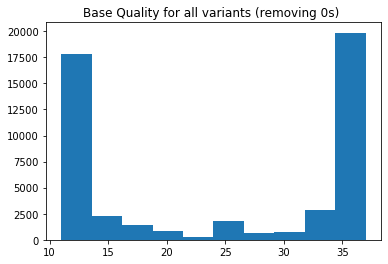

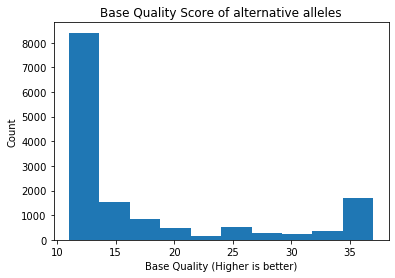

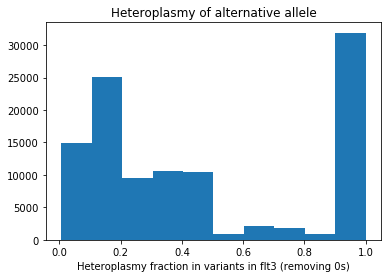

In [15]:
%matplotlib inline
f = plt.figure()
bq_vals = flt3_bq_df.values.flatten()
plt.hist(bq_vals[bq_vals>0])
plt.title("Base Quality for all variants (removing 0s) ")
plt.savefig(join(outdir, "flt3_base_quality.png"))

plt.figure()
plt.hist(flt3_af["Alternative BQ"])
plt.title("Base Quality Score of alternative alleles")
plt.xlabel("Base Quality (Higher is better)")
plt.ylabel("Count")
plt.savefig(join(outdir, "flt3_base_quality_altAllele.png"))


f = plt.figure()
af_vals = flt3_AF_by_cell.values.flatten()
plt.hist(af_vals[af_vals>0])
plt.title("Heteroplasmy of alternative allele")
plt.xlabel("Heteroplasmy fraction in variants in flt3 (removing 0s)")
plt.savefig(join(outdir, "flt3_heteroplasmy_values.png"))


## Merge the two 

In [16]:
flt3_AF_by_cell.index = flt3_AF_by_cell.index + "_flt3"
wt_AF_by_cell.index = wt_AF_by_cell.index + "_wt"


In [17]:
all_cells = pd.concat((wt_AF_by_cell,flt3_AF_by_cell) ,axis=1)


/home/isshamie/software/anaconda2/envs/mito_trace/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  """Entry point for launching an IPython kernel.


In [18]:
all_cells_var_overlap = pd.concat((wt_AF_by_cell,flt3_AF_by_cell) ,axis=0, join='inner')
overlap_variants = all_cells_var_overlap.columns.values
all_cells_var_overlap


,652T,654G,655G,661A,663G,679A,692A,696A,699G,704A,...,14795A,14798G,14799A,14800A,14801C,14802A,14803A,14804T,14805T,14806G
ATGAGGGCACATGGGA-1_wt,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CGTTAGAGTATATCCG-1_wt,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AACTGGTTCTCTTGAT-1_wt,0.0,0.0,0.0,0.0,0.5,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TCGCGAGTCAGGCAAG-1_wt,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TCAGGATTCAAGATCC-1_wt,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CGAGCCACATAACCTG-1_flt3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CCATTCGGTCTCACCT-1_flt3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AGAATAGGTAAGGGAA-1_flt3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.1,0.0,0.0,0.0,0.0,0.0
ATGAGGGCAAGCCATT-1_flt3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.166667,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


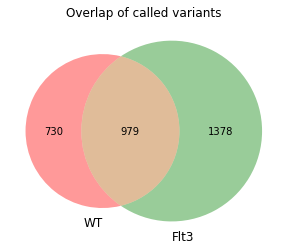

In [19]:
%matplotlib inline
venn2([set(wt_AF_by_cell.columns.values),set(flt3_AF_by_cell.columns.values)],set_labels=["WT","Flt3"])
plt.title("Overlap of called variants")
plt.savefig(join(outdir,"overlap_variants_with_without_ligand.png"))

## Plot the lineage tracing 

### With only the overlapping variants

In [20]:
all_cells_var_overlap = all_cells_var_overlap.drop((all_cells_var_overlap==0).all(axis=0).where(lambda x: x==True).dropna().index,axis=1)

all_cells_var_overlap = all_cells_var_overlap.drop((all_cells_var_overlap==0).all(axis=1).where(lambda x: x==True).dropna().index,axis=0)

In [21]:

row_meta = pd.concat((pd.DataFrame(index=flt3_AF_by_cell.index, data={"Sample":["Flt3"]*flt3_AF_by_cell.index.shape[0]}),
           pd.DataFrame(index= wt_AF_by_cell.index, data={"Sample":["wt"]*wt_AF_by_cell.index.shape[0]})))
row_meta = row_meta.loc[all_cells_var_overlap.index]
row_meta

,Sample
ATGAGGGCACATGGGA-1_wt,wt
CGTTAGAGTATATCCG-1_wt,wt
AACTGGTTCTCTTGAT-1_wt,wt
TCGCGAGTCAGGCAAG-1_wt,wt
TCAGGATTCAAGATCC-1_wt,wt
...,...
CGAGCCACATAACCTG-1_flt3,Flt3
CCATTCGGTCTCACCT-1_flt3,Flt3
AGAATAGGTAAGGGAA-1_flt3,Flt3
ATGAGGGCAAGCCATT-1_flt3,Flt3


In [22]:
all_cells_var_overlap

,652T,654G,655G,661A,663G,679A,692A,696A,699G,704A,...,14795A,14798G,14799A,14800A,14801C,14802A,14803A,14804T,14805T,14806G
ATGAGGGCACATGGGA-1_wt,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CGTTAGAGTATATCCG-1_wt,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AACTGGTTCTCTTGAT-1_wt,0.0,0.0,0.0,0.0,0.5,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TCGCGAGTCAGGCAAG-1_wt,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TCAGGATTCAAGATCC-1_wt,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CGAGCCACATAACCTG-1_flt3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CCATTCGGTCTCACCT-1_flt3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AGAATAGGTAAGGGAA-1_flt3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.1,0.0,0.0,0.0,0.0,0.0
ATGAGGGCAAGCCATT-1_flt3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.166667,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


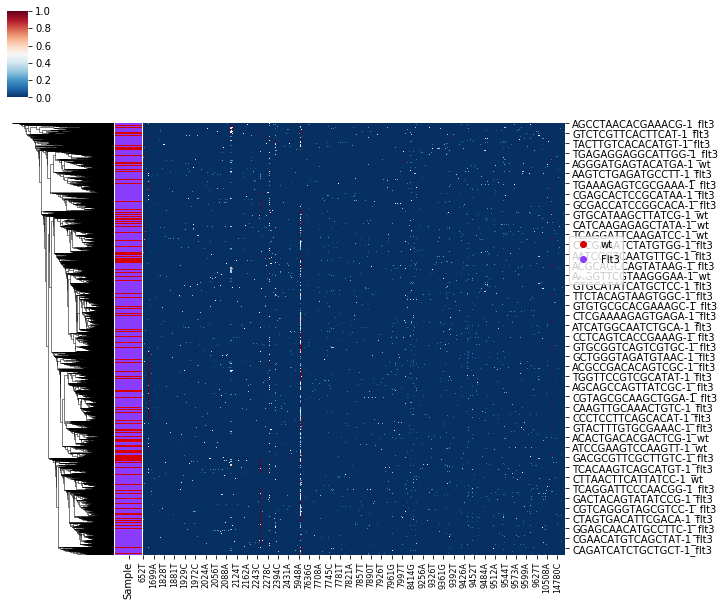

In [23]:
%matplotlib inline
cluster_help.plot_cluster(df=all_cells_var_overlap, row_meta=row_meta, col_meta=None,
                 fsave=None, to_z=False, to_col_clust=False,
                 to_row_clust=True, name=None, col_names=True,
                 row_names=True, to_legend=True, method="average", white_name=None)
plt.savefig(join(outdir,"lineage_OnlyoverlapVariants.png"))

### With all variants

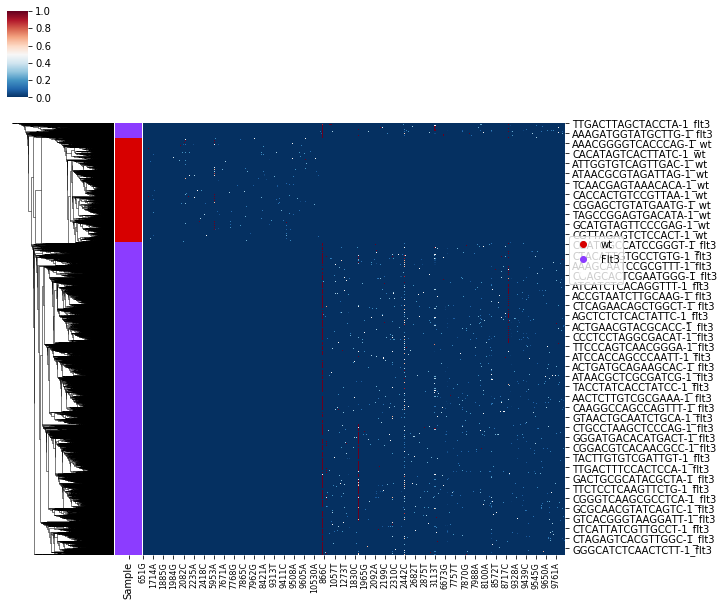

In [24]:
all_cells = all_cells.fillna(0)
all_cells = all_cells.drop((all_cells==0).all(axis=0).where(lambda x: x==True).dropna().index,axis=1)

all_cells = all_cells.drop((all_cells==0).all(axis=1).where(lambda x: x==True).dropna().index,axis=0)

# row_meta = pd.concat((pd.DataFrame(index=flt3_cell, data={"Sample":["Flt3"]*flt3_cell.shape[0]}),
#            pd.DataFrame(index=wt_cell, data={"Sample":["wt"]*wt_cell.shape[0]})))
# row_meta = row_meta.loc[all_cells.index]

row_meta = pd.concat((pd.DataFrame(index=flt3_AF_by_cell.index, data={"Sample":["Flt3"]*flt3_AF_by_cell.index.shape[0]}),
           pd.DataFrame(index= wt_AF_by_cell.index, data={"Sample":["wt"]*wt_AF_by_cell.index.shape[0]})))
row_meta = row_meta.loc[all_cells.index]
row_meta


cluster_help.plot_cluster(df=all_cells, row_meta=row_meta, col_meta=None,
                 fsave=None, to_z=False, to_col_clust=False,
                 to_row_clust=True, name=None, col_names=True,
                 row_names=True, to_legend=True, method="average", white_name=None)
plt.savefig(join(outdir,"lineage_AllVariants.png"))

## Overlay average heteroplasmy on rows

## Plot number of overlapping positions from Flt3 and without

### Here we compare the rest of sequencing techniques done and see if we see the same variants, this ensuring the differences are consistent across the techniques and not technical noise.

In [25]:
from sklearn.preprocessing import StandardScaler

import numpy as np

/data2/mito_lineage/src/utils.py:86: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


(4, 9)
feat 0
0 0
feat 1
0 0
feat 2
1 0
feat 3
1 0
feat 4
2 0
feat 5
2 0
feat 6
3 0
feat 7
3 0
feat 8
4 0


,651G,652T,653A,654G,655G,656A,657A,658T,659A,660A,...,14800A,14801C,14802A,14803A,14804T,14805T,14806G,14807A,embedding_1,embedding_2
ATGAGGGCACATGGGA-1_wt,-0.048042,-0.073007,-0.033596,-0.080354,-0.078738,-0.046116,-0.033596,-0.047472,-0.050983,-0.033596,...,-0.071318,-0.045094,-0.078756,-0.069588,-0.069804,-0.100963,-0.075049,-0.033596,-0.397344,-3.767708
CGTTAGAGTATATCCG-1_wt,-0.048042,-0.073007,-0.033596,-0.080354,-0.078738,-0.046116,-0.033596,-0.047472,-0.050983,-0.033596,...,-0.071318,-0.045094,-0.078756,-0.069588,-0.069804,-0.100963,-0.075049,-0.033596,-0.573098,0.623304
AACTGGTTCTCTTGAT-1_wt,-0.048042,-0.073007,-0.033596,-0.080354,-0.078738,-0.046116,-0.033596,-0.047472,-0.050983,-0.033596,...,-0.071318,-0.045094,-0.078756,-0.069588,-0.069804,-0.100963,-0.075049,-0.033596,-0.325362,-0.071950
TCGCGAGTCAGGCAAG-1_wt,-0.048042,-0.073007,-0.033596,-0.080354,-0.078738,-0.046116,-0.033596,-0.047472,-0.050983,-0.033596,...,-0.071318,-0.045094,-0.078756,-0.069588,-0.069804,-0.100963,-0.075049,-0.033596,-0.319896,-1.222731
TCAGGATTCAAGATCC-1_wt,-0.048042,-0.073007,-0.033596,-0.080354,-0.078738,-0.046116,-0.033596,-0.047472,-0.050983,-0.033596,...,-0.071318,-0.045094,-0.078756,-0.069588,-0.069804,-0.100963,-0.075049,-0.033596,-0.519429,0.460178
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGCGTCTCTCAAACG-1_wt,-0.048042,-0.073007,-0.033596,-0.080354,-0.078738,-0.046116,-0.033596,-0.047472,-0.050983,-0.033596,...,-0.071318,-0.045094,-0.078756,-0.069588,-0.069804,-0.100963,-0.075049,-0.033596,-0.545722,0.072529
ACGCCGATCAGAGGTG-1_wt,-0.048042,-0.073007,-0.033596,-0.080354,-0.078738,-0.046116,-0.033596,-0.047472,-0.050983,-0.033596,...,-0.071318,-0.045094,-0.078756,-0.069588,-0.069804,-0.100963,-0.075049,-0.033596,4.866301,-0.488459
TGGCCAGCAATGGAAT-1_wt,-0.048042,-0.073007,-0.033596,-0.080354,-0.078738,-0.046116,-0.033596,-0.047472,-0.050983,-0.033596,...,-0.071318,-0.045094,-0.078756,-0.069588,-0.069804,-0.100963,-0.075049,-0.033596,-0.435361,-0.679082
TGAAAGAGTGGTACAG-1_wt,-0.048042,-0.073007,-0.033596,-0.080354,-0.078738,-0.046116,-0.033596,-0.047472,-0.050983,-0.033596,...,-0.071318,-0.045094,-0.078756,-0.069588,-0.069804,-0.100963,-0.075049,-0.033596,-0.693682,-0.110785


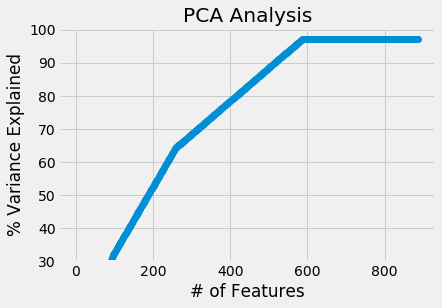

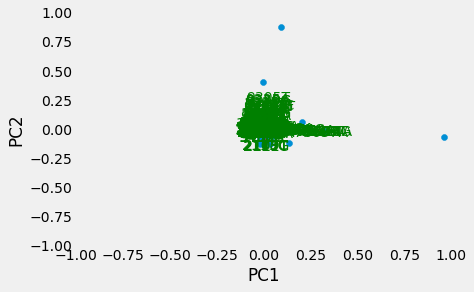

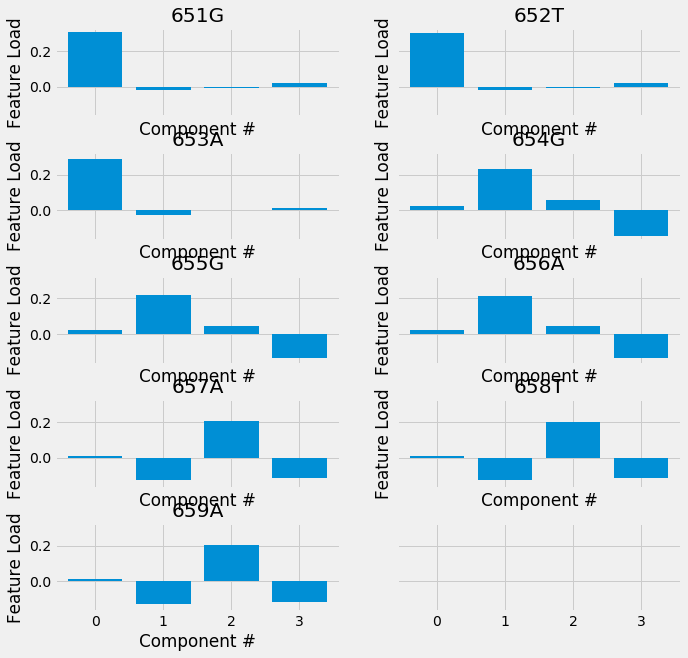

In [27]:
from src.utils import construct_pca

scaler = StandardScaler()
z_wt_AF_by_cell = wt_AF_by_cell.copy()
z_wt_AF_by_cell.iloc[:,:] = scaler.fit_transform(wt_AF_by_cell)
construct_pca(z_wt_AF_by_cell)

/data2/mito_lineage/src/utils.py:86: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


(4, 7)
feat 0
0 0
feat 1
0 0
feat 2
1 0
feat 3
1 0
feat 4
2 0
feat 5
2 0
feat 6
3 0


,651G,652T,653A,654G,655G,656A,657A,658T,659A,660A,...,14800A,14801C,14802A,14803A,14804T,14805T,14806G,14807A,embedding_1,embedding_2
ATGAGGGCACATGGGA-1_wt,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.409548,0.338430
CGTTAGAGTATATCCG-1_wt,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.886154,1.017622
AACTGGTTCTCTTGAT-1_wt,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.206705,-0.234677
TCGCGAGTCAGGCAAG-1_wt,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.164397,-1.032877
TCAGGATTCAAGATCC-1_wt,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.133120,0.130855
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGCGTCTCTCAAACG-1_wt,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.175693,-0.372132
ACGCCGATCAGAGGTG-1_wt,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.141210,0.042276
TGGCCAGCAATGGAAT-1_wt,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.184950,-0.383698
TGAAAGAGTGGTACAG-1_wt,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.219334,0.725687


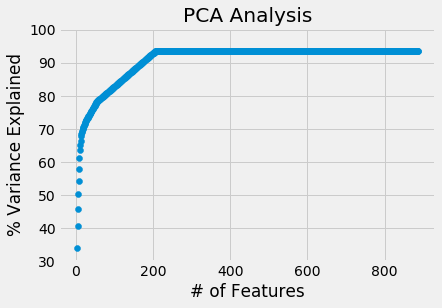

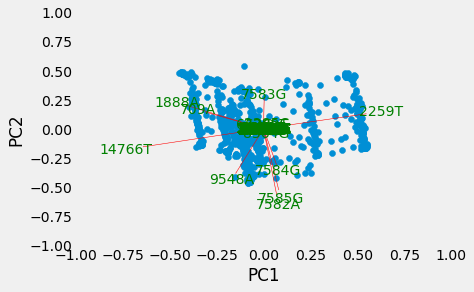

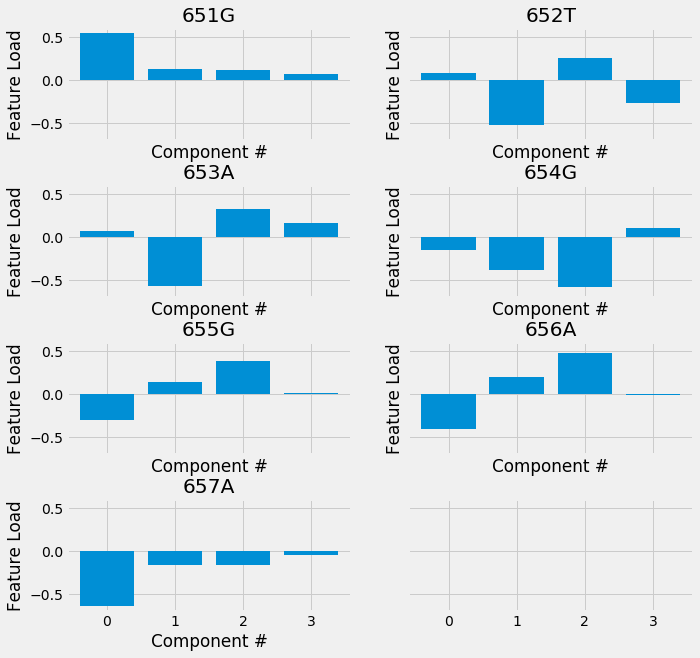

In [28]:
construct_pca(wt_AF_by_cell)

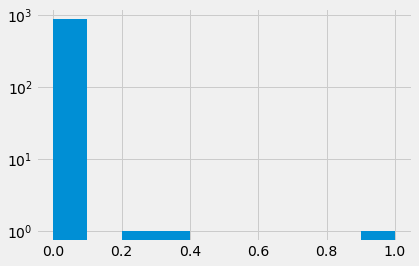

In [29]:
plt.hist(wt_AF_by_cell["651G"])
plt.yscale('log')


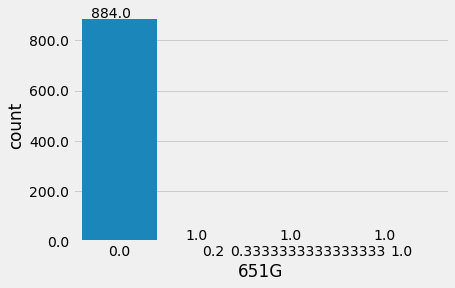

In [30]:
ax = sns.countplot(wt_AF_by_cell["651G"],)
for p in ax.patches:
        ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.1, p.get_height()+5))

#put 11 ticks (therefore 10 steps), from 0 to the total number of rows in the dataframe
#ax.yaxis.set_ticks(np.linspace(0, total, 11))

#adjust the ticklabel to the desired format, without changing the position of the ticks. 
_ = ax.set_yticklabels(map('{:.1f}'.format, ax.yaxis.get_majorticklocs()))

In [31]:
wt_AF_by_cell.groupby("652T").size()

652T
0.000000    882
0.142857      1
0.166667      1
0.200000      1
0.250000      1
0.285714      1
dtype: int64